### Курсовой проект для курса "Python для Data Science 2"

##### Входные файлы:  course_projecy_train.csv, course_projecy_test.csv

##### Задание: На основании имеющихся данных о клиентах банка, построить модель прогнозирования дефолта по текущему кредиту. Выполнить прогноз по тестовому датасету.

##### Целевая переменная: Credit Default - факт невыполнения кредитных обязательств

##### Основная метрика: F1-score

In [171]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV, learning_curve
from sklearn.metrics import f1_score, make_scorer, classification_report, precision_score, recall_score

In [172]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
pd.set_option('display.max_columns', 100)

**Описание датасета**

* **Home Ownership** - домовладение
* **Annual Income** - годовой доход
* **Years in current job** - количество лет на текущем месте работы
* **Tax Liens** - налоговые обременения
* **Number of Open Accounts** - количество открытых счетов
* **Years of Credit History** - количество лет кредитной истории
* **Maximum Open Credit** - наибольший открытый кредит
* **Number of Credit Problems** - количество проблем с кредитом
* **Months since last delinquent** - количество месяцев с последней просрочки платежа
* **Bankruptcies** - банкротства
* **Purpose** - цель кредита
* **Term** - срок кредита
* **Current Loan Amount** - текущая сумма кредита
* **Current Credit Balance** - текущий кредитный баланс
* **Monthly Debt** - ежемесячный долг
* **Credit Default** - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

In [173]:
df = pd.read_csv('course_project_train.csv')
df.sample(5)

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
4448,Rent,867996.0,2 years,0.0,6.0,8.2,259006.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,102676.0,7667.0,724.0,0
6582,Rent,1065805.0,9 years,0.0,11.0,24.6,339130.0,1.0,NaN,1.0,debt consolidation,Long Term,336578.0,128288.0,21405.0,726.0,0
1311,Rent,NaN,7 years,0.0,13.0,9.5,469238.0,0.0,NaN,0.0,debt consolidation,Short Term,325710.0,282872.0,22269.0,NaN,0
6606,Home Mortgage,1191243.0,5 years,0.0,10.0,34.5,599984.0,0.0,44.0,0.0,debt consolidation,Short Term,215710.0,384484.0,31469.0,741.0,0
1302,Home Mortgage,1903154.0,8 years,0.0,13.0,19.7,325864.0,0.0,26.0,0.0,debt consolidation,Short Term,215864.0,236398.0,14718.0,720.0,0


In [174]:
df.shape

(7500, 17)

In [175]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   object 
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7129 non-null   object 
 3   Tax Liens                     7500 non-null   float64
 4   Number of Open Accounts       7500 non-null   float64
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   float64
 8   Months since last delinquent  3419 non-null   float64
 9   Bankruptcies                  7486 non-null   float64
 10  Purpose                       7500 non-null   object 
 11  Term                          7500 non-null   object 
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

#### посмотрим корреляцию между признаками

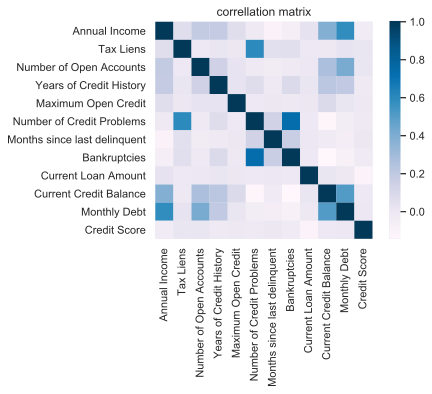

In [176]:
cols_to_analyze = [d for d in df.columns if d != 'Credit Default']
# print(cols_to_analyze)

def plot_corr_map(corr_matrix):
#     fig = plt.figure(figsize=(8,6))
    ax = plt.axes()
    ax.set_title('correllation matrix')
    sns.heatmap(corr_matrix, square=True,ax=ax,cmap='PuBu');

corr_matrix = df[cols_to_analyze].corr()
# corr_matrix = df.corr()
plot_corr_map(corr_matrix)

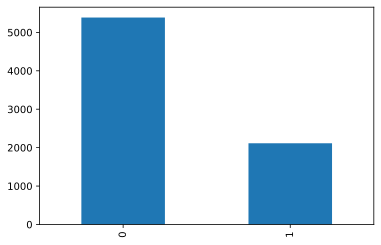

In [7]:
df['Credit Default'].value_counts().plot(kind='bar')

##### оценим баланс в результирующей переменной

In [8]:
df.describe()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
count,5.943000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.000000,3419.000000,7486.000000,7.500000e+03,7.500000e+03,7500.000000,5943.000000,7500.000000
mean,1.366392e+06,0.030133,11.130933,18.317467,9.451537e+05,0.170000,34.692600,0.117152,1.187318e+07,2.898332e+05,18314.454133,1151.087498,0.281733
std,8.453392e+05,0.271604,4.908924,7.041946,1.602622e+07,0.498598,21.688806,0.347192,3.192612e+07,3.178714e+05,11926.764673,1604.451418,0.449874
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.000000,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000,0.000000
25%,8.443410e+05,0.000000,8.000000,13.500000,2.792295e+05,0.000000,16.000000,0.000000,1.801690e+05,1.142565e+05,10067.500000,711.000000,0.000000
50%,1.168386e+06,0.000000,10.000000,17.000000,4.781590e+05,0.000000,32.000000,0.000000,3.095730e+05,2.093230e+05,16076.500000,731.000000,0.000000
75%,1.640137e+06,0.000000,14.000000,21.800000,7.935015e+05,0.000000,50.000000,0.000000,5.198820e+05,3.604062e+05,23818.000000,743.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700000,1.304726e+09,7.000000,118.000000,4.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000,1.000000


#### Обработка пропущенных данных

In [9]:
def mis_values_report(df):
    '''Функция считает и выводит пропущенные значения столбцов датафрейма'''
    mis_val = df.isnull().sum()
    perc_mis_val = 100 * df.isnull().sum() / len(df)
    report = pd.concat([mis_val, perc_mis_val], axis=1)
    report_columns = report.rename(columns = {0: 'Пропущенные значения', 1: '% от всех значений'})
    report_columns = report_columns[report_columns.iloc[:,1] != 0].sort_values('% от всех значений', ascending=False).round(1)
    print('Датафрейм имеет ' + str(df.shape[1]) + ' столбцов.\n' + str(report_columns.shape[0]) + ' столбцов имеют пропущенные значения')
    return report_columns

In [10]:
mis_values_report(df)

Датафрейм имеет 17 столбцов.
5 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Months since last delinquent,4081,54.4
Annual Income,1557,20.8
Credit Score,1557,20.8
Years in current job,371,4.9
Bankruptcies,14,0.2


In [11]:
# Удалим столбец с пропусками более 50%
df.drop(columns = 'Months since last delinquent', axis=1, inplace=True)

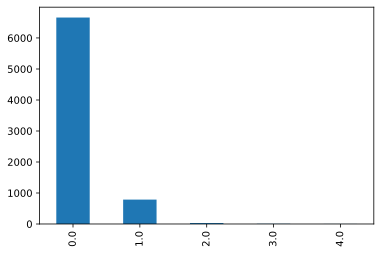

In [12]:
df['Bankruptcies'].value_counts().plot(kind='bar')

In [13]:
# заменим пропущенные значения часто встречающимися 
df['Bankruptcies'].fillna(float(0), inplace = True)
mis_values_report(df)

Датафрейм имеет 16 столбцов.
3 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Annual Income,1557,20.8
Credit Score,1557,20.8
Years in current job,371,4.9


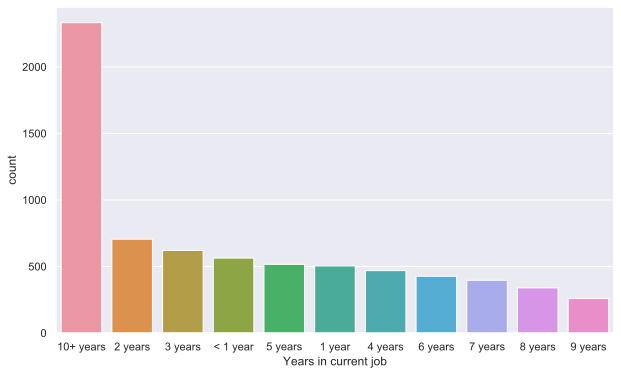

In [14]:
# посмотрим как выглядит распределение от стажа на месте
sns.set(style='darkgrid')
plt.figure(figsize=(10,6))
sns.countplot(df['Years in current job'], order = df['Years in current job'].value_counts().index)

In [15]:
# заменим пропущенные значения часто встречающимися 
df['Years in current job'].fillna('10+ years', inplace = True)
mis_values_report(df)

Датафрейм имеет 16 столбцов.
2 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Annual Income,1557,20.8
Credit Score,1557,20.8


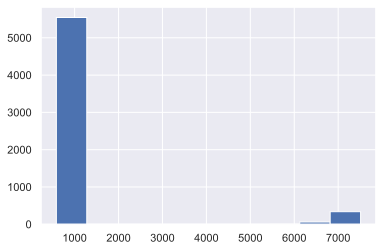

In [16]:
df['Credit Score'].hist()

##### В Credit Score есть выбросы. Избавимся от них ( <= 850)

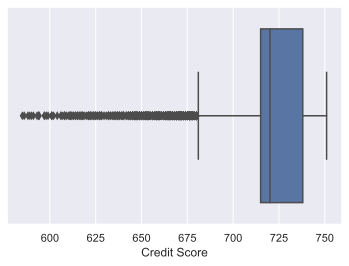

In [17]:
df['Credit Score'] = df['Credit Score'].apply(lambda val: (val / 10) if val > 850 else val)
df['Credit Score'].fillna(df['Credit Score'].mean(), inplace=True)
sns.boxplot(x=df['Credit Score'])

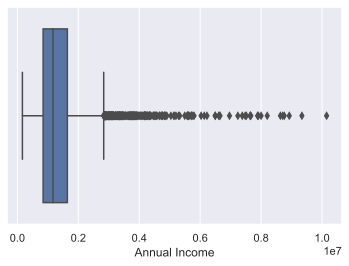

In [18]:
sns.boxplot(x=df['Annual Income'])

##### Возможно это граждане с высоким доходом, заполним проспуски средним

In [19]:
df['Annual Income'].fillna(df['Annual Income'].mean(), inplace=True)

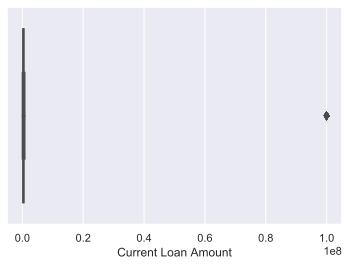

In [20]:
sns.boxplot(x=df['Current Loan Amount'])

In [21]:
d1 =  df.sort_values(by=['Current Loan Amount'],ascending=False)
d1.loc[d1['Current Loan Amount'] >= 99999999.0]['Current Loan Amount']

0       99999999.0
4471    99999999.0
6646    99999999.0
4384    99999999.0
4388    99999999.0
           ...    
5889    99999999.0
6213    99999999.0
30      99999999.0
417     99999999.0
5906    99999999.0
Name: Current Loan Amount, Length: 870, dtype: float64

#### Возможно это выброс, но 870 значений много (оставим данные, возможно это нужно)

In [22]:
mis_values_report(df)

Датафрейм имеет 16 столбцов.
0 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений


In [23]:
df.describe()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
count,7.500000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.000000,7500.000000,7.500000e+03,7.500000e+03,7500.000000,7500.000000,7500.000000
mean,1.366392e+06,0.030133,11.130933,18.317467,9.451537e+05,0.170000,0.116933,1.187318e+07,2.898332e+05,18314.454133,720.086993,0.281733
std,7.524812e+05,0.271604,4.908924,7.041946,1.602622e+07,0.498598,0.346904,3.192612e+07,3.178714e+05,11926.764673,24.886214,0.449874
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000,0.000000
25%,9.311330e+05,0.000000,8.000000,13.500000,2.792295e+05,0.000000,0.000000,1.801690e+05,1.142565e+05,10067.500000,715.000000,0.000000
50%,1.366392e+06,0.000000,10.000000,17.000000,4.781590e+05,0.000000,0.000000,3.095730e+05,2.093230e+05,16076.500000,720.086993,0.000000
75%,1.499974e+06,0.000000,14.000000,21.800000,7.935015e+05,0.000000,0.000000,5.198820e+05,3.604062e+05,23818.000000,738.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700000,1.304726e+09,7.000000,4.000000,1.000000e+08,6.506797e+06,136679.000000,751.000000,1.000000


##### приведем датасет к категориальным данным

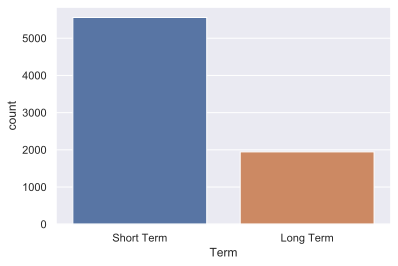

In [24]:
sns.countplot(df['Term'])

In [25]:
df['Term'].replace(('Short Term','Long Term'),(0,1), inplace=True)

#### Разделим на категории кредитный рейтинг

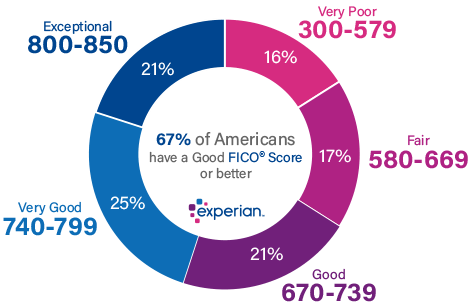

In [26]:
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Poor" if np.isreal(val) and val < 580 else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Average" if np.isreal(val) and (val >= 580 and val < 670) else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Good" if np.isreal(val) and (val >= 670 and val < 740) else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Very Good" if np.isreal(val) and (val >= 740 and val < 800) else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Exceptional" if np.isreal(val) and (val >= 800 and val <= 850) else val)

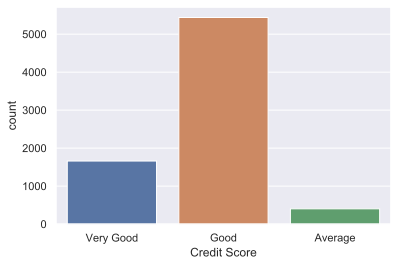

In [27]:
sns.countplot(df['Credit Score'])

In [28]:
# Преобразуем в дискретные значения
df = df.join(pd.get_dummies(df['Credit Score'], drop_first = True))
df.rename(index = str, columns={'Good':'Credit Good', 'Very Good':'Credit Very Good'})

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Credit Good,Credit Very Good
0,Own Home,4.820870e+05,10+ years,0.0,11.0,26.3,685960.0,1.0,1.0,debt consolidation,0,99999999.0,47386.0,7914.0,Very Good,0,0,1
1,Own Home,1.025487e+06,10+ years,0.0,15.0,15.3,1181730.0,0.0,0.0,debt consolidation,1,264968.0,394972.0,18373.0,Good,1,1,0
2,Home Mortgage,7.514120e+05,8 years,0.0,11.0,35.0,1182434.0,0.0,0.0,debt consolidation,0,99999999.0,308389.0,13651.0,Very Good,0,0,1
3,Own Home,8.050680e+05,6 years,0.0,8.0,22.5,147400.0,1.0,1.0,debt consolidation,0,121396.0,95855.0,11338.0,Good,0,1,0
4,Rent,7.762640e+05,8 years,0.0,13.0,13.6,385836.0,1.0,0.0,debt consolidation,0,125840.0,93309.0,7180.0,Good,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,4.021920e+05,< 1 year,0.0,3.0,8.5,107866.0,0.0,0.0,other,0,129360.0,73492.0,1900.0,Good,0,1,0
7496,Home Mortgage,1.533984e+06,1 year,0.0,10.0,26.5,686312.0,0.0,0.0,debt consolidation,1,444048.0,456399.0,12783.0,Very Good,1,0,1
7497,Rent,1.878910e+06,6 years,0.0,12.0,32.1,1778920.0,0.0,0.0,buy a car,0,99999999.0,477812.0,12479.0,Very Good,0,0,1
7498,Home Mortgage,1.366392e+06,10+ years,0.0,21.0,26.5,1141250.0,0.0,0.0,debt consolidation,0,615274.0,476064.0,37118.0,Good,0,1,0


In [29]:
df = df.drop(['Credit Score'], axis=1)

#### Цели кредита

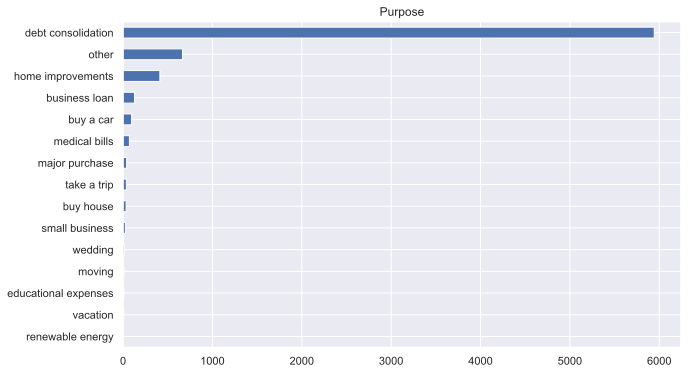

In [30]:
df['Purpose'].value_counts().sort_values(ascending=True).plot(kind='barh', title='Purpose', figsize=(10,6))

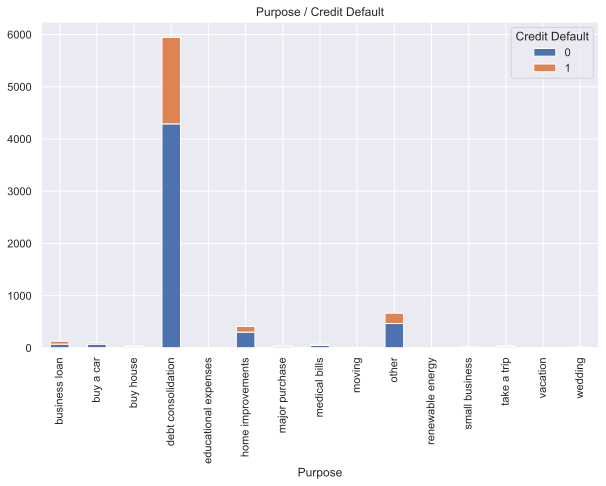

In [31]:
purpose_cr_deafult = df[['Purpose','Credit Default']]
pd.crosstab(purpose_cr_deafult['Purpose'], purpose_cr_deafult['Credit Default']).plot(kind='bar', stacked=True, figsize=(10,6), title="Purpose / Credit Default", )

In [32]:
# нет смыла оценивать метрику
df = df.drop(['Purpose'], axis=1)

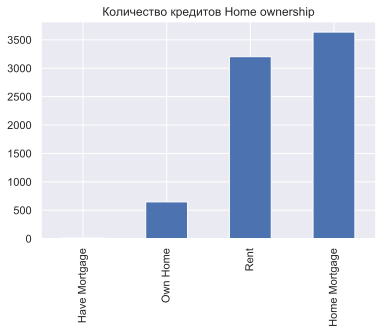

In [33]:
df['Home Ownership'].value_counts().sort_values(ascending = True
                                               ).plot(kind='bar', title='Количество кредитов Home ownership')

##### Наибольшее количество кредитов взяли на ипотеку и аренду

In [34]:
df = df.join(pd.get_dummies(df['Home Ownership'],drop_first = True))

In [35]:
df = df.drop(['Home Ownership'], axis=1)
df.head()

,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent
0,482087.0,10+ years,0.0,11.0,26.3,685960.0,1.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0
1,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0
2,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0
3,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0
4,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1


##### Количество лет на одном месте

In [36]:
df['Years in current job'] = df['Years in current job'].str.extract(r"(\d+)")
df['Years in current job'] = df['Years in current job'].astype(float)

In [37]:
df['Employment History'] = df['Years in current job'].apply(
    lambda x: 'Junior lvl' if x < 4 else ('Middle lvl' if x > 4 and x < 8 else 'Senior lvl'))

In [38]:
df = df.drop(['Years in current job'], axis=1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Employment History
0,482087.0,0.0,11.0,26.3,685960.0,1.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,Senior lvl
1,1025487.0,0.0,15.0,15.3,1181730.0,0.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,Senior lvl
2,751412.0,0.0,11.0,35.0,1182434.0,0.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,Senior lvl
3,805068.0,0.0,8.0,22.5,147400.0,1.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,Middle lvl
4,776264.0,0.0,13.0,13.6,385836.0,1.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,Senior lvl


In [39]:
df = df.join(pd.get_dummies(df['Employment History'],drop_first = True))

In [40]:
df = df.drop(['Employment History'], axis=1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl
0,482087.0,0.0,11.0,26.3,685960.0,1.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1
1,1025487.0,0.0,15.0,15.3,1181730.0,0.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1
2,751412.0,0.0,11.0,35.0,1182434.0,0.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1
3,805068.0,0.0,8.0,22.5,147400.0,1.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0
4,776264.0,0.0,13.0,13.6,385836.0,1.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1


##### Создадим категории для "Number of Credit Problems"

In [41]:
df['Credit Problems'] = df['Number of Credit Problems'].apply(
    lambda x: "No Credit Problems" if x == 0 else ("Some Credit promblem" if x > 0 and x < 5 else "Big Credit Problems"))

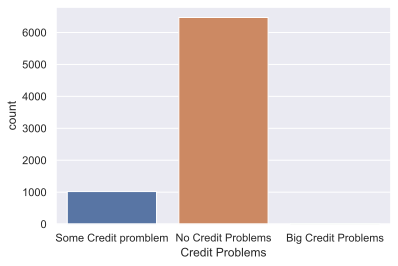

In [42]:
sns.countplot(df['Credit Problems'])

In [43]:
df['Credit Problems'].value_counts()

No Credit Problems      6469
Some Credit promblem    1019
Big Credit Problems       12
Name: Credit Problems, dtype: int64

In [44]:
df = df.join(pd.get_dummies(df['Credit Problems'],drop_first = True))
df = df.drop(['Credit Problems','Number of Credit Problems'], axis=1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem
0,482087.0,0.0,11.0,26.3,685960.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1
1,1025487.0,0.0,15.0,15.3,1181730.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0
2,751412.0,0.0,11.0,35.0,1182434.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0
3,805068.0,0.0,8.0,22.5,147400.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1
4,776264.0,0.0,13.0,13.6,385836.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1


##### Количество лет кредитной истории

In [45]:
df['Credit Age'] = df['Years of Credit History'].apply(
    lambda x: "Short Credit Age" if x < 5 else ("Good Credit Age" if x > 5 and x < 17 else "Excellent Credit Age"))

In [46]:
df = df.join(pd.get_dummies(df['Credit Age'],drop_first = True))
df = df.drop(['Credit Age','Years of Credit History'], axis =1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Maximum Open Credit,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age
0,482087.0,0.0,11.0,685960.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0
1,1025487.0,0.0,15.0,1181730.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0
2,751412.0,0.0,11.0,1182434.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0
3,805068.0,0.0,8.0,147400.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0
4,776264.0,0.0,13.0,385836.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0


##### Налоговые обязательства кредитора

In [47]:
df['Tax Liens'] = df['Tax Liens'].apply(
    lambda x: "No Tax Lien" if x == 0 else ("Some Tax Liens" if x > 0 and x < 3 else "Many Tax Liens"))

In [48]:
df = df.join(pd.get_dummies(df['Tax Liens'],drop_first = True))
df = df.drop(['Tax Liens'],axis=1)
df.head()

,Annual Income,Number of Open Accounts,Maximum Open Credit,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens
0,482087.0,11.0,685960.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0
1,1025487.0,15.0,1181730.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0
2,751412.0,11.0,1182434.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0
3,805068.0,8.0,147400.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0
4,776264.0,13.0,385836.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0


##### Банкротство

In [49]:
df['Bankruptcies'] = df['Bankruptcies'].apply(lambda x: "No Bankruptcies" if x==0 else ("Some Bankruptcies" if x>0 and x<3 else "Many Bankruptcies"))
df = df.join(pd.get_dummies(df['Bankruptcies'],drop_first = True))
df = df.drop(['Bankruptcies'],axis=1)
df.head()

,Annual Income,Number of Open Accounts,Maximum Open Credit,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies
0,482087.0,11.0,685960.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1
1,1025487.0,15.0,1181730.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0
2,751412.0,11.0,1182434.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0
3,805068.0,8.0,147400.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1
4,776264.0,13.0,385836.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0


##### Посмотрим, что с годовым доходом (разделим на три части используя среднее и отклонение)

In [50]:
mean_income = df['Annual Income'].mean()
std_income = df['Annual Income'].std()
poorline = mean_income - std_income
richline = mean_income + std_income
print(poorline, richline)

613910.5179680381 2118872.9223819533


In [51]:
df['Annual Income'] = df['Annual Income'].apply(
    lambda x: "Low Income" if x <= poorline else ("Average Income" if x > poorline and x < richline else "High Income"))

In [52]:
df = df.join(pd.get_dummies(df['Annual Income'],drop_first = True))
df = df.drop(['Annual Income'], axis=1)
df.head()

,Number of Open Accounts,Maximum Open Credit,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies,High Income,Low Income
0,11.0,685960.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,1
1,15.0,1181730.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0
2,11.0,1182434.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0
3,8.0,147400.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0
4,13.0,385836.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0


##### также разделим по текущей сумме кредита

In [53]:
lmeanxoutlier = df[df['Current Loan Amount'] < 99999999.00 ]['Current Loan Amount'].mean()
lstddevxoutlier = df[df['Current Loan Amount'] < 99999999.00 ]['Current Loan Amount'].std()
lowrange = lmeanxoutlier - lstddevxoutlier
highrange = lmeanxoutlier + lstddevxoutlier
print(lowrange, highrange)

126730.38172561661 491318.3989681994


In [54]:
df['Current Loan Amount'] = df['Current Loan Amount'].apply(
    lambda x: "Small Loan" if x <= lowrange else ("Medium Loan" if x > lowrange and x < highrange else "Big Loan"))

In [55]:
df = df.join(pd.get_dummies(df['Current Loan Amount'],drop_first = True))
df = df.drop(['Current Loan Amount'], axis=1)
df.head()

,Number of Open Accounts,Maximum Open Credit,Term,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies,High Income,Low Income,Medium Loan,Small Loan
0,11.0,685960.0,0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,1,0,0
1,15.0,1181730.0,1,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0,1,0
2,11.0,1182434.0,0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0
3,8.0,147400.0,0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1
4,13.0,385836.0,0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,0,1


##### Часть признаков удалим, т.к. они не имеют смысла или сильно крелируют с другими признаками 
* Number of Open Accounts - количество открытых счетов
* Maximum Open Credit - наибольший открытый кредит
* Current Credit Balance - текущий кредитный баланс
* Monthly Debt - ежемесячный долг

In [56]:
df = df.drop(['Number of Open Accounts','Maximum Open Credit','Current Credit Balance','Monthly Debt'],axis=1)
df.head()

,Term,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies,High Income,Low Income,Medium Loan,Small Loan
0,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,1,0,0
1,1,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0,1,0
2,0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1
4,0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,0,1


##### Разбиваем данные на тренировочный и тестовый датасеты

In [57]:
target = df['Credit Default'].copy() 
features = df.drop(columns='Credit Default')

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(6000, 20)
(1500, 20)
(6000,)
(1500,)


In [58]:
from sklearn.utils import resample

In [59]:
# Разделим минорный и мажорный классы
df_majority = df[df['Credit Default']==0]
df_minority = df[df['Credit Default']==1]

print(f"majorCount: {df_majority['Credit Default'].count()}")
print(f"minorCount: {df_minority['Credit Default'].count()}")
print(df['Credit Default'].value_counts())

majorCount: 5387
minorCount: 2113
0    5387
1    2113
Name: Credit Default, dtype: int64


##### Поработаем с дисбалансом данных, используем  resample для upsample минорного

In [60]:
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     
                                 n_samples=5387, # count of majority class
                                 random_state=42) 
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

df_upsampled['Credit Default'].value_counts()

1    5387
0    5387
Name: Credit Default, dtype: int64

In [61]:
y_upsampled = df_upsampled['Credit Default']
X_upsampled = df_upsampled.drop(['Credit Default'], axis= 1)

##### еще вариант, используем алгоритм SMOTE из библиотеки imblearn

In [62]:
from imblearn.over_sampling import SMOTE

In [63]:
sm = SMOTE(random_state=42)
X_SMOTE, y_SMOTE = sm.fit_sample(X_train, y_train)
print(len(X_SMOTE), len(y_SMOTE))
print(y_SMOTE.sum())

8656 8656
4328


##### Вспомогательные функции (для оценки результатов работы моделей)

In [158]:
rez = list()
# Оценка классификации
def get_classification_report(model,y_train_true, y_train_pred, y_test_true, y_test_pred):
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    print('TEST\n\n' + classification_report(y_test_true, y_test_pred))
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_test_true, y_test_pred))
    rez.extend([("TRAIN ", model.rjust(23, ' ') , i) for i in classification_report(y_train_true, y_train_pred).split("\n")[0:4] if i != ''])
    rez.extend([("TEST  ", model.rjust(23, ' ') , i) for i in classification_report(y_test_true, y_test_pred).split("\n")[1:4] if i != ''])
    rez.append("=" * 45)
    return (model)

In [65]:
# Кривая обучения
def show_learning_curve_plot(estimator, X, y, cv=3, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, 
                                                            cv=cv, 
                                                            scoring='f1',
                                                            train_sizes=train_sizes, 
                                                            n_jobs=n_jobs)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(9,6))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.title(f"Learning curves ({type(estimator).__name__})")
    plt.xlabel("Training examples")
    plt.ylabel("Score")     
    plt.legend(loc="best")
    plt.grid()
    plt.show()

In [66]:
def show_proba_calibration_plots(y_predicted_probs, y_true_labels):
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []

    for threshold in np.linspace(0.1, 0.9, 9):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))

    scores_table = pd.DataFrame({'f1':f1_scores,
                                 'precision':precisions,
                                 'recall':recalls,
                                 'probability':thresholds}).sort_values('f1', ascending=False).round(3)
  
    figure = plt.figure(figsize = (11, 4))

    plt1 = figure.add_subplot(121)
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))   
    plt1.table(cellText = scores_table.values,
               colLabels = scores_table.columns, 
               colLoc = 'center', cellLoc = 'center', loc = 'bottom', bbox = [0, -1.3, 1, 1])

    plt2 = figure.add_subplot(122)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0], 
              label='Another class', color='royalblue', alpha=1)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0], 
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    plt.show()

##### Выбор лучших параметров с помощью кросс-валидации

In [67]:
cv = KFold(n_splits=3, random_state=21, shuffle=True)

In [68]:
# catboost SMOTE training
model = CatBoostClassifier()
params = {'depth':[3,4,6],
          'iterations':[1000,1500],
          'learning_rate':[0.1,0.3, 0.5]
          }
scorer = make_scorer(f1_score)
grid_catboost_sm = GridSearchCV(model, params, scoring = scorer, cv=cv)
%time grid_catboost_sm.fit(X_SMOTE, y_SMOTE)
print(grid_catboost_sm.best_params_)
print(grid_catboost_sm.best_score_)
catboost_SMOTE = grid_catboost_sm.best_estimator_

0:	learn: 0.6846329	total: 61.2ms	remaining: 1m 1s
1:	learn: 0.6788217	total: 67.5ms	remaining: 33.7s
2:	learn: 0.6730743	total: 72.6ms	remaining: 24.1s
3:	learn: 0.6684793	total: 87.3ms	remaining: 21.7s
4:	learn: 0.6648933	total: 90.2ms	remaining: 17.9s
5:	learn: 0.6617619	total: 94.4ms	remaining: 15.6s
6:	learn: 0.6597949	total: 102ms	remaining: 14.4s
7:	learn: 0.6575482	total: 105ms	remaining: 13s
8:	learn: 0.6558684	total: 108ms	remaining: 11.9s
9:	learn: 0.6540631	total: 111ms	remaining: 11s
10:	learn: 0.6528661	total: 115ms	remaining: 10.3s
11:	learn: 0.6516187	total: 118ms	remaining: 9.71s
12:	learn: 0.6506940	total: 121ms	remaining: 9.2s
13:	learn: 0.6492103	total: 125ms	remaining: 8.82s
14:	learn: 0.6481589	total: 129ms	remaining: 8.48s
15:	learn: 0.6474230	total: 133ms	remaining: 8.16s
16:	learn: 0.6460183	total: 135ms	remaining: 7.83s
17:	learn: 0.6453447	total: 160ms	remaining: 8.75s
18:	learn: 0.6450076	total: 179ms	remaining: 9.26s
19:	learn: 0.6444611	total: 183ms	remain

180:	learn: 0.6157706	total: 785ms	remaining: 3.55s
181:	learn: 0.6157467	total: 789ms	remaining: 3.54s
182:	learn: 0.6157192	total: 793ms	remaining: 3.54s
183:	learn: 0.6156436	total: 796ms	remaining: 3.53s
184:	learn: 0.6155638	total: 799ms	remaining: 3.52s
185:	learn: 0.6154725	total: 802ms	remaining: 3.51s
186:	learn: 0.6153859	total: 805ms	remaining: 3.5s
187:	learn: 0.6153710	total: 808ms	remaining: 3.49s
188:	learn: 0.6153229	total: 811ms	remaining: 3.48s
189:	learn: 0.6152703	total: 814ms	remaining: 3.47s
190:	learn: 0.6151307	total: 818ms	remaining: 3.46s
191:	learn: 0.6150528	total: 821ms	remaining: 3.46s
192:	learn: 0.6149975	total: 824ms	remaining: 3.45s
193:	learn: 0.6149225	total: 829ms	remaining: 3.44s
194:	learn: 0.6149105	total: 832ms	remaining: 3.44s
195:	learn: 0.6148039	total: 835ms	remaining: 3.43s
196:	learn: 0.6147336	total: 838ms	remaining: 3.42s
197:	learn: 0.6146166	total: 841ms	remaining: 3.41s
198:	learn: 0.6145149	total: 845ms	remaining: 3.4s
199:	learn: 0.

376:	learn: 0.6060064	total: 1.58s	remaining: 2.62s
377:	learn: 0.6059528	total: 1.59s	remaining: 2.61s
378:	learn: 0.6059441	total: 1.59s	remaining: 2.61s
379:	learn: 0.6059058	total: 1.59s	remaining: 2.6s
380:	learn: 0.6058746	total: 1.6s	remaining: 2.59s
381:	learn: 0.6058379	total: 1.6s	remaining: 2.59s
382:	learn: 0.6058035	total: 1.6s	remaining: 2.58s
383:	learn: 0.6057697	total: 1.61s	remaining: 2.58s
384:	learn: 0.6057331	total: 1.61s	remaining: 2.57s
385:	learn: 0.6056895	total: 1.62s	remaining: 2.58s
386:	learn: 0.6055969	total: 1.63s	remaining: 2.58s
387:	learn: 0.6055789	total: 1.63s	remaining: 2.57s
388:	learn: 0.6055243	total: 1.64s	remaining: 2.57s
389:	learn: 0.6055172	total: 1.64s	remaining: 2.57s
390:	learn: 0.6055157	total: 1.64s	remaining: 2.56s
391:	learn: 0.6055132	total: 1.65s	remaining: 2.55s
392:	learn: 0.6054924	total: 1.65s	remaining: 2.55s
393:	learn: 0.6054834	total: 1.65s	remaining: 2.54s
394:	learn: 0.6054369	total: 1.65s	remaining: 2.53s
395:	learn: 0.60

575:	learn: 0.6010335	total: 2.15s	remaining: 1.58s
576:	learn: 0.6009602	total: 2.15s	remaining: 1.58s
577:	learn: 0.6009052	total: 2.15s	remaining: 1.57s
578:	learn: 0.6008816	total: 2.16s	remaining: 1.57s
579:	learn: 0.6008655	total: 2.16s	remaining: 1.56s
580:	learn: 0.6008502	total: 2.17s	remaining: 1.56s
581:	learn: 0.6008060	total: 2.17s	remaining: 1.56s
582:	learn: 0.6007956	total: 2.18s	remaining: 1.56s
583:	learn: 0.6007912	total: 2.19s	remaining: 1.56s
584:	learn: 0.6007491	total: 2.19s	remaining: 1.55s
585:	learn: 0.6007449	total: 2.19s	remaining: 1.55s
586:	learn: 0.6006761	total: 2.2s	remaining: 1.55s
587:	learn: 0.6006509	total: 2.2s	remaining: 1.54s
588:	learn: 0.6006390	total: 2.2s	remaining: 1.54s
589:	learn: 0.6006017	total: 2.21s	remaining: 1.53s
590:	learn: 0.6005241	total: 2.21s	remaining: 1.53s
591:	learn: 0.6005141	total: 2.21s	remaining: 1.52s
592:	learn: 0.6004650	total: 2.21s	remaining: 1.52s
593:	learn: 0.6004282	total: 2.22s	remaining: 1.51s
594:	learn: 0.6

785:	learn: 0.5974046	total: 2.72s	remaining: 741ms
786:	learn: 0.5973784	total: 2.73s	remaining: 739ms
787:	learn: 0.5973388	total: 2.73s	remaining: 736ms
788:	learn: 0.5973254	total: 2.74s	remaining: 733ms
789:	learn: 0.5973061	total: 2.74s	remaining: 730ms
790:	learn: 0.5972914	total: 2.75s	remaining: 726ms
791:	learn: 0.5972885	total: 2.76s	remaining: 724ms
792:	learn: 0.5972692	total: 2.76s	remaining: 721ms
793:	learn: 0.5972692	total: 2.76s	remaining: 717ms
794:	learn: 0.5972637	total: 2.77s	remaining: 714ms
795:	learn: 0.5972232	total: 2.77s	remaining: 710ms
796:	learn: 0.5972170	total: 2.77s	remaining: 707ms
797:	learn: 0.5972030	total: 2.78s	remaining: 703ms
798:	learn: 0.5971994	total: 2.78s	remaining: 699ms
799:	learn: 0.5971824	total: 2.78s	remaining: 696ms
800:	learn: 0.5971392	total: 2.78s	remaining: 692ms
801:	learn: 0.5971179	total: 2.79s	remaining: 688ms
802:	learn: 0.5971137	total: 2.79s	remaining: 685ms
803:	learn: 0.5970969	total: 2.79s	remaining: 681ms
804:	learn: 

996:	learn: 0.5944137	total: 3.29s	remaining: 9.91ms
997:	learn: 0.5944100	total: 3.29s	remaining: 6.61ms
998:	learn: 0.5944058	total: 3.3s	remaining: 3.3ms
999:	learn: 0.5943959	total: 3.3s	remaining: 0us
0:	learn: 0.6864117	total: 3.7ms	remaining: 3.69s
1:	learn: 0.6806102	total: 6.08ms	remaining: 3.04s
2:	learn: 0.6751611	total: 9.08ms	remaining: 3.02s
3:	learn: 0.6707819	total: 11.5ms	remaining: 2.85s
4:	learn: 0.6674255	total: 14.1ms	remaining: 2.81s
5:	learn: 0.6652095	total: 16.5ms	remaining: 2.74s
6:	learn: 0.6628347	total: 18.8ms	remaining: 2.66s
7:	learn: 0.6603445	total: 20.9ms	remaining: 2.59s
8:	learn: 0.6585326	total: 23.4ms	remaining: 2.57s
9:	learn: 0.6571048	total: 25.8ms	remaining: 2.56s
10:	learn: 0.6555991	total: 28.1ms	remaining: 2.53s
11:	learn: 0.6541322	total: 30.1ms	remaining: 2.48s
12:	learn: 0.6517594	total: 32.2ms	remaining: 2.45s
13:	learn: 0.6506270	total: 34.5ms	remaining: 2.43s
14:	learn: 0.6491776	total: 36.6ms	remaining: 2.4s
15:	learn: 0.6483345	total

199:	learn: 0.6133964	total: 514ms	remaining: 2.05s
200:	learn: 0.6133616	total: 517ms	remaining: 2.05s
201:	learn: 0.6133060	total: 520ms	remaining: 2.05s
202:	learn: 0.6132557	total: 523ms	remaining: 2.05s
203:	learn: 0.6132106	total: 527ms	remaining: 2.06s
204:	learn: 0.6131068	total: 530ms	remaining: 2.06s
205:	learn: 0.6130364	total: 534ms	remaining: 2.06s
206:	learn: 0.6129921	total: 537ms	remaining: 2.06s
207:	learn: 0.6129180	total: 541ms	remaining: 2.06s
208:	learn: 0.6128309	total: 544ms	remaining: 2.06s
209:	learn: 0.6128082	total: 547ms	remaining: 2.06s
210:	learn: 0.6127429	total: 549ms	remaining: 2.05s
211:	learn: 0.6126856	total: 552ms	remaining: 2.05s
212:	learn: 0.6126509	total: 555ms	remaining: 2.05s
213:	learn: 0.6126192	total: 558ms	remaining: 2.05s
214:	learn: 0.6125331	total: 560ms	remaining: 2.05s
215:	learn: 0.6124979	total: 563ms	remaining: 2.04s
216:	learn: 0.6124199	total: 565ms	remaining: 2.04s
217:	learn: 0.6123725	total: 567ms	remaining: 2.04s
218:	learn: 

363:	learn: 0.6058311	total: 947ms	remaining: 1.66s
364:	learn: 0.6058222	total: 951ms	remaining: 1.65s
365:	learn: 0.6057677	total: 954ms	remaining: 1.65s
366:	learn: 0.6057323	total: 957ms	remaining: 1.65s
367:	learn: 0.6056990	total: 961ms	remaining: 1.65s
368:	learn: 0.6056974	total: 964ms	remaining: 1.65s
369:	learn: 0.6056501	total: 968ms	remaining: 1.65s
370:	learn: 0.6056304	total: 971ms	remaining: 1.65s
371:	learn: 0.6056174	total: 974ms	remaining: 1.64s
372:	learn: 0.6056141	total: 978ms	remaining: 1.64s
373:	learn: 0.6055855	total: 981ms	remaining: 1.64s
374:	learn: 0.6055357	total: 983ms	remaining: 1.64s
375:	learn: 0.6055077	total: 985ms	remaining: 1.63s
376:	learn: 0.6053510	total: 987ms	remaining: 1.63s
377:	learn: 0.6053106	total: 991ms	remaining: 1.63s
378:	learn: 0.6052980	total: 993ms	remaining: 1.63s
379:	learn: 0.6052887	total: 996ms	remaining: 1.63s
380:	learn: 0.6052572	total: 998ms	remaining: 1.62s
381:	learn: 0.6051950	total: 1s	remaining: 1.62s
382:	learn: 0.6

556:	learn: 0.6006911	total: 1.46s	remaining: 1.16s
557:	learn: 0.6006870	total: 1.46s	remaining: 1.16s
558:	learn: 0.6006864	total: 1.46s	remaining: 1.15s
559:	learn: 0.6006510	total: 1.47s	remaining: 1.15s
560:	learn: 0.6006205	total: 1.47s	remaining: 1.15s
561:	learn: 0.6005976	total: 1.47s	remaining: 1.15s
562:	learn: 0.6005565	total: 1.48s	remaining: 1.15s
563:	learn: 0.6005553	total: 1.48s	remaining: 1.14s
564:	learn: 0.6005317	total: 1.48s	remaining: 1.14s
565:	learn: 0.6005227	total: 1.48s	remaining: 1.14s
566:	learn: 0.6004968	total: 1.49s	remaining: 1.14s
567:	learn: 0.6004721	total: 1.49s	remaining: 1.13s
568:	learn: 0.6004711	total: 1.49s	remaining: 1.13s
569:	learn: 0.6004477	total: 1.5s	remaining: 1.13s
570:	learn: 0.6004463	total: 1.5s	remaining: 1.13s
571:	learn: 0.6004453	total: 1.5s	remaining: 1.12s
572:	learn: 0.6004430	total: 1.5s	remaining: 1.12s
573:	learn: 0.6004240	total: 1.5s	remaining: 1.12s
574:	learn: 0.6003575	total: 1.51s	remaining: 1.11s
575:	learn: 0.600

719:	learn: 0.5979220	total: 1.89s	remaining: 736ms
720:	learn: 0.5978995	total: 1.9s	remaining: 734ms
721:	learn: 0.5978665	total: 1.9s	remaining: 732ms
722:	learn: 0.5978554	total: 1.9s	remaining: 729ms
723:	learn: 0.5978468	total: 1.91s	remaining: 727ms
724:	learn: 0.5978322	total: 1.91s	remaining: 724ms
725:	learn: 0.5978234	total: 1.91s	remaining: 722ms
726:	learn: 0.5977829	total: 1.92s	remaining: 719ms
727:	learn: 0.5977794	total: 1.92s	remaining: 717ms
728:	learn: 0.5977398	total: 1.92s	remaining: 715ms
729:	learn: 0.5977228	total: 1.93s	remaining: 712ms
730:	learn: 0.5976105	total: 1.93s	remaining: 709ms
731:	learn: 0.5976092	total: 1.93s	remaining: 707ms
732:	learn: 0.5976068	total: 1.93s	remaining: 704ms
733:	learn: 0.5975952	total: 1.93s	remaining: 701ms
734:	learn: 0.5975858	total: 1.94s	remaining: 698ms
735:	learn: 0.5975842	total: 1.94s	remaining: 696ms
736:	learn: 0.5975539	total: 1.94s	remaining: 693ms
737:	learn: 0.5975385	total: 1.95s	remaining: 691ms
738:	learn: 0.5

916:	learn: 0.5949349	total: 2.4s	remaining: 217ms
917:	learn: 0.5949312	total: 2.4s	remaining: 214ms
918:	learn: 0.5949277	total: 2.4s	remaining: 212ms
919:	learn: 0.5949242	total: 2.41s	remaining: 209ms
920:	learn: 0.5948935	total: 2.41s	remaining: 207ms
921:	learn: 0.5948840	total: 2.41s	remaining: 204ms
922:	learn: 0.5948661	total: 2.42s	remaining: 202ms
923:	learn: 0.5948515	total: 2.42s	remaining: 199ms
924:	learn: 0.5948460	total: 2.42s	remaining: 196ms
925:	learn: 0.5948441	total: 2.43s	remaining: 194ms
926:	learn: 0.5948405	total: 2.43s	remaining: 191ms
927:	learn: 0.5948395	total: 2.43s	remaining: 189ms
928:	learn: 0.5948345	total: 2.43s	remaining: 186ms
929:	learn: 0.5948002	total: 2.44s	remaining: 183ms
930:	learn: 0.5947667	total: 2.44s	remaining: 181ms
931:	learn: 0.5947629	total: 2.44s	remaining: 178ms
932:	learn: 0.5947582	total: 2.44s	remaining: 176ms
933:	learn: 0.5947578	total: 2.45s	remaining: 173ms
934:	learn: 0.5947456	total: 2.45s	remaining: 170ms
935:	learn: 0.5

125:	learn: 0.6256987	total: 327ms	remaining: 2.27s
126:	learn: 0.6256144	total: 330ms	remaining: 2.27s
127:	learn: 0.6255552	total: 334ms	remaining: 2.27s
128:	learn: 0.6254210	total: 337ms	remaining: 2.27s
129:	learn: 0.6253671	total: 340ms	remaining: 2.28s
130:	learn: 0.6252819	total: 344ms	remaining: 2.28s
131:	learn: 0.6252011	total: 347ms	remaining: 2.28s
132:	learn: 0.6250004	total: 350ms	remaining: 2.28s
133:	learn: 0.6249523	total: 354ms	remaining: 2.29s
134:	learn: 0.6248669	total: 358ms	remaining: 2.29s
135:	learn: 0.6247652	total: 361ms	remaining: 2.29s
136:	learn: 0.6247090	total: 363ms	remaining: 2.29s
137:	learn: 0.6246434	total: 365ms	remaining: 2.28s
138:	learn: 0.6245319	total: 368ms	remaining: 2.28s
139:	learn: 0.6244534	total: 370ms	remaining: 2.27s
140:	learn: 0.6243546	total: 372ms	remaining: 2.27s
141:	learn: 0.6242438	total: 376ms	remaining: 2.27s
142:	learn: 0.6241540	total: 378ms	remaining: 2.27s
143:	learn: 0.6239979	total: 381ms	remaining: 2.26s
144:	learn: 

284:	learn: 0.6145561	total: 756ms	remaining: 1.9s
285:	learn: 0.6144691	total: 759ms	remaining: 1.9s
286:	learn: 0.6144192	total: 761ms	remaining: 1.89s
287:	learn: 0.6144008	total: 764ms	remaining: 1.89s
288:	learn: 0.6143406	total: 767ms	remaining: 1.89s
289:	learn: 0.6142298	total: 770ms	remaining: 1.89s
290:	learn: 0.6141916	total: 773ms	remaining: 1.88s
291:	learn: 0.6141634	total: 777ms	remaining: 1.88s
292:	learn: 0.6141210	total: 780ms	remaining: 1.88s
293:	learn: 0.6140930	total: 783ms	remaining: 1.88s
294:	learn: 0.6140617	total: 789ms	remaining: 1.89s
295:	learn: 0.6140468	total: 792ms	remaining: 1.88s
296:	learn: 0.6139922	total: 796ms	remaining: 1.88s
297:	learn: 0.6139405	total: 798ms	remaining: 1.88s
298:	learn: 0.6139060	total: 800ms	remaining: 1.88s
299:	learn: 0.6138770	total: 803ms	remaining: 1.87s
300:	learn: 0.6138344	total: 805ms	remaining: 1.87s
301:	learn: 0.6136465	total: 807ms	remaining: 1.86s
302:	learn: 0.6135315	total: 810ms	remaining: 1.86s
303:	learn: 0.

478:	learn: 0.6085170	total: 1.27s	remaining: 1.38s
479:	learn: 0.6085169	total: 1.27s	remaining: 1.38s
480:	learn: 0.6084603	total: 1.27s	remaining: 1.38s
481:	learn: 0.6083928	total: 1.28s	remaining: 1.37s
482:	learn: 0.6083751	total: 1.28s	remaining: 1.37s
483:	learn: 0.6083702	total: 1.28s	remaining: 1.37s
484:	learn: 0.6083369	total: 1.29s	remaining: 1.37s
485:	learn: 0.6083233	total: 1.29s	remaining: 1.37s
486:	learn: 0.6082752	total: 1.29s	remaining: 1.36s
487:	learn: 0.6082386	total: 1.3s	remaining: 1.36s
488:	learn: 0.6082168	total: 1.3s	remaining: 1.36s
489:	learn: 0.6081929	total: 1.3s	remaining: 1.36s
490:	learn: 0.6081851	total: 1.31s	remaining: 1.36s
491:	learn: 0.6080831	total: 1.31s	remaining: 1.35s
492:	learn: 0.6080788	total: 1.31s	remaining: 1.35s
493:	learn: 0.6080625	total: 1.32s	remaining: 1.35s
494:	learn: 0.6080351	total: 1.32s	remaining: 1.34s
495:	learn: 0.6080194	total: 1.32s	remaining: 1.34s
496:	learn: 0.6079990	total: 1.32s	remaining: 1.34s
497:	learn: 0.6

640:	learn: 0.6051408	total: 1.7s	remaining: 952ms
641:	learn: 0.6051367	total: 1.7s	remaining: 949ms
642:	learn: 0.6051047	total: 1.7s	remaining: 946ms
643:	learn: 0.6050995	total: 1.71s	remaining: 944ms
644:	learn: 0.6050754	total: 1.71s	remaining: 941ms
645:	learn: 0.6050465	total: 1.71s	remaining: 938ms
646:	learn: 0.6050451	total: 1.71s	remaining: 935ms
647:	learn: 0.6050288	total: 1.72s	remaining: 933ms
648:	learn: 0.6050190	total: 1.72s	remaining: 930ms
649:	learn: 0.6050150	total: 1.72s	remaining: 928ms
650:	learn: 0.6050137	total: 1.73s	remaining: 925ms
651:	learn: 0.6049267	total: 1.73s	remaining: 923ms
652:	learn: 0.6049217	total: 1.73s	remaining: 921ms
653:	learn: 0.6049208	total: 1.74s	remaining: 918ms
654:	learn: 0.6049160	total: 1.74s	remaining: 916ms
655:	learn: 0.6048832	total: 1.74s	remaining: 914ms
656:	learn: 0.6048711	total: 1.75s	remaining: 911ms
657:	learn: 0.6048656	total: 1.75s	remaining: 908ms
658:	learn: 0.6048626	total: 1.75s	remaining: 906ms
659:	learn: 0.6

825:	learn: 0.6024555	total: 2.21s	remaining: 466ms
826:	learn: 0.6024531	total: 2.21s	remaining: 463ms
827:	learn: 0.6024309	total: 2.22s	remaining: 461ms
828:	learn: 0.6024097	total: 2.22s	remaining: 458ms
829:	learn: 0.6024078	total: 2.23s	remaining: 456ms
830:	learn: 0.6023788	total: 2.23s	remaining: 453ms
831:	learn: 0.6023723	total: 2.23s	remaining: 451ms
832:	learn: 0.6023685	total: 2.23s	remaining: 448ms
833:	learn: 0.6023537	total: 2.24s	remaining: 446ms
834:	learn: 0.6023531	total: 2.24s	remaining: 443ms
835:	learn: 0.6023458	total: 2.24s	remaining: 440ms
836:	learn: 0.6023451	total: 2.25s	remaining: 438ms
837:	learn: 0.6023322	total: 2.25s	remaining: 435ms
838:	learn: 0.6022620	total: 2.25s	remaining: 432ms
839:	learn: 0.6022351	total: 2.25s	remaining: 430ms
840:	learn: 0.6022273	total: 2.26s	remaining: 427ms
841:	learn: 0.6022111	total: 2.26s	remaining: 424ms
842:	learn: 0.6022065	total: 2.26s	remaining: 421ms
843:	learn: 0.6021990	total: 2.26s	remaining: 419ms
844:	learn: 

991:	learn: 0.6004889	total: 2.65s	remaining: 21.4ms
992:	learn: 0.6004757	total: 2.65s	remaining: 18.7ms
993:	learn: 0.6004611	total: 2.65s	remaining: 16ms
994:	learn: 0.6004430	total: 2.66s	remaining: 13.4ms
995:	learn: 0.6004288	total: 2.66s	remaining: 10.7ms
996:	learn: 0.6004169	total: 2.66s	remaining: 8.02ms
997:	learn: 0.6004050	total: 2.67s	remaining: 5.34ms
998:	learn: 0.6004030	total: 2.67s	remaining: 2.67ms
999:	learn: 0.6004000	total: 2.67s	remaining: 0us
0:	learn: 0.6705776	total: 2.42ms	remaining: 2.42s
1:	learn: 0.6609878	total: 4.73ms	remaining: 2.36s
2:	learn: 0.6560247	total: 6.67ms	remaining: 2.22s
3:	learn: 0.6502541	total: 8.98ms	remaining: 2.24s
4:	learn: 0.6455644	total: 11.2ms	remaining: 2.22s
5:	learn: 0.6431174	total: 13.2ms	remaining: 2.18s
6:	learn: 0.6422465	total: 15.3ms	remaining: 2.17s
7:	learn: 0.6410583	total: 17.6ms	remaining: 2.18s
8:	learn: 0.6402933	total: 20ms	remaining: 2.2s
9:	learn: 0.6390971	total: 22.2ms	remaining: 2.19s
10:	learn: 0.6367032	

179:	learn: 0.6010927	total: 458ms	remaining: 2.08s
180:	learn: 0.6010630	total: 461ms	remaining: 2.09s
181:	learn: 0.6008947	total: 464ms	remaining: 2.09s
182:	learn: 0.6008014	total: 467ms	remaining: 2.09s
183:	learn: 0.6007734	total: 471ms	remaining: 2.09s
184:	learn: 0.6007435	total: 474ms	remaining: 2.09s
185:	learn: 0.6007150	total: 477ms	remaining: 2.09s
186:	learn: 0.6007028	total: 481ms	remaining: 2.09s
187:	learn: 0.6004716	total: 484ms	remaining: 2.09s
188:	learn: 0.6004250	total: 488ms	remaining: 2.09s
189:	learn: 0.6003834	total: 491ms	remaining: 2.09s
190:	learn: 0.6003685	total: 493ms	remaining: 2.09s
191:	learn: 0.6002475	total: 495ms	remaining: 2.08s
192:	learn: 0.6002337	total: 498ms	remaining: 2.08s
193:	learn: 0.6002285	total: 501ms	remaining: 2.08s
194:	learn: 0.6001848	total: 504ms	remaining: 2.08s
195:	learn: 0.6000524	total: 506ms	remaining: 2.07s
196:	learn: 0.6000327	total: 508ms	remaining: 2.07s
197:	learn: 0.5999974	total: 510ms	remaining: 2.07s
198:	learn: 

342:	learn: 0.5931086	total: 891ms	remaining: 1.71s
343:	learn: 0.5930681	total: 894ms	remaining: 1.71s
344:	learn: 0.5930411	total: 897ms	remaining: 1.7s
345:	learn: 0.5929743	total: 899ms	remaining: 1.7s
346:	learn: 0.5929183	total: 901ms	remaining: 1.7s
347:	learn: 0.5929142	total: 904ms	remaining: 1.69s
348:	learn: 0.5928266	total: 908ms	remaining: 1.69s
349:	learn: 0.5927422	total: 911ms	remaining: 1.69s
350:	learn: 0.5927031	total: 915ms	remaining: 1.69s
351:	learn: 0.5926758	total: 918ms	remaining: 1.69s
352:	learn: 0.5926640	total: 922ms	remaining: 1.69s
353:	learn: 0.5926543	total: 925ms	remaining: 1.69s
354:	learn: 0.5926223	total: 928ms	remaining: 1.69s
355:	learn: 0.5925850	total: 932ms	remaining: 1.69s
356:	learn: 0.5925340	total: 935ms	remaining: 1.68s
357:	learn: 0.5925319	total: 937ms	remaining: 1.68s
358:	learn: 0.5925225	total: 940ms	remaining: 1.68s
359:	learn: 0.5925130	total: 942ms	remaining: 1.68s
360:	learn: 0.5925031	total: 945ms	remaining: 1.67s
361:	learn: 0.5

539:	learn: 0.5885435	total: 1.4s	remaining: 1.19s
540:	learn: 0.5885356	total: 1.4s	remaining: 1.19s
541:	learn: 0.5884954	total: 1.41s	remaining: 1.19s
542:	learn: 0.5884937	total: 1.41s	remaining: 1.19s
543:	learn: 0.5884744	total: 1.41s	remaining: 1.19s
544:	learn: 0.5884721	total: 1.42s	remaining: 1.18s
545:	learn: 0.5884385	total: 1.42s	remaining: 1.18s
546:	learn: 0.5884320	total: 1.42s	remaining: 1.18s
547:	learn: 0.5883995	total: 1.43s	remaining: 1.18s
548:	learn: 0.5883761	total: 1.43s	remaining: 1.17s
549:	learn: 0.5883418	total: 1.43s	remaining: 1.17s
550:	learn: 0.5883355	total: 1.44s	remaining: 1.17s
551:	learn: 0.5883150	total: 1.44s	remaining: 1.17s
552:	learn: 0.5882782	total: 1.44s	remaining: 1.16s
553:	learn: 0.5882733	total: 1.44s	remaining: 1.16s
554:	learn: 0.5882138	total: 1.45s	remaining: 1.16s
555:	learn: 0.5882068	total: 1.45s	remaining: 1.16s
556:	learn: 0.5882059	total: 1.45s	remaining: 1.15s
557:	learn: 0.5882054	total: 1.45s	remaining: 1.15s
558:	learn: 0.

707:	learn: 0.5858844	total: 1.84s	remaining: 757ms
708:	learn: 0.5858732	total: 1.84s	remaining: 755ms
709:	learn: 0.5858628	total: 1.84s	remaining: 752ms
710:	learn: 0.5858236	total: 1.84s	remaining: 750ms
711:	learn: 0.5858171	total: 1.85s	remaining: 747ms
712:	learn: 0.5857954	total: 1.85s	remaining: 744ms
713:	learn: 0.5857875	total: 1.85s	remaining: 742ms
714:	learn: 0.5857694	total: 1.85s	remaining: 739ms
715:	learn: 0.5857457	total: 1.86s	remaining: 737ms
716:	learn: 0.5857369	total: 1.86s	remaining: 735ms
717:	learn: 0.5857329	total: 1.86s	remaining: 733ms
718:	learn: 0.5857201	total: 1.87s	remaining: 730ms
719:	learn: 0.5856979	total: 1.87s	remaining: 728ms
720:	learn: 0.5856973	total: 1.87s	remaining: 725ms
721:	learn: 0.5856946	total: 1.88s	remaining: 723ms
722:	learn: 0.5856910	total: 1.88s	remaining: 721ms
723:	learn: 0.5856909	total: 1.88s	remaining: 718ms
724:	learn: 0.5856869	total: 1.89s	remaining: 715ms
725:	learn: 0.5856774	total: 1.89s	remaining: 712ms
726:	learn: 

904:	learn: 0.5838344	total: 2.34s	remaining: 245ms
905:	learn: 0.5838174	total: 2.34s	remaining: 243ms
906:	learn: 0.5838143	total: 2.34s	remaining: 240ms
907:	learn: 0.5837995	total: 2.35s	remaining: 238ms
908:	learn: 0.5837981	total: 2.35s	remaining: 235ms
909:	learn: 0.5837970	total: 2.35s	remaining: 233ms
910:	learn: 0.5837827	total: 2.36s	remaining: 230ms
911:	learn: 0.5837682	total: 2.36s	remaining: 228ms
912:	learn: 0.5837490	total: 2.37s	remaining: 225ms
913:	learn: 0.5837469	total: 2.37s	remaining: 223ms
914:	learn: 0.5837425	total: 2.37s	remaining: 220ms
915:	learn: 0.5837425	total: 2.37s	remaining: 218ms
916:	learn: 0.5837412	total: 2.38s	remaining: 215ms
917:	learn: 0.5837348	total: 2.38s	remaining: 213ms
918:	learn: 0.5837347	total: 2.38s	remaining: 210ms
919:	learn: 0.5837046	total: 2.38s	remaining: 207ms
920:	learn: 0.5836675	total: 2.39s	remaining: 205ms
921:	learn: 0.5836645	total: 2.39s	remaining: 202ms
922:	learn: 0.5836280	total: 2.39s	remaining: 200ms
923:	learn: 

113:	learn: 0.6062169	total: 291ms	remaining: 2.26s
114:	learn: 0.6061259	total: 295ms	remaining: 2.27s
115:	learn: 0.6059692	total: 298ms	remaining: 2.27s
116:	learn: 0.6058889	total: 301ms	remaining: 2.27s
117:	learn: 0.6058616	total: 305ms	remaining: 2.28s
118:	learn: 0.6058239	total: 308ms	remaining: 2.28s
119:	learn: 0.6057599	total: 311ms	remaining: 2.28s
120:	learn: 0.6057405	total: 315ms	remaining: 2.29s
121:	learn: 0.6056552	total: 318ms	remaining: 2.29s
122:	learn: 0.6056323	total: 321ms	remaining: 2.29s
123:	learn: 0.6056014	total: 325ms	remaining: 2.3s
124:	learn: 0.6055199	total: 328ms	remaining: 2.29s
125:	learn: 0.6053329	total: 330ms	remaining: 2.29s
126:	learn: 0.6051493	total: 332ms	remaining: 2.28s
127:	learn: 0.6050663	total: 334ms	remaining: 2.27s
128:	learn: 0.6049956	total: 336ms	remaining: 2.27s
129:	learn: 0.6049883	total: 338ms	remaining: 2.26s
130:	learn: 0.6049694	total: 340ms	remaining: 2.26s
131:	learn: 0.6047563	total: 344ms	remaining: 2.26s
132:	learn: 0

279:	learn: 0.5955553	total: 729ms	remaining: 1.88s
280:	learn: 0.5955198	total: 733ms	remaining: 1.87s
281:	learn: 0.5955168	total: 736ms	remaining: 1.87s
282:	learn: 0.5954967	total: 740ms	remaining: 1.87s
283:	learn: 0.5954450	total: 743ms	remaining: 1.87s
284:	learn: 0.5954289	total: 748ms	remaining: 1.88s
285:	learn: 0.5952641	total: 753ms	remaining: 1.88s
286:	learn: 0.5952329	total: 758ms	remaining: 1.88s
287:	learn: 0.5951479	total: 761ms	remaining: 1.88s
288:	learn: 0.5951172	total: 764ms	remaining: 1.88s
289:	learn: 0.5950671	total: 767ms	remaining: 1.88s
290:	learn: 0.5950395	total: 769ms	remaining: 1.87s
291:	learn: 0.5950331	total: 771ms	remaining: 1.87s
292:	learn: 0.5949771	total: 774ms	remaining: 1.87s
293:	learn: 0.5949350	total: 776ms	remaining: 1.86s
294:	learn: 0.5949265	total: 780ms	remaining: 1.86s
295:	learn: 0.5949245	total: 782ms	remaining: 1.86s
296:	learn: 0.5949206	total: 784ms	remaining: 1.86s
297:	learn: 0.5947821	total: 786ms	remaining: 1.85s
298:	learn: 

470:	learn: 0.5901914	total: 1.23s	remaining: 1.38s
471:	learn: 0.5901614	total: 1.24s	remaining: 1.38s
472:	learn: 0.5901130	total: 1.24s	remaining: 1.38s
473:	learn: 0.5900762	total: 1.24s	remaining: 1.38s
474:	learn: 0.5900335	total: 1.25s	remaining: 1.38s
475:	learn: 0.5900145	total: 1.25s	remaining: 1.38s
476:	learn: 0.5899775	total: 1.25s	remaining: 1.37s
477:	learn: 0.5899628	total: 1.26s	remaining: 1.37s
478:	learn: 0.5899563	total: 1.26s	remaining: 1.37s
479:	learn: 0.5899227	total: 1.26s	remaining: 1.37s
480:	learn: 0.5899025	total: 1.27s	remaining: 1.37s
481:	learn: 0.5898824	total: 1.27s	remaining: 1.36s
482:	learn: 0.5898414	total: 1.27s	remaining: 1.36s
483:	learn: 0.5898032	total: 1.27s	remaining: 1.36s
484:	learn: 0.5897903	total: 1.28s	remaining: 1.36s
485:	learn: 0.5897486	total: 1.28s	remaining: 1.35s
486:	learn: 0.5897420	total: 1.28s	remaining: 1.35s
487:	learn: 0.5896804	total: 1.28s	remaining: 1.35s
488:	learn: 0.5896477	total: 1.29s	remaining: 1.34s
489:	learn: 

631:	learn: 0.5866561	total: 1.67s	remaining: 973ms
632:	learn: 0.5866399	total: 1.67s	remaining: 970ms
633:	learn: 0.5866157	total: 1.68s	remaining: 967ms
634:	learn: 0.5866145	total: 1.68s	remaining: 964ms
635:	learn: 0.5865740	total: 1.68s	remaining: 962ms
636:	learn: 0.5865735	total: 1.68s	remaining: 960ms
637:	learn: 0.5865567	total: 1.69s	remaining: 958ms
638:	learn: 0.5865281	total: 1.69s	remaining: 955ms
639:	learn: 0.5865176	total: 1.69s	remaining: 953ms
640:	learn: 0.5865050	total: 1.7s	remaining: 951ms
641:	learn: 0.5864595	total: 1.7s	remaining: 948ms
642:	learn: 0.5864325	total: 1.7s	remaining: 946ms
643:	learn: 0.5864221	total: 1.71s	remaining: 944ms
644:	learn: 0.5864218	total: 1.71s	remaining: 941ms
645:	learn: 0.5864121	total: 1.71s	remaining: 938ms
646:	learn: 0.5864089	total: 1.71s	remaining: 935ms
647:	learn: 0.5864080	total: 1.72s	remaining: 932ms
648:	learn: 0.5863883	total: 1.72s	remaining: 929ms
649:	learn: 0.5863754	total: 1.72s	remaining: 926ms
650:	learn: 0.5

830:	learn: 0.5840961	total: 2.17s	remaining: 442ms
831:	learn: 0.5840960	total: 2.18s	remaining: 439ms
832:	learn: 0.5840871	total: 2.18s	remaining: 437ms
833:	learn: 0.5840870	total: 2.18s	remaining: 434ms
834:	learn: 0.5840823	total: 2.19s	remaining: 432ms
835:	learn: 0.5840687	total: 2.19s	remaining: 429ms
836:	learn: 0.5840679	total: 2.19s	remaining: 427ms
837:	learn: 0.5840623	total: 2.2s	remaining: 425ms
838:	learn: 0.5840520	total: 2.2s	remaining: 422ms
839:	learn: 0.5840393	total: 2.2s	remaining: 420ms
840:	learn: 0.5840306	total: 2.21s	remaining: 417ms
841:	learn: 0.5840225	total: 2.21s	remaining: 415ms
842:	learn: 0.5839657	total: 2.21s	remaining: 412ms
843:	learn: 0.5839644	total: 2.21s	remaining: 409ms
844:	learn: 0.5839559	total: 2.21s	remaining: 406ms
845:	learn: 0.5839431	total: 2.22s	remaining: 404ms
846:	learn: 0.5839318	total: 2.22s	remaining: 401ms
847:	learn: 0.5839317	total: 2.22s	remaining: 398ms
848:	learn: 0.5839142	total: 2.22s	remaining: 396ms
849:	learn: 0.5

998:	learn: 0.5824159	total: 2.62s	remaining: 2.62ms
999:	learn: 0.5824116	total: 2.62s	remaining: 0us
0:	learn: 0.6771520	total: 2.4ms	remaining: 2.4s
1:	learn: 0.6691841	total: 4.79ms	remaining: 2.39s
2:	learn: 0.6617915	total: 6.96ms	remaining: 2.31s
3:	learn: 0.6569946	total: 9.29ms	remaining: 2.31s
4:	learn: 0.6531404	total: 11.8ms	remaining: 2.34s
5:	learn: 0.6515706	total: 14.7ms	remaining: 2.43s
6:	learn: 0.6494608	total: 17ms	remaining: 2.41s
7:	learn: 0.6477249	total: 19ms	remaining: 2.35s
8:	learn: 0.6462956	total: 21.2ms	remaining: 2.33s
9:	learn: 0.6450979	total: 23.7ms	remaining: 2.35s
10:	learn: 0.6438314	total: 25.9ms	remaining: 2.33s
11:	learn: 0.6421029	total: 28.1ms	remaining: 2.31s
12:	learn: 0.6416670	total: 30.5ms	remaining: 2.32s
13:	learn: 0.6410788	total: 32.5ms	remaining: 2.29s
14:	learn: 0.6403609	total: 34.8ms	remaining: 2.29s
15:	learn: 0.6396205	total: 37.2ms	remaining: 2.29s
16:	learn: 0.6389409	total: 39.3ms	remaining: 2.27s
17:	learn: 0.6383300	total: 4

178:	learn: 0.6075436	total: 463ms	remaining: 2.12s
179:	learn: 0.6074934	total: 466ms	remaining: 2.12s
180:	learn: 0.6074865	total: 470ms	remaining: 2.13s
181:	learn: 0.6074064	total: 473ms	remaining: 2.13s
182:	learn: 0.6073729	total: 476ms	remaining: 2.12s
183:	learn: 0.6073360	total: 480ms	remaining: 2.13s
184:	learn: 0.6072880	total: 483ms	remaining: 2.13s
185:	learn: 0.6071579	total: 487ms	remaining: 2.13s
186:	learn: 0.6070433	total: 491ms	remaining: 2.13s
187:	learn: 0.6069740	total: 494ms	remaining: 2.13s
188:	learn: 0.6069404	total: 498ms	remaining: 2.13s
189:	learn: 0.6068024	total: 500ms	remaining: 2.13s
190:	learn: 0.6067240	total: 502ms	remaining: 2.13s
191:	learn: 0.6067121	total: 504ms	remaining: 2.12s
192:	learn: 0.6067054	total: 507ms	remaining: 2.12s
193:	learn: 0.6066024	total: 509ms	remaining: 2.12s
194:	learn: 0.6065895	total: 512ms	remaining: 2.11s
195:	learn: 0.6065335	total: 515ms	remaining: 2.11s
196:	learn: 0.6065163	total: 517ms	remaining: 2.11s
197:	learn: 

348:	learn: 0.5993430	total: 911ms	remaining: 1.7s
349:	learn: 0.5992115	total: 914ms	remaining: 1.7s
350:	learn: 0.5991862	total: 918ms	remaining: 1.7s
351:	learn: 0.5991228	total: 922ms	remaining: 1.7s
352:	learn: 0.5991154	total: 925ms	remaining: 1.7s
353:	learn: 0.5990910	total: 928ms	remaining: 1.69s
354:	learn: 0.5990830	total: 932ms	remaining: 1.69s
355:	learn: 0.5990814	total: 935ms	remaining: 1.69s
356:	learn: 0.5990706	total: 938ms	remaining: 1.69s
357:	learn: 0.5990394	total: 942ms	remaining: 1.69s
358:	learn: 0.5990309	total: 945ms	remaining: 1.69s
359:	learn: 0.5990306	total: 947ms	remaining: 1.68s
360:	learn: 0.5990296	total: 949ms	remaining: 1.68s
361:	learn: 0.5989658	total: 951ms	remaining: 1.68s
362:	learn: 0.5989529	total: 953ms	remaining: 1.67s
363:	learn: 0.5989519	total: 955ms	remaining: 1.67s
364:	learn: 0.5989397	total: 958ms	remaining: 1.67s
365:	learn: 0.5989379	total: 960ms	remaining: 1.66s
366:	learn: 0.5989235	total: 962ms	remaining: 1.66s
367:	learn: 0.598

540:	learn: 0.5942874	total: 1.4s	remaining: 1.19s
541:	learn: 0.5942512	total: 1.4s	remaining: 1.19s
542:	learn: 0.5942498	total: 1.41s	remaining: 1.18s
543:	learn: 0.5942421	total: 1.41s	remaining: 1.18s
544:	learn: 0.5942408	total: 1.41s	remaining: 1.18s
545:	learn: 0.5942357	total: 1.42s	remaining: 1.18s
546:	learn: 0.5942197	total: 1.42s	remaining: 1.18s
547:	learn: 0.5941810	total: 1.42s	remaining: 1.18s
548:	learn: 0.5941492	total: 1.43s	remaining: 1.17s
549:	learn: 0.5941475	total: 1.43s	remaining: 1.17s
550:	learn: 0.5941304	total: 1.44s	remaining: 1.17s
551:	learn: 0.5941159	total: 1.44s	remaining: 1.17s
552:	learn: 0.5941096	total: 1.44s	remaining: 1.17s
553:	learn: 0.5941083	total: 1.44s	remaining: 1.16s
554:	learn: 0.5940963	total: 1.45s	remaining: 1.16s
555:	learn: 0.5940433	total: 1.45s	remaining: 1.16s
556:	learn: 0.5940296	total: 1.45s	remaining: 1.15s
557:	learn: 0.5940272	total: 1.45s	remaining: 1.15s
558:	learn: 0.5940168	total: 1.46s	remaining: 1.15s
559:	learn: 0.

712:	learn: 0.5913415	total: 1.85s	remaining: 745ms
713:	learn: 0.5913156	total: 1.85s	remaining: 742ms
714:	learn: 0.5913109	total: 1.86s	remaining: 740ms
715:	learn: 0.5912936	total: 1.86s	remaining: 738ms
716:	learn: 0.5912772	total: 1.86s	remaining: 736ms
717:	learn: 0.5912606	total: 1.87s	remaining: 733ms
718:	learn: 0.5912606	total: 1.87s	remaining: 731ms
719:	learn: 0.5912298	total: 1.87s	remaining: 728ms
720:	learn: 0.5912286	total: 1.88s	remaining: 726ms
721:	learn: 0.5911876	total: 1.88s	remaining: 723ms
722:	learn: 0.5911829	total: 1.88s	remaining: 721ms
723:	learn: 0.5911516	total: 1.89s	remaining: 719ms
724:	learn: 0.5911374	total: 1.89s	remaining: 716ms
725:	learn: 0.5911349	total: 1.89s	remaining: 713ms
726:	learn: 0.5911168	total: 1.89s	remaining: 710ms
727:	learn: 0.5910824	total: 1.89s	remaining: 707ms
728:	learn: 0.5910454	total: 1.9s	remaining: 705ms
729:	learn: 0.5910443	total: 1.9s	remaining: 702ms
730:	learn: 0.5910361	total: 1.9s	remaining: 700ms
731:	learn: 0.5

905:	learn: 0.5893257	total: 2.34s	remaining: 243ms
906:	learn: 0.5893055	total: 2.35s	remaining: 241ms
907:	learn: 0.5892726	total: 2.35s	remaining: 238ms
908:	learn: 0.5892681	total: 2.35s	remaining: 235ms
909:	learn: 0.5892647	total: 2.35s	remaining: 233ms
910:	learn: 0.5892638	total: 2.36s	remaining: 230ms
911:	learn: 0.5892561	total: 2.36s	remaining: 228ms
912:	learn: 0.5892560	total: 2.37s	remaining: 225ms
913:	learn: 0.5892521	total: 2.37s	remaining: 223ms
914:	learn: 0.5892487	total: 2.37s	remaining: 220ms
915:	learn: 0.5892449	total: 2.38s	remaining: 218ms
916:	learn: 0.5892260	total: 2.38s	remaining: 215ms
917:	learn: 0.5892086	total: 2.38s	remaining: 213ms
918:	learn: 0.5892072	total: 2.38s	remaining: 210ms
919:	learn: 0.5892002	total: 2.39s	remaining: 208ms
920:	learn: 0.5891858	total: 2.39s	remaining: 205ms
921:	learn: 0.5891774	total: 2.39s	remaining: 202ms
922:	learn: 0.5891675	total: 2.39s	remaining: 200ms
923:	learn: 0.5891661	total: 2.4s	remaining: 197ms
924:	learn: 0

74:	learn: 0.6051862	total: 192ms	remaining: 2.36s
75:	learn: 0.6051006	total: 195ms	remaining: 2.36s
76:	learn: 0.6048455	total: 198ms	remaining: 2.37s
77:	learn: 0.6047796	total: 201ms	remaining: 2.38s
78:	learn: 0.6046784	total: 205ms	remaining: 2.38s
79:	learn: 0.6044647	total: 208ms	remaining: 2.39s
80:	learn: 0.6043560	total: 211ms	remaining: 2.4s
81:	learn: 0.6043268	total: 215ms	remaining: 2.41s
82:	learn: 0.6042381	total: 218ms	remaining: 2.41s
83:	learn: 0.6042084	total: 222ms	remaining: 2.42s
84:	learn: 0.6039888	total: 225ms	remaining: 2.43s
85:	learn: 0.6038128	total: 228ms	remaining: 2.42s
86:	learn: 0.6036107	total: 230ms	remaining: 2.42s
87:	learn: 0.6035180	total: 232ms	remaining: 2.41s
88:	learn: 0.6032457	total: 235ms	remaining: 2.4s
89:	learn: 0.6031767	total: 237ms	remaining: 2.4s
90:	learn: 0.6031472	total: 240ms	remaining: 2.39s
91:	learn: 0.6029347	total: 243ms	remaining: 2.4s
92:	learn: 0.6028613	total: 245ms	remaining: 2.39s
93:	learn: 0.6025957	total: 247ms	r

254:	learn: 0.5910771	total: 665ms	remaining: 1.94s
255:	learn: 0.5910481	total: 668ms	remaining: 1.94s
256:	learn: 0.5908000	total: 672ms	remaining: 1.94s
257:	learn: 0.5907553	total: 675ms	remaining: 1.94s
258:	learn: 0.5906579	total: 679ms	remaining: 1.94s
259:	learn: 0.5906523	total: 682ms	remaining: 1.94s
260:	learn: 0.5906145	total: 686ms	remaining: 1.94s
261:	learn: 0.5906134	total: 691ms	remaining: 1.95s
262:	learn: 0.5905855	total: 694ms	remaining: 1.94s
263:	learn: 0.5905753	total: 698ms	remaining: 1.95s
264:	learn: 0.5905089	total: 701ms	remaining: 1.94s
265:	learn: 0.5904998	total: 703ms	remaining: 1.94s
266:	learn: 0.5904957	total: 705ms	remaining: 1.94s
267:	learn: 0.5904878	total: 708ms	remaining: 1.93s
268:	learn: 0.5903950	total: 711ms	remaining: 1.93s
269:	learn: 0.5903250	total: 713ms	remaining: 1.93s
270:	learn: 0.5902681	total: 716ms	remaining: 1.93s
271:	learn: 0.5901509	total: 718ms	remaining: 1.92s
272:	learn: 0.5901476	total: 720ms	remaining: 1.92s
273:	learn: 

430:	learn: 0.5853033	total: 1.13s	remaining: 1.49s
431:	learn: 0.5852829	total: 1.13s	remaining: 1.49s
432:	learn: 0.5852035	total: 1.14s	remaining: 1.49s
433:	learn: 0.5851784	total: 1.14s	remaining: 1.49s
434:	learn: 0.5851571	total: 1.14s	remaining: 1.49s
435:	learn: 0.5851514	total: 1.15s	remaining: 1.49s
436:	learn: 0.5851413	total: 1.15s	remaining: 1.48s
437:	learn: 0.5850866	total: 1.15s	remaining: 1.48s
438:	learn: 0.5850659	total: 1.16s	remaining: 1.48s
439:	learn: 0.5850659	total: 1.16s	remaining: 1.48s
440:	learn: 0.5850241	total: 1.16s	remaining: 1.48s
441:	learn: 0.5850226	total: 1.17s	remaining: 1.47s
442:	learn: 0.5850142	total: 1.17s	remaining: 1.47s
443:	learn: 0.5849953	total: 1.17s	remaining: 1.47s
444:	learn: 0.5849617	total: 1.18s	remaining: 1.47s
445:	learn: 0.5849539	total: 1.18s	remaining: 1.46s
446:	learn: 0.5849281	total: 1.18s	remaining: 1.46s
447:	learn: 0.5849251	total: 1.18s	remaining: 1.46s
448:	learn: 0.5849168	total: 1.18s	remaining: 1.45s
449:	learn: 

613:	learn: 0.5826388	total: 1.6s	remaining: 1.01s
614:	learn: 0.5826091	total: 1.61s	remaining: 1.01s
615:	learn: 0.5826017	total: 1.61s	remaining: 1s
616:	learn: 0.5825605	total: 1.61s	remaining: 1s
617:	learn: 0.5825541	total: 1.62s	remaining: 1s
618:	learn: 0.5825513	total: 1.62s	remaining: 998ms
619:	learn: 0.5825470	total: 1.63s	remaining: 996ms
620:	learn: 0.5825466	total: 1.63s	remaining: 994ms
621:	learn: 0.5825391	total: 1.63s	remaining: 992ms
622:	learn: 0.5825075	total: 1.64s	remaining: 990ms
623:	learn: 0.5824927	total: 1.64s	remaining: 987ms
624:	learn: 0.5824909	total: 1.64s	remaining: 985ms
625:	learn: 0.5824850	total: 1.64s	remaining: 981ms
626:	learn: 0.5824729	total: 1.65s	remaining: 979ms
627:	learn: 0.5824727	total: 1.65s	remaining: 976ms
628:	learn: 0.5824712	total: 1.65s	remaining: 973ms
629:	learn: 0.5824331	total: 1.65s	remaining: 970ms
630:	learn: 0.5823904	total: 1.66s	remaining: 968ms
631:	learn: 0.5823765	total: 1.66s	remaining: 966ms
632:	learn: 0.5823676	

796:	learn: 0.5803650	total: 2.07s	remaining: 528ms
797:	learn: 0.5803595	total: 2.08s	remaining: 526ms
798:	learn: 0.5803361	total: 2.08s	remaining: 523ms
799:	learn: 0.5803196	total: 2.08s	remaining: 521ms
800:	learn: 0.5803165	total: 2.08s	remaining: 518ms
801:	learn: 0.5803153	total: 2.09s	remaining: 516ms
802:	learn: 0.5803129	total: 2.09s	remaining: 513ms
803:	learn: 0.5803093	total: 2.1s	remaining: 511ms
804:	learn: 0.5803090	total: 2.1s	remaining: 508ms
805:	learn: 0.5803007	total: 2.1s	remaining: 506ms
806:	learn: 0.5802972	total: 2.1s	remaining: 503ms
807:	learn: 0.5802771	total: 2.11s	remaining: 501ms
808:	learn: 0.5802728	total: 2.11s	remaining: 498ms
809:	learn: 0.5802623	total: 2.11s	remaining: 496ms
810:	learn: 0.5802495	total: 2.12s	remaining: 493ms
811:	learn: 0.5802307	total: 2.12s	remaining: 490ms
812:	learn: 0.5802090	total: 2.12s	remaining: 488ms
813:	learn: 0.5801885	total: 2.12s	remaining: 485ms
814:	learn: 0.5801876	total: 2.13s	remaining: 482ms
815:	learn: 0.58

983:	learn: 0.5786441	total: 2.55s	remaining: 41.4ms
984:	learn: 0.5786283	total: 2.55s	remaining: 38.8ms
985:	learn: 0.5786226	total: 2.55s	remaining: 36.2ms
986:	learn: 0.5786222	total: 2.56s	remaining: 33.7ms
987:	learn: 0.5786222	total: 2.56s	remaining: 31.1ms
988:	learn: 0.5786215	total: 2.56s	remaining: 28.5ms
989:	learn: 0.5786172	total: 2.56s	remaining: 25.9ms
990:	learn: 0.5785986	total: 2.57s	remaining: 23.3ms
991:	learn: 0.5785952	total: 2.57s	remaining: 20.8ms
992:	learn: 0.5785928	total: 2.58s	remaining: 18.2ms
993:	learn: 0.5785685	total: 2.58s	remaining: 15.6ms
994:	learn: 0.5785348	total: 2.58s	remaining: 13ms
995:	learn: 0.5785330	total: 2.58s	remaining: 10.4ms
996:	learn: 0.5784772	total: 2.59s	remaining: 7.79ms
997:	learn: 0.5784770	total: 2.59s	remaining: 5.19ms
998:	learn: 0.5784586	total: 2.59s	remaining: 2.6ms
999:	learn: 0.5784431	total: 2.6s	remaining: 0us
0:	learn: 0.6670245	total: 2.13ms	remaining: 2.13s
1:	learn: 0.6541276	total: 4.65ms	remaining: 2.32s
2:	l

146:	learn: 0.5958761	total: 389ms	remaining: 2.25s
147:	learn: 0.5958111	total: 392ms	remaining: 2.26s
148:	learn: 0.5957002	total: 395ms	remaining: 2.26s
149:	learn: 0.5955674	total: 399ms	remaining: 2.26s
150:	learn: 0.5955417	total: 402ms	remaining: 2.26s
151:	learn: 0.5954398	total: 406ms	remaining: 2.26s
152:	learn: 0.5954085	total: 409ms	remaining: 2.26s
153:	learn: 0.5953960	total: 412ms	remaining: 2.26s
154:	learn: 0.5953863	total: 415ms	remaining: 2.26s
155:	learn: 0.5953700	total: 419ms	remaining: 2.27s
156:	learn: 0.5953620	total: 422ms	remaining: 2.26s
157:	learn: 0.5952891	total: 424ms	remaining: 2.26s
158:	learn: 0.5952829	total: 426ms	remaining: 2.25s
159:	learn: 0.5952796	total: 430ms	remaining: 2.25s
160:	learn: 0.5952240	total: 432ms	remaining: 2.25s
161:	learn: 0.5951516	total: 435ms	remaining: 2.25s
162:	learn: 0.5951298	total: 437ms	remaining: 2.24s
163:	learn: 0.5950130	total: 439ms	remaining: 2.24s
164:	learn: 0.5950026	total: 442ms	remaining: 2.23s
165:	learn: 

330:	learn: 0.5878273	total: 868ms	remaining: 1.75s
331:	learn: 0.5878213	total: 872ms	remaining: 1.75s
332:	learn: 0.5878118	total: 875ms	remaining: 1.75s
333:	learn: 0.5877881	total: 879ms	remaining: 1.75s
334:	learn: 0.5877709	total: 882ms	remaining: 1.75s
335:	learn: 0.5877420	total: 885ms	remaining: 1.75s
336:	learn: 0.5877306	total: 888ms	remaining: 1.75s
337:	learn: 0.5877163	total: 892ms	remaining: 1.75s
338:	learn: 0.5876677	total: 896ms	remaining: 1.75s
339:	learn: 0.5876492	total: 900ms	remaining: 1.75s
340:	learn: 0.5876338	total: 905ms	remaining: 1.75s
341:	learn: 0.5875831	total: 907ms	remaining: 1.74s
342:	learn: 0.5875314	total: 909ms	remaining: 1.74s
343:	learn: 0.5875301	total: 912ms	remaining: 1.74s
344:	learn: 0.5875218	total: 915ms	remaining: 1.74s
345:	learn: 0.5874448	total: 917ms	remaining: 1.73s
346:	learn: 0.5874352	total: 920ms	remaining: 1.73s
347:	learn: 0.5874189	total: 922ms	remaining: 1.73s
348:	learn: 0.5873733	total: 924ms	remaining: 1.72s
349:	learn: 

510:	learn: 0.5839469	total: 1.33s	remaining: 1.28s
511:	learn: 0.5839367	total: 1.34s	remaining: 1.28s
512:	learn: 0.5839233	total: 1.34s	remaining: 1.27s
513:	learn: 0.5838555	total: 1.34s	remaining: 1.27s
514:	learn: 0.5838515	total: 1.35s	remaining: 1.27s
515:	learn: 0.5838465	total: 1.35s	remaining: 1.27s
516:	learn: 0.5838170	total: 1.35s	remaining: 1.27s
517:	learn: 0.5838084	total: 1.36s	remaining: 1.26s
518:	learn: 0.5838052	total: 1.36s	remaining: 1.26s
519:	learn: 0.5837915	total: 1.36s	remaining: 1.26s
520:	learn: 0.5837868	total: 1.37s	remaining: 1.26s
521:	learn: 0.5837749	total: 1.37s	remaining: 1.25s
522:	learn: 0.5837626	total: 1.37s	remaining: 1.25s
523:	learn: 0.5837607	total: 1.38s	remaining: 1.25s
524:	learn: 0.5837166	total: 1.38s	remaining: 1.25s
525:	learn: 0.5837119	total: 1.38s	remaining: 1.24s
526:	learn: 0.5837004	total: 1.38s	remaining: 1.24s
527:	learn: 0.5836968	total: 1.39s	remaining: 1.24s
528:	learn: 0.5836908	total: 1.39s	remaining: 1.24s
529:	learn: 

695:	learn: 0.5810044	total: 1.81s	remaining: 790ms
696:	learn: 0.5809992	total: 1.81s	remaining: 788ms
697:	learn: 0.5809982	total: 1.81s	remaining: 786ms
698:	learn: 0.5809868	total: 1.82s	remaining: 783ms
699:	learn: 0.5809840	total: 1.82s	remaining: 781ms
700:	learn: 0.5809827	total: 1.82s	remaining: 779ms
701:	learn: 0.5809712	total: 1.83s	remaining: 776ms
702:	learn: 0.5809689	total: 1.83s	remaining: 774ms
703:	learn: 0.5809611	total: 1.83s	remaining: 772ms
704:	learn: 0.5809611	total: 1.84s	remaining: 769ms
705:	learn: 0.5809482	total: 1.84s	remaining: 767ms
706:	learn: 0.5809417	total: 1.84s	remaining: 765ms
707:	learn: 0.5808884	total: 1.85s	remaining: 762ms
708:	learn: 0.5808869	total: 1.85s	remaining: 759ms
709:	learn: 0.5808705	total: 1.85s	remaining: 757ms
710:	learn: 0.5808658	total: 1.85s	remaining: 754ms
711:	learn: 0.5808657	total: 1.86s	remaining: 751ms
712:	learn: 0.5808567	total: 1.86s	remaining: 748ms
713:	learn: 0.5808520	total: 1.86s	remaining: 746ms
714:	learn: 

881:	learn: 0.5789661	total: 2.28s	remaining: 306ms
882:	learn: 0.5789515	total: 2.29s	remaining: 303ms
883:	learn: 0.5789512	total: 2.29s	remaining: 301ms
884:	learn: 0.5789506	total: 2.29s	remaining: 298ms
885:	learn: 0.5789424	total: 2.3s	remaining: 296ms
886:	learn: 0.5789383	total: 2.3s	remaining: 293ms
887:	learn: 0.5789301	total: 2.3s	remaining: 291ms
888:	learn: 0.5789121	total: 2.31s	remaining: 288ms
889:	learn: 0.5789080	total: 2.31s	remaining: 286ms
890:	learn: 0.5788835	total: 2.31s	remaining: 283ms
891:	learn: 0.5788613	total: 2.32s	remaining: 281ms
892:	learn: 0.5788601	total: 2.32s	remaining: 278ms
893:	learn: 0.5788539	total: 2.32s	remaining: 275ms
894:	learn: 0.5788271	total: 2.32s	remaining: 273ms
895:	learn: 0.5788171	total: 2.33s	remaining: 270ms
896:	learn: 0.5788160	total: 2.33s	remaining: 267ms
897:	learn: 0.5788061	total: 2.33s	remaining: 265ms
898:	learn: 0.5788061	total: 2.33s	remaining: 262ms
899:	learn: 0.5787810	total: 2.34s	remaining: 260ms
900:	learn: 0.5

56:	learn: 0.6138514	total: 144ms	remaining: 2.38s
57:	learn: 0.6137187	total: 148ms	remaining: 2.4s
58:	learn: 0.6135584	total: 151ms	remaining: 2.4s
59:	learn: 0.6134507	total: 154ms	remaining: 2.41s
60:	learn: 0.6132719	total: 157ms	remaining: 2.42s
61:	learn: 0.6130911	total: 160ms	remaining: 2.43s
62:	learn: 0.6129543	total: 164ms	remaining: 2.44s
63:	learn: 0.6127799	total: 167ms	remaining: 2.45s
64:	learn: 0.6124553	total: 172ms	remaining: 2.47s
65:	learn: 0.6123388	total: 175ms	remaining: 2.48s
66:	learn: 0.6123048	total: 178ms	remaining: 2.48s
67:	learn: 0.6121304	total: 182ms	remaining: 2.49s
68:	learn: 0.6119082	total: 184ms	remaining: 2.48s
69:	learn: 0.6118751	total: 186ms	remaining: 2.47s
70:	learn: 0.6113471	total: 188ms	remaining: 2.47s
71:	learn: 0.6110788	total: 191ms	remaining: 2.46s
72:	learn: 0.6109951	total: 193ms	remaining: 2.45s
73:	learn: 0.6109756	total: 196ms	remaining: 2.45s
74:	learn: 0.6108368	total: 198ms	remaining: 2.44s
75:	learn: 0.6103669	total: 200ms

227:	learn: 0.5968062	total: 604ms	remaining: 2.04s
228:	learn: 0.5967526	total: 607ms	remaining: 2.04s
229:	learn: 0.5967412	total: 611ms	remaining: 2.04s
230:	learn: 0.5966434	total: 614ms	remaining: 2.04s
231:	learn: 0.5965600	total: 617ms	remaining: 2.04s
232:	learn: 0.5965139	total: 620ms	remaining: 2.04s
233:	learn: 0.5964645	total: 624ms	remaining: 2.04s
234:	learn: 0.5964525	total: 627ms	remaining: 2.04s
235:	learn: 0.5963101	total: 630ms	remaining: 2.04s
236:	learn: 0.5963101	total: 633ms	remaining: 2.04s
237:	learn: 0.5963024	total: 637ms	remaining: 2.04s
238:	learn: 0.5962925	total: 640ms	remaining: 2.04s
239:	learn: 0.5962772	total: 642ms	remaining: 2.03s
240:	learn: 0.5962561	total: 644ms	remaining: 2.03s
241:	learn: 0.5962356	total: 647ms	remaining: 2.02s
242:	learn: 0.5961142	total: 649ms	remaining: 2.02s
243:	learn: 0.5960502	total: 651ms	remaining: 2.02s
244:	learn: 0.5960350	total: 654ms	remaining: 2.02s
245:	learn: 0.5958002	total: 656ms	remaining: 2.01s
246:	learn: 

409:	learn: 0.5913477	total: 1.07s	remaining: 1.54s
410:	learn: 0.5913384	total: 1.07s	remaining: 1.54s
411:	learn: 0.5912525	total: 1.07s	remaining: 1.53s
412:	learn: 0.5912134	total: 1.08s	remaining: 1.53s
413:	learn: 0.5911875	total: 1.08s	remaining: 1.53s
414:	learn: 0.5911711	total: 1.08s	remaining: 1.53s
415:	learn: 0.5911680	total: 1.09s	remaining: 1.53s
416:	learn: 0.5911659	total: 1.09s	remaining: 1.53s
417:	learn: 0.5911638	total: 1.09s	remaining: 1.52s
418:	learn: 0.5911606	total: 1.1s	remaining: 1.52s
419:	learn: 0.5911591	total: 1.1s	remaining: 1.52s
420:	learn: 0.5911441	total: 1.1s	remaining: 1.52s
421:	learn: 0.5910901	total: 1.11s	remaining: 1.52s
422:	learn: 0.5910673	total: 1.11s	remaining: 1.51s
423:	learn: 0.5910550	total: 1.11s	remaining: 1.51s
424:	learn: 0.5910030	total: 1.11s	remaining: 1.51s
425:	learn: 0.5910030	total: 1.11s	remaining: 1.5s
426:	learn: 0.5909518	total: 1.12s	remaining: 1.5s
427:	learn: 0.5909370	total: 1.12s	remaining: 1.5s
428:	learn: 0.5909

588:	learn: 0.5881716	total: 1.54s	remaining: 1.08s
589:	learn: 0.5881497	total: 1.55s	remaining: 1.07s
590:	learn: 0.5881144	total: 1.55s	remaining: 1.07s
591:	learn: 0.5880943	total: 1.55s	remaining: 1.07s
592:	learn: 0.5880932	total: 1.56s	remaining: 1.07s
593:	learn: 0.5880901	total: 1.56s	remaining: 1.07s
594:	learn: 0.5880824	total: 1.56s	remaining: 1.06s
595:	learn: 0.5880556	total: 1.57s	remaining: 1.06s
596:	learn: 0.5880537	total: 1.57s	remaining: 1.06s
597:	learn: 0.5880525	total: 1.57s	remaining: 1.06s
598:	learn: 0.5880371	total: 1.58s	remaining: 1.06s
599:	learn: 0.5880280	total: 1.58s	remaining: 1.05s
600:	learn: 0.5880270	total: 1.58s	remaining: 1.05s
601:	learn: 0.5880166	total: 1.58s	remaining: 1.05s
602:	learn: 0.5880097	total: 1.59s	remaining: 1.04s
603:	learn: 0.5879821	total: 1.59s	remaining: 1.04s
604:	learn: 0.5879712	total: 1.59s	remaining: 1.04s
605:	learn: 0.5879356	total: 1.59s	remaining: 1.04s
606:	learn: 0.5879073	total: 1.6s	remaining: 1.03s
607:	learn: 0

769:	learn: 0.5858523	total: 2.01s	remaining: 600ms
770:	learn: 0.5858516	total: 2.01s	remaining: 598ms
771:	learn: 0.5858364	total: 2.01s	remaining: 595ms
772:	learn: 0.5858329	total: 2.02s	remaining: 593ms
773:	learn: 0.5858280	total: 2.02s	remaining: 590ms
774:	learn: 0.5858256	total: 2.02s	remaining: 588ms
775:	learn: 0.5858255	total: 2.03s	remaining: 585ms
776:	learn: 0.5857950	total: 2.03s	remaining: 583ms
777:	learn: 0.5857406	total: 2.03s	remaining: 580ms
778:	learn: 0.5857375	total: 2.04s	remaining: 578ms
779:	learn: 0.5857271	total: 2.04s	remaining: 576ms
780:	learn: 0.5857245	total: 2.04s	remaining: 573ms
781:	learn: 0.5857229	total: 2.05s	remaining: 571ms
782:	learn: 0.5857123	total: 2.05s	remaining: 568ms
783:	learn: 0.5857080	total: 2.05s	remaining: 565ms
784:	learn: 0.5856801	total: 2.05s	remaining: 562ms
785:	learn: 0.5856235	total: 2.06s	remaining: 560ms
786:	learn: 0.5856139	total: 2.06s	remaining: 557ms
787:	learn: 0.5855916	total: 2.06s	remaining: 554ms
788:	learn: 

958:	learn: 0.5840645	total: 2.49s	remaining: 106ms
959:	learn: 0.5840611	total: 2.49s	remaining: 104ms
960:	learn: 0.5840563	total: 2.49s	remaining: 101ms
961:	learn: 0.5840300	total: 2.5s	remaining: 98.6ms
962:	learn: 0.5840289	total: 2.5s	remaining: 96.1ms
963:	learn: 0.5840146	total: 2.5s	remaining: 93.5ms
964:	learn: 0.5839919	total: 2.51s	remaining: 90.9ms
965:	learn: 0.5839869	total: 2.51s	remaining: 88.3ms
966:	learn: 0.5839858	total: 2.51s	remaining: 85.8ms
967:	learn: 0.5839851	total: 2.52s	remaining: 83.2ms
968:	learn: 0.5839790	total: 2.52s	remaining: 80.6ms
969:	learn: 0.5839612	total: 2.52s	remaining: 78ms
970:	learn: 0.5839479	total: 2.52s	remaining: 75.4ms
971:	learn: 0.5839261	total: 2.53s	remaining: 72.8ms
972:	learn: 0.5839226	total: 2.53s	remaining: 70.2ms
973:	learn: 0.5839218	total: 2.53s	remaining: 67.6ms
974:	learn: 0.5839086	total: 2.53s	remaining: 65ms
975:	learn: 0.5839027	total: 2.54s	remaining: 62.4ms
976:	learn: 0.5839024	total: 2.54s	remaining: 59.8ms
977

130:	learn: 0.6203493	total: 333ms	remaining: 3.48s
131:	learn: 0.6202345	total: 336ms	remaining: 3.48s
132:	learn: 0.6201350	total: 339ms	remaining: 3.48s
133:	learn: 0.6200432	total: 342ms	remaining: 3.49s
134:	learn: 0.6199564	total: 345ms	remaining: 3.49s
135:	learn: 0.6197867	total: 349ms	remaining: 3.5s
136:	learn: 0.6196770	total: 352ms	remaining: 3.5s
137:	learn: 0.6195698	total: 356ms	remaining: 3.51s
138:	learn: 0.6194579	total: 360ms	remaining: 3.52s
139:	learn: 0.6192388	total: 363ms	remaining: 3.52s
140:	learn: 0.6191709	total: 366ms	remaining: 3.53s
141:	learn: 0.6191103	total: 369ms	remaining: 3.53s
142:	learn: 0.6190606	total: 371ms	remaining: 3.52s
143:	learn: 0.6189957	total: 374ms	remaining: 3.52s
144:	learn: 0.6188862	total: 376ms	remaining: 3.51s
145:	learn: 0.6188125	total: 378ms	remaining: 3.51s
146:	learn: 0.6186935	total: 381ms	remaining: 3.5s
147:	learn: 0.6186687	total: 383ms	remaining: 3.5s
148:	learn: 0.6185370	total: 386ms	remaining: 3.5s
149:	learn: 0.618

309:	learn: 0.6088107	total: 815ms	remaining: 3.13s
310:	learn: 0.6087733	total: 819ms	remaining: 3.13s
311:	learn: 0.6087490	total: 822ms	remaining: 3.13s
312:	learn: 0.6087234	total: 825ms	remaining: 3.13s
313:	learn: 0.6087108	total: 828ms	remaining: 3.13s
314:	learn: 0.6086541	total: 832ms	remaining: 3.13s
315:	learn: 0.6086318	total: 835ms	remaining: 3.13s
316:	learn: 0.6086157	total: 838ms	remaining: 3.13s
317:	learn: 0.6085755	total: 841ms	remaining: 3.12s
318:	learn: 0.6085366	total: 843ms	remaining: 3.12s
319:	learn: 0.6085095	total: 847ms	remaining: 3.12s
320:	learn: 0.6084532	total: 850ms	remaining: 3.12s
321:	learn: 0.6084024	total: 853ms	remaining: 3.12s
322:	learn: 0.6083485	total: 855ms	remaining: 3.12s
323:	learn: 0.6082921	total: 858ms	remaining: 3.11s
324:	learn: 0.6082880	total: 860ms	remaining: 3.11s
325:	learn: 0.6082614	total: 862ms	remaining: 3.1s
326:	learn: 0.6082091	total: 864ms	remaining: 3.1s
327:	learn: 0.6081668	total: 867ms	remaining: 3.1s
328:	learn: 0.6

484:	learn: 0.6029523	total: 1.28s	remaining: 2.67s
485:	learn: 0.6029470	total: 1.28s	remaining: 2.67s
486:	learn: 0.6029156	total: 1.28s	remaining: 2.67s
487:	learn: 0.6028840	total: 1.29s	remaining: 2.67s
488:	learn: 0.6028176	total: 1.29s	remaining: 2.67s
489:	learn: 0.6027722	total: 1.29s	remaining: 2.67s
490:	learn: 0.6027445	total: 1.3s	remaining: 2.67s
491:	learn: 0.6027402	total: 1.3s	remaining: 2.67s
492:	learn: 0.6027071	total: 1.3s	remaining: 2.67s
493:	learn: 0.6026941	total: 1.31s	remaining: 2.66s
494:	learn: 0.6026885	total: 1.31s	remaining: 2.66s
495:	learn: 0.6026389	total: 1.31s	remaining: 2.65s
496:	learn: 0.6026208	total: 1.31s	remaining: 2.65s
497:	learn: 0.6026190	total: 1.32s	remaining: 2.65s
498:	learn: 0.6026010	total: 1.32s	remaining: 2.65s
499:	learn: 0.6025885	total: 1.32s	remaining: 2.64s
500:	learn: 0.6025664	total: 1.32s	remaining: 2.64s
501:	learn: 0.6025086	total: 1.33s	remaining: 2.64s
502:	learn: 0.6024844	total: 1.33s	remaining: 2.63s
503:	learn: 0.6

664:	learn: 0.5991636	total: 1.75s	remaining: 2.2s
665:	learn: 0.5991356	total: 1.75s	remaining: 2.2s
666:	learn: 0.5991284	total: 1.76s	remaining: 2.19s
667:	learn: 0.5991121	total: 1.76s	remaining: 2.19s
668:	learn: 0.5990556	total: 1.76s	remaining: 2.19s
669:	learn: 0.5990363	total: 1.77s	remaining: 2.19s
670:	learn: 0.5990237	total: 1.77s	remaining: 2.19s
671:	learn: 0.5990199	total: 1.77s	remaining: 2.19s
672:	learn: 0.5990024	total: 1.78s	remaining: 2.19s
673:	learn: 0.5989974	total: 1.78s	remaining: 2.18s
674:	learn: 0.5989881	total: 1.78s	remaining: 2.18s
675:	learn: 0.5989631	total: 1.79s	remaining: 2.18s
676:	learn: 0.5989445	total: 1.79s	remaining: 2.18s
677:	learn: 0.5989378	total: 1.79s	remaining: 2.17s
678:	learn: 0.5988853	total: 1.79s	remaining: 2.17s
679:	learn: 0.5988600	total: 1.8s	remaining: 2.17s
680:	learn: 0.5988451	total: 1.8s	remaining: 2.17s
681:	learn: 0.5988315	total: 1.8s	remaining: 2.16s
682:	learn: 0.5988295	total: 1.8s	remaining: 2.16s
683:	learn: 0.5988

840:	learn: 0.5965332	total: 2.22s	remaining: 1.74s
841:	learn: 0.5965256	total: 2.22s	remaining: 1.74s
842:	learn: 0.5964915	total: 2.23s	remaining: 1.73s
843:	learn: 0.5964650	total: 2.23s	remaining: 1.73s
844:	learn: 0.5964625	total: 2.23s	remaining: 1.73s
845:	learn: 0.5964249	total: 2.23s	remaining: 1.73s
846:	learn: 0.5964110	total: 2.24s	remaining: 1.73s
847:	learn: 0.5964097	total: 2.24s	remaining: 1.72s
848:	learn: 0.5964000	total: 2.25s	remaining: 1.72s
849:	learn: 0.5963766	total: 2.25s	remaining: 1.72s
850:	learn: 0.5963669	total: 2.25s	remaining: 1.72s
851:	learn: 0.5963481	total: 2.25s	remaining: 1.71s
852:	learn: 0.5963399	total: 2.26s	remaining: 1.71s
853:	learn: 0.5963262	total: 2.26s	remaining: 1.71s
854:	learn: 0.5963089	total: 2.26s	remaining: 1.71s
855:	learn: 0.5962951	total: 2.26s	remaining: 1.7s
856:	learn: 0.5962889	total: 2.27s	remaining: 1.7s
857:	learn: 0.5962808	total: 2.27s	remaining: 1.7s
858:	learn: 0.5962791	total: 2.27s	remaining: 1.69s
859:	learn: 0.5

1018:	learn: 0.5941770	total: 2.69s	remaining: 1.27s
1019:	learn: 0.5941721	total: 2.69s	remaining: 1.27s
1020:	learn: 0.5941371	total: 2.7s	remaining: 1.26s
1021:	learn: 0.5941249	total: 2.7s	remaining: 1.26s
1022:	learn: 0.5941017	total: 2.7s	remaining: 1.26s
1023:	learn: 0.5940908	total: 2.71s	remaining: 1.26s
1024:	learn: 0.5940835	total: 2.71s	remaining: 1.25s
1025:	learn: 0.5940773	total: 2.71s	remaining: 1.25s
1026:	learn: 0.5940577	total: 2.72s	remaining: 1.25s
1027:	learn: 0.5940507	total: 2.72s	remaining: 1.25s
1028:	learn: 0.5940495	total: 2.72s	remaining: 1.25s
1029:	learn: 0.5940416	total: 2.73s	remaining: 1.24s
1030:	learn: 0.5940359	total: 2.73s	remaining: 1.24s
1031:	learn: 0.5940207	total: 2.73s	remaining: 1.24s
1032:	learn: 0.5940106	total: 2.73s	remaining: 1.24s
1033:	learn: 0.5939848	total: 2.74s	remaining: 1.23s
1034:	learn: 0.5939712	total: 2.74s	remaining: 1.23s
1035:	learn: 0.5939675	total: 2.74s	remaining: 1.23s
1036:	learn: 0.5939649	total: 2.74s	remaining: 1.

1198:	learn: 0.5922594	total: 3.16s	remaining: 794ms
1199:	learn: 0.5922547	total: 3.16s	remaining: 791ms
1200:	learn: 0.5922474	total: 3.17s	remaining: 789ms
1201:	learn: 0.5922407	total: 3.17s	remaining: 786ms
1202:	learn: 0.5922359	total: 3.17s	remaining: 784ms
1203:	learn: 0.5922306	total: 3.18s	remaining: 781ms
1204:	learn: 0.5922271	total: 3.18s	remaining: 779ms
1205:	learn: 0.5922160	total: 3.18s	remaining: 776ms
1206:	learn: 0.5922156	total: 3.19s	remaining: 774ms
1207:	learn: 0.5922026	total: 3.19s	remaining: 772ms
1208:	learn: 0.5921929	total: 3.19s	remaining: 769ms
1209:	learn: 0.5921922	total: 3.2s	remaining: 767ms
1210:	learn: 0.5921912	total: 3.2s	remaining: 764ms
1211:	learn: 0.5921873	total: 3.2s	remaining: 761ms
1212:	learn: 0.5921853	total: 3.21s	remaining: 758ms
1213:	learn: 0.5921831	total: 3.21s	remaining: 756ms
1214:	learn: 0.5921679	total: 3.21s	remaining: 753ms
1215:	learn: 0.5921309	total: 3.21s	remaining: 751ms
1216:	learn: 0.5921308	total: 3.21s	remaining: 74

1375:	learn: 0.5908074	total: 3.63s	remaining: 327ms
1376:	learn: 0.5908062	total: 3.63s	remaining: 325ms
1377:	learn: 0.5907969	total: 3.64s	remaining: 322ms
1378:	learn: 0.5907881	total: 3.64s	remaining: 319ms
1379:	learn: 0.5907803	total: 3.64s	remaining: 317ms
1380:	learn: 0.5907402	total: 3.65s	remaining: 314ms
1381:	learn: 0.5907376	total: 3.65s	remaining: 312ms
1382:	learn: 0.5907280	total: 3.65s	remaining: 309ms
1383:	learn: 0.5907130	total: 3.66s	remaining: 307ms
1384:	learn: 0.5907028	total: 3.66s	remaining: 304ms
1385:	learn: 0.5906932	total: 3.66s	remaining: 301ms
1386:	learn: 0.5906902	total: 3.67s	remaining: 299ms
1387:	learn: 0.5906833	total: 3.67s	remaining: 296ms
1388:	learn: 0.5906779	total: 3.67s	remaining: 293ms
1389:	learn: 0.5906631	total: 3.67s	remaining: 291ms
1390:	learn: 0.5906606	total: 3.67s	remaining: 288ms
1391:	learn: 0.5906450	total: 3.68s	remaining: 285ms
1392:	learn: 0.5906408	total: 3.68s	remaining: 283ms
1393:	learn: 0.5906399	total: 3.68s	remaining:

62:	learn: 0.6316456	total: 186ms	remaining: 4.23s
63:	learn: 0.6315165	total: 189ms	remaining: 4.24s
64:	learn: 0.6312831	total: 192ms	remaining: 4.24s
65:	learn: 0.6312208	total: 195ms	remaining: 4.24s
66:	learn: 0.6310051	total: 199ms	remaining: 4.25s
67:	learn: 0.6309008	total: 203ms	remaining: 4.27s
68:	learn: 0.6306341	total: 206ms	remaining: 4.27s
69:	learn: 0.6303702	total: 209ms	remaining: 4.28s
70:	learn: 0.6302154	total: 213ms	remaining: 4.28s
71:	learn: 0.6301088	total: 216ms	remaining: 4.29s
72:	learn: 0.6299446	total: 219ms	remaining: 4.28s
73:	learn: 0.6289867	total: 223ms	remaining: 4.3s
74:	learn: 0.6288466	total: 226ms	remaining: 4.29s
75:	learn: 0.6287211	total: 228ms	remaining: 4.28s
76:	learn: 0.6284814	total: 231ms	remaining: 4.27s
77:	learn: 0.6282691	total: 234ms	remaining: 4.26s
78:	learn: 0.6280693	total: 236ms	remaining: 4.25s
79:	learn: 0.6279853	total: 239ms	remaining: 4.24s
80:	learn: 0.6278313	total: 241ms	remaining: 4.22s
81:	learn: 0.6275689	total: 243m

243:	learn: 0.6110225	total: 668ms	remaining: 3.44s
244:	learn: 0.6109877	total: 671ms	remaining: 3.44s
245:	learn: 0.6109587	total: 675ms	remaining: 3.44s
246:	learn: 0.6108877	total: 678ms	remaining: 3.44s
247:	learn: 0.6108420	total: 681ms	remaining: 3.44s
248:	learn: 0.6107931	total: 684ms	remaining: 3.44s
249:	learn: 0.6106286	total: 687ms	remaining: 3.44s
250:	learn: 0.6106199	total: 690ms	remaining: 3.44s
251:	learn: 0.6105935	total: 693ms	remaining: 3.43s
252:	learn: 0.6105529	total: 696ms	remaining: 3.43s
253:	learn: 0.6105202	total: 700ms	remaining: 3.43s
254:	learn: 0.6104920	total: 703ms	remaining: 3.43s
255:	learn: 0.6104203	total: 706ms	remaining: 3.43s
256:	learn: 0.6103971	total: 708ms	remaining: 3.42s
257:	learn: 0.6101596	total: 711ms	remaining: 3.42s
258:	learn: 0.6101060	total: 715ms	remaining: 3.43s
259:	learn: 0.6100566	total: 719ms	remaining: 3.43s
260:	learn: 0.6100119	total: 722ms	remaining: 3.43s
261:	learn: 0.6099780	total: 724ms	remaining: 3.42s
262:	learn: 

414:	learn: 0.6040434	total: 1.13s	remaining: 2.95s
415:	learn: 0.6040010	total: 1.13s	remaining: 2.95s
416:	learn: 0.6039869	total: 1.14s	remaining: 2.95s
417:	learn: 0.6039554	total: 1.14s	remaining: 2.95s
418:	learn: 0.6039245	total: 1.14s	remaining: 2.95s
419:	learn: 0.6039143	total: 1.15s	remaining: 2.94s
420:	learn: 0.6039057	total: 1.15s	remaining: 2.94s
421:	learn: 0.6038835	total: 1.15s	remaining: 2.94s
422:	learn: 0.6038336	total: 1.15s	remaining: 2.94s
423:	learn: 0.6038140	total: 1.16s	remaining: 2.94s
424:	learn: 0.6037329	total: 1.16s	remaining: 2.94s
425:	learn: 0.6037307	total: 1.17s	remaining: 2.94s
426:	learn: 0.6037262	total: 1.17s	remaining: 2.93s
427:	learn: 0.6036913	total: 1.17s	remaining: 2.93s
428:	learn: 0.6036895	total: 1.17s	remaining: 2.92s
429:	learn: 0.6036703	total: 1.17s	remaining: 2.92s
430:	learn: 0.6035638	total: 1.18s	remaining: 2.92s
431:	learn: 0.6035236	total: 1.18s	remaining: 2.92s
432:	learn: 0.6035148	total: 1.18s	remaining: 2.91s
433:	learn: 

597:	learn: 0.6000399	total: 1.61s	remaining: 2.43s
598:	learn: 0.6000297	total: 1.61s	remaining: 2.43s
599:	learn: 0.5999923	total: 1.62s	remaining: 2.43s
600:	learn: 0.5999742	total: 1.62s	remaining: 2.42s
601:	learn: 0.5999602	total: 1.62s	remaining: 2.42s
602:	learn: 0.5999239	total: 1.63s	remaining: 2.42s
603:	learn: 0.5999020	total: 1.63s	remaining: 2.42s
604:	learn: 0.5998858	total: 1.63s	remaining: 2.42s
605:	learn: 0.5998760	total: 1.64s	remaining: 2.41s
606:	learn: 0.5998744	total: 1.64s	remaining: 2.41s
607:	learn: 0.5998427	total: 1.64s	remaining: 2.41s
608:	learn: 0.5997925	total: 1.65s	remaining: 2.41s
609:	learn: 0.5997653	total: 1.65s	remaining: 2.41s
610:	learn: 0.5997450	total: 1.65s	remaining: 2.4s
611:	learn: 0.5997379	total: 1.65s	remaining: 2.4s
612:	learn: 0.5997315	total: 1.66s	remaining: 2.4s
613:	learn: 0.5997263	total: 1.66s	remaining: 2.39s
614:	learn: 0.5996832	total: 1.66s	remaining: 2.39s
615:	learn: 0.5996802	total: 1.66s	remaining: 2.39s
616:	learn: 0.5

773:	learn: 0.5969578	total: 2.07s	remaining: 1.94s
774:	learn: 0.5969369	total: 2.08s	remaining: 1.94s
775:	learn: 0.5969222	total: 2.08s	remaining: 1.94s
776:	learn: 0.5969143	total: 2.08s	remaining: 1.94s
777:	learn: 0.5968832	total: 2.09s	remaining: 1.94s
778:	learn: 0.5968652	total: 2.09s	remaining: 1.93s
779:	learn: 0.5968624	total: 2.09s	remaining: 1.93s
780:	learn: 0.5968472	total: 2.1s	remaining: 1.93s
781:	learn: 0.5968411	total: 2.1s	remaining: 1.93s
782:	learn: 0.5968197	total: 2.1s	remaining: 1.93s
783:	learn: 0.5968027	total: 2.11s	remaining: 1.92s
784:	learn: 0.5968007	total: 2.11s	remaining: 1.92s
785:	learn: 0.5967958	total: 2.11s	remaining: 1.92s
786:	learn: 0.5967412	total: 2.11s	remaining: 1.92s
787:	learn: 0.5967257	total: 2.12s	remaining: 1.91s
788:	learn: 0.5967182	total: 2.12s	remaining: 1.91s
789:	learn: 0.5966976	total: 2.12s	remaining: 1.91s
790:	learn: 0.5966767	total: 2.13s	remaining: 1.91s
791:	learn: 0.5966680	total: 2.13s	remaining: 1.9s
792:	learn: 0.59

955:	learn: 0.5945747	total: 2.55s	remaining: 1.45s
956:	learn: 0.5945534	total: 2.55s	remaining: 1.45s
957:	learn: 0.5945301	total: 2.56s	remaining: 1.45s
958:	learn: 0.5945257	total: 2.56s	remaining: 1.44s
959:	learn: 0.5945208	total: 2.56s	remaining: 1.44s
960:	learn: 0.5945019	total: 2.57s	remaining: 1.44s
961:	learn: 0.5944627	total: 2.57s	remaining: 1.44s
962:	learn: 0.5944626	total: 2.57s	remaining: 1.44s
963:	learn: 0.5944543	total: 2.58s	remaining: 1.43s
964:	learn: 0.5944298	total: 2.58s	remaining: 1.43s
965:	learn: 0.5944279	total: 2.58s	remaining: 1.43s
966:	learn: 0.5944230	total: 2.59s	remaining: 1.43s
967:	learn: 0.5944096	total: 2.59s	remaining: 1.42s
968:	learn: 0.5943999	total: 2.59s	remaining: 1.42s
969:	learn: 0.5943891	total: 2.59s	remaining: 1.42s
970:	learn: 0.5943566	total: 2.6s	remaining: 1.41s
971:	learn: 0.5943553	total: 2.6s	remaining: 1.41s
972:	learn: 0.5943418	total: 2.6s	remaining: 1.41s
973:	learn: 0.5943295	total: 2.6s	remaining: 1.41s
974:	learn: 0.59

1130:	learn: 0.5926566	total: 3.01s	remaining: 982ms
1131:	learn: 0.5926505	total: 3.01s	remaining: 980ms
1132:	learn: 0.5926403	total: 3.02s	remaining: 977ms
1133:	learn: 0.5926311	total: 3.02s	remaining: 975ms
1134:	learn: 0.5926007	total: 3.02s	remaining: 972ms
1135:	learn: 0.5926007	total: 3.03s	remaining: 970ms
1136:	learn: 0.5925956	total: 3.03s	remaining: 967ms
1137:	learn: 0.5925811	total: 3.03s	remaining: 965ms
1138:	learn: 0.5925674	total: 3.04s	remaining: 962ms
1139:	learn: 0.5925663	total: 3.04s	remaining: 960ms
1140:	learn: 0.5925488	total: 3.04s	remaining: 958ms
1141:	learn: 0.5925334	total: 3.05s	remaining: 955ms
1142:	learn: 0.5925331	total: 3.05s	remaining: 952ms
1143:	learn: 0.5925311	total: 3.05s	remaining: 949ms
1144:	learn: 0.5925249	total: 3.05s	remaining: 947ms
1145:	learn: 0.5925107	total: 3.06s	remaining: 944ms
1146:	learn: 0.5924928	total: 3.06s	remaining: 941ms
1147:	learn: 0.5924917	total: 3.06s	remaining: 938ms
1148:	learn: 0.5924777	total: 3.06s	remaining:

1312:	learn: 0.5911367	total: 3.49s	remaining: 497ms
1313:	learn: 0.5911364	total: 3.49s	remaining: 494ms
1314:	learn: 0.5911335	total: 3.5s	remaining: 492ms
1315:	learn: 0.5911251	total: 3.5s	remaining: 489ms
1316:	learn: 0.5911236	total: 3.5s	remaining: 487ms
1317:	learn: 0.5911191	total: 3.5s	remaining: 484ms
1318:	learn: 0.5911160	total: 3.51s	remaining: 481ms
1319:	learn: 0.5911095	total: 3.51s	remaining: 479ms
1320:	learn: 0.5911086	total: 3.52s	remaining: 476ms
1321:	learn: 0.5911065	total: 3.52s	remaining: 474ms
1322:	learn: 0.5910987	total: 3.52s	remaining: 471ms
1323:	learn: 0.5910828	total: 3.52s	remaining: 469ms
1324:	learn: 0.5910725	total: 3.53s	remaining: 466ms
1325:	learn: 0.5910702	total: 3.53s	remaining: 463ms
1326:	learn: 0.5910644	total: 3.54s	remaining: 461ms
1327:	learn: 0.5910516	total: 3.54s	remaining: 458ms
1328:	learn: 0.5910512	total: 3.54s	remaining: 456ms
1329:	learn: 0.5910432	total: 3.54s	remaining: 453ms
1330:	learn: 0.5910430	total: 3.54s	remaining: 450

1491:	learn: 0.5897880	total: 3.96s	remaining: 21.2ms
1492:	learn: 0.5897879	total: 3.96s	remaining: 18.6ms
1493:	learn: 0.5897799	total: 3.96s	remaining: 15.9ms
1494:	learn: 0.5897718	total: 3.97s	remaining: 13.3ms
1495:	learn: 0.5897666	total: 3.97s	remaining: 10.6ms
1496:	learn: 0.5897569	total: 3.97s	remaining: 7.96ms
1497:	learn: 0.5897478	total: 3.98s	remaining: 5.31ms
1498:	learn: 0.5897462	total: 3.98s	remaining: 2.65ms
1499:	learn: 0.5897311	total: 3.98s	remaining: 0us
0:	learn: 0.6871497	total: 2.52ms	remaining: 3.78s
1:	learn: 0.6820525	total: 4.97ms	remaining: 3.73s
2:	learn: 0.6769662	total: 7.17ms	remaining: 3.58s
3:	learn: 0.6731918	total: 9.57ms	remaining: 3.58s
4:	learn: 0.6697312	total: 11.7ms	remaining: 3.5s
5:	learn: 0.6675225	total: 14.1ms	remaining: 3.5s
6:	learn: 0.6651275	total: 16.3ms	remaining: 3.47s
7:	learn: 0.6631660	total: 18.3ms	remaining: 3.42s
8:	learn: 0.6619660	total: 20.6ms	remaining: 3.42s
9:	learn: 0.6601159	total: 22.8ms	remaining: 3.39s
10:	learn

158:	learn: 0.6226342	total: 418ms	remaining: 3.52s
159:	learn: 0.6225483	total: 422ms	remaining: 3.53s
160:	learn: 0.6225237	total: 427ms	remaining: 3.55s
161:	learn: 0.6224481	total: 430ms	remaining: 3.55s
162:	learn: 0.6224108	total: 433ms	remaining: 3.55s
163:	learn: 0.6223074	total: 437ms	remaining: 3.56s
164:	learn: 0.6222221	total: 440ms	remaining: 3.56s
165:	learn: 0.6221018	total: 444ms	remaining: 3.56s
166:	learn: 0.6220449	total: 446ms	remaining: 3.56s
167:	learn: 0.6219768	total: 449ms	remaining: 3.56s
168:	learn: 0.6219346	total: 454ms	remaining: 3.58s
169:	learn: 0.6218734	total: 457ms	remaining: 3.57s
170:	learn: 0.6217461	total: 459ms	remaining: 3.56s
171:	learn: 0.6216707	total: 461ms	remaining: 3.56s
172:	learn: 0.6215094	total: 463ms	remaining: 3.56s
173:	learn: 0.6214681	total: 466ms	remaining: 3.55s
174:	learn: 0.6213890	total: 468ms	remaining: 3.54s
175:	learn: 0.6212947	total: 470ms	remaining: 3.54s
176:	learn: 0.6211961	total: 473ms	remaining: 3.54s
177:	learn: 

335:	learn: 0.6125839	total: 891ms	remaining: 3.09s
336:	learn: 0.6125049	total: 895ms	remaining: 3.09s
337:	learn: 0.6124845	total: 898ms	remaining: 3.09s
338:	learn: 0.6124634	total: 901ms	remaining: 3.09s
339:	learn: 0.6124492	total: 905ms	remaining: 3.09s
340:	learn: 0.6124261	total: 908ms	remaining: 3.09s
341:	learn: 0.6123966	total: 912ms	remaining: 3.09s
342:	learn: 0.6123539	total: 915ms	remaining: 3.09s
343:	learn: 0.6123460	total: 919ms	remaining: 3.09s
344:	learn: 0.6123265	total: 923ms	remaining: 3.09s
345:	learn: 0.6122886	total: 926ms	remaining: 3.09s
346:	learn: 0.6122542	total: 932ms	remaining: 3.1s
347:	learn: 0.6122194	total: 935ms	remaining: 3.1s
348:	learn: 0.6121892	total: 940ms	remaining: 3.1s
349:	learn: 0.6121636	total: 943ms	remaining: 3.1s
350:	learn: 0.6121388	total: 945ms	remaining: 3.09s
351:	learn: 0.6121279	total: 948ms	remaining: 3.09s
352:	learn: 0.6121018	total: 950ms	remaining: 3.09s
353:	learn: 0.6120843	total: 952ms	remaining: 3.08s
354:	learn: 0.61

509:	learn: 0.6076984	total: 1.36s	remaining: 2.65s
510:	learn: 0.6076724	total: 1.37s	remaining: 2.65s
511:	learn: 0.6076329	total: 1.37s	remaining: 2.65s
512:	learn: 0.6075729	total: 1.38s	remaining: 2.65s
513:	learn: 0.6075699	total: 1.38s	remaining: 2.65s
514:	learn: 0.6075661	total: 1.38s	remaining: 2.64s
515:	learn: 0.6075520	total: 1.39s	remaining: 2.64s
516:	learn: 0.6075436	total: 1.39s	remaining: 2.64s
517:	learn: 0.6074481	total: 1.39s	remaining: 2.64s
518:	learn: 0.6074416	total: 1.4s	remaining: 2.64s
519:	learn: 0.6074388	total: 1.4s	remaining: 2.64s
520:	learn: 0.6074192	total: 1.4s	remaining: 2.64s
521:	learn: 0.6073512	total: 1.41s	remaining: 2.64s
522:	learn: 0.6073260	total: 1.41s	remaining: 2.63s
523:	learn: 0.6073115	total: 1.41s	remaining: 2.63s
524:	learn: 0.6072833	total: 1.41s	remaining: 2.63s
525:	learn: 0.6072724	total: 1.42s	remaining: 2.62s
526:	learn: 0.6072464	total: 1.42s	remaining: 2.62s
527:	learn: 0.6071989	total: 1.42s	remaining: 2.62s
528:	learn: 0.6

686:	learn: 0.6043785	total: 1.84s	remaining: 2.17s
687:	learn: 0.6043552	total: 1.84s	remaining: 2.17s
688:	learn: 0.6043470	total: 1.84s	remaining: 2.17s
689:	learn: 0.6043451	total: 1.85s	remaining: 2.17s
690:	learn: 0.6043233	total: 1.85s	remaining: 2.17s
691:	learn: 0.6043223	total: 1.85s	remaining: 2.17s
692:	learn: 0.6043187	total: 1.86s	remaining: 2.16s
693:	learn: 0.6043136	total: 1.86s	remaining: 2.16s
694:	learn: 0.6042890	total: 1.87s	remaining: 2.16s
695:	learn: 0.6042807	total: 1.87s	remaining: 2.16s
696:	learn: 0.6042618	total: 1.87s	remaining: 2.16s
697:	learn: 0.6042578	total: 1.88s	remaining: 2.15s
698:	learn: 0.6042549	total: 1.88s	remaining: 2.15s
699:	learn: 0.6042368	total: 1.88s	remaining: 2.15s
700:	learn: 0.6042163	total: 1.88s	remaining: 2.15s
701:	learn: 0.6042122	total: 1.89s	remaining: 2.14s
702:	learn: 0.6042021	total: 1.89s	remaining: 2.14s
703:	learn: 0.6041953	total: 1.89s	remaining: 2.14s
704:	learn: 0.6041869	total: 1.89s	remaining: 2.13s
705:	learn: 

863:	learn: 0.6019283	total: 2.32s	remaining: 1.71s
864:	learn: 0.6019280	total: 2.32s	remaining: 1.7s
865:	learn: 0.6019206	total: 2.32s	remaining: 1.7s
866:	learn: 0.6018940	total: 2.33s	remaining: 1.7s
867:	learn: 0.6018780	total: 2.33s	remaining: 1.7s
868:	learn: 0.6018724	total: 2.33s	remaining: 1.7s
869:	learn: 0.6018465	total: 2.34s	remaining: 1.69s
870:	learn: 0.6018438	total: 2.34s	remaining: 1.69s
871:	learn: 0.6018256	total: 2.35s	remaining: 1.69s
872:	learn: 0.6018027	total: 2.35s	remaining: 1.69s
873:	learn: 0.6017653	total: 2.35s	remaining: 1.69s
874:	learn: 0.6017630	total: 2.36s	remaining: 1.68s
875:	learn: 0.6017569	total: 2.36s	remaining: 1.68s
876:	learn: 0.6017482	total: 2.36s	remaining: 1.68s
877:	learn: 0.6017463	total: 2.37s	remaining: 1.68s
878:	learn: 0.6017164	total: 2.37s	remaining: 1.67s
879:	learn: 0.6016914	total: 2.37s	remaining: 1.67s
880:	learn: 0.6016896	total: 2.37s	remaining: 1.67s
881:	learn: 0.6016729	total: 2.38s	remaining: 1.67s
882:	learn: 0.601

1037:	learn: 0.5999946	total: 2.78s	remaining: 1.24s
1038:	learn: 0.5999940	total: 2.78s	remaining: 1.23s
1039:	learn: 0.5999725	total: 2.79s	remaining: 1.23s
1040:	learn: 0.5999687	total: 2.79s	remaining: 1.23s
1041:	learn: 0.5999498	total: 2.79s	remaining: 1.23s
1042:	learn: 0.5999436	total: 2.79s	remaining: 1.22s
1043:	learn: 0.5999302	total: 2.8s	remaining: 1.22s
1044:	learn: 0.5999301	total: 2.8s	remaining: 1.22s
1045:	learn: 0.5999182	total: 2.8s	remaining: 1.22s
1046:	learn: 0.5999162	total: 2.81s	remaining: 1.22s
1047:	learn: 0.5999000	total: 2.81s	remaining: 1.21s
1048:	learn: 0.5998867	total: 2.81s	remaining: 1.21s
1049:	learn: 0.5998758	total: 2.82s	remaining: 1.21s
1050:	learn: 0.5998546	total: 2.82s	remaining: 1.21s
1051:	learn: 0.5998488	total: 2.82s	remaining: 1.2s
1052:	learn: 0.5998479	total: 2.83s	remaining: 1.2s
1053:	learn: 0.5998445	total: 2.83s	remaining: 1.2s
1054:	learn: 0.5997911	total: 2.83s	remaining: 1.19s
1055:	learn: 0.5997910	total: 2.83s	remaining: 1.19s

1222:	learn: 0.5982082	total: 3.26s	remaining: 739ms
1223:	learn: 0.5981966	total: 3.27s	remaining: 736ms
1224:	learn: 0.5981961	total: 3.27s	remaining: 734ms
1225:	learn: 0.5981939	total: 3.27s	remaining: 731ms
1226:	learn: 0.5981929	total: 3.27s	remaining: 729ms
1227:	learn: 0.5981886	total: 3.28s	remaining: 726ms
1228:	learn: 0.5981846	total: 3.28s	remaining: 724ms
1229:	learn: 0.5981747	total: 3.29s	remaining: 721ms
1230:	learn: 0.5981656	total: 3.29s	remaining: 719ms
1231:	learn: 0.5981629	total: 3.29s	remaining: 716ms
1232:	learn: 0.5981476	total: 3.29s	remaining: 713ms
1233:	learn: 0.5981475	total: 3.3s	remaining: 711ms
1234:	learn: 0.5981468	total: 3.3s	remaining: 708ms
1235:	learn: 0.5981417	total: 3.3s	remaining: 705ms
1236:	learn: 0.5981408	total: 3.3s	remaining: 703ms
1237:	learn: 0.5981392	total: 3.31s	remaining: 700ms
1238:	learn: 0.5981392	total: 3.31s	remaining: 697ms
1239:	learn: 0.5981378	total: 3.31s	remaining: 695ms
1240:	learn: 0.5981253	total: 3.31s	remaining: 692

1398:	learn: 0.5967409	total: 3.72s	remaining: 269ms
1399:	learn: 0.5967346	total: 3.73s	remaining: 266ms
1400:	learn: 0.5967346	total: 3.73s	remaining: 263ms
1401:	learn: 0.5967236	total: 3.73s	remaining: 261ms
1402:	learn: 0.5967223	total: 3.73s	remaining: 258ms
1403:	learn: 0.5967221	total: 3.74s	remaining: 256ms
1404:	learn: 0.5967163	total: 3.74s	remaining: 253ms
1405:	learn: 0.5967163	total: 3.74s	remaining: 250ms
1406:	learn: 0.5967038	total: 3.75s	remaining: 248ms
1407:	learn: 0.5966930	total: 3.75s	remaining: 245ms
1408:	learn: 0.5966836	total: 3.76s	remaining: 243ms
1409:	learn: 0.5966744	total: 3.76s	remaining: 240ms
1410:	learn: 0.5966616	total: 3.76s	remaining: 237ms
1411:	learn: 0.5966524	total: 3.77s	remaining: 235ms
1412:	learn: 0.5966523	total: 3.77s	remaining: 232ms
1413:	learn: 0.5966398	total: 3.77s	remaining: 229ms
1414:	learn: 0.5966245	total: 3.77s	remaining: 227ms
1415:	learn: 0.5966226	total: 3.78s	remaining: 224ms
1416:	learn: 0.5966025	total: 3.78s	remaining:

72:	learn: 0.6135715	total: 193ms	remaining: 3.77s
73:	learn: 0.6133348	total: 196ms	remaining: 3.79s
74:	learn: 0.6131233	total: 200ms	remaining: 3.8s
75:	learn: 0.6128975	total: 204ms	remaining: 3.82s
76:	learn: 0.6126268	total: 207ms	remaining: 3.83s
77:	learn: 0.6124674	total: 211ms	remaining: 3.84s
78:	learn: 0.6124446	total: 214ms	remaining: 3.86s
79:	learn: 0.6124121	total: 218ms	remaining: 3.87s
80:	learn: 0.6119330	total: 222ms	remaining: 3.88s
81:	learn: 0.6118570	total: 225ms	remaining: 3.89s
82:	learn: 0.6117788	total: 229ms	remaining: 3.9s
83:	learn: 0.6116298	total: 232ms	remaining: 3.92s
84:	learn: 0.6114766	total: 235ms	remaining: 3.91s
85:	learn: 0.6111741	total: 238ms	remaining: 3.91s
86:	learn: 0.6109258	total: 240ms	remaining: 3.9s
87:	learn: 0.6108275	total: 243ms	remaining: 3.9s
88:	learn: 0.6107475	total: 245ms	remaining: 3.89s
89:	learn: 0.6106459	total: 248ms	remaining: 3.88s
90:	learn: 0.6105651	total: 250ms	remaining: 3.87s
91:	learn: 0.6104394	total: 252ms	r

240:	learn: 0.5972263	total: 640ms	remaining: 3.34s
241:	learn: 0.5971729	total: 644ms	remaining: 3.35s
242:	learn: 0.5971401	total: 647ms	remaining: 3.35s
243:	learn: 0.5971109	total: 650ms	remaining: 3.35s
244:	learn: 0.5971020	total: 653ms	remaining: 3.35s
245:	learn: 0.5970827	total: 656ms	remaining: 3.35s
246:	learn: 0.5970115	total: 660ms	remaining: 3.35s
247:	learn: 0.5969902	total: 663ms	remaining: 3.35s
248:	learn: 0.5969865	total: 666ms	remaining: 3.35s
249:	learn: 0.5968649	total: 669ms	remaining: 3.35s
250:	learn: 0.5967018	total: 672ms	remaining: 3.35s
251:	learn: 0.5966570	total: 676ms	remaining: 3.35s
252:	learn: 0.5966110	total: 679ms	remaining: 3.35s
253:	learn: 0.5964733	total: 681ms	remaining: 3.34s
254:	learn: 0.5963426	total: 683ms	remaining: 3.34s
255:	learn: 0.5961652	total: 686ms	remaining: 3.33s
256:	learn: 0.5961444	total: 689ms	remaining: 3.33s
257:	learn: 0.5960750	total: 691ms	remaining: 3.33s
258:	learn: 0.5960662	total: 694ms	remaining: 3.32s
259:	learn: 

428:	learn: 0.5910346	total: 1.14s	remaining: 2.84s
429:	learn: 0.5910346	total: 1.14s	remaining: 2.84s
430:	learn: 0.5910062	total: 1.15s	remaining: 2.84s
431:	learn: 0.5909945	total: 1.16s	remaining: 2.87s
432:	learn: 0.5909561	total: 1.16s	remaining: 2.87s
433:	learn: 0.5909551	total: 1.17s	remaining: 2.86s
434:	learn: 0.5909225	total: 1.17s	remaining: 2.86s
435:	learn: 0.5908834	total: 1.17s	remaining: 2.86s
436:	learn: 0.5908402	total: 1.18s	remaining: 2.86s
437:	learn: 0.5908206	total: 1.18s	remaining: 2.86s
438:	learn: 0.5907962	total: 1.18s	remaining: 2.85s
439:	learn: 0.5907602	total: 1.18s	remaining: 2.85s
440:	learn: 0.5907422	total: 1.19s	remaining: 2.85s
441:	learn: 0.5907421	total: 1.19s	remaining: 2.84s
442:	learn: 0.5907371	total: 1.19s	remaining: 2.84s
443:	learn: 0.5907340	total: 1.19s	remaining: 2.84s
444:	learn: 0.5907218	total: 1.2s	remaining: 2.84s
445:	learn: 0.5907173	total: 1.2s	remaining: 2.83s
446:	learn: 0.5907050	total: 1.2s	remaining: 2.83s
447:	learn: 0.5

595:	learn: 0.5875067	total: 1.59s	remaining: 2.41s
596:	learn: 0.5875007	total: 1.59s	remaining: 2.4s
597:	learn: 0.5874527	total: 1.59s	remaining: 2.4s
598:	learn: 0.5874504	total: 1.6s	remaining: 2.4s
599:	learn: 0.5874423	total: 1.6s	remaining: 2.4s
600:	learn: 0.5874385	total: 1.6s	remaining: 2.4s
601:	learn: 0.5874336	total: 1.6s	remaining: 2.39s
602:	learn: 0.5874152	total: 1.61s	remaining: 2.39s
603:	learn: 0.5874146	total: 1.61s	remaining: 2.39s
604:	learn: 0.5874093	total: 1.61s	remaining: 2.39s
605:	learn: 0.5873677	total: 1.62s	remaining: 2.39s
606:	learn: 0.5873482	total: 1.62s	remaining: 2.38s
607:	learn: 0.5873246	total: 1.62s	remaining: 2.38s
608:	learn: 0.5872832	total: 1.63s	remaining: 2.38s
609:	learn: 0.5872426	total: 1.63s	remaining: 2.38s
610:	learn: 0.5872425	total: 1.63s	remaining: 2.37s
611:	learn: 0.5872273	total: 1.63s	remaining: 2.37s
612:	learn: 0.5872203	total: 1.64s	remaining: 2.37s
613:	learn: 0.5871971	total: 1.64s	remaining: 2.36s
614:	learn: 0.5871719

785:	learn: 0.5849018	total: 2.08s	remaining: 1.89s
786:	learn: 0.5848927	total: 2.09s	remaining: 1.89s
787:	learn: 0.5848774	total: 2.09s	remaining: 1.89s
788:	learn: 0.5848773	total: 2.09s	remaining: 1.89s
789:	learn: 0.5848772	total: 2.1s	remaining: 1.88s
790:	learn: 0.5848761	total: 2.1s	remaining: 1.88s
791:	learn: 0.5848743	total: 2.1s	remaining: 1.88s
792:	learn: 0.5848716	total: 2.11s	remaining: 1.88s
793:	learn: 0.5848395	total: 2.11s	remaining: 1.88s
794:	learn: 0.5848332	total: 2.11s	remaining: 1.87s
795:	learn: 0.5848331	total: 2.12s	remaining: 1.87s
796:	learn: 0.5847773	total: 2.12s	remaining: 1.87s
797:	learn: 0.5847773	total: 2.12s	remaining: 1.86s
798:	learn: 0.5847747	total: 2.12s	remaining: 1.86s
799:	learn: 0.5847677	total: 2.13s	remaining: 1.86s
800:	learn: 0.5847639	total: 2.13s	remaining: 1.86s
801:	learn: 0.5847542	total: 2.13s	remaining: 1.85s
802:	learn: 0.5847445	total: 2.13s	remaining: 1.85s
803:	learn: 0.5847442	total: 2.13s	remaining: 1.85s
804:	learn: 0.5

956:	learn: 0.5832864	total: 2.53s	remaining: 1.44s
957:	learn: 0.5832698	total: 2.53s	remaining: 1.43s
958:	learn: 0.5832641	total: 2.54s	remaining: 1.43s
959:	learn: 0.5832630	total: 2.54s	remaining: 1.43s
960:	learn: 0.5832473	total: 2.54s	remaining: 1.43s
961:	learn: 0.5832080	total: 2.54s	remaining: 1.42s
962:	learn: 0.5831877	total: 2.55s	remaining: 1.42s
963:	learn: 0.5831815	total: 2.55s	remaining: 1.42s
964:	learn: 0.5831620	total: 2.56s	remaining: 1.42s
965:	learn: 0.5831442	total: 2.56s	remaining: 1.42s
966:	learn: 0.5831269	total: 2.57s	remaining: 1.42s
967:	learn: 0.5831268	total: 2.57s	remaining: 1.41s
968:	learn: 0.5831230	total: 2.57s	remaining: 1.41s
969:	learn: 0.5831218	total: 2.58s	remaining: 1.41s
970:	learn: 0.5830995	total: 2.58s	remaining: 1.41s
971:	learn: 0.5830994	total: 2.58s	remaining: 1.4s
972:	learn: 0.5830797	total: 2.58s	remaining: 1.4s
973:	learn: 0.5830796	total: 2.58s	remaining: 1.4s
974:	learn: 0.5830686	total: 2.59s	remaining: 1.39s
975:	learn: 0.5

1147:	learn: 0.5815613	total: 3.03s	remaining: 929ms
1148:	learn: 0.5815603	total: 3.03s	remaining: 927ms
1149:	learn: 0.5815532	total: 3.04s	remaining: 924ms
1150:	learn: 0.5815478	total: 3.04s	remaining: 922ms
1151:	learn: 0.5815358	total: 3.04s	remaining: 919ms
1152:	learn: 0.5815353	total: 3.04s	remaining: 917ms
1153:	learn: 0.5815347	total: 3.05s	remaining: 914ms
1154:	learn: 0.5815293	total: 3.05s	remaining: 912ms
1155:	learn: 0.5815283	total: 3.06s	remaining: 909ms
1156:	learn: 0.5815135	total: 3.06s	remaining: 907ms
1157:	learn: 0.5815107	total: 3.06s	remaining: 904ms
1158:	learn: 0.5815055	total: 3.06s	remaining: 902ms
1159:	learn: 0.5814920	total: 3.07s	remaining: 899ms
1160:	learn: 0.5814827	total: 3.07s	remaining: 897ms
1161:	learn: 0.5814743	total: 3.07s	remaining: 894ms
1162:	learn: 0.5814633	total: 3.08s	remaining: 891ms
1163:	learn: 0.5814599	total: 3.08s	remaining: 889ms
1164:	learn: 0.5814584	total: 3.08s	remaining: 886ms
1165:	learn: 0.5814336	total: 3.08s	remaining:

1319:	learn: 0.5805096	total: 3.47s	remaining: 473ms
1320:	learn: 0.5804889	total: 3.47s	remaining: 471ms
1321:	learn: 0.5804870	total: 3.48s	remaining: 468ms
1322:	learn: 0.5804757	total: 3.48s	remaining: 466ms
1323:	learn: 0.5804659	total: 3.48s	remaining: 463ms
1324:	learn: 0.5804640	total: 3.49s	remaining: 460ms
1325:	learn: 0.5804569	total: 3.49s	remaining: 458ms
1326:	learn: 0.5804559	total: 3.49s	remaining: 455ms
1327:	learn: 0.5804269	total: 3.5s	remaining: 453ms
1328:	learn: 0.5804021	total: 3.5s	remaining: 450ms
1329:	learn: 0.5803966	total: 3.5s	remaining: 448ms
1330:	learn: 0.5803961	total: 3.5s	remaining: 445ms
1331:	learn: 0.5803883	total: 3.51s	remaining: 443ms
1332:	learn: 0.5803828	total: 3.52s	remaining: 440ms
1333:	learn: 0.5803790	total: 3.52s	remaining: 438ms
1334:	learn: 0.5803682	total: 3.52s	remaining: 435ms
1335:	learn: 0.5803455	total: 3.52s	remaining: 432ms
1336:	learn: 0.5803436	total: 3.52s	remaining: 430ms
1337:	learn: 0.5803424	total: 3.53s	remaining: 427

5:	learn: 0.6430202	total: 15.8ms	remaining: 3.94s
6:	learn: 0.6416963	total: 25ms	remaining: 5.34s
7:	learn: 0.6385925	total: 28.3ms	remaining: 5.29s
8:	learn: 0.6369374	total: 31.5ms	remaining: 5.22s
9:	learn: 0.6355306	total: 35.8ms	remaining: 5.33s
10:	learn: 0.6335680	total: 39.1ms	remaining: 5.29s
11:	learn: 0.6326246	total: 42.3ms	remaining: 5.24s
12:	learn: 0.6321039	total: 45.8ms	remaining: 5.24s
13:	learn: 0.6315319	total: 49.2ms	remaining: 5.22s
14:	learn: 0.6306070	total: 51.7ms	remaining: 5.12s
15:	learn: 0.6300768	total: 55.9ms	remaining: 5.19s
16:	learn: 0.6293098	total: 58.1ms	remaining: 5.06s
17:	learn: 0.6290125	total: 60.4ms	remaining: 4.97s
18:	learn: 0.6287978	total: 62.8ms	remaining: 4.89s
19:	learn: 0.6284716	total: 65.2ms	remaining: 4.83s
20:	learn: 0.6277653	total: 68.9ms	remaining: 4.85s
21:	learn: 0.6272546	total: 71.5ms	remaining: 4.81s
22:	learn: 0.6268485	total: 73.7ms	remaining: 4.74s
23:	learn: 0.6265373	total: 76ms	remaining: 4.67s
24:	learn: 0.6263004	

166:	learn: 0.6010157	total: 457ms	remaining: 3.64s
167:	learn: 0.6010021	total: 460ms	remaining: 3.65s
168:	learn: 0.6009701	total: 463ms	remaining: 3.65s
169:	learn: 0.6008235	total: 467ms	remaining: 3.65s
170:	learn: 0.6007457	total: 470ms	remaining: 3.65s
171:	learn: 0.6006840	total: 473ms	remaining: 3.65s
172:	learn: 0.6005873	total: 477ms	remaining: 3.66s
173:	learn: 0.6005193	total: 480ms	remaining: 3.65s
174:	learn: 0.6004453	total: 484ms	remaining: 3.66s
175:	learn: 0.6004072	total: 487ms	remaining: 3.66s
176:	learn: 0.6000459	total: 491ms	remaining: 3.67s
177:	learn: 0.5999025	total: 495ms	remaining: 3.68s
178:	learn: 0.5998305	total: 498ms	remaining: 3.67s
179:	learn: 0.5997924	total: 500ms	remaining: 3.67s
180:	learn: 0.5997870	total: 502ms	remaining: 3.66s
181:	learn: 0.5996644	total: 505ms	remaining: 3.66s
182:	learn: 0.5994817	total: 508ms	remaining: 3.65s
183:	learn: 0.5993636	total: 510ms	remaining: 3.65s
184:	learn: 0.5993120	total: 512ms	remaining: 3.64s
185:	learn: 

356:	learn: 0.5929686	total: 962ms	remaining: 3.08s
357:	learn: 0.5929235	total: 965ms	remaining: 3.08s
358:	learn: 0.5929226	total: 969ms	remaining: 3.08s
359:	learn: 0.5928531	total: 972ms	remaining: 3.08s
360:	learn: 0.5927955	total: 975ms	remaining: 3.08s
361:	learn: 0.5927943	total: 979ms	remaining: 3.08s
362:	learn: 0.5927908	total: 982ms	remaining: 3.08s
363:	learn: 0.5927678	total: 985ms	remaining: 3.07s
364:	learn: 0.5926934	total: 988ms	remaining: 3.07s
365:	learn: 0.5926255	total: 991ms	remaining: 3.07s
366:	learn: 0.5926247	total: 994ms	remaining: 3.07s
367:	learn: 0.5925474	total: 997ms	remaining: 3.07s
368:	learn: 0.5925397	total: 1s	remaining: 3.07s
369:	learn: 0.5925396	total: 1s	remaining: 3.06s
370:	learn: 0.5925314	total: 1.01s	remaining: 3.06s
371:	learn: 0.5924964	total: 1.01s	remaining: 3.06s
372:	learn: 0.5924963	total: 1.01s	remaining: 3.05s
373:	learn: 0.5924890	total: 1.01s	remaining: 3.05s
374:	learn: 0.5924840	total: 1.01s	remaining: 3.04s
375:	learn: 0.5924

520:	learn: 0.5888794	total: 1.4s	remaining: 2.63s
521:	learn: 0.5888205	total: 1.41s	remaining: 2.63s
522:	learn: 0.5888192	total: 1.41s	remaining: 2.63s
523:	learn: 0.5887927	total: 1.41s	remaining: 2.63s
524:	learn: 0.5887885	total: 1.41s	remaining: 2.63s
525:	learn: 0.5887775	total: 1.42s	remaining: 2.63s
526:	learn: 0.5887770	total: 1.43s	remaining: 2.63s
527:	learn: 0.5887675	total: 1.44s	remaining: 2.65s
528:	learn: 0.5887607	total: 1.44s	remaining: 2.65s
529:	learn: 0.5887322	total: 1.45s	remaining: 2.65s
530:	learn: 0.5887165	total: 1.45s	remaining: 2.64s
531:	learn: 0.5887003	total: 1.45s	remaining: 2.64s
532:	learn: 0.5886682	total: 1.45s	remaining: 2.64s
533:	learn: 0.5886628	total: 1.46s	remaining: 2.63s
534:	learn: 0.5885975	total: 1.46s	remaining: 2.63s
535:	learn: 0.5885840	total: 1.46s	remaining: 2.63s
536:	learn: 0.5885613	total: 1.46s	remaining: 2.63s
537:	learn: 0.5885432	total: 1.47s	remaining: 2.62s
538:	learn: 0.5885423	total: 1.47s	remaining: 2.62s
539:	learn: 0

709:	learn: 0.5856794	total: 1.91s	remaining: 2.12s
710:	learn: 0.5856794	total: 1.91s	remaining: 2.12s
711:	learn: 0.5856773	total: 1.91s	remaining: 2.12s
712:	learn: 0.5856584	total: 1.92s	remaining: 2.11s
713:	learn: 0.5856419	total: 1.92s	remaining: 2.11s
714:	learn: 0.5856419	total: 1.92s	remaining: 2.11s
715:	learn: 0.5855966	total: 1.93s	remaining: 2.11s
716:	learn: 0.5855932	total: 1.93s	remaining: 2.1s
717:	learn: 0.5855856	total: 1.93s	remaining: 2.1s
718:	learn: 0.5855574	total: 1.94s	remaining: 2.1s
719:	learn: 0.5855523	total: 1.94s	remaining: 2.1s
720:	learn: 0.5855461	total: 1.94s	remaining: 2.1s
721:	learn: 0.5855437	total: 1.95s	remaining: 2.1s
722:	learn: 0.5855104	total: 1.95s	remaining: 2.09s
723:	learn: 0.5854867	total: 1.95s	remaining: 2.09s
724:	learn: 0.5854848	total: 1.95s	remaining: 2.09s
725:	learn: 0.5854522	total: 1.95s	remaining: 2.08s
726:	learn: 0.5854223	total: 1.96s	remaining: 2.08s
727:	learn: 0.5854001	total: 1.96s	remaining: 2.08s
728:	learn: 0.5853

877:	learn: 0.5835045	total: 2.35s	remaining: 1.66s
878:	learn: 0.5835029	total: 2.35s	remaining: 1.66s
879:	learn: 0.5835019	total: 2.35s	remaining: 1.66s
880:	learn: 0.5835018	total: 2.36s	remaining: 1.66s
881:	learn: 0.5834911	total: 2.36s	remaining: 1.65s
882:	learn: 0.5834850	total: 2.37s	remaining: 1.65s
883:	learn: 0.5834742	total: 2.37s	remaining: 1.65s
884:	learn: 0.5834671	total: 2.37s	remaining: 1.65s
885:	learn: 0.5834631	total: 2.37s	remaining: 1.65s
886:	learn: 0.5834478	total: 2.38s	remaining: 1.64s
887:	learn: 0.5834424	total: 2.38s	remaining: 1.64s
888:	learn: 0.5834305	total: 2.38s	remaining: 1.64s
889:	learn: 0.5834044	total: 2.39s	remaining: 1.64s
890:	learn: 0.5833639	total: 2.39s	remaining: 1.63s
891:	learn: 0.5833599	total: 2.39s	remaining: 1.63s
892:	learn: 0.5833359	total: 2.4s	remaining: 1.63s
893:	learn: 0.5833163	total: 2.4s	remaining: 1.63s
894:	learn: 0.5832839	total: 2.4s	remaining: 1.62s
895:	learn: 0.5832680	total: 2.4s	remaining: 1.62s
896:	learn: 0.58

1072:	learn: 0.5817431	total: 2.85s	remaining: 1.13s
1073:	learn: 0.5817339	total: 2.85s	remaining: 1.13s
1074:	learn: 0.5817337	total: 2.86s	remaining: 1.13s
1075:	learn: 0.5817151	total: 2.86s	remaining: 1.13s
1076:	learn: 0.5817150	total: 2.86s	remaining: 1.12s
1077:	learn: 0.5816695	total: 2.87s	remaining: 1.12s
1078:	learn: 0.5816563	total: 2.87s	remaining: 1.12s
1079:	learn: 0.5816532	total: 2.87s	remaining: 1.12s
1080:	learn: 0.5816393	total: 2.88s	remaining: 1.11s
1081:	learn: 0.5816271	total: 2.88s	remaining: 1.11s
1082:	learn: 0.5816247	total: 2.88s	remaining: 1.11s
1083:	learn: 0.5816150	total: 2.89s	remaining: 1.11s
1084:	learn: 0.5816150	total: 2.89s	remaining: 1.1s
1085:	learn: 0.5816145	total: 2.89s	remaining: 1.1s
1086:	learn: 0.5816124	total: 2.9s	remaining: 1.1s
1087:	learn: 0.5816124	total: 2.9s	remaining: 1.1s
1088:	learn: 0.5815961	total: 2.9s	remaining: 1.09s
1089:	learn: 0.5815941	total: 2.9s	remaining: 1.09s
1090:	learn: 0.5815896	total: 2.9s	remaining: 1.09s
10

1240:	learn: 0.5806934	total: 3.29s	remaining: 686ms
1241:	learn: 0.5806818	total: 3.29s	remaining: 684ms
1242:	learn: 0.5806779	total: 3.29s	remaining: 681ms
1243:	learn: 0.5806673	total: 3.3s	remaining: 678ms
1244:	learn: 0.5806539	total: 3.3s	remaining: 676ms
1245:	learn: 0.5806479	total: 3.3s	remaining: 673ms
1246:	learn: 0.5806453	total: 3.31s	remaining: 671ms
1247:	learn: 0.5806312	total: 3.31s	remaining: 668ms
1248:	learn: 0.5806311	total: 3.31s	remaining: 666ms
1249:	learn: 0.5806301	total: 3.31s	remaining: 663ms
1250:	learn: 0.5806281	total: 3.32s	remaining: 661ms
1251:	learn: 0.5806177	total: 3.32s	remaining: 658ms
1252:	learn: 0.5806087	total: 3.32s	remaining: 655ms
1253:	learn: 0.5806036	total: 3.33s	remaining: 653ms
1254:	learn: 0.5805990	total: 3.33s	remaining: 650ms
1255:	learn: 0.5805795	total: 3.33s	remaining: 647ms
1256:	learn: 0.5805702	total: 3.33s	remaining: 645ms
1257:	learn: 0.5805510	total: 3.34s	remaining: 642ms
1258:	learn: 0.5805509	total: 3.34s	remaining: 63

1441:	learn: 0.5795569	total: 3.79s	remaining: 153ms
1442:	learn: 0.5795569	total: 3.8s	remaining: 150ms
1443:	learn: 0.5795494	total: 3.8s	remaining: 147ms
1444:	learn: 0.5795461	total: 3.81s	remaining: 145ms
1445:	learn: 0.5795453	total: 3.81s	remaining: 142ms
1446:	learn: 0.5795453	total: 3.81s	remaining: 140ms
1447:	learn: 0.5795430	total: 3.81s	remaining: 137ms
1448:	learn: 0.5795364	total: 3.82s	remaining: 134ms
1449:	learn: 0.5795351	total: 3.82s	remaining: 132ms
1450:	learn: 0.5795174	total: 3.83s	remaining: 129ms
1451:	learn: 0.5795034	total: 3.83s	remaining: 127ms
1452:	learn: 0.5794953	total: 3.83s	remaining: 124ms
1453:	learn: 0.5794938	total: 3.83s	remaining: 121ms
1454:	learn: 0.5794876	total: 3.84s	remaining: 119ms
1455:	learn: 0.5794801	total: 3.84s	remaining: 116ms
1456:	learn: 0.5794784	total: 3.84s	remaining: 113ms
1457:	learn: 0.5794670	total: 3.85s	remaining: 111ms
1458:	learn: 0.5794637	total: 3.85s	remaining: 108ms
1459:	learn: 0.5794566	total: 3.85s	remaining: 1

139:	learn: 0.6107625	total: 382ms	remaining: 3.71s
140:	learn: 0.6102892	total: 385ms	remaining: 3.71s
141:	learn: 0.6102018	total: 389ms	remaining: 3.72s
142:	learn: 0.6101311	total: 393ms	remaining: 3.73s
143:	learn: 0.6100971	total: 396ms	remaining: 3.73s
144:	learn: 0.6099833	total: 399ms	remaining: 3.73s
145:	learn: 0.6099477	total: 402ms	remaining: 3.73s
146:	learn: 0.6098770	total: 406ms	remaining: 3.73s
147:	learn: 0.6098348	total: 409ms	remaining: 3.74s
148:	learn: 0.6097540	total: 413ms	remaining: 3.74s
149:	learn: 0.6097285	total: 416ms	remaining: 3.74s
150:	learn: 0.6096038	total: 419ms	remaining: 3.75s
151:	learn: 0.6094478	total: 423ms	remaining: 3.75s
152:	learn: 0.6093025	total: 425ms	remaining: 3.75s
153:	learn: 0.6092982	total: 428ms	remaining: 3.74s
154:	learn: 0.6092493	total: 430ms	remaining: 3.73s
155:	learn: 0.6091624	total: 432ms	remaining: 3.72s
156:	learn: 0.6091381	total: 435ms	remaining: 3.72s
157:	learn: 0.6089652	total: 437ms	remaining: 3.71s
158:	learn: 

298:	learn: 0.6012011	total: 814ms	remaining: 3.27s
299:	learn: 0.6011106	total: 818ms	remaining: 3.27s
300:	learn: 0.6009298	total: 820ms	remaining: 3.27s
301:	learn: 0.6009026	total: 823ms	remaining: 3.26s
302:	learn: 0.6008758	total: 825ms	remaining: 3.26s
303:	learn: 0.6007840	total: 828ms	remaining: 3.26s
304:	learn: 0.6007636	total: 831ms	remaining: 3.26s
305:	learn: 0.6006563	total: 835ms	remaining: 3.26s
306:	learn: 0.6006000	total: 838ms	remaining: 3.26s
307:	learn: 0.6005255	total: 842ms	remaining: 3.26s
308:	learn: 0.6005208	total: 845ms	remaining: 3.26s
309:	learn: 0.6005180	total: 848ms	remaining: 3.26s
310:	learn: 0.6005063	total: 851ms	remaining: 3.25s
311:	learn: 0.6005061	total: 854ms	remaining: 3.25s
312:	learn: 0.6004236	total: 858ms	remaining: 3.25s
313:	learn: 0.6003938	total: 861ms	remaining: 3.25s
314:	learn: 0.6003572	total: 863ms	remaining: 3.25s
315:	learn: 0.6003157	total: 865ms	remaining: 3.24s
316:	learn: 0.6001885	total: 868ms	remaining: 3.24s
317:	learn: 

491:	learn: 0.5952790	total: 1.32s	remaining: 2.71s
492:	learn: 0.5952564	total: 1.32s	remaining: 2.71s
493:	learn: 0.5952544	total: 1.33s	remaining: 2.7s
494:	learn: 0.5952539	total: 1.33s	remaining: 2.7s
495:	learn: 0.5952482	total: 1.33s	remaining: 2.7s
496:	learn: 0.5952227	total: 1.34s	remaining: 2.7s
497:	learn: 0.5952052	total: 1.34s	remaining: 2.7s
498:	learn: 0.5952044	total: 1.34s	remaining: 2.7s
499:	learn: 0.5952030	total: 1.35s	remaining: 2.69s
500:	learn: 0.5951994	total: 1.35s	remaining: 2.69s
501:	learn: 0.5951854	total: 1.35s	remaining: 2.69s
502:	learn: 0.5951805	total: 1.36s	remaining: 2.69s
503:	learn: 0.5951705	total: 1.36s	remaining: 2.69s
504:	learn: 0.5951686	total: 1.36s	remaining: 2.69s
505:	learn: 0.5951639	total: 1.37s	remaining: 2.68s
506:	learn: 0.5951417	total: 1.37s	remaining: 2.68s
507:	learn: 0.5951368	total: 1.37s	remaining: 2.68s
508:	learn: 0.5951331	total: 1.37s	remaining: 2.67s
509:	learn: 0.5951233	total: 1.38s	remaining: 2.67s
510:	learn: 0.5951

655:	learn: 0.5922740	total: 1.76s	remaining: 2.27s
656:	learn: 0.5922711	total: 1.76s	remaining: 2.26s
657:	learn: 0.5922557	total: 1.77s	remaining: 2.26s
658:	learn: 0.5922468	total: 1.77s	remaining: 2.26s
659:	learn: 0.5922073	total: 1.77s	remaining: 2.26s
660:	learn: 0.5921782	total: 1.78s	remaining: 2.25s
661:	learn: 0.5921740	total: 1.78s	remaining: 2.25s
662:	learn: 0.5921726	total: 1.78s	remaining: 2.25s
663:	learn: 0.5921357	total: 1.79s	remaining: 2.25s
664:	learn: 0.5921221	total: 1.79s	remaining: 2.25s
665:	learn: 0.5920477	total: 1.79s	remaining: 2.25s
666:	learn: 0.5920416	total: 1.8s	remaining: 2.24s
667:	learn: 0.5920050	total: 1.8s	remaining: 2.24s
668:	learn: 0.5919763	total: 1.8s	remaining: 2.24s
669:	learn: 0.5919762	total: 1.8s	remaining: 2.23s
670:	learn: 0.5919732	total: 1.81s	remaining: 2.23s
671:	learn: 0.5919704	total: 1.81s	remaining: 2.23s
672:	learn: 0.5919581	total: 1.81s	remaining: 2.22s
673:	learn: 0.5919119	total: 1.81s	remaining: 2.22s
674:	learn: 0.59

853:	learn: 0.5897530	total: 2.27s	remaining: 1.72s
854:	learn: 0.5897526	total: 2.27s	remaining: 1.71s
855:	learn: 0.5897468	total: 2.28s	remaining: 1.71s
856:	learn: 0.5897434	total: 2.28s	remaining: 1.71s
857:	learn: 0.5897387	total: 2.28s	remaining: 1.71s
858:	learn: 0.5897318	total: 2.29s	remaining: 1.71s
859:	learn: 0.5897146	total: 2.29s	remaining: 1.7s
860:	learn: 0.5897097	total: 2.29s	remaining: 1.7s
861:	learn: 0.5897095	total: 2.29s	remaining: 1.7s
862:	learn: 0.5896914	total: 2.3s	remaining: 1.7s
863:	learn: 0.5896879	total: 2.3s	remaining: 1.7s
864:	learn: 0.5896850	total: 2.31s	remaining: 1.69s
865:	learn: 0.5896832	total: 2.31s	remaining: 1.69s
866:	learn: 0.5896393	total: 2.31s	remaining: 1.69s
867:	learn: 0.5896382	total: 2.31s	remaining: 1.69s
868:	learn: 0.5896374	total: 2.32s	remaining: 1.68s
869:	learn: 0.5896373	total: 2.32s	remaining: 1.68s
870:	learn: 0.5896305	total: 2.32s	remaining: 1.68s
871:	learn: 0.5896121	total: 2.32s	remaining: 1.67s
872:	learn: 0.58959

1020:	learn: 0.5883486	total: 2.71s	remaining: 1.27s
1021:	learn: 0.5883370	total: 2.71s	remaining: 1.27s
1022:	learn: 0.5883370	total: 2.71s	remaining: 1.26s
1023:	learn: 0.5883191	total: 2.71s	remaining: 1.26s
1024:	learn: 0.5883187	total: 2.71s	remaining: 1.26s
1025:	learn: 0.5883055	total: 2.72s	remaining: 1.26s
1026:	learn: 0.5883037	total: 2.72s	remaining: 1.25s
1027:	learn: 0.5882992	total: 2.73s	remaining: 1.25s
1028:	learn: 0.5882968	total: 2.73s	remaining: 1.25s
1029:	learn: 0.5882964	total: 2.73s	remaining: 1.25s
1030:	learn: 0.5882847	total: 2.73s	remaining: 1.24s
1031:	learn: 0.5882847	total: 2.74s	remaining: 1.24s
1032:	learn: 0.5882843	total: 2.74s	remaining: 1.24s
1033:	learn: 0.5882839	total: 2.74s	remaining: 1.24s
1034:	learn: 0.5882802	total: 2.75s	remaining: 1.23s
1035:	learn: 0.5882644	total: 2.75s	remaining: 1.23s
1036:	learn: 0.5882623	total: 2.75s	remaining: 1.23s
1037:	learn: 0.5882524	total: 2.75s	remaining: 1.23s
1038:	learn: 0.5882232	total: 2.76s	remaining:

1213:	learn: 0.5869395	total: 3.21s	remaining: 757ms
1214:	learn: 0.5869302	total: 3.22s	remaining: 755ms
1215:	learn: 0.5869301	total: 3.22s	remaining: 753ms
1216:	learn: 0.5869208	total: 3.23s	remaining: 750ms
1217:	learn: 0.5869207	total: 3.23s	remaining: 747ms
1218:	learn: 0.5869206	total: 3.23s	remaining: 745ms
1219:	learn: 0.5868992	total: 3.23s	remaining: 742ms
1220:	learn: 0.5868712	total: 3.24s	remaining: 740ms
1221:	learn: 0.5868711	total: 3.24s	remaining: 737ms
1222:	learn: 0.5868692	total: 3.24s	remaining: 735ms
1223:	learn: 0.5868692	total: 3.25s	remaining: 732ms
1224:	learn: 0.5868478	total: 3.25s	remaining: 730ms
1225:	learn: 0.5868474	total: 3.25s	remaining: 727ms
1226:	learn: 0.5868435	total: 3.26s	remaining: 725ms
1227:	learn: 0.5868221	total: 3.26s	remaining: 722ms
1228:	learn: 0.5868213	total: 3.26s	remaining: 719ms
1229:	learn: 0.5868117	total: 3.26s	remaining: 716ms
1230:	learn: 0.5868102	total: 3.27s	remaining: 714ms
1231:	learn: 0.5868061	total: 3.27s	remaining:

1379:	learn: 0.5859792	total: 3.65s	remaining: 317ms
1380:	learn: 0.5859791	total: 3.65s	remaining: 314ms
1381:	learn: 0.5859786	total: 3.65s	remaining: 312ms
1382:	learn: 0.5859721	total: 3.65s	remaining: 309ms
1383:	learn: 0.5859711	total: 3.66s	remaining: 307ms
1384:	learn: 0.5859710	total: 3.66s	remaining: 304ms
1385:	learn: 0.5859702	total: 3.66s	remaining: 301ms
1386:	learn: 0.5859644	total: 3.67s	remaining: 299ms
1387:	learn: 0.5859632	total: 3.67s	remaining: 296ms
1388:	learn: 0.5859632	total: 3.67s	remaining: 294ms
1389:	learn: 0.5859613	total: 3.68s	remaining: 291ms
1390:	learn: 0.5859571	total: 3.68s	remaining: 288ms
1391:	learn: 0.5859461	total: 3.68s	remaining: 286ms
1392:	learn: 0.5859448	total: 3.69s	remaining: 283ms
1393:	learn: 0.5859265	total: 3.69s	remaining: 281ms
1394:	learn: 0.5859255	total: 3.69s	remaining: 278ms
1395:	learn: 0.5859255	total: 3.69s	remaining: 275ms
1396:	learn: 0.5859232	total: 3.69s	remaining: 272ms
1397:	learn: 0.5859232	total: 3.7s	remaining: 

71:	learn: 0.6057472	total: 195ms	remaining: 3.87s
72:	learn: 0.6054031	total: 199ms	remaining: 3.89s
73:	learn: 0.6053278	total: 202ms	remaining: 3.9s
74:	learn: 0.6051862	total: 206ms	remaining: 3.91s
75:	learn: 0.6051006	total: 209ms	remaining: 3.92s
76:	learn: 0.6048455	total: 213ms	remaining: 3.93s
77:	learn: 0.6047796	total: 216ms	remaining: 3.94s
78:	learn: 0.6046784	total: 219ms	remaining: 3.95s
79:	learn: 0.6044647	total: 223ms	remaining: 3.96s
80:	learn: 0.6043560	total: 226ms	remaining: 3.95s
81:	learn: 0.6043268	total: 229ms	remaining: 3.96s
82:	learn: 0.6042381	total: 233ms	remaining: 3.97s
83:	learn: 0.6042084	total: 235ms	remaining: 3.97s
84:	learn: 0.6039888	total: 238ms	remaining: 3.96s
85:	learn: 0.6038128	total: 240ms	remaining: 3.94s
86:	learn: 0.6036107	total: 244ms	remaining: 3.96s
87:	learn: 0.6035180	total: 247ms	remaining: 3.97s
88:	learn: 0.6032457	total: 251ms	remaining: 3.98s
89:	learn: 0.6031767	total: 254ms	remaining: 3.98s
90:	learn: 0.6031472	total: 258m

280:	learn: 0.5897887	total: 758ms	remaining: 3.29s
281:	learn: 0.5897702	total: 761ms	remaining: 3.29s
282:	learn: 0.5897686	total: 764ms	remaining: 3.29s
283:	learn: 0.5897103	total: 768ms	remaining: 3.29s
284:	learn: 0.5897012	total: 771ms	remaining: 3.29s
285:	learn: 0.5896644	total: 774ms	remaining: 3.29s
286:	learn: 0.5896529	total: 778ms	remaining: 3.29s
287:	learn: 0.5895830	total: 781ms	remaining: 3.29s
288:	learn: 0.5895729	total: 784ms	remaining: 3.29s
289:	learn: 0.5895672	total: 787ms	remaining: 3.29s
290:	learn: 0.5895350	total: 791ms	remaining: 3.28s
291:	learn: 0.5894906	total: 793ms	remaining: 3.28s
292:	learn: 0.5894861	total: 797ms	remaining: 3.28s
293:	learn: 0.5893928	total: 800ms	remaining: 3.28s
294:	learn: 0.5893481	total: 802ms	remaining: 3.28s
295:	learn: 0.5893386	total: 805ms	remaining: 3.27s
296:	learn: 0.5893061	total: 807ms	remaining: 3.27s
297:	learn: 0.5892268	total: 811ms	remaining: 3.27s
298:	learn: 0.5892027	total: 814ms	remaining: 3.27s
299:	learn: 

491:	learn: 0.5843025	total: 1.32s	remaining: 2.71s
492:	learn: 0.5842709	total: 1.33s	remaining: 2.71s
493:	learn: 0.5842520	total: 1.33s	remaining: 2.71s
494:	learn: 0.5842471	total: 1.33s	remaining: 2.71s
495:	learn: 0.5842290	total: 1.34s	remaining: 2.71s
496:	learn: 0.5842030	total: 1.34s	remaining: 2.71s
497:	learn: 0.5841627	total: 1.34s	remaining: 2.71s
498:	learn: 0.5841622	total: 1.35s	remaining: 2.71s
499:	learn: 0.5841616	total: 1.35s	remaining: 2.7s
500:	learn: 0.5841564	total: 1.35s	remaining: 2.7s
501:	learn: 0.5841537	total: 1.36s	remaining: 2.7s
502:	learn: 0.5841537	total: 1.36s	remaining: 2.7s
503:	learn: 0.5841347	total: 1.36s	remaining: 2.69s
504:	learn: 0.5841157	total: 1.37s	remaining: 2.69s
505:	learn: 0.5841069	total: 1.37s	remaining: 2.69s
506:	learn: 0.5840553	total: 1.37s	remaining: 2.69s
507:	learn: 0.5840488	total: 1.38s	remaining: 2.69s
508:	learn: 0.5840146	total: 1.38s	remaining: 2.69s
509:	learn: 0.5840097	total: 1.38s	remaining: 2.69s
510:	learn: 0.58

653:	learn: 0.5820337	total: 1.75s	remaining: 2.27s
654:	learn: 0.5819808	total: 1.75s	remaining: 2.26s
655:	learn: 0.5819767	total: 1.76s	remaining: 2.26s
656:	learn: 0.5819648	total: 1.76s	remaining: 2.26s
657:	learn: 0.5819594	total: 1.76s	remaining: 2.25s
658:	learn: 0.5819594	total: 1.76s	remaining: 2.25s
659:	learn: 0.5819561	total: 1.77s	remaining: 2.25s
660:	learn: 0.5819493	total: 1.77s	remaining: 2.25s
661:	learn: 0.5819482	total: 1.77s	remaining: 2.25s
662:	learn: 0.5819195	total: 1.78s	remaining: 2.24s
663:	learn: 0.5819156	total: 1.78s	remaining: 2.24s
664:	learn: 0.5819147	total: 1.78s	remaining: 2.24s
665:	learn: 0.5818878	total: 1.79s	remaining: 2.24s
666:	learn: 0.5818745	total: 1.79s	remaining: 2.23s
667:	learn: 0.5818651	total: 1.79s	remaining: 2.23s
668:	learn: 0.5818636	total: 1.8s	remaining: 2.23s
669:	learn: 0.5818574	total: 1.8s	remaining: 2.23s
670:	learn: 0.5818499	total: 1.8s	remaining: 2.23s
671:	learn: 0.5818490	total: 1.8s	remaining: 2.22s
672:	learn: 0.58

854:	learn: 0.5797583	total: 2.27s	remaining: 1.71s
855:	learn: 0.5797373	total: 2.27s	remaining: 1.71s
856:	learn: 0.5797188	total: 2.28s	remaining: 1.71s
857:	learn: 0.5796936	total: 2.28s	remaining: 1.71s
858:	learn: 0.5796784	total: 2.28s	remaining: 1.7s
859:	learn: 0.5796753	total: 2.29s	remaining: 1.7s
860:	learn: 0.5796455	total: 2.29s	remaining: 1.7s
861:	learn: 0.5796423	total: 2.29s	remaining: 1.7s
862:	learn: 0.5796217	total: 2.3s	remaining: 1.69s
863:	learn: 0.5796040	total: 2.3s	remaining: 1.69s
864:	learn: 0.5796009	total: 2.3s	remaining: 1.69s
865:	learn: 0.5795960	total: 2.31s	remaining: 1.69s
866:	learn: 0.5795739	total: 2.31s	remaining: 1.69s
867:	learn: 0.5795684	total: 2.31s	remaining: 1.68s
868:	learn: 0.5795681	total: 2.31s	remaining: 1.68s
869:	learn: 0.5795604	total: 2.32s	remaining: 1.68s
870:	learn: 0.5795424	total: 2.32s	remaining: 1.68s
871:	learn: 0.5795416	total: 2.32s	remaining: 1.67s
872:	learn: 0.5795015	total: 2.33s	remaining: 1.67s
873:	learn: 0.57949

1015:	learn: 0.5783337	total: 2.69s	remaining: 1.28s
1016:	learn: 0.5783317	total: 2.69s	remaining: 1.28s
1017:	learn: 0.5783102	total: 2.69s	remaining: 1.28s
1018:	learn: 0.5783058	total: 2.7s	remaining: 1.27s
1019:	learn: 0.5782951	total: 2.7s	remaining: 1.27s
1020:	learn: 0.5782867	total: 2.71s	remaining: 1.27s
1021:	learn: 0.5782863	total: 2.71s	remaining: 1.27s
1022:	learn: 0.5782863	total: 2.72s	remaining: 1.27s
1023:	learn: 0.5782793	total: 2.72s	remaining: 1.26s
1024:	learn: 0.5782787	total: 2.72s	remaining: 1.26s
1025:	learn: 0.5782642	total: 2.73s	remaining: 1.26s
1026:	learn: 0.5782548	total: 2.73s	remaining: 1.26s
1027:	learn: 0.5782462	total: 2.73s	remaining: 1.25s
1028:	learn: 0.5782190	total: 2.73s	remaining: 1.25s
1029:	learn: 0.5782000	total: 2.74s	remaining: 1.25s
1030:	learn: 0.5781990	total: 2.74s	remaining: 1.25s
1031:	learn: 0.5781912	total: 2.74s	remaining: 1.24s
1032:	learn: 0.5781828	total: 2.74s	remaining: 1.24s
1033:	learn: 0.5781816	total: 2.75s	remaining: 1

1219:	learn: 0.5771935	total: 3.21s	remaining: 737ms
1220:	learn: 0.5771909	total: 3.21s	remaining: 735ms
1221:	learn: 0.5771866	total: 3.22s	remaining: 732ms
1222:	learn: 0.5771819	total: 3.22s	remaining: 730ms
1223:	learn: 0.5771806	total: 3.23s	remaining: 727ms
1224:	learn: 0.5771778	total: 3.23s	remaining: 725ms
1225:	learn: 0.5771717	total: 3.23s	remaining: 722ms
1226:	learn: 0.5771695	total: 3.23s	remaining: 720ms
1227:	learn: 0.5771694	total: 3.24s	remaining: 717ms
1228:	learn: 0.5771678	total: 3.24s	remaining: 715ms
1229:	learn: 0.5771605	total: 3.25s	remaining: 713ms
1230:	learn: 0.5771585	total: 3.25s	remaining: 710ms
1231:	learn: 0.5771531	total: 3.25s	remaining: 708ms
1232:	learn: 0.5771468	total: 3.26s	remaining: 705ms
1233:	learn: 0.5771405	total: 3.26s	remaining: 702ms
1234:	learn: 0.5771401	total: 3.26s	remaining: 700ms
1235:	learn: 0.5771391	total: 3.27s	remaining: 698ms
1236:	learn: 0.5771385	total: 3.27s	remaining: 695ms
1237:	learn: 0.5771372	total: 3.27s	remaining:

1377:	learn: 0.5765073	total: 3.63s	remaining: 321ms
1378:	learn: 0.5765050	total: 3.63s	remaining: 319ms
1379:	learn: 0.5765045	total: 3.64s	remaining: 316ms
1380:	learn: 0.5764840	total: 3.64s	remaining: 314ms
1381:	learn: 0.5764835	total: 3.64s	remaining: 311ms
1382:	learn: 0.5764806	total: 3.65s	remaining: 308ms
1383:	learn: 0.5764747	total: 3.65s	remaining: 306ms
1384:	learn: 0.5764739	total: 3.65s	remaining: 303ms
1385:	learn: 0.5764739	total: 3.66s	remaining: 301ms
1386:	learn: 0.5764713	total: 3.66s	remaining: 298ms
1387:	learn: 0.5764520	total: 3.66s	remaining: 296ms
1388:	learn: 0.5764274	total: 3.67s	remaining: 293ms
1389:	learn: 0.5764268	total: 3.67s	remaining: 290ms
1390:	learn: 0.5764229	total: 3.67s	remaining: 288ms
1391:	learn: 0.5764227	total: 3.67s	remaining: 285ms
1392:	learn: 0.5764225	total: 3.68s	remaining: 282ms
1393:	learn: 0.5764126	total: 3.68s	remaining: 280ms
1394:	learn: 0.5764063	total: 3.68s	remaining: 277ms
1395:	learn: 0.5764005	total: 3.68s	remaining:

69:	learn: 0.6039494	total: 192ms	remaining: 3.93s
70:	learn: 0.6037412	total: 196ms	remaining: 3.94s
71:	learn: 0.6036159	total: 199ms	remaining: 3.95s
72:	learn: 0.6033045	total: 203ms	remaining: 3.96s
73:	learn: 0.6030315	total: 206ms	remaining: 3.96s
74:	learn: 0.6028191	total: 209ms	remaining: 3.97s
75:	learn: 0.6027674	total: 213ms	remaining: 3.98s
76:	learn: 0.6021894	total: 216ms	remaining: 3.99s
77:	learn: 0.6020427	total: 220ms	remaining: 4s
78:	learn: 0.6012096	total: 223ms	remaining: 4.01s
79:	learn: 0.6009629	total: 227ms	remaining: 4.02s
80:	learn: 0.6008958	total: 231ms	remaining: 4.05s
81:	learn: 0.6007922	total: 234ms	remaining: 4.05s
82:	learn: 0.6007087	total: 238ms	remaining: 4.07s
83:	learn: 0.6006310	total: 242ms	remaining: 4.08s
84:	learn: 0.6005841	total: 246ms	remaining: 4.09s
85:	learn: 0.6004625	total: 250ms	remaining: 4.11s
86:	learn: 0.6004212	total: 254ms	remaining: 4.12s
87:	learn: 0.6001950	total: 257ms	remaining: 4.12s
88:	learn: 0.6001880	total: 260ms	

261:	learn: 0.5907615	total: 760ms	remaining: 3.59s
262:	learn: 0.5907208	total: 763ms	remaining: 3.59s
263:	learn: 0.5907193	total: 767ms	remaining: 3.59s
264:	learn: 0.5906703	total: 770ms	remaining: 3.59s
265:	learn: 0.5906549	total: 773ms	remaining: 3.59s
266:	learn: 0.5906431	total: 777ms	remaining: 3.59s
267:	learn: 0.5906400	total: 781ms	remaining: 3.59s
268:	learn: 0.5906142	total: 784ms	remaining: 3.59s
269:	learn: 0.5905537	total: 787ms	remaining: 3.59s
270:	learn: 0.5905280	total: 791ms	remaining: 3.58s
271:	learn: 0.5905007	total: 794ms	remaining: 3.59s
272:	learn: 0.5904812	total: 797ms	remaining: 3.58s
273:	learn: 0.5904762	total: 799ms	remaining: 3.58s
274:	learn: 0.5902547	total: 802ms	remaining: 3.57s
275:	learn: 0.5902218	total: 805ms	remaining: 3.57s
276:	learn: 0.5901806	total: 809ms	remaining: 3.57s
277:	learn: 0.5901170	total: 817ms	remaining: 3.59s
278:	learn: 0.5901100	total: 825ms	remaining: 3.61s
279:	learn: 0.5901060	total: 829ms	remaining: 3.61s
280:	learn: 

471:	learn: 0.5847459	total: 1.32s	remaining: 2.88s
472:	learn: 0.5846982	total: 1.33s	remaining: 2.88s
473:	learn: 0.5846906	total: 1.33s	remaining: 2.88s
474:	learn: 0.5846784	total: 1.33s	remaining: 2.88s
475:	learn: 0.5846621	total: 1.34s	remaining: 2.87s
476:	learn: 0.5846457	total: 1.34s	remaining: 2.87s
477:	learn: 0.5846268	total: 1.34s	remaining: 2.87s
478:	learn: 0.5846010	total: 1.35s	remaining: 2.87s
479:	learn: 0.5845501	total: 1.35s	remaining: 2.87s
480:	learn: 0.5845475	total: 1.35s	remaining: 2.87s
481:	learn: 0.5845458	total: 1.35s	remaining: 2.86s
482:	learn: 0.5845230	total: 1.36s	remaining: 2.86s
483:	learn: 0.5844290	total: 1.36s	remaining: 2.86s
484:	learn: 0.5844124	total: 1.36s	remaining: 2.86s
485:	learn: 0.5844110	total: 1.37s	remaining: 2.85s
486:	learn: 0.5843475	total: 1.37s	remaining: 2.85s
487:	learn: 0.5843274	total: 1.38s	remaining: 2.85s
488:	learn: 0.5843268	total: 1.38s	remaining: 2.85s
489:	learn: 0.5843268	total: 1.38s	remaining: 2.85s
490:	learn: 

686:	learn: 0.5810761	total: 1.88s	remaining: 2.23s
687:	learn: 0.5810720	total: 1.89s	remaining: 2.23s
688:	learn: 0.5810689	total: 1.89s	remaining: 2.23s
689:	learn: 0.5810624	total: 1.89s	remaining: 2.22s
690:	learn: 0.5810519	total: 1.9s	remaining: 2.22s
691:	learn: 0.5810508	total: 1.9s	remaining: 2.22s
692:	learn: 0.5810098	total: 1.9s	remaining: 2.22s
693:	learn: 0.5810084	total: 1.91s	remaining: 2.21s
694:	learn: 0.5810061	total: 1.91s	remaining: 2.21s
695:	learn: 0.5810044	total: 1.91s	remaining: 2.21s
696:	learn: 0.5809992	total: 1.92s	remaining: 2.21s
697:	learn: 0.5809982	total: 1.92s	remaining: 2.21s
698:	learn: 0.5809868	total: 1.92s	remaining: 2.2s
699:	learn: 0.5809840	total: 1.93s	remaining: 2.2s
700:	learn: 0.5809827	total: 1.93s	remaining: 2.2s
701:	learn: 0.5809712	total: 1.93s	remaining: 2.2s
702:	learn: 0.5809689	total: 1.94s	remaining: 2.19s
703:	learn: 0.5809611	total: 1.94s	remaining: 2.19s
704:	learn: 0.5809611	total: 1.94s	remaining: 2.19s
705:	learn: 0.58094

846:	learn: 0.5792468	total: 2.31s	remaining: 1.78s
847:	learn: 0.5792455	total: 2.31s	remaining: 1.78s
848:	learn: 0.5792411	total: 2.31s	remaining: 1.77s
849:	learn: 0.5792386	total: 2.32s	remaining: 1.77s
850:	learn: 0.5792298	total: 2.32s	remaining: 1.77s
851:	learn: 0.5792289	total: 2.33s	remaining: 1.77s
852:	learn: 0.5792256	total: 2.33s	remaining: 1.77s
853:	learn: 0.5792254	total: 2.33s	remaining: 1.76s
854:	learn: 0.5792245	total: 2.33s	remaining: 1.76s
855:	learn: 0.5792242	total: 2.34s	remaining: 1.76s
856:	learn: 0.5792200	total: 2.34s	remaining: 1.76s
857:	learn: 0.5792173	total: 2.34s	remaining: 1.75s
858:	learn: 0.5792081	total: 2.35s	remaining: 1.75s
859:	learn: 0.5791946	total: 2.35s	remaining: 1.75s
860:	learn: 0.5791930	total: 2.35s	remaining: 1.75s
861:	learn: 0.5791930	total: 2.36s	remaining: 1.74s
862:	learn: 0.5791831	total: 2.36s	remaining: 1.74s
863:	learn: 0.5791797	total: 2.36s	remaining: 1.74s
864:	learn: 0.5791751	total: 2.36s	remaining: 1.73s
865:	learn: 

1048:	learn: 0.5777009	total: 2.82s	remaining: 1.21s
1049:	learn: 0.5776954	total: 2.83s	remaining: 1.21s
1050:	learn: 0.5776899	total: 2.83s	remaining: 1.21s
1051:	learn: 0.5776696	total: 2.83s	remaining: 1.21s
1052:	learn: 0.5776657	total: 2.83s	remaining: 1.2s
1053:	learn: 0.5776633	total: 2.84s	remaining: 1.2s
1054:	learn: 0.5776567	total: 2.84s	remaining: 1.2s
1055:	learn: 0.5776444	total: 2.85s	remaining: 1.2s
1056:	learn: 0.5776416	total: 2.85s	remaining: 1.19s
1057:	learn: 0.5776411	total: 2.85s	remaining: 1.19s
1058:	learn: 0.5776335	total: 2.86s	remaining: 1.19s
1059:	learn: 0.5776295	total: 2.86s	remaining: 1.19s
1060:	learn: 0.5776276	total: 2.86s	remaining: 1.18s
1061:	learn: 0.5776255	total: 2.87s	remaining: 1.18s
1062:	learn: 0.5776253	total: 2.87s	remaining: 1.18s
1063:	learn: 0.5776238	total: 2.87s	remaining: 1.18s
1064:	learn: 0.5776163	total: 2.87s	remaining: 1.17s
1065:	learn: 0.5776049	total: 2.88s	remaining: 1.17s
1066:	learn: 0.5776047	total: 2.88s	remaining: 1.1

1209:	learn: 0.5766523	total: 3.25s	remaining: 778ms
1210:	learn: 0.5766472	total: 3.25s	remaining: 776ms
1211:	learn: 0.5766470	total: 3.25s	remaining: 773ms
1212:	learn: 0.5766422	total: 3.26s	remaining: 771ms
1213:	learn: 0.5766413	total: 3.26s	remaining: 768ms
1214:	learn: 0.5766398	total: 3.26s	remaining: 766ms
1215:	learn: 0.5766334	total: 3.27s	remaining: 763ms
1216:	learn: 0.5766331	total: 3.27s	remaining: 761ms
1217:	learn: 0.5766331	total: 3.27s	remaining: 758ms
1218:	learn: 0.5766213	total: 3.28s	remaining: 756ms
1219:	learn: 0.5766171	total: 3.28s	remaining: 753ms
1220:	learn: 0.5766167	total: 3.29s	remaining: 751ms
1221:	learn: 0.5766156	total: 3.29s	remaining: 748ms
1222:	learn: 0.5766154	total: 3.29s	remaining: 745ms
1223:	learn: 0.5766143	total: 3.29s	remaining: 742ms
1224:	learn: 0.5766062	total: 3.29s	remaining: 740ms
1225:	learn: 0.5765812	total: 3.3s	remaining: 737ms
1226:	learn: 0.5765678	total: 3.3s	remaining: 734ms
1227:	learn: 0.5765665	total: 3.3s	remaining: 73

1407:	learn: 0.5756937	total: 4.28s	remaining: 280ms
1408:	learn: 0.5756856	total: 4.28s	remaining: 277ms
1409:	learn: 0.5756841	total: 4.29s	remaining: 274ms
1410:	learn: 0.5756822	total: 4.29s	remaining: 271ms
1411:	learn: 0.5756815	total: 4.29s	remaining: 268ms
1412:	learn: 0.5756790	total: 4.3s	remaining: 265ms
1413:	learn: 0.5756762	total: 4.3s	remaining: 262ms
1414:	learn: 0.5756675	total: 4.3s	remaining: 259ms
1415:	learn: 0.5756666	total: 4.31s	remaining: 256ms
1416:	learn: 0.5756666	total: 4.31s	remaining: 252ms
1417:	learn: 0.5756665	total: 4.31s	remaining: 249ms
1418:	learn: 0.5756541	total: 4.32s	remaining: 246ms
1419:	learn: 0.5756496	total: 4.32s	remaining: 243ms
1420:	learn: 0.5756495	total: 4.32s	remaining: 240ms
1421:	learn: 0.5756482	total: 4.33s	remaining: 237ms
1422:	learn: 0.5756482	total: 4.33s	remaining: 234ms
1423:	learn: 0.5756221	total: 4.33s	remaining: 231ms
1424:	learn: 0.5756206	total: 4.33s	remaining: 228ms
1425:	learn: 0.5756205	total: 4.33s	remaining: 22

110:	learn: 0.6046935	total: 286ms	remaining: 3.58s
111:	learn: 0.6046752	total: 290ms	remaining: 3.59s
112:	learn: 0.6046034	total: 293ms	remaining: 3.6s
113:	learn: 0.6045917	total: 297ms	remaining: 3.61s
114:	learn: 0.6042256	total: 300ms	remaining: 3.61s
115:	learn: 0.6039366	total: 303ms	remaining: 3.62s
116:	learn: 0.6037478	total: 306ms	remaining: 3.62s
117:	learn: 0.6037335	total: 310ms	remaining: 3.63s
118:	learn: 0.6036134	total: 314ms	remaining: 3.64s
119:	learn: 0.6035081	total: 317ms	remaining: 3.65s
120:	learn: 0.6034218	total: 320ms	remaining: 3.65s
121:	learn: 0.6033569	total: 323ms	remaining: 3.65s
122:	learn: 0.6032856	total: 327ms	remaining: 3.67s
123:	learn: 0.6031009	total: 330ms	remaining: 3.66s
124:	learn: 0.6030075	total: 332ms	remaining: 3.65s
125:	learn: 0.6027995	total: 336ms	remaining: 3.66s
126:	learn: 0.6027471	total: 343ms	remaining: 3.71s
127:	learn: 0.6027303	total: 347ms	remaining: 3.71s
128:	learn: 0.6026310	total: 350ms	remaining: 3.72s
129:	learn: 0

317:	learn: 0.5935134	total: 853ms	remaining: 3.17s
318:	learn: 0.5934914	total: 857ms	remaining: 3.17s
319:	learn: 0.5934896	total: 859ms	remaining: 3.17s
320:	learn: 0.5934540	total: 862ms	remaining: 3.17s
321:	learn: 0.5934515	total: 866ms	remaining: 3.17s
322:	learn: 0.5933818	total: 869ms	remaining: 3.17s
323:	learn: 0.5933807	total: 872ms	remaining: 3.16s
324:	learn: 0.5933747	total: 875ms	remaining: 3.16s
325:	learn: 0.5933654	total: 878ms	remaining: 3.16s
326:	learn: 0.5931985	total: 881ms	remaining: 3.16s
327:	learn: 0.5931972	total: 884ms	remaining: 3.16s
328:	learn: 0.5931926	total: 887ms	remaining: 3.16s
329:	learn: 0.5931242	total: 891ms	remaining: 3.16s
330:	learn: 0.5931069	total: 895ms	remaining: 3.16s
331:	learn: 0.5931036	total: 897ms	remaining: 3.16s
332:	learn: 0.5930900	total: 900ms	remaining: 3.15s
333:	learn: 0.5930128	total: 903ms	remaining: 3.15s
334:	learn: 0.5930032	total: 907ms	remaining: 3.15s
335:	learn: 0.5929948	total: 910ms	remaining: 3.15s
336:	learn: 

491:	learn: 0.5894945	total: 1.43s	remaining: 2.92s
492:	learn: 0.5894840	total: 1.43s	remaining: 2.92s
493:	learn: 0.5894741	total: 1.45s	remaining: 2.95s
494:	learn: 0.5894540	total: 1.46s	remaining: 2.96s
495:	learn: 0.5894510	total: 1.46s	remaining: 2.96s
496:	learn: 0.5894461	total: 1.47s	remaining: 2.96s
497:	learn: 0.5894158	total: 1.47s	remaining: 2.96s
498:	learn: 0.5894124	total: 1.49s	remaining: 2.99s
499:	learn: 0.5894092	total: 1.5s	remaining: 2.99s
500:	learn: 0.5893548	total: 1.5s	remaining: 3s
501:	learn: 0.5893061	total: 1.51s	remaining: 3s
502:	learn: 0.5893038	total: 1.51s	remaining: 3s
503:	learn: 0.5892868	total: 1.52s	remaining: 3s
504:	learn: 0.5892801	total: 1.52s	remaining: 3s
505:	learn: 0.5892498	total: 1.52s	remaining: 2.99s
506:	learn: 0.5892164	total: 1.52s	remaining: 2.99s
507:	learn: 0.5892160	total: 1.53s	remaining: 2.98s
508:	learn: 0.5891613	total: 1.53s	remaining: 2.98s
509:	learn: 0.5891554	total: 1.53s	remaining: 2.98s
510:	learn: 0.5891494	total: 

688:	learn: 0.5867844	total: 2s	remaining: 2.35s
689:	learn: 0.5867795	total: 2s	remaining: 2.35s
690:	learn: 0.5867762	total: 2s	remaining: 2.34s
691:	learn: 0.5867760	total: 2s	remaining: 2.34s
692:	learn: 0.5867723	total: 2.01s	remaining: 2.34s
693:	learn: 0.5867341	total: 2.01s	remaining: 2.34s
694:	learn: 0.5866989	total: 2.02s	remaining: 2.33s
695:	learn: 0.5866500	total: 2.02s	remaining: 2.33s
696:	learn: 0.5866478	total: 2.02s	remaining: 2.33s
697:	learn: 0.5866458	total: 2.03s	remaining: 2.33s
698:	learn: 0.5866370	total: 2.03s	remaining: 2.32s
699:	learn: 0.5866366	total: 2.03s	remaining: 2.32s
700:	learn: 0.5866172	total: 2.04s	remaining: 2.32s
701:	learn: 0.5866165	total: 2.04s	remaining: 2.32s
702:	learn: 0.5866111	total: 2.04s	remaining: 2.31s
703:	learn: 0.5866060	total: 2.04s	remaining: 2.31s
704:	learn: 0.5866059	total: 2.04s	remaining: 2.31s
705:	learn: 0.5866039	total: 2.05s	remaining: 2.3s
706:	learn: 0.5866035	total: 2.05s	remaining: 2.3s
707:	learn: 0.5865994	tota

854:	learn: 0.5849000	total: 2.43s	remaining: 1.83s
855:	learn: 0.5848987	total: 2.43s	remaining: 1.83s
856:	learn: 0.5848907	total: 2.43s	remaining: 1.82s
857:	learn: 0.5848880	total: 2.43s	remaining: 1.82s
858:	learn: 0.5848757	total: 2.44s	remaining: 1.82s
859:	learn: 0.5848678	total: 2.44s	remaining: 1.81s
860:	learn: 0.5848527	total: 2.44s	remaining: 1.81s
861:	learn: 0.5848525	total: 2.44s	remaining: 1.81s
862:	learn: 0.5848494	total: 2.44s	remaining: 1.8s
863:	learn: 0.5848325	total: 2.45s	remaining: 1.8s
864:	learn: 0.5848312	total: 2.45s	remaining: 1.8s
865:	learn: 0.5848312	total: 2.45s	remaining: 1.8s
866:	learn: 0.5848312	total: 2.46s	remaining: 1.79s
867:	learn: 0.5847938	total: 2.46s	remaining: 1.79s
868:	learn: 0.5847914	total: 2.46s	remaining: 1.79s
869:	learn: 0.5847838	total: 2.47s	remaining: 1.79s
870:	learn: 0.5847826	total: 2.47s	remaining: 1.78s
871:	learn: 0.5847794	total: 2.47s	remaining: 1.78s
872:	learn: 0.5847506	total: 2.48s	remaining: 1.78s
873:	learn: 0.58

1053:	learn: 0.5833768	total: 2.93s	remaining: 1.24s
1054:	learn: 0.5833718	total: 2.93s	remaining: 1.24s
1055:	learn: 0.5833710	total: 2.94s	remaining: 1.24s
1056:	learn: 0.5833709	total: 2.94s	remaining: 1.23s
1057:	learn: 0.5833553	total: 2.94s	remaining: 1.23s
1058:	learn: 0.5833545	total: 2.95s	remaining: 1.23s
1059:	learn: 0.5833432	total: 2.95s	remaining: 1.22s
1060:	learn: 0.5833165	total: 2.95s	remaining: 1.22s
1061:	learn: 0.5833090	total: 2.96s	remaining: 1.22s
1062:	learn: 0.5833084	total: 2.96s	remaining: 1.22s
1063:	learn: 0.5833084	total: 2.96s	remaining: 1.21s
1064:	learn: 0.5833056	total: 2.97s	remaining: 1.21s
1065:	learn: 0.5833052	total: 2.97s	remaining: 1.21s
1066:	learn: 0.5833051	total: 2.97s	remaining: 1.21s
1067:	learn: 0.5833038	total: 2.97s	remaining: 1.2s
1068:	learn: 0.5832917	total: 2.98s	remaining: 1.2s
1069:	learn: 0.5832916	total: 2.98s	remaining: 1.2s
1070:	learn: 0.5832914	total: 2.98s	remaining: 1.19s
1071:	learn: 0.5832780	total: 2.98s	remaining: 1.

1219:	learn: 0.5824449	total: 3.37s	remaining: 772ms
1220:	learn: 0.5824409	total: 3.37s	remaining: 769ms
1221:	learn: 0.5824402	total: 3.37s	remaining: 767ms
1222:	learn: 0.5824326	total: 3.37s	remaining: 764ms
1223:	learn: 0.5824305	total: 3.38s	remaining: 761ms
1224:	learn: 0.5824244	total: 3.38s	remaining: 759ms
1225:	learn: 0.5824119	total: 3.38s	remaining: 756ms
1226:	learn: 0.5823989	total: 3.38s	remaining: 753ms
1227:	learn: 0.5823945	total: 3.39s	remaining: 751ms
1228:	learn: 0.5823797	total: 3.39s	remaining: 748ms
1229:	learn: 0.5823791	total: 3.4s	remaining: 745ms
1230:	learn: 0.5823644	total: 3.4s	remaining: 743ms
1231:	learn: 0.5823641	total: 3.4s	remaining: 740ms
1232:	learn: 0.5823621	total: 3.4s	remaining: 737ms
1233:	learn: 0.5823565	total: 3.41s	remaining: 735ms
1234:	learn: 0.5823547	total: 3.41s	remaining: 732ms
1235:	learn: 0.5823547	total: 3.41s	remaining: 729ms
1236:	learn: 0.5823513	total: 3.42s	remaining: 726ms
1237:	learn: 0.5823478	total: 3.42s	remaining: 724

1413:	learn: 0.5815193	total: 3.86s	remaining: 235ms
1414:	learn: 0.5815186	total: 3.86s	remaining: 232ms
1415:	learn: 0.5815148	total: 3.86s	remaining: 229ms
1416:	learn: 0.5815138	total: 3.87s	remaining: 226ms
1417:	learn: 0.5815138	total: 3.87s	remaining: 224ms
1418:	learn: 0.5815137	total: 3.87s	remaining: 221ms
1419:	learn: 0.5815077	total: 3.88s	remaining: 218ms
1420:	learn: 0.5815033	total: 3.88s	remaining: 216ms
1421:	learn: 0.5815027	total: 3.88s	remaining: 213ms
1422:	learn: 0.5814864	total: 3.88s	remaining: 210ms
1423:	learn: 0.5814842	total: 3.89s	remaining: 208ms
1424:	learn: 0.5814804	total: 3.89s	remaining: 205ms
1425:	learn: 0.5814803	total: 3.89s	remaining: 202ms
1426:	learn: 0.5814800	total: 3.9s	remaining: 199ms
1427:	learn: 0.5814795	total: 3.9s	remaining: 197ms
1428:	learn: 0.5814736	total: 3.9s	remaining: 194ms
1429:	learn: 0.5814697	total: 3.9s	remaining: 191ms
1430:	learn: 0.5814674	total: 3.91s	remaining: 188ms
1431:	learn: 0.5814673	total: 3.91s	remaining: 186

99:	learn: 0.6140586	total: 292ms	remaining: 2.63s
100:	learn: 0.6139676	total: 296ms	remaining: 2.63s
101:	learn: 0.6139110	total: 300ms	remaining: 2.64s
102:	learn: 0.6137058	total: 304ms	remaining: 2.65s
103:	learn: 0.6135274	total: 308ms	remaining: 2.66s
104:	learn: 0.6132740	total: 312ms	remaining: 2.66s
105:	learn: 0.6131391	total: 316ms	remaining: 2.66s
106:	learn: 0.6129772	total: 320ms	remaining: 2.67s
107:	learn: 0.6128423	total: 324ms	remaining: 2.67s
108:	learn: 0.6127530	total: 327ms	remaining: 2.67s
109:	learn: 0.6124897	total: 331ms	remaining: 2.68s
110:	learn: 0.6123562	total: 334ms	remaining: 2.67s
111:	learn: 0.6121422	total: 337ms	remaining: 2.67s
112:	learn: 0.6117759	total: 340ms	remaining: 2.67s
113:	learn: 0.6116747	total: 343ms	remaining: 2.66s
114:	learn: 0.6114249	total: 345ms	remaining: 2.66s
115:	learn: 0.6113059	total: 348ms	remaining: 2.65s
116:	learn: 0.6109580	total: 351ms	remaining: 2.65s
117:	learn: 0.6107781	total: 353ms	remaining: 2.64s
118:	learn: 0

280:	learn: 0.5945770	total: 857ms	remaining: 2.19s
281:	learn: 0.5945106	total: 860ms	remaining: 2.19s
282:	learn: 0.5944951	total: 864ms	remaining: 2.19s
283:	learn: 0.5944201	total: 868ms	remaining: 2.19s
284:	learn: 0.5944009	total: 873ms	remaining: 2.19s
285:	learn: 0.5943593	total: 876ms	remaining: 2.19s
286:	learn: 0.5942989	total: 880ms	remaining: 2.19s
287:	learn: 0.5942113	total: 884ms	remaining: 2.19s
288:	learn: 0.5941117	total: 888ms	remaining: 2.19s
289:	learn: 0.5940767	total: 892ms	remaining: 2.18s
290:	learn: 0.5940468	total: 895ms	remaining: 2.18s
291:	learn: 0.5939898	total: 899ms	remaining: 2.18s
292:	learn: 0.5939173	total: 902ms	remaining: 2.18s
293:	learn: 0.5938449	total: 904ms	remaining: 2.17s
294:	learn: 0.5938027	total: 907ms	remaining: 2.17s
295:	learn: 0.5937238	total: 909ms	remaining: 2.16s
296:	learn: 0.5936767	total: 912ms	remaining: 2.16s
297:	learn: 0.5936397	total: 916ms	remaining: 2.16s
298:	learn: 0.5935654	total: 919ms	remaining: 2.15s
299:	learn: 

463:	learn: 0.5855731	total: 1.42s	remaining: 1.64s
464:	learn: 0.5855500	total: 1.43s	remaining: 1.64s
465:	learn: 0.5855369	total: 1.43s	remaining: 1.64s
466:	learn: 0.5854897	total: 1.44s	remaining: 1.64s
467:	learn: 0.5854716	total: 1.44s	remaining: 1.64s
468:	learn: 0.5854589	total: 1.44s	remaining: 1.63s
469:	learn: 0.5854040	total: 1.45s	remaining: 1.63s
470:	learn: 0.5854017	total: 1.45s	remaining: 1.63s
471:	learn: 0.5853748	total: 1.45s	remaining: 1.63s
472:	learn: 0.5853651	total: 1.46s	remaining: 1.62s
473:	learn: 0.5853505	total: 1.46s	remaining: 1.62s
474:	learn: 0.5852936	total: 1.46s	remaining: 1.62s
475:	learn: 0.5852562	total: 1.47s	remaining: 1.62s
476:	learn: 0.5852076	total: 1.47s	remaining: 1.61s
477:	learn: 0.5851782	total: 1.47s	remaining: 1.61s
478:	learn: 0.5851354	total: 1.48s	remaining: 1.61s
479:	learn: 0.5851139	total: 1.48s	remaining: 1.6s
480:	learn: 0.5851035	total: 1.48s	remaining: 1.6s
481:	learn: 0.5850712	total: 1.49s	remaining: 1.6s
482:	learn: 0.5

646:	learn: 0.5804596	total: 1.99s	remaining: 1.09s
647:	learn: 0.5804387	total: 2s	remaining: 1.08s
648:	learn: 0.5804077	total: 2s	remaining: 1.08s
649:	learn: 0.5803802	total: 2.01s	remaining: 1.08s
650:	learn: 0.5803025	total: 2.01s	remaining: 1.08s
651:	learn: 0.5802782	total: 2.01s	remaining: 1.07s
652:	learn: 0.5802098	total: 2.02s	remaining: 1.07s
653:	learn: 0.5802039	total: 2.02s	remaining: 1.07s
654:	learn: 0.5801843	total: 2.02s	remaining: 1.07s
655:	learn: 0.5801528	total: 2.03s	remaining: 1.06s
656:	learn: 0.5801229	total: 2.03s	remaining: 1.06s
657:	learn: 0.5801132	total: 2.04s	remaining: 1.06s
658:	learn: 0.5801013	total: 2.04s	remaining: 1.05s
659:	learn: 0.5800958	total: 2.04s	remaining: 1.05s
660:	learn: 0.5800744	total: 2.05s	remaining: 1.05s
661:	learn: 0.5800577	total: 2.05s	remaining: 1.05s
662:	learn: 0.5800035	total: 2.05s	remaining: 1.04s
663:	learn: 0.5799677	total: 2.05s	remaining: 1.04s
664:	learn: 0.5799235	total: 2.06s	remaining: 1.04s
665:	learn: 0.5799

829:	learn: 0.5760719	total: 2.56s	remaining: 525ms
830:	learn: 0.5760617	total: 2.57s	remaining: 522ms
831:	learn: 0.5760410	total: 2.57s	remaining: 519ms
832:	learn: 0.5760247	total: 2.57s	remaining: 516ms
833:	learn: 0.5760070	total: 2.58s	remaining: 513ms
834:	learn: 0.5760055	total: 2.58s	remaining: 510ms
835:	learn: 0.5759843	total: 2.59s	remaining: 507ms
836:	learn: 0.5759761	total: 2.59s	remaining: 504ms
837:	learn: 0.5759678	total: 2.59s	remaining: 502ms
838:	learn: 0.5759451	total: 2.6s	remaining: 499ms
839:	learn: 0.5759085	total: 2.6s	remaining: 496ms
840:	learn: 0.5758643	total: 2.6s	remaining: 493ms
841:	learn: 0.5758445	total: 2.61s	remaining: 489ms
842:	learn: 0.5758379	total: 2.61s	remaining: 486ms
843:	learn: 0.5758086	total: 2.61s	remaining: 483ms
844:	learn: 0.5757684	total: 2.62s	remaining: 480ms
845:	learn: 0.5757587	total: 2.62s	remaining: 477ms
846:	learn: 0.5757411	total: 2.62s	remaining: 474ms
847:	learn: 0.5756957	total: 2.63s	remaining: 471ms
848:	learn: 0.5

0:	learn: 0.6846159	total: 3.96ms	remaining: 3.95s
1:	learn: 0.6778479	total: 7.66ms	remaining: 3.82s
2:	learn: 0.6722225	total: 11.4ms	remaining: 3.79s
3:	learn: 0.6695647	total: 15.1ms	remaining: 3.75s
4:	learn: 0.6650613	total: 18.9ms	remaining: 3.76s
5:	learn: 0.6618383	total: 22.5ms	remaining: 3.73s
6:	learn: 0.6593816	total: 26.3ms	remaining: 3.73s
7:	learn: 0.6572415	total: 31.1ms	remaining: 3.85s
8:	learn: 0.6552116	total: 36.2ms	remaining: 3.99s
9:	learn: 0.6517483	total: 40.7ms	remaining: 4.03s
10:	learn: 0.6502580	total: 44ms	remaining: 3.95s
11:	learn: 0.6476562	total: 46.3ms	remaining: 3.81s
12:	learn: 0.6455714	total: 48.9ms	remaining: 3.71s
13:	learn: 0.6443745	total: 51.5ms	remaining: 3.63s
14:	learn: 0.6431812	total: 54.2ms	remaining: 3.56s
15:	learn: 0.6424165	total: 57.2ms	remaining: 3.52s
16:	learn: 0.6415205	total: 59.8ms	remaining: 3.46s
17:	learn: 0.6407554	total: 62.3ms	remaining: 3.4s
18:	learn: 0.6399804	total: 64.8ms	remaining: 3.34s
19:	learn: 0.6383833	tota

187:	learn: 0.6011826	total: 573ms	remaining: 2.47s
188:	learn: 0.6009904	total: 577ms	remaining: 2.47s
189:	learn: 0.6009387	total: 580ms	remaining: 2.47s
190:	learn: 0.6008556	total: 584ms	remaining: 2.47s
191:	learn: 0.6007508	total: 588ms	remaining: 2.48s
192:	learn: 0.6006863	total: 592ms	remaining: 2.47s
193:	learn: 0.6006364	total: 596ms	remaining: 2.47s
194:	learn: 0.6005099	total: 600ms	remaining: 2.48s
195:	learn: 0.6004803	total: 603ms	remaining: 2.47s
196:	learn: 0.6003369	total: 606ms	remaining: 2.47s
197:	learn: 0.6002735	total: 610ms	remaining: 2.47s
198:	learn: 0.6002326	total: 613ms	remaining: 2.47s
199:	learn: 0.6001591	total: 616ms	remaining: 2.46s
200:	learn: 0.6000647	total: 618ms	remaining: 2.46s
201:	learn: 0.5999453	total: 621ms	remaining: 2.45s
202:	learn: 0.5998663	total: 623ms	remaining: 2.45s
203:	learn: 0.5998533	total: 626ms	remaining: 2.44s
204:	learn: 0.5997572	total: 630ms	remaining: 2.44s
205:	learn: 0.5997320	total: 632ms	remaining: 2.44s
206:	learn: 

375:	learn: 0.5900589	total: 1.15s	remaining: 1.9s
376:	learn: 0.5900129	total: 1.15s	remaining: 1.9s
377:	learn: 0.5899446	total: 1.15s	remaining: 1.9s
378:	learn: 0.5899263	total: 1.16s	remaining: 1.9s
379:	learn: 0.5898641	total: 1.16s	remaining: 1.9s
380:	learn: 0.5898265	total: 1.17s	remaining: 1.89s
381:	learn: 0.5898159	total: 1.17s	remaining: 1.89s
382:	learn: 0.5897394	total: 1.17s	remaining: 1.89s
383:	learn: 0.5897153	total: 1.18s	remaining: 1.89s
384:	learn: 0.5896576	total: 1.18s	remaining: 1.89s
385:	learn: 0.5896477	total: 1.18s	remaining: 1.88s
386:	learn: 0.5895648	total: 1.19s	remaining: 1.88s
387:	learn: 0.5894913	total: 1.19s	remaining: 1.88s
388:	learn: 0.5894651	total: 1.19s	remaining: 1.87s
389:	learn: 0.5894041	total: 1.2s	remaining: 1.87s
390:	learn: 0.5893775	total: 1.2s	remaining: 1.86s
391:	learn: 0.5893386	total: 1.2s	remaining: 1.86s
392:	learn: 0.5893305	total: 1.2s	remaining: 1.86s
393:	learn: 0.5892932	total: 1.21s	remaining: 1.85s
394:	learn: 0.5892618

559:	learn: 0.5841405	total: 1.71s	remaining: 1.34s
560:	learn: 0.5841339	total: 1.72s	remaining: 1.34s
561:	learn: 0.5840923	total: 1.72s	remaining: 1.34s
562:	learn: 0.5840845	total: 1.72s	remaining: 1.34s
563:	learn: 0.5840545	total: 1.73s	remaining: 1.34s
564:	learn: 0.5839597	total: 1.73s	remaining: 1.33s
565:	learn: 0.5838846	total: 1.74s	remaining: 1.33s
566:	learn: 0.5838600	total: 1.74s	remaining: 1.33s
567:	learn: 0.5838516	total: 1.74s	remaining: 1.33s
568:	learn: 0.5837951	total: 1.75s	remaining: 1.32s
569:	learn: 0.5837763	total: 1.75s	remaining: 1.32s
570:	learn: 0.5837721	total: 1.75s	remaining: 1.32s
571:	learn: 0.5837301	total: 1.76s	remaining: 1.31s
572:	learn: 0.5837208	total: 1.76s	remaining: 1.31s
573:	learn: 0.5837008	total: 1.76s	remaining: 1.31s
574:	learn: 0.5836875	total: 1.77s	remaining: 1.3s
575:	learn: 0.5836700	total: 1.77s	remaining: 1.3s
576:	learn: 0.5836413	total: 1.77s	remaining: 1.3s
577:	learn: 0.5836220	total: 1.77s	remaining: 1.29s
578:	learn: 0.5

741:	learn: 0.5797033	total: 2.28s	remaining: 791ms
742:	learn: 0.5796776	total: 2.28s	remaining: 789ms
743:	learn: 0.5796637	total: 2.28s	remaining: 786ms
744:	learn: 0.5796569	total: 2.29s	remaining: 784ms
745:	learn: 0.5796481	total: 2.29s	remaining: 781ms
746:	learn: 0.5796171	total: 2.3s	remaining: 778ms
747:	learn: 0.5796069	total: 2.3s	remaining: 775ms
748:	learn: 0.5796014	total: 2.31s	remaining: 773ms
749:	learn: 0.5795435	total: 2.31s	remaining: 770ms
750:	learn: 0.5794926	total: 2.31s	remaining: 767ms
751:	learn: 0.5794345	total: 2.32s	remaining: 764ms
752:	learn: 0.5794046	total: 2.32s	remaining: 761ms
753:	learn: 0.5793690	total: 2.32s	remaining: 758ms
754:	learn: 0.5793592	total: 2.32s	remaining: 754ms
755:	learn: 0.5793371	total: 2.33s	remaining: 751ms
756:	learn: 0.5793189	total: 2.33s	remaining: 748ms
757:	learn: 0.5792998	total: 2.33s	remaining: 745ms
758:	learn: 0.5792935	total: 2.34s	remaining: 742ms
759:	learn: 0.5792583	total: 2.34s	remaining: 739ms
760:	learn: 0.

927:	learn: 0.5760826	total: 2.84s	remaining: 220ms
928:	learn: 0.5760771	total: 2.84s	remaining: 217ms
929:	learn: 0.5760687	total: 2.85s	remaining: 214ms
930:	learn: 0.5760596	total: 2.85s	remaining: 211ms
931:	learn: 0.5760419	total: 2.85s	remaining: 208ms
932:	learn: 0.5760001	total: 2.86s	remaining: 205ms
933:	learn: 0.5759991	total: 2.86s	remaining: 202ms
934:	learn: 0.5759920	total: 2.87s	remaining: 199ms
935:	learn: 0.5759832	total: 2.87s	remaining: 196ms
936:	learn: 0.5759608	total: 2.87s	remaining: 193ms
937:	learn: 0.5759278	total: 2.88s	remaining: 190ms
938:	learn: 0.5758943	total: 2.88s	remaining: 187ms
939:	learn: 0.5758613	total: 2.88s	remaining: 184ms
940:	learn: 0.5758613	total: 2.89s	remaining: 181ms
941:	learn: 0.5758470	total: 2.89s	remaining: 178ms
942:	learn: 0.5758437	total: 2.89s	remaining: 175ms
943:	learn: 0.5758413	total: 2.89s	remaining: 172ms
944:	learn: 0.5758144	total: 2.9s	remaining: 169ms
945:	learn: 0.5758099	total: 2.9s	remaining: 166ms
946:	learn: 0.

102:	learn: 0.6184225	total: 311ms	remaining: 2.71s
103:	learn: 0.6182421	total: 315ms	remaining: 2.72s
104:	learn: 0.6181330	total: 319ms	remaining: 2.72s
105:	learn: 0.6179657	total: 323ms	remaining: 2.72s
106:	learn: 0.6177684	total: 327ms	remaining: 2.73s
107:	learn: 0.6175735	total: 331ms	remaining: 2.73s
108:	learn: 0.6174103	total: 334ms	remaining: 2.73s
109:	learn: 0.6172561	total: 338ms	remaining: 2.73s
110:	learn: 0.6171546	total: 341ms	remaining: 2.73s
111:	learn: 0.6168346	total: 345ms	remaining: 2.74s
112:	learn: 0.6164932	total: 349ms	remaining: 2.74s
113:	learn: 0.6163173	total: 353ms	remaining: 2.74s
114:	learn: 0.6162298	total: 356ms	remaining: 2.73s
115:	learn: 0.6160016	total: 358ms	remaining: 2.73s
116:	learn: 0.6158623	total: 361ms	remaining: 2.72s
117:	learn: 0.6156444	total: 365ms	remaining: 2.73s
118:	learn: 0.6153497	total: 368ms	remaining: 2.72s
119:	learn: 0.6152286	total: 371ms	remaining: 2.72s
120:	learn: 0.6150562	total: 373ms	remaining: 2.71s
121:	learn: 

285:	learn: 0.5998063	total: 877ms	remaining: 2.19s
286:	learn: 0.5997444	total: 881ms	remaining: 2.19s
287:	learn: 0.5996426	total: 885ms	remaining: 2.19s
288:	learn: 0.5995738	total: 888ms	remaining: 2.18s
289:	learn: 0.5995014	total: 891ms	remaining: 2.18s
290:	learn: 0.5994039	total: 895ms	remaining: 2.18s
291:	learn: 0.5993553	total: 899ms	remaining: 2.18s
292:	learn: 0.5992863	total: 903ms	remaining: 2.18s
293:	learn: 0.5991522	total: 906ms	remaining: 2.18s
294:	learn: 0.5991257	total: 910ms	remaining: 2.17s
295:	learn: 0.5991160	total: 914ms	remaining: 2.17s
296:	learn: 0.5990718	total: 918ms	remaining: 2.17s
297:	learn: 0.5990107	total: 922ms	remaining: 2.17s
298:	learn: 0.5989130	total: 926ms	remaining: 2.17s
299:	learn: 0.5987520	total: 929ms	remaining: 2.17s
300:	learn: 0.5987430	total: 932ms	remaining: 2.16s
301:	learn: 0.5987008	total: 934ms	remaining: 2.16s
302:	learn: 0.5986719	total: 937ms	remaining: 2.15s
303:	learn: 0.5986266	total: 939ms	remaining: 2.15s
304:	learn: 

470:	learn: 0.5910216	total: 1.45s	remaining: 1.62s
471:	learn: 0.5909727	total: 1.45s	remaining: 1.62s
472:	learn: 0.5909611	total: 1.45s	remaining: 1.62s
473:	learn: 0.5909331	total: 1.46s	remaining: 1.62s
474:	learn: 0.5909146	total: 1.46s	remaining: 1.61s
475:	learn: 0.5908884	total: 1.47s	remaining: 1.61s
476:	learn: 0.5908373	total: 1.47s	remaining: 1.61s
477:	learn: 0.5908060	total: 1.47s	remaining: 1.61s
478:	learn: 0.5908009	total: 1.48s	remaining: 1.61s
479:	learn: 0.5907678	total: 1.48s	remaining: 1.6s
480:	learn: 0.5907604	total: 1.48s	remaining: 1.6s
481:	learn: 0.5907556	total: 1.49s	remaining: 1.6s
482:	learn: 0.5907505	total: 1.49s	remaining: 1.6s
483:	learn: 0.5907053	total: 1.49s	remaining: 1.59s
484:	learn: 0.5906522	total: 1.5s	remaining: 1.59s
485:	learn: 0.5905636	total: 1.5s	remaining: 1.59s
486:	learn: 0.5905364	total: 1.5s	remaining: 1.58s
487:	learn: 0.5905334	total: 1.51s	remaining: 1.58s
488:	learn: 0.5904972	total: 1.51s	remaining: 1.58s
489:	learn: 0.59049

655:	learn: 0.5857511	total: 2.02s	remaining: 1.06s
656:	learn: 0.5857411	total: 2.02s	remaining: 1.05s
657:	learn: 0.5857365	total: 2.02s	remaining: 1.05s
658:	learn: 0.5857197	total: 2.03s	remaining: 1.05s
659:	learn: 0.5856983	total: 2.03s	remaining: 1.05s
660:	learn: 0.5856701	total: 2.04s	remaining: 1.04s
661:	learn: 0.5856662	total: 2.04s	remaining: 1.04s
662:	learn: 0.5856635	total: 2.04s	remaining: 1.04s
663:	learn: 0.5856534	total: 2.05s	remaining: 1.04s
664:	learn: 0.5856405	total: 2.05s	remaining: 1.03s
665:	learn: 0.5856320	total: 2.06s	remaining: 1.03s
666:	learn: 0.5856289	total: 2.06s	remaining: 1.03s
667:	learn: 0.5856218	total: 2.06s	remaining: 1.03s
668:	learn: 0.5856169	total: 2.07s	remaining: 1.02s
669:	learn: 0.5856021	total: 2.07s	remaining: 1.02s
670:	learn: 0.5855959	total: 2.07s	remaining: 1.02s
671:	learn: 0.5855655	total: 2.08s	remaining: 1.01s
672:	learn: 0.5855439	total: 2.08s	remaining: 1.01s
673:	learn: 0.5855297	total: 2.08s	remaining: 1.01s
674:	learn: 

839:	learn: 0.5821903	total: 2.58s	remaining: 492ms
840:	learn: 0.5821635	total: 2.58s	remaining: 489ms
841:	learn: 0.5821578	total: 2.59s	remaining: 486ms
842:	learn: 0.5821560	total: 2.59s	remaining: 483ms
843:	learn: 0.5821470	total: 2.6s	remaining: 480ms
844:	learn: 0.5820941	total: 2.6s	remaining: 477ms
845:	learn: 0.5820653	total: 2.6s	remaining: 474ms
846:	learn: 0.5820095	total: 2.61s	remaining: 471ms
847:	learn: 0.5819151	total: 2.61s	remaining: 468ms
848:	learn: 0.5818925	total: 2.62s	remaining: 465ms
849:	learn: 0.5818896	total: 2.62s	remaining: 462ms
850:	learn: 0.5818845	total: 2.62s	remaining: 459ms
851:	learn: 0.5818813	total: 2.63s	remaining: 456ms
852:	learn: 0.5818797	total: 2.63s	remaining: 453ms
853:	learn: 0.5818724	total: 2.63s	remaining: 450ms
854:	learn: 0.5818692	total: 2.63s	remaining: 447ms
855:	learn: 0.5818679	total: 2.64s	remaining: 444ms
856:	learn: 0.5818195	total: 2.64s	remaining: 441ms
857:	learn: 0.5817960	total: 2.64s	remaining: 438ms
858:	learn: 0.5

14:	learn: 0.6243661	total: 41ms	remaining: 2.69s
15:	learn: 0.6231622	total: 44.9ms	remaining: 2.76s
16:	learn: 0.6227564	total: 48.7ms	remaining: 2.81s
17:	learn: 0.6217186	total: 52.4ms	remaining: 2.86s
18:	learn: 0.6213259	total: 56.2ms	remaining: 2.9s
19:	learn: 0.6210974	total: 60ms	remaining: 2.94s
20:	learn: 0.6207757	total: 63.7ms	remaining: 2.97s
21:	learn: 0.6197835	total: 67.9ms	remaining: 3.02s
22:	learn: 0.6193117	total: 71.8ms	remaining: 3.05s
23:	learn: 0.6187967	total: 76ms	remaining: 3.09s
24:	learn: 0.6184035	total: 80ms	remaining: 3.12s
25:	learn: 0.6181518	total: 83.1ms	remaining: 3.11s
26:	learn: 0.6175263	total: 85.8ms	remaining: 3.09s
27:	learn: 0.6165915	total: 88.8ms	remaining: 3.08s
28:	learn: 0.6161042	total: 91.5ms	remaining: 3.06s
29:	learn: 0.6158230	total: 94.1ms	remaining: 3.04s
30:	learn: 0.6149942	total: 96.8ms	remaining: 3.02s
31:	learn: 0.6145194	total: 99.9ms	remaining: 3.02s
32:	learn: 0.6141125	total: 102ms	remaining: 3s
33:	learn: 0.6128811	tota

200:	learn: 0.5805781	total: 613ms	remaining: 2.44s
201:	learn: 0.5805630	total: 617ms	remaining: 2.44s
202:	learn: 0.5804574	total: 621ms	remaining: 2.44s
203:	learn: 0.5803354	total: 624ms	remaining: 2.44s
204:	learn: 0.5802696	total: 628ms	remaining: 2.44s
205:	learn: 0.5802174	total: 632ms	remaining: 2.44s
206:	learn: 0.5801905	total: 637ms	remaining: 2.44s
207:	learn: 0.5800395	total: 640ms	remaining: 2.44s
208:	learn: 0.5797039	total: 644ms	remaining: 2.44s
209:	learn: 0.5796684	total: 648ms	remaining: 2.44s
210:	learn: 0.5796280	total: 652ms	remaining: 2.44s
211:	learn: 0.5795581	total: 654ms	remaining: 2.43s
212:	learn: 0.5795560	total: 657ms	remaining: 2.43s
213:	learn: 0.5795327	total: 659ms	remaining: 2.42s
214:	learn: 0.5794775	total: 662ms	remaining: 2.42s
215:	learn: 0.5793699	total: 665ms	remaining: 2.42s
216:	learn: 0.5792988	total: 669ms	remaining: 2.41s
217:	learn: 0.5791304	total: 671ms	remaining: 2.41s
218:	learn: 0.5790264	total: 674ms	remaining: 2.4s
219:	learn: 0

383:	learn: 0.5697958	total: 1.18s	remaining: 1.89s
384:	learn: 0.5697922	total: 1.18s	remaining: 1.89s
385:	learn: 0.5697877	total: 1.19s	remaining: 1.89s
386:	learn: 0.5697726	total: 1.19s	remaining: 1.89s
387:	learn: 0.5697488	total: 1.2s	remaining: 1.89s
388:	learn: 0.5697269	total: 1.2s	remaining: 1.88s
389:	learn: 0.5696788	total: 1.2s	remaining: 1.88s
390:	learn: 0.5696738	total: 1.21s	remaining: 1.88s
391:	learn: 0.5696431	total: 1.21s	remaining: 1.88s
392:	learn: 0.5696176	total: 1.22s	remaining: 1.88s
393:	learn: 0.5696040	total: 1.22s	remaining: 1.88s
394:	learn: 0.5695520	total: 1.22s	remaining: 1.87s
395:	learn: 0.5695297	total: 1.23s	remaining: 1.87s
396:	learn: 0.5695033	total: 1.23s	remaining: 1.87s
397:	learn: 0.5694776	total: 1.23s	remaining: 1.86s
398:	learn: 0.5694687	total: 1.24s	remaining: 1.86s
399:	learn: 0.5693417	total: 1.24s	remaining: 1.86s
400:	learn: 0.5692939	total: 1.24s	remaining: 1.85s
401:	learn: 0.5692732	total: 1.24s	remaining: 1.85s
402:	learn: 0.5

543:	learn: 0.5656140	total: 1.66s	remaining: 1.39s
544:	learn: 0.5655890	total: 1.67s	remaining: 1.39s
545:	learn: 0.5655749	total: 1.67s	remaining: 1.39s
546:	learn: 0.5655612	total: 1.67s	remaining: 1.39s
547:	learn: 0.5655310	total: 1.68s	remaining: 1.38s
548:	learn: 0.5654103	total: 1.68s	remaining: 1.38s
549:	learn: 0.5654030	total: 1.69s	remaining: 1.38s
550:	learn: 0.5653912	total: 1.69s	remaining: 1.38s
551:	learn: 0.5653804	total: 1.69s	remaining: 1.37s
552:	learn: 0.5653700	total: 1.7s	remaining: 1.37s
553:	learn: 0.5653603	total: 1.7s	remaining: 1.37s
554:	learn: 0.5653547	total: 1.71s	remaining: 1.37s
555:	learn: 0.5653308	total: 1.71s	remaining: 1.36s
556:	learn: 0.5653058	total: 1.71s	remaining: 1.36s
557:	learn: 0.5652968	total: 1.71s	remaining: 1.36s
558:	learn: 0.5652776	total: 1.72s	remaining: 1.35s
559:	learn: 0.5652552	total: 1.72s	remaining: 1.35s
560:	learn: 0.5652444	total: 1.72s	remaining: 1.35s
561:	learn: 0.5652343	total: 1.73s	remaining: 1.34s
562:	learn: 0.

731:	learn: 0.5605976	total: 2.24s	remaining: 819ms
732:	learn: 0.5605921	total: 2.24s	remaining: 816ms
733:	learn: 0.5605678	total: 2.24s	remaining: 813ms
734:	learn: 0.5605661	total: 2.25s	remaining: 811ms
735:	learn: 0.5605533	total: 2.25s	remaining: 808ms
736:	learn: 0.5605516	total: 2.26s	remaining: 805ms
737:	learn: 0.5605182	total: 2.26s	remaining: 803ms
738:	learn: 0.5605182	total: 2.26s	remaining: 800ms
739:	learn: 0.5605121	total: 2.27s	remaining: 797ms
740:	learn: 0.5604831	total: 2.27s	remaining: 794ms
741:	learn: 0.5604789	total: 2.27s	remaining: 791ms
742:	learn: 0.5604700	total: 2.28s	remaining: 788ms
743:	learn: 0.5604571	total: 2.28s	remaining: 785ms
744:	learn: 0.5604255	total: 2.28s	remaining: 782ms
745:	learn: 0.5604150	total: 2.29s	remaining: 779ms
746:	learn: 0.5603954	total: 2.29s	remaining: 776ms
747:	learn: 0.5603819	total: 2.29s	remaining: 772ms
748:	learn: 0.5603772	total: 2.29s	remaining: 769ms
749:	learn: 0.5603381	total: 2.3s	remaining: 766ms
750:	learn: 0

919:	learn: 0.5577457	total: 2.81s	remaining: 244ms
920:	learn: 0.5577375	total: 2.81s	remaining: 241ms
921:	learn: 0.5577173	total: 2.81s	remaining: 238ms
922:	learn: 0.5577104	total: 2.82s	remaining: 235ms
923:	learn: 0.5577018	total: 2.82s	remaining: 232ms
924:	learn: 0.5576983	total: 2.83s	remaining: 229ms
925:	learn: 0.5576950	total: 2.83s	remaining: 226ms
926:	learn: 0.5576726	total: 2.83s	remaining: 223ms
927:	learn: 0.5576622	total: 2.84s	remaining: 220ms
928:	learn: 0.5576329	total: 2.84s	remaining: 217ms
929:	learn: 0.5576044	total: 2.85s	remaining: 214ms
930:	learn: 0.5575705	total: 2.85s	remaining: 211ms
931:	learn: 0.5575637	total: 2.85s	remaining: 208ms
932:	learn: 0.5575610	total: 2.85s	remaining: 205ms
933:	learn: 0.5575608	total: 2.86s	remaining: 202ms
934:	learn: 0.5575405	total: 2.86s	remaining: 199ms
935:	learn: 0.5575391	total: 2.86s	remaining: 196ms
936:	learn: 0.5575389	total: 2.87s	remaining: 193ms
937:	learn: 0.5575369	total: 2.87s	remaining: 190ms
938:	learn: 

96:	learn: 0.5939714	total: 298ms	remaining: 2.78s
97:	learn: 0.5935285	total: 302ms	remaining: 2.78s
98:	learn: 0.5932315	total: 306ms	remaining: 2.78s
99:	learn: 0.5930447	total: 310ms	remaining: 2.79s
100:	learn: 0.5928832	total: 314ms	remaining: 2.79s
101:	learn: 0.5928803	total: 316ms	remaining: 2.79s
102:	learn: 0.5928097	total: 320ms	remaining: 2.79s
103:	learn: 0.5925119	total: 324ms	remaining: 2.79s
104:	learn: 0.5923304	total: 327ms	remaining: 2.79s
105:	learn: 0.5922707	total: 331ms	remaining: 2.79s
106:	learn: 0.5922153	total: 335ms	remaining: 2.79s
107:	learn: 0.5921528	total: 338ms	remaining: 2.79s
108:	learn: 0.5920555	total: 342ms	remaining: 2.8s
109:	learn: 0.5918157	total: 345ms	remaining: 2.79s
110:	learn: 0.5917238	total: 348ms	remaining: 2.78s
111:	learn: 0.5915693	total: 350ms	remaining: 2.77s
112:	learn: 0.5913510	total: 353ms	remaining: 2.77s
113:	learn: 0.5911339	total: 355ms	remaining: 2.76s
114:	learn: 0.5909084	total: 358ms	remaining: 2.76s
115:	learn: 0.590

280:	learn: 0.5777730	total: 864ms	remaining: 2.21s
281:	learn: 0.5777465	total: 868ms	remaining: 2.21s
282:	learn: 0.5777200	total: 872ms	remaining: 2.21s
283:	learn: 0.5776872	total: 876ms	remaining: 2.21s
284:	learn: 0.5776552	total: 883ms	remaining: 2.21s
285:	learn: 0.5775539	total: 891ms	remaining: 2.22s
286:	learn: 0.5775122	total: 895ms	remaining: 2.22s
287:	learn: 0.5774718	total: 898ms	remaining: 2.22s
288:	learn: 0.5774534	total: 901ms	remaining: 2.22s
289:	learn: 0.5774106	total: 906ms	remaining: 2.22s
290:	learn: 0.5773506	total: 908ms	remaining: 2.21s
291:	learn: 0.5772930	total: 911ms	remaining: 2.21s
292:	learn: 0.5772467	total: 913ms	remaining: 2.2s
293:	learn: 0.5771450	total: 917ms	remaining: 2.2s
294:	learn: 0.5769953	total: 920ms	remaining: 2.2s
295:	learn: 0.5769541	total: 923ms	remaining: 2.19s
296:	learn: 0.5768437	total: 926ms	remaining: 2.19s
297:	learn: 0.5768067	total: 928ms	remaining: 2.19s
298:	learn: 0.5767723	total: 931ms	remaining: 2.18s
299:	learn: 0.5

464:	learn: 0.5688746	total: 1.43s	remaining: 1.65s
465:	learn: 0.5688301	total: 1.44s	remaining: 1.65s
466:	learn: 0.5688235	total: 1.44s	remaining: 1.64s
467:	learn: 0.5688190	total: 1.44s	remaining: 1.64s
468:	learn: 0.5687528	total: 1.45s	remaining: 1.64s
469:	learn: 0.5686880	total: 1.45s	remaining: 1.64s
470:	learn: 0.5686376	total: 1.46s	remaining: 1.63s
471:	learn: 0.5686113	total: 1.46s	remaining: 1.63s
472:	learn: 0.5686045	total: 1.46s	remaining: 1.63s
473:	learn: 0.5685838	total: 1.47s	remaining: 1.63s
474:	learn: 0.5685167	total: 1.47s	remaining: 1.62s
475:	learn: 0.5684833	total: 1.47s	remaining: 1.62s
476:	learn: 0.5684252	total: 1.48s	remaining: 1.62s
477:	learn: 0.5684082	total: 1.48s	remaining: 1.62s
478:	learn: 0.5683440	total: 1.48s	remaining: 1.61s
479:	learn: 0.5683279	total: 1.49s	remaining: 1.61s
480:	learn: 0.5683240	total: 1.49s	remaining: 1.6s
481:	learn: 0.5683206	total: 1.49s	remaining: 1.6s
482:	learn: 0.5682613	total: 1.49s	remaining: 1.6s
483:	learn: 0.5

652:	learn: 0.5634705	total: 2s	remaining: 1.06s
653:	learn: 0.5634608	total: 2s	remaining: 1.06s
654:	learn: 0.5634564	total: 2.01s	remaining: 1.06s
655:	learn: 0.5634109	total: 2.01s	remaining: 1.05s
656:	learn: 0.5634036	total: 2.02s	remaining: 1.05s
657:	learn: 0.5633615	total: 2.02s	remaining: 1.05s
658:	learn: 0.5633181	total: 2.02s	remaining: 1.05s
659:	learn: 0.5633075	total: 2.03s	remaining: 1.04s
660:	learn: 0.5633004	total: 2.03s	remaining: 1.04s
661:	learn: 0.5632993	total: 2.03s	remaining: 1.04s
662:	learn: 0.5632800	total: 2.04s	remaining: 1.04s
663:	learn: 0.5632630	total: 2.04s	remaining: 1.03s
664:	learn: 0.5632512	total: 2.05s	remaining: 1.03s
665:	learn: 0.5632224	total: 2.05s	remaining: 1.03s
666:	learn: 0.5632085	total: 2.05s	remaining: 1.02s
667:	learn: 0.5631955	total: 2.05s	remaining: 1.02s
668:	learn: 0.5631506	total: 2.06s	remaining: 1.02s
669:	learn: 0.5630886	total: 2.06s	remaining: 1.01s
670:	learn: 0.5630830	total: 2.06s	remaining: 1.01s
671:	learn: 0.5630

839:	learn: 0.5599239	total: 2.57s	remaining: 490ms
840:	learn: 0.5599218	total: 2.57s	remaining: 486ms
841:	learn: 0.5598923	total: 2.58s	remaining: 484ms
842:	learn: 0.5598923	total: 2.58s	remaining: 481ms
843:	learn: 0.5598699	total: 2.58s	remaining: 478ms
844:	learn: 0.5598013	total: 2.59s	remaining: 475ms
845:	learn: 0.5597925	total: 2.59s	remaining: 472ms
846:	learn: 0.5597864	total: 2.6s	remaining: 469ms
847:	learn: 0.5597825	total: 2.6s	remaining: 466ms
848:	learn: 0.5597681	total: 2.6s	remaining: 463ms
849:	learn: 0.5597571	total: 2.61s	remaining: 460ms
850:	learn: 0.5597426	total: 2.61s	remaining: 457ms
851:	learn: 0.5597261	total: 2.62s	remaining: 454ms
852:	learn: 0.5596916	total: 2.62s	remaining: 451ms
853:	learn: 0.5596803	total: 2.62s	remaining: 448ms
854:	learn: 0.5596501	total: 2.62s	remaining: 445ms
855:	learn: 0.5596136	total: 2.63s	remaining: 442ms
856:	learn: 0.5595807	total: 2.63s	remaining: 439ms
857:	learn: 0.5595771	total: 2.63s	remaining: 436ms
858:	learn: 0.5

20:	learn: 0.6249430	total: 53.9ms	remaining: 2.51s
21:	learn: 0.6247142	total: 58.1ms	remaining: 2.58s
22:	learn: 0.6242687	total: 61.7ms	remaining: 2.62s
23:	learn: 0.6233390	total: 65.1ms	remaining: 2.65s
24:	learn: 0.6231060	total: 68.9ms	remaining: 2.69s
25:	learn: 0.6225462	total: 72.7ms	remaining: 2.72s
26:	learn: 0.6218559	total: 76.5ms	remaining: 2.76s
27:	learn: 0.6210257	total: 80.3ms	remaining: 2.79s
28:	learn: 0.6206507	total: 83.8ms	remaining: 2.81s
29:	learn: 0.6198213	total: 87.5ms	remaining: 2.83s
30:	learn: 0.6190155	total: 91.4ms	remaining: 2.86s
31:	learn: 0.6187375	total: 94.8ms	remaining: 2.87s
32:	learn: 0.6182582	total: 98.4ms	remaining: 2.88s
33:	learn: 0.6180019	total: 102ms	remaining: 2.91s
34:	learn: 0.6169604	total: 105ms	remaining: 2.9s
35:	learn: 0.6163579	total: 107ms	remaining: 2.88s
36:	learn: 0.6161069	total: 110ms	remaining: 2.86s
37:	learn: 0.6157479	total: 112ms	remaining: 2.85s
38:	learn: 0.6152420	total: 115ms	remaining: 2.84s
39:	learn: 0.614888

205:	learn: 0.5862961	total: 621ms	remaining: 2.39s
206:	learn: 0.5862865	total: 625ms	remaining: 2.4s
207:	learn: 0.5861426	total: 629ms	remaining: 2.4s
208:	learn: 0.5860127	total: 641ms	remaining: 2.43s
209:	learn: 0.5858873	total: 645ms	remaining: 2.43s
210:	learn: 0.5857925	total: 650ms	remaining: 2.43s
211:	learn: 0.5857020	total: 654ms	remaining: 2.43s
212:	learn: 0.5856077	total: 658ms	remaining: 2.43s
213:	learn: 0.5854527	total: 662ms	remaining: 2.43s
214:	learn: 0.5853448	total: 665ms	remaining: 2.43s
215:	learn: 0.5853236	total: 668ms	remaining: 2.42s
216:	learn: 0.5853185	total: 671ms	remaining: 2.42s
217:	learn: 0.5852727	total: 673ms	remaining: 2.41s
218:	learn: 0.5852390	total: 676ms	remaining: 2.41s
219:	learn: 0.5851319	total: 679ms	remaining: 2.4s
220:	learn: 0.5849876	total: 682ms	remaining: 2.4s
221:	learn: 0.5848953	total: 685ms	remaining: 2.4s
222:	learn: 0.5847074	total: 688ms	remaining: 2.4s
223:	learn: 0.5846694	total: 690ms	remaining: 2.39s
224:	learn: 0.5846

390:	learn: 0.5765583	total: 1.19s	remaining: 1.86s
391:	learn: 0.5765169	total: 1.2s	remaining: 1.86s
392:	learn: 0.5764703	total: 1.2s	remaining: 1.85s
393:	learn: 0.5764578	total: 1.2s	remaining: 1.85s
394:	learn: 0.5764376	total: 1.21s	remaining: 1.85s
395:	learn: 0.5764316	total: 1.21s	remaining: 1.85s
396:	learn: 0.5763722	total: 1.22s	remaining: 1.85s
397:	learn: 0.5763642	total: 1.22s	remaining: 1.84s
398:	learn: 0.5763488	total: 1.22s	remaining: 1.84s
399:	learn: 0.5763131	total: 1.23s	remaining: 1.84s
400:	learn: 0.5762952	total: 1.23s	remaining: 1.84s
401:	learn: 0.5762102	total: 1.24s	remaining: 1.84s
402:	learn: 0.5761372	total: 1.24s	remaining: 1.83s
403:	learn: 0.5760854	total: 1.24s	remaining: 1.83s
404:	learn: 0.5760842	total: 1.24s	remaining: 1.83s
405:	learn: 0.5760826	total: 1.25s	remaining: 1.82s
406:	learn: 0.5760767	total: 1.25s	remaining: 1.82s
407:	learn: 0.5760570	total: 1.25s	remaining: 1.81s
408:	learn: 0.5760205	total: 1.25s	remaining: 1.81s
409:	learn: 0.5

579:	learn: 0.5702823	total: 1.76s	remaining: 1.27s
580:	learn: 0.5702729	total: 1.76s	remaining: 1.27s
581:	learn: 0.5702602	total: 1.77s	remaining: 1.27s
582:	learn: 0.5702241	total: 1.77s	remaining: 1.27s
583:	learn: 0.5702104	total: 1.78s	remaining: 1.26s
584:	learn: 0.5702024	total: 1.78s	remaining: 1.26s
585:	learn: 0.5701950	total: 1.78s	remaining: 1.26s
586:	learn: 0.5701482	total: 1.79s	remaining: 1.26s
587:	learn: 0.5701250	total: 1.79s	remaining: 1.25s
588:	learn: 0.5701209	total: 1.79s	remaining: 1.25s
589:	learn: 0.5701058	total: 1.8s	remaining: 1.25s
590:	learn: 0.5700911	total: 1.8s	remaining: 1.25s
591:	learn: 0.5700830	total: 1.81s	remaining: 1.24s
592:	learn: 0.5700684	total: 1.81s	remaining: 1.24s
593:	learn: 0.5700213	total: 1.81s	remaining: 1.24s
594:	learn: 0.5700142	total: 1.81s	remaining: 1.23s
595:	learn: 0.5700099	total: 1.82s	remaining: 1.23s
596:	learn: 0.5699723	total: 1.82s	remaining: 1.23s
597:	learn: 0.5699654	total: 1.82s	remaining: 1.23s
598:	learn: 0.

765:	learn: 0.5667162	total: 2.33s	remaining: 712ms
766:	learn: 0.5667083	total: 2.33s	remaining: 709ms
767:	learn: 0.5666699	total: 2.34s	remaining: 706ms
768:	learn: 0.5666420	total: 2.34s	remaining: 703ms
769:	learn: 0.5666384	total: 2.34s	remaining: 700ms
770:	learn: 0.5666237	total: 2.35s	remaining: 698ms
771:	learn: 0.5666188	total: 2.35s	remaining: 695ms
772:	learn: 0.5666032	total: 2.36s	remaining: 692ms
773:	learn: 0.5665974	total: 2.36s	remaining: 689ms
774:	learn: 0.5665837	total: 2.36s	remaining: 686ms
775:	learn: 0.5665577	total: 2.37s	remaining: 683ms
776:	learn: 0.5665468	total: 2.37s	remaining: 681ms
777:	learn: 0.5665309	total: 2.37s	remaining: 678ms
778:	learn: 0.5665000	total: 2.38s	remaining: 675ms
779:	learn: 0.5664282	total: 2.38s	remaining: 671ms
780:	learn: 0.5664254	total: 2.38s	remaining: 668ms
781:	learn: 0.5664212	total: 2.38s	remaining: 665ms
782:	learn: 0.5664142	total: 2.39s	remaining: 662ms
783:	learn: 0.5663982	total: 2.39s	remaining: 659ms
784:	learn: 

956:	learn: 0.5633987	total: 2.9s	remaining: 130ms
957:	learn: 0.5633902	total: 2.91s	remaining: 127ms
958:	learn: 0.5633888	total: 2.91s	remaining: 124ms
959:	learn: 0.5633885	total: 2.91s	remaining: 121ms
960:	learn: 0.5633884	total: 2.92s	remaining: 118ms
961:	learn: 0.5633438	total: 2.92s	remaining: 115ms
962:	learn: 0.5633155	total: 2.92s	remaining: 112ms
963:	learn: 0.5633091	total: 2.93s	remaining: 109ms
964:	learn: 0.5633077	total: 2.93s	remaining: 106ms
965:	learn: 0.5633018	total: 2.94s	remaining: 103ms
966:	learn: 0.5632940	total: 2.94s	remaining: 100ms
967:	learn: 0.5632909	total: 2.94s	remaining: 97.4ms
968:	learn: 0.5632887	total: 2.95s	remaining: 94.3ms
969:	learn: 0.5632695	total: 2.95s	remaining: 91.3ms
970:	learn: 0.5632403	total: 2.96s	remaining: 88.3ms
971:	learn: 0.5632238	total: 2.96s	remaining: 85.2ms
972:	learn: 0.5632238	total: 2.96s	remaining: 82.2ms
973:	learn: 0.5632238	total: 2.96s	remaining: 79.1ms
974:	learn: 0.5631951	total: 2.96s	remaining: 76ms
975:	le

132:	learn: 0.5785405	total: 408ms	remaining: 2.66s
133:	learn: 0.5784984	total: 417ms	remaining: 2.7s
134:	learn: 0.5784118	total: 421ms	remaining: 2.7s
135:	learn: 0.5781820	total: 425ms	remaining: 2.7s
136:	learn: 0.5780412	total: 429ms	remaining: 2.7s
137:	learn: 0.5780160	total: 433ms	remaining: 2.7s
138:	learn: 0.5779841	total: 436ms	remaining: 2.7s
139:	learn: 0.5779253	total: 440ms	remaining: 2.7s
140:	learn: 0.5778139	total: 443ms	remaining: 2.7s
141:	learn: 0.5777690	total: 447ms	remaining: 2.7s
142:	learn: 0.5776419	total: 450ms	remaining: 2.7s
143:	learn: 0.5775630	total: 453ms	remaining: 2.69s
144:	learn: 0.5773949	total: 456ms	remaining: 2.69s
145:	learn: 0.5773314	total: 458ms	remaining: 2.68s
146:	learn: 0.5772673	total: 463ms	remaining: 2.69s
147:	learn: 0.5770642	total: 466ms	remaining: 2.68s
148:	learn: 0.5770287	total: 469ms	remaining: 2.68s
149:	learn: 0.5769784	total: 471ms	remaining: 2.67s
150:	learn: 0.5769687	total: 474ms	remaining: 2.66s
151:	learn: 0.5769545	

313:	learn: 0.5642064	total: 975ms	remaining: 2.13s
314:	learn: 0.5641269	total: 979ms	remaining: 2.13s
315:	learn: 0.5641030	total: 982ms	remaining: 2.13s
316:	learn: 0.5640977	total: 986ms	remaining: 2.12s
317:	learn: 0.5640926	total: 990ms	remaining: 2.12s
318:	learn: 0.5640786	total: 994ms	remaining: 2.12s
319:	learn: 0.5640298	total: 998ms	remaining: 2.12s
320:	learn: 0.5639687	total: 1s	remaining: 2.12s
321:	learn: 0.5639421	total: 1s	remaining: 2.12s
322:	learn: 0.5639216	total: 1.01s	remaining: 2.11s
323:	learn: 0.5639180	total: 1.01s	remaining: 2.11s
324:	learn: 0.5638968	total: 1.01s	remaining: 2.11s
325:	learn: 0.5638702	total: 1.02s	remaining: 2.11s
326:	learn: 0.5638430	total: 1.02s	remaining: 2.1s
327:	learn: 0.5637606	total: 1.02s	remaining: 2.1s
328:	learn: 0.5637565	total: 1.03s	remaining: 2.1s
329:	learn: 0.5637428	total: 1.03s	remaining: 2.09s
330:	learn: 0.5637066	total: 1.03s	remaining: 2.09s
331:	learn: 0.5636972	total: 1.04s	remaining: 2.08s
332:	learn: 0.5636556

499:	learn: 0.5582442	total: 1.55s	remaining: 1.55s
500:	learn: 0.5581975	total: 1.55s	remaining: 1.54s
501:	learn: 0.5581197	total: 1.55s	remaining: 1.54s
502:	learn: 0.5581123	total: 1.56s	remaining: 1.54s
503:	learn: 0.5580369	total: 1.56s	remaining: 1.54s
504:	learn: 0.5580323	total: 1.57s	remaining: 1.53s
505:	learn: 0.5580204	total: 1.57s	remaining: 1.53s
506:	learn: 0.5579977	total: 1.57s	remaining: 1.53s
507:	learn: 0.5579574	total: 1.58s	remaining: 1.53s
508:	learn: 0.5578983	total: 1.58s	remaining: 1.52s
509:	learn: 0.5578662	total: 1.58s	remaining: 1.52s
510:	learn: 0.5578374	total: 1.59s	remaining: 1.52s
511:	learn: 0.5578163	total: 1.59s	remaining: 1.52s
512:	learn: 0.5578126	total: 1.59s	remaining: 1.51s
513:	learn: 0.5578062	total: 1.6s	remaining: 1.51s
514:	learn: 0.5577684	total: 1.6s	remaining: 1.51s
515:	learn: 0.5577626	total: 1.6s	remaining: 1.5s
516:	learn: 0.5576929	total: 1.6s	remaining: 1.5s
517:	learn: 0.5576909	total: 1.61s	remaining: 1.5s
518:	learn: 0.55768

684:	learn: 0.5547327	total: 2.12s	remaining: 973ms
685:	learn: 0.5547276	total: 2.12s	remaining: 970ms
686:	learn: 0.5547252	total: 2.12s	remaining: 968ms
687:	learn: 0.5547210	total: 2.13s	remaining: 965ms
688:	learn: 0.5547126	total: 2.13s	remaining: 962ms
689:	learn: 0.5547016	total: 2.13s	remaining: 959ms
690:	learn: 0.5546992	total: 2.14s	remaining: 957ms
691:	learn: 0.5546132	total: 2.14s	remaining: 954ms
692:	learn: 0.5546050	total: 2.15s	remaining: 951ms
693:	learn: 0.5546014	total: 2.15s	remaining: 949ms
694:	learn: 0.5545801	total: 2.16s	remaining: 946ms
695:	learn: 0.5545596	total: 2.16s	remaining: 944ms
696:	learn: 0.5545494	total: 2.16s	remaining: 940ms
697:	learn: 0.5545436	total: 2.17s	remaining: 937ms
698:	learn: 0.5545083	total: 2.17s	remaining: 934ms
699:	learn: 0.5545022	total: 2.17s	remaining: 931ms
700:	learn: 0.5545005	total: 2.17s	remaining: 927ms
701:	learn: 0.5544965	total: 2.18s	remaining: 924ms
702:	learn: 0.5544701	total: 2.18s	remaining: 921ms
703:	learn: 

873:	learn: 0.5522976	total: 2.69s	remaining: 388ms
874:	learn: 0.5522890	total: 2.69s	remaining: 385ms
875:	learn: 0.5522882	total: 2.69s	remaining: 381ms
876:	learn: 0.5522862	total: 2.7s	remaining: 378ms
877:	learn: 0.5522791	total: 2.7s	remaining: 376ms
878:	learn: 0.5522541	total: 2.71s	remaining: 373ms
879:	learn: 0.5522368	total: 2.71s	remaining: 370ms
880:	learn: 0.5522364	total: 2.71s	remaining: 367ms
881:	learn: 0.5522015	total: 2.72s	remaining: 364ms
882:	learn: 0.5521980	total: 2.72s	remaining: 361ms
883:	learn: 0.5521979	total: 2.73s	remaining: 358ms
884:	learn: 0.5521877	total: 2.73s	remaining: 355ms
885:	learn: 0.5521827	total: 2.73s	remaining: 352ms
886:	learn: 0.5521823	total: 2.73s	remaining: 348ms
887:	learn: 0.5521714	total: 2.74s	remaining: 345ms
888:	learn: 0.5521707	total: 2.74s	remaining: 342ms
889:	learn: 0.5521637	total: 2.74s	remaining: 339ms
890:	learn: 0.5521602	total: 2.74s	remaining: 336ms
891:	learn: 0.5521417	total: 2.75s	remaining: 333ms
892:	learn: 0.

63:	learn: 0.5908996	total: 194ms	remaining: 2.84s
64:	learn: 0.5907291	total: 198ms	remaining: 2.85s
65:	learn: 0.5904522	total: 202ms	remaining: 2.86s
66:	learn: 0.5901668	total: 206ms	remaining: 2.86s
67:	learn: 0.5901360	total: 210ms	remaining: 2.87s
68:	learn: 0.5899109	total: 213ms	remaining: 2.88s
69:	learn: 0.5895789	total: 217ms	remaining: 2.89s
70:	learn: 0.5893317	total: 221ms	remaining: 2.89s
71:	learn: 0.5892574	total: 225ms	remaining: 2.9s
72:	learn: 0.5890997	total: 230ms	remaining: 2.92s
73:	learn: 0.5885738	total: 235ms	remaining: 2.94s
74:	learn: 0.5883770	total: 239ms	remaining: 2.95s
75:	learn: 0.5883038	total: 245ms	remaining: 2.98s
76:	learn: 0.5881772	total: 248ms	remaining: 2.98s
77:	learn: 0.5880028	total: 252ms	remaining: 2.98s
78:	learn: 0.5875744	total: 256ms	remaining: 2.98s
79:	learn: 0.5872194	total: 263ms	remaining: 3.02s
80:	learn: 0.5869708	total: 267ms	remaining: 3.02s
81:	learn: 0.5867417	total: 270ms	remaining: 3.02s
82:	learn: 0.5861468	total: 273m

247:	learn: 0.5683682	total: 762ms	remaining: 2.31s
248:	learn: 0.5683521	total: 766ms	remaining: 2.31s
249:	learn: 0.5683148	total: 769ms	remaining: 2.31s
250:	learn: 0.5681522	total: 773ms	remaining: 2.31s
251:	learn: 0.5681405	total: 778ms	remaining: 2.31s
252:	learn: 0.5680228	total: 782ms	remaining: 2.31s
253:	learn: 0.5679923	total: 785ms	remaining: 2.31s
254:	learn: 0.5679269	total: 789ms	remaining: 2.31s
255:	learn: 0.5678613	total: 793ms	remaining: 2.31s
256:	learn: 0.5678400	total: 797ms	remaining: 2.3s
257:	learn: 0.5677930	total: 801ms	remaining: 2.3s
258:	learn: 0.5675867	total: 804ms	remaining: 2.3s
259:	learn: 0.5675532	total: 809ms	remaining: 2.3s
260:	learn: 0.5674416	total: 813ms	remaining: 2.3s
261:	learn: 0.5674197	total: 817ms	remaining: 2.3s
262:	learn: 0.5673986	total: 823ms	remaining: 2.31s
263:	learn: 0.5673701	total: 827ms	remaining: 2.31s
264:	learn: 0.5673485	total: 831ms	remaining: 2.31s
265:	learn: 0.5673263	total: 836ms	remaining: 2.31s
266:	learn: 0.5673

432:	learn: 0.5602796	total: 1.33s	remaining: 1.74s
433:	learn: 0.5602601	total: 1.33s	remaining: 1.74s
434:	learn: 0.5601487	total: 1.33s	remaining: 1.74s
435:	learn: 0.5600797	total: 1.34s	remaining: 1.73s
436:	learn: 0.5600636	total: 1.34s	remaining: 1.73s
437:	learn: 0.5600134	total: 1.35s	remaining: 1.73s
438:	learn: 0.5599995	total: 1.35s	remaining: 1.73s
439:	learn: 0.5599818	total: 1.35s	remaining: 1.72s
440:	learn: 0.5599497	total: 1.36s	remaining: 1.72s
441:	learn: 0.5599448	total: 1.36s	remaining: 1.72s
442:	learn: 0.5599183	total: 1.37s	remaining: 1.72s
443:	learn: 0.5598868	total: 1.37s	remaining: 1.72s
444:	learn: 0.5598707	total: 1.38s	remaining: 1.72s
445:	learn: 0.5598569	total: 1.38s	remaining: 1.71s
446:	learn: 0.5598242	total: 1.38s	remaining: 1.71s
447:	learn: 0.5598220	total: 1.39s	remaining: 1.71s
448:	learn: 0.5598018	total: 1.39s	remaining: 1.71s
449:	learn: 0.5597774	total: 1.4s	remaining: 1.71s
450:	learn: 0.5597679	total: 1.4s	remaining: 1.71s
451:	learn: 0.

601:	learn: 0.5561377	total: 1.88s	remaining: 1.25s
602:	learn: 0.5561348	total: 1.89s	remaining: 1.24s
603:	learn: 0.5561284	total: 1.89s	remaining: 1.24s
604:	learn: 0.5560846	total: 1.9s	remaining: 1.24s
605:	learn: 0.5560705	total: 1.9s	remaining: 1.24s
606:	learn: 0.5560696	total: 1.9s	remaining: 1.23s
607:	learn: 0.5560631	total: 1.91s	remaining: 1.23s
608:	learn: 0.5560583	total: 1.91s	remaining: 1.23s
609:	learn: 0.5560318	total: 1.92s	remaining: 1.23s
610:	learn: 0.5559813	total: 1.92s	remaining: 1.22s
611:	learn: 0.5559741	total: 1.92s	remaining: 1.22s
612:	learn: 0.5559644	total: 1.93s	remaining: 1.22s
613:	learn: 0.5559630	total: 1.93s	remaining: 1.21s
614:	learn: 0.5558172	total: 1.93s	remaining: 1.21s
615:	learn: 0.5558046	total: 1.94s	remaining: 1.21s
616:	learn: 0.5558004	total: 1.94s	remaining: 1.2s
617:	learn: 0.5557672	total: 1.95s	remaining: 1.2s
618:	learn: 0.5557671	total: 1.95s	remaining: 1.2s
619:	learn: 0.5557628	total: 1.95s	remaining: 1.2s
620:	learn: 0.55572

790:	learn: 0.5530883	total: 2.45s	remaining: 647ms
791:	learn: 0.5530720	total: 2.45s	remaining: 644ms
792:	learn: 0.5530689	total: 2.46s	remaining: 641ms
793:	learn: 0.5530601	total: 2.46s	remaining: 638ms
794:	learn: 0.5530595	total: 2.46s	remaining: 636ms
795:	learn: 0.5530587	total: 2.47s	remaining: 633ms
796:	learn: 0.5530566	total: 2.47s	remaining: 629ms
797:	learn: 0.5530566	total: 2.47s	remaining: 626ms
798:	learn: 0.5530550	total: 2.48s	remaining: 623ms
799:	learn: 0.5530478	total: 2.48s	remaining: 621ms
800:	learn: 0.5530421	total: 2.48s	remaining: 618ms
801:	learn: 0.5530016	total: 2.49s	remaining: 615ms
802:	learn: 0.5529974	total: 2.49s	remaining: 612ms
803:	learn: 0.5529944	total: 2.5s	remaining: 608ms
804:	learn: 0.5529574	total: 2.5s	remaining: 605ms
805:	learn: 0.5529489	total: 2.5s	remaining: 602ms
806:	learn: 0.5529373	total: 2.51s	remaining: 600ms
807:	learn: 0.5529368	total: 2.51s	remaining: 597ms
808:	learn: 0.5529251	total: 2.52s	remaining: 594ms
809:	learn: 0.5

984:	learn: 0.5508930	total: 3.02s	remaining: 46ms
985:	learn: 0.5508809	total: 3.02s	remaining: 42.9ms
986:	learn: 0.5508807	total: 3.03s	remaining: 39.9ms
987:	learn: 0.5508807	total: 3.03s	remaining: 36.8ms
988:	learn: 0.5508745	total: 3.03s	remaining: 33.7ms
989:	learn: 0.5508670	total: 3.04s	remaining: 30.7ms
990:	learn: 0.5508652	total: 3.04s	remaining: 27.6ms
991:	learn: 0.5508604	total: 3.04s	remaining: 24.6ms
992:	learn: 0.5508603	total: 3.05s	remaining: 21.5ms
993:	learn: 0.5508373	total: 3.05s	remaining: 18.4ms
994:	learn: 0.5508365	total: 3.06s	remaining: 15.4ms
995:	learn: 0.5508349	total: 3.06s	remaining: 12.3ms
996:	learn: 0.5508348	total: 3.06s	remaining: 9.22ms
997:	learn: 0.5508289	total: 3.06s	remaining: 6.14ms
998:	learn: 0.5507794	total: 3.07s	remaining: 3.07ms
999:	learn: 0.5507721	total: 3.07s	remaining: 0us
0:	learn: 0.6648241	total: 3.83ms	remaining: 3.83s
1:	learn: 0.6540637	total: 8.13ms	remaining: 4.05s
2:	learn: 0.6464956	total: 12.1ms	remaining: 4.02s
3:	l

162:	learn: 0.5805777	total: 487ms	remaining: 2.5s
163:	learn: 0.5804995	total: 491ms	remaining: 2.5s
164:	learn: 0.5802978	total: 494ms	remaining: 2.5s
165:	learn: 0.5801613	total: 498ms	remaining: 2.5s
166:	learn: 0.5800102	total: 502ms	remaining: 2.5s
167:	learn: 0.5799982	total: 506ms	remaining: 2.51s
168:	learn: 0.5799732	total: 510ms	remaining: 2.51s
169:	learn: 0.5799126	total: 514ms	remaining: 2.51s
170:	learn: 0.5797742	total: 518ms	remaining: 2.51s
171:	learn: 0.5795281	total: 522ms	remaining: 2.51s
172:	learn: 0.5793074	total: 525ms	remaining: 2.51s
173:	learn: 0.5790591	total: 529ms	remaining: 2.51s
174:	learn: 0.5790152	total: 533ms	remaining: 2.51s
175:	learn: 0.5789604	total: 536ms	remaining: 2.51s
176:	learn: 0.5789567	total: 538ms	remaining: 2.5s
177:	learn: 0.5788892	total: 541ms	remaining: 2.5s
178:	learn: 0.5787730	total: 544ms	remaining: 2.49s
179:	learn: 0.5786417	total: 546ms	remaining: 2.49s
180:	learn: 0.5786028	total: 549ms	remaining: 2.48s
181:	learn: 0.57846

347:	learn: 0.5688933	total: 1.05s	remaining: 1.98s
348:	learn: 0.5688805	total: 1.06s	remaining: 1.98s
349:	learn: 0.5688759	total: 1.06s	remaining: 1.98s
350:	learn: 0.5688566	total: 1.07s	remaining: 1.97s
351:	learn: 0.5688184	total: 1.07s	remaining: 1.97s
352:	learn: 0.5686896	total: 1.07s	remaining: 1.97s
353:	learn: 0.5686710	total: 1.08s	remaining: 1.97s
354:	learn: 0.5686335	total: 1.08s	remaining: 1.97s
355:	learn: 0.5684689	total: 1.09s	remaining: 1.97s
356:	learn: 0.5684544	total: 1.09s	remaining: 1.96s
357:	learn: 0.5684167	total: 1.09s	remaining: 1.96s
358:	learn: 0.5683954	total: 1.1s	remaining: 1.96s
359:	learn: 0.5683723	total: 1.1s	remaining: 1.96s
360:	learn: 0.5683300	total: 1.1s	remaining: 1.95s
361:	learn: 0.5681204	total: 1.11s	remaining: 1.95s
362:	learn: 0.5680952	total: 1.11s	remaining: 1.95s
363:	learn: 0.5680295	total: 1.11s	remaining: 1.94s
364:	learn: 0.5680014	total: 1.11s	remaining: 1.94s
365:	learn: 0.5678427	total: 1.12s	remaining: 1.94s
366:	learn: 0.5

532:	learn: 0.5621084	total: 1.62s	remaining: 1.42s
533:	learn: 0.5620587	total: 1.63s	remaining: 1.42s
534:	learn: 0.5620256	total: 1.63s	remaining: 1.42s
535:	learn: 0.5619655	total: 1.63s	remaining: 1.42s
536:	learn: 0.5619487	total: 1.64s	remaining: 1.41s
537:	learn: 0.5619408	total: 1.64s	remaining: 1.41s
538:	learn: 0.5619213	total: 1.65s	remaining: 1.41s
539:	learn: 0.5619046	total: 1.65s	remaining: 1.41s
540:	learn: 0.5618177	total: 1.65s	remaining: 1.4s
541:	learn: 0.5618113	total: 1.66s	remaining: 1.4s
542:	learn: 0.5617969	total: 1.66s	remaining: 1.4s
543:	learn: 0.5617573	total: 1.67s	remaining: 1.4s
544:	learn: 0.5617553	total: 1.67s	remaining: 1.39s
545:	learn: 0.5617337	total: 1.67s	remaining: 1.39s
546:	learn: 0.5616970	total: 1.68s	remaining: 1.39s
547:	learn: 0.5616762	total: 1.68s	remaining: 1.38s
548:	learn: 0.5616423	total: 1.68s	remaining: 1.38s
549:	learn: 0.5616237	total: 1.68s	remaining: 1.38s
550:	learn: 0.5616144	total: 1.69s	remaining: 1.37s
551:	learn: 0.56

721:	learn: 0.5586590	total: 2.19s	remaining: 844ms
722:	learn: 0.5586524	total: 2.19s	remaining: 841ms
723:	learn: 0.5586411	total: 2.2s	remaining: 838ms
724:	learn: 0.5585713	total: 2.2s	remaining: 836ms
725:	learn: 0.5585285	total: 2.21s	remaining: 833ms
726:	learn: 0.5585270	total: 2.21s	remaining: 830ms
727:	learn: 0.5585238	total: 2.21s	remaining: 827ms
728:	learn: 0.5585214	total: 2.22s	remaining: 824ms
729:	learn: 0.5585182	total: 2.22s	remaining: 821ms
730:	learn: 0.5585174	total: 2.22s	remaining: 819ms
731:	learn: 0.5585120	total: 2.23s	remaining: 816ms
732:	learn: 0.5585030	total: 2.23s	remaining: 813ms
733:	learn: 0.5584326	total: 2.23s	remaining: 810ms
734:	learn: 0.5584265	total: 2.24s	remaining: 807ms
735:	learn: 0.5584060	total: 2.24s	remaining: 804ms
736:	learn: 0.5583883	total: 2.24s	remaining: 801ms
737:	learn: 0.5583703	total: 2.25s	remaining: 798ms
738:	learn: 0.5583628	total: 2.25s	remaining: 794ms
739:	learn: 0.5583309	total: 2.25s	remaining: 791ms
740:	learn: 0.

881:	learn: 0.5563708	total: 2.66s	remaining: 356ms
882:	learn: 0.5563436	total: 2.67s	remaining: 354ms
883:	learn: 0.5563436	total: 2.67s	remaining: 351ms
884:	learn: 0.5563336	total: 2.67s	remaining: 348ms
885:	learn: 0.5563320	total: 2.68s	remaining: 345ms
886:	learn: 0.5563151	total: 2.68s	remaining: 342ms
887:	learn: 0.5563097	total: 2.69s	remaining: 339ms
888:	learn: 0.5563058	total: 2.69s	remaining: 336ms
889:	learn: 0.5563028	total: 2.69s	remaining: 333ms
890:	learn: 0.5562967	total: 2.7s	remaining: 330ms
891:	learn: 0.5562857	total: 2.7s	remaining: 327ms
892:	learn: 0.5562718	total: 2.71s	remaining: 324ms
893:	learn: 0.5562674	total: 2.71s	remaining: 322ms
894:	learn: 0.5562335	total: 2.71s	remaining: 319ms
895:	learn: 0.5562264	total: 2.72s	remaining: 316ms
896:	learn: 0.5562148	total: 2.72s	remaining: 312ms
897:	learn: 0.5562076	total: 2.72s	remaining: 309ms
898:	learn: 0.5562066	total: 2.73s	remaining: 306ms
899:	learn: 0.5562063	total: 2.73s	remaining: 303ms
900:	learn: 0.

63:	learn: 0.6215859	total: 195ms	remaining: 4.38s
64:	learn: 0.6214198	total: 199ms	remaining: 4.4s
65:	learn: 0.6211596	total: 203ms	remaining: 4.41s
66:	learn: 0.6210841	total: 207ms	remaining: 4.42s
67:	learn: 0.6207378	total: 210ms	remaining: 4.43s
68:	learn: 0.6205151	total: 214ms	remaining: 4.43s
69:	learn: 0.6204241	total: 218ms	remaining: 4.44s
70:	learn: 0.6202696	total: 222ms	remaining: 4.46s
71:	learn: 0.6200528	total: 225ms	remaining: 4.47s
72:	learn: 0.6196740	total: 229ms	remaining: 4.48s
73:	learn: 0.6192721	total: 233ms	remaining: 4.49s
74:	learn: 0.6190946	total: 236ms	remaining: 4.49s
75:	learn: 0.6190148	total: 240ms	remaining: 4.5s
76:	learn: 0.6188435	total: 243ms	remaining: 4.48s
77:	learn: 0.6186951	total: 245ms	remaining: 4.47s
78:	learn: 0.6184026	total: 248ms	remaining: 4.45s
79:	learn: 0.6182173	total: 250ms	remaining: 4.44s
80:	learn: 0.6180741	total: 254ms	remaining: 4.45s
81:	learn: 0.6179386	total: 257ms	remaining: 4.44s
82:	learn: 0.6174729	total: 260ms

247:	learn: 0.5970589	total: 765ms	remaining: 3.86s
248:	learn: 0.5969255	total: 770ms	remaining: 3.87s
249:	learn: 0.5968502	total: 773ms	remaining: 3.87s
250:	learn: 0.5968163	total: 777ms	remaining: 3.87s
251:	learn: 0.5966469	total: 781ms	remaining: 3.87s
252:	learn: 0.5966138	total: 785ms	remaining: 3.87s
253:	learn: 0.5964602	total: 788ms	remaining: 3.87s
254:	learn: 0.5963012	total: 792ms	remaining: 3.87s
255:	learn: 0.5962728	total: 796ms	remaining: 3.87s
256:	learn: 0.5961851	total: 800ms	remaining: 3.87s
257:	learn: 0.5960214	total: 803ms	remaining: 3.87s
258:	learn: 0.5960043	total: 807ms	remaining: 3.87s
259:	learn: 0.5959623	total: 811ms	remaining: 3.87s
260:	learn: 0.5959317	total: 814ms	remaining: 3.87s
261:	learn: 0.5958609	total: 817ms	remaining: 3.86s
262:	learn: 0.5958513	total: 820ms	remaining: 3.86s
263:	learn: 0.5957252	total: 823ms	remaining: 3.85s
264:	learn: 0.5956830	total: 825ms	remaining: 3.85s
265:	learn: 0.5956260	total: 828ms	remaining: 3.84s
266:	learn: 

429:	learn: 0.5867202	total: 1.33s	remaining: 3.32s
430:	learn: 0.5867130	total: 1.34s	remaining: 3.32s
431:	learn: 0.5866931	total: 1.34s	remaining: 3.32s
432:	learn: 0.5866389	total: 1.35s	remaining: 3.32s
433:	learn: 0.5866044	total: 1.35s	remaining: 3.32s
434:	learn: 0.5865691	total: 1.35s	remaining: 3.32s
435:	learn: 0.5865224	total: 1.36s	remaining: 3.32s
436:	learn: 0.5864870	total: 1.36s	remaining: 3.31s
437:	learn: 0.5864331	total: 1.37s	remaining: 3.31s
438:	learn: 0.5864106	total: 1.37s	remaining: 3.31s
439:	learn: 0.5863621	total: 1.37s	remaining: 3.31s
440:	learn: 0.5863354	total: 1.38s	remaining: 3.31s
441:	learn: 0.5862787	total: 1.38s	remaining: 3.31s
442:	learn: 0.5862090	total: 1.38s	remaining: 3.3s
443:	learn: 0.5861798	total: 1.39s	remaining: 3.3s
444:	learn: 0.5861622	total: 1.39s	remaining: 3.29s
445:	learn: 0.5861265	total: 1.39s	remaining: 3.29s
446:	learn: 0.5860955	total: 1.4s	remaining: 3.29s
447:	learn: 0.5860838	total: 1.4s	remaining: 3.28s
448:	learn: 0.58

610:	learn: 0.5815659	total: 1.9s	remaining: 2.77s
611:	learn: 0.5815265	total: 1.91s	remaining: 2.77s
612:	learn: 0.5815034	total: 1.91s	remaining: 2.77s
613:	learn: 0.5814966	total: 1.92s	remaining: 2.77s
614:	learn: 0.5814737	total: 1.92s	remaining: 2.77s
615:	learn: 0.5814290	total: 1.93s	remaining: 2.76s
616:	learn: 0.5813988	total: 1.93s	remaining: 2.76s
617:	learn: 0.5813322	total: 1.93s	remaining: 2.76s
618:	learn: 0.5812457	total: 1.94s	remaining: 2.76s
619:	learn: 0.5812107	total: 1.94s	remaining: 2.76s
620:	learn: 0.5811382	total: 1.95s	remaining: 2.75s
621:	learn: 0.5811079	total: 1.95s	remaining: 2.75s
622:	learn: 0.5810895	total: 1.95s	remaining: 2.75s
623:	learn: 0.5810707	total: 1.95s	remaining: 2.74s
624:	learn: 0.5810557	total: 1.96s	remaining: 2.74s
625:	learn: 0.5810403	total: 1.96s	remaining: 2.74s
626:	learn: 0.5809602	total: 1.96s	remaining: 2.73s
627:	learn: 0.5809247	total: 1.97s	remaining: 2.73s
628:	learn: 0.5808919	total: 1.97s	remaining: 2.73s
629:	learn: 0

794:	learn: 0.5767855	total: 2.48s	remaining: 2.19s
795:	learn: 0.5767723	total: 2.48s	remaining: 2.19s
796:	learn: 0.5767486	total: 2.48s	remaining: 2.19s
797:	learn: 0.5767403	total: 2.49s	remaining: 2.19s
798:	learn: 0.5767260	total: 2.49s	remaining: 2.19s
799:	learn: 0.5767028	total: 2.5s	remaining: 2.19s
800:	learn: 0.5766771	total: 2.51s	remaining: 2.19s
801:	learn: 0.5766641	total: 2.51s	remaining: 2.19s
802:	learn: 0.5766614	total: 2.52s	remaining: 2.19s
803:	learn: 0.5766505	total: 2.52s	remaining: 2.18s
804:	learn: 0.5766003	total: 2.53s	remaining: 2.18s
805:	learn: 0.5765959	total: 2.53s	remaining: 2.18s
806:	learn: 0.5765714	total: 2.53s	remaining: 2.17s
807:	learn: 0.5765588	total: 2.53s	remaining: 2.17s
808:	learn: 0.5765536	total: 2.54s	remaining: 2.17s
809:	learn: 0.5765300	total: 2.54s	remaining: 2.16s
810:	learn: 0.5765130	total: 2.54s	remaining: 2.16s
811:	learn: 0.5765003	total: 2.54s	remaining: 2.16s
812:	learn: 0.5764667	total: 2.55s	remaining: 2.15s
813:	learn: 0

974:	learn: 0.5737663	total: 3.05s	remaining: 1.64s
975:	learn: 0.5737558	total: 3.05s	remaining: 1.64s
976:	learn: 0.5737489	total: 3.05s	remaining: 1.63s
977:	learn: 0.5737409	total: 3.06s	remaining: 1.63s
978:	learn: 0.5737359	total: 3.06s	remaining: 1.63s
979:	learn: 0.5737170	total: 3.06s	remaining: 1.63s
980:	learn: 0.5736716	total: 3.07s	remaining: 1.62s
981:	learn: 0.5736421	total: 3.07s	remaining: 1.62s
982:	learn: 0.5736239	total: 3.08s	remaining: 1.62s
983:	learn: 0.5736072	total: 3.08s	remaining: 1.61s
984:	learn: 0.5735930	total: 3.08s	remaining: 1.61s
985:	learn: 0.5735549	total: 3.09s	remaining: 1.61s
986:	learn: 0.5735455	total: 3.09s	remaining: 1.61s
987:	learn: 0.5735141	total: 3.09s	remaining: 1.6s
988:	learn: 0.5735052	total: 3.1s	remaining: 1.6s
989:	learn: 0.5734990	total: 3.1s	remaining: 1.6s
990:	learn: 0.5734749	total: 3.1s	remaining: 1.59s
991:	learn: 0.5734630	total: 3.11s	remaining: 1.59s
992:	learn: 0.5734470	total: 3.11s	remaining: 1.59s
993:	learn: 0.5734

1157:	learn: 0.5708976	total: 3.62s	remaining: 1.07s
1158:	learn: 0.5708943	total: 3.63s	remaining: 1.07s
1159:	learn: 0.5708683	total: 3.63s	remaining: 1.06s
1160:	learn: 0.5708620	total: 3.63s	remaining: 1.06s
1161:	learn: 0.5708541	total: 3.64s	remaining: 1.06s
1162:	learn: 0.5708417	total: 3.64s	remaining: 1.05s
1163:	learn: 0.5708100	total: 3.65s	remaining: 1.05s
1164:	learn: 0.5707932	total: 3.65s	remaining: 1.05s
1165:	learn: 0.5707775	total: 3.65s	remaining: 1.05s
1166:	learn: 0.5707688	total: 3.66s	remaining: 1.04s
1167:	learn: 0.5707308	total: 3.66s	remaining: 1.04s
1168:	learn: 0.5707303	total: 3.67s	remaining: 1.04s
1169:	learn: 0.5707168	total: 3.67s	remaining: 1.03s
1170:	learn: 0.5707089	total: 3.67s	remaining: 1.03s
1171:	learn: 0.5707080	total: 3.67s	remaining: 1.03s
1172:	learn: 0.5706963	total: 3.68s	remaining: 1.02s
1173:	learn: 0.5706924	total: 3.68s	remaining: 1.02s
1174:	learn: 0.5706897	total: 3.68s	remaining: 1.02s
1175:	learn: 0.5706854	total: 3.68s	remaining:

1342:	learn: 0.5686066	total: 4.19s	remaining: 490ms
1343:	learn: 0.5686011	total: 4.2s	remaining: 487ms
1344:	learn: 0.5685973	total: 4.2s	remaining: 484ms
1345:	learn: 0.5685964	total: 4.2s	remaining: 481ms
1346:	learn: 0.5685877	total: 4.21s	remaining: 478ms
1347:	learn: 0.5685826	total: 4.21s	remaining: 475ms
1348:	learn: 0.5685782	total: 4.21s	remaining: 472ms
1349:	learn: 0.5685715	total: 4.22s	remaining: 469ms
1350:	learn: 0.5685620	total: 4.22s	remaining: 466ms
1351:	learn: 0.5685573	total: 4.22s	remaining: 463ms
1352:	learn: 0.5685516	total: 4.23s	remaining: 460ms
1353:	learn: 0.5685485	total: 4.23s	remaining: 456ms
1354:	learn: 0.5685317	total: 4.24s	remaining: 453ms
1355:	learn: 0.5685187	total: 4.24s	remaining: 450ms
1356:	learn: 0.5685121	total: 4.24s	remaining: 447ms
1357:	learn: 0.5685054	total: 4.24s	remaining: 444ms
1358:	learn: 0.5684692	total: 4.25s	remaining: 441ms
1359:	learn: 0.5684552	total: 4.25s	remaining: 437ms
1360:	learn: 0.5684521	total: 4.25s	remaining: 43

14:	learn: 0.6431812	total: 38.8ms	remaining: 3.84s
15:	learn: 0.6424165	total: 42.9ms	remaining: 3.98s
16:	learn: 0.6415205	total: 46.7ms	remaining: 4.07s
17:	learn: 0.6407554	total: 50.4ms	remaining: 4.15s
18:	learn: 0.6399804	total: 53.9ms	remaining: 4.2s
19:	learn: 0.6383833	total: 57.4ms	remaining: 4.25s
20:	learn: 0.6374914	total: 61.4ms	remaining: 4.33s
21:	learn: 0.6370163	total: 65ms	remaining: 4.37s
22:	learn: 0.6360455	total: 69ms	remaining: 4.43s
23:	learn: 0.6354933	total: 73.1ms	remaining: 4.5s
24:	learn: 0.6346483	total: 76.8ms	remaining: 4.53s
25:	learn: 0.6342590	total: 80ms	remaining: 4.53s
26:	learn: 0.6338623	total: 84.4ms	remaining: 4.61s
27:	learn: 0.6326760	total: 87ms	remaining: 4.57s
28:	learn: 0.6321690	total: 89.7ms	remaining: 4.55s
29:	learn: 0.6316501	total: 92.6ms	remaining: 4.54s
30:	learn: 0.6306123	total: 95.6ms	remaining: 4.53s
31:	learn: 0.6300250	total: 98.3ms	remaining: 4.51s
32:	learn: 0.6293958	total: 101ms	remaining: 4.48s
33:	learn: 0.6290001	to

198:	learn: 0.6002326	total: 608ms	remaining: 3.97s
199:	learn: 0.6001591	total: 611ms	remaining: 3.97s
200:	learn: 0.6000647	total: 619ms	remaining: 4s
201:	learn: 0.5999453	total: 629ms	remaining: 4.04s
202:	learn: 0.5998663	total: 633ms	remaining: 4.04s
203:	learn: 0.5998533	total: 637ms	remaining: 4.04s
204:	learn: 0.5997572	total: 641ms	remaining: 4.05s
205:	learn: 0.5997320	total: 645ms	remaining: 4.05s
206:	learn: 0.5996688	total: 648ms	remaining: 4.05s
207:	learn: 0.5995796	total: 652ms	remaining: 4.05s
208:	learn: 0.5995781	total: 656ms	remaining: 4.05s
209:	learn: 0.5995424	total: 658ms	remaining: 4.04s
210:	learn: 0.5994479	total: 661ms	remaining: 4.04s
211:	learn: 0.5993375	total: 663ms	remaining: 4.03s
212:	learn: 0.5992438	total: 666ms	remaining: 4.02s
213:	learn: 0.5991952	total: 668ms	remaining: 4.02s
214:	learn: 0.5991158	total: 671ms	remaining: 4.01s
215:	learn: 0.5990667	total: 675ms	remaining: 4.01s
216:	learn: 0.5989915	total: 678ms	remaining: 4.01s
217:	learn: 0.5

380:	learn: 0.5898265	total: 1.18s	remaining: 3.46s
381:	learn: 0.5898159	total: 1.18s	remaining: 3.46s
382:	learn: 0.5897394	total: 1.19s	remaining: 3.46s
383:	learn: 0.5897153	total: 1.19s	remaining: 3.46s
384:	learn: 0.5896576	total: 1.19s	remaining: 3.46s
385:	learn: 0.5896477	total: 1.2s	remaining: 3.45s
386:	learn: 0.5895648	total: 1.2s	remaining: 3.45s
387:	learn: 0.5894913	total: 1.2s	remaining: 3.45s
388:	learn: 0.5894651	total: 1.21s	remaining: 3.45s
389:	learn: 0.5894041	total: 1.21s	remaining: 3.45s
390:	learn: 0.5893775	total: 1.22s	remaining: 3.45s
391:	learn: 0.5893386	total: 1.22s	remaining: 3.45s
392:	learn: 0.5893305	total: 1.22s	remaining: 3.45s
393:	learn: 0.5892932	total: 1.23s	remaining: 3.44s
394:	learn: 0.5892618	total: 1.23s	remaining: 3.44s
395:	learn: 0.5891999	total: 1.23s	remaining: 3.44s
396:	learn: 0.5891642	total: 1.23s	remaining: 3.43s
397:	learn: 0.5890802	total: 1.24s	remaining: 3.42s
398:	learn: 0.5890734	total: 1.24s	remaining: 3.42s
399:	learn: 0.5

563:	learn: 0.5840545	total: 1.75s	remaining: 2.9s
564:	learn: 0.5839597	total: 1.75s	remaining: 2.9s
565:	learn: 0.5838846	total: 1.76s	remaining: 2.9s
566:	learn: 0.5838600	total: 1.76s	remaining: 2.9s
567:	learn: 0.5838516	total: 1.76s	remaining: 2.9s
568:	learn: 0.5837951	total: 1.77s	remaining: 2.89s
569:	learn: 0.5837763	total: 1.77s	remaining: 2.89s
570:	learn: 0.5837721	total: 1.78s	remaining: 2.89s
571:	learn: 0.5837301	total: 1.78s	remaining: 2.89s
572:	learn: 0.5837208	total: 1.78s	remaining: 2.89s
573:	learn: 0.5837008	total: 1.79s	remaining: 2.88s
574:	learn: 0.5836875	total: 1.79s	remaining: 2.88s
575:	learn: 0.5836700	total: 1.79s	remaining: 2.88s
576:	learn: 0.5836413	total: 1.8s	remaining: 2.88s
577:	learn: 0.5836220	total: 1.8s	remaining: 2.87s
578:	learn: 0.5836137	total: 1.8s	remaining: 2.87s
579:	learn: 0.5836053	total: 1.81s	remaining: 2.87s
580:	learn: 0.5835472	total: 1.81s	remaining: 2.86s
581:	learn: 0.5835207	total: 1.81s	remaining: 2.86s
582:	learn: 0.583475

747:	learn: 0.5796069	total: 2.32s	remaining: 2.33s
748:	learn: 0.5796014	total: 2.32s	remaining: 2.33s
749:	learn: 0.5795435	total: 2.33s	remaining: 2.33s
750:	learn: 0.5794926	total: 2.33s	remaining: 2.33s
751:	learn: 0.5794345	total: 2.33s	remaining: 2.32s
752:	learn: 0.5794046	total: 2.34s	remaining: 2.32s
753:	learn: 0.5793690	total: 2.34s	remaining: 2.32s
754:	learn: 0.5793592	total: 2.35s	remaining: 2.31s
755:	learn: 0.5793371	total: 2.35s	remaining: 2.31s
756:	learn: 0.5793189	total: 2.35s	remaining: 2.31s
757:	learn: 0.5792998	total: 2.36s	remaining: 2.31s
758:	learn: 0.5792935	total: 2.36s	remaining: 2.31s
759:	learn: 0.5792583	total: 2.37s	remaining: 2.3s
760:	learn: 0.5792466	total: 2.37s	remaining: 2.3s
761:	learn: 0.5792214	total: 2.37s	remaining: 2.3s
762:	learn: 0.5792166	total: 2.37s	remaining: 2.29s
763:	learn: 0.5791924	total: 2.38s	remaining: 2.29s
764:	learn: 0.5791349	total: 2.38s	remaining: 2.29s
765:	learn: 0.5791192	total: 2.38s	remaining: 2.28s
766:	learn: 0.5

932:	learn: 0.5760001	total: 2.89s	remaining: 1.76s
933:	learn: 0.5759991	total: 2.9s	remaining: 1.75s
934:	learn: 0.5759920	total: 2.9s	remaining: 1.75s
935:	learn: 0.5759832	total: 2.9s	remaining: 1.75s
936:	learn: 0.5759608	total: 2.91s	remaining: 1.75s
937:	learn: 0.5759278	total: 2.91s	remaining: 1.74s
938:	learn: 0.5758943	total: 2.92s	remaining: 1.74s
939:	learn: 0.5758613	total: 2.92s	remaining: 1.74s
940:	learn: 0.5758613	total: 2.92s	remaining: 1.74s
941:	learn: 0.5758470	total: 2.93s	remaining: 1.73s
942:	learn: 0.5758437	total: 2.93s	remaining: 1.73s
943:	learn: 0.5758413	total: 2.94s	remaining: 1.73s
944:	learn: 0.5758144	total: 2.94s	remaining: 1.73s
945:	learn: 0.5758099	total: 2.94s	remaining: 1.72s
946:	learn: 0.5758032	total: 2.94s	remaining: 1.72s
947:	learn: 0.5757623	total: 2.95s	remaining: 1.72s
948:	learn: 0.5757561	total: 2.95s	remaining: 1.71s
949:	learn: 0.5757359	total: 2.95s	remaining: 1.71s
950:	learn: 0.5757299	total: 2.96s	remaining: 1.71s
951:	learn: 0.5

1114:	learn: 0.5729866	total: 3.47s	remaining: 1.2s
1115:	learn: 0.5729747	total: 3.47s	remaining: 1.19s
1116:	learn: 0.5729252	total: 3.48s	remaining: 1.19s
1117:	learn: 0.5728864	total: 3.48s	remaining: 1.19s
1118:	learn: 0.5728481	total: 3.48s	remaining: 1.19s
1119:	learn: 0.5728373	total: 3.49s	remaining: 1.18s
1120:	learn: 0.5728348	total: 3.49s	remaining: 1.18s
1121:	learn: 0.5728331	total: 3.5s	remaining: 1.18s
1122:	learn: 0.5728155	total: 3.5s	remaining: 1.18s
1123:	learn: 0.5728118	total: 3.5s	remaining: 1.17s
1124:	learn: 0.5728063	total: 3.51s	remaining: 1.17s
1125:	learn: 0.5727995	total: 3.51s	remaining: 1.17s
1126:	learn: 0.5727868	total: 3.51s	remaining: 1.16s
1127:	learn: 0.5727630	total: 3.52s	remaining: 1.16s
1128:	learn: 0.5727557	total: 3.52s	remaining: 1.16s
1129:	learn: 0.5727469	total: 3.52s	remaining: 1.15s
1130:	learn: 0.5727233	total: 3.52s	remaining: 1.15s
1131:	learn: 0.5727132	total: 3.53s	remaining: 1.15s
1132:	learn: 0.5726865	total: 3.53s	remaining: 1.1

1298:	learn: 0.5704318	total: 4.03s	remaining: 624ms
1299:	learn: 0.5704288	total: 4.04s	remaining: 621ms
1300:	learn: 0.5704263	total: 4.04s	remaining: 618ms
1301:	learn: 0.5704244	total: 4.04s	remaining: 615ms
1302:	learn: 0.5704220	total: 4.05s	remaining: 612ms
1303:	learn: 0.5704186	total: 4.05s	remaining: 609ms
1304:	learn: 0.5704141	total: 4.06s	remaining: 606ms
1305:	learn: 0.5704139	total: 4.06s	remaining: 603ms
1306:	learn: 0.5704015	total: 4.06s	remaining: 600ms
1307:	learn: 0.5703628	total: 4.07s	remaining: 597ms
1308:	learn: 0.5703606	total: 4.07s	remaining: 594ms
1309:	learn: 0.5703391	total: 4.08s	remaining: 591ms
1310:	learn: 0.5703295	total: 4.08s	remaining: 588ms
1311:	learn: 0.5703227	total: 4.08s	remaining: 585ms
1312:	learn: 0.5703202	total: 4.08s	remaining: 582ms
1313:	learn: 0.5703080	total: 4.09s	remaining: 579ms
1314:	learn: 0.5702906	total: 4.09s	remaining: 575ms
1315:	learn: 0.5702893	total: 4.09s	remaining: 572ms
1316:	learn: 0.5702888	total: 4.1s	remaining: 

1483:	learn: 0.5684884	total: 4.6s	remaining: 49.6ms
1484:	learn: 0.5684639	total: 4.61s	remaining: 46.5ms
1485:	learn: 0.5684480	total: 4.61s	remaining: 43.4ms
1486:	learn: 0.5684458	total: 4.61s	remaining: 40.3ms
1487:	learn: 0.5684208	total: 4.62s	remaining: 37.2ms
1488:	learn: 0.5683920	total: 4.62s	remaining: 34.1ms
1489:	learn: 0.5683769	total: 4.63s	remaining: 31ms
1490:	learn: 0.5683675	total: 4.63s	remaining: 28ms
1491:	learn: 0.5683559	total: 4.63s	remaining: 24.8ms
1492:	learn: 0.5683482	total: 4.64s	remaining: 21.7ms
1493:	learn: 0.5683441	total: 4.64s	remaining: 18.6ms
1494:	learn: 0.5683353	total: 4.65s	remaining: 15.5ms
1495:	learn: 0.5683318	total: 4.65s	remaining: 12.4ms
1496:	learn: 0.5683261	total: 4.65s	remaining: 9.32ms
1497:	learn: 0.5683185	total: 4.65s	remaining: 6.21ms
1498:	learn: 0.5683157	total: 4.66s	remaining: 3.11ms
1499:	learn: 0.5683145	total: 4.66s	remaining: 0us
0:	learn: 0.6858585	total: 3.73ms	remaining: 5.59s
1:	learn: 0.6793944	total: 7.11ms	remai

154:	learn: 0.6109807	total: 472ms	remaining: 4.09s
155:	learn: 0.6109441	total: 476ms	remaining: 4.1s
156:	learn: 0.6108311	total: 480ms	remaining: 4.1s
157:	learn: 0.6106979	total: 483ms	remaining: 4.1s
158:	learn: 0.6105861	total: 487ms	remaining: 4.11s
159:	learn: 0.6104692	total: 491ms	remaining: 4.12s
160:	learn: 0.6104177	total: 495ms	remaining: 4.12s
161:	learn: 0.6103000	total: 499ms	remaining: 4.12s
162:	learn: 0.6102821	total: 503ms	remaining: 4.13s
163:	learn: 0.6102296	total: 507ms	remaining: 4.13s
164:	learn: 0.6100762	total: 512ms	remaining: 4.14s
165:	learn: 0.6100156	total: 515ms	remaining: 4.14s
166:	learn: 0.6098496	total: 518ms	remaining: 4.13s
167:	learn: 0.6097013	total: 521ms	remaining: 4.13s
168:	learn: 0.6095996	total: 524ms	remaining: 4.13s
169:	learn: 0.6095196	total: 527ms	remaining: 4.12s
170:	learn: 0.6094316	total: 529ms	remaining: 4.11s
171:	learn: 0.6093880	total: 532ms	remaining: 4.11s
172:	learn: 0.6092708	total: 535ms	remaining: 4.1s
173:	learn: 0.60

335:	learn: 0.5968022	total: 1.04s	remaining: 3.59s
336:	learn: 0.5967494	total: 1.04s	remaining: 3.59s
337:	learn: 0.5967005	total: 1.04s	remaining: 3.59s
338:	learn: 0.5966854	total: 1.05s	remaining: 3.59s
339:	learn: 0.5966102	total: 1.05s	remaining: 3.59s
340:	learn: 0.5965913	total: 1.06s	remaining: 3.59s
341:	learn: 0.5964836	total: 1.06s	remaining: 3.59s
342:	learn: 0.5964385	total: 1.06s	remaining: 3.59s
343:	learn: 0.5964155	total: 1.07s	remaining: 3.59s
344:	learn: 0.5963927	total: 1.07s	remaining: 3.59s
345:	learn: 0.5962683	total: 1.07s	remaining: 3.59s
346:	learn: 0.5962447	total: 1.08s	remaining: 3.59s
347:	learn: 0.5962120	total: 1.08s	remaining: 3.58s
348:	learn: 0.5961619	total: 1.09s	remaining: 3.58s
349:	learn: 0.5961365	total: 1.09s	remaining: 3.58s
350:	learn: 0.5961139	total: 1.09s	remaining: 3.57s
351:	learn: 0.5960948	total: 1.09s	remaining: 3.57s
352:	learn: 0.5960731	total: 1.1s	remaining: 3.56s
353:	learn: 0.5959449	total: 1.1s	remaining: 3.56s
354:	learn: 0.

515:	learn: 0.5896257	total: 1.61s	remaining: 3.06s
516:	learn: 0.5896206	total: 1.61s	remaining: 3.06s
517:	learn: 0.5895533	total: 1.61s	remaining: 3.06s
518:	learn: 0.5895201	total: 1.62s	remaining: 3.06s
519:	learn: 0.5894837	total: 1.62s	remaining: 3.06s
520:	learn: 0.5894517	total: 1.63s	remaining: 3.06s
521:	learn: 0.5894450	total: 1.63s	remaining: 3.05s
522:	learn: 0.5894211	total: 1.63s	remaining: 3.05s
523:	learn: 0.5894088	total: 1.64s	remaining: 3.05s
524:	learn: 0.5893889	total: 1.64s	remaining: 3.05s
525:	learn: 0.5893850	total: 1.65s	remaining: 3.05s
526:	learn: 0.5893299	total: 1.65s	remaining: 3.04s
527:	learn: 0.5892969	total: 1.65s	remaining: 3.04s
528:	learn: 0.5892587	total: 1.65s	remaining: 3.04s
529:	learn: 0.5892570	total: 1.66s	remaining: 3.03s
530:	learn: 0.5892346	total: 1.66s	remaining: 3.03s
531:	learn: 0.5891998	total: 1.66s	remaining: 3.03s
532:	learn: 0.5891363	total: 1.67s	remaining: 3.02s
533:	learn: 0.5891030	total: 1.67s	remaining: 3.02s
534:	learn: 

698:	learn: 0.5849271	total: 2.17s	remaining: 2.49s
699:	learn: 0.5849157	total: 2.18s	remaining: 2.49s
700:	learn: 0.5849094	total: 2.18s	remaining: 2.49s
701:	learn: 0.5848647	total: 2.19s	remaining: 2.48s
702:	learn: 0.5848598	total: 2.19s	remaining: 2.48s
703:	learn: 0.5848577	total: 2.19s	remaining: 2.48s
704:	learn: 0.5848529	total: 2.2s	remaining: 2.48s
705:	learn: 0.5848468	total: 2.2s	remaining: 2.48s
706:	learn: 0.5848449	total: 2.2s	remaining: 2.47s
707:	learn: 0.5848259	total: 2.21s	remaining: 2.47s
708:	learn: 0.5847922	total: 2.21s	remaining: 2.47s
709:	learn: 0.5847795	total: 2.21s	remaining: 2.46s
710:	learn: 0.5847705	total: 2.22s	remaining: 2.46s
711:	learn: 0.5847678	total: 2.22s	remaining: 2.46s
712:	learn: 0.5847478	total: 2.23s	remaining: 2.46s
713:	learn: 0.5847437	total: 2.23s	remaining: 2.45s
714:	learn: 0.5847312	total: 2.23s	remaining: 2.45s
715:	learn: 0.5846909	total: 2.23s	remaining: 2.44s
716:	learn: 0.5846375	total: 2.24s	remaining: 2.44s
717:	learn: 0.5

880:	learn: 0.5813921	total: 2.74s	remaining: 1.93s
881:	learn: 0.5813897	total: 2.75s	remaining: 1.92s
882:	learn: 0.5813810	total: 2.75s	remaining: 1.92s
883:	learn: 0.5813703	total: 2.75s	remaining: 1.92s
884:	learn: 0.5812911	total: 2.76s	remaining: 1.92s
885:	learn: 0.5812734	total: 2.76s	remaining: 1.91s
886:	learn: 0.5812579	total: 2.77s	remaining: 1.91s
887:	learn: 0.5812455	total: 2.77s	remaining: 1.91s
888:	learn: 0.5811976	total: 2.77s	remaining: 1.91s
889:	learn: 0.5811818	total: 2.78s	remaining: 1.9s
890:	learn: 0.5811657	total: 2.78s	remaining: 1.9s
891:	learn: 0.5811642	total: 2.78s	remaining: 1.9s
892:	learn: 0.5811380	total: 2.79s	remaining: 1.89s
893:	learn: 0.5811226	total: 2.79s	remaining: 1.89s
894:	learn: 0.5811022	total: 2.79s	remaining: 1.89s
895:	learn: 0.5810894	total: 2.8s	remaining: 1.89s
896:	learn: 0.5810759	total: 2.8s	remaining: 1.88s
897:	learn: 0.5810750	total: 2.8s	remaining: 1.88s
898:	learn: 0.5810643	total: 2.81s	remaining: 1.88s
899:	learn: 0.5810

1063:	learn: 0.5783341	total: 3.31s	remaining: 1.36s
1064:	learn: 0.5783183	total: 3.31s	remaining: 1.35s
1065:	learn: 0.5782991	total: 3.32s	remaining: 1.35s
1066:	learn: 0.5782865	total: 3.32s	remaining: 1.35s
1067:	learn: 0.5782839	total: 3.33s	remaining: 1.34s
1068:	learn: 0.5782735	total: 3.33s	remaining: 1.34s
1069:	learn: 0.5782662	total: 3.33s	remaining: 1.34s
1070:	learn: 0.5782556	total: 3.34s	remaining: 1.34s
1071:	learn: 0.5782486	total: 3.34s	remaining: 1.33s
1072:	learn: 0.5782317	total: 3.34s	remaining: 1.33s
1073:	learn: 0.5782303	total: 3.35s	remaining: 1.33s
1074:	learn: 0.5781998	total: 3.35s	remaining: 1.32s
1075:	learn: 0.5781985	total: 3.35s	remaining: 1.32s
1076:	learn: 0.5781818	total: 3.36s	remaining: 1.32s
1077:	learn: 0.5781673	total: 3.36s	remaining: 1.32s
1078:	learn: 0.5781446	total: 3.37s	remaining: 1.31s
1079:	learn: 0.5781284	total: 3.37s	remaining: 1.31s
1080:	learn: 0.5781144	total: 3.37s	remaining: 1.31s
1081:	learn: 0.5781017	total: 3.37s	remaining:

1219:	learn: 0.5763924	total: 3.79s	remaining: 871ms
1220:	learn: 0.5763851	total: 3.8s	remaining: 868ms
1221:	learn: 0.5763822	total: 3.8s	remaining: 865ms
1222:	learn: 0.5763747	total: 3.81s	remaining: 862ms
1223:	learn: 0.5763637	total: 3.81s	remaining: 859ms
1224:	learn: 0.5763544	total: 3.81s	remaining: 856ms
1225:	learn: 0.5763396	total: 3.82s	remaining: 853ms
1226:	learn: 0.5763392	total: 3.82s	remaining: 850ms
1227:	learn: 0.5763346	total: 3.83s	remaining: 847ms
1228:	learn: 0.5763038	total: 3.83s	remaining: 844ms
1229:	learn: 0.5762951	total: 3.83s	remaining: 841ms
1230:	learn: 0.5762898	total: 3.84s	remaining: 839ms
1231:	learn: 0.5762824	total: 3.84s	remaining: 835ms
1232:	learn: 0.5762819	total: 3.84s	remaining: 832ms
1233:	learn: 0.5762800	total: 3.85s	remaining: 829ms
1234:	learn: 0.5762738	total: 3.85s	remaining: 826ms
1235:	learn: 0.5762687	total: 3.85s	remaining: 823ms
1236:	learn: 0.5762532	total: 3.85s	remaining: 819ms
1237:	learn: 0.5762514	total: 3.86s	remaining: 8

1405:	learn: 0.5742581	total: 4.36s	remaining: 292ms
1406:	learn: 0.5742578	total: 4.37s	remaining: 289ms
1407:	learn: 0.5742569	total: 4.37s	remaining: 286ms
1408:	learn: 0.5742485	total: 4.38s	remaining: 283ms
1409:	learn: 0.5742399	total: 4.38s	remaining: 280ms
1410:	learn: 0.5742396	total: 4.38s	remaining: 276ms
1411:	learn: 0.5742379	total: 4.39s	remaining: 273ms
1412:	learn: 0.5742375	total: 4.39s	remaining: 270ms
1413:	learn: 0.5742328	total: 4.39s	remaining: 267ms
1414:	learn: 0.5742207	total: 4.4s	remaining: 264ms
1415:	learn: 0.5741970	total: 4.41s	remaining: 261ms
1416:	learn: 0.5741939	total: 4.41s	remaining: 258ms
1417:	learn: 0.5741661	total: 4.41s	remaining: 255ms
1418:	learn: 0.5741636	total: 4.41s	remaining: 252ms
1419:	learn: 0.5741548	total: 4.42s	remaining: 249ms
1420:	learn: 0.5741341	total: 4.42s	remaining: 246ms
1421:	learn: 0.5741222	total: 4.42s	remaining: 243ms
1422:	learn: 0.5741215	total: 4.43s	remaining: 240ms
1423:	learn: 0.5741144	total: 4.43s	remaining: 

74:	learn: 0.5993182	total: 226ms	remaining: 4.3s
75:	learn: 0.5989815	total: 230ms	remaining: 4.3s
76:	learn: 0.5986370	total: 234ms	remaining: 4.32s
77:	learn: 0.5985003	total: 238ms	remaining: 4.33s
78:	learn: 0.5982324	total: 242ms	remaining: 4.35s
79:	learn: 0.5981058	total: 246ms	remaining: 4.36s
80:	learn: 0.5979881	total: 250ms	remaining: 4.38s
81:	learn: 0.5977648	total: 254ms	remaining: 4.39s
82:	learn: 0.5975500	total: 258ms	remaining: 4.4s
83:	learn: 0.5972944	total: 262ms	remaining: 4.41s
84:	learn: 0.5970660	total: 265ms	remaining: 4.42s
85:	learn: 0.5969888	total: 269ms	remaining: 4.42s
86:	learn: 0.5969009	total: 273ms	remaining: 4.43s
87:	learn: 0.5967498	total: 276ms	remaining: 4.42s
88:	learn: 0.5963430	total: 278ms	remaining: 4.41s
89:	learn: 0.5959682	total: 281ms	remaining: 4.4s
90:	learn: 0.5958815	total: 284ms	remaining: 4.39s
91:	learn: 0.5955991	total: 286ms	remaining: 4.38s
92:	learn: 0.5954298	total: 290ms	remaining: 4.39s
93:	learn: 0.5952943	total: 293ms	r

251:	learn: 0.5767567	total: 792ms	remaining: 3.92s
252:	learn: 0.5767114	total: 796ms	remaining: 3.92s
253:	learn: 0.5766824	total: 801ms	remaining: 3.93s
254:	learn: 0.5766216	total: 806ms	remaining: 3.94s
255:	learn: 0.5766006	total: 811ms	remaining: 3.94s
256:	learn: 0.5763496	total: 815ms	remaining: 3.94s
257:	learn: 0.5763171	total: 819ms	remaining: 3.94s
258:	learn: 0.5762139	total: 823ms	remaining: 3.94s
259:	learn: 0.5761355	total: 830ms	remaining: 3.96s
260:	learn: 0.5760542	total: 834ms	remaining: 3.96s
261:	learn: 0.5760405	total: 839ms	remaining: 3.96s
262:	learn: 0.5759684	total: 841ms	remaining: 3.96s
263:	learn: 0.5759503	total: 844ms	remaining: 3.95s
264:	learn: 0.5758261	total: 846ms	remaining: 3.94s
265:	learn: 0.5758158	total: 849ms	remaining: 3.94s
266:	learn: 0.5758041	total: 853ms	remaining: 3.94s
267:	learn: 0.5756846	total: 856ms	remaining: 3.93s
268:	learn: 0.5754970	total: 858ms	remaining: 3.93s
269:	learn: 0.5753029	total: 861ms	remaining: 3.92s
270:	learn: 

422:	learn: 0.5685605	total: 1.36s	remaining: 3.46s
423:	learn: 0.5685264	total: 1.36s	remaining: 3.46s
424:	learn: 0.5685095	total: 1.37s	remaining: 3.46s
425:	learn: 0.5684364	total: 1.37s	remaining: 3.46s
426:	learn: 0.5683486	total: 1.38s	remaining: 3.46s
427:	learn: 0.5683381	total: 1.38s	remaining: 3.46s
428:	learn: 0.5682999	total: 1.38s	remaining: 3.46s
429:	learn: 0.5682939	total: 1.39s	remaining: 3.45s
430:	learn: 0.5682661	total: 1.39s	remaining: 3.45s
431:	learn: 0.5682572	total: 1.4s	remaining: 3.45s
432:	learn: 0.5682512	total: 1.4s	remaining: 3.45s
433:	learn: 0.5682316	total: 1.4s	remaining: 3.44s
434:	learn: 0.5682245	total: 1.41s	remaining: 3.45s
435:	learn: 0.5681906	total: 1.41s	remaining: 3.44s
436:	learn: 0.5681740	total: 1.41s	remaining: 3.44s
437:	learn: 0.5681638	total: 1.42s	remaining: 3.44s
438:	learn: 0.5681486	total: 1.42s	remaining: 3.43s
439:	learn: 0.5681446	total: 1.42s	remaining: 3.43s
440:	learn: 0.5680748	total: 1.42s	remaining: 3.42s
441:	learn: 0.5

602:	learn: 0.5639211	total: 1.93s	remaining: 2.87s
603:	learn: 0.5639106	total: 1.94s	remaining: 2.88s
604:	learn: 0.5638875	total: 1.94s	remaining: 2.87s
605:	learn: 0.5638788	total: 1.95s	remaining: 2.87s
606:	learn: 0.5638777	total: 1.95s	remaining: 2.87s
607:	learn: 0.5638675	total: 1.95s	remaining: 2.87s
608:	learn: 0.5638412	total: 1.96s	remaining: 2.86s
609:	learn: 0.5637953	total: 1.96s	remaining: 2.86s
610:	learn: 0.5637797	total: 1.97s	remaining: 2.86s
611:	learn: 0.5637760	total: 1.97s	remaining: 2.86s
612:	learn: 0.5637677	total: 1.97s	remaining: 2.85s
613:	learn: 0.5637198	total: 1.98s	remaining: 2.85s
614:	learn: 0.5637007	total: 1.98s	remaining: 2.85s
615:	learn: 0.5635644	total: 1.98s	remaining: 2.85s
616:	learn: 0.5635522	total: 1.98s	remaining: 2.84s
617:	learn: 0.5635033	total: 1.99s	remaining: 2.84s
618:	learn: 0.5634893	total: 1.99s	remaining: 2.83s
619:	learn: 0.5634673	total: 1.99s	remaining: 2.83s
620:	learn: 0.5634395	total: 2s	remaining: 2.83s
621:	learn: 0.5

781:	learn: 0.5597095	total: 2.5s	remaining: 2.3s
782:	learn: 0.5596704	total: 2.51s	remaining: 2.3s
783:	learn: 0.5596546	total: 2.51s	remaining: 2.29s
784:	learn: 0.5596534	total: 2.52s	remaining: 2.29s
785:	learn: 0.5596514	total: 2.52s	remaining: 2.29s
786:	learn: 0.5596450	total: 2.52s	remaining: 2.29s
787:	learn: 0.5596281	total: 2.53s	remaining: 2.29s
788:	learn: 0.5595990	total: 2.53s	remaining: 2.28s
789:	learn: 0.5595775	total: 2.54s	remaining: 2.28s
790:	learn: 0.5595560	total: 2.54s	remaining: 2.28s
791:	learn: 0.5594352	total: 2.54s	remaining: 2.27s
792:	learn: 0.5594339	total: 2.55s	remaining: 2.27s
793:	learn: 0.5593962	total: 2.55s	remaining: 2.27s
794:	learn: 0.5593758	total: 2.56s	remaining: 2.27s
795:	learn: 0.5593703	total: 2.56s	remaining: 2.26s
796:	learn: 0.5593648	total: 2.56s	remaining: 2.26s
797:	learn: 0.5593487	total: 2.57s	remaining: 2.26s
798:	learn: 0.5593298	total: 2.57s	remaining: 2.25s
799:	learn: 0.5593244	total: 2.57s	remaining: 2.25s
800:	learn: 0.5

955:	learn: 0.5572369	total: 3.06s	remaining: 1.74s
956:	learn: 0.5572317	total: 3.07s	remaining: 1.74s
957:	learn: 0.5572250	total: 3.07s	remaining: 1.74s
958:	learn: 0.5572176	total: 3.08s	remaining: 1.74s
959:	learn: 0.5572147	total: 3.08s	remaining: 1.73s
960:	learn: 0.5571994	total: 3.08s	remaining: 1.73s
961:	learn: 0.5571875	total: 3.09s	remaining: 1.73s
962:	learn: 0.5571744	total: 3.09s	remaining: 1.72s
963:	learn: 0.5571732	total: 3.1s	remaining: 1.72s
964:	learn: 0.5571730	total: 3.1s	remaining: 1.72s
965:	learn: 0.5571183	total: 3.1s	remaining: 1.72s
966:	learn: 0.5571139	total: 3.11s	remaining: 1.71s
967:	learn: 0.5570906	total: 3.11s	remaining: 1.71s
968:	learn: 0.5570795	total: 3.11s	remaining: 1.71s
969:	learn: 0.5570728	total: 3.12s	remaining: 1.7s
970:	learn: 0.5570697	total: 3.12s	remaining: 1.7s
971:	learn: 0.5570654	total: 3.12s	remaining: 1.7s
972:	learn: 0.5570635	total: 3.13s	remaining: 1.69s
973:	learn: 0.5570536	total: 3.13s	remaining: 1.69s
974:	learn: 0.5570

1138:	learn: 0.5553934	total: 3.63s	remaining: 1.15s
1139:	learn: 0.5553872	total: 3.64s	remaining: 1.15s
1140:	learn: 0.5553852	total: 3.64s	remaining: 1.15s
1141:	learn: 0.5553830	total: 3.65s	remaining: 1.14s
1142:	learn: 0.5553511	total: 3.65s	remaining: 1.14s
1143:	learn: 0.5553439	total: 3.65s	remaining: 1.14s
1144:	learn: 0.5553395	total: 3.66s	remaining: 1.13s
1145:	learn: 0.5553332	total: 3.66s	remaining: 1.13s
1146:	learn: 0.5553327	total: 3.66s	remaining: 1.13s
1147:	learn: 0.5553315	total: 3.67s	remaining: 1.12s
1148:	learn: 0.5553214	total: 3.67s	remaining: 1.12s
1149:	learn: 0.5553193	total: 3.67s	remaining: 1.12s
1150:	learn: 0.5552683	total: 3.68s	remaining: 1.11s
1151:	learn: 0.5552198	total: 3.68s	remaining: 1.11s
1152:	learn: 0.5552194	total: 3.68s	remaining: 1.11s
1153:	learn: 0.5552093	total: 3.69s	remaining: 1.1s
1154:	learn: 0.5552082	total: 3.69s	remaining: 1.1s
1155:	learn: 0.5552037	total: 3.69s	remaining: 1.1s
1156:	learn: 0.5552007	total: 3.7s	remaining: 1.0

1320:	learn: 0.5539182	total: 4.2s	remaining: 569ms
1321:	learn: 0.5539178	total: 4.2s	remaining: 566ms
1322:	learn: 0.5538128	total: 4.21s	remaining: 563ms
1323:	learn: 0.5538118	total: 4.21s	remaining: 560ms
1324:	learn: 0.5537647	total: 4.21s	remaining: 557ms
1325:	learn: 0.5537515	total: 4.22s	remaining: 554ms
1326:	learn: 0.5537354	total: 4.22s	remaining: 551ms
1327:	learn: 0.5537317	total: 4.23s	remaining: 547ms
1328:	learn: 0.5537194	total: 4.23s	remaining: 544ms
1329:	learn: 0.5537142	total: 4.24s	remaining: 541ms
1330:	learn: 0.5537003	total: 4.24s	remaining: 538ms
1331:	learn: 0.5536995	total: 4.24s	remaining: 535ms
1332:	learn: 0.5536977	total: 4.25s	remaining: 532ms
1333:	learn: 0.5536957	total: 4.25s	remaining: 529ms
1334:	learn: 0.5536872	total: 4.25s	remaining: 525ms
1335:	learn: 0.5536838	total: 4.25s	remaining: 522ms
1336:	learn: 0.5536833	total: 4.25s	remaining: 519ms
1337:	learn: 0.5536827	total: 4.26s	remaining: 516ms
1338:	learn: 0.5536800	total: 4.26s	remaining: 5

0:	learn: 0.6704861	total: 4.09ms	remaining: 6.13s
1:	learn: 0.6593305	total: 7.73ms	remaining: 5.79s
2:	learn: 0.6494894	total: 11.7ms	remaining: 5.85s
3:	learn: 0.6442150	total: 15.6ms	remaining: 5.82s
4:	learn: 0.6410311	total: 19.3ms	remaining: 5.77s
5:	learn: 0.6386631	total: 22.6ms	remaining: 5.63s
6:	learn: 0.6371016	total: 26.3ms	remaining: 5.61s
7:	learn: 0.6341023	total: 30ms	remaining: 5.59s
8:	learn: 0.6322886	total: 33.5ms	remaining: 5.54s
9:	learn: 0.6304408	total: 36.6ms	remaining: 5.46s
10:	learn: 0.6282018	total: 39.5ms	remaining: 5.35s
11:	learn: 0.6269834	total: 42.2ms	remaining: 5.24s
12:	learn: 0.6255887	total: 44.4ms	remaining: 5.08s
13:	learn: 0.6247694	total: 47ms	remaining: 4.99s
14:	learn: 0.6247163	total: 49ms	remaining: 4.85s
15:	learn: 0.6236529	total: 51.6ms	remaining: 4.79s
16:	learn: 0.6233348	total: 54.2ms	remaining: 4.73s
17:	learn: 0.6228562	total: 56.9ms	remaining: 4.68s
18:	learn: 0.6217285	total: 59.5ms	remaining: 4.64s
19:	learn: 0.6212820	total: 

187:	learn: 0.5830059	total: 579ms	remaining: 4.04s
188:	learn: 0.5829181	total: 583ms	remaining: 4.05s
189:	learn: 0.5827591	total: 587ms	remaining: 4.05s
190:	learn: 0.5827424	total: 591ms	remaining: 4.05s
191:	learn: 0.5826627	total: 608ms	remaining: 4.14s
192:	learn: 0.5825369	total: 612ms	remaining: 4.14s
193:	learn: 0.5825283	total: 616ms	remaining: 4.14s
194:	learn: 0.5824679	total: 621ms	remaining: 4.15s
195:	learn: 0.5824287	total: 625ms	remaining: 4.16s
196:	learn: 0.5823067	total: 629ms	remaining: 4.16s
197:	learn: 0.5822092	total: 632ms	remaining: 4.16s
198:	learn: 0.5819645	total: 635ms	remaining: 4.15s
199:	learn: 0.5819039	total: 639ms	remaining: 4.15s
200:	learn: 0.5819001	total: 641ms	remaining: 4.14s
201:	learn: 0.5818960	total: 644ms	remaining: 4.14s
202:	learn: 0.5818887	total: 648ms	remaining: 4.14s
203:	learn: 0.5818664	total: 651ms	remaining: 4.13s
204:	learn: 0.5817750	total: 654ms	remaining: 4.13s
205:	learn: 0.5816542	total: 656ms	remaining: 4.12s
206:	learn: 

365:	learn: 0.5729634	total: 1.15s	remaining: 3.56s
366:	learn: 0.5728419	total: 1.15s	remaining: 3.56s
367:	learn: 0.5727409	total: 1.16s	remaining: 3.56s
368:	learn: 0.5726411	total: 1.16s	remaining: 3.55s
369:	learn: 0.5725616	total: 1.16s	remaining: 3.55s
370:	learn: 0.5725253	total: 1.17s	remaining: 3.55s
371:	learn: 0.5725234	total: 1.17s	remaining: 3.55s
372:	learn: 0.5725071	total: 1.18s	remaining: 3.55s
373:	learn: 0.5724866	total: 1.18s	remaining: 3.55s
374:	learn: 0.5724511	total: 1.18s	remaining: 3.55s
375:	learn: 0.5724330	total: 1.19s	remaining: 3.55s
376:	learn: 0.5723972	total: 1.19s	remaining: 3.54s
377:	learn: 0.5723582	total: 1.19s	remaining: 3.54s
378:	learn: 0.5723417	total: 1.2s	remaining: 3.54s
379:	learn: 0.5723264	total: 1.2s	remaining: 3.54s
380:	learn: 0.5722579	total: 1.2s	remaining: 3.53s
381:	learn: 0.5721983	total: 1.21s	remaining: 3.53s
382:	learn: 0.5721556	total: 1.21s	remaining: 3.52s
383:	learn: 0.5721111	total: 1.21s	remaining: 3.52s
384:	learn: 0.5

548:	learn: 0.5662132	total: 1.72s	remaining: 2.97s
549:	learn: 0.5661661	total: 1.72s	remaining: 2.97s
550:	learn: 0.5661334	total: 1.73s	remaining: 2.97s
551:	learn: 0.5661244	total: 1.73s	remaining: 2.97s
552:	learn: 0.5660763	total: 1.73s	remaining: 2.97s
553:	learn: 0.5660663	total: 1.74s	remaining: 2.97s
554:	learn: 0.5660521	total: 1.74s	remaining: 2.96s
555:	learn: 0.5660447	total: 1.75s	remaining: 2.96s
556:	learn: 0.5660408	total: 1.75s	remaining: 2.96s
557:	learn: 0.5660307	total: 1.75s	remaining: 2.96s
558:	learn: 0.5660036	total: 1.76s	remaining: 2.96s
559:	learn: 0.5659482	total: 1.76s	remaining: 2.96s
560:	learn: 0.5659321	total: 1.76s	remaining: 2.95s
561:	learn: 0.5659101	total: 1.77s	remaining: 2.95s
562:	learn: 0.5658441	total: 1.77s	remaining: 2.94s
563:	learn: 0.5658234	total: 1.77s	remaining: 2.94s
564:	learn: 0.5658015	total: 1.77s	remaining: 2.94s
565:	learn: 0.5657959	total: 1.78s	remaining: 2.93s
566:	learn: 0.5657840	total: 1.78s	remaining: 2.93s
567:	learn: 

732:	learn: 0.5616670	total: 2.29s	remaining: 2.39s
733:	learn: 0.5616361	total: 2.29s	remaining: 2.39s
734:	learn: 0.5616351	total: 2.29s	remaining: 2.39s
735:	learn: 0.5616274	total: 2.3s	remaining: 2.38s
736:	learn: 0.5616253	total: 2.3s	remaining: 2.38s
737:	learn: 0.5615957	total: 2.3s	remaining: 2.38s
738:	learn: 0.5615737	total: 2.31s	remaining: 2.38s
739:	learn: 0.5615660	total: 2.31s	remaining: 2.38s
740:	learn: 0.5614895	total: 2.32s	remaining: 2.37s
741:	learn: 0.5614699	total: 2.32s	remaining: 2.37s
742:	learn: 0.5614696	total: 2.32s	remaining: 2.37s
743:	learn: 0.5613715	total: 2.33s	remaining: 2.37s
744:	learn: 0.5613579	total: 2.33s	remaining: 2.36s
745:	learn: 0.5613429	total: 2.33s	remaining: 2.36s
746:	learn: 0.5613125	total: 2.34s	remaining: 2.36s
747:	learn: 0.5612668	total: 2.34s	remaining: 2.35s
748:	learn: 0.5612543	total: 2.34s	remaining: 2.35s
749:	learn: 0.5612310	total: 2.35s	remaining: 2.35s
750:	learn: 0.5612206	total: 2.35s	remaining: 2.34s
751:	learn: 0.5

917:	learn: 0.5589084	total: 2.85s	remaining: 1.81s
918:	learn: 0.5588753	total: 2.86s	remaining: 1.8s
919:	learn: 0.5588740	total: 2.86s	remaining: 1.8s
920:	learn: 0.5588707	total: 2.86s	remaining: 1.8s
921:	learn: 0.5588704	total: 2.87s	remaining: 1.8s
922:	learn: 0.5588685	total: 2.87s	remaining: 1.79s
923:	learn: 0.5588612	total: 2.87s	remaining: 1.79s
924:	learn: 0.5588473	total: 2.88s	remaining: 1.79s
925:	learn: 0.5588405	total: 2.88s	remaining: 1.79s
926:	learn: 0.5588395	total: 2.88s	remaining: 1.78s
927:	learn: 0.5588226	total: 2.89s	remaining: 1.78s
928:	learn: 0.5588155	total: 2.89s	remaining: 1.78s
929:	learn: 0.5588051	total: 2.9s	remaining: 1.77s
930:	learn: 0.5587926	total: 2.9s	remaining: 1.77s
931:	learn: 0.5587903	total: 2.9s	remaining: 1.77s
932:	learn: 0.5587474	total: 2.91s	remaining: 1.77s
933:	learn: 0.5587140	total: 2.91s	remaining: 1.76s
934:	learn: 0.5587058	total: 2.91s	remaining: 1.76s
935:	learn: 0.5587047	total: 2.91s	remaining: 1.75s
936:	learn: 0.55867

1103:	learn: 0.5565084	total: 3.42s	remaining: 1.23s
1104:	learn: 0.5564959	total: 3.42s	remaining: 1.22s
1105:	learn: 0.5564943	total: 3.43s	remaining: 1.22s
1106:	learn: 0.5564867	total: 3.43s	remaining: 1.22s
1107:	learn: 0.5564860	total: 3.44s	remaining: 1.22s
1108:	learn: 0.5564860	total: 3.44s	remaining: 1.21s
1109:	learn: 0.5564733	total: 3.45s	remaining: 1.21s
1110:	learn: 0.5564547	total: 3.45s	remaining: 1.21s
1111:	learn: 0.5564524	total: 3.46s	remaining: 1.21s
1112:	learn: 0.5564429	total: 3.46s	remaining: 1.2s
1113:	learn: 0.5564364	total: 3.46s	remaining: 1.2s
1114:	learn: 0.5564060	total: 3.47s	remaining: 1.2s
1115:	learn: 0.5563964	total: 3.47s	remaining: 1.19s
1116:	learn: 0.5563844	total: 3.47s	remaining: 1.19s
1117:	learn: 0.5563783	total: 3.48s	remaining: 1.19s
1118:	learn: 0.5563615	total: 3.48s	remaining: 1.18s
1119:	learn: 0.5563569	total: 3.48s	remaining: 1.18s
1120:	learn: 0.5563535	total: 3.48s	remaining: 1.18s
1121:	learn: 0.5563534	total: 3.49s	remaining: 1.

1287:	learn: 0.5549370	total: 3.99s	remaining: 657ms
1288:	learn: 0.5549271	total: 3.99s	remaining: 654ms
1289:	learn: 0.5549153	total: 4s	remaining: 651ms
1290:	learn: 0.5549153	total: 4s	remaining: 648ms
1291:	learn: 0.5548994	total: 4s	remaining: 645ms
1292:	learn: 0.5548978	total: 4.01s	remaining: 642ms
1293:	learn: 0.5548977	total: 4.01s	remaining: 639ms
1294:	learn: 0.5548609	total: 4.01s	remaining: 636ms
1295:	learn: 0.5548473	total: 4.02s	remaining: 633ms
1296:	learn: 0.5548457	total: 4.02s	remaining: 630ms
1297:	learn: 0.5548410	total: 4.03s	remaining: 627ms
1298:	learn: 0.5548304	total: 4.03s	remaining: 624ms
1299:	learn: 0.5548295	total: 4.03s	remaining: 621ms
1300:	learn: 0.5548070	total: 4.04s	remaining: 617ms
1301:	learn: 0.5548033	total: 4.04s	remaining: 614ms
1302:	learn: 0.5547919	total: 4.04s	remaining: 611ms
1303:	learn: 0.5547841	total: 4.04s	remaining: 608ms
1304:	learn: 0.5547824	total: 4.05s	remaining: 605ms
1305:	learn: 0.5547778	total: 4.05s	remaining: 602ms
13

1474:	learn: 0.5534372	total: 4.55s	remaining: 77.2ms
1475:	learn: 0.5534332	total: 4.56s	remaining: 74.1ms
1476:	learn: 0.5534187	total: 4.56s	remaining: 71ms
1477:	learn: 0.5534146	total: 4.57s	remaining: 68ms
1478:	learn: 0.5533858	total: 4.57s	remaining: 64.9ms
1479:	learn: 0.5533788	total: 4.57s	remaining: 61.8ms
1480:	learn: 0.5533639	total: 4.58s	remaining: 58.7ms
1481:	learn: 0.5533605	total: 4.58s	remaining: 55.6ms
1482:	learn: 0.5533476	total: 4.58s	remaining: 52.6ms
1483:	learn: 0.5533441	total: 4.59s	remaining: 49.5ms
1484:	learn: 0.5533355	total: 4.59s	remaining: 46.4ms
1485:	learn: 0.5533320	total: 4.6s	remaining: 43.3ms
1486:	learn: 0.5533241	total: 4.6s	remaining: 40.2ms
1487:	learn: 0.5533189	total: 4.6s	remaining: 37.1ms
1488:	learn: 0.5533104	total: 4.61s	remaining: 34ms
1489:	learn: 0.5533051	total: 4.61s	remaining: 30.9ms
1490:	learn: 0.5533036	total: 4.61s	remaining: 27.8ms
1491:	learn: 0.5532906	total: 4.62s	remaining: 24.8ms
1492:	learn: 0.5532835	total: 4.62s	r

148:	learn: 0.5901485	total: 501ms	remaining: 4.54s
149:	learn: 0.5901344	total: 505ms	remaining: 4.55s
150:	learn: 0.5901300	total: 509ms	remaining: 4.54s
151:	learn: 0.5901190	total: 513ms	remaining: 4.55s
152:	learn: 0.5899862	total: 517ms	remaining: 4.55s
153:	learn: 0.5898762	total: 521ms	remaining: 4.55s
154:	learn: 0.5898627	total: 525ms	remaining: 4.55s
155:	learn: 0.5896530	total: 528ms	remaining: 4.55s
156:	learn: 0.5896083	total: 532ms	remaining: 4.55s
157:	learn: 0.5893843	total: 536ms	remaining: 4.56s
158:	learn: 0.5892808	total: 540ms	remaining: 4.56s
159:	learn: 0.5892096	total: 544ms	remaining: 4.55s
160:	learn: 0.5891724	total: 547ms	remaining: 4.55s
161:	learn: 0.5891525	total: 551ms	remaining: 4.55s
162:	learn: 0.5891004	total: 554ms	remaining: 4.55s
163:	learn: 0.5890541	total: 557ms	remaining: 4.54s
164:	learn: 0.5889991	total: 560ms	remaining: 4.53s
165:	learn: 0.5889891	total: 562ms	remaining: 4.52s
166:	learn: 0.5888472	total: 566ms	remaining: 4.51s
167:	learn: 

328:	learn: 0.5790052	total: 1.07s	remaining: 3.81s
329:	learn: 0.5789617	total: 1.07s	remaining: 3.81s
330:	learn: 0.5789570	total: 1.08s	remaining: 3.81s
331:	learn: 0.5789516	total: 1.08s	remaining: 3.81s
332:	learn: 0.5788855	total: 1.08s	remaining: 3.8s
333:	learn: 0.5788379	total: 1.09s	remaining: 3.8s
334:	learn: 0.5788149	total: 1.09s	remaining: 3.8s
335:	learn: 0.5787973	total: 1.1s	remaining: 3.8s
336:	learn: 0.5787759	total: 1.1s	remaining: 3.8s
337:	learn: 0.5787447	total: 1.1s	remaining: 3.79s
338:	learn: 0.5787156	total: 1.11s	remaining: 3.79s
339:	learn: 0.5787054	total: 1.11s	remaining: 3.79s
340:	learn: 0.5785730	total: 1.11s	remaining: 3.79s
341:	learn: 0.5785302	total: 1.12s	remaining: 3.79s
342:	learn: 0.5785044	total: 1.12s	remaining: 3.79s
343:	learn: 0.5784611	total: 1.13s	remaining: 3.78s
344:	learn: 0.5783766	total: 1.13s	remaining: 3.78s
345:	learn: 0.5783499	total: 1.13s	remaining: 3.77s
346:	learn: 0.5783233	total: 1.13s	remaining: 3.77s
347:	learn: 0.578315

487:	learn: 0.5730772	total: 1.56s	remaining: 3.23s
488:	learn: 0.5730495	total: 1.56s	remaining: 3.23s
489:	learn: 0.5729557	total: 1.57s	remaining: 3.24s
490:	learn: 0.5729373	total: 1.57s	remaining: 3.24s
491:	learn: 0.5728350	total: 1.58s	remaining: 3.24s
492:	learn: 0.5728260	total: 1.58s	remaining: 3.23s
493:	learn: 0.5728137	total: 1.59s	remaining: 3.23s
494:	learn: 0.5727854	total: 1.59s	remaining: 3.23s
495:	learn: 0.5727332	total: 1.6s	remaining: 3.23s
496:	learn: 0.5727130	total: 1.6s	remaining: 3.23s
497:	learn: 0.5724465	total: 1.6s	remaining: 3.23s
498:	learn: 0.5724370	total: 1.61s	remaining: 3.22s
499:	learn: 0.5723973	total: 1.61s	remaining: 3.22s
500:	learn: 0.5723918	total: 1.61s	remaining: 3.21s
501:	learn: 0.5723498	total: 1.61s	remaining: 3.21s
502:	learn: 0.5723443	total: 1.62s	remaining: 3.21s
503:	learn: 0.5723369	total: 1.62s	remaining: 3.2s
504:	learn: 0.5723068	total: 1.62s	remaining: 3.2s
505:	learn: 0.5722607	total: 1.63s	remaining: 3.19s
506:	learn: 0.572

670:	learn: 0.5684151	total: 2.12s	remaining: 2.62s
671:	learn: 0.5684089	total: 2.13s	remaining: 2.62s
672:	learn: 0.5683943	total: 2.13s	remaining: 2.62s
673:	learn: 0.5683908	total: 2.13s	remaining: 2.62s
674:	learn: 0.5683902	total: 2.14s	remaining: 2.61s
675:	learn: 0.5683802	total: 2.14s	remaining: 2.61s
676:	learn: 0.5683739	total: 2.15s	remaining: 2.61s
677:	learn: 0.5683722	total: 2.15s	remaining: 2.61s
678:	learn: 0.5683420	total: 2.15s	remaining: 2.6s
679:	learn: 0.5683416	total: 2.16s	remaining: 2.6s
680:	learn: 0.5683345	total: 2.16s	remaining: 2.6s
681:	learn: 0.5683100	total: 2.16s	remaining: 2.6s
682:	learn: 0.5682875	total: 2.17s	remaining: 2.59s
683:	learn: 0.5682840	total: 2.17s	remaining: 2.59s
684:	learn: 0.5682821	total: 2.17s	remaining: 2.58s
685:	learn: 0.5682307	total: 2.17s	remaining: 2.58s
686:	learn: 0.5682182	total: 2.18s	remaining: 2.58s
687:	learn: 0.5681759	total: 2.18s	remaining: 2.57s
688:	learn: 0.5681739	total: 2.18s	remaining: 2.57s
689:	learn: 0.56

856:	learn: 0.5652539	total: 2.69s	remaining: 2.02s
857:	learn: 0.5651597	total: 2.7s	remaining: 2.02s
858:	learn: 0.5651590	total: 2.7s	remaining: 2.02s
859:	learn: 0.5651494	total: 2.71s	remaining: 2.01s
860:	learn: 0.5651437	total: 2.71s	remaining: 2.01s
861:	learn: 0.5651268	total: 2.71s	remaining: 2.01s
862:	learn: 0.5651262	total: 2.72s	remaining: 2s
863:	learn: 0.5651165	total: 2.72s	remaining: 2s
864:	learn: 0.5651093	total: 2.72s	remaining: 2s
865:	learn: 0.5651050	total: 2.73s	remaining: 2s
866:	learn: 0.5650846	total: 2.73s	remaining: 1.99s
867:	learn: 0.5650542	total: 2.73s	remaining: 1.99s
868:	learn: 0.5650505	total: 2.74s	remaining: 1.99s
869:	learn: 0.5650418	total: 2.74s	remaining: 1.99s
870:	learn: 0.5650141	total: 2.75s	remaining: 1.98s
871:	learn: 0.5650060	total: 2.75s	remaining: 1.98s
872:	learn: 0.5649788	total: 2.75s	remaining: 1.98s
873:	learn: 0.5649629	total: 2.75s	remaining: 1.97s
874:	learn: 0.5648782	total: 2.76s	remaining: 1.97s
875:	learn: 0.5648616	tota

1037:	learn: 0.5622264	total: 3.26s	remaining: 1.45s
1038:	learn: 0.5622102	total: 3.26s	remaining: 1.45s
1039:	learn: 0.5622023	total: 3.27s	remaining: 1.44s
1040:	learn: 0.5621976	total: 3.27s	remaining: 1.44s
1041:	learn: 0.5621934	total: 3.27s	remaining: 1.44s
1042:	learn: 0.5621913	total: 3.28s	remaining: 1.44s
1043:	learn: 0.5621870	total: 3.28s	remaining: 1.43s
1044:	learn: 0.5621724	total: 3.28s	remaining: 1.43s
1045:	learn: 0.5621648	total: 3.29s	remaining: 1.43s
1046:	learn: 0.5621482	total: 3.29s	remaining: 1.42s
1047:	learn: 0.5621478	total: 3.29s	remaining: 1.42s
1048:	learn: 0.5621364	total: 3.3s	remaining: 1.42s
1049:	learn: 0.5621249	total: 3.3s	remaining: 1.42s
1050:	learn: 0.5621214	total: 3.31s	remaining: 1.41s
1051:	learn: 0.5621206	total: 3.31s	remaining: 1.41s
1052:	learn: 0.5621095	total: 3.31s	remaining: 1.41s
1053:	learn: 0.5620920	total: 3.31s	remaining: 1.4s
1054:	learn: 0.5620815	total: 3.32s	remaining: 1.4s
1055:	learn: 0.5620787	total: 3.32s	remaining: 1.4

1223:	learn: 0.5599797	total: 3.83s	remaining: 863ms
1224:	learn: 0.5599749	total: 3.83s	remaining: 860ms
1225:	learn: 0.5599698	total: 3.84s	remaining: 857ms
1226:	learn: 0.5599609	total: 3.84s	remaining: 854ms
1227:	learn: 0.5599529	total: 3.84s	remaining: 851ms
1228:	learn: 0.5599528	total: 3.85s	remaining: 848ms
1229:	learn: 0.5599474	total: 3.85s	remaining: 845ms
1230:	learn: 0.5599460	total: 3.85s	remaining: 842ms
1231:	learn: 0.5599424	total: 3.86s	remaining: 839ms
1232:	learn: 0.5599398	total: 3.86s	remaining: 836ms
1233:	learn: 0.5599349	total: 3.87s	remaining: 834ms
1234:	learn: 0.5599328	total: 3.87s	remaining: 831ms
1235:	learn: 0.5599275	total: 3.88s	remaining: 828ms
1236:	learn: 0.5598596	total: 3.88s	remaining: 824ms
1237:	learn: 0.5598538	total: 3.88s	remaining: 821ms
1238:	learn: 0.5598444	total: 3.88s	remaining: 818ms
1239:	learn: 0.5598397	total: 3.88s	remaining: 815ms
1240:	learn: 0.5598073	total: 3.89s	remaining: 812ms
1241:	learn: 0.5597983	total: 3.89s	remaining:

1413:	learn: 0.5582519	total: 4.4s	remaining: 268ms
1414:	learn: 0.5582487	total: 4.41s	remaining: 265ms
1415:	learn: 0.5582430	total: 4.41s	remaining: 262ms
1416:	learn: 0.5582359	total: 4.41s	remaining: 259ms
1417:	learn: 0.5582327	total: 4.42s	remaining: 256ms
1418:	learn: 0.5582306	total: 4.42s	remaining: 252ms
1419:	learn: 0.5582117	total: 4.42s	remaining: 249ms
1420:	learn: 0.5582082	total: 4.43s	remaining: 246ms
1421:	learn: 0.5581855	total: 4.43s	remaining: 243ms
1422:	learn: 0.5581749	total: 4.44s	remaining: 240ms
1423:	learn: 0.5581680	total: 4.44s	remaining: 237ms
1424:	learn: 0.5581623	total: 4.45s	remaining: 234ms
1425:	learn: 0.5581568	total: 4.45s	remaining: 231ms
1426:	learn: 0.5581164	total: 4.45s	remaining: 228ms
1427:	learn: 0.5580962	total: 4.46s	remaining: 225ms
1428:	learn: 0.5580957	total: 4.46s	remaining: 222ms
1429:	learn: 0.5580855	total: 4.46s	remaining: 218ms
1430:	learn: 0.5580821	total: 4.46s	remaining: 215ms
1431:	learn: 0.5580813	total: 4.47s	remaining: 

84:	learn: 0.5868314	total: 259ms	remaining: 4.31s
85:	learn: 0.5865877	total: 263ms	remaining: 4.33s
86:	learn: 0.5862067	total: 267ms	remaining: 4.33s
87:	learn: 0.5860093	total: 270ms	remaining: 4.33s
88:	learn: 0.5860032	total: 274ms	remaining: 4.35s
89:	learn: 0.5858220	total: 278ms	remaining: 4.36s
90:	learn: 0.5854460	total: 282ms	remaining: 4.37s
91:	learn: 0.5853908	total: 286ms	remaining: 4.37s
92:	learn: 0.5851595	total: 290ms	remaining: 4.38s
93:	learn: 0.5849935	total: 294ms	remaining: 4.39s
94:	learn: 0.5848945	total: 298ms	remaining: 4.4s
95:	learn: 0.5847057	total: 302ms	remaining: 4.41s
96:	learn: 0.5843347	total: 305ms	remaining: 4.42s
97:	learn: 0.5842281	total: 309ms	remaining: 4.42s
98:	learn: 0.5841506	total: 312ms	remaining: 4.41s
99:	learn: 0.5838802	total: 314ms	remaining: 4.4s
100:	learn: 0.5837071	total: 317ms	remaining: 4.39s
101:	learn: 0.5835072	total: 320ms	remaining: 4.38s
102:	learn: 0.5834144	total: 323ms	remaining: 4.38s
103:	learn: 0.5833867	total: 3

267:	learn: 0.5667678	total: 830ms	remaining: 3.81s
268:	learn: 0.5666740	total: 834ms	remaining: 3.81s
269:	learn: 0.5666528	total: 837ms	remaining: 3.81s
270:	learn: 0.5666371	total: 841ms	remaining: 3.81s
271:	learn: 0.5666320	total: 845ms	remaining: 3.81s
272:	learn: 0.5666105	total: 849ms	remaining: 3.81s
273:	learn: 0.5666046	total: 853ms	remaining: 3.81s
274:	learn: 0.5665822	total: 857ms	remaining: 3.81s
275:	learn: 0.5665026	total: 860ms	remaining: 3.81s
276:	learn: 0.5664923	total: 864ms	remaining: 3.81s
277:	learn: 0.5664764	total: 868ms	remaining: 3.81s
278:	learn: 0.5664071	total: 871ms	remaining: 3.81s
279:	learn: 0.5663843	total: 876ms	remaining: 3.82s
280:	learn: 0.5663223	total: 879ms	remaining: 3.81s
281:	learn: 0.5662633	total: 882ms	remaining: 3.81s
282:	learn: 0.5661873	total: 885ms	remaining: 3.8s
283:	learn: 0.5661800	total: 888ms	remaining: 3.8s
284:	learn: 0.5661087	total: 890ms	remaining: 3.79s
285:	learn: 0.5660496	total: 893ms	remaining: 3.79s
286:	learn: 0.

449:	learn: 0.5594527	total: 1.4s	remaining: 3.27s
450:	learn: 0.5594384	total: 1.4s	remaining: 3.27s
451:	learn: 0.5594095	total: 1.41s	remaining: 3.26s
452:	learn: 0.5593772	total: 1.41s	remaining: 3.26s
453:	learn: 0.5593618	total: 1.42s	remaining: 3.26s
454:	learn: 0.5593609	total: 1.42s	remaining: 3.26s
455:	learn: 0.5593530	total: 1.42s	remaining: 3.26s
456:	learn: 0.5593408	total: 1.43s	remaining: 3.26s
457:	learn: 0.5592973	total: 1.43s	remaining: 3.25s
458:	learn: 0.5592836	total: 1.43s	remaining: 3.25s
459:	learn: 0.5592788	total: 1.44s	remaining: 3.25s
460:	learn: 0.5591592	total: 1.44s	remaining: 3.25s
461:	learn: 0.5591272	total: 1.45s	remaining: 3.25s
462:	learn: 0.5591041	total: 1.45s	remaining: 3.25s
463:	learn: 0.5590997	total: 1.45s	remaining: 3.24s
464:	learn: 0.5590921	total: 1.45s	remaining: 3.24s
465:	learn: 0.5590848	total: 1.46s	remaining: 3.23s
466:	learn: 0.5590790	total: 1.46s	remaining: 3.23s
467:	learn: 0.5590644	total: 1.46s	remaining: 3.22s
468:	learn: 0.

629:	learn: 0.5555374	total: 1.96s	remaining: 2.71s
630:	learn: 0.5555255	total: 1.96s	remaining: 2.7s
631:	learn: 0.5555210	total: 1.97s	remaining: 2.7s
632:	learn: 0.5554835	total: 1.97s	remaining: 2.7s
633:	learn: 0.5554792	total: 1.97s	remaining: 2.7s
634:	learn: 0.5554666	total: 1.98s	remaining: 2.69s
635:	learn: 0.5554649	total: 1.98s	remaining: 2.69s
636:	learn: 0.5554524	total: 1.99s	remaining: 2.69s
637:	learn: 0.5554510	total: 1.99s	remaining: 2.69s
638:	learn: 0.5554324	total: 1.99s	remaining: 2.69s
639:	learn: 0.5554249	total: 2s	remaining: 2.68s
640:	learn: 0.5554220	total: 2s	remaining: 2.68s
641:	learn: 0.5554175	total: 2s	remaining: 2.68s
642:	learn: 0.5553507	total: 2.01s	remaining: 2.68s
643:	learn: 0.5553209	total: 2.01s	remaining: 2.67s
644:	learn: 0.5553140	total: 2.01s	remaining: 2.67s
645:	learn: 0.5552897	total: 2.02s	remaining: 2.67s
646:	learn: 0.5552861	total: 2.02s	remaining: 2.66s
647:	learn: 0.5552819	total: 2.02s	remaining: 2.66s
648:	learn: 0.5552639	tot

810:	learn: 0.5530663	total: 2.53s	remaining: 2.15s
811:	learn: 0.5530269	total: 2.53s	remaining: 2.15s
812:	learn: 0.5529836	total: 2.54s	remaining: 2.14s
813:	learn: 0.5529800	total: 2.54s	remaining: 2.14s
814:	learn: 0.5529800	total: 2.54s	remaining: 2.14s
815:	learn: 0.5529739	total: 2.55s	remaining: 2.13s
816:	learn: 0.5529331	total: 2.55s	remaining: 2.13s
817:	learn: 0.5529148	total: 2.55s	remaining: 2.13s
818:	learn: 0.5529068	total: 2.56s	remaining: 2.13s
819:	learn: 0.5528954	total: 2.56s	remaining: 2.13s
820:	learn: 0.5528917	total: 2.57s	remaining: 2.12s
821:	learn: 0.5528670	total: 2.57s	remaining: 2.12s
822:	learn: 0.5528059	total: 2.58s	remaining: 2.12s
823:	learn: 0.5527985	total: 2.58s	remaining: 2.12s
824:	learn: 0.5527937	total: 2.58s	remaining: 2.11s
825:	learn: 0.5527744	total: 2.58s	remaining: 2.11s
826:	learn: 0.5527653	total: 2.59s	remaining: 2.1s
827:	learn: 0.5527644	total: 2.59s	remaining: 2.1s
828:	learn: 0.5527594	total: 2.59s	remaining: 2.1s
829:	learn: 0.5

983:	learn: 0.5512482	total: 3.1s	remaining: 1.63s
984:	learn: 0.5512420	total: 3.1s	remaining: 1.62s
985:	learn: 0.5512240	total: 3.11s	remaining: 1.62s
986:	learn: 0.5512064	total: 3.11s	remaining: 1.62s
987:	learn: 0.5512040	total: 3.11s	remaining: 1.61s
988:	learn: 0.5512035	total: 3.12s	remaining: 1.61s
989:	learn: 0.5512008	total: 3.12s	remaining: 1.61s
990:	learn: 0.5511950	total: 3.13s	remaining: 1.6s
991:	learn: 0.5511822	total: 3.13s	remaining: 1.6s
992:	learn: 0.5511766	total: 3.13s	remaining: 1.6s
993:	learn: 0.5511714	total: 3.14s	remaining: 1.6s
994:	learn: 0.5511700	total: 3.14s	remaining: 1.59s
995:	learn: 0.5511686	total: 3.14s	remaining: 1.59s
996:	learn: 0.5511637	total: 3.15s	remaining: 1.59s
997:	learn: 0.5511624	total: 3.15s	remaining: 1.58s
998:	learn: 0.5511620	total: 3.15s	remaining: 1.58s
999:	learn: 0.5511619	total: 3.15s	remaining: 1.58s
1000:	learn: 0.5511568	total: 3.16s	remaining: 1.57s
1001:	learn: 0.5511535	total: 3.16s	remaining: 1.57s
1002:	learn: 0.5

1170:	learn: 0.5495133	total: 3.67s	remaining: 1.03s
1171:	learn: 0.5495020	total: 3.68s	remaining: 1.03s
1172:	learn: 0.5494977	total: 3.68s	remaining: 1.02s
1173:	learn: 0.5494944	total: 3.68s	remaining: 1.02s
1174:	learn: 0.5494944	total: 3.69s	remaining: 1.02s
1175:	learn: 0.5494942	total: 3.69s	remaining: 1.02s
1176:	learn: 0.5494941	total: 3.69s	remaining: 1.01s
1177:	learn: 0.5494835	total: 3.7s	remaining: 1.01s
1178:	learn: 0.5494640	total: 3.7s	remaining: 1.01s
1179:	learn: 0.5494602	total: 3.71s	remaining: 1s
1180:	learn: 0.5494598	total: 3.71s	remaining: 1s
1181:	learn: 0.5494572	total: 3.71s	remaining: 999ms
1182:	learn: 0.5494478	total: 3.72s	remaining: 996ms
1183:	learn: 0.5494461	total: 3.72s	remaining: 993ms
1184:	learn: 0.5494440	total: 3.72s	remaining: 990ms
1185:	learn: 0.5494438	total: 3.73s	remaining: 986ms
1186:	learn: 0.5494408	total: 3.73s	remaining: 983ms
1187:	learn: 0.5494371	total: 3.73s	remaining: 980ms
1188:	learn: 0.5494301	total: 3.73s	remaining: 976ms
1

1360:	learn: 0.5484570	total: 4.24s	remaining: 433ms
1361:	learn: 0.5484567	total: 4.24s	remaining: 430ms
1362:	learn: 0.5484566	total: 4.25s	remaining: 427ms
1363:	learn: 0.5484158	total: 4.25s	remaining: 424ms
1364:	learn: 0.5484052	total: 4.25s	remaining: 421ms
1365:	learn: 0.5484046	total: 4.26s	remaining: 418ms
1366:	learn: 0.5484036	total: 4.26s	remaining: 415ms
1367:	learn: 0.5483964	total: 4.27s	remaining: 412ms
1368:	learn: 0.5483907	total: 4.27s	remaining: 409ms
1369:	learn: 0.5483670	total: 4.27s	remaining: 406ms
1370:	learn: 0.5483653	total: 4.28s	remaining: 403ms
1371:	learn: 0.5483631	total: 4.28s	remaining: 399ms
1372:	learn: 0.5483608	total: 4.29s	remaining: 396ms
1373:	learn: 0.5483604	total: 4.29s	remaining: 393ms
1374:	learn: 0.5483167	total: 4.29s	remaining: 390ms
1375:	learn: 0.5483167	total: 4.29s	remaining: 387ms
1376:	learn: 0.5483094	total: 4.3s	remaining: 384ms
1377:	learn: 0.5483009	total: 4.3s	remaining: 381ms
1378:	learn: 0.5482932	total: 4.3s	remaining: 37

37:	learn: 0.5998709	total: 114ms	remaining: 4.37s
38:	learn: 0.5993155	total: 118ms	remaining: 4.4s
39:	learn: 0.5989196	total: 121ms	remaining: 4.42s
40:	learn: 0.5984383	total: 125ms	remaining: 4.45s
41:	learn: 0.5979442	total: 129ms	remaining: 4.47s
42:	learn: 0.5972786	total: 133ms	remaining: 4.5s
43:	learn: 0.5972129	total: 137ms	remaining: 4.52s
44:	learn: 0.5968629	total: 140ms	remaining: 4.54s
45:	learn: 0.5961488	total: 144ms	remaining: 4.56s
46:	learn: 0.5959397	total: 148ms	remaining: 4.59s
47:	learn: 0.5956534	total: 152ms	remaining: 4.6s
48:	learn: 0.5951985	total: 156ms	remaining: 4.62s
49:	learn: 0.5948985	total: 160ms	remaining: 4.65s
50:	learn: 0.5943504	total: 163ms	remaining: 4.63s
51:	learn: 0.5940699	total: 167ms	remaining: 4.64s
52:	learn: 0.5934247	total: 169ms	remaining: 4.62s
53:	learn: 0.5932309	total: 172ms	remaining: 4.61s
54:	learn: 0.5931046	total: 175ms	remaining: 4.59s
55:	learn: 0.5928469	total: 177ms	remaining: 4.57s
56:	learn: 0.5925536	total: 180ms	

218:	learn: 0.5705757	total: 685ms	remaining: 4.01s
219:	learn: 0.5705073	total: 691ms	remaining: 4.02s
220:	learn: 0.5704258	total: 694ms	remaining: 4.02s
221:	learn: 0.5701072	total: 698ms	remaining: 4.02s
222:	learn: 0.5700934	total: 702ms	remaining: 4.02s
223:	learn: 0.5700831	total: 706ms	remaining: 4.02s
224:	learn: 0.5700057	total: 710ms	remaining: 4.02s
225:	learn: 0.5698661	total: 715ms	remaining: 4.03s
226:	learn: 0.5698354	total: 718ms	remaining: 4.03s
227:	learn: 0.5697773	total: 722ms	remaining: 4.03s
228:	learn: 0.5697501	total: 726ms	remaining: 4.03s
229:	learn: 0.5696651	total: 730ms	remaining: 4.03s
230:	learn: 0.5696274	total: 733ms	remaining: 4.03s
231:	learn: 0.5695644	total: 736ms	remaining: 4.02s
232:	learn: 0.5695452	total: 739ms	remaining: 4.01s
233:	learn: 0.5695355	total: 741ms	remaining: 4.01s
234:	learn: 0.5694600	total: 745ms	remaining: 4.01s
235:	learn: 0.5693857	total: 748ms	remaining: 4s
236:	learn: 0.5692787	total: 751ms	remaining: 4s
237:	learn: 0.5689

397:	learn: 0.5616445	total: 1.25s	remaining: 3.46s
398:	learn: 0.5616084	total: 1.25s	remaining: 3.46s
399:	learn: 0.5615852	total: 1.26s	remaining: 3.45s
400:	learn: 0.5614750	total: 1.26s	remaining: 3.45s
401:	learn: 0.5614617	total: 1.26s	remaining: 3.45s
402:	learn: 0.5612539	total: 1.27s	remaining: 3.45s
403:	learn: 0.5612293	total: 1.27s	remaining: 3.45s
404:	learn: 0.5612200	total: 1.27s	remaining: 3.45s
405:	learn: 0.5611525	total: 1.28s	remaining: 3.45s
406:	learn: 0.5610420	total: 1.28s	remaining: 3.45s
407:	learn: 0.5610180	total: 1.29s	remaining: 3.44s
408:	learn: 0.5609997	total: 1.29s	remaining: 3.45s
409:	learn: 0.5609797	total: 1.29s	remaining: 3.44s
410:	learn: 0.5609709	total: 1.3s	remaining: 3.45s
411:	learn: 0.5609427	total: 1.3s	remaining: 3.44s
412:	learn: 0.5608434	total: 1.31s	remaining: 3.44s
413:	learn: 0.5608047	total: 1.31s	remaining: 3.44s
414:	learn: 0.5608015	total: 1.31s	remaining: 3.43s
415:	learn: 0.5608014	total: 1.31s	remaining: 3.42s
416:	learn: 0.

579:	learn: 0.5564021	total: 1.82s	remaining: 2.88s
580:	learn: 0.5563980	total: 1.82s	remaining: 2.88s
581:	learn: 0.5563930	total: 1.83s	remaining: 2.88s
582:	learn: 0.5563875	total: 1.83s	remaining: 2.88s
583:	learn: 0.5563837	total: 1.83s	remaining: 2.88s
584:	learn: 0.5563827	total: 1.84s	remaining: 2.87s
585:	learn: 0.5563775	total: 1.84s	remaining: 2.87s
586:	learn: 0.5563321	total: 1.84s	remaining: 2.87s
587:	learn: 0.5563321	total: 1.85s	remaining: 2.87s
588:	learn: 0.5563192	total: 1.85s	remaining: 2.87s
589:	learn: 0.5563076	total: 1.86s	remaining: 2.86s
590:	learn: 0.5563035	total: 1.86s	remaining: 2.86s
591:	learn: 0.5562939	total: 1.86s	remaining: 2.86s
592:	learn: 0.5562893	total: 1.87s	remaining: 2.86s
593:	learn: 0.5562771	total: 1.87s	remaining: 2.85s
594:	learn: 0.5562681	total: 1.87s	remaining: 2.85s
595:	learn: 0.5562180	total: 1.88s	remaining: 2.85s
596:	learn: 0.5562053	total: 1.88s	remaining: 2.84s
597:	learn: 0.5561915	total: 1.88s	remaining: 2.84s
598:	learn: 

755:	learn: 0.5534186	total: 2.35s	remaining: 2.32s
756:	learn: 0.5534167	total: 2.36s	remaining: 2.31s
757:	learn: 0.5534111	total: 2.36s	remaining: 2.31s
758:	learn: 0.5534101	total: 2.37s	remaining: 2.31s
759:	learn: 0.5534045	total: 2.37s	remaining: 2.31s
760:	learn: 0.5533835	total: 2.37s	remaining: 2.3s
761:	learn: 0.5533823	total: 2.38s	remaining: 2.3s
762:	learn: 0.5533822	total: 2.38s	remaining: 2.3s
763:	learn: 0.5533821	total: 2.38s	remaining: 2.3s
764:	learn: 0.5533447	total: 2.39s	remaining: 2.29s
765:	learn: 0.5533179	total: 2.39s	remaining: 2.29s
766:	learn: 0.5533046	total: 2.39s	remaining: 2.29s
767:	learn: 0.5533000	total: 2.4s	remaining: 2.29s
768:	learn: 0.5532955	total: 2.4s	remaining: 2.28s
769:	learn: 0.5532779	total: 2.4s	remaining: 2.28s
770:	learn: 0.5532611	total: 2.41s	remaining: 2.28s
771:	learn: 0.5532306	total: 2.41s	remaining: 2.27s
772:	learn: 0.5532188	total: 2.41s	remaining: 2.27s
773:	learn: 0.5532106	total: 2.42s	remaining: 2.27s
774:	learn: 0.55320

940:	learn: 0.5514293	total: 2.92s	remaining: 1.73s
941:	learn: 0.5514291	total: 2.92s	remaining: 1.73s
942:	learn: 0.5514208	total: 2.93s	remaining: 1.73s
943:	learn: 0.5514121	total: 2.93s	remaining: 1.73s
944:	learn: 0.5514092	total: 2.94s	remaining: 1.72s
945:	learn: 0.5514037	total: 2.94s	remaining: 1.72s
946:	learn: 0.5514037	total: 2.94s	remaining: 1.72s
947:	learn: 0.5513641	total: 2.95s	remaining: 1.72s
948:	learn: 0.5513608	total: 2.95s	remaining: 1.71s
949:	learn: 0.5513549	total: 2.95s	remaining: 1.71s
950:	learn: 0.5513527	total: 2.96s	remaining: 1.71s
951:	learn: 0.5513090	total: 2.96s	remaining: 1.71s
952:	learn: 0.5512972	total: 2.97s	remaining: 1.7s
953:	learn: 0.5512918	total: 2.97s	remaining: 1.7s
954:	learn: 0.5512785	total: 2.97s	remaining: 1.7s
955:	learn: 0.5512697	total: 2.98s	remaining: 1.69s
956:	learn: 0.5512485	total: 2.98s	remaining: 1.69s
957:	learn: 0.5512444	total: 2.98s	remaining: 1.69s
958:	learn: 0.5512336	total: 2.98s	remaining: 1.68s
959:	learn: 0.5

1125:	learn: 0.5498408	total: 3.49s	remaining: 1.16s
1126:	learn: 0.5498407	total: 3.49s	remaining: 1.16s
1127:	learn: 0.5498403	total: 3.5s	remaining: 1.15s
1128:	learn: 0.5498402	total: 3.5s	remaining: 1.15s
1129:	learn: 0.5498395	total: 3.5s	remaining: 1.15s
1130:	learn: 0.5498371	total: 3.51s	remaining: 1.14s
1131:	learn: 0.5498271	total: 3.51s	remaining: 1.14s
1132:	learn: 0.5498259	total: 3.52s	remaining: 1.14s
1133:	learn: 0.5498231	total: 3.52s	remaining: 1.14s
1134:	learn: 0.5498214	total: 3.52s	remaining: 1.13s
1135:	learn: 0.5497969	total: 3.53s	remaining: 1.13s
1136:	learn: 0.5497749	total: 3.53s	remaining: 1.13s
1137:	learn: 0.5497723	total: 3.54s	remaining: 1.12s
1138:	learn: 0.5497723	total: 3.54s	remaining: 1.12s
1139:	learn: 0.5497682	total: 3.54s	remaining: 1.12s
1140:	learn: 0.5497181	total: 3.54s	remaining: 1.11s
1141:	learn: 0.5497168	total: 3.55s	remaining: 1.11s
1142:	learn: 0.5497044	total: 3.55s	remaining: 1.11s
1143:	learn: 0.5497027	total: 3.55s	remaining: 1.

1314:	learn: 0.5484588	total: 4.05s	remaining: 570ms
1315:	learn: 0.5484508	total: 4.06s	remaining: 567ms
1316:	learn: 0.5484504	total: 4.06s	remaining: 564ms
1317:	learn: 0.5484503	total: 4.06s	remaining: 561ms
1318:	learn: 0.5484444	total: 4.07s	remaining: 558ms
1319:	learn: 0.5484383	total: 4.07s	remaining: 555ms
1320:	learn: 0.5484381	total: 4.08s	remaining: 552ms
1321:	learn: 0.5484348	total: 4.08s	remaining: 549ms
1322:	learn: 0.5484297	total: 4.08s	remaining: 546ms
1323:	learn: 0.5484267	total: 4.09s	remaining: 543ms
1324:	learn: 0.5484266	total: 4.09s	remaining: 540ms
1325:	learn: 0.5484196	total: 4.09s	remaining: 537ms
1326:	learn: 0.5484195	total: 4.1s	remaining: 534ms
1327:	learn: 0.5484077	total: 4.1s	remaining: 531ms
1328:	learn: 0.5484037	total: 4.1s	remaining: 528ms
1329:	learn: 0.5483948	total: 4.11s	remaining: 525ms
1330:	learn: 0.5483900	total: 4.11s	remaining: 522ms
1331:	learn: 0.5483712	total: 4.11s	remaining: 519ms
1332:	learn: 0.5483697	total: 4.11s	remaining: 51

0:	learn: 0.6648241	total: 4.12ms	remaining: 6.18s
1:	learn: 0.6540637	total: 7.89ms	remaining: 5.91s
2:	learn: 0.6464956	total: 11.6ms	remaining: 5.8s
3:	learn: 0.6428352	total: 15.3ms	remaining: 5.72s
4:	learn: 0.6378428	total: 18.5ms	remaining: 5.54s
5:	learn: 0.6354065	total: 22.2ms	remaining: 5.52s
6:	learn: 0.6329872	total: 26.4ms	remaining: 5.63s
7:	learn: 0.6311243	total: 29.1ms	remaining: 5.42s
8:	learn: 0.6296902	total: 31.6ms	remaining: 5.23s
9:	learn: 0.6286059	total: 34.3ms	remaining: 5.12s
10:	learn: 0.6282552	total: 37ms	remaining: 5.01s
11:	learn: 0.6273969	total: 39.8ms	remaining: 4.94s
12:	learn: 0.6263518	total: 42.6ms	remaining: 4.88s
13:	learn: 0.6258388	total: 45.2ms	remaining: 4.8s
14:	learn: 0.6245546	total: 47.7ms	remaining: 4.72s
15:	learn: 0.6236439	total: 50.6ms	remaining: 4.7s
16:	learn: 0.6228073	total: 54.7ms	remaining: 4.77s
17:	learn: 0.6212056	total: 58.3ms	remaining: 4.8s
18:	learn: 0.6204742	total: 62.2ms	remaining: 4.84s
19:	learn: 0.6194389	total: 

183:	learn: 0.5784201	total: 575ms	remaining: 4.11s
184:	learn: 0.5783882	total: 579ms	remaining: 4.12s
185:	learn: 0.5782962	total: 583ms	remaining: 4.12s
186:	learn: 0.5781393	total: 587ms	remaining: 4.12s
187:	learn: 0.5779985	total: 591ms	remaining: 4.12s
188:	learn: 0.5779401	total: 595ms	remaining: 4.13s
189:	learn: 0.5778522	total: 599ms	remaining: 4.13s
190:	learn: 0.5777106	total: 603ms	remaining: 4.13s
191:	learn: 0.5776980	total: 607ms	remaining: 4.13s
192:	learn: 0.5776327	total: 611ms	remaining: 4.13s
193:	learn: 0.5775763	total: 615ms	remaining: 4.14s
194:	learn: 0.5775631	total: 618ms	remaining: 4.13s
195:	learn: 0.5773597	total: 624ms	remaining: 4.15s
196:	learn: 0.5773457	total: 627ms	remaining: 4.14s
197:	learn: 0.5772868	total: 629ms	remaining: 4.14s
198:	learn: 0.5772004	total: 634ms	remaining: 4.14s
199:	learn: 0.5771399	total: 638ms	remaining: 4.15s
200:	learn: 0.5771180	total: 642ms	remaining: 4.15s
201:	learn: 0.5770460	total: 647ms	remaining: 4.16s
202:	learn: 

366:	learn: 0.5678140	total: 1.15s	remaining: 3.54s
367:	learn: 0.5677827	total: 1.15s	remaining: 3.54s
368:	learn: 0.5677349	total: 1.15s	remaining: 3.54s
369:	learn: 0.5676665	total: 1.16s	remaining: 3.53s
370:	learn: 0.5675511	total: 1.16s	remaining: 3.53s
371:	learn: 0.5675278	total: 1.16s	remaining: 3.53s
372:	learn: 0.5675128	total: 1.17s	remaining: 3.53s
373:	learn: 0.5674207	total: 1.17s	remaining: 3.53s
374:	learn: 0.5673992	total: 1.18s	remaining: 3.53s
375:	learn: 0.5673885	total: 1.18s	remaining: 3.53s
376:	learn: 0.5673142	total: 1.18s	remaining: 3.52s
377:	learn: 0.5671660	total: 1.19s	remaining: 3.52s
378:	learn: 0.5671477	total: 1.19s	remaining: 3.52s
379:	learn: 0.5670587	total: 1.2s	remaining: 3.52s
380:	learn: 0.5670462	total: 1.2s	remaining: 3.52s
381:	learn: 0.5670362	total: 1.2s	remaining: 3.52s
382:	learn: 0.5669624	total: 1.21s	remaining: 3.52s
383:	learn: 0.5669387	total: 1.21s	remaining: 3.53s
384:	learn: 0.5668995	total: 1.22s	remaining: 3.53s
385:	learn: 0.5

549:	learn: 0.5616237	total: 1.72s	remaining: 2.96s
550:	learn: 0.5616144	total: 1.72s	remaining: 2.96s
551:	learn: 0.5615738	total: 1.72s	remaining: 2.96s
552:	learn: 0.5614699	total: 1.73s	remaining: 2.96s
553:	learn: 0.5614668	total: 1.73s	remaining: 2.96s
554:	learn: 0.5614616	total: 1.74s	remaining: 2.96s
555:	learn: 0.5614405	total: 1.74s	remaining: 2.95s
556:	learn: 0.5614312	total: 1.74s	remaining: 2.95s
557:	learn: 0.5614273	total: 1.75s	remaining: 2.95s
558:	learn: 0.5613725	total: 1.75s	remaining: 2.95s
559:	learn: 0.5613210	total: 1.75s	remaining: 2.95s
560:	learn: 0.5612536	total: 1.76s	remaining: 2.94s
561:	learn: 0.5612350	total: 1.76s	remaining: 2.94s
562:	learn: 0.5612233	total: 1.77s	remaining: 2.94s
563:	learn: 0.5612134	total: 1.77s	remaining: 2.94s
564:	learn: 0.5612106	total: 1.77s	remaining: 2.93s
565:	learn: 0.5612049	total: 1.78s	remaining: 2.93s
566:	learn: 0.5611941	total: 1.78s	remaining: 2.93s
567:	learn: 0.5611839	total: 1.78s	remaining: 2.93s
568:	learn: 

735:	learn: 0.5584060	total: 2.29s	remaining: 2.37s
736:	learn: 0.5583883	total: 2.29s	remaining: 2.37s
737:	learn: 0.5583703	total: 2.29s	remaining: 2.37s
738:	learn: 0.5583628	total: 2.3s	remaining: 2.37s
739:	learn: 0.5583309	total: 2.3s	remaining: 2.36s
740:	learn: 0.5583201	total: 2.31s	remaining: 2.36s
741:	learn: 0.5582875	total: 2.31s	remaining: 2.36s
742:	learn: 0.5582592	total: 2.31s	remaining: 2.36s
743:	learn: 0.5582183	total: 2.32s	remaining: 2.35s
744:	learn: 0.5581676	total: 2.32s	remaining: 2.35s
745:	learn: 0.5581329	total: 2.33s	remaining: 2.35s
746:	learn: 0.5581297	total: 2.33s	remaining: 2.35s
747:	learn: 0.5581125	total: 2.33s	remaining: 2.35s
748:	learn: 0.5581084	total: 2.34s	remaining: 2.34s
749:	learn: 0.5581002	total: 2.34s	remaining: 2.34s
750:	learn: 0.5580274	total: 2.35s	remaining: 2.34s
751:	learn: 0.5579409	total: 2.35s	remaining: 2.34s
752:	learn: 0.5579352	total: 2.35s	remaining: 2.33s
753:	learn: 0.5578721	total: 2.36s	remaining: 2.33s
754:	learn: 0.

923:	learn: 0.5560350	total: 2.86s	remaining: 1.78s
924:	learn: 0.5560349	total: 2.86s	remaining: 1.78s
925:	learn: 0.5560339	total: 2.87s	remaining: 1.78s
926:	learn: 0.5560318	total: 2.87s	remaining: 1.77s
927:	learn: 0.5560231	total: 2.87s	remaining: 1.77s
928:	learn: 0.5560190	total: 2.88s	remaining: 1.77s
929:	learn: 0.5559961	total: 2.88s	remaining: 1.76s
930:	learn: 0.5559804	total: 2.88s	remaining: 1.76s
931:	learn: 0.5559665	total: 2.89s	remaining: 1.76s
932:	learn: 0.5559494	total: 2.89s	remaining: 1.76s
933:	learn: 0.5559491	total: 2.9s	remaining: 1.75s
934:	learn: 0.5559327	total: 2.9s	remaining: 1.75s
935:	learn: 0.5559294	total: 2.9s	remaining: 1.75s
936:	learn: 0.5559256	total: 2.91s	remaining: 1.75s
937:	learn: 0.5558832	total: 2.91s	remaining: 1.75s
938:	learn: 0.5558830	total: 2.92s	remaining: 1.74s
939:	learn: 0.5558785	total: 2.92s	remaining: 1.74s
940:	learn: 0.5558752	total: 2.92s	remaining: 1.74s
941:	learn: 0.5558735	total: 2.93s	remaining: 1.74s
942:	learn: 0.5

1111:	learn: 0.5541682	total: 3.43s	remaining: 1.2s
1112:	learn: 0.5541680	total: 3.44s	remaining: 1.19s
1113:	learn: 0.5541655	total: 3.44s	remaining: 1.19s
1114:	learn: 0.5541655	total: 3.44s	remaining: 1.19s
1115:	learn: 0.5541649	total: 3.45s	remaining: 1.19s
1116:	learn: 0.5541614	total: 3.45s	remaining: 1.18s
1117:	learn: 0.5541407	total: 3.45s	remaining: 1.18s
1118:	learn: 0.5541319	total: 3.46s	remaining: 1.18s
1119:	learn: 0.5541298	total: 3.46s	remaining: 1.17s
1120:	learn: 0.5541296	total: 3.47s	remaining: 1.17s
1121:	learn: 0.5541289	total: 3.47s	remaining: 1.17s
1122:	learn: 0.5541201	total: 3.47s	remaining: 1.17s
1123:	learn: 0.5541151	total: 3.48s	remaining: 1.16s
1124:	learn: 0.5541124	total: 3.48s	remaining: 1.16s
1125:	learn: 0.5541098	total: 3.49s	remaining: 1.16s
1126:	learn: 0.5540511	total: 3.49s	remaining: 1.16s
1127:	learn: 0.5540498	total: 3.49s	remaining: 1.15s
1128:	learn: 0.5540487	total: 3.5s	remaining: 1.15s
1129:	learn: 0.5540124	total: 3.5s	remaining: 1.

1300:	learn: 0.5527945	total: 4s	remaining: 611ms
1301:	learn: 0.5527835	total: 4s	remaining: 608ms
1302:	learn: 0.5527479	total: 4s	remaining: 605ms
1303:	learn: 0.5527449	total: 4s	remaining: 602ms
1304:	learn: 0.5527373	total: 4.01s	remaining: 599ms
1305:	learn: 0.5527297	total: 4.01s	remaining: 596ms
1306:	learn: 0.5527270	total: 4.02s	remaining: 593ms
1307:	learn: 0.5527193	total: 4.02s	remaining: 590ms
1308:	learn: 0.5527175	total: 4.02s	remaining: 587ms
1309:	learn: 0.5527165	total: 4.03s	remaining: 584ms
1310:	learn: 0.5527136	total: 4.03s	remaining: 581ms
1311:	learn: 0.5527132	total: 4.04s	remaining: 578ms
1312:	learn: 0.5527118	total: 4.04s	remaining: 575ms
1313:	learn: 0.5527102	total: 4.04s	remaining: 572ms
1314:	learn: 0.5527051	total: 4.04s	remaining: 569ms
1315:	learn: 0.5527050	total: 4.05s	remaining: 566ms
1316:	learn: 0.5527005	total: 4.05s	remaining: 563ms
1317:	learn: 0.5526985	total: 4.06s	remaining: 560ms
1318:	learn: 0.5526927	total: 4.06s	remaining: 557ms
1319:

1490:	learn: 0.5519312	total: 4.56s	remaining: 27.5ms
1491:	learn: 0.5519268	total: 4.57s	remaining: 24.5ms
1492:	learn: 0.5519219	total: 4.57s	remaining: 21.4ms
1493:	learn: 0.5519175	total: 4.57s	remaining: 18.4ms
1494:	learn: 0.5519158	total: 4.58s	remaining: 15.3ms
1495:	learn: 0.5519110	total: 4.58s	remaining: 12.3ms
1496:	learn: 0.5519089	total: 4.58s	remaining: 9.19ms
1497:	learn: 0.5518914	total: 4.59s	remaining: 6.13ms
1498:	learn: 0.5518888	total: 4.59s	remaining: 3.06ms
1499:	learn: 0.5518857	total: 4.6s	remaining: 0us
0:	learn: 0.6835392	total: 4.28ms	remaining: 4.28s
1:	learn: 0.6754952	total: 9.33ms	remaining: 4.65s
2:	learn: 0.6686489	total: 14.3ms	remaining: 4.76s
3:	learn: 0.6637671	total: 19ms	remaining: 4.72s
4:	learn: 0.6591717	total: 23.3ms	remaining: 4.64s
5:	learn: 0.6552695	total: 27.8ms	remaining: 4.61s
6:	learn: 0.6507427	total: 31.2ms	remaining: 4.43s
7:	learn: 0.6471619	total: 34.4ms	remaining: 4.26s
8:	learn: 0.6437691	total: 37.5ms	remaining: 4.12s
9:	lear

176:	learn: 0.5731566	total: 689ms	remaining: 3.21s
177:	learn: 0.5731005	total: 694ms	remaining: 3.21s
178:	learn: 0.5729426	total: 699ms	remaining: 3.21s
179:	learn: 0.5728060	total: 705ms	remaining: 3.21s
180:	learn: 0.5726012	total: 710ms	remaining: 3.21s
181:	learn: 0.5724753	total: 715ms	remaining: 3.21s
182:	learn: 0.5722051	total: 720ms	remaining: 3.21s
183:	learn: 0.5720638	total: 726ms	remaining: 3.22s
184:	learn: 0.5718483	total: 731ms	remaining: 3.22s
185:	learn: 0.5717422	total: 736ms	remaining: 3.22s
186:	learn: 0.5716339	total: 739ms	remaining: 3.21s
187:	learn: 0.5715644	total: 743ms	remaining: 3.21s
188:	learn: 0.5714724	total: 747ms	remaining: 3.2s
189:	learn: 0.5712962	total: 750ms	remaining: 3.2s
190:	learn: 0.5710788	total: 753ms	remaining: 3.19s
191:	learn: 0.5709828	total: 757ms	remaining: 3.19s
192:	learn: 0.5708894	total: 760ms	remaining: 3.18s
193:	learn: 0.5707016	total: 764ms	remaining: 3.17s
194:	learn: 0.5704867	total: 767ms	remaining: 3.16s
195:	learn: 0.

339:	learn: 0.5570014	total: 1.35s	remaining: 2.61s
340:	learn: 0.5569734	total: 1.35s	remaining: 2.61s
341:	learn: 0.5568994	total: 1.36s	remaining: 2.61s
342:	learn: 0.5568356	total: 1.36s	remaining: 2.61s
343:	learn: 0.5568192	total: 1.37s	remaining: 2.6s
344:	learn: 0.5567899	total: 1.37s	remaining: 2.6s
345:	learn: 0.5567542	total: 1.38s	remaining: 2.6s
346:	learn: 0.5566784	total: 1.38s	remaining: 2.6s
347:	learn: 0.5566534	total: 1.39s	remaining: 2.6s
348:	learn: 0.5565798	total: 1.39s	remaining: 2.59s
349:	learn: 0.5565377	total: 1.4s	remaining: 2.59s
350:	learn: 0.5564919	total: 1.4s	remaining: 2.59s
351:	learn: 0.5564576	total: 1.4s	remaining: 2.58s
352:	learn: 0.5563744	total: 1.41s	remaining: 2.58s
353:	learn: 0.5563434	total: 1.41s	remaining: 2.57s
354:	learn: 0.5562740	total: 1.41s	remaining: 2.57s
355:	learn: 0.5561836	total: 1.42s	remaining: 2.56s
356:	learn: 0.5561635	total: 1.42s	remaining: 2.56s
357:	learn: 0.5561389	total: 1.42s	remaining: 2.55s
358:	learn: 0.556054

509:	learn: 0.5499176	total: 2.03s	remaining: 1.95s
510:	learn: 0.5499073	total: 2.04s	remaining: 1.95s
511:	learn: 0.5498959	total: 2.04s	remaining: 1.95s
512:	learn: 0.5498790	total: 2.05s	remaining: 1.95s
513:	learn: 0.5498149	total: 2.06s	remaining: 1.94s
514:	learn: 0.5497419	total: 2.06s	remaining: 1.94s
515:	learn: 0.5497027	total: 2.06s	remaining: 1.94s
516:	learn: 0.5496929	total: 2.07s	remaining: 1.93s
517:	learn: 0.5496727	total: 2.07s	remaining: 1.93s
518:	learn: 0.5496350	total: 2.08s	remaining: 1.93s
519:	learn: 0.5496017	total: 2.08s	remaining: 1.92s
520:	learn: 0.5495758	total: 2.09s	remaining: 1.92s
521:	learn: 0.5495305	total: 2.09s	remaining: 1.91s
522:	learn: 0.5495065	total: 2.09s	remaining: 1.91s
523:	learn: 0.5495005	total: 2.1s	remaining: 1.9s
524:	learn: 0.5494875	total: 2.1s	remaining: 1.9s
525:	learn: 0.5494655	total: 2.1s	remaining: 1.9s
526:	learn: 0.5494109	total: 2.11s	remaining: 1.89s
527:	learn: 0.5493819	total: 2.11s	remaining: 1.89s
528:	learn: 0.5493

671:	learn: 0.5461176	total: 2.69s	remaining: 1.31s
672:	learn: 0.5460880	total: 2.69s	remaining: 1.31s
673:	learn: 0.5460767	total: 2.7s	remaining: 1.3s
674:	learn: 0.5460356	total: 2.7s	remaining: 1.3s
675:	learn: 0.5460068	total: 2.71s	remaining: 1.3s
676:	learn: 0.5459930	total: 2.71s	remaining: 1.29s
677:	learn: 0.5459728	total: 2.72s	remaining: 1.29s
678:	learn: 0.5459378	total: 2.72s	remaining: 1.29s
679:	learn: 0.5459232	total: 2.73s	remaining: 1.28s
680:	learn: 0.5458968	total: 2.73s	remaining: 1.28s
681:	learn: 0.5458794	total: 2.74s	remaining: 1.28s
682:	learn: 0.5458693	total: 2.74s	remaining: 1.27s
683:	learn: 0.5458626	total: 2.75s	remaining: 1.27s
684:	learn: 0.5458578	total: 2.75s	remaining: 1.26s
685:	learn: 0.5458398	total: 2.75s	remaining: 1.26s
686:	learn: 0.5458243	total: 2.75s	remaining: 1.25s
687:	learn: 0.5458129	total: 2.76s	remaining: 1.25s
688:	learn: 0.5458035	total: 2.76s	remaining: 1.25s
689:	learn: 0.5457746	total: 2.77s	remaining: 1.24s
690:	learn: 0.545

843:	learn: 0.5435363	total: 3.37s	remaining: 624ms
844:	learn: 0.5435286	total: 3.38s	remaining: 620ms
845:	learn: 0.5435230	total: 3.38s	remaining: 616ms
846:	learn: 0.5434857	total: 3.39s	remaining: 612ms
847:	learn: 0.5434808	total: 3.39s	remaining: 608ms
848:	learn: 0.5434697	total: 3.4s	remaining: 605ms
849:	learn: 0.5434671	total: 3.4s	remaining: 601ms
850:	learn: 0.5434574	total: 3.41s	remaining: 597ms
851:	learn: 0.5434477	total: 3.41s	remaining: 593ms
852:	learn: 0.5434376	total: 3.42s	remaining: 589ms
853:	learn: 0.5434149	total: 3.42s	remaining: 585ms
854:	learn: 0.5434025	total: 3.43s	remaining: 581ms
855:	learn: 0.5433982	total: 3.43s	remaining: 577ms
856:	learn: 0.5433813	total: 3.43s	remaining: 573ms
857:	learn: 0.5433718	total: 3.44s	remaining: 569ms
858:	learn: 0.5433624	total: 3.44s	remaining: 565ms
859:	learn: 0.5433396	total: 3.44s	remaining: 561ms
860:	learn: 0.5433257	total: 3.45s	remaining: 557ms
861:	learn: 0.5433097	total: 3.45s	remaining: 553ms
862:	learn: 0.

24:	learn: 0.6198114	total: 98.1ms	remaining: 3.83s
25:	learn: 0.6193786	total: 102ms	remaining: 3.83s
26:	learn: 0.6190092	total: 106ms	remaining: 3.83s
27:	learn: 0.6178720	total: 111ms	remaining: 3.86s
28:	learn: 0.6177834	total: 115ms	remaining: 3.84s
29:	learn: 0.6168478	total: 120ms	remaining: 3.89s
30:	learn: 0.6160309	total: 126ms	remaining: 3.95s
31:	learn: 0.6148295	total: 131ms	remaining: 3.97s
32:	learn: 0.6143566	total: 136ms	remaining: 4s
33:	learn: 0.6135478	total: 141ms	remaining: 4.01s
34:	learn: 0.6129260	total: 146ms	remaining: 4.03s
35:	learn: 0.6125143	total: 150ms	remaining: 4.03s
36:	learn: 0.6119448	total: 154ms	remaining: 4s
37:	learn: 0.6112723	total: 157ms	remaining: 3.98s
38:	learn: 0.6106024	total: 161ms	remaining: 3.96s
39:	learn: 0.6100549	total: 164ms	remaining: 3.95s
40:	learn: 0.6095093	total: 168ms	remaining: 3.92s
41:	learn: 0.6094819	total: 170ms	remaining: 3.88s
42:	learn: 0.6087120	total: 173ms	remaining: 3.85s
43:	learn: 0.6084167	total: 176ms	re

193:	learn: 0.5719364	total: 767ms	remaining: 3.19s
194:	learn: 0.5717788	total: 772ms	remaining: 3.19s
195:	learn: 0.5716951	total: 777ms	remaining: 3.19s
196:	learn: 0.5716247	total: 782ms	remaining: 3.19s
197:	learn: 0.5714679	total: 787ms	remaining: 3.19s
198:	learn: 0.5713416	total: 792ms	remaining: 3.19s
199:	learn: 0.5712674	total: 797ms	remaining: 3.19s
200:	learn: 0.5711480	total: 802ms	remaining: 3.19s
201:	learn: 0.5708877	total: 808ms	remaining: 3.19s
202:	learn: 0.5707548	total: 812ms	remaining: 3.19s
203:	learn: 0.5706258	total: 817ms	remaining: 3.19s
204:	learn: 0.5705332	total: 821ms	remaining: 3.18s
205:	learn: 0.5704474	total: 824ms	remaining: 3.18s
206:	learn: 0.5703627	total: 827ms	remaining: 3.17s
207:	learn: 0.5702579	total: 831ms	remaining: 3.16s
208:	learn: 0.5702292	total: 835ms	remaining: 3.16s
209:	learn: 0.5701931	total: 839ms	remaining: 3.15s
210:	learn: 0.5701604	total: 842ms	remaining: 3.15s
211:	learn: 0.5699686	total: 845ms	remaining: 3.14s
212:	learn: 

358:	learn: 0.5577153	total: 1.43s	remaining: 2.56s
359:	learn: 0.5576538	total: 1.44s	remaining: 2.56s
360:	learn: 0.5576454	total: 1.45s	remaining: 2.56s
361:	learn: 0.5575452	total: 1.45s	remaining: 2.56s
362:	learn: 0.5574912	total: 1.46s	remaining: 2.55s
363:	learn: 0.5574680	total: 1.46s	remaining: 2.55s
364:	learn: 0.5574567	total: 1.47s	remaining: 2.55s
365:	learn: 0.5573680	total: 1.47s	remaining: 2.55s
366:	learn: 0.5573395	total: 1.48s	remaining: 2.54s
367:	learn: 0.5572747	total: 1.48s	remaining: 2.54s
368:	learn: 0.5571651	total: 1.49s	remaining: 2.54s
369:	learn: 0.5570897	total: 1.49s	remaining: 2.54s
370:	learn: 0.5570074	total: 1.5s	remaining: 2.54s
371:	learn: 0.5568898	total: 1.5s	remaining: 2.53s
372:	learn: 0.5568730	total: 1.5s	remaining: 2.52s
373:	learn: 0.5568328	total: 1.5s	remaining: 2.52s
374:	learn: 0.5568172	total: 1.51s	remaining: 2.51s
375:	learn: 0.5567976	total: 1.51s	remaining: 2.51s
376:	learn: 0.5567600	total: 1.51s	remaining: 2.5s
377:	learn: 0.556

524:	learn: 0.5510488	total: 2.11s	remaining: 1.91s
525:	learn: 0.5510288	total: 2.11s	remaining: 1.9s
526:	learn: 0.5510029	total: 2.12s	remaining: 1.9s
527:	learn: 0.5509712	total: 2.12s	remaining: 1.9s
528:	learn: 0.5509408	total: 2.13s	remaining: 1.89s
529:	learn: 0.5509014	total: 2.13s	remaining: 1.89s
530:	learn: 0.5508560	total: 2.14s	remaining: 1.89s
531:	learn: 0.5508458	total: 2.14s	remaining: 1.88s
532:	learn: 0.5508174	total: 2.15s	remaining: 1.88s
533:	learn: 0.5507919	total: 2.15s	remaining: 1.88s
534:	learn: 0.5507495	total: 2.16s	remaining: 1.87s
535:	learn: 0.5507170	total: 2.16s	remaining: 1.87s
536:	learn: 0.5506577	total: 2.16s	remaining: 1.86s
537:	learn: 0.5506038	total: 2.17s	remaining: 1.86s
538:	learn: 0.5505685	total: 2.17s	remaining: 1.85s
539:	learn: 0.5505136	total: 2.17s	remaining: 1.85s
540:	learn: 0.5504632	total: 2.18s	remaining: 1.85s
541:	learn: 0.5504364	total: 2.18s	remaining: 1.84s
542:	learn: 0.5504205	total: 2.18s	remaining: 1.84s
543:	learn: 0.5

692:	learn: 0.5466833	total: 2.78s	remaining: 1.23s
693:	learn: 0.5466677	total: 2.78s	remaining: 1.23s
694:	learn: 0.5466245	total: 2.79s	remaining: 1.22s
695:	learn: 0.5465824	total: 2.79s	remaining: 1.22s
696:	learn: 0.5465605	total: 2.8s	remaining: 1.22s
697:	learn: 0.5465334	total: 2.8s	remaining: 1.21s
698:	learn: 0.5465164	total: 2.81s	remaining: 1.21s
699:	learn: 0.5465011	total: 2.81s	remaining: 1.21s
700:	learn: 0.5464952	total: 2.82s	remaining: 1.2s
701:	learn: 0.5464809	total: 2.82s	remaining: 1.2s
702:	learn: 0.5464589	total: 2.83s	remaining: 1.19s
703:	learn: 0.5464430	total: 2.83s	remaining: 1.19s
704:	learn: 0.5464166	total: 2.83s	remaining: 1.19s
705:	learn: 0.5463969	total: 2.84s	remaining: 1.18s
706:	learn: 0.5463825	total: 2.84s	remaining: 1.18s
707:	learn: 0.5463674	total: 2.85s	remaining: 1.17s
708:	learn: 0.5463585	total: 2.85s	remaining: 1.17s
709:	learn: 0.5463151	total: 2.85s	remaining: 1.16s
710:	learn: 0.5462991	total: 2.85s	remaining: 1.16s
711:	learn: 0.54

856:	learn: 0.5442241	total: 3.44s	remaining: 574ms
857:	learn: 0.5442150	total: 3.45s	remaining: 570ms
858:	learn: 0.5441963	total: 3.45s	remaining: 567ms
859:	learn: 0.5441875	total: 3.46s	remaining: 563ms
860:	learn: 0.5441862	total: 3.46s	remaining: 559ms
861:	learn: 0.5441755	total: 3.47s	remaining: 555ms
862:	learn: 0.5441707	total: 3.47s	remaining: 551ms
863:	learn: 0.5441548	total: 3.48s	remaining: 547ms
864:	learn: 0.5441469	total: 3.48s	remaining: 544ms
865:	learn: 0.5441247	total: 3.49s	remaining: 540ms
866:	learn: 0.5441008	total: 3.49s	remaining: 536ms
867:	learn: 0.5440494	total: 3.5s	remaining: 532ms
868:	learn: 0.5440407	total: 3.5s	remaining: 528ms
869:	learn: 0.5440284	total: 3.5s	remaining: 523ms
870:	learn: 0.5440129	total: 3.5s	remaining: 519ms
871:	learn: 0.5440062	total: 3.51s	remaining: 515ms
872:	learn: 0.5439826	total: 3.51s	remaining: 511ms
873:	learn: 0.5439706	total: 3.52s	remaining: 507ms
874:	learn: 0.5439673	total: 3.52s	remaining: 503ms
875:	learn: 0.54

15:	learn: 0.6352764	total: 52.3ms	remaining: 3.21s
16:	learn: 0.6344037	total: 56.5ms	remaining: 3.26s
17:	learn: 0.6329947	total: 61.1ms	remaining: 3.33s
18:	learn: 0.6318994	total: 66.2ms	remaining: 3.42s
19:	learn: 0.6310311	total: 71.2ms	remaining: 3.49s
20:	learn: 0.6298930	total: 76.1ms	remaining: 3.55s
21:	learn: 0.6289560	total: 80.6ms	remaining: 3.58s
22:	learn: 0.6276778	total: 85.4ms	remaining: 3.63s
23:	learn: 0.6263174	total: 91ms	remaining: 3.7s
24:	learn: 0.6255535	total: 95.7ms	remaining: 3.73s
25:	learn: 0.6250490	total: 101ms	remaining: 3.77s
26:	learn: 0.6244384	total: 106ms	remaining: 3.82s
27:	learn: 0.6235971	total: 109ms	remaining: 3.79s
28:	learn: 0.6227362	total: 112ms	remaining: 3.76s
29:	learn: 0.6221503	total: 116ms	remaining: 3.73s
30:	learn: 0.6211592	total: 119ms	remaining: 3.71s
31:	learn: 0.6205307	total: 123ms	remaining: 3.73s
32:	learn: 0.6193879	total: 127ms	remaining: 3.71s
33:	learn: 0.6185951	total: 130ms	remaining: 3.69s
34:	learn: 0.6180536	tot

180:	learn: 0.5769814	total: 721ms	remaining: 3.26s
181:	learn: 0.5768192	total: 726ms	remaining: 3.26s
182:	learn: 0.5766963	total: 731ms	remaining: 3.26s
183:	learn: 0.5764103	total: 737ms	remaining: 3.27s
184:	learn: 0.5763764	total: 742ms	remaining: 3.27s
185:	learn: 0.5762103	total: 747ms	remaining: 3.27s
186:	learn: 0.5758671	total: 752ms	remaining: 3.27s
187:	learn: 0.5757599	total: 758ms	remaining: 3.27s
188:	learn: 0.5756004	total: 762ms	remaining: 3.27s
189:	learn: 0.5755274	total: 769ms	remaining: 3.28s
190:	learn: 0.5755036	total: 772ms	remaining: 3.27s
191:	learn: 0.5753945	total: 775ms	remaining: 3.26s
192:	learn: 0.5752451	total: 778ms	remaining: 3.25s
193:	learn: 0.5750504	total: 781ms	remaining: 3.25s
194:	learn: 0.5748885	total: 786ms	remaining: 3.24s
195:	learn: 0.5747111	total: 789ms	remaining: 3.24s
196:	learn: 0.5746422	total: 792ms	remaining: 3.23s
197:	learn: 0.5745853	total: 796ms	remaining: 3.22s
198:	learn: 0.5745523	total: 799ms	remaining: 3.21s
199:	learn: 

356:	learn: 0.5617002	total: 1.47s	remaining: 2.66s
357:	learn: 0.5616548	total: 1.48s	remaining: 2.65s
358:	learn: 0.5616219	total: 1.48s	remaining: 2.65s
359:	learn: 0.5616010	total: 1.49s	remaining: 2.65s
360:	learn: 0.5615559	total: 1.49s	remaining: 2.65s
361:	learn: 0.5615174	total: 1.5s	remaining: 2.64s
362:	learn: 0.5614589	total: 1.5s	remaining: 2.64s
363:	learn: 0.5614378	total: 1.51s	remaining: 2.64s
364:	learn: 0.5613981	total: 1.51s	remaining: 2.63s
365:	learn: 0.5613376	total: 1.52s	remaining: 2.63s
366:	learn: 0.5612907	total: 1.52s	remaining: 2.63s
367:	learn: 0.5612573	total: 1.53s	remaining: 2.62s
368:	learn: 0.5612373	total: 1.53s	remaining: 2.62s
369:	learn: 0.5611260	total: 1.53s	remaining: 2.61s
370:	learn: 0.5610178	total: 1.54s	remaining: 2.6s
371:	learn: 0.5609792	total: 1.54s	remaining: 2.6s
372:	learn: 0.5609570	total: 1.54s	remaining: 2.6s
373:	learn: 0.5608789	total: 1.55s	remaining: 2.59s
374:	learn: 0.5607668	total: 1.55s	remaining: 2.58s
375:	learn: 0.560

524:	learn: 0.5542677	total: 2.15s	remaining: 1.94s
525:	learn: 0.5542505	total: 2.15s	remaining: 1.94s
526:	learn: 0.5542315	total: 2.16s	remaining: 1.94s
527:	learn: 0.5542005	total: 2.16s	remaining: 1.93s
528:	learn: 0.5541740	total: 2.17s	remaining: 1.93s
529:	learn: 0.5541528	total: 2.17s	remaining: 1.93s
530:	learn: 0.5541385	total: 2.18s	remaining: 1.93s
531:	learn: 0.5541294	total: 2.19s	remaining: 1.92s
532:	learn: 0.5541062	total: 2.19s	remaining: 1.92s
533:	learn: 0.5540971	total: 2.19s	remaining: 1.91s
534:	learn: 0.5540481	total: 2.2s	remaining: 1.91s
535:	learn: 0.5540250	total: 2.2s	remaining: 1.91s
536:	learn: 0.5540154	total: 2.21s	remaining: 1.9s
537:	learn: 0.5539817	total: 2.21s	remaining: 1.9s
538:	learn: 0.5539615	total: 2.21s	remaining: 1.89s
539:	learn: 0.5539250	total: 2.21s	remaining: 1.89s
540:	learn: 0.5539048	total: 2.22s	remaining: 1.88s
541:	learn: 0.5538479	total: 2.22s	remaining: 1.88s
542:	learn: 0.5538116	total: 2.23s	remaining: 1.87s
543:	learn: 0.55

689:	learn: 0.5502246	total: 2.81s	remaining: 1.26s
690:	learn: 0.5502203	total: 2.81s	remaining: 1.26s
691:	learn: 0.5501979	total: 2.82s	remaining: 1.25s
692:	learn: 0.5501866	total: 2.83s	remaining: 1.25s
693:	learn: 0.5501538	total: 2.83s	remaining: 1.25s
694:	learn: 0.5501506	total: 2.84s	remaining: 1.24s
695:	learn: 0.5501396	total: 2.84s	remaining: 1.24s
696:	learn: 0.5500972	total: 2.85s	remaining: 1.24s
697:	learn: 0.5500805	total: 2.85s	remaining: 1.23s
698:	learn: 0.5500756	total: 2.85s	remaining: 1.23s
699:	learn: 0.5500622	total: 2.86s	remaining: 1.23s
700:	learn: 0.5500475	total: 2.86s	remaining: 1.22s
701:	learn: 0.5500389	total: 2.87s	remaining: 1.22s
702:	learn: 0.5500324	total: 2.87s	remaining: 1.21s
703:	learn: 0.5500089	total: 2.87s	remaining: 1.21s
704:	learn: 0.5499969	total: 2.88s	remaining: 1.2s
705:	learn: 0.5499753	total: 2.88s	remaining: 1.2s
706:	learn: 0.5499515	total: 2.88s	remaining: 1.2s
707:	learn: 0.5499380	total: 2.89s	remaining: 1.19s
708:	learn: 0.5

857:	learn: 0.5475876	total: 3.49s	remaining: 577ms
858:	learn: 0.5475787	total: 3.49s	remaining: 573ms
859:	learn: 0.5475703	total: 3.5s	remaining: 569ms
860:	learn: 0.5475517	total: 3.5s	remaining: 565ms
861:	learn: 0.5475448	total: 3.51s	remaining: 562ms
862:	learn: 0.5475247	total: 3.51s	remaining: 558ms
863:	learn: 0.5475012	total: 3.52s	remaining: 554ms
864:	learn: 0.5474951	total: 3.52s	remaining: 550ms
865:	learn: 0.5474763	total: 3.53s	remaining: 546ms
866:	learn: 0.5474682	total: 3.53s	remaining: 542ms
867:	learn: 0.5474577	total: 3.54s	remaining: 538ms
868:	learn: 0.5474394	total: 3.54s	remaining: 534ms
869:	learn: 0.5474294	total: 3.54s	remaining: 529ms
870:	learn: 0.5474208	total: 3.55s	remaining: 525ms
871:	learn: 0.5474154	total: 3.55s	remaining: 521ms
872:	learn: 0.5474101	total: 3.55s	remaining: 517ms
873:	learn: 0.5473903	total: 3.56s	remaining: 513ms
874:	learn: 0.5473872	total: 3.56s	remaining: 509ms
875:	learn: 0.5473684	total: 3.56s	remaining: 504ms
876:	learn: 0.

52:	learn: 0.5756560	total: 195ms	remaining: 3.49s
53:	learn: 0.5752281	total: 200ms	remaining: 3.5s
54:	learn: 0.5743632	total: 205ms	remaining: 3.52s
55:	learn: 0.5742140	total: 210ms	remaining: 3.54s
56:	learn: 0.5740284	total: 215ms	remaining: 3.56s
57:	learn: 0.5734043	total: 220ms	remaining: 3.57s
58:	learn: 0.5727535	total: 225ms	remaining: 3.58s
59:	learn: 0.5723487	total: 230ms	remaining: 3.6s
60:	learn: 0.5719395	total: 235ms	remaining: 3.62s
61:	learn: 0.5715848	total: 242ms	remaining: 3.66s
62:	learn: 0.5715061	total: 251ms	remaining: 3.73s
63:	learn: 0.5712431	total: 256ms	remaining: 3.74s
64:	learn: 0.5705157	total: 264ms	remaining: 3.79s
65:	learn: 0.5697010	total: 269ms	remaining: 3.8s
66:	learn: 0.5695969	total: 273ms	remaining: 3.81s
67:	learn: 0.5692549	total: 278ms	remaining: 3.82s
68:	learn: 0.5688482	total: 283ms	remaining: 3.82s
69:	learn: 0.5685311	total: 289ms	remaining: 3.83s
70:	learn: 0.5683881	total: 293ms	remaining: 3.83s
71:	learn: 0.5681825	total: 297ms	

240:	learn: 0.5449977	total: 963ms	remaining: 3.03s
241:	learn: 0.5449639	total: 968ms	remaining: 3.03s
242:	learn: 0.5449210	total: 973ms	remaining: 3.03s
243:	learn: 0.5448609	total: 978ms	remaining: 3.03s
244:	learn: 0.5448294	total: 983ms	remaining: 3.03s
245:	learn: 0.5447905	total: 988ms	remaining: 3.03s
246:	learn: 0.5447721	total: 994ms	remaining: 3.03s
247:	learn: 0.5447131	total: 999ms	remaining: 3.03s
248:	learn: 0.5446831	total: 1s	remaining: 3.03s
249:	learn: 0.5446483	total: 1.01s	remaining: 3.02s
250:	learn: 0.5445759	total: 1.01s	remaining: 3.02s
251:	learn: 0.5445563	total: 1.02s	remaining: 3.02s
252:	learn: 0.5444489	total: 1.02s	remaining: 3.02s
253:	learn: 0.5442801	total: 1.03s	remaining: 3.02s
254:	learn: 0.5442160	total: 1.03s	remaining: 3.02s
255:	learn: 0.5441813	total: 1.04s	remaining: 3.02s
256:	learn: 0.5440961	total: 1.04s	remaining: 3.02s
257:	learn: 0.5440666	total: 1.05s	remaining: 3.02s
258:	learn: 0.5440130	total: 1.05s	remaining: 3.02s
259:	learn: 0.5

432:	learn: 0.5397733	total: 1.73s	remaining: 2.27s
433:	learn: 0.5397503	total: 1.74s	remaining: 2.26s
434:	learn: 0.5397394	total: 1.74s	remaining: 2.26s
435:	learn: 0.5397272	total: 1.75s	remaining: 2.26s
436:	learn: 0.5397208	total: 1.75s	remaining: 2.25s
437:	learn: 0.5397121	total: 1.75s	remaining: 2.25s
438:	learn: 0.5396979	total: 1.76s	remaining: 2.25s
439:	learn: 0.5396769	total: 1.76s	remaining: 2.25s
440:	learn: 0.5396682	total: 1.77s	remaining: 2.24s
441:	learn: 0.5396577	total: 1.77s	remaining: 2.24s
442:	learn: 0.5396358	total: 1.78s	remaining: 2.24s
443:	learn: 0.5396198	total: 1.79s	remaining: 2.24s
444:	learn: 0.5395980	total: 1.79s	remaining: 2.24s
445:	learn: 0.5395913	total: 1.8s	remaining: 2.23s
446:	learn: 0.5395782	total: 1.8s	remaining: 2.23s
447:	learn: 0.5395668	total: 1.81s	remaining: 2.23s
448:	learn: 0.5395594	total: 1.81s	remaining: 2.23s
449:	learn: 0.5395401	total: 1.82s	remaining: 2.22s
450:	learn: 0.5395212	total: 1.82s	remaining: 2.22s
451:	learn: 0.

625:	learn: 0.5379991	total: 2.5s	remaining: 1.49s
626:	learn: 0.5379950	total: 2.5s	remaining: 1.49s
627:	learn: 0.5379937	total: 2.51s	remaining: 1.49s
628:	learn: 0.5379895	total: 2.51s	remaining: 1.48s
629:	learn: 0.5379818	total: 2.52s	remaining: 1.48s
630:	learn: 0.5379731	total: 2.52s	remaining: 1.48s
631:	learn: 0.5379697	total: 2.53s	remaining: 1.47s
632:	learn: 0.5379581	total: 2.53s	remaining: 1.47s
633:	learn: 0.5379539	total: 2.54s	remaining: 1.47s
634:	learn: 0.5379506	total: 2.54s	remaining: 1.46s
635:	learn: 0.5379436	total: 2.55s	remaining: 1.46s
636:	learn: 0.5379352	total: 2.55s	remaining: 1.45s
637:	learn: 0.5379343	total: 2.56s	remaining: 1.45s
638:	learn: 0.5379315	total: 2.56s	remaining: 1.45s
639:	learn: 0.5379281	total: 2.57s	remaining: 1.44s
640:	learn: 0.5379135	total: 2.57s	remaining: 1.44s
641:	learn: 0.5379069	total: 2.58s	remaining: 1.44s
642:	learn: 0.5378937	total: 2.58s	remaining: 1.43s
643:	learn: 0.5378796	total: 2.59s	remaining: 1.43s
644:	learn: 0.

819:	learn: 0.5370520	total: 3.26s	remaining: 715ms
820:	learn: 0.5370450	total: 3.26s	remaining: 711ms
821:	learn: 0.5370415	total: 3.27s	remaining: 707ms
822:	learn: 0.5370373	total: 3.27s	remaining: 704ms
823:	learn: 0.5370354	total: 3.28s	remaining: 700ms
824:	learn: 0.5370327	total: 3.28s	remaining: 696ms
825:	learn: 0.5370327	total: 3.29s	remaining: 693ms
826:	learn: 0.5370323	total: 3.3s	remaining: 691ms
827:	learn: 0.5370305	total: 3.31s	remaining: 687ms
828:	learn: 0.5370290	total: 3.31s	remaining: 683ms
829:	learn: 0.5370138	total: 3.32s	remaining: 679ms
830:	learn: 0.5370116	total: 3.32s	remaining: 675ms
831:	learn: 0.5370080	total: 3.33s	remaining: 672ms
832:	learn: 0.5370080	total: 3.33s	remaining: 668ms
833:	learn: 0.5370079	total: 3.34s	remaining: 665ms
834:	learn: 0.5370045	total: 3.34s	remaining: 661ms
835:	learn: 0.5370045	total: 3.35s	remaining: 657ms
836:	learn: 0.5370013	total: 3.35s	remaining: 653ms
837:	learn: 0.5369983	total: 3.36s	remaining: 649ms
838:	learn: 0

978:	learn: 0.5365622	total: 3.89s	remaining: 83.4ms
979:	learn: 0.5365546	total: 3.89s	remaining: 79.4ms
980:	learn: 0.5365531	total: 3.9s	remaining: 75.5ms
981:	learn: 0.5365523	total: 3.9s	remaining: 71.6ms
982:	learn: 0.5365519	total: 3.91s	remaining: 67.6ms
983:	learn: 0.5365508	total: 3.91s	remaining: 63.6ms
984:	learn: 0.5365492	total: 3.92s	remaining: 59.7ms
985:	learn: 0.5365476	total: 3.92s	remaining: 55.7ms
986:	learn: 0.5365471	total: 3.93s	remaining: 51.7ms
987:	learn: 0.5365445	total: 3.93s	remaining: 47.8ms
988:	learn: 0.5365427	total: 3.94s	remaining: 43.8ms
989:	learn: 0.5365419	total: 3.94s	remaining: 39.8ms
990:	learn: 0.5365407	total: 3.94s	remaining: 35.8ms
991:	learn: 0.5365375	total: 3.95s	remaining: 31.8ms
992:	learn: 0.5365358	total: 3.95s	remaining: 27.8ms
993:	learn: 0.5365357	total: 3.95s	remaining: 23.9ms
994:	learn: 0.5365352	total: 3.96s	remaining: 19.9ms
995:	learn: 0.5365329	total: 3.96s	remaining: 15.9ms
996:	learn: 0.5365292	total: 3.96s	remaining: 11

146:	learn: 0.5533331	total: 592ms	remaining: 3.44s
147:	learn: 0.5531515	total: 598ms	remaining: 3.44s
148:	learn: 0.5529968	total: 603ms	remaining: 3.44s
149:	learn: 0.5528957	total: 608ms	remaining: 3.45s
150:	learn: 0.5527593	total: 613ms	remaining: 3.45s
151:	learn: 0.5526331	total: 618ms	remaining: 3.45s
152:	learn: 0.5525560	total: 623ms	remaining: 3.45s
153:	learn: 0.5524439	total: 629ms	remaining: 3.45s
154:	learn: 0.5523178	total: 633ms	remaining: 3.45s
155:	learn: 0.5519361	total: 638ms	remaining: 3.45s
156:	learn: 0.5516459	total: 642ms	remaining: 3.45s
157:	learn: 0.5515528	total: 647ms	remaining: 3.45s
158:	learn: 0.5515026	total: 653ms	remaining: 3.45s
159:	learn: 0.5514262	total: 660ms	remaining: 3.46s
160:	learn: 0.5513439	total: 665ms	remaining: 3.47s
161:	learn: 0.5511709	total: 670ms	remaining: 3.47s
162:	learn: 0.5509996	total: 675ms	remaining: 3.47s
163:	learn: 0.5509609	total: 681ms	remaining: 3.47s
164:	learn: 0.5508264	total: 685ms	remaining: 3.47s
165:	learn: 

332:	learn: 0.5418856	total: 1.35s	remaining: 2.71s
333:	learn: 0.5418662	total: 1.36s	remaining: 2.71s
334:	learn: 0.5418620	total: 1.37s	remaining: 2.71s
335:	learn: 0.5418469	total: 1.37s	remaining: 2.71s
336:	learn: 0.5418193	total: 1.38s	remaining: 2.71s
337:	learn: 0.5418051	total: 1.38s	remaining: 2.71s
338:	learn: 0.5417656	total: 1.39s	remaining: 2.71s
339:	learn: 0.5416970	total: 1.39s	remaining: 2.7s
340:	learn: 0.5416782	total: 1.4s	remaining: 2.7s
341:	learn: 0.5416455	total: 1.4s	remaining: 2.7s
342:	learn: 0.5416309	total: 1.41s	remaining: 2.7s
343:	learn: 0.5415928	total: 1.41s	remaining: 2.69s
344:	learn: 0.5415833	total: 1.42s	remaining: 2.69s
345:	learn: 0.5415197	total: 1.42s	remaining: 2.69s
346:	learn: 0.5415114	total: 1.43s	remaining: 2.69s
347:	learn: 0.5414993	total: 1.44s	remaining: 2.69s
348:	learn: 0.5414707	total: 1.44s	remaining: 2.69s
349:	learn: 0.5414652	total: 1.45s	remaining: 2.68s
350:	learn: 0.5414598	total: 1.45s	remaining: 2.68s
351:	learn: 0.5414

520:	learn: 0.5383353	total: 2.11s	remaining: 1.94s
521:	learn: 0.5383284	total: 2.12s	remaining: 1.94s
522:	learn: 0.5383003	total: 2.12s	remaining: 1.94s
523:	learn: 0.5382608	total: 2.13s	remaining: 1.94s
524:	learn: 0.5382540	total: 2.14s	remaining: 1.94s
525:	learn: 0.5382316	total: 2.15s	remaining: 1.94s
526:	learn: 0.5382213	total: 2.15s	remaining: 1.93s
527:	learn: 0.5382079	total: 2.16s	remaining: 1.93s
528:	learn: 0.5382007	total: 2.16s	remaining: 1.93s
529:	learn: 0.5381932	total: 2.17s	remaining: 1.92s
530:	learn: 0.5381795	total: 2.17s	remaining: 1.92s
531:	learn: 0.5381716	total: 2.18s	remaining: 1.92s
532:	learn: 0.5381599	total: 2.19s	remaining: 1.92s
533:	learn: 0.5381552	total: 2.19s	remaining: 1.91s
534:	learn: 0.5381515	total: 2.2s	remaining: 1.91s
535:	learn: 0.5381415	total: 2.2s	remaining: 1.91s
536:	learn: 0.5381332	total: 2.21s	remaining: 1.9s
537:	learn: 0.5381093	total: 2.21s	remaining: 1.9s
538:	learn: 0.5380733	total: 2.22s	remaining: 1.9s
539:	learn: 0.538

709:	learn: 0.5365005	total: 2.88s	remaining: 1.18s
710:	learn: 0.5364939	total: 2.89s	remaining: 1.17s
711:	learn: 0.5364897	total: 2.89s	remaining: 1.17s
712:	learn: 0.5364815	total: 2.9s	remaining: 1.17s
713:	learn: 0.5364807	total: 2.9s	remaining: 1.16s
714:	learn: 0.5364751	total: 2.91s	remaining: 1.16s
715:	learn: 0.5364716	total: 2.91s	remaining: 1.15s
716:	learn: 0.5364621	total: 2.92s	remaining: 1.15s
717:	learn: 0.5364599	total: 2.92s	remaining: 1.15s
718:	learn: 0.5364565	total: 2.93s	remaining: 1.14s
719:	learn: 0.5364534	total: 2.93s	remaining: 1.14s
720:	learn: 0.5364496	total: 2.94s	remaining: 1.14s
721:	learn: 0.5364413	total: 2.94s	remaining: 1.13s
722:	learn: 0.5364234	total: 2.95s	remaining: 1.13s
723:	learn: 0.5364216	total: 2.95s	remaining: 1.13s
724:	learn: 0.5364189	total: 2.96s	remaining: 1.12s
725:	learn: 0.5364143	total: 2.96s	remaining: 1.12s
726:	learn: 0.5364100	total: 2.97s	remaining: 1.11s
727:	learn: 0.5364049	total: 2.97s	remaining: 1.11s
728:	learn: 0.

901:	learn: 0.5355691	total: 3.65s	remaining: 396ms
902:	learn: 0.5355674	total: 3.65s	remaining: 392ms
903:	learn: 0.5355632	total: 3.66s	remaining: 388ms
904:	learn: 0.5355613	total: 3.66s	remaining: 384ms
905:	learn: 0.5355555	total: 3.67s	remaining: 380ms
906:	learn: 0.5355490	total: 3.67s	remaining: 377ms
907:	learn: 0.5355467	total: 3.68s	remaining: 373ms
908:	learn: 0.5354817	total: 3.68s	remaining: 369ms
909:	learn: 0.5354778	total: 3.69s	remaining: 365ms
910:	learn: 0.5354710	total: 3.69s	remaining: 361ms
911:	learn: 0.5354657	total: 3.7s	remaining: 357ms
912:	learn: 0.5354631	total: 3.7s	remaining: 353ms
913:	learn: 0.5354601	total: 3.71s	remaining: 349ms
914:	learn: 0.5354601	total: 3.71s	remaining: 345ms
915:	learn: 0.5354559	total: 3.72s	remaining: 341ms
916:	learn: 0.5354536	total: 3.72s	remaining: 337ms
917:	learn: 0.5354506	total: 3.73s	remaining: 333ms
918:	learn: 0.5354474	total: 3.73s	remaining: 329ms
919:	learn: 0.5354424	total: 3.74s	remaining: 325ms
920:	learn: 0.

87:	learn: 0.5684923	total: 342ms	remaining: 3.54s
88:	learn: 0.5681813	total: 347ms	remaining: 3.55s
89:	learn: 0.5680483	total: 351ms	remaining: 3.55s
90:	learn: 0.5678339	total: 357ms	remaining: 3.56s
91:	learn: 0.5677540	total: 362ms	remaining: 3.57s
92:	learn: 0.5670750	total: 367ms	remaining: 3.58s
93:	learn: 0.5667894	total: 372ms	remaining: 3.59s
94:	learn: 0.5666715	total: 378ms	remaining: 3.6s
95:	learn: 0.5664988	total: 383ms	remaining: 3.6s
96:	learn: 0.5662937	total: 388ms	remaining: 3.61s
97:	learn: 0.5661963	total: 393ms	remaining: 3.62s
98:	learn: 0.5660982	total: 396ms	remaining: 3.61s
99:	learn: 0.5657153	total: 401ms	remaining: 3.61s
100:	learn: 0.5654497	total: 406ms	remaining: 3.61s
101:	learn: 0.5651601	total: 414ms	remaining: 3.64s
102:	learn: 0.5649959	total: 419ms	remaining: 3.65s
103:	learn: 0.5648507	total: 425ms	remaining: 3.66s
104:	learn: 0.5647791	total: 430ms	remaining: 3.66s
105:	learn: 0.5645192	total: 435ms	remaining: 3.67s
106:	learn: 0.5641641	total

276:	learn: 0.5477361	total: 1.11s	remaining: 2.89s
277:	learn: 0.5477009	total: 1.11s	remaining: 2.89s
278:	learn: 0.5476813	total: 1.12s	remaining: 2.89s
279:	learn: 0.5476411	total: 1.12s	remaining: 2.89s
280:	learn: 0.5476104	total: 1.13s	remaining: 2.89s
281:	learn: 0.5475098	total: 1.13s	remaining: 2.89s
282:	learn: 0.5474739	total: 1.14s	remaining: 2.89s
283:	learn: 0.5473937	total: 1.14s	remaining: 2.88s
284:	learn: 0.5473375	total: 1.15s	remaining: 2.88s
285:	learn: 0.5472974	total: 1.15s	remaining: 2.88s
286:	learn: 0.5472754	total: 1.16s	remaining: 2.88s
287:	learn: 0.5472278	total: 1.16s	remaining: 2.88s
288:	learn: 0.5471910	total: 1.17s	remaining: 2.88s
289:	learn: 0.5471401	total: 1.17s	remaining: 2.88s
290:	learn: 0.5471117	total: 1.18s	remaining: 2.88s
291:	learn: 0.5470487	total: 1.19s	remaining: 2.88s
292:	learn: 0.5469686	total: 1.19s	remaining: 2.88s
293:	learn: 0.5469375	total: 1.2s	remaining: 2.88s
294:	learn: 0.5469030	total: 1.2s	remaining: 2.87s
295:	learn: 0.

465:	learn: 0.5428437	total: 1.87s	remaining: 2.15s
466:	learn: 0.5428335	total: 1.88s	remaining: 2.14s
467:	learn: 0.5428150	total: 1.88s	remaining: 2.14s
468:	learn: 0.5427728	total: 1.89s	remaining: 2.14s
469:	learn: 0.5427577	total: 1.89s	remaining: 2.13s
470:	learn: 0.5427507	total: 1.9s	remaining: 2.13s
471:	learn: 0.5426667	total: 1.9s	remaining: 2.13s
472:	learn: 0.5426553	total: 1.91s	remaining: 2.13s
473:	learn: 0.5426374	total: 1.91s	remaining: 2.12s
474:	learn: 0.5426274	total: 1.92s	remaining: 2.12s
475:	learn: 0.5426104	total: 1.92s	remaining: 2.12s
476:	learn: 0.5425912	total: 1.93s	remaining: 2.11s
477:	learn: 0.5425709	total: 1.93s	remaining: 2.11s
478:	learn: 0.5425540	total: 1.94s	remaining: 2.11s
479:	learn: 0.5425244	total: 1.94s	remaining: 2.1s
480:	learn: 0.5425029	total: 1.95s	remaining: 2.1s
481:	learn: 0.5424943	total: 1.95s	remaining: 2.1s
482:	learn: 0.5424749	total: 1.96s	remaining: 2.1s
483:	learn: 0.5424555	total: 1.96s	remaining: 2.09s
484:	learn: 0.5424

658:	learn: 0.5406540	total: 2.65s	remaining: 1.37s
659:	learn: 0.5406436	total: 2.65s	remaining: 1.36s
660:	learn: 0.5406375	total: 2.65s	remaining: 1.36s
661:	learn: 0.5406288	total: 2.66s	remaining: 1.36s
662:	learn: 0.5406230	total: 2.67s	remaining: 1.35s
663:	learn: 0.5406199	total: 2.67s	remaining: 1.35s
664:	learn: 0.5405177	total: 2.67s	remaining: 1.35s
665:	learn: 0.5405129	total: 2.68s	remaining: 1.34s
666:	learn: 0.5405054	total: 2.74s	remaining: 1.37s
667:	learn: 0.5404922	total: 2.75s	remaining: 1.37s
668:	learn: 0.5404754	total: 2.77s	remaining: 1.37s
669:	learn: 0.5404715	total: 2.77s	remaining: 1.37s
670:	learn: 0.5404622	total: 2.79s	remaining: 1.37s
671:	learn: 0.5404547	total: 2.8s	remaining: 1.37s
672:	learn: 0.5404534	total: 2.8s	remaining: 1.36s
673:	learn: 0.5404506	total: 2.81s	remaining: 1.36s
674:	learn: 0.5404468	total: 2.81s	remaining: 1.35s
675:	learn: 0.5404368	total: 2.81s	remaining: 1.35s
676:	learn: 0.5404312	total: 2.81s	remaining: 1.34s
677:	learn: 0.

830:	learn: 0.5395697	total: 3.41s	remaining: 693ms
831:	learn: 0.5395659	total: 3.41s	remaining: 690ms
832:	learn: 0.5395651	total: 3.42s	remaining: 686ms
833:	learn: 0.5395611	total: 3.42s	remaining: 682ms
834:	learn: 0.5395568	total: 3.43s	remaining: 678ms
835:	learn: 0.5395548	total: 3.43s	remaining: 674ms
836:	learn: 0.5395511	total: 3.44s	remaining: 670ms
837:	learn: 0.5395463	total: 3.44s	remaining: 666ms
838:	learn: 0.5395414	total: 3.45s	remaining: 662ms
839:	learn: 0.5395379	total: 3.45s	remaining: 658ms
840:	learn: 0.5395344	total: 3.46s	remaining: 654ms
841:	learn: 0.5395322	total: 3.46s	remaining: 650ms
842:	learn: 0.5395289	total: 3.47s	remaining: 646ms
843:	learn: 0.5395289	total: 3.47s	remaining: 641ms
844:	learn: 0.5395244	total: 3.47s	remaining: 637ms
845:	learn: 0.5395230	total: 3.48s	remaining: 633ms
846:	learn: 0.5395230	total: 3.48s	remaining: 629ms
847:	learn: 0.5395230	total: 3.48s	remaining: 624ms
848:	learn: 0.5395230	total: 3.48s	remaining: 620ms
849:	learn: 

0:	learn: 0.6562152	total: 4.39ms	remaining: 4.38s
1:	learn: 0.6397433	total: 9.5ms	remaining: 4.74s
2:	learn: 0.6313402	total: 15.1ms	remaining: 5.02s
3:	learn: 0.6299940	total: 17.8ms	remaining: 4.43s
4:	learn: 0.6275858	total: 21ms	remaining: 4.17s
5:	learn: 0.6226685	total: 24.2ms	remaining: 4s
6:	learn: 0.6185924	total: 27.3ms	remaining: 3.87s
7:	learn: 0.6165969	total: 32.1ms	remaining: 3.98s
8:	learn: 0.6132837	total: 35.7ms	remaining: 3.93s
9:	learn: 0.6092883	total: 39ms	remaining: 3.86s
10:	learn: 0.6082700	total: 42.1ms	remaining: 3.78s
11:	learn: 0.6071530	total: 45.3ms	remaining: 3.73s
12:	learn: 0.6055913	total: 48.4ms	remaining: 3.68s
13:	learn: 0.6055029	total: 51ms	remaining: 3.59s
14:	learn: 0.6036355	total: 54.2ms	remaining: 3.56s
15:	learn: 0.6003627	total: 57.3ms	remaining: 3.53s
16:	learn: 0.5991788	total: 60.5ms	remaining: 3.5s
17:	learn: 0.5964796	total: 63.7ms	remaining: 3.47s
18:	learn: 0.5957681	total: 67.8ms	remaining: 3.5s
19:	learn: 0.5929373	total: 73.1ms

162:	learn: 0.5433205	total: 649ms	remaining: 3.33s
163:	learn: 0.5432895	total: 653ms	remaining: 3.33s
164:	learn: 0.5432399	total: 656ms	remaining: 3.32s
165:	learn: 0.5431393	total: 659ms	remaining: 3.31s
166:	learn: 0.5430648	total: 664ms	remaining: 3.31s
167:	learn: 0.5429207	total: 669ms	remaining: 3.31s
168:	learn: 0.5428757	total: 674ms	remaining: 3.32s
169:	learn: 0.5428371	total: 680ms	remaining: 3.32s
170:	learn: 0.5427991	total: 685ms	remaining: 3.32s
171:	learn: 0.5427604	total: 690ms	remaining: 3.32s
172:	learn: 0.5427221	total: 695ms	remaining: 3.32s
173:	learn: 0.5426380	total: 700ms	remaining: 3.32s
174:	learn: 0.5426149	total: 705ms	remaining: 3.32s
175:	learn: 0.5425551	total: 710ms	remaining: 3.32s
176:	learn: 0.5424472	total: 713ms	remaining: 3.32s
177:	learn: 0.5424395	total: 717ms	remaining: 3.31s
178:	learn: 0.5424309	total: 720ms	remaining: 3.3s
179:	learn: 0.5423874	total: 723ms	remaining: 3.29s
180:	learn: 0.5423842	total: 727ms	remaining: 3.29s
181:	learn: 0

333:	learn: 0.5385743	total: 1.34s	remaining: 2.67s
334:	learn: 0.5385647	total: 1.34s	remaining: 2.67s
335:	learn: 0.5385075	total: 1.35s	remaining: 2.67s
336:	learn: 0.5385009	total: 1.35s	remaining: 2.66s
337:	learn: 0.5384947	total: 1.36s	remaining: 2.66s
338:	learn: 0.5384710	total: 1.36s	remaining: 2.66s
339:	learn: 0.5384570	total: 1.37s	remaining: 2.66s
340:	learn: 0.5384478	total: 1.38s	remaining: 2.66s
341:	learn: 0.5384409	total: 1.38s	remaining: 2.65s
342:	learn: 0.5384138	total: 1.38s	remaining: 2.65s
343:	learn: 0.5384067	total: 1.39s	remaining: 2.65s
344:	learn: 0.5383790	total: 1.39s	remaining: 2.65s
345:	learn: 0.5383699	total: 1.4s	remaining: 2.64s
346:	learn: 0.5383690	total: 1.4s	remaining: 2.63s
347:	learn: 0.5383627	total: 1.4s	remaining: 2.63s
348:	learn: 0.5383516	total: 1.41s	remaining: 2.62s
349:	learn: 0.5383478	total: 1.41s	remaining: 2.62s
350:	learn: 0.5383422	total: 1.41s	remaining: 2.62s
351:	learn: 0.5383303	total: 1.42s	remaining: 2.61s
352:	learn: 0.5

493:	learn: 0.5371348	total: 1.98s	remaining: 2.03s
494:	learn: 0.5371271	total: 1.99s	remaining: 2.03s
495:	learn: 0.5371269	total: 1.99s	remaining: 2.02s
496:	learn: 0.5371261	total: 1.99s	remaining: 2.02s
497:	learn: 0.5369973	total: 2s	remaining: 2.01s
498:	learn: 0.5369925	total: 2s	remaining: 2.01s
499:	learn: 0.5369895	total: 2s	remaining: 2s
500:	learn: 0.5369847	total: 2.01s	remaining: 2s
501:	learn: 0.5369818	total: 2.02s	remaining: 2s
502:	learn: 0.5369755	total: 2.02s	remaining: 2s
503:	learn: 0.5369729	total: 2.02s	remaining: 1.99s
504:	learn: 0.5369697	total: 2.03s	remaining: 1.99s
505:	learn: 0.5369622	total: 2.04s	remaining: 1.99s
506:	learn: 0.5369553	total: 2.04s	remaining: 1.98s
507:	learn: 0.5369500	total: 2.04s	remaining: 1.98s
508:	learn: 0.5369386	total: 2.05s	remaining: 1.98s
509:	learn: 0.5369327	total: 2.05s	remaining: 1.97s
510:	learn: 0.5369270	total: 2.05s	remaining: 1.97s
511:	learn: 0.5369202	total: 2.06s	remaining: 1.96s
512:	learn: 0.5369167	total: 2.06

674:	learn: 0.5363460	total: 2.68s	remaining: 1.29s
675:	learn: 0.5363460	total: 2.69s	remaining: 1.29s
676:	learn: 0.5363439	total: 2.69s	remaining: 1.28s
677:	learn: 0.5363432	total: 2.7s	remaining: 1.28s
678:	learn: 0.5363408	total: 2.7s	remaining: 1.28s
679:	learn: 0.5363398	total: 2.71s	remaining: 1.27s
680:	learn: 0.5363355	total: 2.71s	remaining: 1.27s
681:	learn: 0.5363354	total: 2.72s	remaining: 1.27s
682:	learn: 0.5363354	total: 2.72s	remaining: 1.26s
683:	learn: 0.5363354	total: 2.73s	remaining: 1.26s
684:	learn: 0.5363312	total: 2.73s	remaining: 1.26s
685:	learn: 0.5363312	total: 2.74s	remaining: 1.25s
686:	learn: 0.5363312	total: 2.74s	remaining: 1.25s
687:	learn: 0.5363311	total: 2.74s	remaining: 1.24s
688:	learn: 0.5363292	total: 2.75s	remaining: 1.24s
689:	learn: 0.5363249	total: 2.75s	remaining: 1.24s
690:	learn: 0.5363223	total: 2.76s	remaining: 1.23s
691:	learn: 0.5363223	total: 2.76s	remaining: 1.23s
692:	learn: 0.5363223	total: 2.77s	remaining: 1.23s
693:	learn: 0.

842:	learn: 0.5360052	total: 3.32s	remaining: 619ms
843:	learn: 0.5360052	total: 3.33s	remaining: 615ms
844:	learn: 0.5360052	total: 3.33s	remaining: 611ms
845:	learn: 0.5360052	total: 3.33s	remaining: 607ms
846:	learn: 0.5360052	total: 3.34s	remaining: 603ms
847:	learn: 0.5360052	total: 3.34s	remaining: 599ms
848:	learn: 0.5360037	total: 3.35s	remaining: 596ms
849:	learn: 0.5360033	total: 3.35s	remaining: 592ms
850:	learn: 0.5360030	total: 3.36s	remaining: 588ms
851:	learn: 0.5360026	total: 3.36s	remaining: 584ms
852:	learn: 0.5360026	total: 3.37s	remaining: 580ms
853:	learn: 0.5360010	total: 3.37s	remaining: 576ms
854:	learn: 0.5360008	total: 3.38s	remaining: 573ms
855:	learn: 0.5360000	total: 3.38s	remaining: 569ms
856:	learn: 0.5359998	total: 3.38s	remaining: 565ms
857:	learn: 0.5359997	total: 3.39s	remaining: 560ms
858:	learn: 0.5359996	total: 3.39s	remaining: 556ms
859:	learn: 0.5359994	total: 3.39s	remaining: 552ms
860:	learn: 0.5359993	total: 3.39s	remaining: 548ms
861:	learn: 

20:	learn: 0.5895894	total: 67.1ms	remaining: 3.13s
21:	learn: 0.5881707	total: 71.4ms	remaining: 3.17s
22:	learn: 0.5865577	total: 76.3ms	remaining: 3.24s
23:	learn: 0.5851151	total: 81.3ms	remaining: 3.3s
24:	learn: 0.5840079	total: 86.3ms	remaining: 3.37s
25:	learn: 0.5830727	total: 92ms	remaining: 3.45s
26:	learn: 0.5827212	total: 96.9ms	remaining: 3.49s
27:	learn: 0.5808297	total: 102ms	remaining: 3.54s
28:	learn: 0.5796125	total: 107ms	remaining: 3.58s
29:	learn: 0.5790940	total: 111ms	remaining: 3.6s
30:	learn: 0.5781945	total: 117ms	remaining: 3.65s
31:	learn: 0.5773618	total: 122ms	remaining: 3.68s
32:	learn: 0.5754636	total: 125ms	remaining: 3.66s
33:	learn: 0.5748048	total: 128ms	remaining: 3.64s
34:	learn: 0.5739369	total: 131ms	remaining: 3.62s
35:	learn: 0.5728582	total: 136ms	remaining: 3.63s
36:	learn: 0.5723490	total: 140ms	remaining: 3.65s
37:	learn: 0.5713351	total: 143ms	remaining: 3.63s
38:	learn: 0.5711283	total: 147ms	remaining: 3.61s
39:	learn: 0.5706151	total: 

209:	learn: 0.5412025	total: 832ms	remaining: 3.13s
210:	learn: 0.5411648	total: 837ms	remaining: 3.13s
211:	learn: 0.5411192	total: 842ms	remaining: 3.13s
212:	learn: 0.5410561	total: 847ms	remaining: 3.13s
213:	learn: 0.5410228	total: 852ms	remaining: 3.13s
214:	learn: 0.5409778	total: 857ms	remaining: 3.13s
215:	learn: 0.5409033	total: 862ms	remaining: 3.13s
216:	learn: 0.5408252	total: 867ms	remaining: 3.13s
217:	learn: 0.5407930	total: 873ms	remaining: 3.13s
218:	learn: 0.5407015	total: 877ms	remaining: 3.13s
219:	learn: 0.5406579	total: 883ms	remaining: 3.13s
220:	learn: 0.5406265	total: 886ms	remaining: 3.12s
221:	learn: 0.5406086	total: 890ms	remaining: 3.12s
222:	learn: 0.5405500	total: 894ms	remaining: 3.11s
223:	learn: 0.5405414	total: 897ms	remaining: 3.11s
224:	learn: 0.5404981	total: 900ms	remaining: 3.1s
225:	learn: 0.5404855	total: 905ms	remaining: 3.1s
226:	learn: 0.5404069	total: 909ms	remaining: 3.09s
227:	learn: 0.5403413	total: 912ms	remaining: 3.09s
228:	learn: 0.

397:	learn: 0.5368100	total: 1.6s	remaining: 2.42s
398:	learn: 0.5368060	total: 1.6s	remaining: 2.42s
399:	learn: 0.5367874	total: 1.61s	remaining: 2.41s
400:	learn: 0.5367762	total: 1.61s	remaining: 2.41s
401:	learn: 0.5367637	total: 1.62s	remaining: 2.41s
402:	learn: 0.5367439	total: 1.62s	remaining: 2.41s
403:	learn: 0.5367297	total: 1.63s	remaining: 2.4s
404:	learn: 0.5367096	total: 1.63s	remaining: 2.4s
405:	learn: 0.5366835	total: 1.64s	remaining: 2.4s
406:	learn: 0.5366749	total: 1.64s	remaining: 2.4s
407:	learn: 0.5366719	total: 1.65s	remaining: 2.39s
408:	learn: 0.5366649	total: 1.65s	remaining: 2.39s
409:	learn: 0.5366544	total: 1.66s	remaining: 2.38s
410:	learn: 0.5366366	total: 1.66s	remaining: 2.38s
411:	learn: 0.5366265	total: 1.66s	remaining: 2.38s
412:	learn: 0.5366197	total: 1.67s	remaining: 2.37s
413:	learn: 0.5366145	total: 1.67s	remaining: 2.37s
414:	learn: 0.5366023	total: 1.68s	remaining: 2.37s
415:	learn: 0.5365876	total: 1.68s	remaining: 2.36s
416:	learn: 0.5365

557:	learn: 0.5354104	total: 2.24s	remaining: 1.77s
558:	learn: 0.5354080	total: 2.25s	remaining: 1.77s
559:	learn: 0.5354031	total: 2.25s	remaining: 1.77s
560:	learn: 0.5353959	total: 2.25s	remaining: 1.76s
561:	learn: 0.5353904	total: 2.26s	remaining: 1.76s
562:	learn: 0.5353857	total: 2.26s	remaining: 1.75s
563:	learn: 0.5353803	total: 2.27s	remaining: 1.75s
564:	learn: 0.5353751	total: 2.27s	remaining: 1.75s
565:	learn: 0.5353644	total: 2.27s	remaining: 1.74s
566:	learn: 0.5353591	total: 2.28s	remaining: 1.74s
567:	learn: 0.5353467	total: 2.29s	remaining: 1.74s
568:	learn: 0.5353394	total: 2.29s	remaining: 1.73s
569:	learn: 0.5353311	total: 2.29s	remaining: 1.73s
570:	learn: 0.5353185	total: 2.3s	remaining: 1.73s
571:	learn: 0.5353144	total: 2.3s	remaining: 1.72s
572:	learn: 0.5353124	total: 2.31s	remaining: 1.72s
573:	learn: 0.5353037	total: 2.31s	remaining: 1.72s
574:	learn: 0.5353010	total: 2.31s	remaining: 1.71s
575:	learn: 0.5352964	total: 2.32s	remaining: 1.71s
576:	learn: 0.

740:	learn: 0.5346855	total: 2.94s	remaining: 1.03s
741:	learn: 0.5346855	total: 2.94s	remaining: 1.02s
742:	learn: 0.5346855	total: 2.95s	remaining: 1.02s
743:	learn: 0.5346808	total: 2.95s	remaining: 1.01s
744:	learn: 0.5346743	total: 2.96s	remaining: 1.01s
745:	learn: 0.5346724	total: 2.96s	remaining: 1.01s
746:	learn: 0.5346662	total: 2.97s	remaining: 1s
747:	learn: 0.5346621	total: 2.97s	remaining: 1s
748:	learn: 0.5346576	total: 2.98s	remaining: 998ms
749:	learn: 0.5346575	total: 2.98s	remaining: 993ms
750:	learn: 0.5346515	total: 2.98s	remaining: 990ms
751:	learn: 0.5346492	total: 2.99s	remaining: 986ms
752:	learn: 0.5346480	total: 2.99s	remaining: 981ms
753:	learn: 0.5346474	total: 3s	remaining: 977ms
754:	learn: 0.5346432	total: 3s	remaining: 973ms
755:	learn: 0.5346420	total: 3s	remaining: 969ms
756:	learn: 0.5346405	total: 3.01s	remaining: 965ms
757:	learn: 0.5346380	total: 3.01s	remaining: 961ms
758:	learn: 0.5346358	total: 3.02s	remaining: 958ms
759:	learn: 0.5346335	total

908:	learn: 0.5343456	total: 3.58s	remaining: 358ms
909:	learn: 0.5343455	total: 3.58s	remaining: 354ms
910:	learn: 0.5343448	total: 3.58s	remaining: 350ms
911:	learn: 0.5343438	total: 3.58s	remaining: 346ms
912:	learn: 0.5343418	total: 3.59s	remaining: 342ms
913:	learn: 0.5343417	total: 3.59s	remaining: 338ms
914:	learn: 0.5343403	total: 3.6s	remaining: 334ms
915:	learn: 0.5343399	total: 3.6s	remaining: 330ms
916:	learn: 0.5343398	total: 3.61s	remaining: 327ms
917:	learn: 0.5343371	total: 3.61s	remaining: 323ms
918:	learn: 0.5343371	total: 3.62s	remaining: 319ms
919:	learn: 0.5343371	total: 3.62s	remaining: 315ms
920:	learn: 0.5343329	total: 3.63s	remaining: 311ms
921:	learn: 0.5343313	total: 3.63s	remaining: 307ms
922:	learn: 0.5343292	total: 3.64s	remaining: 303ms
923:	learn: 0.5343266	total: 3.64s	remaining: 299ms
924:	learn: 0.5343239	total: 3.64s	remaining: 295ms
925:	learn: 0.5343210	total: 3.65s	remaining: 291ms
926:	learn: 0.5343193	total: 3.65s	remaining: 287ms
927:	learn: 0.

78:	learn: 0.5568402	total: 320ms	remaining: 3.73s
79:	learn: 0.5568017	total: 324ms	remaining: 3.73s
80:	learn: 0.5565444	total: 329ms	remaining: 3.73s
81:	learn: 0.5564348	total: 334ms	remaining: 3.74s
82:	learn: 0.5561543	total: 339ms	remaining: 3.74s
83:	learn: 0.5558064	total: 344ms	remaining: 3.75s
84:	learn: 0.5556442	total: 349ms	remaining: 3.75s
85:	learn: 0.5554832	total: 354ms	remaining: 3.76s
86:	learn: 0.5552145	total: 359ms	remaining: 3.77s
87:	learn: 0.5551543	total: 364ms	remaining: 3.78s
88:	learn: 0.5550430	total: 369ms	remaining: 3.78s
89:	learn: 0.5549274	total: 374ms	remaining: 3.78s
90:	learn: 0.5546136	total: 379ms	remaining: 3.78s
91:	learn: 0.5545615	total: 382ms	remaining: 3.77s
92:	learn: 0.5545053	total: 385ms	remaining: 3.75s
93:	learn: 0.5544360	total: 388ms	remaining: 3.74s
94:	learn: 0.5542815	total: 392ms	remaining: 3.73s
95:	learn: 0.5541714	total: 398ms	remaining: 3.74s
96:	learn: 0.5539139	total: 402ms	remaining: 3.75s
97:	learn: 0.5535884	total: 406

263:	learn: 0.5424494	total: 1.08s	remaining: 3.01s
264:	learn: 0.5424199	total: 1.09s	remaining: 3.01s
265:	learn: 0.5423941	total: 1.09s	remaining: 3.01s
266:	learn: 0.5423770	total: 1.1s	remaining: 3.01s
267:	learn: 0.5423630	total: 1.1s	remaining: 3.01s
268:	learn: 0.5423373	total: 1.11s	remaining: 3.01s
269:	learn: 0.5423249	total: 1.11s	remaining: 3.01s
270:	learn: 0.5422944	total: 1.12s	remaining: 3.01s
271:	learn: 0.5422664	total: 1.12s	remaining: 3.01s
272:	learn: 0.5422578	total: 1.13s	remaining: 3s
273:	learn: 0.5422410	total: 1.13s	remaining: 3s
274:	learn: 0.5422314	total: 1.14s	remaining: 3s
275:	learn: 0.5421996	total: 1.14s	remaining: 2.99s
276:	learn: 0.5421948	total: 1.14s	remaining: 2.98s
277:	learn: 0.5421740	total: 1.15s	remaining: 2.98s
278:	learn: 0.5421492	total: 1.15s	remaining: 2.97s
279:	learn: 0.5421017	total: 1.15s	remaining: 2.97s
280:	learn: 0.5420768	total: 1.16s	remaining: 2.96s
281:	learn: 0.5420588	total: 1.16s	remaining: 2.95s
282:	learn: 0.5420310	t

422:	learn: 0.5399246	total: 1.73s	remaining: 2.36s
423:	learn: 0.5399047	total: 1.74s	remaining: 2.36s
424:	learn: 0.5398920	total: 1.75s	remaining: 2.36s
425:	learn: 0.5398853	total: 1.75s	remaining: 2.36s
426:	learn: 0.5398770	total: 1.76s	remaining: 2.36s
427:	learn: 0.5398697	total: 1.76s	remaining: 2.36s
428:	learn: 0.5398585	total: 1.77s	remaining: 2.35s
429:	learn: 0.5398466	total: 1.77s	remaining: 2.35s
430:	learn: 0.5398432	total: 1.78s	remaining: 2.35s
431:	learn: 0.5398400	total: 1.78s	remaining: 2.34s
432:	learn: 0.5398342	total: 1.79s	remaining: 2.34s
433:	learn: 0.5398267	total: 1.79s	remaining: 2.33s
434:	learn: 0.5398240	total: 1.79s	remaining: 2.33s
435:	learn: 0.5398239	total: 1.8s	remaining: 2.32s
436:	learn: 0.5398081	total: 1.8s	remaining: 2.32s
437:	learn: 0.5397931	total: 1.8s	remaining: 2.31s
438:	learn: 0.5397930	total: 1.81s	remaining: 2.31s
439:	learn: 0.5397809	total: 1.81s	remaining: 2.3s
440:	learn: 0.5397647	total: 1.81s	remaining: 2.3s
441:	learn: 0.539

593:	learn: 0.5389067	total: 2.41s	remaining: 1.65s
594:	learn: 0.5389035	total: 2.41s	remaining: 1.64s
595:	learn: 0.5388996	total: 2.42s	remaining: 1.64s
596:	learn: 0.5388955	total: 2.42s	remaining: 1.64s
597:	learn: 0.5388955	total: 2.43s	remaining: 1.63s
598:	learn: 0.5388908	total: 2.43s	remaining: 1.63s
599:	learn: 0.5388892	total: 2.44s	remaining: 1.63s
600:	learn: 0.5388843	total: 2.44s	remaining: 1.62s
601:	learn: 0.5388834	total: 2.45s	remaining: 1.62s
602:	learn: 0.5388834	total: 2.45s	remaining: 1.61s
603:	learn: 0.5388673	total: 2.46s	remaining: 1.61s
604:	learn: 0.5388650	total: 2.46s	remaining: 1.61s
605:	learn: 0.5388618	total: 2.46s	remaining: 1.6s
606:	learn: 0.5388583	total: 2.47s	remaining: 1.6s
607:	learn: 0.5388484	total: 2.47s	remaining: 1.59s
608:	learn: 0.5388455	total: 2.47s	remaining: 1.59s
609:	learn: 0.5388411	total: 2.48s	remaining: 1.58s
610:	learn: 0.5388408	total: 2.48s	remaining: 1.58s
611:	learn: 0.5388370	total: 2.48s	remaining: 1.57s
612:	learn: 0.

761:	learn: 0.5384102	total: 3.06s	remaining: 955ms
762:	learn: 0.5384101	total: 3.06s	remaining: 952ms
763:	learn: 0.5384093	total: 3.07s	remaining: 948ms
764:	learn: 0.5384063	total: 3.07s	remaining: 944ms
765:	learn: 0.5384059	total: 3.08s	remaining: 940ms
766:	learn: 0.5384057	total: 3.08s	remaining: 936ms
767:	learn: 0.5384045	total: 3.09s	remaining: 933ms
768:	learn: 0.5384033	total: 3.09s	remaining: 929ms
769:	learn: 0.5384033	total: 3.1s	remaining: 925ms
770:	learn: 0.5384014	total: 3.1s	remaining: 922ms
771:	learn: 0.5383982	total: 3.11s	remaining: 918ms
772:	learn: 0.5383968	total: 3.11s	remaining: 914ms
773:	learn: 0.5383958	total: 3.11s	remaining: 909ms
774:	learn: 0.5383878	total: 3.12s	remaining: 905ms
775:	learn: 0.5383851	total: 3.12s	remaining: 901ms
776:	learn: 0.5383851	total: 3.12s	remaining: 897ms
777:	learn: 0.5383849	total: 3.13s	remaining: 892ms
778:	learn: 0.5383819	total: 3.13s	remaining: 888ms
779:	learn: 0.5383799	total: 3.13s	remaining: 884ms
780:	learn: 0.

942:	learn: 0.5381161	total: 3.74s	remaining: 226ms
943:	learn: 0.5381120	total: 3.75s	remaining: 222ms
944:	learn: 0.5381120	total: 3.75s	remaining: 218ms
945:	learn: 0.5381115	total: 3.75s	remaining: 214ms
946:	learn: 0.5381115	total: 3.76s	remaining: 210ms
947:	learn: 0.5381103	total: 3.76s	remaining: 206ms
948:	learn: 0.5381089	total: 3.77s	remaining: 203ms
949:	learn: 0.5381088	total: 3.77s	remaining: 199ms
950:	learn: 0.5381061	total: 3.78s	remaining: 195ms
951:	learn: 0.5381011	total: 3.78s	remaining: 191ms
952:	learn: 0.5381001	total: 3.79s	remaining: 187ms
953:	learn: 0.5380996	total: 3.79s	remaining: 183ms
954:	learn: 0.5380982	total: 3.8s	remaining: 179ms
955:	learn: 0.5380981	total: 3.8s	remaining: 175ms
956:	learn: 0.5380971	total: 3.8s	remaining: 171ms
957:	learn: 0.5380954	total: 3.8s	remaining: 167ms
958:	learn: 0.5380923	total: 3.81s	remaining: 163ms
959:	learn: 0.5380910	total: 3.81s	remaining: 159ms
960:	learn: 0.5380897	total: 3.81s	remaining: 155ms
961:	learn: 0.53

124:	learn: 0.5839085	total: 507ms	remaining: 5.58s
125:	learn: 0.5837111	total: 512ms	remaining: 5.59s
126:	learn: 0.5834522	total: 518ms	remaining: 5.6s
127:	learn: 0.5833224	total: 523ms	remaining: 5.61s
128:	learn: 0.5828717	total: 529ms	remaining: 5.62s
129:	learn: 0.5825564	total: 536ms	remaining: 5.65s
130:	learn: 0.5822739	total: 541ms	remaining: 5.65s
131:	learn: 0.5820213	total: 546ms	remaining: 5.66s
132:	learn: 0.5818901	total: 551ms	remaining: 5.66s
133:	learn: 0.5817253	total: 555ms	remaining: 5.66s
134:	learn: 0.5812679	total: 560ms	remaining: 5.66s
135:	learn: 0.5811723	total: 566ms	remaining: 5.67s
136:	learn: 0.5809526	total: 571ms	remaining: 5.68s
137:	learn: 0.5807548	total: 575ms	remaining: 5.67s
138:	learn: 0.5804304	total: 578ms	remaining: 5.66s
139:	learn: 0.5803477	total: 583ms	remaining: 5.66s
140:	learn: 0.5800906	total: 587ms	remaining: 5.65s
141:	learn: 0.5796828	total: 590ms	remaining: 5.64s
142:	learn: 0.5791484	total: 593ms	remaining: 5.63s
143:	learn: 0

291:	learn: 0.5603392	total: 1.77s	remaining: 7.33s
292:	learn: 0.5603139	total: 1.78s	remaining: 7.33s
293:	learn: 0.5602033	total: 1.78s	remaining: 7.32s
294:	learn: 0.5601349	total: 1.79s	remaining: 7.32s
295:	learn: 0.5601074	total: 1.8s	remaining: 7.3s
296:	learn: 0.5600235	total: 1.8s	remaining: 7.3s
297:	learn: 0.5599950	total: 1.81s	remaining: 7.29s
298:	learn: 0.5599573	total: 1.81s	remaining: 7.28s
299:	learn: 0.5598536	total: 1.82s	remaining: 7.27s
300:	learn: 0.5598178	total: 1.82s	remaining: 7.26s
301:	learn: 0.5597960	total: 1.83s	remaining: 7.25s
302:	learn: 0.5597223	total: 1.83s	remaining: 7.24s
303:	learn: 0.5596517	total: 1.83s	remaining: 7.22s
304:	learn: 0.5595875	total: 1.84s	remaining: 7.21s
305:	learn: 0.5595228	total: 1.84s	remaining: 7.19s
306:	learn: 0.5594924	total: 1.85s	remaining: 7.17s
307:	learn: 0.5593974	total: 1.85s	remaining: 7.16s
308:	learn: 0.5593739	total: 1.85s	remaining: 7.14s
309:	learn: 0.5593183	total: 1.86s	remaining: 7.13s
310:	learn: 0.55

497:	learn: 0.5503296	total: 2.54s	remaining: 5.12s
498:	learn: 0.5502982	total: 2.55s	remaining: 5.12s
499:	learn: 0.5502612	total: 2.56s	remaining: 5.12s
500:	learn: 0.5502362	total: 2.57s	remaining: 5.12s
501:	learn: 0.5502242	total: 2.58s	remaining: 5.12s
502:	learn: 0.5501810	total: 2.59s	remaining: 5.14s
503:	learn: 0.5501572	total: 2.6s	remaining: 5.14s
504:	learn: 0.5501382	total: 2.61s	remaining: 5.14s
505:	learn: 0.5501205	total: 2.61s	remaining: 5.13s
506:	learn: 0.5501060	total: 2.62s	remaining: 5.13s
507:	learn: 0.5500764	total: 2.62s	remaining: 5.12s
508:	learn: 0.5500315	total: 2.63s	remaining: 5.12s
509:	learn: 0.5499176	total: 2.63s	remaining: 5.11s
510:	learn: 0.5499073	total: 2.64s	remaining: 5.1s
511:	learn: 0.5498959	total: 2.64s	remaining: 5.1s
512:	learn: 0.5498790	total: 2.65s	remaining: 5.09s
513:	learn: 0.5498149	total: 2.65s	remaining: 5.08s
514:	learn: 0.5497419	total: 2.65s	remaining: 5.08s
515:	learn: 0.5497027	total: 2.66s	remaining: 5.07s
516:	learn: 0.5

680:	learn: 0.5458968	total: 3.31s	remaining: 3.99s
681:	learn: 0.5458794	total: 3.32s	remaining: 3.98s
682:	learn: 0.5458693	total: 3.32s	remaining: 3.98s
683:	learn: 0.5458626	total: 3.33s	remaining: 3.97s
684:	learn: 0.5458578	total: 3.33s	remaining: 3.97s
685:	learn: 0.5458398	total: 3.34s	remaining: 3.96s
686:	learn: 0.5458243	total: 3.34s	remaining: 3.96s
687:	learn: 0.5458129	total: 3.35s	remaining: 3.95s
688:	learn: 0.5458035	total: 3.35s	remaining: 3.95s
689:	learn: 0.5457746	total: 3.36s	remaining: 3.94s
690:	learn: 0.5457590	total: 3.36s	remaining: 3.94s
691:	learn: 0.5457489	total: 3.37s	remaining: 3.93s
692:	learn: 0.5457359	total: 3.37s	remaining: 3.93s
693:	learn: 0.5457174	total: 3.38s	remaining: 3.92s
694:	learn: 0.5456918	total: 3.38s	remaining: 3.91s
695:	learn: 0.5456783	total: 3.38s	remaining: 3.91s
696:	learn: 0.5456508	total: 3.39s	remaining: 3.9s
697:	learn: 0.5456392	total: 3.39s	remaining: 3.9s
698:	learn: 0.5456313	total: 3.39s	remaining: 3.89s
699:	learn: 0.

869:	learn: 0.5432189	total: 4.08s	remaining: 2.95s
870:	learn: 0.5432015	total: 4.08s	remaining: 2.95s
871:	learn: 0.5431901	total: 4.09s	remaining: 2.94s
872:	learn: 0.5431800	total: 4.09s	remaining: 2.94s
873:	learn: 0.5431729	total: 4.1s	remaining: 2.94s
874:	learn: 0.5431625	total: 4.11s	remaining: 2.93s
875:	learn: 0.5431548	total: 4.11s	remaining: 2.93s
876:	learn: 0.5431439	total: 4.12s	remaining: 2.92s
877:	learn: 0.5431385	total: 4.12s	remaining: 2.92s
878:	learn: 0.5431301	total: 4.13s	remaining: 2.91s
879:	learn: 0.5431248	total: 4.13s	remaining: 2.91s
880:	learn: 0.5431058	total: 4.14s	remaining: 2.91s
881:	learn: 0.5430891	total: 4.14s	remaining: 2.9s
882:	learn: 0.5430818	total: 4.14s	remaining: 2.89s
883:	learn: 0.5430764	total: 4.15s	remaining: 2.89s
884:	learn: 0.5430627	total: 4.15s	remaining: 2.88s
885:	learn: 0.5430530	total: 4.15s	remaining: 2.88s
886:	learn: 0.5430496	total: 4.16s	remaining: 2.87s
887:	learn: 0.5430463	total: 4.16s	remaining: 2.87s
888:	learn: 0.

1031:	learn: 0.5417612	total: 4.66s	remaining: 2.11s
1032:	learn: 0.5417577	total: 4.66s	remaining: 2.11s
1033:	learn: 0.5417527	total: 4.67s	remaining: 2.1s
1034:	learn: 0.5417461	total: 4.67s	remaining: 2.1s
1035:	learn: 0.5417227	total: 4.68s	remaining: 2.09s
1036:	learn: 0.5417158	total: 4.68s	remaining: 2.09s
1037:	learn: 0.5417068	total: 4.69s	remaining: 2.09s
1038:	learn: 0.5416964	total: 4.69s	remaining: 2.08s
1039:	learn: 0.5416946	total: 4.7s	remaining: 2.08s
1040:	learn: 0.5416901	total: 4.7s	remaining: 2.07s
1041:	learn: 0.5416863	total: 4.71s	remaining: 2.07s
1042:	learn: 0.5416730	total: 4.71s	remaining: 2.06s
1043:	learn: 0.5416685	total: 4.71s	remaining: 2.06s
1044:	learn: 0.5416653	total: 4.72s	remaining: 2.05s
1045:	learn: 0.5416620	total: 4.72s	remaining: 2.05s
1046:	learn: 0.5416560	total: 4.72s	remaining: 2.04s
1047:	learn: 0.5416480	total: 4.73s	remaining: 2.04s
1048:	learn: 0.5416431	total: 4.73s	remaining: 2.03s
1049:	learn: 0.5416228	total: 4.73s	remaining: 2.0

1191:	learn: 0.5405959	total: 5.23s	remaining: 1.35s
1192:	learn: 0.5405904	total: 5.24s	remaining: 1.35s
1193:	learn: 0.5405782	total: 5.24s	remaining: 1.34s
1194:	learn: 0.5405759	total: 5.25s	remaining: 1.34s
1195:	learn: 0.5405722	total: 5.25s	remaining: 1.33s
1196:	learn: 0.5405703	total: 5.26s	remaining: 1.33s
1197:	learn: 0.5405682	total: 5.26s	remaining: 1.33s
1198:	learn: 0.5405636	total: 5.27s	remaining: 1.32s
1199:	learn: 0.5405587	total: 5.27s	remaining: 1.32s
1200:	learn: 0.5405539	total: 5.28s	remaining: 1.31s
1201:	learn: 0.5405507	total: 5.28s	remaining: 1.31s
1202:	learn: 0.5405461	total: 5.29s	remaining: 1.3s
1203:	learn: 0.5405415	total: 5.29s	remaining: 1.3s
1204:	learn: 0.5405402	total: 5.29s	remaining: 1.29s
1205:	learn: 0.5405360	total: 5.3s	remaining: 1.29s
1206:	learn: 0.5405196	total: 5.3s	remaining: 1.29s
1207:	learn: 0.5405146	total: 5.3s	remaining: 1.28s
1208:	learn: 0.5405126	total: 5.31s	remaining: 1.28s
1209:	learn: 0.5405067	total: 5.31s	remaining: 1.27

1353:	learn: 0.5397686	total: 5.81s	remaining: 626ms
1354:	learn: 0.5397666	total: 5.81s	remaining: 622ms
1355:	learn: 0.5397546	total: 5.82s	remaining: 618ms
1356:	learn: 0.5397462	total: 5.82s	remaining: 614ms
1357:	learn: 0.5397432	total: 5.83s	remaining: 609ms
1358:	learn: 0.5397392	total: 5.83s	remaining: 605ms
1359:	learn: 0.5397343	total: 5.84s	remaining: 601ms
1360:	learn: 0.5397299	total: 5.84s	remaining: 597ms
1361:	learn: 0.5397261	total: 5.85s	remaining: 592ms
1362:	learn: 0.5397235	total: 5.85s	remaining: 588ms
1363:	learn: 0.5397202	total: 5.86s	remaining: 584ms
1364:	learn: 0.5397178	total: 5.86s	remaining: 580ms
1365:	learn: 0.5397151	total: 5.86s	remaining: 575ms
1366:	learn: 0.5397107	total: 5.87s	remaining: 571ms
1367:	learn: 0.5397077	total: 5.87s	remaining: 567ms
1368:	learn: 0.5396959	total: 5.88s	remaining: 562ms
1369:	learn: 0.5396930	total: 5.88s	remaining: 558ms
1370:	learn: 0.5396881	total: 5.88s	remaining: 553ms
1371:	learn: 0.5396851	total: 5.88s	remaining:

57:	learn: 0.6025354	total: 198ms	remaining: 4.92s
58:	learn: 0.6025201	total: 201ms	remaining: 4.91s
59:	learn: 0.6023211	total: 206ms	remaining: 4.95s
60:	learn: 0.6020423	total: 211ms	remaining: 4.97s
61:	learn: 0.6017855	total: 215ms	remaining: 5s
62:	learn: 0.6014832	total: 220ms	remaining: 5.03s
63:	learn: 0.6012383	total: 225ms	remaining: 5.06s
64:	learn: 0.6004775	total: 230ms	remaining: 5.09s
65:	learn: 0.5998733	total: 236ms	remaining: 5.12s
66:	learn: 0.5994622	total: 240ms	remaining: 5.14s
67:	learn: 0.5992344	total: 245ms	remaining: 5.17s
68:	learn: 0.5990211	total: 250ms	remaining: 5.19s
69:	learn: 0.5988316	total: 254ms	remaining: 5.18s
70:	learn: 0.5988121	total: 256ms	remaining: 5.16s
71:	learn: 0.5983473	total: 259ms	remaining: 5.15s
72:	learn: 0.5980972	total: 263ms	remaining: 5.13s
73:	learn: 0.5980123	total: 265ms	remaining: 5.12s
74:	learn: 0.5976671	total: 270ms	remaining: 5.12s
75:	learn: 0.5974801	total: 274ms	remaining: 5.13s
76:	learn: 0.5974687	total: 276ms	

221:	learn: 0.5690269	total: 780ms	remaining: 4.49s
222:	learn: 0.5688610	total: 786ms	remaining: 4.5s
223:	learn: 0.5687964	total: 791ms	remaining: 4.5s
224:	learn: 0.5686400	total: 796ms	remaining: 4.51s
225:	learn: 0.5685867	total: 801ms	remaining: 4.51s
226:	learn: 0.5684893	total: 806ms	remaining: 4.52s
227:	learn: 0.5684520	total: 811ms	remaining: 4.53s
228:	learn: 0.5683700	total: 816ms	remaining: 4.53s
229:	learn: 0.5682908	total: 822ms	remaining: 4.54s
230:	learn: 0.5681987	total: 827ms	remaining: 4.54s
231:	learn: 0.5680865	total: 832ms	remaining: 4.55s
232:	learn: 0.5680483	total: 836ms	remaining: 4.54s
233:	learn: 0.5679045	total: 839ms	remaining: 4.54s
234:	learn: 0.5678151	total: 843ms	remaining: 4.54s
235:	learn: 0.5677156	total: 847ms	remaining: 4.54s
236:	learn: 0.5676634	total: 850ms	remaining: 4.53s
237:	learn: 0.5675236	total: 853ms	remaining: 4.52s
238:	learn: 0.5674633	total: 857ms	remaining: 4.52s
239:	learn: 0.5673393	total: 860ms	remaining: 4.51s
240:	learn: 0.

382:	learn: 0.5564288	total: 1.35s	remaining: 3.95s
383:	learn: 0.5563922	total: 1.37s	remaining: 3.99s
384:	learn: 0.5563063	total: 1.38s	remaining: 3.99s
385:	learn: 0.5562976	total: 1.38s	remaining: 4s
386:	learn: 0.5562822	total: 1.39s	remaining: 4s
387:	learn: 0.5562206	total: 1.4s	remaining: 4s
388:	learn: 0.5562127	total: 1.4s	remaining: 4s
389:	learn: 0.5561974	total: 1.4s	remaining: 4s
390:	learn: 0.5561499	total: 1.41s	remaining: 4s
391:	learn: 0.5561228	total: 1.41s	remaining: 4s
392:	learn: 0.5560678	total: 1.42s	remaining: 3.99s
393:	learn: 0.5559847	total: 1.42s	remaining: 3.99s
394:	learn: 0.5559220	total: 1.42s	remaining: 3.98s
395:	learn: 0.5558799	total: 1.43s	remaining: 3.98s
396:	learn: 0.5558144	total: 1.43s	remaining: 3.98s
397:	learn: 0.5557980	total: 1.44s	remaining: 3.97s
398:	learn: 0.5557107	total: 1.44s	remaining: 3.97s
399:	learn: 0.5556043	total: 1.44s	remaining: 3.96s
400:	learn: 0.5555943	total: 1.44s	remaining: 3.96s
401:	learn: 0.5554636	total: 1.45s	r

543:	learn: 0.5503892	total: 1.94s	remaining: 3.4s
544:	learn: 0.5503754	total: 1.94s	remaining: 3.4s
545:	learn: 0.5503443	total: 1.95s	remaining: 3.4s
546:	learn: 0.5503258	total: 1.95s	remaining: 3.4s
547:	learn: 0.5502817	total: 1.96s	remaining: 3.4s
548:	learn: 0.5502380	total: 1.96s	remaining: 3.4s
549:	learn: 0.5501559	total: 1.97s	remaining: 3.4s
550:	learn: 0.5501454	total: 1.97s	remaining: 3.4s
551:	learn: 0.5501424	total: 1.98s	remaining: 3.4s
552:	learn: 0.5501273	total: 1.98s	remaining: 3.39s
553:	learn: 0.5501033	total: 1.99s	remaining: 3.4s
554:	learn: 0.5500810	total: 1.99s	remaining: 3.39s
555:	learn: 0.5500555	total: 2s	remaining: 3.39s
556:	learn: 0.5500204	total: 2s	remaining: 3.38s
557:	learn: 0.5499896	total: 2s	remaining: 3.38s
558:	learn: 0.5499667	total: 2s	remaining: 3.38s
559:	learn: 0.5498976	total: 2.01s	remaining: 3.37s
560:	learn: 0.5498514	total: 2.01s	remaining: 3.37s
561:	learn: 0.5498340	total: 2.02s	remaining: 3.36s
562:	learn: 0.5498221	total: 2.02s

754:	learn: 0.5455673	total: 2.72s	remaining: 2.68s
755:	learn: 0.5455402	total: 2.72s	remaining: 2.68s
756:	learn: 0.5455138	total: 2.73s	remaining: 2.68s
757:	learn: 0.5454859	total: 2.73s	remaining: 2.67s
758:	learn: 0.5454696	total: 2.74s	remaining: 2.67s
759:	learn: 0.5454598	total: 2.74s	remaining: 2.67s
760:	learn: 0.5454470	total: 2.75s	remaining: 2.67s
761:	learn: 0.5454292	total: 2.75s	remaining: 2.67s
762:	learn: 0.5454208	total: 2.76s	remaining: 2.66s
763:	learn: 0.5454124	total: 2.76s	remaining: 2.66s
764:	learn: 0.5454050	total: 2.77s	remaining: 2.66s
765:	learn: 0.5453829	total: 2.77s	remaining: 2.65s
766:	learn: 0.5453761	total: 2.77s	remaining: 2.65s
767:	learn: 0.5453737	total: 2.78s	remaining: 2.65s
768:	learn: 0.5453714	total: 2.78s	remaining: 2.64s
769:	learn: 0.5453444	total: 2.79s	remaining: 2.64s
770:	learn: 0.5453324	total: 2.79s	remaining: 2.64s
771:	learn: 0.5453287	total: 2.79s	remaining: 2.63s
772:	learn: 0.5453221	total: 2.79s	remaining: 2.63s
773:	learn: 

915:	learn: 0.5434061	total: 3.3s	remaining: 2.1s
916:	learn: 0.5434010	total: 3.3s	remaining: 2.1s
917:	learn: 0.5433882	total: 3.31s	remaining: 2.1s
918:	learn: 0.5433753	total: 3.31s	remaining: 2.09s
919:	learn: 0.5433552	total: 3.32s	remaining: 2.09s
920:	learn: 0.5433486	total: 3.32s	remaining: 2.09s
921:	learn: 0.5433407	total: 3.33s	remaining: 2.09s
922:	learn: 0.5433274	total: 3.33s	remaining: 2.08s
923:	learn: 0.5433196	total: 3.34s	remaining: 2.08s
924:	learn: 0.5433107	total: 3.34s	remaining: 2.08s
925:	learn: 0.5433069	total: 3.35s	remaining: 2.08s
926:	learn: 0.5432898	total: 3.35s	remaining: 2.07s
927:	learn: 0.5432799	total: 3.35s	remaining: 2.07s
928:	learn: 0.5432754	total: 3.36s	remaining: 2.06s
929:	learn: 0.5432582	total: 3.36s	remaining: 2.06s
930:	learn: 0.5432535	total: 3.36s	remaining: 2.06s
931:	learn: 0.5432311	total: 3.37s	remaining: 2.05s
932:	learn: 0.5432173	total: 3.37s	remaining: 2.05s
933:	learn: 0.5432067	total: 3.38s	remaining: 2.04s
934:	learn: 0.543

1081:	learn: 0.5417428	total: 3.88s	remaining: 1.5s
1082:	learn: 0.5417277	total: 3.88s	remaining: 1.5s
1083:	learn: 0.5417176	total: 3.89s	remaining: 1.49s
1084:	learn: 0.5417116	total: 3.9s	remaining: 1.49s
1085:	learn: 0.5416997	total: 3.9s	remaining: 1.49s
1086:	learn: 0.5416874	total: 3.9s	remaining: 1.48s
1087:	learn: 0.5416853	total: 3.91s	remaining: 1.48s
1088:	learn: 0.5416799	total: 3.91s	remaining: 1.48s
1089:	learn: 0.5416679	total: 3.92s	remaining: 1.47s
1090:	learn: 0.5416589	total: 3.92s	remaining: 1.47s
1091:	learn: 0.5416396	total: 3.93s	remaining: 1.47s
1092:	learn: 0.5416260	total: 3.93s	remaining: 1.46s
1093:	learn: 0.5416159	total: 3.94s	remaining: 1.46s
1094:	learn: 0.5416068	total: 3.94s	remaining: 1.46s
1095:	learn: 0.5415958	total: 3.94s	remaining: 1.45s
1096:	learn: 0.5415933	total: 3.95s	remaining: 1.45s
1097:	learn: 0.5415384	total: 3.95s	remaining: 1.45s
1098:	learn: 0.5415318	total: 3.95s	remaining: 1.44s
1099:	learn: 0.5415195	total: 3.96s	remaining: 1.44

1244:	learn: 0.5403499	total: 4.46s	remaining: 913ms
1245:	learn: 0.5403469	total: 4.46s	remaining: 910ms
1246:	learn: 0.5403429	total: 4.47s	remaining: 906ms
1247:	learn: 0.5403377	total: 4.47s	remaining: 903ms
1248:	learn: 0.5403234	total: 4.48s	remaining: 900ms
1249:	learn: 0.5403147	total: 4.48s	remaining: 896ms
1250:	learn: 0.5403111	total: 4.49s	remaining: 893ms
1251:	learn: 0.5403036	total: 4.49s	remaining: 890ms
1252:	learn: 0.5402999	total: 4.5s	remaining: 886ms
1253:	learn: 0.5402906	total: 4.5s	remaining: 883ms
1254:	learn: 0.5402851	total: 4.51s	remaining: 880ms
1255:	learn: 0.5402772	total: 4.51s	remaining: 876ms
1256:	learn: 0.5402667	total: 4.51s	remaining: 873ms
1257:	learn: 0.5402611	total: 4.52s	remaining: 869ms
1258:	learn: 0.5402584	total: 4.52s	remaining: 865ms
1259:	learn: 0.5402527	total: 4.52s	remaining: 862ms
1260:	learn: 0.5402459	total: 4.53s	remaining: 858ms
1261:	learn: 0.5402424	total: 4.53s	remaining: 855ms
1262:	learn: 0.5402363	total: 4.54s	remaining: 8

1408:	learn: 0.5393978	total: 5.04s	remaining: 326ms
1409:	learn: 0.5393892	total: 5.05s	remaining: 322ms
1410:	learn: 0.5393847	total: 5.05s	remaining: 319ms
1411:	learn: 0.5393798	total: 5.06s	remaining: 315ms
1412:	learn: 0.5393737	total: 5.06s	remaining: 312ms
1413:	learn: 0.5393699	total: 5.07s	remaining: 308ms
1414:	learn: 0.5393650	total: 5.07s	remaining: 305ms
1415:	learn: 0.5393590	total: 5.08s	remaining: 301ms
1416:	learn: 0.5393580	total: 5.08s	remaining: 298ms
1417:	learn: 0.5393511	total: 5.09s	remaining: 294ms
1418:	learn: 0.5393473	total: 5.09s	remaining: 291ms
1419:	learn: 0.5393384	total: 5.09s	remaining: 287ms
1420:	learn: 0.5393369	total: 5.1s	remaining: 283ms
1421:	learn: 0.5393316	total: 5.1s	remaining: 280ms
1422:	learn: 0.5393247	total: 5.11s	remaining: 276ms
1423:	learn: 0.5393184	total: 5.11s	remaining: 273ms
1424:	learn: 0.5393148	total: 5.11s	remaining: 269ms
1425:	learn: 0.5393124	total: 5.12s	remaining: 265ms
1426:	learn: 0.5393069	total: 5.12s	remaining: 2

112:	learn: 0.5901436	total: 395ms	remaining: 4.85s
113:	learn: 0.5897772	total: 401ms	remaining: 4.87s
114:	learn: 0.5896390	total: 405ms	remaining: 4.88s
115:	learn: 0.5893247	total: 410ms	remaining: 4.89s
116:	learn: 0.5891810	total: 415ms	remaining: 4.91s
117:	learn: 0.5889054	total: 420ms	remaining: 4.92s
118:	learn: 0.5888442	total: 425ms	remaining: 4.93s
119:	learn: 0.5886436	total: 430ms	remaining: 4.95s
120:	learn: 0.5884138	total: 435ms	remaining: 4.96s
121:	learn: 0.5880660	total: 440ms	remaining: 4.96s
122:	learn: 0.5879114	total: 444ms	remaining: 4.98s
123:	learn: 0.5877889	total: 450ms	remaining: 4.99s
124:	learn: 0.5876749	total: 453ms	remaining: 4.99s
125:	learn: 0.5874790	total: 456ms	remaining: 4.97s
126:	learn: 0.5872776	total: 461ms	remaining: 4.98s
127:	learn: 0.5868739	total: 464ms	remaining: 4.97s
128:	learn: 0.5865398	total: 467ms	remaining: 4.97s
129:	learn: 0.5860924	total: 470ms	remaining: 4.96s
130:	learn: 0.5859212	total: 474ms	remaining: 4.95s
131:	learn: 

275:	learn: 0.5667879	total: 974ms	remaining: 4.32s
276:	learn: 0.5667163	total: 979ms	remaining: 4.32s
277:	learn: 0.5666606	total: 984ms	remaining: 4.32s
278:	learn: 0.5666281	total: 989ms	remaining: 4.33s
279:	learn: 0.5665353	total: 993ms	remaining: 4.33s
280:	learn: 0.5664828	total: 998ms	remaining: 4.33s
281:	learn: 0.5663754	total: 1s	remaining: 4.33s
282:	learn: 0.5663259	total: 1.01s	remaining: 4.33s
283:	learn: 0.5662714	total: 1.01s	remaining: 4.34s
284:	learn: 0.5661816	total: 1.02s	remaining: 4.34s
285:	learn: 0.5661310	total: 1.02s	remaining: 4.34s
286:	learn: 0.5660902	total: 1.03s	remaining: 4.34s
287:	learn: 0.5659371	total: 1.03s	remaining: 4.34s
288:	learn: 0.5658131	total: 1.03s	remaining: 4.34s
289:	learn: 0.5657853	total: 1.04s	remaining: 4.33s
290:	learn: 0.5656697	total: 1.04s	remaining: 4.33s
291:	learn: 0.5656298	total: 1.04s	remaining: 4.32s
292:	learn: 0.5655152	total: 1.05s	remaining: 4.32s
293:	learn: 0.5653935	total: 1.05s	remaining: 4.32s
294:	learn: 0.5

437:	learn: 0.5575622	total: 1.55s	remaining: 3.76s
438:	learn: 0.5575535	total: 1.55s	remaining: 3.76s
439:	learn: 0.5574783	total: 1.56s	remaining: 3.76s
440:	learn: 0.5574578	total: 1.56s	remaining: 3.76s
441:	learn: 0.5574291	total: 1.57s	remaining: 3.76s
442:	learn: 0.5574243	total: 1.57s	remaining: 3.76s
443:	learn: 0.5573369	total: 1.58s	remaining: 3.76s
444:	learn: 0.5573010	total: 1.58s	remaining: 3.76s
445:	learn: 0.5572653	total: 1.59s	remaining: 3.76s
446:	learn: 0.5571441	total: 1.59s	remaining: 3.76s
447:	learn: 0.5569764	total: 1.6s	remaining: 3.75s
448:	learn: 0.5569213	total: 1.6s	remaining: 3.75s
449:	learn: 0.5568894	total: 1.61s	remaining: 3.75s
450:	learn: 0.5568651	total: 1.61s	remaining: 3.75s
451:	learn: 0.5568406	total: 1.61s	remaining: 3.74s
452:	learn: 0.5568111	total: 1.62s	remaining: 3.74s
453:	learn: 0.5567058	total: 1.62s	remaining: 3.73s
454:	learn: 0.5566745	total: 1.62s	remaining: 3.73s
455:	learn: 0.5566434	total: 1.63s	remaining: 3.73s
456:	learn: 0.

599:	learn: 0.5522994	total: 2.13s	remaining: 3.19s
600:	learn: 0.5522929	total: 2.13s	remaining: 3.19s
601:	learn: 0.5522565	total: 2.14s	remaining: 3.19s
602:	learn: 0.5522384	total: 2.14s	remaining: 3.19s
603:	learn: 0.5522183	total: 2.15s	remaining: 3.19s
604:	learn: 0.5521529	total: 2.15s	remaining: 3.18s
605:	learn: 0.5520800	total: 2.16s	remaining: 3.18s
606:	learn: 0.5520299	total: 2.16s	remaining: 3.18s
607:	learn: 0.5520237	total: 2.17s	remaining: 3.18s
608:	learn: 0.5520162	total: 2.17s	remaining: 3.18s
609:	learn: 0.5519971	total: 2.18s	remaining: 3.18s
610:	learn: 0.5519838	total: 2.18s	remaining: 3.17s
611:	learn: 0.5519651	total: 2.18s	remaining: 3.17s
612:	learn: 0.5519470	total: 2.19s	remaining: 3.17s
613:	learn: 0.5519113	total: 2.19s	remaining: 3.16s
614:	learn: 0.5518814	total: 2.19s	remaining: 3.16s
615:	learn: 0.5518689	total: 2.2s	remaining: 3.15s
616:	learn: 0.5518432	total: 2.2s	remaining: 3.15s
617:	learn: 0.5518310	total: 2.21s	remaining: 3.15s
618:	learn: 0.

763:	learn: 0.5489858	total: 2.7s	remaining: 2.6s
764:	learn: 0.5489826	total: 2.71s	remaining: 2.6s
765:	learn: 0.5489362	total: 2.71s	remaining: 2.6s
766:	learn: 0.5489243	total: 2.72s	remaining: 2.6s
767:	learn: 0.5488779	total: 2.72s	remaining: 2.6s
768:	learn: 0.5488593	total: 2.73s	remaining: 2.6s
769:	learn: 0.5488551	total: 2.73s	remaining: 2.59s
770:	learn: 0.5488352	total: 2.74s	remaining: 2.59s
771:	learn: 0.5488320	total: 2.75s	remaining: 2.59s
772:	learn: 0.5488112	total: 2.75s	remaining: 2.59s
773:	learn: 0.5487961	total: 2.75s	remaining: 2.58s
774:	learn: 0.5487883	total: 2.76s	remaining: 2.58s
775:	learn: 0.5487817	total: 2.76s	remaining: 2.58s
776:	learn: 0.5487673	total: 2.77s	remaining: 2.57s
777:	learn: 0.5487560	total: 2.77s	remaining: 2.57s
778:	learn: 0.5487472	total: 2.77s	remaining: 2.56s
779:	learn: 0.5487319	total: 2.77s	remaining: 2.56s
780:	learn: 0.5487256	total: 2.78s	remaining: 2.56s
781:	learn: 0.5487121	total: 2.78s	remaining: 2.55s
782:	learn: 0.54870

926:	learn: 0.5466648	total: 3.28s	remaining: 2.03s
927:	learn: 0.5466542	total: 3.29s	remaining: 2.02s
928:	learn: 0.5466506	total: 3.29s	remaining: 2.02s
929:	learn: 0.5466290	total: 3.3s	remaining: 2.02s
930:	learn: 0.5466137	total: 3.3s	remaining: 2.02s
931:	learn: 0.5466036	total: 3.31s	remaining: 2.02s
932:	learn: 0.5465644	total: 3.31s	remaining: 2.01s
933:	learn: 0.5465376	total: 3.32s	remaining: 2.01s
934:	learn: 0.5465304	total: 3.32s	remaining: 2.01s
935:	learn: 0.5465248	total: 3.33s	remaining: 2s
936:	learn: 0.5465177	total: 3.33s	remaining: 2s
937:	learn: 0.5465099	total: 3.34s	remaining: 2s
938:	learn: 0.5464996	total: 3.34s	remaining: 2s
939:	learn: 0.5464885	total: 3.34s	remaining: 1.99s
940:	learn: 0.5464703	total: 3.35s	remaining: 1.99s
941:	learn: 0.5464653	total: 3.35s	remaining: 1.98s
942:	learn: 0.5464552	total: 3.35s	remaining: 1.98s
943:	learn: 0.5464513	total: 3.36s	remaining: 1.98s
944:	learn: 0.5464240	total: 3.36s	remaining: 1.97s
945:	learn: 0.5464215	tota

1088:	learn: 0.5448984	total: 3.86s	remaining: 1.46s
1089:	learn: 0.5448913	total: 3.86s	remaining: 1.45s
1090:	learn: 0.5448791	total: 3.87s	remaining: 1.45s
1091:	learn: 0.5448735	total: 3.87s	remaining: 1.45s
1092:	learn: 0.5448681	total: 3.88s	remaining: 1.44s
1093:	learn: 0.5448604	total: 3.88s	remaining: 1.44s
1094:	learn: 0.5448558	total: 3.89s	remaining: 1.44s
1095:	learn: 0.5448495	total: 3.89s	remaining: 1.44s
1096:	learn: 0.5448324	total: 3.9s	remaining: 1.43s
1097:	learn: 0.5448199	total: 3.9s	remaining: 1.43s
1098:	learn: 0.5448123	total: 3.91s	remaining: 1.43s
1099:	learn: 0.5448026	total: 3.91s	remaining: 1.42s
1100:	learn: 0.5447946	total: 3.92s	remaining: 1.42s
1101:	learn: 0.5447923	total: 3.92s	remaining: 1.42s
1102:	learn: 0.5447819	total: 3.92s	remaining: 1.41s
1103:	learn: 0.5447698	total: 3.93s	remaining: 1.41s
1104:	learn: 0.5447612	total: 3.93s	remaining: 1.4s
1105:	learn: 0.5447479	total: 3.93s	remaining: 1.4s
1106:	learn: 0.5447404	total: 3.94s	remaining: 1.4

1251:	learn: 0.5437018	total: 4.43s	remaining: 878ms
1252:	learn: 0.5436962	total: 4.44s	remaining: 875ms
1253:	learn: 0.5436898	total: 4.44s	remaining: 872ms
1254:	learn: 0.5436861	total: 4.45s	remaining: 869ms
1255:	learn: 0.5436823	total: 4.46s	remaining: 866ms
1256:	learn: 0.5436791	total: 4.47s	remaining: 864ms
1257:	learn: 0.5436515	total: 4.47s	remaining: 860ms
1258:	learn: 0.5436457	total: 4.48s	remaining: 857ms
1259:	learn: 0.5436327	total: 4.48s	remaining: 854ms
1260:	learn: 0.5436240	total: 4.49s	remaining: 850ms
1261:	learn: 0.5436141	total: 4.49s	remaining: 847ms
1262:	learn: 0.5436093	total: 4.49s	remaining: 843ms
1263:	learn: 0.5436040	total: 4.5s	remaining: 839ms
1264:	learn: 0.5436023	total: 4.5s	remaining: 836ms
1265:	learn: 0.5435921	total: 4.5s	remaining: 833ms
1266:	learn: 0.5435917	total: 4.51s	remaining: 829ms
1267:	learn: 0.5435840	total: 4.51s	remaining: 825ms
1268:	learn: 0.5435790	total: 4.51s	remaining: 822ms
1269:	learn: 0.5435703	total: 4.52s	remaining: 81

1413:	learn: 0.5427957	total: 5.01s	remaining: 305ms
1414:	learn: 0.5427888	total: 5.01s	remaining: 301ms
1415:	learn: 0.5427856	total: 5.02s	remaining: 298ms
1416:	learn: 0.5427822	total: 5.03s	remaining: 294ms
1417:	learn: 0.5427724	total: 5.03s	remaining: 291ms
1418:	learn: 0.5427644	total: 5.04s	remaining: 287ms
1419:	learn: 0.5427626	total: 5.04s	remaining: 284ms
1420:	learn: 0.5427559	total: 5.04s	remaining: 280ms
1421:	learn: 0.5427506	total: 5.05s	remaining: 277ms
1422:	learn: 0.5427471	total: 5.05s	remaining: 274ms
1423:	learn: 0.5427460	total: 5.06s	remaining: 270ms
1424:	learn: 0.5427405	total: 5.06s	remaining: 267ms
1425:	learn: 0.5427366	total: 5.07s	remaining: 263ms
1426:	learn: 0.5427323	total: 5.07s	remaining: 259ms
1427:	learn: 0.5427268	total: 5.07s	remaining: 256ms
1428:	learn: 0.5427263	total: 5.08s	remaining: 252ms
1429:	learn: 0.5427245	total: 5.08s	remaining: 249ms
1430:	learn: 0.5427189	total: 5.08s	remaining: 245ms
1431:	learn: 0.5427108	total: 5.09s	remaining:

117:	learn: 0.5558991	total: 414ms	remaining: 4.85s
118:	learn: 0.5558190	total: 419ms	remaining: 4.86s
119:	learn: 0.5555128	total: 424ms	remaining: 4.87s
120:	learn: 0.5554338	total: 429ms	remaining: 4.89s
121:	learn: 0.5553390	total: 434ms	remaining: 4.9s
122:	learn: 0.5552599	total: 439ms	remaining: 4.92s
123:	learn: 0.5551765	total: 444ms	remaining: 4.93s
124:	learn: 0.5550696	total: 449ms	remaining: 4.94s
125:	learn: 0.5549296	total: 454ms	remaining: 4.95s
126:	learn: 0.5548296	total: 460ms	remaining: 4.97s
127:	learn: 0.5546347	total: 464ms	remaining: 4.98s
128:	learn: 0.5545456	total: 470ms	remaining: 5s
129:	learn: 0.5544878	total: 473ms	remaining: 4.99s
130:	learn: 0.5543883	total: 477ms	remaining: 4.99s
131:	learn: 0.5542404	total: 481ms	remaining: 4.98s
132:	learn: 0.5538927	total: 484ms	remaining: 4.97s
133:	learn: 0.5538085	total: 487ms	remaining: 4.96s
134:	learn: 0.5536728	total: 490ms	remaining: 4.96s
135:	learn: 0.5536198	total: 493ms	remaining: 4.95s
136:	learn: 0.55

278:	learn: 0.5432138	total: 993ms	remaining: 4.35s
279:	learn: 0.5431433	total: 999ms	remaining: 4.35s
280:	learn: 0.5430682	total: 1s	remaining: 4.35s
281:	learn: 0.5430530	total: 1.01s	remaining: 4.36s
282:	learn: 0.5430179	total: 1.01s	remaining: 4.36s
283:	learn: 0.5430120	total: 1.02s	remaining: 4.36s
284:	learn: 0.5429837	total: 1.02s	remaining: 4.37s
285:	learn: 0.5429768	total: 1.03s	remaining: 4.37s
286:	learn: 0.5429585	total: 1.03s	remaining: 4.37s
287:	learn: 0.5429433	total: 1.04s	remaining: 4.37s
288:	learn: 0.5427918	total: 1.04s	remaining: 4.38s
289:	learn: 0.5427796	total: 1.05s	remaining: 4.37s
290:	learn: 0.5427667	total: 1.05s	remaining: 4.37s
291:	learn: 0.5427366	total: 1.05s	remaining: 4.37s
292:	learn: 0.5427189	total: 1.06s	remaining: 4.36s
293:	learn: 0.5426977	total: 1.06s	remaining: 4.35s
294:	learn: 0.5426561	total: 1.06s	remaining: 4.35s
295:	learn: 0.5426314	total: 1.07s	remaining: 4.35s
296:	learn: 0.5426196	total: 1.07s	remaining: 4.34s
297:	learn: 0.5

440:	learn: 0.5396682	total: 1.57s	remaining: 3.77s
441:	learn: 0.5396577	total: 1.57s	remaining: 3.77s
442:	learn: 0.5396358	total: 1.58s	remaining: 3.77s
443:	learn: 0.5396198	total: 1.59s	remaining: 3.77s
444:	learn: 0.5395980	total: 1.59s	remaining: 3.77s
445:	learn: 0.5395913	total: 1.6s	remaining: 3.77s
446:	learn: 0.5395782	total: 1.6s	remaining: 3.77s
447:	learn: 0.5395668	total: 1.61s	remaining: 3.77s
448:	learn: 0.5395594	total: 1.61s	remaining: 3.77s
449:	learn: 0.5395401	total: 1.62s	remaining: 3.77s
450:	learn: 0.5395212	total: 1.62s	remaining: 3.77s
451:	learn: 0.5395052	total: 1.62s	remaining: 3.77s
452:	learn: 0.5394951	total: 1.63s	remaining: 3.76s
453:	learn: 0.5394815	total: 1.63s	remaining: 3.76s
454:	learn: 0.5394763	total: 1.64s	remaining: 3.75s
455:	learn: 0.5394595	total: 1.64s	remaining: 3.75s
456:	learn: 0.5394514	total: 1.64s	remaining: 3.75s
457:	learn: 0.5394416	total: 1.65s	remaining: 3.74s
458:	learn: 0.5394291	total: 1.65s	remaining: 3.74s
459:	learn: 0.

602:	learn: 0.5381498	total: 2.15s	remaining: 3.19s
603:	learn: 0.5381471	total: 2.15s	remaining: 3.19s
604:	learn: 0.5381452	total: 2.16s	remaining: 3.19s
605:	learn: 0.5381421	total: 2.16s	remaining: 3.19s
606:	learn: 0.5381376	total: 2.17s	remaining: 3.19s
607:	learn: 0.5381314	total: 2.17s	remaining: 3.19s
608:	learn: 0.5381265	total: 2.18s	remaining: 3.18s
609:	learn: 0.5381205	total: 2.18s	remaining: 3.18s
610:	learn: 0.5381158	total: 2.19s	remaining: 3.18s
611:	learn: 0.5380989	total: 2.19s	remaining: 3.18s
612:	learn: 0.5380916	total: 2.2s	remaining: 3.18s
613:	learn: 0.5380890	total: 2.2s	remaining: 3.18s
614:	learn: 0.5380785	total: 2.21s	remaining: 3.17s
615:	learn: 0.5380749	total: 2.21s	remaining: 3.17s
616:	learn: 0.5380346	total: 2.21s	remaining: 3.17s
617:	learn: 0.5380286	total: 2.22s	remaining: 3.16s
618:	learn: 0.5380246	total: 2.22s	remaining: 3.16s
619:	learn: 0.5380217	total: 2.22s	remaining: 3.15s
620:	learn: 0.5380193	total: 2.23s	remaining: 3.15s
621:	learn: 0.

769:	learn: 0.5372490	total: 2.73s	remaining: 2.58s
770:	learn: 0.5372451	total: 2.73s	remaining: 2.58s
771:	learn: 0.5372424	total: 2.73s	remaining: 2.58s
772:	learn: 0.5372362	total: 2.74s	remaining: 2.58s
773:	learn: 0.5372324	total: 2.75s	remaining: 2.57s
774:	learn: 0.5372298	total: 2.75s	remaining: 2.57s
775:	learn: 0.5372295	total: 2.75s	remaining: 2.57s
776:	learn: 0.5372235	total: 2.76s	remaining: 2.57s
777:	learn: 0.5372203	total: 2.76s	remaining: 2.56s
778:	learn: 0.5372202	total: 2.77s	remaining: 2.56s
779:	learn: 0.5372163	total: 2.77s	remaining: 2.56s
780:	learn: 0.5372122	total: 2.78s	remaining: 2.56s
781:	learn: 0.5372038	total: 2.78s	remaining: 2.56s
782:	learn: 0.5372023	total: 2.79s	remaining: 2.55s
783:	learn: 0.5372008	total: 2.79s	remaining: 2.55s
784:	learn: 0.5371965	total: 2.79s	remaining: 2.54s
785:	learn: 0.5371921	total: 2.8s	remaining: 2.54s
786:	learn: 0.5371901	total: 2.8s	remaining: 2.54s
787:	learn: 0.5371873	total: 2.8s	remaining: 2.53s
788:	learn: 0.5

941:	learn: 0.5366580	total: 3.31s	remaining: 1.96s
942:	learn: 0.5366521	total: 3.31s	remaining: 1.96s
943:	learn: 0.5366479	total: 3.32s	remaining: 1.96s
944:	learn: 0.5366455	total: 3.32s	remaining: 1.95s
945:	learn: 0.5366425	total: 3.33s	remaining: 1.95s
946:	learn: 0.5366402	total: 3.33s	remaining: 1.95s
947:	learn: 0.5366391	total: 3.34s	remaining: 1.94s
948:	learn: 0.5366363	total: 3.34s	remaining: 1.94s
949:	learn: 0.5366317	total: 3.35s	remaining: 1.94s
950:	learn: 0.5366306	total: 3.35s	remaining: 1.94s
951:	learn: 0.5366243	total: 3.36s	remaining: 1.93s
952:	learn: 0.5366218	total: 3.36s	remaining: 1.93s
953:	learn: 0.5366184	total: 3.37s	remaining: 1.93s
954:	learn: 0.5366119	total: 3.37s	remaining: 1.92s
955:	learn: 0.5366095	total: 3.37s	remaining: 1.92s
956:	learn: 0.5366079	total: 3.38s	remaining: 1.92s
957:	learn: 0.5366063	total: 3.38s	remaining: 1.91s
958:	learn: 0.5366051	total: 3.38s	remaining: 1.91s
959:	learn: 0.5366025	total: 3.39s	remaining: 1.91s
960:	learn: 

1110:	learn: 0.5362508	total: 3.88s	remaining: 1.36s
1111:	learn: 0.5362495	total: 3.89s	remaining: 1.36s
1112:	learn: 0.5362471	total: 3.89s	remaining: 1.35s
1113:	learn: 0.5362413	total: 3.9s	remaining: 1.35s
1114:	learn: 0.5362413	total: 3.9s	remaining: 1.35s
1115:	learn: 0.5362398	total: 3.91s	remaining: 1.34s
1116:	learn: 0.5362384	total: 3.91s	remaining: 1.34s
1117:	learn: 0.5362317	total: 3.92s	remaining: 1.34s
1118:	learn: 0.5362311	total: 3.92s	remaining: 1.33s
1119:	learn: 0.5362306	total: 3.93s	remaining: 1.33s
1120:	learn: 0.5362298	total: 3.93s	remaining: 1.33s
1121:	learn: 0.5362285	total: 3.94s	remaining: 1.33s
1122:	learn: 0.5362276	total: 3.94s	remaining: 1.32s
1123:	learn: 0.5362275	total: 3.94s	remaining: 1.32s
1124:	learn: 0.5362140	total: 3.95s	remaining: 1.31s
1125:	learn: 0.5362140	total: 3.95s	remaining: 1.31s
1126:	learn: 0.5362115	total: 3.95s	remaining: 1.31s
1127:	learn: 0.5362115	total: 3.96s	remaining: 1.3s
1128:	learn: 0.5362115	total: 3.96s	remaining: 1.

1285:	learn: 0.5360511	total: 4.45s	remaining: 741ms
1286:	learn: 0.5360511	total: 4.46s	remaining: 738ms
1287:	learn: 0.5360511	total: 4.46s	remaining: 735ms
1288:	learn: 0.5360510	total: 4.47s	remaining: 731ms
1289:	learn: 0.5360509	total: 4.47s	remaining: 728ms
1290:	learn: 0.5360508	total: 4.48s	remaining: 725ms
1291:	learn: 0.5360481	total: 4.48s	remaining: 722ms
1292:	learn: 0.5360472	total: 4.49s	remaining: 719ms
1293:	learn: 0.5360458	total: 4.49s	remaining: 715ms
1294:	learn: 0.5360445	total: 4.5s	remaining: 712ms
1295:	learn: 0.5360412	total: 4.5s	remaining: 709ms
1296:	learn: 0.5360411	total: 4.51s	remaining: 705ms
1297:	learn: 0.5360407	total: 4.51s	remaining: 702ms
1298:	learn: 0.5360407	total: 4.51s	remaining: 698ms
1299:	learn: 0.5360378	total: 4.52s	remaining: 695ms
1300:	learn: 0.5360378	total: 4.52s	remaining: 692ms
1301:	learn: 0.5360364	total: 4.52s	remaining: 688ms
1302:	learn: 0.5360364	total: 4.53s	remaining: 684ms
1303:	learn: 0.5360354	total: 4.53s	remaining: 6

1458:	learn: 0.5358834	total: 5.02s	remaining: 141ms
1459:	learn: 0.5358732	total: 5.03s	remaining: 138ms
1460:	learn: 0.5358722	total: 5.03s	remaining: 134ms
1461:	learn: 0.5358722	total: 5.04s	remaining: 131ms
1462:	learn: 0.5358721	total: 5.04s	remaining: 128ms
1463:	learn: 0.5358721	total: 5.05s	remaining: 124ms
1464:	learn: 0.5358669	total: 5.05s	remaining: 121ms
1465:	learn: 0.5358658	total: 5.06s	remaining: 117ms
1466:	learn: 0.5358625	total: 5.06s	remaining: 114ms
1467:	learn: 0.5358597	total: 5.07s	remaining: 110ms
1468:	learn: 0.5358592	total: 5.07s	remaining: 107ms
1469:	learn: 0.5358591	total: 5.07s	remaining: 104ms
1470:	learn: 0.5358591	total: 5.08s	remaining: 100ms
1471:	learn: 0.5358590	total: 5.08s	remaining: 96.7ms
1472:	learn: 0.5358586	total: 5.08s	remaining: 93.2ms
1473:	learn: 0.5358585	total: 5.09s	remaining: 89.7ms
1474:	learn: 0.5358559	total: 5.09s	remaining: 86.3ms
1475:	learn: 0.5358533	total: 5.09s	remaining: 82.8ms
1476:	learn: 0.5358530	total: 5.1s	remain

162:	learn: 0.5509996	total: 580ms	remaining: 4.76s
163:	learn: 0.5509609	total: 585ms	remaining: 4.76s
164:	learn: 0.5508264	total: 590ms	remaining: 4.77s
165:	learn: 0.5506495	total: 595ms	remaining: 4.78s
166:	learn: 0.5505147	total: 601ms	remaining: 4.8s
167:	learn: 0.5504487	total: 606ms	remaining: 4.8s
168:	learn: 0.5503365	total: 611ms	remaining: 4.81s
169:	learn: 0.5502278	total: 616ms	remaining: 4.82s
170:	learn: 0.5500622	total: 621ms	remaining: 4.83s
171:	learn: 0.5499839	total: 626ms	remaining: 4.83s
172:	learn: 0.5499500	total: 630ms	remaining: 4.83s
173:	learn: 0.5498683	total: 635ms	remaining: 4.84s
174:	learn: 0.5498590	total: 640ms	remaining: 4.85s
175:	learn: 0.5497678	total: 644ms	remaining: 4.84s
176:	learn: 0.5497045	total: 648ms	remaining: 4.84s
177:	learn: 0.5496571	total: 652ms	remaining: 4.84s
178:	learn: 0.5496330	total: 655ms	remaining: 4.83s
179:	learn: 0.5495508	total: 658ms	remaining: 4.83s
180:	learn: 0.5494961	total: 661ms	remaining: 4.82s
181:	learn: 0.

322:	learn: 0.5420915	total: 1.15s	remaining: 4.2s
323:	learn: 0.5420773	total: 1.16s	remaining: 4.2s
324:	learn: 0.5420607	total: 1.16s	remaining: 4.21s
325:	learn: 0.5420469	total: 1.17s	remaining: 4.21s
326:	learn: 0.5420289	total: 1.17s	remaining: 4.21s
327:	learn: 0.5420130	total: 1.18s	remaining: 4.21s
328:	learn: 0.5420062	total: 1.18s	remaining: 4.21s
329:	learn: 0.5419711	total: 1.19s	remaining: 4.21s
330:	learn: 0.5419358	total: 1.19s	remaining: 4.21s
331:	learn: 0.5419204	total: 1.2s	remaining: 4.22s
332:	learn: 0.5418856	total: 1.2s	remaining: 4.22s
333:	learn: 0.5418662	total: 1.21s	remaining: 4.22s
334:	learn: 0.5418620	total: 1.21s	remaining: 4.21s
335:	learn: 0.5418469	total: 1.22s	remaining: 4.21s
336:	learn: 0.5418193	total: 1.22s	remaining: 4.21s
337:	learn: 0.5418051	total: 1.22s	remaining: 4.21s
338:	learn: 0.5417656	total: 1.23s	remaining: 4.2s
339:	learn: 0.5416970	total: 1.23s	remaining: 4.19s
340:	learn: 0.5416782	total: 1.23s	remaining: 4.19s
341:	learn: 0.541

485:	learn: 0.5387850	total: 1.73s	remaining: 3.61s
486:	learn: 0.5387695	total: 1.74s	remaining: 3.61s
487:	learn: 0.5387519	total: 1.74s	remaining: 3.61s
488:	learn: 0.5387432	total: 1.75s	remaining: 3.61s
489:	learn: 0.5387297	total: 1.75s	remaining: 3.61s
490:	learn: 0.5387267	total: 1.76s	remaining: 3.61s
491:	learn: 0.5387101	total: 1.76s	remaining: 3.61s
492:	learn: 0.5387021	total: 1.77s	remaining: 3.61s
493:	learn: 0.5387002	total: 1.77s	remaining: 3.61s
494:	learn: 0.5386940	total: 1.78s	remaining: 3.61s
495:	learn: 0.5386661	total: 1.78s	remaining: 3.61s
496:	learn: 0.5386591	total: 1.79s	remaining: 3.61s
497:	learn: 0.5386406	total: 1.79s	remaining: 3.6s
498:	learn: 0.5386274	total: 1.79s	remaining: 3.6s
499:	learn: 0.5386177	total: 1.8s	remaining: 3.59s
500:	learn: 0.5385941	total: 1.8s	remaining: 3.59s
501:	learn: 0.5385858	total: 1.8s	remaining: 3.59s
502:	learn: 0.5385754	total: 1.81s	remaining: 3.58s
503:	learn: 0.5385646	total: 1.81s	remaining: 3.58s
504:	learn: 0.538

645:	learn: 0.5369089	total: 2.31s	remaining: 3.06s
646:	learn: 0.5369043	total: 2.32s	remaining: 3.05s
647:	learn: 0.5368973	total: 2.32s	remaining: 3.05s
648:	learn: 0.5368924	total: 2.33s	remaining: 3.05s
649:	learn: 0.5368924	total: 2.33s	remaining: 3.05s
650:	learn: 0.5368873	total: 2.34s	remaining: 3.05s
651:	learn: 0.5368840	total: 2.34s	remaining: 3.05s
652:	learn: 0.5368752	total: 2.35s	remaining: 3.04s
653:	learn: 0.5368668	total: 2.35s	remaining: 3.04s
654:	learn: 0.5368587	total: 2.36s	remaining: 3.04s
655:	learn: 0.5368555	total: 2.36s	remaining: 3.04s
656:	learn: 0.5368431	total: 2.37s	remaining: 3.04s
657:	learn: 0.5368371	total: 2.37s	remaining: 3.04s
658:	learn: 0.5368334	total: 2.38s	remaining: 3.03s
659:	learn: 0.5368296	total: 2.38s	remaining: 3.03s
660:	learn: 0.5367981	total: 2.38s	remaining: 3.02s
661:	learn: 0.5367950	total: 2.38s	remaining: 3.02s
662:	learn: 0.5367910	total: 2.39s	remaining: 3.02s
663:	learn: 0.5367762	total: 2.39s	remaining: 3.01s
664:	learn: 

808:	learn: 0.5359418	total: 2.89s	remaining: 2.47s
809:	learn: 0.5359384	total: 2.89s	remaining: 2.46s
810:	learn: 0.5359332	total: 2.9s	remaining: 2.46s
811:	learn: 0.5359286	total: 2.9s	remaining: 2.46s
812:	learn: 0.5359193	total: 2.91s	remaining: 2.46s
813:	learn: 0.5359164	total: 2.91s	remaining: 2.45s
814:	learn: 0.5359129	total: 2.92s	remaining: 2.45s
815:	learn: 0.5359068	total: 2.92s	remaining: 2.45s
816:	learn: 0.5359031	total: 2.93s	remaining: 2.45s
817:	learn: 0.5359031	total: 2.93s	remaining: 2.44s
818:	learn: 0.5358973	total: 2.94s	remaining: 2.44s
819:	learn: 0.5358948	total: 2.94s	remaining: 2.44s
820:	learn: 0.5358880	total: 2.95s	remaining: 2.44s
821:	learn: 0.5358726	total: 2.95s	remaining: 2.43s
822:	learn: 0.5358679	total: 2.95s	remaining: 2.43s
823:	learn: 0.5358598	total: 2.96s	remaining: 2.42s
824:	learn: 0.5358543	total: 2.96s	remaining: 2.42s
825:	learn: 0.5358503	total: 2.96s	remaining: 2.42s
826:	learn: 0.5358467	total: 2.97s	remaining: 2.41s
827:	learn: 0.

975:	learn: 0.5352573	total: 3.46s	remaining: 1.86s
976:	learn: 0.5352554	total: 3.46s	remaining: 1.85s
977:	learn: 0.5352539	total: 3.47s	remaining: 1.85s
978:	learn: 0.5352508	total: 3.47s	remaining: 1.85s
979:	learn: 0.5352496	total: 3.48s	remaining: 1.85s
980:	learn: 0.5352455	total: 3.48s	remaining: 1.84s
981:	learn: 0.5352407	total: 3.49s	remaining: 1.84s
982:	learn: 0.5352389	total: 3.49s	remaining: 1.84s
983:	learn: 0.5352361	total: 3.5s	remaining: 1.83s
984:	learn: 0.5352341	total: 3.5s	remaining: 1.83s
985:	learn: 0.5352307	total: 3.51s	remaining: 1.83s
986:	learn: 0.5352252	total: 3.51s	remaining: 1.82s
987:	learn: 0.5352252	total: 3.52s	remaining: 1.82s
988:	learn: 0.5352236	total: 3.52s	remaining: 1.82s
989:	learn: 0.5352211	total: 3.52s	remaining: 1.81s
990:	learn: 0.5352178	total: 3.53s	remaining: 1.81s
991:	learn: 0.5352156	total: 3.53s	remaining: 1.81s
992:	learn: 0.5352075	total: 3.53s	remaining: 1.8s
993:	learn: 0.5352074	total: 3.54s	remaining: 1.8s
994:	learn: 0.53

1145:	learn: 0.5348734	total: 4.04s	remaining: 1.25s
1146:	learn: 0.5348734	total: 4.04s	remaining: 1.24s
1147:	learn: 0.5348734	total: 4.05s	remaining: 1.24s
1148:	learn: 0.5348734	total: 4.05s	remaining: 1.24s
1149:	learn: 0.5348734	total: 4.06s	remaining: 1.23s
1150:	learn: 0.5348699	total: 4.06s	remaining: 1.23s
1151:	learn: 0.5348685	total: 4.07s	remaining: 1.23s
1152:	learn: 0.5348681	total: 4.07s	remaining: 1.23s
1153:	learn: 0.5348681	total: 4.08s	remaining: 1.22s
1154:	learn: 0.5348680	total: 4.08s	remaining: 1.22s
1155:	learn: 0.5348680	total: 4.09s	remaining: 1.22s
1156:	learn: 0.5348666	total: 4.09s	remaining: 1.21s
1157:	learn: 0.5348656	total: 4.09s	remaining: 1.21s
1158:	learn: 0.5348633	total: 4.1s	remaining: 1.21s
1159:	learn: 0.5348599	total: 4.1s	remaining: 1.2s
1160:	learn: 0.5348560	total: 4.11s	remaining: 1.2s
1161:	learn: 0.5348560	total: 4.11s	remaining: 1.2s
1162:	learn: 0.5348560	total: 4.11s	remaining: 1.19s
1163:	learn: 0.5348553	total: 4.12s	remaining: 1.19

1321:	learn: 0.5345877	total: 4.62s	remaining: 622ms
1322:	learn: 0.5345867	total: 4.63s	remaining: 619ms
1323:	learn: 0.5345867	total: 4.63s	remaining: 615ms
1324:	learn: 0.5345867	total: 4.63s	remaining: 612ms
1325:	learn: 0.5345858	total: 4.64s	remaining: 609ms
1326:	learn: 0.5345856	total: 4.64s	remaining: 605ms
1327:	learn: 0.5345856	total: 4.65s	remaining: 602ms
1328:	learn: 0.5345823	total: 4.65s	remaining: 599ms
1329:	learn: 0.5345823	total: 4.66s	remaining: 595ms
1330:	learn: 0.5345812	total: 4.66s	remaining: 592ms
1331:	learn: 0.5345808	total: 4.67s	remaining: 589ms
1332:	learn: 0.5345804	total: 4.67s	remaining: 585ms
1333:	learn: 0.5345804	total: 4.68s	remaining: 582ms
1334:	learn: 0.5345803	total: 4.68s	remaining: 578ms
1335:	learn: 0.5345789	total: 4.68s	remaining: 575ms
1336:	learn: 0.5345786	total: 4.68s	remaining: 571ms
1337:	learn: 0.5345784	total: 4.69s	remaining: 568ms
1338:	learn: 0.5345743	total: 4.69s	remaining: 564ms
1339:	learn: 0.5345736	total: 4.7s	remaining: 

1496:	learn: 0.5344165	total: 5.2s	remaining: 10.4ms
1497:	learn: 0.5344165	total: 5.2s	remaining: 6.94ms
1498:	learn: 0.5344150	total: 5.2s	remaining: 3.47ms
1499:	learn: 0.5344146	total: 5.21s	remaining: 0us
0:	learn: 0.6677539	total: 3.4ms	remaining: 5.1s
1:	learn: 0.6556160	total: 6.58ms	remaining: 4.93s
2:	learn: 0.6479212	total: 10.1ms	remaining: 5.02s
3:	learn: 0.6410594	total: 13.3ms	remaining: 4.97s
4:	learn: 0.6356550	total: 16.4ms	remaining: 4.89s
5:	learn: 0.6328801	total: 19.5ms	remaining: 4.84s
6:	learn: 0.6305815	total: 22.6ms	remaining: 4.82s
7:	learn: 0.6286861	total: 27ms	remaining: 5.03s
8:	learn: 0.6264478	total: 30.2ms	remaining: 5.01s
9:	learn: 0.6241203	total: 33.3ms	remaining: 4.96s
10:	learn: 0.6205199	total: 36.4ms	remaining: 4.93s
11:	learn: 0.6202054	total: 39ms	remaining: 4.83s
12:	learn: 0.6182956	total: 42ms	remaining: 4.81s
13:	learn: 0.6176176	total: 45.2ms	remaining: 4.79s
14:	learn: 0.6157936	total: 48.2ms	remaining: 4.77s
15:	learn: 0.6147261	total: 

199:	learn: 0.5519438	total: 699ms	remaining: 4.54s
200:	learn: 0.5519027	total: 704ms	remaining: 4.55s
201:	learn: 0.5518213	total: 709ms	remaining: 4.56s
202:	learn: 0.5517646	total: 714ms	remaining: 4.56s
203:	learn: 0.5516857	total: 719ms	remaining: 4.57s
204:	learn: 0.5516138	total: 724ms	remaining: 4.57s
205:	learn: 0.5514842	total: 729ms	remaining: 4.58s
206:	learn: 0.5513381	total: 734ms	remaining: 4.58s
207:	learn: 0.5513119	total: 739ms	remaining: 4.59s
208:	learn: 0.5512491	total: 744ms	remaining: 4.6s
209:	learn: 0.5511432	total: 749ms	remaining: 4.6s
210:	learn: 0.5511065	total: 754ms	remaining: 4.61s
211:	learn: 0.5510013	total: 757ms	remaining: 4.6s
212:	learn: 0.5509486	total: 761ms	remaining: 4.59s
213:	learn: 0.5509081	total: 764ms	remaining: 4.59s
214:	learn: 0.5508541	total: 767ms	remaining: 4.58s
215:	learn: 0.5507344	total: 770ms	remaining: 4.58s
216:	learn: 0.5506512	total: 774ms	remaining: 4.57s
217:	learn: 0.5505825	total: 777ms	remaining: 4.57s
218:	learn: 0.5

363:	learn: 0.5447721	total: 1.28s	remaining: 3.98s
364:	learn: 0.5447590	total: 1.28s	remaining: 3.99s
365:	learn: 0.5447497	total: 1.29s	remaining: 3.99s
366:	learn: 0.5447258	total: 1.29s	remaining: 3.99s
367:	learn: 0.5447045	total: 1.3s	remaining: 3.99s
368:	learn: 0.5446972	total: 1.3s	remaining: 3.99s
369:	learn: 0.5446844	total: 1.31s	remaining: 3.99s
370:	learn: 0.5446546	total: 1.31s	remaining: 3.99s
371:	learn: 0.5446169	total: 1.32s	remaining: 3.99s
372:	learn: 0.5446073	total: 1.32s	remaining: 3.99s
373:	learn: 0.5445850	total: 1.32s	remaining: 3.99s
374:	learn: 0.5445514	total: 1.33s	remaining: 3.99s
375:	learn: 0.5445245	total: 1.33s	remaining: 3.99s
376:	learn: 0.5444586	total: 1.34s	remaining: 3.98s
377:	learn: 0.5444507	total: 1.34s	remaining: 3.98s
378:	learn: 0.5444301	total: 1.34s	remaining: 3.98s
379:	learn: 0.5444162	total: 1.35s	remaining: 3.97s
380:	learn: 0.5444073	total: 1.35s	remaining: 3.97s
381:	learn: 0.5443906	total: 1.35s	remaining: 3.96s
382:	learn: 0.

522:	learn: 0.5418427	total: 1.86s	remaining: 3.48s
523:	learn: 0.5418392	total: 1.87s	remaining: 3.48s
524:	learn: 0.5418314	total: 1.87s	remaining: 3.47s
525:	learn: 0.5418270	total: 1.88s	remaining: 3.47s
526:	learn: 0.5418208	total: 1.88s	remaining: 3.47s
527:	learn: 0.5417958	total: 1.89s	remaining: 3.47s
528:	learn: 0.5417881	total: 1.89s	remaining: 3.47s
529:	learn: 0.5417848	total: 1.9s	remaining: 3.47s
530:	learn: 0.5417812	total: 1.9s	remaining: 3.47s
531:	learn: 0.5417734	total: 1.91s	remaining: 3.47s
532:	learn: 0.5417591	total: 1.91s	remaining: 3.47s
533:	learn: 0.5417547	total: 1.92s	remaining: 3.46s
534:	learn: 0.5417467	total: 1.92s	remaining: 3.46s
535:	learn: 0.5417283	total: 1.92s	remaining: 3.46s
536:	learn: 0.5417183	total: 1.93s	remaining: 3.45s
537:	learn: 0.5416989	total: 1.93s	remaining: 3.45s
538:	learn: 0.5416785	total: 1.93s	remaining: 3.45s
539:	learn: 0.5416708	total: 1.94s	remaining: 3.44s
540:	learn: 0.5416673	total: 1.94s	remaining: 3.44s
541:	learn: 0.

724:	learn: 0.5401103	total: 2.61s	remaining: 2.79s
725:	learn: 0.5401079	total: 2.62s	remaining: 2.79s
726:	learn: 0.5401026	total: 2.62s	remaining: 2.79s
727:	learn: 0.5400993	total: 2.63s	remaining: 2.78s
728:	learn: 0.5400964	total: 2.63s	remaining: 2.78s
729:	learn: 0.5400915	total: 2.64s	remaining: 2.78s
730:	learn: 0.5400895	total: 2.64s	remaining: 2.78s
731:	learn: 0.5400833	total: 2.65s	remaining: 2.78s
732:	learn: 0.5400774	total: 2.65s	remaining: 2.77s
733:	learn: 0.5400745	total: 2.65s	remaining: 2.77s
734:	learn: 0.5400727	total: 2.66s	remaining: 2.77s
735:	learn: 0.5400701	total: 2.66s	remaining: 2.77s
736:	learn: 0.5400654	total: 2.67s	remaining: 2.76s
737:	learn: 0.5400636	total: 2.67s	remaining: 2.76s
738:	learn: 0.5400600	total: 2.67s	remaining: 2.75s
739:	learn: 0.5400596	total: 2.68s	remaining: 2.75s
740:	learn: 0.5400490	total: 2.68s	remaining: 2.75s
741:	learn: 0.5400490	total: 2.68s	remaining: 2.74s
742:	learn: 0.5400450	total: 2.69s	remaining: 2.74s
743:	learn: 

891:	learn: 0.5393817	total: 3.19s	remaining: 2.17s
892:	learn: 0.5393792	total: 3.19s	remaining: 2.17s
893:	learn: 0.5393764	total: 3.2s	remaining: 2.17s
894:	learn: 0.5393747	total: 3.2s	remaining: 2.16s
895:	learn: 0.5393692	total: 3.21s	remaining: 2.16s
896:	learn: 0.5393642	total: 3.21s	remaining: 2.16s
897:	learn: 0.5393633	total: 3.22s	remaining: 2.16s
898:	learn: 0.5393568	total: 3.22s	remaining: 2.15s
899:	learn: 0.5393548	total: 3.23s	remaining: 2.15s
900:	learn: 0.5393529	total: 3.23s	remaining: 2.15s
901:	learn: 0.5393492	total: 3.23s	remaining: 2.15s
902:	learn: 0.5393483	total: 3.24s	remaining: 2.14s
903:	learn: 0.5393425	total: 3.24s	remaining: 2.14s
904:	learn: 0.5393425	total: 3.25s	remaining: 2.13s
905:	learn: 0.5393377	total: 3.25s	remaining: 2.13s
906:	learn: 0.5393359	total: 3.25s	remaining: 2.13s
907:	learn: 0.5393317	total: 3.26s	remaining: 2.12s
908:	learn: 0.5393286	total: 3.26s	remaining: 2.12s
909:	learn: 0.5393259	total: 3.26s	remaining: 2.12s
910:	learn: 0.

1063:	learn: 0.5388461	total: 3.76s	remaining: 1.54s
1064:	learn: 0.5388444	total: 3.77s	remaining: 1.54s
1065:	learn: 0.5388444	total: 3.77s	remaining: 1.53s
1066:	learn: 0.5388394	total: 3.78s	remaining: 1.53s
1067:	learn: 0.5388375	total: 3.78s	remaining: 1.53s
1068:	learn: 0.5388374	total: 3.79s	remaining: 1.53s
1069:	learn: 0.5388352	total: 3.79s	remaining: 1.52s
1070:	learn: 0.5388298	total: 3.79s	remaining: 1.52s
1071:	learn: 0.5388266	total: 3.8s	remaining: 1.52s
1072:	learn: 0.5388072	total: 3.81s	remaining: 1.51s
1073:	learn: 0.5388034	total: 3.81s	remaining: 1.51s
1074:	learn: 0.5388034	total: 3.81s	remaining: 1.51s
1075:	learn: 0.5388034	total: 3.82s	remaining: 1.5s
1076:	learn: 0.5388034	total: 3.82s	remaining: 1.5s
1077:	learn: 0.5388034	total: 3.83s	remaining: 1.5s
1078:	learn: 0.5388034	total: 3.83s	remaining: 1.49s
1079:	learn: 0.5388015	total: 3.83s	remaining: 1.49s
1080:	learn: 0.5387913	total: 3.83s	remaining: 1.49s
1081:	learn: 0.5387878	total: 3.84s	remaining: 1.4

1242:	learn: 0.5384646	total: 4.34s	remaining: 898ms
1243:	learn: 0.5384639	total: 4.35s	remaining: 895ms
1244:	learn: 0.5384621	total: 4.35s	remaining: 891ms
1245:	learn: 0.5384620	total: 4.36s	remaining: 888ms
1246:	learn: 0.5384607	total: 4.36s	remaining: 885ms
1247:	learn: 0.5384587	total: 4.37s	remaining: 882ms
1248:	learn: 0.5384587	total: 4.37s	remaining: 878ms
1249:	learn: 0.5384557	total: 4.37s	remaining: 875ms
1250:	learn: 0.5384554	total: 4.38s	remaining: 872ms
1251:	learn: 0.5384547	total: 4.38s	remaining: 868ms
1252:	learn: 0.5384530	total: 4.39s	remaining: 865ms
1253:	learn: 0.5384529	total: 4.39s	remaining: 862ms
1254:	learn: 0.5384528	total: 4.4s	remaining: 858ms
1255:	learn: 0.5384520	total: 4.4s	remaining: 855ms
1256:	learn: 0.5384507	total: 4.4s	remaining: 851ms
1257:	learn: 0.5384485	total: 4.41s	remaining: 848ms
1258:	learn: 0.5384469	total: 4.41s	remaining: 844ms
1259:	learn: 0.5384455	total: 4.41s	remaining: 841ms
1260:	learn: 0.5384439	total: 4.42s	remaining: 83

1418:	learn: 0.5382487	total: 4.92s	remaining: 281ms
1419:	learn: 0.5382480	total: 4.93s	remaining: 278ms
1420:	learn: 0.5382480	total: 4.93s	remaining: 274ms
1421:	learn: 0.5382467	total: 4.94s	remaining: 271ms
1422:	learn: 0.5382466	total: 4.94s	remaining: 267ms
1423:	learn: 0.5382452	total: 4.95s	remaining: 264ms
1424:	learn: 0.5382451	total: 4.95s	remaining: 261ms
1425:	learn: 0.5382440	total: 4.96s	remaining: 257ms
1426:	learn: 0.5382439	total: 4.96s	remaining: 254ms
1427:	learn: 0.5382437	total: 4.96s	remaining: 250ms
1428:	learn: 0.5382408	total: 4.97s	remaining: 247ms
1429:	learn: 0.5382387	total: 4.97s	remaining: 244ms
1430:	learn: 0.5382386	total: 4.98s	remaining: 240ms
1431:	learn: 0.5382363	total: 4.98s	remaining: 237ms
1432:	learn: 0.5382354	total: 4.99s	remaining: 233ms
1433:	learn: 0.5382350	total: 4.99s	remaining: 230ms
1434:	learn: 0.5382326	total: 4.99s	remaining: 226ms
1435:	learn: 0.5382316	total: 4.99s	remaining: 223ms
1436:	learn: 0.5382298	total: 5s	remaining: 21

124:	learn: 0.5460879	total: 435ms	remaining: 4.78s
125:	learn: 0.5457933	total: 440ms	remaining: 4.8s
126:	learn: 0.5457155	total: 445ms	remaining: 4.81s
127:	learn: 0.5456821	total: 450ms	remaining: 4.82s
128:	learn: 0.5455486	total: 455ms	remaining: 4.83s
129:	learn: 0.5454578	total: 459ms	remaining: 4.84s
130:	learn: 0.5453991	total: 464ms	remaining: 4.85s
131:	learn: 0.5453557	total: 472ms	remaining: 4.9s
132:	learn: 0.5453015	total: 477ms	remaining: 4.91s
133:	learn: 0.5452174	total: 482ms	remaining: 4.92s
134:	learn: 0.5451641	total: 487ms	remaining: 4.92s
135:	learn: 0.5451146	total: 493ms	remaining: 4.94s
136:	learn: 0.5450482	total: 496ms	remaining: 4.93s
137:	learn: 0.5449764	total: 499ms	remaining: 4.93s
138:	learn: 0.5448712	total: 502ms	remaining: 4.92s
139:	learn: 0.5447485	total: 507ms	remaining: 4.92s
140:	learn: 0.5446861	total: 510ms	remaining: 4.92s
141:	learn: 0.5444827	total: 514ms	remaining: 4.91s
142:	learn: 0.5444129	total: 517ms	remaining: 4.91s
143:	learn: 0.

285:	learn: 0.5393167	total: 1.01s	remaining: 4.3s
286:	learn: 0.5392835	total: 1.02s	remaining: 4.3s
287:	learn: 0.5392762	total: 1.02s	remaining: 4.31s
288:	learn: 0.5392686	total: 1.03s	remaining: 4.31s
289:	learn: 0.5392511	total: 1.03s	remaining: 4.31s
290:	learn: 0.5392321	total: 1.04s	remaining: 4.32s
291:	learn: 0.5392197	total: 1.04s	remaining: 4.32s
292:	learn: 0.5392030	total: 1.05s	remaining: 4.32s
293:	learn: 0.5391907	total: 1.05s	remaining: 4.33s
294:	learn: 0.5391664	total: 1.06s	remaining: 4.33s
295:	learn: 0.5391561	total: 1.07s	remaining: 4.34s
296:	learn: 0.5391072	total: 1.07s	remaining: 4.33s
297:	learn: 0.5390975	total: 1.07s	remaining: 4.33s
298:	learn: 0.5390889	total: 1.08s	remaining: 4.33s
299:	learn: 0.5390591	total: 1.08s	remaining: 4.32s
300:	learn: 0.5390481	total: 1.08s	remaining: 4.32s
301:	learn: 0.5390329	total: 1.09s	remaining: 4.31s
302:	learn: 0.5390099	total: 1.09s	remaining: 4.31s
303:	learn: 0.5390040	total: 1.09s	remaining: 4.3s
304:	learn: 0.5

448:	learn: 0.5374383	total: 1.59s	remaining: 3.72s
449:	learn: 0.5374349	total: 1.59s	remaining: 3.72s
450:	learn: 0.5374164	total: 1.6s	remaining: 3.72s
451:	learn: 0.5374090	total: 1.6s	remaining: 3.72s
452:	learn: 0.5374021	total: 1.61s	remaining: 3.72s
453:	learn: 0.5373932	total: 1.61s	remaining: 3.72s
454:	learn: 0.5373867	total: 1.62s	remaining: 3.72s
455:	learn: 0.5373812	total: 1.63s	remaining: 3.72s
456:	learn: 0.5373784	total: 1.63s	remaining: 3.72s
457:	learn: 0.5373756	total: 1.64s	remaining: 3.72s
458:	learn: 0.5373691	total: 1.64s	remaining: 3.72s
459:	learn: 0.5373625	total: 1.64s	remaining: 3.72s
460:	learn: 0.5373586	total: 1.65s	remaining: 3.71s
461:	learn: 0.5373546	total: 1.65s	remaining: 3.71s
462:	learn: 0.5373412	total: 1.65s	remaining: 3.7s
463:	learn: 0.5373303	total: 1.66s	remaining: 3.7s
464:	learn: 0.5372977	total: 1.66s	remaining: 3.7s
465:	learn: 0.5372934	total: 1.67s	remaining: 3.7s
466:	learn: 0.5372771	total: 1.67s	remaining: 3.69s
467:	learn: 0.5372

616:	learn: 0.5364912	total: 2.17s	remaining: 3.11s
617:	learn: 0.5364912	total: 2.18s	remaining: 3.11s
618:	learn: 0.5364896	total: 2.18s	remaining: 3.1s
619:	learn: 0.5364886	total: 2.19s	remaining: 3.1s
620:	learn: 0.5364836	total: 2.19s	remaining: 3.1s
621:	learn: 0.5364790	total: 2.2s	remaining: 3.1s
622:	learn: 0.5364768	total: 2.2s	remaining: 3.1s
623:	learn: 0.5364742	total: 2.21s	remaining: 3.1s
624:	learn: 0.5364702	total: 2.21s	remaining: 3.09s
625:	learn: 0.5364675	total: 2.21s	remaining: 3.09s
626:	learn: 0.5364568	total: 2.22s	remaining: 3.09s
627:	learn: 0.5364567	total: 2.22s	remaining: 3.09s
628:	learn: 0.5364533	total: 2.23s	remaining: 3.08s
629:	learn: 0.5364513	total: 2.23s	remaining: 3.08s
630:	learn: 0.5364479	total: 2.23s	remaining: 3.08s
631:	learn: 0.5364445	total: 2.24s	remaining: 3.07s
632:	learn: 0.5364426	total: 2.24s	remaining: 3.07s
633:	learn: 0.5364412	total: 2.24s	remaining: 3.06s
634:	learn: 0.5364364	total: 2.25s	remaining: 3.06s
635:	learn: 0.536432

793:	learn: 0.5360962	total: 2.75s	remaining: 2.44s
794:	learn: 0.5360962	total: 2.75s	remaining: 2.44s
795:	learn: 0.5360938	total: 2.76s	remaining: 2.44s
796:	learn: 0.5360931	total: 2.76s	remaining: 2.44s
797:	learn: 0.5360927	total: 2.77s	remaining: 2.44s
798:	learn: 0.5360916	total: 2.77s	remaining: 2.43s
799:	learn: 0.5360871	total: 2.78s	remaining: 2.43s
800:	learn: 0.5360870	total: 2.78s	remaining: 2.43s
801:	learn: 0.5360841	total: 2.79s	remaining: 2.43s
802:	learn: 0.5360839	total: 2.79s	remaining: 2.42s
803:	learn: 0.5360810	total: 2.8s	remaining: 2.42s
804:	learn: 0.5360798	total: 2.8s	remaining: 2.42s
805:	learn: 0.5360762	total: 2.81s	remaining: 2.42s
806:	learn: 0.5360728	total: 2.81s	remaining: 2.41s
807:	learn: 0.5360710	total: 2.81s	remaining: 2.41s
808:	learn: 0.5360699	total: 2.82s	remaining: 2.41s
809:	learn: 0.5360689	total: 2.82s	remaining: 2.4s
810:	learn: 0.5360677	total: 2.82s	remaining: 2.4s
811:	learn: 0.5360669	total: 2.83s	remaining: 2.39s
812:	learn: 0.53

972:	learn: 0.5358841	total: 3.33s	remaining: 1.8s
973:	learn: 0.5358829	total: 3.33s	remaining: 1.8s
974:	learn: 0.5358829	total: 3.33s	remaining: 1.79s
975:	learn: 0.5358828	total: 3.34s	remaining: 1.79s
976:	learn: 0.5358810	total: 3.34s	remaining: 1.79s
977:	learn: 0.5358806	total: 3.35s	remaining: 1.79s
978:	learn: 0.5358806	total: 3.35s	remaining: 1.78s
979:	learn: 0.5358806	total: 3.36s	remaining: 1.78s
980:	learn: 0.5358806	total: 3.36s	remaining: 1.78s
981:	learn: 0.5358806	total: 3.37s	remaining: 1.78s
982:	learn: 0.5358773	total: 3.37s	remaining: 1.77s
983:	learn: 0.5358742	total: 3.38s	remaining: 1.77s
984:	learn: 0.5358740	total: 3.38s	remaining: 1.77s
985:	learn: 0.5358739	total: 3.38s	remaining: 1.76s
986:	learn: 0.5358728	total: 3.39s	remaining: 1.76s
987:	learn: 0.5358726	total: 3.39s	remaining: 1.76s
988:	learn: 0.5358724	total: 3.39s	remaining: 1.75s
989:	learn: 0.5358693	total: 3.4s	remaining: 1.75s
990:	learn: 0.5358676	total: 3.4s	remaining: 1.75s
991:	learn: 0.53

1142:	learn: 0.5357504	total: 3.9s	remaining: 1.22s
1143:	learn: 0.5357486	total: 3.91s	remaining: 1.22s
1144:	learn: 0.5357485	total: 3.91s	remaining: 1.21s
1145:	learn: 0.5357484	total: 3.92s	remaining: 1.21s
1146:	learn: 0.5357462	total: 3.92s	remaining: 1.21s
1147:	learn: 0.5357429	total: 3.92s	remaining: 1.2s
1148:	learn: 0.5357410	total: 3.93s	remaining: 1.2s
1149:	learn: 0.5357404	total: 3.94s	remaining: 1.2s
1150:	learn: 0.5357383	total: 3.94s	remaining: 1.19s
1151:	learn: 0.5357383	total: 3.94s	remaining: 1.19s
1152:	learn: 0.5357383	total: 3.95s	remaining: 1.19s
1153:	learn: 0.5357382	total: 3.95s	remaining: 1.19s
1154:	learn: 0.5357382	total: 3.96s	remaining: 1.18s
1155:	learn: 0.5357369	total: 3.96s	remaining: 1.18s
1156:	learn: 0.5357357	total: 3.97s	remaining: 1.18s
1157:	learn: 0.5357355	total: 3.97s	remaining: 1.17s
1158:	learn: 0.5357354	total: 3.97s	remaining: 1.17s
1159:	learn: 0.5357345	total: 3.98s	remaining: 1.17s
1160:	learn: 0.5357330	total: 3.98s	remaining: 1.1

1314:	learn: 0.5355501	total: 4.47s	remaining: 629ms
1315:	learn: 0.5355487	total: 4.48s	remaining: 626ms
1316:	learn: 0.5355487	total: 4.48s	remaining: 623ms
1317:	learn: 0.5355460	total: 4.49s	remaining: 619ms
1318:	learn: 0.5355427	total: 4.49s	remaining: 616ms
1319:	learn: 0.5355422	total: 4.5s	remaining: 613ms
1320:	learn: 0.5355421	total: 4.5s	remaining: 610ms
1321:	learn: 0.5355421	total: 4.5s	remaining: 606ms
1322:	learn: 0.5355421	total: 4.51s	remaining: 603ms
1323:	learn: 0.5355416	total: 4.51s	remaining: 600ms
1324:	learn: 0.5355373	total: 4.52s	remaining: 597ms
1325:	learn: 0.5355370	total: 4.52s	remaining: 593ms
1326:	learn: 0.5355367	total: 4.53s	remaining: 590ms
1327:	learn: 0.5355367	total: 4.53s	remaining: 587ms
1328:	learn: 0.5355328	total: 4.53s	remaining: 583ms
1329:	learn: 0.5355327	total: 4.54s	remaining: 580ms
1330:	learn: 0.5355309	total: 4.54s	remaining: 576ms
1331:	learn: 0.5355305	total: 4.54s	remaining: 573ms
1332:	learn: 0.5355304	total: 4.54s	remaining: 56

1491:	learn: 0.5354570	total: 5.04s	remaining: 27ms
1492:	learn: 0.5354546	total: 5.04s	remaining: 23.7ms
1493:	learn: 0.5354545	total: 5.05s	remaining: 20.3ms
1494:	learn: 0.5354545	total: 5.05s	remaining: 16.9ms
1495:	learn: 0.5354545	total: 5.06s	remaining: 13.5ms
1496:	learn: 0.5354545	total: 5.06s	remaining: 10.1ms
1497:	learn: 0.5354521	total: 5.07s	remaining: 6.77ms
1498:	learn: 0.5354512	total: 5.07s	remaining: 3.38ms
1499:	learn: 0.5354511	total: 5.08s	remaining: 0us
0:	learn: 0.6484037	total: 3.34ms	remaining: 5.01s
1:	learn: 0.6361426	total: 6.59ms	remaining: 4.93s
2:	learn: 0.6295079	total: 9.72ms	remaining: 4.85s
3:	learn: 0.6293539	total: 12ms	remaining: 4.49s
4:	learn: 0.6249000	total: 15.1ms	remaining: 4.51s
5:	learn: 0.6204366	total: 18.1ms	remaining: 4.5s
6:	learn: 0.6151270	total: 21.1ms	remaining: 4.5s
7:	learn: 0.6134883	total: 24.1ms	remaining: 4.5s
8:	learn: 0.6114042	total: 27.2ms	remaining: 4.51s
9:	learn: 0.6081350	total: 30.4ms	remaining: 4.53s
10:	learn: 0.6

194:	learn: 0.5419476	total: 686ms	remaining: 4.59s
195:	learn: 0.5419317	total: 691ms	remaining: 4.6s
196:	learn: 0.5418005	total: 696ms	remaining: 4.61s
197:	learn: 0.5417697	total: 702ms	remaining: 4.61s
198:	learn: 0.5417443	total: 707ms	remaining: 4.62s
199:	learn: 0.5416771	total: 712ms	remaining: 4.63s
200:	learn: 0.5416501	total: 717ms	remaining: 4.63s
201:	learn: 0.5416133	total: 722ms	remaining: 4.64s
202:	learn: 0.5415566	total: 727ms	remaining: 4.65s
203:	learn: 0.5415117	total: 733ms	remaining: 4.66s
204:	learn: 0.5414249	total: 737ms	remaining: 4.66s
205:	learn: 0.5413987	total: 742ms	remaining: 4.66s
206:	learn: 0.5413649	total: 747ms	remaining: 4.67s
207:	learn: 0.5413252	total: 750ms	remaining: 4.66s
208:	learn: 0.5412242	total: 754ms	remaining: 4.66s
209:	learn: 0.5412025	total: 757ms	remaining: 4.65s
210:	learn: 0.5411648	total: 761ms	remaining: 4.65s
211:	learn: 0.5411192	total: 764ms	remaining: 4.64s
212:	learn: 0.5410561	total: 767ms	remaining: 4.63s
213:	learn: 0

353:	learn: 0.5374301	total: 1.27s	remaining: 4.1s
354:	learn: 0.5374229	total: 1.27s	remaining: 4.1s
355:	learn: 0.5374048	total: 1.28s	remaining: 4.11s
356:	learn: 0.5373930	total: 1.28s	remaining: 4.11s
357:	learn: 0.5373893	total: 1.29s	remaining: 4.11s
358:	learn: 0.5373668	total: 1.29s	remaining: 4.11s
359:	learn: 0.5373568	total: 1.3s	remaining: 4.11s
360:	learn: 0.5373417	total: 1.3s	remaining: 4.11s
361:	learn: 0.5373301	total: 1.31s	remaining: 4.11s
362:	learn: 0.5372969	total: 1.31s	remaining: 4.12s
363:	learn: 0.5372908	total: 1.32s	remaining: 4.12s
364:	learn: 0.5372836	total: 1.32s	remaining: 4.11s
365:	learn: 0.5372772	total: 1.33s	remaining: 4.11s
366:	learn: 0.5372569	total: 1.33s	remaining: 4.1s
367:	learn: 0.5372487	total: 1.33s	remaining: 4.1s
368:	learn: 0.5372433	total: 1.34s	remaining: 4.1s
369:	learn: 0.5372246	total: 1.34s	remaining: 4.09s
370:	learn: 0.5372120	total: 1.34s	remaining: 4.09s
371:	learn: 0.5371976	total: 1.35s	remaining: 4.08s
372:	learn: 0.53718

514:	learn: 0.5356600	total: 1.84s	remaining: 3.52s
515:	learn: 0.5356559	total: 1.85s	remaining: 3.52s
516:	learn: 0.5356523	total: 1.85s	remaining: 3.52s
517:	learn: 0.5356508	total: 1.86s	remaining: 3.52s
518:	learn: 0.5356476	total: 1.86s	remaining: 3.52s
519:	learn: 0.5356404	total: 1.87s	remaining: 3.52s
520:	learn: 0.5356305	total: 1.87s	remaining: 3.52s
521:	learn: 0.5356273	total: 1.88s	remaining: 3.52s
522:	learn: 0.5356043	total: 1.88s	remaining: 3.52s
523:	learn: 0.5355952	total: 1.89s	remaining: 3.52s
524:	learn: 0.5355947	total: 1.89s	remaining: 3.52s
525:	learn: 0.5355914	total: 1.9s	remaining: 3.51s
526:	learn: 0.5355767	total: 1.9s	remaining: 3.51s
527:	learn: 0.5355693	total: 1.9s	remaining: 3.51s
528:	learn: 0.5355656	total: 1.91s	remaining: 3.5s
529:	learn: 0.5355615	total: 1.91s	remaining: 3.5s
530:	learn: 0.5355587	total: 1.91s	remaining: 3.49s
531:	learn: 0.5355551	total: 1.92s	remaining: 3.49s
532:	learn: 0.5355482	total: 1.92s	remaining: 3.48s
533:	learn: 0.535

685:	learn: 0.5348404	total: 2.42s	remaining: 2.87s
686:	learn: 0.5348393	total: 2.43s	remaining: 2.87s
687:	learn: 0.5348348	total: 2.43s	remaining: 2.87s
688:	learn: 0.5348341	total: 2.44s	remaining: 2.87s
689:	learn: 0.5348334	total: 2.44s	remaining: 2.87s
690:	learn: 0.5348303	total: 2.45s	remaining: 2.86s
691:	learn: 0.5348161	total: 2.45s	remaining: 2.86s
692:	learn: 0.5348117	total: 2.46s	remaining: 2.86s
693:	learn: 0.5348090	total: 2.46s	remaining: 2.86s
694:	learn: 0.5348060	total: 2.47s	remaining: 2.86s
695:	learn: 0.5348036	total: 2.47s	remaining: 2.85s
696:	learn: 0.5348032	total: 2.48s	remaining: 2.85s
697:	learn: 0.5348005	total: 2.48s	remaining: 2.85s
698:	learn: 0.5347964	total: 2.48s	remaining: 2.85s
699:	learn: 0.5347921	total: 2.49s	remaining: 2.84s
700:	learn: 0.5347901	total: 2.49s	remaining: 2.84s
701:	learn: 0.5347895	total: 2.49s	remaining: 2.83s
702:	learn: 0.5347794	total: 2.5s	remaining: 2.83s
703:	learn: 0.5347750	total: 2.5s	remaining: 2.83s
704:	learn: 0.

854:	learn: 0.5344403	total: 3s	remaining: 2.26s
855:	learn: 0.5344341	total: 3s	remaining: 2.26s
856:	learn: 0.5344334	total: 3.01s	remaining: 2.26s
857:	learn: 0.5344320	total: 3.01s	remaining: 2.25s
858:	learn: 0.5344287	total: 3.02s	remaining: 2.25s
859:	learn: 0.5344253	total: 3.02s	remaining: 2.25s
860:	learn: 0.5344232	total: 3.03s	remaining: 2.25s
861:	learn: 0.5344232	total: 3.03s	remaining: 2.24s
862:	learn: 0.5344223	total: 3.04s	remaining: 2.24s
863:	learn: 0.5344223	total: 3.04s	remaining: 2.24s
864:	learn: 0.5344223	total: 3.05s	remaining: 2.24s
865:	learn: 0.5344223	total: 3.05s	remaining: 2.23s
866:	learn: 0.5344223	total: 3.05s	remaining: 2.23s
867:	learn: 0.5344223	total: 3.06s	remaining: 2.23s
868:	learn: 0.5344223	total: 3.06s	remaining: 2.22s
869:	learn: 0.5344219	total: 3.06s	remaining: 2.22s
870:	learn: 0.5344208	total: 3.07s	remaining: 2.21s
871:	learn: 0.5344197	total: 3.07s	remaining: 2.21s
872:	learn: 0.5344187	total: 3.07s	remaining: 2.21s
873:	learn: 0.5344

1028:	learn: 0.5342042	total: 3.57s	remaining: 1.64s
1029:	learn: 0.5342040	total: 3.58s	remaining: 1.63s
1030:	learn: 0.5342040	total: 3.58s	remaining: 1.63s
1031:	learn: 0.5342003	total: 3.59s	remaining: 1.63s
1032:	learn: 0.5342003	total: 3.59s	remaining: 1.62s
1033:	learn: 0.5341986	total: 3.6s	remaining: 1.62s
1034:	learn: 0.5341984	total: 3.6s	remaining: 1.62s
1035:	learn: 0.5341984	total: 3.61s	remaining: 1.61s
1036:	learn: 0.5341948	total: 3.61s	remaining: 1.61s
1037:	learn: 0.5341920	total: 3.62s	remaining: 1.61s
1038:	learn: 0.5341891	total: 3.62s	remaining: 1.61s
1039:	learn: 0.5341885	total: 3.63s	remaining: 1.6s
1040:	learn: 0.5341865	total: 3.63s	remaining: 1.6s
1041:	learn: 0.5341841	total: 3.63s	remaining: 1.6s
1042:	learn: 0.5341840	total: 3.64s	remaining: 1.59s
1043:	learn: 0.5341812	total: 3.64s	remaining: 1.59s
1044:	learn: 0.5341812	total: 3.64s	remaining: 1.59s
1045:	learn: 0.5341812	total: 3.65s	remaining: 1.58s
1046:	learn: 0.5341812	total: 3.65s	remaining: 1.58

1204:	learn: 0.5340812	total: 4.14s	remaining: 1.01s
1205:	learn: 0.5340811	total: 4.15s	remaining: 1.01s
1206:	learn: 0.5340811	total: 4.15s	remaining: 1.01s
1207:	learn: 0.5340811	total: 4.16s	remaining: 1s
1208:	learn: 0.5340797	total: 4.16s	remaining: 1s
1209:	learn: 0.5340797	total: 4.17s	remaining: 999ms
1210:	learn: 0.5340797	total: 4.17s	remaining: 996ms
1211:	learn: 0.5340762	total: 4.18s	remaining: 993ms
1212:	learn: 0.5340754	total: 4.18s	remaining: 990ms
1213:	learn: 0.5340754	total: 4.19s	remaining: 987ms
1214:	learn: 0.5340753	total: 4.19s	remaining: 983ms
1215:	learn: 0.5340753	total: 4.2s	remaining: 980ms
1216:	learn: 0.5340752	total: 4.2s	remaining: 977ms
1217:	learn: 0.5340751	total: 4.2s	remaining: 973ms
1218:	learn: 0.5340719	total: 4.21s	remaining: 970ms
1219:	learn: 0.5340716	total: 4.21s	remaining: 966ms
1220:	learn: 0.5340699	total: 4.21s	remaining: 962ms
1221:	learn: 0.5340695	total: 4.21s	remaining: 959ms
1222:	learn: 0.5340676	total: 4.22s	remaining: 956ms
12

1382:	learn: 0.5339505	total: 4.71s	remaining: 399ms
1383:	learn: 0.5339503	total: 4.72s	remaining: 396ms
1384:	learn: 0.5339501	total: 4.72s	remaining: 392ms
1385:	learn: 0.5339496	total: 4.73s	remaining: 389ms
1386:	learn: 0.5339495	total: 4.73s	remaining: 386ms
1387:	learn: 0.5339473	total: 4.74s	remaining: 382ms
1388:	learn: 0.5339465	total: 4.74s	remaining: 379ms
1389:	learn: 0.5339465	total: 4.75s	remaining: 376ms
1390:	learn: 0.5339465	total: 4.75s	remaining: 372ms
1391:	learn: 0.5339464	total: 4.76s	remaining: 369ms
1392:	learn: 0.5339463	total: 4.76s	remaining: 366ms
1393:	learn: 0.5339433	total: 4.77s	remaining: 362ms
1394:	learn: 0.5339433	total: 4.77s	remaining: 359ms
1395:	learn: 0.5339428	total: 4.77s	remaining: 356ms
1396:	learn: 0.5339417	total: 4.78s	remaining: 352ms
1397:	learn: 0.5339412	total: 4.78s	remaining: 349ms
1398:	learn: 0.5339392	total: 4.78s	remaining: 345ms
1399:	learn: 0.5339392	total: 4.79s	remaining: 342ms
1400:	learn: 0.5339368	total: 4.79s	remaining:

60:	learn: 0.5618881	total: 198ms	remaining: 4.66s
61:	learn: 0.5615987	total: 202ms	remaining: 4.69s
62:	learn: 0.5611750	total: 207ms	remaining: 4.73s
63:	learn: 0.5611002	total: 212ms	remaining: 4.76s
64:	learn: 0.5608437	total: 217ms	remaining: 4.79s
65:	learn: 0.5606557	total: 222ms	remaining: 4.82s
66:	learn: 0.5604626	total: 227ms	remaining: 4.85s
67:	learn: 0.5596145	total: 234ms	remaining: 4.93s
68:	learn: 0.5592649	total: 241ms	remaining: 5s
69:	learn: 0.5590641	total: 246ms	remaining: 5.03s
70:	learn: 0.5588852	total: 251ms	remaining: 5.05s
71:	learn: 0.5586620	total: 256ms	remaining: 5.08s
72:	learn: 0.5584524	total: 261ms	remaining: 5.09s
73:	learn: 0.5582574	total: 265ms	remaining: 5.1s
74:	learn: 0.5578132	total: 268ms	remaining: 5.09s
75:	learn: 0.5577013	total: 271ms	remaining: 5.08s
76:	learn: 0.5573131	total: 274ms	remaining: 5.07s
77:	learn: 0.5570391	total: 278ms	remaining: 5.06s
78:	learn: 0.5568402	total: 281ms	remaining: 5.05s
79:	learn: 0.5568017	total: 284ms	r

220:	learn: 0.5436613	total: 777ms	remaining: 4.49s
221:	learn: 0.5436425	total: 782ms	remaining: 4.5s
222:	learn: 0.5436199	total: 787ms	remaining: 4.51s
223:	learn: 0.5436021	total: 792ms	remaining: 4.51s
224:	learn: 0.5435734	total: 797ms	remaining: 4.52s
225:	learn: 0.5435336	total: 802ms	remaining: 4.52s
226:	learn: 0.5435165	total: 807ms	remaining: 4.53s
227:	learn: 0.5434805	total: 813ms	remaining: 4.53s
228:	learn: 0.5434361	total: 818ms	remaining: 4.54s
229:	learn: 0.5434055	total: 823ms	remaining: 4.54s
230:	learn: 0.5433685	total: 827ms	remaining: 4.54s
231:	learn: 0.5433579	total: 833ms	remaining: 4.55s
232:	learn: 0.5433382	total: 836ms	remaining: 4.54s
233:	learn: 0.5433115	total: 839ms	remaining: 4.54s
234:	learn: 0.5432917	total: 843ms	remaining: 4.54s
235:	learn: 0.5432734	total: 847ms	remaining: 4.54s
236:	learn: 0.5432423	total: 850ms	remaining: 4.53s
237:	learn: 0.5432197	total: 853ms	remaining: 4.52s
238:	learn: 0.5432060	total: 857ms	remaining: 4.52s
239:	learn: 0

430:	learn: 0.5398432	total: 1.53s	remaining: 3.8s
431:	learn: 0.5398400	total: 1.54s	remaining: 3.8s
432:	learn: 0.5398342	total: 1.54s	remaining: 3.8s
433:	learn: 0.5398267	total: 1.55s	remaining: 3.8s
434:	learn: 0.5398240	total: 1.55s	remaining: 3.8s
435:	learn: 0.5398239	total: 1.56s	remaining: 3.8s
436:	learn: 0.5398081	total: 1.56s	remaining: 3.8s
437:	learn: 0.5397931	total: 1.57s	remaining: 3.8s
438:	learn: 0.5397930	total: 1.57s	remaining: 3.8s
439:	learn: 0.5397809	total: 1.58s	remaining: 3.8s
440:	learn: 0.5397647	total: 1.58s	remaining: 3.8s
441:	learn: 0.5397647	total: 1.59s	remaining: 3.8s
442:	learn: 0.5397597	total: 1.59s	remaining: 3.79s
443:	learn: 0.5397541	total: 1.59s	remaining: 3.79s
444:	learn: 0.5397486	total: 1.6s	remaining: 3.78s
445:	learn: 0.5397383	total: 1.6s	remaining: 3.78s
446:	learn: 0.5397328	total: 1.6s	remaining: 3.78s
447:	learn: 0.5397273	total: 1.61s	remaining: 3.77s
448:	learn: 0.5397235	total: 1.61s	remaining: 3.77s
449:	learn: 0.5397180	total

597:	learn: 0.5388955	total: 2.11s	remaining: 3.18s
598:	learn: 0.5388908	total: 2.12s	remaining: 3.18s
599:	learn: 0.5388892	total: 2.12s	remaining: 3.18s
600:	learn: 0.5388843	total: 2.13s	remaining: 3.18s
601:	learn: 0.5388834	total: 2.13s	remaining: 3.18s
602:	learn: 0.5388834	total: 2.14s	remaining: 3.18s
603:	learn: 0.5388673	total: 2.14s	remaining: 3.18s
604:	learn: 0.5388650	total: 2.15s	remaining: 3.18s
605:	learn: 0.5388618	total: 2.15s	remaining: 3.17s
606:	learn: 0.5388583	total: 2.16s	remaining: 3.17s
607:	learn: 0.5388484	total: 2.16s	remaining: 3.17s
608:	learn: 0.5388455	total: 2.17s	remaining: 3.17s
609:	learn: 0.5388411	total: 2.17s	remaining: 3.17s
610:	learn: 0.5388408	total: 2.17s	remaining: 3.16s
611:	learn: 0.5388370	total: 2.18s	remaining: 3.16s
612:	learn: 0.5388339	total: 2.18s	remaining: 3.15s
613:	learn: 0.5388315	total: 2.18s	remaining: 3.15s
614:	learn: 0.5388306	total: 2.19s	remaining: 3.15s
615:	learn: 0.5388304	total: 2.19s	remaining: 3.14s
616:	learn: 

769:	learn: 0.5384033	total: 2.68s	remaining: 2.54s
770:	learn: 0.5384014	total: 2.69s	remaining: 2.54s
771:	learn: 0.5383982	total: 2.69s	remaining: 2.54s
772:	learn: 0.5383968	total: 2.7s	remaining: 2.54s
773:	learn: 0.5383958	total: 2.7s	remaining: 2.54s
774:	learn: 0.5383878	total: 2.71s	remaining: 2.53s
775:	learn: 0.5383851	total: 2.71s	remaining: 2.53s
776:	learn: 0.5383851	total: 2.72s	remaining: 2.53s
777:	learn: 0.5383849	total: 2.72s	remaining: 2.53s
778:	learn: 0.5383819	total: 2.73s	remaining: 2.52s
779:	learn: 0.5383799	total: 2.73s	remaining: 2.52s
780:	learn: 0.5383754	total: 2.74s	remaining: 2.52s
781:	learn: 0.5383744	total: 2.74s	remaining: 2.52s
782:	learn: 0.5383707	total: 2.74s	remaining: 2.51s
783:	learn: 0.5383694	total: 2.75s	remaining: 2.51s
784:	learn: 0.5383650	total: 2.75s	remaining: 2.5s
785:	learn: 0.5383650	total: 2.75s	remaining: 2.5s
786:	learn: 0.5383650	total: 2.76s	remaining: 2.5s
787:	learn: 0.5383650	total: 2.76s	remaining: 2.49s
788:	learn: 0.538

944:	learn: 0.5381120	total: 3.26s	remaining: 1.92s
945:	learn: 0.5381115	total: 3.27s	remaining: 1.91s
946:	learn: 0.5381115	total: 3.27s	remaining: 1.91s
947:	learn: 0.5381103	total: 3.28s	remaining: 1.91s
948:	learn: 0.5381089	total: 3.28s	remaining: 1.91s
949:	learn: 0.5381088	total: 3.29s	remaining: 1.9s
950:	learn: 0.5381061	total: 3.29s	remaining: 1.9s
951:	learn: 0.5381011	total: 3.3s	remaining: 1.9s
952:	learn: 0.5381001	total: 3.3s	remaining: 1.9s
953:	learn: 0.5380996	total: 3.31s	remaining: 1.89s
954:	learn: 0.5380982	total: 3.31s	remaining: 1.89s
955:	learn: 0.5380981	total: 3.31s	remaining: 1.89s
956:	learn: 0.5380971	total: 3.32s	remaining: 1.88s
957:	learn: 0.5380954	total: 3.32s	remaining: 1.88s
958:	learn: 0.5380923	total: 3.33s	remaining: 1.88s
959:	learn: 0.5380910	total: 3.33s	remaining: 1.87s
960:	learn: 0.5380897	total: 3.33s	remaining: 1.87s
961:	learn: 0.5380875	total: 3.33s	remaining: 1.86s
962:	learn: 0.5380860	total: 3.34s	remaining: 1.86s
963:	learn: 0.5380

1121:	learn: 0.5379134	total: 3.84s	remaining: 1.29s
1122:	learn: 0.5379132	total: 3.84s	remaining: 1.29s
1123:	learn: 0.5379129	total: 3.85s	remaining: 1.29s
1124:	learn: 0.5379119	total: 3.85s	remaining: 1.28s
1125:	learn: 0.5379119	total: 3.86s	remaining: 1.28s
1126:	learn: 0.5379119	total: 3.86s	remaining: 1.28s
1127:	learn: 0.5379116	total: 3.87s	remaining: 1.27s
1128:	learn: 0.5379115	total: 3.87s	remaining: 1.27s
1129:	learn: 0.5379111	total: 3.88s	remaining: 1.27s
1130:	learn: 0.5379111	total: 3.88s	remaining: 1.27s
1131:	learn: 0.5379111	total: 3.89s	remaining: 1.26s
1132:	learn: 0.5379088	total: 3.89s	remaining: 1.26s
1133:	learn: 0.5379079	total: 3.9s	remaining: 1.26s
1134:	learn: 0.5379079	total: 3.9s	remaining: 1.25s
1135:	learn: 0.5379077	total: 3.9s	remaining: 1.25s
1136:	learn: 0.5379065	total: 3.91s	remaining: 1.25s
1137:	learn: 0.5379061	total: 3.91s	remaining: 1.24s
1138:	learn: 0.5379061	total: 3.91s	remaining: 1.24s
1139:	learn: 0.5379058	total: 3.92s	remaining: 1.

1299:	learn: 0.5377392	total: 4.41s	remaining: 679ms
1300:	learn: 0.5377390	total: 4.42s	remaining: 676ms
1301:	learn: 0.5377373	total: 4.42s	remaining: 672ms
1302:	learn: 0.5377369	total: 4.43s	remaining: 669ms
1303:	learn: 0.5377336	total: 4.43s	remaining: 666ms
1304:	learn: 0.5377299	total: 4.44s	remaining: 663ms
1305:	learn: 0.5377286	total: 4.44s	remaining: 660ms
1306:	learn: 0.5377275	total: 4.45s	remaining: 657ms
1307:	learn: 0.5377268	total: 4.45s	remaining: 653ms
1308:	learn: 0.5377266	total: 4.45s	remaining: 650ms
1309:	learn: 0.5377265	total: 4.46s	remaining: 647ms
1310:	learn: 0.5377264	total: 4.46s	remaining: 643ms
1311:	learn: 0.5377239	total: 4.47s	remaining: 640ms
1312:	learn: 0.5377239	total: 4.47s	remaining: 637ms
1313:	learn: 0.5377237	total: 4.47s	remaining: 633ms
1314:	learn: 0.5377235	total: 4.48s	remaining: 630ms
1315:	learn: 0.5377232	total: 4.48s	remaining: 626ms
1316:	learn: 0.5377222	total: 4.48s	remaining: 623ms
1317:	learn: 0.5377222	total: 4.49s	remaining:

1478:	learn: 0.5376291	total: 4.99s	remaining: 70.8ms
1479:	learn: 0.5376291	total: 4.99s	remaining: 67.4ms
1480:	learn: 0.5376267	total: 4.99s	remaining: 64.1ms
1481:	learn: 0.5376263	total: 5s	remaining: 60.7ms
1482:	learn: 0.5376259	total: 5s	remaining: 57.4ms
1483:	learn: 0.5376257	total: 5.01s	remaining: 54ms
1484:	learn: 0.5376257	total: 5.01s	remaining: 50.6ms
1485:	learn: 0.5376257	total: 5.02s	remaining: 47.3ms
1486:	learn: 0.5376257	total: 5.02s	remaining: 43.9ms
1487:	learn: 0.5376257	total: 5.03s	remaining: 40.5ms
1488:	learn: 0.5376257	total: 5.03s	remaining: 37.2ms
1489:	learn: 0.5376255	total: 5.04s	remaining: 33.8ms
1490:	learn: 0.5376239	total: 5.04s	remaining: 30.4ms
1491:	learn: 0.5376239	total: 5.04s	remaining: 27.1ms
1492:	learn: 0.5376239	total: 5.05s	remaining: 23.7ms
1493:	learn: 0.5376222	total: 5.05s	remaining: 20.3ms
1494:	learn: 0.5376193	total: 5.05s	remaining: 16.9ms
1495:	learn: 0.5376193	total: 5.06s	remaining: 13.5ms
1496:	learn: 0.5376191	total: 5.06s	

176:	learn: 0.6103056	total: 633ms	remaining: 2.94s
177:	learn: 0.6101742	total: 637ms	remaining: 2.94s
178:	learn: 0.6100991	total: 642ms	remaining: 2.94s
179:	learn: 0.6100568	total: 646ms	remaining: 2.94s
180:	learn: 0.6099192	total: 650ms	remaining: 2.94s
181:	learn: 0.6097342	total: 655ms	remaining: 2.94s
182:	learn: 0.6097006	total: 660ms	remaining: 2.94s
183:	learn: 0.6095623	total: 664ms	remaining: 2.95s
184:	learn: 0.6095069	total: 669ms	remaining: 2.95s
185:	learn: 0.6095063	total: 672ms	remaining: 2.94s
186:	learn: 0.6094228	total: 677ms	remaining: 2.94s
187:	learn: 0.6093257	total: 682ms	remaining: 2.94s
188:	learn: 0.6093023	total: 686ms	remaining: 2.94s
189:	learn: 0.6092107	total: 691ms	remaining: 2.95s
190:	learn: 0.6090696	total: 695ms	remaining: 2.94s
191:	learn: 0.6089876	total: 699ms	remaining: 2.94s
192:	learn: 0.6089227	total: 703ms	remaining: 2.94s
193:	learn: 0.6088393	total: 706ms	remaining: 2.93s
194:	learn: 0.6087452	total: 710ms	remaining: 2.93s
195:	learn: 

335:	learn: 0.6002055	total: 1.21s	remaining: 2.39s
336:	learn: 0.6001505	total: 1.21s	remaining: 2.38s
337:	learn: 0.6001111	total: 1.22s	remaining: 2.38s
338:	learn: 0.6000689	total: 1.22s	remaining: 2.38s
339:	learn: 0.5999907	total: 1.23s	remaining: 2.38s
340:	learn: 0.5999514	total: 1.23s	remaining: 2.38s
341:	learn: 0.5999094	total: 1.24s	remaining: 2.38s
342:	learn: 0.5998648	total: 1.24s	remaining: 2.37s
343:	learn: 0.5998207	total: 1.24s	remaining: 2.37s
344:	learn: 0.5997393	total: 1.25s	remaining: 2.37s
345:	learn: 0.5996881	total: 1.25s	remaining: 2.37s
346:	learn: 0.5996578	total: 1.26s	remaining: 2.37s
347:	learn: 0.5996435	total: 1.26s	remaining: 2.37s
348:	learn: 0.5995551	total: 1.27s	remaining: 2.36s
349:	learn: 0.5995358	total: 1.27s	remaining: 2.36s
350:	learn: 0.5995174	total: 1.27s	remaining: 2.35s
351:	learn: 0.5994871	total: 1.28s	remaining: 2.35s
352:	learn: 0.5994304	total: 1.28s	remaining: 2.35s
353:	learn: 0.5994281	total: 1.28s	remaining: 2.34s
354:	learn: 

495:	learn: 0.5952990	total: 1.78s	remaining: 1.81s
496:	learn: 0.5952719	total: 1.79s	remaining: 1.81s
497:	learn: 0.5952464	total: 1.79s	remaining: 1.81s
498:	learn: 0.5952206	total: 1.8s	remaining: 1.8s
499:	learn: 0.5951737	total: 1.8s	remaining: 1.8s
500:	learn: 0.5951514	total: 1.81s	remaining: 1.8s
501:	learn: 0.5951317	total: 1.81s	remaining: 1.8s
502:	learn: 0.5951162	total: 1.81s	remaining: 1.79s
503:	learn: 0.5951076	total: 1.82s	remaining: 1.79s
504:	learn: 0.5950892	total: 1.82s	remaining: 1.79s
505:	learn: 0.5950846	total: 1.83s	remaining: 1.78s
506:	learn: 0.5950310	total: 1.83s	remaining: 1.78s
507:	learn: 0.5950195	total: 1.84s	remaining: 1.78s
508:	learn: 0.5950002	total: 1.84s	remaining: 1.78s
509:	learn: 0.5949648	total: 1.85s	remaining: 1.77s
510:	learn: 0.5949552	total: 1.85s	remaining: 1.77s
511:	learn: 0.5949493	total: 1.85s	remaining: 1.77s
512:	learn: 0.5948804	total: 1.86s	remaining: 1.76s
513:	learn: 0.5948583	total: 1.86s	remaining: 1.76s
514:	learn: 0.5948

705:	learn: 0.5911758	total: 2.55s	remaining: 1.06s
706:	learn: 0.5911722	total: 2.56s	remaining: 1.06s
707:	learn: 0.5911707	total: 2.56s	remaining: 1.06s
708:	learn: 0.5911543	total: 2.56s	remaining: 1.05s
709:	learn: 0.5911539	total: 2.57s	remaining: 1.05s
710:	learn: 0.5911297	total: 2.57s	remaining: 1.05s
711:	learn: 0.5911139	total: 2.58s	remaining: 1.04s
712:	learn: 0.5910962	total: 2.58s	remaining: 1.04s
713:	learn: 0.5910906	total: 2.59s	remaining: 1.04s
714:	learn: 0.5910893	total: 2.59s	remaining: 1.03s
715:	learn: 0.5910828	total: 2.6s	remaining: 1.03s
716:	learn: 0.5910595	total: 2.6s	remaining: 1.03s
717:	learn: 0.5910328	total: 2.61s	remaining: 1.02s
718:	learn: 0.5909842	total: 2.61s	remaining: 1.02s
719:	learn: 0.5909574	total: 2.61s	remaining: 1.02s
720:	learn: 0.5909538	total: 2.62s	remaining: 1.01s
721:	learn: 0.5909119	total: 2.62s	remaining: 1.01s
722:	learn: 0.5909089	total: 2.63s	remaining: 1s
723:	learn: 0.5908999	total: 2.63s	remaining: 1s
724:	learn: 0.590894

864:	learn: 0.5886598	total: 3.13s	remaining: 489ms
865:	learn: 0.5886561	total: 3.14s	remaining: 485ms
866:	learn: 0.5886534	total: 3.14s	remaining: 482ms
867:	learn: 0.5886496	total: 3.15s	remaining: 478ms
868:	learn: 0.5886346	total: 3.15s	remaining: 475ms
869:	learn: 0.5886105	total: 3.15s	remaining: 471ms
870:	learn: 0.5885983	total: 3.16s	remaining: 468ms
871:	learn: 0.5885967	total: 3.16s	remaining: 465ms
872:	learn: 0.5885640	total: 3.17s	remaining: 461ms
873:	learn: 0.5885625	total: 3.17s	remaining: 458ms
874:	learn: 0.5885582	total: 3.18s	remaining: 454ms
875:	learn: 0.5885562	total: 3.18s	remaining: 451ms
876:	learn: 0.5885537	total: 3.19s	remaining: 447ms
877:	learn: 0.5885358	total: 3.19s	remaining: 444ms
878:	learn: 0.5885352	total: 3.19s	remaining: 440ms
879:	learn: 0.5885279	total: 3.2s	remaining: 436ms
880:	learn: 0.5885088	total: 3.2s	remaining: 433ms
881:	learn: 0.5884828	total: 3.21s	remaining: 429ms
882:	learn: 0.5884699	total: 3.21s	remaining: 425ms
883:	learn: 0.

In [69]:
# catboost upsampled training
model = CatBoostClassifier()
params = {'depth':[3,4,6],
          'iterations':[1000,1500],
          'learning_rate':[0.1,0.3,0.5]
          }
scorer = make_scorer(f1_score)
grid_catboost_upsample = GridSearchCV(model, params, scoring = scorer, cv=cv)
%time grid_catboost_upsample.fit(X_upsampled, y_upsampled)
print(grid_catboost_upsample.best_params_)
print(grid_catboost_upsample.best_score_)
catboost_upsamle = grid_catboost_upsample.best_estimator_

0:	learn: 0.6876099	total: 3.68ms	remaining: 3.68s
1:	learn: 0.6832416	total: 7.31ms	remaining: 3.65s
2:	learn: 0.6782354	total: 10.9ms	remaining: 3.63s
3:	learn: 0.6744020	total: 14.3ms	remaining: 3.56s
4:	learn: 0.6714594	total: 27.7ms	remaining: 5.52s
5:	learn: 0.6693103	total: 34.8ms	remaining: 5.76s
6:	learn: 0.6678277	total: 39.5ms	remaining: 5.61s
7:	learn: 0.6660982	total: 49.3ms	remaining: 6.11s
8:	learn: 0.6642217	total: 53.8ms	remaining: 5.93s
9:	learn: 0.6625976	total: 71.2ms	remaining: 7.04s
10:	learn: 0.6602945	total: 75.6ms	remaining: 6.79s
11:	learn: 0.6589460	total: 80.6ms	remaining: 6.64s
12:	learn: 0.6580748	total: 84.3ms	remaining: 6.4s
13:	learn: 0.6571572	total: 87.7ms	remaining: 6.17s
14:	learn: 0.6562425	total: 90.7ms	remaining: 5.96s
15:	learn: 0.6549138	total: 94.2ms	remaining: 5.79s
16:	learn: 0.6541103	total: 97.4ms	remaining: 5.63s
17:	learn: 0.6535194	total: 101ms	remaining: 5.5s
18:	learn: 0.6529118	total: 105ms	remaining: 5.4s
19:	learn: 0.6526149	total:

165:	learn: 0.6300706	total: 750ms	remaining: 3.77s
166:	learn: 0.6300402	total: 784ms	remaining: 3.91s
167:	learn: 0.6299974	total: 796ms	remaining: 3.94s
168:	learn: 0.6298723	total: 806ms	remaining: 3.96s
169:	learn: 0.6297424	total: 828ms	remaining: 4.04s
170:	learn: 0.6296353	total: 832ms	remaining: 4.03s
171:	learn: 0.6295893	total: 835ms	remaining: 4.02s
172:	learn: 0.6295076	total: 840ms	remaining: 4.01s
173:	learn: 0.6294681	total: 845ms	remaining: 4.01s
174:	learn: 0.6294339	total: 850ms	remaining: 4s
175:	learn: 0.6293913	total: 854ms	remaining: 4s
176:	learn: 0.6292916	total: 858ms	remaining: 3.99s
177:	learn: 0.6292265	total: 860ms	remaining: 3.97s
178:	learn: 0.6291904	total: 863ms	remaining: 3.96s
179:	learn: 0.6291489	total: 867ms	remaining: 3.95s
180:	learn: 0.6290506	total: 871ms	remaining: 3.94s
181:	learn: 0.6290095	total: 874ms	remaining: 3.93s
182:	learn: 0.6289908	total: 876ms	remaining: 3.91s
183:	learn: 0.6289566	total: 879ms	remaining: 3.9s
184:	learn: 0.62888

329:	learn: 0.6221994	total: 1.39s	remaining: 2.81s
330:	learn: 0.6221652	total: 1.39s	remaining: 2.81s
331:	learn: 0.6221227	total: 1.39s	remaining: 2.8s
332:	learn: 0.6220984	total: 1.4s	remaining: 2.79s
333:	learn: 0.6220844	total: 1.4s	remaining: 2.79s
334:	learn: 0.6220818	total: 1.4s	remaining: 2.78s
335:	learn: 0.6220249	total: 1.41s	remaining: 2.78s
336:	learn: 0.6219565	total: 1.41s	remaining: 2.77s
337:	learn: 0.6219063	total: 1.41s	remaining: 2.77s
338:	learn: 0.6218340	total: 1.42s	remaining: 2.76s
339:	learn: 0.6218063	total: 1.42s	remaining: 2.75s
340:	learn: 0.6217777	total: 1.42s	remaining: 2.75s
341:	learn: 0.6217277	total: 1.43s	remaining: 2.75s
342:	learn: 0.6217033	total: 1.43s	remaining: 2.74s
343:	learn: 0.6216815	total: 1.43s	remaining: 2.73s
344:	learn: 0.6216018	total: 1.44s	remaining: 2.72s
345:	learn: 0.6215558	total: 1.44s	remaining: 2.72s
346:	learn: 0.6215320	total: 1.44s	remaining: 2.71s
347:	learn: 0.6215124	total: 1.44s	remaining: 2.7s
348:	learn: 0.621

491:	learn: 0.6177180	total: 1.93s	remaining: 1.99s
492:	learn: 0.6176889	total: 1.94s	remaining: 1.99s
493:	learn: 0.6176298	total: 1.95s	remaining: 1.99s
494:	learn: 0.6175800	total: 1.96s	remaining: 2s
495:	learn: 0.6175332	total: 1.96s	remaining: 1.99s
496:	learn: 0.6174781	total: 1.97s	remaining: 1.99s
497:	learn: 0.6174618	total: 1.97s	remaining: 1.99s
498:	learn: 0.6174480	total: 1.97s	remaining: 1.98s
499:	learn: 0.6174078	total: 1.98s	remaining: 1.98s
500:	learn: 0.6174058	total: 1.98s	remaining: 1.97s
501:	learn: 0.6173830	total: 1.99s	remaining: 1.97s
502:	learn: 0.6173732	total: 1.99s	remaining: 1.97s
503:	learn: 0.6173156	total: 1.99s	remaining: 1.96s
504:	learn: 0.6172980	total: 2s	remaining: 1.96s
505:	learn: 0.6172949	total: 2s	remaining: 1.95s
506:	learn: 0.6172764	total: 2s	remaining: 1.95s
507:	learn: 0.6172342	total: 2s	remaining: 1.94s
508:	learn: 0.6172057	total: 2.01s	remaining: 1.94s
509:	learn: 0.6172021	total: 2.01s	remaining: 1.93s
510:	learn: 0.6171615	total

666:	learn: 0.6144529	total: 2.5s	remaining: 1.25s
667:	learn: 0.6144392	total: 2.5s	remaining: 1.24s
668:	learn: 0.6144229	total: 2.5s	remaining: 1.24s
669:	learn: 0.6144138	total: 2.51s	remaining: 1.24s
670:	learn: 0.6143853	total: 2.51s	remaining: 1.23s
671:	learn: 0.6143429	total: 2.51s	remaining: 1.23s
672:	learn: 0.6143288	total: 2.52s	remaining: 1.22s
673:	learn: 0.6143217	total: 2.52s	remaining: 1.22s
674:	learn: 0.6142908	total: 2.52s	remaining: 1.22s
675:	learn: 0.6142860	total: 2.53s	remaining: 1.21s
676:	learn: 0.6142847	total: 2.53s	remaining: 1.21s
677:	learn: 0.6142603	total: 2.54s	remaining: 1.2s
678:	learn: 0.6141992	total: 2.54s	remaining: 1.2s
679:	learn: 0.6141953	total: 2.54s	remaining: 1.2s
680:	learn: 0.6141372	total: 2.55s	remaining: 1.19s
681:	learn: 0.6141252	total: 2.55s	remaining: 1.19s
682:	learn: 0.6141035	total: 2.56s	remaining: 1.19s
683:	learn: 0.6140718	total: 2.56s	remaining: 1.18s
684:	learn: 0.6140533	total: 2.56s	remaining: 1.18s
685:	learn: 0.6140

858:	learn: 0.6113679	total: 3.06s	remaining: 503ms
859:	learn: 0.6113399	total: 3.07s	remaining: 499ms
860:	learn: 0.6113392	total: 3.07s	remaining: 496ms
861:	learn: 0.6113285	total: 3.08s	remaining: 492ms
862:	learn: 0.6113113	total: 3.08s	remaining: 489ms
863:	learn: 0.6113033	total: 3.08s	remaining: 485ms
864:	learn: 0.6112994	total: 3.09s	remaining: 482ms
865:	learn: 0.6112988	total: 3.09s	remaining: 478ms
866:	learn: 0.6112771	total: 3.09s	remaining: 475ms
867:	learn: 0.6112565	total: 3.1s	remaining: 471ms
868:	learn: 0.6112433	total: 3.1s	remaining: 467ms
869:	learn: 0.6112308	total: 3.1s	remaining: 464ms
870:	learn: 0.6111973	total: 3.11s	remaining: 460ms
871:	learn: 0.6111906	total: 3.11s	remaining: 457ms
872:	learn: 0.6111794	total: 3.12s	remaining: 453ms
873:	learn: 0.6111767	total: 3.12s	remaining: 450ms
874:	learn: 0.6111660	total: 3.12s	remaining: 446ms
875:	learn: 0.6111630	total: 3.13s	remaining: 443ms
876:	learn: 0.6111416	total: 3.13s	remaining: 439ms
877:	learn: 0.6

42:	learn: 0.6416690	total: 112ms	remaining: 2.49s
43:	learn: 0.6410693	total: 115ms	remaining: 2.51s
44:	learn: 0.6408325	total: 119ms	remaining: 2.52s
45:	learn: 0.6405436	total: 122ms	remaining: 2.53s
46:	learn: 0.6404276	total: 125ms	remaining: 2.54s
47:	learn: 0.6402945	total: 129ms	remaining: 2.55s
48:	learn: 0.6399643	total: 132ms	remaining: 2.56s
49:	learn: 0.6397423	total: 136ms	remaining: 2.58s
50:	learn: 0.6395454	total: 139ms	remaining: 2.59s
51:	learn: 0.6393210	total: 143ms	remaining: 2.6s
52:	learn: 0.6390781	total: 146ms	remaining: 2.61s
53:	learn: 0.6389797	total: 150ms	remaining: 2.63s
54:	learn: 0.6387714	total: 154ms	remaining: 2.65s
55:	learn: 0.6384636	total: 157ms	remaining: 2.65s
56:	learn: 0.6382908	total: 161ms	remaining: 2.66s
57:	learn: 0.6380355	total: 165ms	remaining: 2.68s
58:	learn: 0.6379994	total: 168ms	remaining: 2.69s
59:	learn: 0.6378461	total: 172ms	remaining: 2.69s
60:	learn: 0.6376576	total: 176ms	remaining: 2.71s
61:	learn: 0.6374162	total: 180m

237:	learn: 0.6215398	total: 684ms	remaining: 2.19s
238:	learn: 0.6214604	total: 687ms	remaining: 2.19s
239:	learn: 0.6214189	total: 691ms	remaining: 2.19s
240:	learn: 0.6213746	total: 694ms	remaining: 2.19s
241:	learn: 0.6213383	total: 698ms	remaining: 2.19s
242:	learn: 0.6213040	total: 702ms	remaining: 2.19s
243:	learn: 0.6212514	total: 705ms	remaining: 2.18s
244:	learn: 0.6212050	total: 709ms	remaining: 2.18s
245:	learn: 0.6211333	total: 713ms	remaining: 2.18s
246:	learn: 0.6210980	total: 717ms	remaining: 2.19s
247:	learn: 0.6210295	total: 719ms	remaining: 2.18s
248:	learn: 0.6209507	total: 723ms	remaining: 2.18s
249:	learn: 0.6209137	total: 728ms	remaining: 2.18s
250:	learn: 0.6208510	total: 732ms	remaining: 2.18s
251:	learn: 0.6207861	total: 735ms	remaining: 2.18s
252:	learn: 0.6206992	total: 739ms	remaining: 2.18s
253:	learn: 0.6206949	total: 742ms	remaining: 2.18s
254:	learn: 0.6206246	total: 746ms	remaining: 2.18s
255:	learn: 0.6206204	total: 751ms	remaining: 2.18s
256:	learn: 

428:	learn: 0.6146726	total: 1.25s	remaining: 1.66s
429:	learn: 0.6146709	total: 1.25s	remaining: 1.66s
430:	learn: 0.6146133	total: 1.26s	remaining: 1.66s
431:	learn: 0.6146083	total: 1.26s	remaining: 1.66s
432:	learn: 0.6145870	total: 1.26s	remaining: 1.66s
433:	learn: 0.6145741	total: 1.27s	remaining: 1.65s
434:	learn: 0.6145476	total: 1.27s	remaining: 1.65s
435:	learn: 0.6145220	total: 1.27s	remaining: 1.65s
436:	learn: 0.6144667	total: 1.28s	remaining: 1.65s
437:	learn: 0.6144589	total: 1.28s	remaining: 1.65s
438:	learn: 0.6144187	total: 1.29s	remaining: 1.65s
439:	learn: 0.6143756	total: 1.29s	remaining: 1.64s
440:	learn: 0.6143700	total: 1.29s	remaining: 1.64s
441:	learn: 0.6143677	total: 1.3s	remaining: 1.64s
442:	learn: 0.6142734	total: 1.3s	remaining: 1.64s
443:	learn: 0.6142562	total: 1.31s	remaining: 1.64s
444:	learn: 0.6142405	total: 1.31s	remaining: 1.64s
445:	learn: 0.6142111	total: 1.31s	remaining: 1.63s
446:	learn: 0.6141671	total: 1.32s	remaining: 1.63s
447:	learn: 0.

617:	learn: 0.6101068	total: 1.82s	remaining: 1.12s
618:	learn: 0.6100925	total: 1.82s	remaining: 1.12s
619:	learn: 0.6100788	total: 1.82s	remaining: 1.12s
620:	learn: 0.6100483	total: 1.83s	remaining: 1.12s
621:	learn: 0.6100258	total: 1.83s	remaining: 1.11s
622:	learn: 0.6100258	total: 1.83s	remaining: 1.11s
623:	learn: 0.6100152	total: 1.84s	remaining: 1.11s
624:	learn: 0.6099893	total: 1.84s	remaining: 1.1s
625:	learn: 0.6099787	total: 1.85s	remaining: 1.1s
626:	learn: 0.6099612	total: 1.85s	remaining: 1.1s
627:	learn: 0.6099449	total: 1.85s	remaining: 1.1s
628:	learn: 0.6098916	total: 1.86s	remaining: 1.09s
629:	learn: 0.6098626	total: 1.86s	remaining: 1.09s
630:	learn: 0.6098383	total: 1.86s	remaining: 1.09s
631:	learn: 0.6097944	total: 1.87s	remaining: 1.09s
632:	learn: 0.6097775	total: 1.87s	remaining: 1.08s
633:	learn: 0.6097578	total: 1.88s	remaining: 1.08s
634:	learn: 0.6097556	total: 1.88s	remaining: 1.08s
635:	learn: 0.6097358	total: 1.88s	remaining: 1.08s
636:	learn: 0.60

807:	learn: 0.6065930	total: 2.39s	remaining: 568ms
808:	learn: 0.6065717	total: 2.39s	remaining: 565ms
809:	learn: 0.6065446	total: 2.4s	remaining: 562ms
810:	learn: 0.6065173	total: 2.4s	remaining: 559ms
811:	learn: 0.6065152	total: 2.4s	remaining: 556ms
812:	learn: 0.6064978	total: 2.41s	remaining: 553ms
813:	learn: 0.6064812	total: 2.41s	remaining: 551ms
814:	learn: 0.6064584	total: 2.41s	remaining: 548ms
815:	learn: 0.6064219	total: 2.42s	remaining: 545ms
816:	learn: 0.6064207	total: 2.42s	remaining: 543ms
817:	learn: 0.6064011	total: 2.42s	remaining: 540ms
818:	learn: 0.6063968	total: 2.43s	remaining: 537ms
819:	learn: 0.6063647	total: 2.43s	remaining: 534ms
820:	learn: 0.6063428	total: 2.44s	remaining: 531ms
821:	learn: 0.6063295	total: 2.44s	remaining: 529ms
822:	learn: 0.6063126	total: 2.44s	remaining: 526ms
823:	learn: 0.6063073	total: 2.45s	remaining: 523ms
824:	learn: 0.6062862	total: 2.45s	remaining: 520ms
825:	learn: 0.6062517	total: 2.46s	remaining: 518ms
826:	learn: 0.6

983:	learn: 0.6040460	total: 2.93s	remaining: 47.7ms
984:	learn: 0.6040251	total: 2.94s	remaining: 44.8ms
985:	learn: 0.6040148	total: 2.94s	remaining: 41.8ms
986:	learn: 0.6040141	total: 2.95s	remaining: 38.8ms
987:	learn: 0.6040088	total: 2.95s	remaining: 35.8ms
988:	learn: 0.6039944	total: 2.95s	remaining: 32.8ms
989:	learn: 0.6039842	total: 2.96s	remaining: 29.9ms
990:	learn: 0.6039667	total: 2.96s	remaining: 26.9ms
991:	learn: 0.6039407	total: 2.96s	remaining: 23.9ms
992:	learn: 0.6039387	total: 2.97s	remaining: 20.9ms
993:	learn: 0.6039263	total: 2.97s	remaining: 17.9ms
994:	learn: 0.6039112	total: 2.97s	remaining: 14.9ms
995:	learn: 0.6038819	total: 2.98s	remaining: 12ms
996:	learn: 0.6038779	total: 2.98s	remaining: 8.97ms
997:	learn: 0.6038717	total: 2.98s	remaining: 5.98ms
998:	learn: 0.6038674	total: 2.99s	remaining: 2.99ms
999:	learn: 0.6038527	total: 2.99s	remaining: 0us
0:	learn: 0.6887206	total: 3.11ms	remaining: 3.11s
1:	learn: 0.6841517	total: 5.59ms	remaining: 2.79s
2:

170:	learn: 0.6300864	total: 484ms	remaining: 2.35s
171:	learn: 0.6300546	total: 488ms	remaining: 2.35s
172:	learn: 0.6299937	total: 491ms	remaining: 2.35s
173:	learn: 0.6299483	total: 494ms	remaining: 2.35s
174:	learn: 0.6299346	total: 499ms	remaining: 2.35s
175:	learn: 0.6298984	total: 502ms	remaining: 2.35s
176:	learn: 0.6298600	total: 506ms	remaining: 2.35s
177:	learn: 0.6298175	total: 510ms	remaining: 2.35s
178:	learn: 0.6297113	total: 513ms	remaining: 2.35s
179:	learn: 0.6296476	total: 517ms	remaining: 2.35s
180:	learn: 0.6296057	total: 521ms	remaining: 2.36s
181:	learn: 0.6295209	total: 524ms	remaining: 2.35s
182:	learn: 0.6293896	total: 526ms	remaining: 2.35s
183:	learn: 0.6293630	total: 530ms	remaining: 2.35s
184:	learn: 0.6292916	total: 535ms	remaining: 2.36s
185:	learn: 0.6292013	total: 539ms	remaining: 2.36s
186:	learn: 0.6291580	total: 542ms	remaining: 2.36s
187:	learn: 0.6290912	total: 546ms	remaining: 2.36s
188:	learn: 0.6290121	total: 549ms	remaining: 2.36s
189:	learn: 

360:	learn: 0.6212141	total: 1.05s	remaining: 1.86s
361:	learn: 0.6211927	total: 1.06s	remaining: 1.86s
362:	learn: 0.6211600	total: 1.06s	remaining: 1.86s
363:	learn: 0.6211303	total: 1.06s	remaining: 1.86s
364:	learn: 0.6211066	total: 1.07s	remaining: 1.85s
365:	learn: 0.6210197	total: 1.07s	remaining: 1.85s
366:	learn: 0.6209790	total: 1.07s	remaining: 1.85s
367:	learn: 0.6209532	total: 1.08s	remaining: 1.85s
368:	learn: 0.6209257	total: 1.08s	remaining: 1.85s
369:	learn: 0.6209086	total: 1.08s	remaining: 1.85s
370:	learn: 0.6208856	total: 1.09s	remaining: 1.85s
371:	learn: 0.6208741	total: 1.09s	remaining: 1.84s
372:	learn: 0.6208663	total: 1.09s	remaining: 1.84s
373:	learn: 0.6208658	total: 1.1s	remaining: 1.83s
374:	learn: 0.6208351	total: 1.1s	remaining: 1.83s
375:	learn: 0.6208272	total: 1.1s	remaining: 1.83s
376:	learn: 0.6208141	total: 1.11s	remaining: 1.83s
377:	learn: 0.6208057	total: 1.11s	remaining: 1.82s
378:	learn: 0.6208032	total: 1.11s	remaining: 1.82s
379:	learn: 0.6

555:	learn: 0.6163024	total: 1.62s	remaining: 1.29s
556:	learn: 0.6163004	total: 1.62s	remaining: 1.29s
557:	learn: 0.6162931	total: 1.63s	remaining: 1.29s
558:	learn: 0.6162711	total: 1.63s	remaining: 1.29s
559:	learn: 0.6162538	total: 1.64s	remaining: 1.28s
560:	learn: 0.6162501	total: 1.64s	remaining: 1.28s
561:	learn: 0.6162364	total: 1.64s	remaining: 1.28s
562:	learn: 0.6162290	total: 1.65s	remaining: 1.28s
563:	learn: 0.6161908	total: 1.65s	remaining: 1.28s
564:	learn: 0.6161802	total: 1.65s	remaining: 1.27s
565:	learn: 0.6161649	total: 1.66s	remaining: 1.27s
566:	learn: 0.6161607	total: 1.66s	remaining: 1.27s
567:	learn: 0.6161323	total: 1.66s	remaining: 1.26s
568:	learn: 0.6161234	total: 1.67s	remaining: 1.26s
569:	learn: 0.6161189	total: 1.67s	remaining: 1.26s
570:	learn: 0.6160878	total: 1.67s	remaining: 1.26s
571:	learn: 0.6160851	total: 1.68s	remaining: 1.25s
572:	learn: 0.6160726	total: 1.68s	remaining: 1.25s
573:	learn: 0.6160185	total: 1.68s	remaining: 1.25s
574:	learn: 

724:	learn: 0.6135407	total: 2.25s	remaining: 852ms
725:	learn: 0.6135170	total: 2.25s	remaining: 849ms
726:	learn: 0.6135165	total: 2.25s	remaining: 846ms
727:	learn: 0.6135098	total: 2.26s	remaining: 843ms
728:	learn: 0.6134863	total: 2.26s	remaining: 840ms
729:	learn: 0.6134718	total: 2.26s	remaining: 837ms
730:	learn: 0.6134586	total: 2.27s	remaining: 834ms
731:	learn: 0.6134462	total: 2.27s	remaining: 831ms
732:	learn: 0.6134314	total: 2.27s	remaining: 828ms
733:	learn: 0.6134143	total: 2.27s	remaining: 825ms
734:	learn: 0.6134129	total: 2.28s	remaining: 822ms
735:	learn: 0.6134054	total: 2.28s	remaining: 819ms
736:	learn: 0.6133799	total: 2.29s	remaining: 816ms
737:	learn: 0.6133799	total: 2.29s	remaining: 813ms
738:	learn: 0.6133776	total: 2.29s	remaining: 810ms
739:	learn: 0.6133730	total: 2.3s	remaining: 807ms
740:	learn: 0.6133516	total: 2.3s	remaining: 803ms
741:	learn: 0.6133484	total: 2.3s	remaining: 800ms
742:	learn: 0.6133404	total: 2.3s	remaining: 797ms
743:	learn: 0.61

907:	learn: 0.6112397	total: 2.77s	remaining: 281ms
908:	learn: 0.6112397	total: 2.77s	remaining: 278ms
909:	learn: 0.6112380	total: 2.78s	remaining: 275ms
910:	learn: 0.6112171	total: 2.78s	remaining: 272ms
911:	learn: 0.6112094	total: 2.79s	remaining: 269ms
912:	learn: 0.6111834	total: 2.79s	remaining: 266ms
913:	learn: 0.6111800	total: 2.79s	remaining: 263ms
914:	learn: 0.6111727	total: 2.8s	remaining: 260ms
915:	learn: 0.6111591	total: 2.8s	remaining: 257ms
916:	learn: 0.6111407	total: 2.81s	remaining: 254ms
917:	learn: 0.6111368	total: 2.81s	remaining: 251ms
918:	learn: 0.6111186	total: 2.81s	remaining: 248ms
919:	learn: 0.6111167	total: 2.81s	remaining: 245ms
920:	learn: 0.6111058	total: 2.82s	remaining: 242ms
921:	learn: 0.6111019	total: 2.82s	remaining: 239ms
922:	learn: 0.6111001	total: 2.83s	remaining: 236ms
923:	learn: 0.6110965	total: 2.83s	remaining: 233ms
924:	learn: 0.6110804	total: 2.83s	remaining: 230ms
925:	learn: 0.6110798	total: 2.84s	remaining: 227ms
926:	learn: 0.

90:	learn: 0.6239449	total: 260ms	remaining: 2.6s
91:	learn: 0.6239227	total: 264ms	remaining: 2.6s
92:	learn: 0.6238012	total: 267ms	remaining: 2.6s
93:	learn: 0.6236626	total: 271ms	remaining: 2.61s
94:	learn: 0.6234976	total: 274ms	remaining: 2.61s
95:	learn: 0.6233960	total: 277ms	remaining: 2.61s
96:	learn: 0.6232997	total: 281ms	remaining: 2.61s
97:	learn: 0.6232224	total: 284ms	remaining: 2.62s
98:	learn: 0.6231095	total: 288ms	remaining: 2.62s
99:	learn: 0.6229167	total: 291ms	remaining: 2.62s
100:	learn: 0.6227662	total: 295ms	remaining: 2.63s
101:	learn: 0.6226984	total: 300ms	remaining: 2.64s
102:	learn: 0.6226577	total: 302ms	remaining: 2.63s
103:	learn: 0.6225125	total: 306ms	remaining: 2.63s
104:	learn: 0.6220450	total: 312ms	remaining: 2.66s
105:	learn: 0.6219667	total: 316ms	remaining: 2.66s
106:	learn: 0.6219462	total: 319ms	remaining: 2.66s
107:	learn: 0.6218547	total: 323ms	remaining: 2.67s
108:	learn: 0.6216255	total: 327ms	remaining: 2.67s
109:	learn: 0.6216078	tot

277:	learn: 0.6111063	total: 831ms	remaining: 2.16s
278:	learn: 0.6110523	total: 834ms	remaining: 2.16s
279:	learn: 0.6110124	total: 839ms	remaining: 2.16s
280:	learn: 0.6109778	total: 843ms	remaining: 2.15s
281:	learn: 0.6109697	total: 846ms	remaining: 2.15s
282:	learn: 0.6109418	total: 849ms	remaining: 2.15s
283:	learn: 0.6108372	total: 853ms	remaining: 2.15s
284:	learn: 0.6107045	total: 857ms	remaining: 2.15s
285:	learn: 0.6106890	total: 861ms	remaining: 2.15s
286:	learn: 0.6106818	total: 867ms	remaining: 2.15s
287:	learn: 0.6106185	total: 871ms	remaining: 2.15s
288:	learn: 0.6105964	total: 875ms	remaining: 2.15s
289:	learn: 0.6105118	total: 879ms	remaining: 2.15s
290:	learn: 0.6104823	total: 893ms	remaining: 2.17s
291:	learn: 0.6104570	total: 896ms	remaining: 2.17s
292:	learn: 0.6104521	total: 900ms	remaining: 2.17s
293:	learn: 0.6103940	total: 904ms	remaining: 2.17s
294:	learn: 0.6103940	total: 908ms	remaining: 2.17s
295:	learn: 0.6103749	total: 912ms	remaining: 2.17s
296:	learn: 

460:	learn: 0.6057133	total: 1.39s	remaining: 1.62s
461:	learn: 0.6056532	total: 1.39s	remaining: 1.62s
462:	learn: 0.6056473	total: 1.39s	remaining: 1.62s
463:	learn: 0.6056046	total: 1.4s	remaining: 1.61s
464:	learn: 0.6055871	total: 1.4s	remaining: 1.61s
465:	learn: 0.6055766	total: 1.41s	remaining: 1.61s
466:	learn: 0.6055476	total: 1.41s	remaining: 1.61s
467:	learn: 0.6055001	total: 1.41s	remaining: 1.6s
468:	learn: 0.6054898	total: 1.42s	remaining: 1.6s
469:	learn: 0.6054348	total: 1.42s	remaining: 1.6s
470:	learn: 0.6054317	total: 1.42s	remaining: 1.6s
471:	learn: 0.6053561	total: 1.43s	remaining: 1.59s
472:	learn: 0.6053310	total: 1.43s	remaining: 1.59s
473:	learn: 0.6053284	total: 1.43s	remaining: 1.59s
474:	learn: 0.6052863	total: 1.44s	remaining: 1.59s
475:	learn: 0.6052594	total: 1.44s	remaining: 1.58s
476:	learn: 0.6052159	total: 1.44s	remaining: 1.58s
477:	learn: 0.6051843	total: 1.45s	remaining: 1.58s
478:	learn: 0.6051721	total: 1.45s	remaining: 1.57s
479:	learn: 0.6051

651:	learn: 0.6026716	total: 1.96s	remaining: 1.04s
652:	learn: 0.6026715	total: 1.96s	remaining: 1.04s
653:	learn: 0.6026683	total: 1.96s	remaining: 1.04s
654:	learn: 0.6026649	total: 1.97s	remaining: 1.04s
655:	learn: 0.6026587	total: 1.97s	remaining: 1.03s
656:	learn: 0.6026470	total: 1.98s	remaining: 1.03s
657:	learn: 0.6026186	total: 1.98s	remaining: 1.03s
658:	learn: 0.6025789	total: 1.98s	remaining: 1.02s
659:	learn: 0.6025769	total: 1.99s	remaining: 1.02s
660:	learn: 0.6025552	total: 1.99s	remaining: 1.02s
661:	learn: 0.6025378	total: 1.99s	remaining: 1.02s
662:	learn: 0.6025265	total: 2s	remaining: 1.01s
663:	learn: 0.6025188	total: 2s	remaining: 1.01s
664:	learn: 0.6025114	total: 2s	remaining: 1.01s
665:	learn: 0.6025100	total: 2.01s	remaining: 1.01s
666:	learn: 0.6024411	total: 2.01s	remaining: 1s
667:	learn: 0.6024145	total: 2.02s	remaining: 1s
668:	learn: 0.6023812	total: 2.02s	remaining: 999ms
669:	learn: 0.6023457	total: 2.02s	remaining: 996ms
670:	learn: 0.6023324	total

843:	learn: 0.6000121	total: 2.52s	remaining: 466ms
844:	learn: 0.6000110	total: 2.52s	remaining: 463ms
845:	learn: 0.6000057	total: 2.53s	remaining: 460ms
846:	learn: 0.5999967	total: 2.53s	remaining: 457ms
847:	learn: 0.5999966	total: 2.53s	remaining: 454ms
848:	learn: 0.5999884	total: 2.54s	remaining: 452ms
849:	learn: 0.5999828	total: 2.54s	remaining: 449ms
850:	learn: 0.5999720	total: 2.54s	remaining: 446ms
851:	learn: 0.5999630	total: 2.55s	remaining: 443ms
852:	learn: 0.5999592	total: 2.55s	remaining: 440ms
853:	learn: 0.5999435	total: 2.56s	remaining: 437ms
854:	learn: 0.5999089	total: 2.56s	remaining: 434ms
855:	learn: 0.5999082	total: 2.56s	remaining: 431ms
856:	learn: 0.5998682	total: 2.57s	remaining: 428ms
857:	learn: 0.5998521	total: 2.57s	remaining: 425ms
858:	learn: 0.5998478	total: 2.58s	remaining: 423ms
859:	learn: 0.5998465	total: 2.58s	remaining: 420ms
860:	learn: 0.5998398	total: 2.58s	remaining: 417ms
861:	learn: 0.5998202	total: 2.59s	remaining: 414ms
862:	learn: 

25:	learn: 0.6354642	total: 66.7ms	remaining: 2.5s
26:	learn: 0.6351255	total: 70.4ms	remaining: 2.54s
27:	learn: 0.6348826	total: 73.7ms	remaining: 2.56s
28:	learn: 0.6346647	total: 77ms	remaining: 2.58s
29:	learn: 0.6343028	total: 80.8ms	remaining: 2.61s
30:	learn: 0.6338885	total: 84.7ms	remaining: 2.65s
31:	learn: 0.6336217	total: 88.4ms	remaining: 2.67s
32:	learn: 0.6333616	total: 92.1ms	remaining: 2.7s
33:	learn: 0.6326298	total: 95.8ms	remaining: 2.72s
34:	learn: 0.6323516	total: 99.8ms	remaining: 2.75s
35:	learn: 0.6316414	total: 103ms	remaining: 2.75s
36:	learn: 0.6314542	total: 105ms	remaining: 2.74s
37:	learn: 0.6312028	total: 108ms	remaining: 2.73s
38:	learn: 0.6308378	total: 111ms	remaining: 2.72s
39:	learn: 0.6304544	total: 116ms	remaining: 2.78s
40:	learn: 0.6302694	total: 119ms	remaining: 2.78s
41:	learn: 0.6300950	total: 122ms	remaining: 2.78s
42:	learn: 0.6294385	total: 125ms	remaining: 2.77s
43:	learn: 0.6292060	total: 127ms	remaining: 2.76s
44:	learn: 0.6288351	tota

219:	learn: 0.6086841	total: 639ms	remaining: 2.27s
220:	learn: 0.6085457	total: 643ms	remaining: 2.27s
221:	learn: 0.6085285	total: 646ms	remaining: 2.27s
222:	learn: 0.6085092	total: 650ms	remaining: 2.27s
223:	learn: 0.6084988	total: 654ms	remaining: 2.27s
224:	learn: 0.6084619	total: 657ms	remaining: 2.26s
225:	learn: 0.6084492	total: 660ms	remaining: 2.26s
226:	learn: 0.6083785	total: 664ms	remaining: 2.26s
227:	learn: 0.6083177	total: 668ms	remaining: 2.26s
228:	learn: 0.6082201	total: 671ms	remaining: 2.26s
229:	learn: 0.6080876	total: 676ms	remaining: 2.26s
230:	learn: 0.6080803	total: 679ms	remaining: 2.26s
231:	learn: 0.6080760	total: 681ms	remaining: 2.25s
232:	learn: 0.6080414	total: 715ms	remaining: 2.35s
233:	learn: 0.6080215	total: 719ms	remaining: 2.35s
234:	learn: 0.6080206	total: 723ms	remaining: 2.35s
235:	learn: 0.6080007	total: 726ms	remaining: 2.35s
236:	learn: 0.6079865	total: 730ms	remaining: 2.35s
237:	learn: 0.6079493	total: 733ms	remaining: 2.35s
238:	learn: 

403:	learn: 0.6005139	total: 1.21s	remaining: 1.79s
404:	learn: 0.6005036	total: 1.22s	remaining: 1.79s
405:	learn: 0.6004904	total: 1.22s	remaining: 1.78s
406:	learn: 0.6004807	total: 1.22s	remaining: 1.78s
407:	learn: 0.6004806	total: 1.23s	remaining: 1.78s
408:	learn: 0.6004042	total: 1.23s	remaining: 1.78s
409:	learn: 0.6003417	total: 1.23s	remaining: 1.78s
410:	learn: 0.6003325	total: 1.24s	remaining: 1.77s
411:	learn: 0.6003139	total: 1.24s	remaining: 1.77s
412:	learn: 0.6002882	total: 1.25s	remaining: 1.77s
413:	learn: 0.6002480	total: 1.25s	remaining: 1.77s
414:	learn: 0.6002174	total: 1.25s	remaining: 1.76s
415:	learn: 0.6001940	total: 1.25s	remaining: 1.76s
416:	learn: 0.6001846	total: 1.26s	remaining: 1.76s
417:	learn: 0.6001643	total: 1.26s	remaining: 1.75s
418:	learn: 0.6001439	total: 1.26s	remaining: 1.75s
419:	learn: 0.6001245	total: 1.26s	remaining: 1.75s
420:	learn: 0.6000590	total: 1.27s	remaining: 1.74s
421:	learn: 0.5999970	total: 1.27s	remaining: 1.74s
422:	learn: 

593:	learn: 0.5962584	total: 1.78s	remaining: 1.22s
594:	learn: 0.5962388	total: 1.78s	remaining: 1.21s
595:	learn: 0.5961728	total: 1.79s	remaining: 1.21s
596:	learn: 0.5961478	total: 1.79s	remaining: 1.21s
597:	learn: 0.5961336	total: 1.79s	remaining: 1.21s
598:	learn: 0.5960859	total: 1.8s	remaining: 1.2s
599:	learn: 0.5960822	total: 1.8s	remaining: 1.2s
600:	learn: 0.5960598	total: 1.8s	remaining: 1.2s
601:	learn: 0.5960576	total: 1.81s	remaining: 1.19s
602:	learn: 0.5960325	total: 1.81s	remaining: 1.19s
603:	learn: 0.5960325	total: 1.81s	remaining: 1.19s
604:	learn: 0.5959508	total: 1.82s	remaining: 1.19s
605:	learn: 0.5959332	total: 1.82s	remaining: 1.18s
606:	learn: 0.5959205	total: 1.82s	remaining: 1.18s
607:	learn: 0.5959144	total: 1.82s	remaining: 1.18s
608:	learn: 0.5958884	total: 1.83s	remaining: 1.17s
609:	learn: 0.5958196	total: 1.83s	remaining: 1.17s
610:	learn: 0.5957977	total: 1.83s	remaining: 1.17s
611:	learn: 0.5957925	total: 1.84s	remaining: 1.16s
612:	learn: 0.5957

791:	learn: 0.5928946	total: 2.35s	remaining: 618ms
792:	learn: 0.5928810	total: 2.36s	remaining: 616ms
793:	learn: 0.5928556	total: 2.36s	remaining: 613ms
794:	learn: 0.5928090	total: 2.37s	remaining: 610ms
795:	learn: 0.5927799	total: 2.37s	remaining: 607ms
796:	learn: 0.5927637	total: 2.37s	remaining: 604ms
797:	learn: 0.5927433	total: 2.38s	remaining: 601ms
798:	learn: 0.5927372	total: 2.38s	remaining: 599ms
799:	learn: 0.5927310	total: 2.38s	remaining: 596ms
800:	learn: 0.5927083	total: 2.39s	remaining: 593ms
801:	learn: 0.5927037	total: 2.39s	remaining: 590ms
802:	learn: 0.5926943	total: 2.39s	remaining: 587ms
803:	learn: 0.5926898	total: 2.4s	remaining: 584ms
804:	learn: 0.5926757	total: 2.4s	remaining: 581ms
805:	learn: 0.5926707	total: 2.4s	remaining: 578ms
806:	learn: 0.5926664	total: 2.4s	remaining: 575ms
807:	learn: 0.5926663	total: 2.41s	remaining: 572ms
808:	learn: 0.5926566	total: 2.41s	remaining: 569ms
809:	learn: 0.5926528	total: 2.41s	remaining: 566ms
810:	learn: 0.59

988:	learn: 0.5907528	total: 2.92s	remaining: 32.5ms
989:	learn: 0.5907504	total: 2.92s	remaining: 29.6ms
990:	learn: 0.5907086	total: 2.93s	remaining: 26.6ms
991:	learn: 0.5906937	total: 2.93s	remaining: 23.6ms
992:	learn: 0.5906821	total: 2.94s	remaining: 20.7ms
993:	learn: 0.5906781	total: 2.94s	remaining: 17.7ms
994:	learn: 0.5906737	total: 2.94s	remaining: 14.8ms
995:	learn: 0.5906712	total: 2.95s	remaining: 11.8ms
996:	learn: 0.5906470	total: 2.95s	remaining: 8.88ms
997:	learn: 0.5906433	total: 2.95s	remaining: 5.92ms
998:	learn: 0.5906399	total: 2.96s	remaining: 2.96ms
999:	learn: 0.5906395	total: 2.96s	remaining: 0us
0:	learn: 0.6814228	total: 2.75ms	remaining: 2.75s
1:	learn: 0.6716791	total: 5.54ms	remaining: 2.76s
2:	learn: 0.6655858	total: 8.24ms	remaining: 2.74s
3:	learn: 0.6616367	total: 11.5ms	remaining: 2.87s
4:	learn: 0.6566308	total: 14.8ms	remaining: 2.94s
5:	learn: 0.6544809	total: 18.4ms	remaining: 3.04s
6:	learn: 0.6509516	total: 22ms	remaining: 3.13s
7:	learn: 0.

166:	learn: 0.6176681	total: 504ms	remaining: 2.52s
167:	learn: 0.6176446	total: 508ms	remaining: 2.51s
168:	learn: 0.6175264	total: 511ms	remaining: 2.51s
169:	learn: 0.6174496	total: 514ms	remaining: 2.51s
170:	learn: 0.6172632	total: 518ms	remaining: 2.51s
171:	learn: 0.6171793	total: 522ms	remaining: 2.51s
172:	learn: 0.6171282	total: 525ms	remaining: 2.51s
173:	learn: 0.6170948	total: 529ms	remaining: 2.51s
174:	learn: 0.6170876	total: 533ms	remaining: 2.51s
175:	learn: 0.6170238	total: 537ms	remaining: 2.51s
176:	learn: 0.6169049	total: 541ms	remaining: 2.52s
177:	learn: 0.6168911	total: 544ms	remaining: 2.51s
178:	learn: 0.6168884	total: 546ms	remaining: 2.51s
179:	learn: 0.6168878	total: 549ms	remaining: 2.5s
180:	learn: 0.6168593	total: 552ms	remaining: 2.5s
181:	learn: 0.6167728	total: 555ms	remaining: 2.49s
182:	learn: 0.6167547	total: 558ms	remaining: 2.49s
183:	learn: 0.6167029	total: 561ms	remaining: 2.49s
184:	learn: 0.6165773	total: 564ms	remaining: 2.48s
185:	learn: 0.

355:	learn: 0.6092031	total: 1.07s	remaining: 1.94s
356:	learn: 0.6091875	total: 1.07s	remaining: 1.94s
357:	learn: 0.6091865	total: 1.08s	remaining: 1.93s
358:	learn: 0.6091764	total: 1.08s	remaining: 1.93s
359:	learn: 0.6091578	total: 1.08s	remaining: 1.93s
360:	learn: 0.6091231	total: 1.09s	remaining: 1.93s
361:	learn: 0.6090945	total: 1.09s	remaining: 1.93s
362:	learn: 0.6090794	total: 1.1s	remaining: 1.92s
363:	learn: 0.6090407	total: 1.1s	remaining: 1.92s
364:	learn: 0.6089854	total: 1.1s	remaining: 1.92s
365:	learn: 0.6089654	total: 1.11s	remaining: 1.92s
366:	learn: 0.6089607	total: 1.11s	remaining: 1.92s
367:	learn: 0.6089020	total: 1.11s	remaining: 1.91s
368:	learn: 0.6088670	total: 1.11s	remaining: 1.91s
369:	learn: 0.6088465	total: 1.12s	remaining: 1.91s
370:	learn: 0.6088369	total: 1.12s	remaining: 1.9s
371:	learn: 0.6088246	total: 1.13s	remaining: 1.9s
372:	learn: 0.6087930	total: 1.13s	remaining: 1.9s
373:	learn: 0.6087892	total: 1.13s	remaining: 1.89s
374:	learn: 0.6087

545:	learn: 0.6052253	total: 1.64s	remaining: 1.36s
546:	learn: 0.6052253	total: 1.64s	remaining: 1.36s
547:	learn: 0.6051897	total: 1.65s	remaining: 1.36s
548:	learn: 0.6051570	total: 1.65s	remaining: 1.35s
549:	learn: 0.6051438	total: 1.65s	remaining: 1.35s
550:	learn: 0.6051361	total: 1.66s	remaining: 1.35s
551:	learn: 0.6050908	total: 1.66s	remaining: 1.35s
552:	learn: 0.6050855	total: 1.66s	remaining: 1.34s
553:	learn: 0.6050768	total: 1.67s	remaining: 1.34s
554:	learn: 0.6050753	total: 1.67s	remaining: 1.34s
555:	learn: 0.6050738	total: 1.68s	remaining: 1.34s
556:	learn: 0.6050623	total: 1.68s	remaining: 1.34s
557:	learn: 0.6050617	total: 1.68s	remaining: 1.33s
558:	learn: 0.6050572	total: 1.69s	remaining: 1.33s
559:	learn: 0.6050565	total: 1.69s	remaining: 1.33s
560:	learn: 0.6050266	total: 1.69s	remaining: 1.32s
561:	learn: 0.6050180	total: 1.7s	remaining: 1.32s
562:	learn: 0.6049643	total: 1.7s	remaining: 1.32s
563:	learn: 0.6049642	total: 1.7s	remaining: 1.31s
564:	learn: 0.6

736:	learn: 0.6026919	total: 2.2s	remaining: 787ms
737:	learn: 0.6026917	total: 2.21s	remaining: 784ms
738:	learn: 0.6026667	total: 2.21s	remaining: 781ms
739:	learn: 0.6026569	total: 2.21s	remaining: 778ms
740:	learn: 0.6026328	total: 2.22s	remaining: 775ms
741:	learn: 0.6026269	total: 2.22s	remaining: 773ms
742:	learn: 0.6026189	total: 2.23s	remaining: 770ms
743:	learn: 0.6026179	total: 2.23s	remaining: 767ms
744:	learn: 0.6026138	total: 2.23s	remaining: 764ms
745:	learn: 0.6025944	total: 2.24s	remaining: 762ms
746:	learn: 0.6025927	total: 2.24s	remaining: 759ms
747:	learn: 0.6025911	total: 2.24s	remaining: 756ms
748:	learn: 0.6025619	total: 2.25s	remaining: 753ms
749:	learn: 0.6025535	total: 2.25s	remaining: 750ms
750:	learn: 0.6025473	total: 2.25s	remaining: 747ms
751:	learn: 0.6025462	total: 2.25s	remaining: 744ms
752:	learn: 0.6025459	total: 2.26s	remaining: 741ms
753:	learn: 0.6025430	total: 2.26s	remaining: 738ms
754:	learn: 0.6025429	total: 2.26s	remaining: 735ms
755:	learn: 0

930:	learn: 0.6009868	total: 2.77s	remaining: 205ms
931:	learn: 0.6009725	total: 2.78s	remaining: 203ms
932:	learn: 0.6009693	total: 2.78s	remaining: 200ms
933:	learn: 0.6009683	total: 2.78s	remaining: 197ms
934:	learn: 0.6009606	total: 2.79s	remaining: 194ms
935:	learn: 0.6009463	total: 2.79s	remaining: 191ms
936:	learn: 0.6009392	total: 2.79s	remaining: 188ms
937:	learn: 0.6009347	total: 2.8s	remaining: 185ms
938:	learn: 0.6009333	total: 2.8s	remaining: 182ms
939:	learn: 0.6009201	total: 2.8s	remaining: 179ms
940:	learn: 0.6009200	total: 2.81s	remaining: 176ms
941:	learn: 0.6009197	total: 2.81s	remaining: 173ms
942:	learn: 0.6009190	total: 2.81s	remaining: 170ms
943:	learn: 0.6009127	total: 2.82s	remaining: 167ms
944:	learn: 0.6009049	total: 2.82s	remaining: 164ms
945:	learn: 0.6008973	total: 2.82s	remaining: 161ms
946:	learn: 0.6008901	total: 2.82s	remaining: 158ms
947:	learn: 0.6008576	total: 2.83s	remaining: 155ms
948:	learn: 0.6008573	total: 2.83s	remaining: 152ms
949:	learn: 0.6

110:	learn: 0.6142176	total: 324ms	remaining: 2.6s
111:	learn: 0.6141766	total: 329ms	remaining: 2.61s
112:	learn: 0.6141325	total: 332ms	remaining: 2.61s
113:	learn: 0.6140513	total: 335ms	remaining: 2.61s
114:	learn: 0.6139936	total: 339ms	remaining: 2.6s
115:	learn: 0.6136568	total: 342ms	remaining: 2.61s
116:	learn: 0.6135677	total: 346ms	remaining: 2.61s
117:	learn: 0.6134006	total: 350ms	remaining: 2.61s
118:	learn: 0.6133822	total: 354ms	remaining: 2.62s
119:	learn: 0.6133788	total: 357ms	remaining: 2.62s
120:	learn: 0.6133698	total: 361ms	remaining: 2.63s
121:	learn: 0.6132104	total: 364ms	remaining: 2.62s
122:	learn: 0.6132066	total: 367ms	remaining: 2.62s
123:	learn: 0.6131321	total: 370ms	remaining: 2.61s
124:	learn: 0.6130113	total: 372ms	remaining: 2.61s
125:	learn: 0.6129685	total: 376ms	remaining: 2.61s
126:	learn: 0.6128447	total: 379ms	remaining: 2.6s
127:	learn: 0.6128383	total: 382ms	remaining: 2.6s
128:	learn: 0.6128181	total: 384ms	remaining: 2.59s
129:	learn: 0.61

303:	learn: 0.6041307	total: 895ms	remaining: 2.05s
304:	learn: 0.6041242	total: 899ms	remaining: 2.05s
305:	learn: 0.6040968	total: 902ms	remaining: 2.05s
306:	learn: 0.6040859	total: 906ms	remaining: 2.04s
307:	learn: 0.6040528	total: 910ms	remaining: 2.04s
308:	learn: 0.6039871	total: 916ms	remaining: 2.05s
309:	learn: 0.6039139	total: 922ms	remaining: 2.05s
310:	learn: 0.6039060	total: 926ms	remaining: 2.05s
311:	learn: 0.6038048	total: 930ms	remaining: 2.05s
312:	learn: 0.6037514	total: 932ms	remaining: 2.05s
313:	learn: 0.6037513	total: 934ms	remaining: 2.04s
314:	learn: 0.6037062	total: 937ms	remaining: 2.04s
315:	learn: 0.6036727	total: 941ms	remaining: 2.04s
316:	learn: 0.6036656	total: 944ms	remaining: 2.03s
317:	learn: 0.6036092	total: 946ms	remaining: 2.03s
318:	learn: 0.6035750	total: 949ms	remaining: 2.02s
319:	learn: 0.6035696	total: 952ms	remaining: 2.02s
320:	learn: 0.6035488	total: 955ms	remaining: 2.02s
321:	learn: 0.6035414	total: 957ms	remaining: 2.01s
322:	learn: 

484:	learn: 0.5996534	total: 1.44s	remaining: 1.53s
485:	learn: 0.5996488	total: 1.44s	remaining: 1.52s
486:	learn: 0.5996464	total: 1.44s	remaining: 1.52s
487:	learn: 0.5996161	total: 1.45s	remaining: 1.52s
488:	learn: 0.5996128	total: 1.45s	remaining: 1.52s
489:	learn: 0.5996014	total: 1.45s	remaining: 1.51s
490:	learn: 0.5995882	total: 1.46s	remaining: 1.51s
491:	learn: 0.5995736	total: 1.46s	remaining: 1.51s
492:	learn: 0.5995609	total: 1.46s	remaining: 1.51s
493:	learn: 0.5995478	total: 1.47s	remaining: 1.5s
494:	learn: 0.5995432	total: 1.47s	remaining: 1.5s
495:	learn: 0.5995359	total: 1.48s	remaining: 1.5s
496:	learn: 0.5995198	total: 1.48s	remaining: 1.5s
497:	learn: 0.5995028	total: 1.48s	remaining: 1.49s
498:	learn: 0.5994981	total: 1.48s	remaining: 1.49s
499:	learn: 0.5994914	total: 1.49s	remaining: 1.49s
500:	learn: 0.5994855	total: 1.49s	remaining: 1.48s
501:	learn: 0.5994784	total: 1.49s	remaining: 1.48s
502:	learn: 0.5994499	total: 1.5s	remaining: 1.48s
503:	learn: 0.599

680:	learn: 0.5966457	total: 2.01s	remaining: 940ms
681:	learn: 0.5966442	total: 2.01s	remaining: 937ms
682:	learn: 0.5966251	total: 2.01s	remaining: 935ms
683:	learn: 0.5966113	total: 2.02s	remaining: 932ms
684:	learn: 0.5965795	total: 2.02s	remaining: 929ms
685:	learn: 0.5965765	total: 2.02s	remaining: 926ms
686:	learn: 0.5965650	total: 2.03s	remaining: 923ms
687:	learn: 0.5965402	total: 2.03s	remaining: 921ms
688:	learn: 0.5965329	total: 2.03s	remaining: 918ms
689:	learn: 0.5965227	total: 2.04s	remaining: 916ms
690:	learn: 0.5965147	total: 2.04s	remaining: 913ms
691:	learn: 0.5965099	total: 2.04s	remaining: 911ms
692:	learn: 0.5964881	total: 2.05s	remaining: 907ms
693:	learn: 0.5964832	total: 2.05s	remaining: 904ms
694:	learn: 0.5964790	total: 2.05s	remaining: 901ms
695:	learn: 0.5964781	total: 2.06s	remaining: 898ms
696:	learn: 0.5964467	total: 2.06s	remaining: 895ms
697:	learn: 0.5964398	total: 2.06s	remaining: 892ms
698:	learn: 0.5964140	total: 2.06s	remaining: 889ms
699:	learn: 

838:	learn: 0.5951347	total: 2.46s	remaining: 473ms
839:	learn: 0.5951149	total: 2.47s	remaining: 470ms
840:	learn: 0.5951059	total: 2.47s	remaining: 467ms
841:	learn: 0.5950958	total: 2.47s	remaining: 464ms
842:	learn: 0.5950925	total: 2.48s	remaining: 462ms
843:	learn: 0.5950924	total: 2.48s	remaining: 459ms
844:	learn: 0.5950917	total: 2.48s	remaining: 456ms
845:	learn: 0.5950916	total: 2.49s	remaining: 453ms
846:	learn: 0.5950670	total: 2.49s	remaining: 451ms
847:	learn: 0.5950615	total: 2.5s	remaining: 448ms
848:	learn: 0.5950601	total: 2.5s	remaining: 445ms
849:	learn: 0.5950570	total: 2.5s	remaining: 442ms
850:	learn: 0.5950456	total: 2.51s	remaining: 439ms
851:	learn: 0.5950420	total: 2.51s	remaining: 436ms
852:	learn: 0.5950245	total: 2.51s	remaining: 433ms
853:	learn: 0.5950212	total: 2.51s	remaining: 430ms
854:	learn: 0.5950128	total: 2.52s	remaining: 427ms
855:	learn: 0.5950091	total: 2.52s	remaining: 424ms
856:	learn: 0.5950089	total: 2.52s	remaining: 421ms
857:	learn: 0.5

0:	learn: 0.6676546	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6542710	total: 21.3ms	remaining: 10.6s
2:	learn: 0.6493869	total: 25.2ms	remaining: 8.37s
3:	learn: 0.6468088	total: 28.5ms	remaining: 7.09s
4:	learn: 0.6455353	total: 32.8ms	remaining: 6.53s
5:	learn: 0.6434130	total: 36.6ms	remaining: 6.07s
6:	learn: 0.6404800	total: 40.8ms	remaining: 5.78s
7:	learn: 0.6394793	total: 43.5ms	remaining: 5.39s
8:	learn: 0.6387929	total: 46.4ms	remaining: 5.11s
9:	learn: 0.6380803	total: 48.9ms	remaining: 4.84s
10:	learn: 0.6376459	total: 51.6ms	remaining: 4.64s
11:	learn: 0.6364711	total: 54ms	remaining: 4.44s
12:	learn: 0.6362350	total: 57.7ms	remaining: 4.38s
13:	learn: 0.6356895	total: 60.4ms	remaining: 4.25s
14:	learn: 0.6352886	total: 62.8ms	remaining: 4.13s
15:	learn: 0.6350455	total: 65.6ms	remaining: 4.03s
16:	learn: 0.6348109	total: 68.2ms	remaining: 3.94s
17:	learn: 0.6339004	total: 70.5ms	remaining: 3.85s
18:	learn: 0.6334208	total: 73.9ms	remaining: 3.82s
19:	learn: 0.6328146	tot

185:	learn: 0.6023249	total: 583ms	remaining: 2.55s
186:	learn: 0.6021295	total: 587ms	remaining: 2.55s
187:	learn: 0.6020871	total: 590ms	remaining: 2.55s
188:	learn: 0.6020336	total: 593ms	remaining: 2.54s
189:	learn: 0.6019938	total: 597ms	remaining: 2.54s
190:	learn: 0.6019439	total: 600ms	remaining: 2.54s
191:	learn: 0.6018533	total: 603ms	remaining: 2.54s
192:	learn: 0.6017819	total: 607ms	remaining: 2.54s
193:	learn: 0.6016597	total: 610ms	remaining: 2.53s
194:	learn: 0.6015699	total: 614ms	remaining: 2.53s
195:	learn: 0.6015692	total: 618ms	remaining: 2.53s
196:	learn: 0.6015335	total: 621ms	remaining: 2.53s
197:	learn: 0.6014882	total: 624ms	remaining: 2.53s
198:	learn: 0.6014509	total: 626ms	remaining: 2.52s
199:	learn: 0.6014056	total: 629ms	remaining: 2.52s
200:	learn: 0.6012912	total: 633ms	remaining: 2.52s
201:	learn: 0.6011944	total: 636ms	remaining: 2.51s
202:	learn: 0.6011738	total: 639ms	remaining: 2.51s
203:	learn: 0.6011735	total: 643ms	remaining: 2.51s
204:	learn: 

371:	learn: 0.5940699	total: 1.15s	remaining: 1.94s
372:	learn: 0.5940450	total: 1.15s	remaining: 1.94s
373:	learn: 0.5940437	total: 1.15s	remaining: 1.93s
374:	learn: 0.5940403	total: 1.16s	remaining: 1.93s
375:	learn: 0.5940384	total: 1.16s	remaining: 1.93s
376:	learn: 0.5940152	total: 1.17s	remaining: 1.93s
377:	learn: 0.5938800	total: 1.17s	remaining: 1.92s
378:	learn: 0.5938620	total: 1.17s	remaining: 1.92s
379:	learn: 0.5938146	total: 1.18s	remaining: 1.92s
380:	learn: 0.5938021	total: 1.18s	remaining: 1.92s
381:	learn: 0.5937814	total: 1.19s	remaining: 1.92s
382:	learn: 0.5937781	total: 1.19s	remaining: 1.92s
383:	learn: 0.5937145	total: 1.19s	remaining: 1.92s
384:	learn: 0.5936702	total: 1.2s	remaining: 1.91s
385:	learn: 0.5936375	total: 1.2s	remaining: 1.91s
386:	learn: 0.5936329	total: 1.2s	remaining: 1.91s
387:	learn: 0.5936144	total: 1.21s	remaining: 1.9s
388:	learn: 0.5935982	total: 1.21s	remaining: 1.9s
389:	learn: 0.5935710	total: 1.21s	remaining: 1.9s
390:	learn: 0.5935

560:	learn: 0.5899742	total: 1.71s	remaining: 1.34s
561:	learn: 0.5899681	total: 1.72s	remaining: 1.34s
562:	learn: 0.5899570	total: 1.72s	remaining: 1.33s
563:	learn: 0.5899371	total: 1.72s	remaining: 1.33s
564:	learn: 0.5899254	total: 1.73s	remaining: 1.33s
565:	learn: 0.5899211	total: 1.73s	remaining: 1.33s
566:	learn: 0.5899210	total: 1.73s	remaining: 1.32s
567:	learn: 0.5898290	total: 1.74s	remaining: 1.32s
568:	learn: 0.5898178	total: 1.74s	remaining: 1.32s
569:	learn: 0.5898123	total: 1.75s	remaining: 1.32s
570:	learn: 0.5898002	total: 1.75s	remaining: 1.31s
571:	learn: 0.5897816	total: 1.75s	remaining: 1.31s
572:	learn: 0.5897816	total: 1.75s	remaining: 1.31s
573:	learn: 0.5897814	total: 1.76s	remaining: 1.3s
574:	learn: 0.5897738	total: 1.76s	remaining: 1.3s
575:	learn: 0.5897730	total: 1.76s	remaining: 1.3s
576:	learn: 0.5897658	total: 1.77s	remaining: 1.29s
577:	learn: 0.5897658	total: 1.77s	remaining: 1.29s
578:	learn: 0.5897642	total: 1.77s	remaining: 1.29s
579:	learn: 0.5

754:	learn: 0.5874759	total: 2.29s	remaining: 742ms
755:	learn: 0.5874732	total: 2.29s	remaining: 739ms
756:	learn: 0.5874712	total: 2.29s	remaining: 736ms
757:	learn: 0.5874623	total: 2.29s	remaining: 733ms
758:	learn: 0.5874621	total: 2.3s	remaining: 730ms
759:	learn: 0.5874579	total: 2.3s	remaining: 727ms
760:	learn: 0.5874525	total: 2.31s	remaining: 724ms
761:	learn: 0.5874458	total: 2.31s	remaining: 721ms
762:	learn: 0.5874388	total: 2.31s	remaining: 718ms
763:	learn: 0.5874230	total: 2.32s	remaining: 716ms
764:	learn: 0.5874221	total: 2.32s	remaining: 713ms
765:	learn: 0.5874181	total: 2.32s	remaining: 710ms
766:	learn: 0.5874153	total: 2.33s	remaining: 707ms
767:	learn: 0.5874053	total: 2.33s	remaining: 704ms
768:	learn: 0.5874012	total: 2.33s	remaining: 700ms
769:	learn: 0.5873960	total: 2.33s	remaining: 698ms
770:	learn: 0.5873938	total: 2.34s	remaining: 695ms
771:	learn: 0.5873922	total: 2.34s	remaining: 692ms
772:	learn: 0.5873919	total: 2.35s	remaining: 689ms
773:	learn: 0.

948:	learn: 0.5859494	total: 2.85s	remaining: 153ms
949:	learn: 0.5859227	total: 2.86s	remaining: 150ms
950:	learn: 0.5859186	total: 2.86s	remaining: 147ms
951:	learn: 0.5859022	total: 2.87s	remaining: 144ms
952:	learn: 0.5858681	total: 2.87s	remaining: 141ms
953:	learn: 0.5858681	total: 2.87s	remaining: 138ms
954:	learn: 0.5858660	total: 2.88s	remaining: 135ms
955:	learn: 0.5858603	total: 2.88s	remaining: 133ms
956:	learn: 0.5858268	total: 2.88s	remaining: 130ms
957:	learn: 0.5858243	total: 2.89s	remaining: 127ms
958:	learn: 0.5858121	total: 2.89s	remaining: 124ms
959:	learn: 0.5858039	total: 2.89s	remaining: 121ms
960:	learn: 0.5858005	total: 2.9s	remaining: 118ms
961:	learn: 0.5857842	total: 2.9s	remaining: 115ms
962:	learn: 0.5857817	total: 2.9s	remaining: 112ms
963:	learn: 0.5857769	total: 2.9s	remaining: 108ms
964:	learn: 0.5857218	total: 2.91s	remaining: 105ms
965:	learn: 0.5857163	total: 2.91s	remaining: 102ms
966:	learn: 0.5857116	total: 2.92s	remaining: 99.5ms
967:	learn: 0.5

127:	learn: 0.6143267	total: 385ms	remaining: 2.62s
128:	learn: 0.6141625	total: 388ms	remaining: 2.62s
129:	learn: 0.6141568	total: 392ms	remaining: 2.62s
130:	learn: 0.6141404	total: 395ms	remaining: 2.62s
131:	learn: 0.6139402	total: 399ms	remaining: 2.62s
132:	learn: 0.6139127	total: 402ms	remaining: 2.62s
133:	learn: 0.6139030	total: 406ms	remaining: 2.62s
134:	learn: 0.6136829	total: 409ms	remaining: 2.62s
135:	learn: 0.6136051	total: 414ms	remaining: 2.63s
136:	learn: 0.6134962	total: 418ms	remaining: 2.63s
137:	learn: 0.6133714	total: 421ms	remaining: 2.63s
138:	learn: 0.6132129	total: 424ms	remaining: 2.62s
139:	learn: 0.6131680	total: 426ms	remaining: 2.62s
140:	learn: 0.6130806	total: 429ms	remaining: 2.61s
141:	learn: 0.6130602	total: 431ms	remaining: 2.61s
142:	learn: 0.6130355	total: 434ms	remaining: 2.6s
143:	learn: 0.6129146	total: 438ms	remaining: 2.6s
144:	learn: 0.6128369	total: 441ms	remaining: 2.6s
145:	learn: 0.6127506	total: 444ms	remaining: 2.6s
146:	learn: 0.61

319:	learn: 0.6043984	total: 952ms	remaining: 2.02s
320:	learn: 0.6043934	total: 956ms	remaining: 2.02s
321:	learn: 0.6043927	total: 959ms	remaining: 2.02s
322:	learn: 0.6043825	total: 971ms	remaining: 2.03s
323:	learn: 0.6043796	total: 975ms	remaining: 2.04s
324:	learn: 0.6043591	total: 979ms	remaining: 2.03s
325:	learn: 0.6043562	total: 983ms	remaining: 2.03s
326:	learn: 0.6043457	total: 986ms	remaining: 2.03s
327:	learn: 0.6043446	total: 991ms	remaining: 2.03s
328:	learn: 0.6042833	total: 994ms	remaining: 2.03s
329:	learn: 0.6042783	total: 997ms	remaining: 2.02s
330:	learn: 0.6042526	total: 1s	remaining: 2.02s
331:	learn: 0.6041990	total: 1s	remaining: 2.02s
332:	learn: 0.6041374	total: 1s	remaining: 2.01s
333:	learn: 0.6041340	total: 1.01s	remaining: 2.01s
334:	learn: 0.6040523	total: 1.01s	remaining: 2.01s
335:	learn: 0.6040417	total: 1.01s	remaining: 2s
336:	learn: 0.6040379	total: 1.02s	remaining: 2s
337:	learn: 0.6040077	total: 1.02s	remaining: 2s
338:	learn: 0.6040011	total: 1

510:	learn: 0.6009643	total: 1.52s	remaining: 1.46s
511:	learn: 0.6009449	total: 1.53s	remaining: 1.46s
512:	learn: 0.6009386	total: 1.53s	remaining: 1.45s
513:	learn: 0.6009218	total: 1.53s	remaining: 1.45s
514:	learn: 0.6009183	total: 1.54s	remaining: 1.45s
515:	learn: 0.6009138	total: 1.54s	remaining: 1.45s
516:	learn: 0.6008619	total: 1.54s	remaining: 1.44s
517:	learn: 0.6008619	total: 1.55s	remaining: 1.44s
518:	learn: 0.6008591	total: 1.55s	remaining: 1.44s
519:	learn: 0.6008049	total: 1.55s	remaining: 1.43s
520:	learn: 0.6008046	total: 1.56s	remaining: 1.43s
521:	learn: 0.6007713	total: 1.56s	remaining: 1.43s
522:	learn: 0.6007538	total: 1.56s	remaining: 1.43s
523:	learn: 0.6007189	total: 1.57s	remaining: 1.42s
524:	learn: 0.6007141	total: 1.57s	remaining: 1.42s
525:	learn: 0.6006983	total: 1.57s	remaining: 1.42s
526:	learn: 0.6006943	total: 1.57s	remaining: 1.41s
527:	learn: 0.6006942	total: 1.58s	remaining: 1.41s
528:	learn: 0.6006599	total: 1.58s	remaining: 1.41s
529:	learn: 

706:	learn: 0.5983712	total: 2.09s	remaining: 866ms
707:	learn: 0.5983671	total: 2.09s	remaining: 864ms
708:	learn: 0.5983549	total: 2.1s	remaining: 861ms
709:	learn: 0.5983420	total: 2.1s	remaining: 858ms
710:	learn: 0.5983357	total: 2.1s	remaining: 855ms
711:	learn: 0.5983317	total: 2.11s	remaining: 853ms
712:	learn: 0.5983294	total: 2.11s	remaining: 850ms
713:	learn: 0.5982835	total: 2.11s	remaining: 847ms
714:	learn: 0.5982780	total: 2.12s	remaining: 844ms
715:	learn: 0.5982765	total: 2.12s	remaining: 842ms
716:	learn: 0.5982756	total: 2.13s	remaining: 839ms
717:	learn: 0.5982732	total: 2.13s	remaining: 836ms
718:	learn: 0.5982634	total: 2.13s	remaining: 833ms
719:	learn: 0.5982608	total: 2.13s	remaining: 830ms
720:	learn: 0.5982427	total: 2.14s	remaining: 827ms
721:	learn: 0.5982405	total: 2.14s	remaining: 824ms
722:	learn: 0.5982148	total: 2.14s	remaining: 821ms
723:	learn: 0.5981684	total: 2.15s	remaining: 818ms
724:	learn: 0.5981578	total: 2.15s	remaining: 815ms
725:	learn: 0.5

904:	learn: 0.5966477	total: 2.65s	remaining: 279ms
905:	learn: 0.5966452	total: 2.66s	remaining: 276ms
906:	learn: 0.5966355	total: 2.67s	remaining: 273ms
907:	learn: 0.5966355	total: 2.67s	remaining: 270ms
908:	learn: 0.5966255	total: 2.67s	remaining: 268ms
909:	learn: 0.5966223	total: 2.68s	remaining: 265ms
910:	learn: 0.5966117	total: 2.68s	remaining: 262ms
911:	learn: 0.5966083	total: 2.68s	remaining: 259ms
912:	learn: 0.5965845	total: 2.69s	remaining: 256ms
913:	learn: 0.5965762	total: 2.69s	remaining: 253ms
914:	learn: 0.5965634	total: 2.69s	remaining: 250ms
915:	learn: 0.5965573	total: 2.7s	remaining: 247ms
916:	learn: 0.5965512	total: 2.7s	remaining: 244ms
917:	learn: 0.5965466	total: 2.7s	remaining: 241ms
918:	learn: 0.5965357	total: 2.7s	remaining: 238ms
919:	learn: 0.5965344	total: 2.71s	remaining: 235ms
920:	learn: 0.5965207	total: 2.71s	remaining: 232ms
921:	learn: 0.5965107	total: 2.71s	remaining: 230ms
922:	learn: 0.5965055	total: 2.71s	remaining: 227ms
923:	learn: 0.59

90:	learn: 0.6367142	total: 260ms	remaining: 4.03s
91:	learn: 0.6364781	total: 264ms	remaining: 4.04s
92:	learn: 0.6363843	total: 267ms	remaining: 4.05s
93:	learn: 0.6362219	total: 270ms	remaining: 4.04s
94:	learn: 0.6360624	total: 274ms	remaining: 4.05s
95:	learn: 0.6359803	total: 278ms	remaining: 4.06s
96:	learn: 0.6357658	total: 282ms	remaining: 4.07s
97:	learn: 0.6356168	total: 285ms	remaining: 4.08s
98:	learn: 0.6355242	total: 289ms	remaining: 4.09s
99:	learn: 0.6353937	total: 292ms	remaining: 4.08s
100:	learn: 0.6352992	total: 296ms	remaining: 4.09s
101:	learn: 0.6352108	total: 299ms	remaining: 4.1s
102:	learn: 0.6351111	total: 302ms	remaining: 4.09s
103:	learn: 0.6349998	total: 305ms	remaining: 4.09s
104:	learn: 0.6348988	total: 307ms	remaining: 4.08s
105:	learn: 0.6348241	total: 310ms	remaining: 4.08s
106:	learn: 0.6347246	total: 314ms	remaining: 4.09s
107:	learn: 0.6346666	total: 319ms	remaining: 4.11s
108:	learn: 0.6346197	total: 322ms	remaining: 4.11s
109:	learn: 0.6344980	t

276:	learn: 0.6244530	total: 826ms	remaining: 3.64s
277:	learn: 0.6244343	total: 833ms	remaining: 3.66s
278:	learn: 0.6242808	total: 838ms	remaining: 3.67s
279:	learn: 0.6242654	total: 841ms	remaining: 3.67s
280:	learn: 0.6242152	total: 845ms	remaining: 3.67s
281:	learn: 0.6241220	total: 849ms	remaining: 3.67s
282:	learn: 0.6240249	total: 853ms	remaining: 3.67s
283:	learn: 0.6239703	total: 856ms	remaining: 3.66s
284:	learn: 0.6238404	total: 860ms	remaining: 3.67s
285:	learn: 0.6237752	total: 863ms	remaining: 3.66s
286:	learn: 0.6237447	total: 867ms	remaining: 3.67s
287:	learn: 0.6237205	total: 870ms	remaining: 3.66s
288:	learn: 0.6236544	total: 873ms	remaining: 3.66s
289:	learn: 0.6236286	total: 876ms	remaining: 3.65s
290:	learn: 0.6235729	total: 880ms	remaining: 3.65s
291:	learn: 0.6235123	total: 882ms	remaining: 3.65s
292:	learn: 0.6234974	total: 885ms	remaining: 3.65s
293:	learn: 0.6234523	total: 889ms	remaining: 3.65s
294:	learn: 0.6234160	total: 892ms	remaining: 3.64s
295:	learn: 

460:	learn: 0.6183591	total: 1.39s	remaining: 3.13s
461:	learn: 0.6183390	total: 1.39s	remaining: 3.13s
462:	learn: 0.6183239	total: 1.4s	remaining: 3.13s
463:	learn: 0.6183145	total: 1.4s	remaining: 3.13s
464:	learn: 0.6182942	total: 1.41s	remaining: 3.13s
465:	learn: 0.6182883	total: 1.41s	remaining: 3.13s
466:	learn: 0.6182539	total: 1.41s	remaining: 3.12s
467:	learn: 0.6182425	total: 1.42s	remaining: 3.12s
468:	learn: 0.6182095	total: 1.42s	remaining: 3.12s
469:	learn: 0.6181708	total: 1.42s	remaining: 3.12s
470:	learn: 0.6181580	total: 1.43s	remaining: 3.12s
471:	learn: 0.6181466	total: 1.43s	remaining: 3.12s
472:	learn: 0.6181303	total: 1.44s	remaining: 3.12s
473:	learn: 0.6181282	total: 1.44s	remaining: 3.11s
474:	learn: 0.6180766	total: 1.44s	remaining: 3.11s
475:	learn: 0.6180640	total: 1.45s	remaining: 3.11s
476:	learn: 0.6180618	total: 1.45s	remaining: 3.1s
477:	learn: 0.6180505	total: 1.45s	remaining: 3.1s
478:	learn: 0.6180307	total: 1.45s	remaining: 3.1s
479:	learn: 0.618

644:	learn: 0.6147750	total: 1.96s	remaining: 2.6s
645:	learn: 0.6147485	total: 1.96s	remaining: 2.6s
646:	learn: 0.6146885	total: 1.97s	remaining: 2.59s
647:	learn: 0.6146802	total: 1.97s	remaining: 2.59s
648:	learn: 0.6146521	total: 1.97s	remaining: 2.59s
649:	learn: 0.6146519	total: 1.98s	remaining: 2.59s
650:	learn: 0.6146449	total: 1.98s	remaining: 2.58s
651:	learn: 0.6146430	total: 1.98s	remaining: 2.58s
652:	learn: 0.6146315	total: 1.99s	remaining: 2.58s
653:	learn: 0.6146155	total: 1.99s	remaining: 2.58s
654:	learn: 0.6145943	total: 2s	remaining: 2.57s
655:	learn: 0.6145881	total: 2s	remaining: 2.57s
656:	learn: 0.6145704	total: 2s	remaining: 2.57s
657:	learn: 0.6145651	total: 2.01s	remaining: 2.57s
658:	learn: 0.6145605	total: 2.01s	remaining: 2.56s
659:	learn: 0.6145521	total: 2.01s	remaining: 2.56s
660:	learn: 0.6145322	total: 2.01s	remaining: 2.56s
661:	learn: 0.6145284	total: 2.02s	remaining: 2.55s
662:	learn: 0.6145256	total: 2.02s	remaining: 2.55s
663:	learn: 0.6144907	t

832:	learn: 0.6117380	total: 2.52s	remaining: 2.02s
833:	learn: 0.6117184	total: 2.53s	remaining: 2.02s
834:	learn: 0.6117100	total: 2.53s	remaining: 2.02s
835:	learn: 0.6116859	total: 2.54s	remaining: 2.01s
836:	learn: 0.6116629	total: 2.54s	remaining: 2.01s
837:	learn: 0.6116509	total: 2.54s	remaining: 2.01s
838:	learn: 0.6116498	total: 2.55s	remaining: 2s
839:	learn: 0.6116490	total: 2.55s	remaining: 2s
840:	learn: 0.6116490	total: 2.55s	remaining: 2s
841:	learn: 0.6116438	total: 2.56s	remaining: 2s
842:	learn: 0.6116286	total: 2.56s	remaining: 2s
843:	learn: 0.6116271	total: 2.56s	remaining: 1.99s
844:	learn: 0.6116116	total: 2.57s	remaining: 1.99s
845:	learn: 0.6116104	total: 2.57s	remaining: 1.99s
846:	learn: 0.6116032	total: 2.57s	remaining: 1.98s
847:	learn: 0.6115684	total: 2.58s	remaining: 1.98s
848:	learn: 0.6115470	total: 2.58s	remaining: 1.98s
849:	learn: 0.6115364	total: 2.58s	remaining: 1.98s
850:	learn: 0.6115286	total: 2.59s	remaining: 1.97s
851:	learn: 0.6115191	total

1023:	learn: 0.6096054	total: 3.1s	remaining: 1.44s
1024:	learn: 0.6096004	total: 3.1s	remaining: 1.44s
1025:	learn: 0.6095968	total: 3.1s	remaining: 1.43s
1026:	learn: 0.6095968	total: 3.11s	remaining: 1.43s
1027:	learn: 0.6095818	total: 3.11s	remaining: 1.43s
1028:	learn: 0.6095727	total: 3.12s	remaining: 1.43s
1029:	learn: 0.6095655	total: 3.12s	remaining: 1.42s
1030:	learn: 0.6095609	total: 3.12s	remaining: 1.42s
1031:	learn: 0.6095604	total: 3.13s	remaining: 1.42s
1032:	learn: 0.6095579	total: 3.13s	remaining: 1.42s
1033:	learn: 0.6095479	total: 3.14s	remaining: 1.41s
1034:	learn: 0.6095336	total: 3.14s	remaining: 1.41s
1035:	learn: 0.6095088	total: 3.14s	remaining: 1.41s
1036:	learn: 0.6095050	total: 3.14s	remaining: 1.4s
1037:	learn: 0.6094701	total: 3.15s	remaining: 1.4s
1038:	learn: 0.6094535	total: 3.15s	remaining: 1.4s
1039:	learn: 0.6094462	total: 3.15s	remaining: 1.39s
1040:	learn: 0.6094381	total: 3.16s	remaining: 1.39s
1041:	learn: 0.6094215	total: 3.16s	remaining: 1.39s

1214:	learn: 0.6077884	total: 3.67s	remaining: 862ms
1215:	learn: 0.6077878	total: 3.68s	remaining: 859ms
1216:	learn: 0.6077778	total: 3.68s	remaining: 856ms
1217:	learn: 0.6077716	total: 3.69s	remaining: 853ms
1218:	learn: 0.6077550	total: 3.69s	remaining: 850ms
1219:	learn: 0.6077521	total: 3.69s	remaining: 848ms
1220:	learn: 0.6077417	total: 3.7s	remaining: 845ms
1221:	learn: 0.6077200	total: 3.7s	remaining: 842ms
1222:	learn: 0.6076979	total: 3.7s	remaining: 839ms
1223:	learn: 0.6076916	total: 3.71s	remaining: 836ms
1224:	learn: 0.6076847	total: 3.71s	remaining: 833ms
1225:	learn: 0.6076710	total: 3.71s	remaining: 830ms
1226:	learn: 0.6076553	total: 3.72s	remaining: 827ms
1227:	learn: 0.6076541	total: 3.72s	remaining: 824ms
1228:	learn: 0.6076417	total: 3.72s	remaining: 821ms
1229:	learn: 0.6076392	total: 3.73s	remaining: 818ms
1230:	learn: 0.6076325	total: 3.73s	remaining: 815ms
1231:	learn: 0.6076192	total: 3.73s	remaining: 812ms
1232:	learn: 0.6076124	total: 3.74s	remaining: 80

1403:	learn: 0.6062155	total: 4.24s	remaining: 290ms
1404:	learn: 0.6062127	total: 4.25s	remaining: 287ms
1405:	learn: 0.6062058	total: 4.25s	remaining: 284ms
1406:	learn: 0.6062058	total: 4.25s	remaining: 281ms
1407:	learn: 0.6062053	total: 4.25s	remaining: 278ms
1408:	learn: 0.6061977	total: 4.26s	remaining: 275ms
1409:	learn: 0.6061835	total: 4.26s	remaining: 272ms
1410:	learn: 0.6061834	total: 4.27s	remaining: 269ms
1411:	learn: 0.6061756	total: 4.27s	remaining: 266ms
1412:	learn: 0.6061689	total: 4.27s	remaining: 263ms
1413:	learn: 0.6061470	total: 4.28s	remaining: 260ms
1414:	learn: 0.6061457	total: 4.28s	remaining: 257ms
1415:	learn: 0.6061343	total: 4.29s	remaining: 254ms
1416:	learn: 0.6061312	total: 4.29s	remaining: 251ms
1417:	learn: 0.6061250	total: 4.29s	remaining: 248ms
1418:	learn: 0.6061250	total: 4.29s	remaining: 245ms
1419:	learn: 0.6061129	total: 4.29s	remaining: 242ms
1420:	learn: 0.6061101	total: 4.3s	remaining: 239ms
1421:	learn: 0.6061061	total: 4.3s	remaining: 2

86:	learn: 0.6343991	total: 246ms	remaining: 4s
87:	learn: 0.6343202	total: 250ms	remaining: 4.02s
88:	learn: 0.6342036	total: 254ms	remaining: 4.02s
89:	learn: 0.6341272	total: 257ms	remaining: 4.03s
90:	learn: 0.6340337	total: 261ms	remaining: 4.04s
91:	learn: 0.6338156	total: 264ms	remaining: 4.04s
92:	learn: 0.6337560	total: 268ms	remaining: 4.06s
93:	learn: 0.6336143	total: 272ms	remaining: 4.07s
94:	learn: 0.6334002	total: 276ms	remaining: 4.08s
95:	learn: 0.6333458	total: 280ms	remaining: 4.09s
96:	learn: 0.6331910	total: 284ms	remaining: 4.11s
97:	learn: 0.6330856	total: 286ms	remaining: 4.1s
98:	learn: 0.6329789	total: 289ms	remaining: 4.09s
99:	learn: 0.6328682	total: 292ms	remaining: 4.08s
100:	learn: 0.6327392	total: 294ms	remaining: 4.07s
101:	learn: 0.6326041	total: 296ms	remaining: 4.06s
102:	learn: 0.6323875	total: 301ms	remaining: 4.08s
103:	learn: 0.6323138	total: 304ms	remaining: 4.09s
104:	learn: 0.6322124	total: 307ms	remaining: 4.08s
105:	learn: 0.6321717	total: 3

274:	learn: 0.6196358	total: 815ms	remaining: 3.63s
275:	learn: 0.6196020	total: 818ms	remaining: 3.63s
276:	learn: 0.6195886	total: 822ms	remaining: 3.63s
277:	learn: 0.6195852	total: 826ms	remaining: 3.63s
278:	learn: 0.6195406	total: 829ms	remaining: 3.63s
279:	learn: 0.6195330	total: 833ms	remaining: 3.63s
280:	learn: 0.6194763	total: 836ms	remaining: 3.63s
281:	learn: 0.6194449	total: 839ms	remaining: 3.62s
282:	learn: 0.6193999	total: 843ms	remaining: 3.63s
283:	learn: 0.6193854	total: 847ms	remaining: 3.63s
284:	learn: 0.6193753	total: 851ms	remaining: 3.63s
285:	learn: 0.6193509	total: 853ms	remaining: 3.62s
286:	learn: 0.6192815	total: 856ms	remaining: 3.62s
287:	learn: 0.6192291	total: 858ms	remaining: 3.61s
288:	learn: 0.6191931	total: 861ms	remaining: 3.61s
289:	learn: 0.6191318	total: 864ms	remaining: 3.6s
290:	learn: 0.6191104	total: 867ms	remaining: 3.6s
291:	learn: 0.6190485	total: 870ms	remaining: 3.6s
292:	learn: 0.6190389	total: 873ms	remaining: 3.6s
293:	learn: 0.61

467:	learn: 0.6135979	total: 1.38s	remaining: 3.05s
468:	learn: 0.6135773	total: 1.39s	remaining: 3.05s
469:	learn: 0.6135018	total: 1.39s	remaining: 3.05s
470:	learn: 0.6135017	total: 1.4s	remaining: 3.05s
471:	learn: 0.6134822	total: 1.4s	remaining: 3.05s
472:	learn: 0.6134792	total: 1.4s	remaining: 3.04s
473:	learn: 0.6134570	total: 1.41s	remaining: 3.04s
474:	learn: 0.6134084	total: 1.41s	remaining: 3.04s
475:	learn: 0.6133542	total: 1.41s	remaining: 3.04s
476:	learn: 0.6133244	total: 1.42s	remaining: 3.04s
477:	learn: 0.6133135	total: 1.42s	remaining: 3.04s
478:	learn: 0.6132754	total: 1.42s	remaining: 3.04s
479:	learn: 0.6132658	total: 1.43s	remaining: 3.03s
480:	learn: 0.6132499	total: 1.43s	remaining: 3.03s
481:	learn: 0.6132150	total: 1.43s	remaining: 3.03s
482:	learn: 0.6131982	total: 1.44s	remaining: 3.02s
483:	learn: 0.6131858	total: 1.44s	remaining: 3.02s
484:	learn: 0.6131533	total: 1.44s	remaining: 3.01s
485:	learn: 0.6131481	total: 1.44s	remaining: 3.01s
486:	learn: 0.6

640:	learn: 0.6096474	total: 1.93s	remaining: 2.59s
641:	learn: 0.6096451	total: 1.94s	remaining: 2.59s
642:	learn: 0.6096281	total: 1.94s	remaining: 2.59s
643:	learn: 0.6096072	total: 1.94s	remaining: 2.58s
644:	learn: 0.6095932	total: 1.95s	remaining: 2.58s
645:	learn: 0.6095793	total: 1.95s	remaining: 2.58s
646:	learn: 0.6095638	total: 1.96s	remaining: 2.58s
647:	learn: 0.6095163	total: 1.96s	remaining: 2.58s
648:	learn: 0.6095031	total: 1.96s	remaining: 2.57s
649:	learn: 0.6094988	total: 1.97s	remaining: 2.57s
650:	learn: 0.6094961	total: 1.97s	remaining: 2.57s
651:	learn: 0.6094773	total: 1.97s	remaining: 2.57s
652:	learn: 0.6094734	total: 1.98s	remaining: 2.56s
653:	learn: 0.6094608	total: 1.98s	remaining: 2.56s
654:	learn: 0.6094592	total: 1.98s	remaining: 2.56s
655:	learn: 0.6094485	total: 1.99s	remaining: 2.55s
656:	learn: 0.6094428	total: 1.99s	remaining: 2.55s
657:	learn: 0.6093951	total: 1.99s	remaining: 2.55s
658:	learn: 0.6093682	total: 1.99s	remaining: 2.54s
659:	learn: 

832:	learn: 0.6061306	total: 2.51s	remaining: 2.01s
833:	learn: 0.6061279	total: 2.51s	remaining: 2s
834:	learn: 0.6061253	total: 2.51s	remaining: 2s
835:	learn: 0.6060901	total: 2.52s	remaining: 2s
836:	learn: 0.6060417	total: 2.52s	remaining: 2s
837:	learn: 0.6060256	total: 2.52s	remaining: 1.99s
838:	learn: 0.6060177	total: 2.53s	remaining: 1.99s
839:	learn: 0.6059910	total: 2.53s	remaining: 1.99s
840:	learn: 0.6059844	total: 2.54s	remaining: 1.99s
841:	learn: 0.6059445	total: 2.54s	remaining: 1.98s
842:	learn: 0.6059333	total: 2.54s	remaining: 1.98s
843:	learn: 0.6059261	total: 2.55s	remaining: 1.98s
844:	learn: 0.6059067	total: 2.55s	remaining: 1.98s
845:	learn: 0.6058911	total: 2.55s	remaining: 1.97s
846:	learn: 0.6058846	total: 2.56s	remaining: 1.97s
847:	learn: 0.6058615	total: 2.56s	remaining: 1.97s
848:	learn: 0.6058318	total: 2.56s	remaining: 1.96s
849:	learn: 0.6058087	total: 2.56s	remaining: 1.96s
850:	learn: 0.6057995	total: 2.57s	remaining: 1.96s
851:	learn: 0.6057979	to

1026:	learn: 0.6034935	total: 3.08s	remaining: 1.42s
1027:	learn: 0.6034888	total: 3.08s	remaining: 1.42s
1028:	learn: 0.6034694	total: 3.09s	remaining: 1.41s
1029:	learn: 0.6034566	total: 3.09s	remaining: 1.41s
1030:	learn: 0.6034537	total: 3.1s	remaining: 1.41s
1031:	learn: 0.6034370	total: 3.1s	remaining: 1.41s
1032:	learn: 0.6034098	total: 3.1s	remaining: 1.4s
1033:	learn: 0.6033875	total: 3.11s	remaining: 1.4s
1034:	learn: 0.6033705	total: 3.11s	remaining: 1.4s
1035:	learn: 0.6033586	total: 3.11s	remaining: 1.39s
1036:	learn: 0.6033295	total: 3.12s	remaining: 1.39s
1037:	learn: 0.6033060	total: 3.12s	remaining: 1.39s
1038:	learn: 0.6032844	total: 3.12s	remaining: 1.39s
1039:	learn: 0.6032677	total: 3.13s	remaining: 1.38s
1040:	learn: 0.6032635	total: 3.13s	remaining: 1.38s
1041:	learn: 0.6032386	total: 3.13s	remaining: 1.38s
1042:	learn: 0.6032350	total: 3.13s	remaining: 1.37s
1043:	learn: 0.6032314	total: 3.14s	remaining: 1.37s
1044:	learn: 0.6032218	total: 3.14s	remaining: 1.37s

1216:	learn: 0.6013354	total: 3.65s	remaining: 849ms
1217:	learn: 0.6013339	total: 3.65s	remaining: 846ms
1218:	learn: 0.6013225	total: 3.65s	remaining: 843ms
1219:	learn: 0.6013032	total: 3.66s	remaining: 840ms
1220:	learn: 0.6013009	total: 3.66s	remaining: 837ms
1221:	learn: 0.6012958	total: 3.67s	remaining: 834ms
1222:	learn: 0.6012738	total: 3.67s	remaining: 831ms
1223:	learn: 0.6012667	total: 3.67s	remaining: 828ms
1224:	learn: 0.6012649	total: 3.68s	remaining: 825ms
1225:	learn: 0.6012537	total: 3.68s	remaining: 823ms
1226:	learn: 0.6012527	total: 3.68s	remaining: 820ms
1227:	learn: 0.6012255	total: 3.69s	remaining: 817ms
1228:	learn: 0.6012122	total: 3.69s	remaining: 814ms
1229:	learn: 0.6012120	total: 3.69s	remaining: 811ms
1230:	learn: 0.6011935	total: 3.7s	remaining: 808ms
1231:	learn: 0.6011905	total: 3.7s	remaining: 805ms
1232:	learn: 0.6011841	total: 3.7s	remaining: 802ms
1233:	learn: 0.6011789	total: 3.7s	remaining: 799ms
1234:	learn: 0.6011631	total: 3.71s	remaining: 795

1410:	learn: 0.5996197	total: 4.22s	remaining: 266ms
1411:	learn: 0.5996118	total: 4.22s	remaining: 263ms
1412:	learn: 0.5996036	total: 4.23s	remaining: 260ms
1413:	learn: 0.5996035	total: 4.23s	remaining: 257ms
1414:	learn: 0.5995936	total: 4.23s	remaining: 254ms
1415:	learn: 0.5995850	total: 4.24s	remaining: 251ms
1416:	learn: 0.5995775	total: 4.24s	remaining: 248ms
1417:	learn: 0.5995718	total: 4.25s	remaining: 245ms
1418:	learn: 0.5995605	total: 4.25s	remaining: 243ms
1419:	learn: 0.5995575	total: 4.25s	remaining: 240ms
1420:	learn: 0.5995539	total: 4.26s	remaining: 237ms
1421:	learn: 0.5995525	total: 4.26s	remaining: 234ms
1422:	learn: 0.5995491	total: 4.26s	remaining: 231ms
1423:	learn: 0.5995466	total: 4.27s	remaining: 228ms
1424:	learn: 0.5995297	total: 4.27s	remaining: 225ms
1425:	learn: 0.5995258	total: 4.27s	remaining: 222ms
1426:	learn: 0.5995185	total: 4.28s	remaining: 219ms
1427:	learn: 0.5995123	total: 4.28s	remaining: 216ms
1428:	learn: 0.5995023	total: 4.28s	remaining:

89:	learn: 0.6383556	total: 260ms	remaining: 4.08s
90:	learn: 0.6382233	total: 264ms	remaining: 4.09s
91:	learn: 0.6380639	total: 268ms	remaining: 4.1s
92:	learn: 0.6380038	total: 271ms	remaining: 4.1s
93:	learn: 0.6379396	total: 274ms	remaining: 4.1s
94:	learn: 0.6378505	total: 277ms	remaining: 4.1s
95:	learn: 0.6377528	total: 281ms	remaining: 4.11s
96:	learn: 0.6376677	total: 284ms	remaining: 4.11s
97:	learn: 0.6375923	total: 288ms	remaining: 4.12s
98:	learn: 0.6373552	total: 292ms	remaining: 4.13s
99:	learn: 0.6372532	total: 296ms	remaining: 4.14s
100:	learn: 0.6371161	total: 300ms	remaining: 4.15s
101:	learn: 0.6370533	total: 303ms	remaining: 4.15s
102:	learn: 0.6368871	total: 306ms	remaining: 4.14s
103:	learn: 0.6367284	total: 309ms	remaining: 4.14s
104:	learn: 0.6363707	total: 312ms	remaining: 4.15s
105:	learn: 0.6363158	total: 316ms	remaining: 4.15s
106:	learn: 0.6362815	total: 320ms	remaining: 4.16s
107:	learn: 0.6361329	total: 324ms	remaining: 4.17s
108:	learn: 0.6360804	total

278:	learn: 0.6241622	total: 832ms	remaining: 3.64s
279:	learn: 0.6241360	total: 836ms	remaining: 3.64s
280:	learn: 0.6240558	total: 839ms	remaining: 3.64s
281:	learn: 0.6239302	total: 843ms	remaining: 3.64s
282:	learn: 0.6239041	total: 847ms	remaining: 3.64s
283:	learn: 0.6238959	total: 850ms	remaining: 3.64s
284:	learn: 0.6238660	total: 854ms	remaining: 3.64s
285:	learn: 0.6238598	total: 858ms	remaining: 3.64s
286:	learn: 0.6238029	total: 862ms	remaining: 3.64s
287:	learn: 0.6237680	total: 866ms	remaining: 3.65s
288:	learn: 0.6236278	total: 870ms	remaining: 3.65s
289:	learn: 0.6235944	total: 873ms	remaining: 3.64s
290:	learn: 0.6235472	total: 876ms	remaining: 3.64s
291:	learn: 0.6235374	total: 880ms	remaining: 3.64s
292:	learn: 0.6234575	total: 882ms	remaining: 3.63s
293:	learn: 0.6234179	total: 885ms	remaining: 3.63s
294:	learn: 0.6233559	total: 888ms	remaining: 3.63s
295:	learn: 0.6233404	total: 891ms	remaining: 3.62s
296:	learn: 0.6232839	total: 894ms	remaining: 3.62s
297:	learn: 

466:	learn: 0.6185249	total: 1.4s	remaining: 3.1s
467:	learn: 0.6184662	total: 1.41s	remaining: 3.1s
468:	learn: 0.6184088	total: 1.41s	remaining: 3.1s
469:	learn: 0.6184046	total: 1.41s	remaining: 3.09s
470:	learn: 0.6183952	total: 1.42s	remaining: 3.09s
471:	learn: 0.6183428	total: 1.42s	remaining: 3.09s
472:	learn: 0.6182925	total: 1.42s	remaining: 3.09s
473:	learn: 0.6182678	total: 1.43s	remaining: 3.09s
474:	learn: 0.6182222	total: 1.43s	remaining: 3.09s
475:	learn: 0.6182204	total: 1.43s	remaining: 3.08s
476:	learn: 0.6181599	total: 1.44s	remaining: 3.08s
477:	learn: 0.6181432	total: 1.44s	remaining: 3.08s
478:	learn: 0.6181081	total: 1.44s	remaining: 3.08s
479:	learn: 0.6180248	total: 1.45s	remaining: 3.08s
480:	learn: 0.6179853	total: 1.45s	remaining: 3.07s
481:	learn: 0.6179692	total: 1.45s	remaining: 3.07s
482:	learn: 0.6179393	total: 1.46s	remaining: 3.07s
483:	learn: 0.6179295	total: 1.46s	remaining: 3.06s
484:	learn: 0.6179139	total: 1.46s	remaining: 3.06s
485:	learn: 0.61

652:	learn: 0.6146525	total: 1.97s	remaining: 2.55s
653:	learn: 0.6146337	total: 1.97s	remaining: 2.55s
654:	learn: 0.6146288	total: 1.98s	remaining: 2.55s
655:	learn: 0.6146169	total: 1.98s	remaining: 2.55s
656:	learn: 0.6146156	total: 1.98s	remaining: 2.54s
657:	learn: 0.6145649	total: 1.99s	remaining: 2.54s
658:	learn: 0.6145635	total: 1.99s	remaining: 2.54s
659:	learn: 0.6145461	total: 1.99s	remaining: 2.54s
660:	learn: 0.6145237	total: 2s	remaining: 2.54s
661:	learn: 0.6145111	total: 2s	remaining: 2.53s
662:	learn: 0.6145013	total: 2.01s	remaining: 2.53s
663:	learn: 0.6144920	total: 2.01s	remaining: 2.53s
664:	learn: 0.6144750	total: 2.01s	remaining: 2.53s
665:	learn: 0.6144694	total: 2.01s	remaining: 2.52s
666:	learn: 0.6144655	total: 2.02s	remaining: 2.52s
667:	learn: 0.6144324	total: 2.02s	remaining: 2.52s
668:	learn: 0.6144232	total: 2.02s	remaining: 2.51s
669:	learn: 0.6144221	total: 2.03s	remaining: 2.51s
670:	learn: 0.6144129	total: 2.03s	remaining: 2.51s
671:	learn: 0.6144

844:	learn: 0.6120868	total: 2.54s	remaining: 1.97s
845:	learn: 0.6120595	total: 2.54s	remaining: 1.96s
846:	learn: 0.6120345	total: 2.54s	remaining: 1.96s
847:	learn: 0.6119982	total: 2.55s	remaining: 1.96s
848:	learn: 0.6119817	total: 2.55s	remaining: 1.96s
849:	learn: 0.6119672	total: 2.55s	remaining: 1.95s
850:	learn: 0.6119555	total: 2.56s	remaining: 1.95s
851:	learn: 0.6119529	total: 2.56s	remaining: 1.95s
852:	learn: 0.6119368	total: 2.56s	remaining: 1.95s
853:	learn: 0.6119326	total: 2.57s	remaining: 1.94s
854:	learn: 0.6119242	total: 2.57s	remaining: 1.94s
855:	learn: 0.6119206	total: 2.58s	remaining: 1.94s
856:	learn: 0.6119149	total: 2.58s	remaining: 1.93s
857:	learn: 0.6119073	total: 2.58s	remaining: 1.93s
858:	learn: 0.6119031	total: 2.58s	remaining: 1.93s
859:	learn: 0.6118960	total: 2.59s	remaining: 1.92s
860:	learn: 0.6118911	total: 2.59s	remaining: 1.92s
861:	learn: 0.6118788	total: 2.59s	remaining: 1.92s
862:	learn: 0.6118481	total: 2.59s	remaining: 1.91s
863:	learn: 

1034:	learn: 0.6101034	total: 3.1s	remaining: 1.39s
1035:	learn: 0.6101006	total: 3.1s	remaining: 1.39s
1036:	learn: 0.6100919	total: 3.11s	remaining: 1.39s
1037:	learn: 0.6100893	total: 3.11s	remaining: 1.39s
1038:	learn: 0.6100834	total: 3.12s	remaining: 1.38s
1039:	learn: 0.6100822	total: 3.12s	remaining: 1.38s
1040:	learn: 0.6100638	total: 3.12s	remaining: 1.38s
1041:	learn: 0.6100629	total: 3.13s	remaining: 1.37s
1042:	learn: 0.6100295	total: 3.13s	remaining: 1.37s
1043:	learn: 0.6100215	total: 3.13s	remaining: 1.37s
1044:	learn: 0.6100197	total: 3.14s	remaining: 1.36s
1045:	learn: 0.6100105	total: 3.14s	remaining: 1.36s
1046:	learn: 0.6099968	total: 3.14s	remaining: 1.36s
1047:	learn: 0.6099936	total: 3.15s	remaining: 1.36s
1048:	learn: 0.6099670	total: 3.15s	remaining: 1.35s
1049:	learn: 0.6099552	total: 3.15s	remaining: 1.35s
1050:	learn: 0.6099371	total: 3.15s	remaining: 1.35s
1051:	learn: 0.6099345	total: 3.16s	remaining: 1.34s
1052:	learn: 0.6099299	total: 3.16s	remaining: 1

1224:	learn: 0.6083748	total: 3.67s	remaining: 825ms
1225:	learn: 0.6083711	total: 3.68s	remaining: 822ms
1226:	learn: 0.6083709	total: 3.68s	remaining: 819ms
1227:	learn: 0.6083632	total: 3.69s	remaining: 817ms
1228:	learn: 0.6083564	total: 3.69s	remaining: 814ms
1229:	learn: 0.6083564	total: 3.69s	remaining: 811ms
1230:	learn: 0.6083557	total: 3.7s	remaining: 808ms
1231:	learn: 0.6083219	total: 3.7s	remaining: 805ms
1232:	learn: 0.6083069	total: 3.71s	remaining: 802ms
1233:	learn: 0.6082962	total: 3.71s	remaining: 800ms
1234:	learn: 0.6082873	total: 3.71s	remaining: 797ms
1235:	learn: 0.6082604	total: 3.71s	remaining: 794ms
1236:	learn: 0.6082512	total: 3.72s	remaining: 791ms
1237:	learn: 0.6082444	total: 3.72s	remaining: 787ms
1238:	learn: 0.6082343	total: 3.72s	remaining: 784ms
1239:	learn: 0.6082304	total: 3.73s	remaining: 782ms
1240:	learn: 0.6082158	total: 3.73s	remaining: 778ms
1241:	learn: 0.6082039	total: 3.73s	remaining: 775ms
1242:	learn: 0.6082005	total: 3.73s	remaining: 7

1405:	learn: 0.6071294	total: 4.24s	remaining: 284ms
1406:	learn: 0.6071189	total: 4.25s	remaining: 281ms
1407:	learn: 0.6071037	total: 4.25s	remaining: 278ms
1408:	learn: 0.6071036	total: 4.26s	remaining: 275ms
1409:	learn: 0.6070929	total: 4.3s	remaining: 274ms
1410:	learn: 0.6070874	total: 4.3s	remaining: 272ms
1411:	learn: 0.6070808	total: 4.31s	remaining: 269ms
1412:	learn: 0.6070774	total: 4.32s	remaining: 266ms
1413:	learn: 0.6070772	total: 4.37s	remaining: 266ms
1414:	learn: 0.6070573	total: 4.37s	remaining: 263ms
1415:	learn: 0.6070571	total: 4.37s	remaining: 259ms
1416:	learn: 0.6070557	total: 4.38s	remaining: 256ms
1417:	learn: 0.6070556	total: 4.38s	remaining: 253ms
1418:	learn: 0.6070540	total: 4.38s	remaining: 250ms
1419:	learn: 0.6070453	total: 4.39s	remaining: 247ms
1420:	learn: 0.6070429	total: 4.39s	remaining: 244ms
1421:	learn: 0.6070297	total: 4.39s	remaining: 241ms
1422:	learn: 0.6070250	total: 4.4s	remaining: 238ms
1423:	learn: 0.6070158	total: 4.4s	remaining: 235

65:	learn: 0.6272647	total: 198ms	remaining: 4.3s
66:	learn: 0.6271058	total: 202ms	remaining: 4.32s
67:	learn: 0.6267768	total: 205ms	remaining: 4.33s
68:	learn: 0.6267155	total: 209ms	remaining: 4.34s
69:	learn: 0.6266209	total: 213ms	remaining: 4.35s
70:	learn: 0.6265768	total: 217ms	remaining: 4.36s
71:	learn: 0.6265228	total: 220ms	remaining: 4.37s
72:	learn: 0.6263819	total: 224ms	remaining: 4.38s
73:	learn: 0.6262136	total: 227ms	remaining: 4.37s
74:	learn: 0.6260065	total: 231ms	remaining: 4.38s
75:	learn: 0.6259100	total: 235ms	remaining: 4.4s
76:	learn: 0.6256961	total: 238ms	remaining: 4.4s
77:	learn: 0.6254060	total: 241ms	remaining: 4.39s
78:	learn: 0.6252648	total: 243ms	remaining: 4.37s
79:	learn: 0.6251424	total: 247ms	remaining: 4.39s
80:	learn: 0.6247453	total: 251ms	remaining: 4.4s
81:	learn: 0.6247089	total: 254ms	remaining: 4.39s
82:	learn: 0.6246788	total: 256ms	remaining: 4.37s
83:	learn: 0.6245971	total: 259ms	remaining: 4.36s
84:	learn: 0.6245581	total: 263ms	r

254:	learn: 0.6123339	total: 766ms	remaining: 3.74s
255:	learn: 0.6122040	total: 769ms	remaining: 3.74s
256:	learn: 0.6121955	total: 773ms	remaining: 3.74s
257:	learn: 0.6121913	total: 776ms	remaining: 3.74s
258:	learn: 0.6120886	total: 780ms	remaining: 3.74s
259:	learn: 0.6120661	total: 783ms	remaining: 3.73s
260:	learn: 0.6120524	total: 786ms	remaining: 3.73s
261:	learn: 0.6120244	total: 790ms	remaining: 3.73s
262:	learn: 0.6119786	total: 794ms	remaining: 3.73s
263:	learn: 0.6119261	total: 798ms	remaining: 3.73s
264:	learn: 0.6119036	total: 801ms	remaining: 3.73s
265:	learn: 0.6118557	total: 806ms	remaining: 3.74s
266:	learn: 0.6117636	total: 809ms	remaining: 3.74s
267:	learn: 0.6117378	total: 812ms	remaining: 3.73s
268:	learn: 0.6116647	total: 815ms	remaining: 3.73s
269:	learn: 0.6116128	total: 818ms	remaining: 3.73s
270:	learn: 0.6115726	total: 823ms	remaining: 3.73s
271:	learn: 0.6114136	total: 826ms	remaining: 3.73s
272:	learn: 0.6113686	total: 830ms	remaining: 3.73s
273:	learn: 

442:	learn: 0.6061999	total: 1.33s	remaining: 3.18s
443:	learn: 0.6061695	total: 1.34s	remaining: 3.18s
444:	learn: 0.6061320	total: 1.34s	remaining: 3.18s
445:	learn: 0.6060496	total: 1.34s	remaining: 3.18s
446:	learn: 0.6060397	total: 1.35s	remaining: 3.18s
447:	learn: 0.6059981	total: 1.35s	remaining: 3.17s
448:	learn: 0.6059699	total: 1.35s	remaining: 3.17s
449:	learn: 0.6059640	total: 1.36s	remaining: 3.17s
450:	learn: 0.6059344	total: 1.36s	remaining: 3.17s
451:	learn: 0.6058999	total: 1.37s	remaining: 3.17s
452:	learn: 0.6058898	total: 1.37s	remaining: 3.17s
453:	learn: 0.6058544	total: 1.37s	remaining: 3.16s
454:	learn: 0.6058303	total: 1.38s	remaining: 3.16s
455:	learn: 0.6058017	total: 1.38s	remaining: 3.15s
456:	learn: 0.6057838	total: 1.38s	remaining: 3.15s
457:	learn: 0.6057809	total: 1.38s	remaining: 3.15s
458:	learn: 0.6057317	total: 1.39s	remaining: 3.15s
459:	learn: 0.6057148	total: 1.39s	remaining: 3.15s
460:	learn: 0.6057133	total: 1.4s	remaining: 3.15s
461:	learn: 0

636:	learn: 0.6028848	total: 1.91s	remaining: 2.58s
637:	learn: 0.6028786	total: 1.91s	remaining: 2.58s
638:	learn: 0.6028586	total: 1.92s	remaining: 2.58s
639:	learn: 0.6028429	total: 1.92s	remaining: 2.58s
640:	learn: 0.6028363	total: 1.92s	remaining: 2.58s
641:	learn: 0.6028057	total: 1.93s	remaining: 2.57s
642:	learn: 0.6027916	total: 1.93s	remaining: 2.57s
643:	learn: 0.6027599	total: 1.93s	remaining: 2.57s
644:	learn: 0.6027576	total: 1.94s	remaining: 2.57s
645:	learn: 0.6027155	total: 1.94s	remaining: 2.56s
646:	learn: 0.6027112	total: 1.94s	remaining: 2.56s
647:	learn: 0.6027063	total: 1.95s	remaining: 2.56s
648:	learn: 0.6026985	total: 1.95s	remaining: 2.56s
649:	learn: 0.6026952	total: 1.95s	remaining: 2.56s
650:	learn: 0.6026846	total: 1.96s	remaining: 2.55s
651:	learn: 0.6026716	total: 1.96s	remaining: 2.55s
652:	learn: 0.6026715	total: 1.97s	remaining: 2.55s
653:	learn: 0.6026683	total: 1.97s	remaining: 2.55s
654:	learn: 0.6026649	total: 1.97s	remaining: 2.54s
655:	learn: 

830:	learn: 0.6001431	total: 2.47s	remaining: 1.99s
831:	learn: 0.6001318	total: 2.48s	remaining: 1.99s
832:	learn: 0.6001297	total: 2.48s	remaining: 1.99s
833:	learn: 0.6001080	total: 2.48s	remaining: 1.98s
834:	learn: 0.6000972	total: 2.49s	remaining: 1.98s
835:	learn: 0.6000844	total: 2.49s	remaining: 1.98s
836:	learn: 0.6000728	total: 2.5s	remaining: 1.98s
837:	learn: 0.6000579	total: 2.5s	remaining: 1.98s
838:	learn: 0.6000401	total: 2.5s	remaining: 1.97s
839:	learn: 0.6000370	total: 2.51s	remaining: 1.97s
840:	learn: 0.6000238	total: 2.51s	remaining: 1.97s
841:	learn: 0.6000231	total: 2.52s	remaining: 1.97s
842:	learn: 0.6000178	total: 2.52s	remaining: 1.96s
843:	learn: 0.6000121	total: 2.52s	remaining: 1.96s
844:	learn: 0.6000110	total: 2.52s	remaining: 1.96s
845:	learn: 0.6000057	total: 2.53s	remaining: 1.96s
846:	learn: 0.5999967	total: 2.53s	remaining: 1.95s
847:	learn: 0.5999966	total: 2.54s	remaining: 1.95s
848:	learn: 0.5999884	total: 2.54s	remaining: 1.95s
849:	learn: 0.5

1024:	learn: 0.5984878	total: 3.04s	remaining: 1.41s
1025:	learn: 0.5984798	total: 3.05s	remaining: 1.41s
1026:	learn: 0.5984702	total: 3.05s	remaining: 1.4s
1027:	learn: 0.5984697	total: 3.05s	remaining: 1.4s
1028:	learn: 0.5984673	total: 3.06s	remaining: 1.4s
1029:	learn: 0.5984644	total: 3.06s	remaining: 1.4s
1030:	learn: 0.5984609	total: 3.06s	remaining: 1.39s
1031:	learn: 0.5984540	total: 3.07s	remaining: 1.39s
1032:	learn: 0.5984491	total: 3.07s	remaining: 1.39s
1033:	learn: 0.5984312	total: 3.08s	remaining: 1.39s
1034:	learn: 0.5984304	total: 3.08s	remaining: 1.38s
1035:	learn: 0.5984302	total: 3.08s	remaining: 1.38s
1036:	learn: 0.5983906	total: 3.08s	remaining: 1.38s
1037:	learn: 0.5983509	total: 3.09s	remaining: 1.37s
1038:	learn: 0.5983501	total: 3.09s	remaining: 1.37s
1039:	learn: 0.5983224	total: 3.1s	remaining: 1.37s
1040:	learn: 0.5983203	total: 3.1s	remaining: 1.37s
1041:	learn: 0.5983185	total: 3.1s	remaining: 1.36s
1042:	learn: 0.5983104	total: 3.11s	remaining: 1.36s


1222:	learn: 0.5967410	total: 3.61s	remaining: 818ms
1223:	learn: 0.5967374	total: 3.62s	remaining: 816ms
1224:	learn: 0.5967374	total: 3.62s	remaining: 813ms
1225:	learn: 0.5967279	total: 3.62s	remaining: 810ms
1226:	learn: 0.5967092	total: 3.63s	remaining: 807ms
1227:	learn: 0.5967012	total: 3.63s	remaining: 804ms
1228:	learn: 0.5966882	total: 3.63s	remaining: 801ms
1229:	learn: 0.5966792	total: 3.64s	remaining: 798ms
1230:	learn: 0.5966467	total: 3.64s	remaining: 796ms
1231:	learn: 0.5966459	total: 3.64s	remaining: 793ms
1232:	learn: 0.5966346	total: 3.65s	remaining: 790ms
1233:	learn: 0.5966320	total: 3.65s	remaining: 787ms
1234:	learn: 0.5966283	total: 3.65s	remaining: 784ms
1235:	learn: 0.5966281	total: 3.66s	remaining: 781ms
1236:	learn: 0.5966037	total: 3.66s	remaining: 778ms
1237:	learn: 0.5965978	total: 3.67s	remaining: 776ms
1238:	learn: 0.5965687	total: 3.67s	remaining: 773ms
1239:	learn: 0.5965669	total: 3.67s	remaining: 770ms
1240:	learn: 0.5965622	total: 3.68s	remaining:

1413:	learn: 0.5955142	total: 4.18s	remaining: 254ms
1414:	learn: 0.5955125	total: 4.18s	remaining: 251ms
1415:	learn: 0.5955102	total: 4.19s	remaining: 248ms
1416:	learn: 0.5955099	total: 4.19s	remaining: 245ms
1417:	learn: 0.5955079	total: 4.19s	remaining: 242ms
1418:	learn: 0.5955036	total: 4.2s	remaining: 240ms
1419:	learn: 0.5955028	total: 4.2s	remaining: 237ms
1420:	learn: 0.5954947	total: 4.2s	remaining: 234ms
1421:	learn: 0.5954817	total: 4.21s	remaining: 231ms
1422:	learn: 0.5954648	total: 4.21s	remaining: 228ms
1423:	learn: 0.5954443	total: 4.21s	remaining: 225ms
1424:	learn: 0.5954399	total: 4.22s	remaining: 222ms
1425:	learn: 0.5954398	total: 4.22s	remaining: 219ms
1426:	learn: 0.5954222	total: 4.22s	remaining: 216ms
1427:	learn: 0.5954171	total: 4.23s	remaining: 213ms
1428:	learn: 0.5954122	total: 4.23s	remaining: 210ms
1429:	learn: 0.5954092	total: 4.24s	remaining: 207ms
1430:	learn: 0.5954063	total: 4.24s	remaining: 205ms
1431:	learn: 0.5954006	total: 4.24s	remaining: 20

95:	learn: 0.6186600	total: 273ms	remaining: 3.99s
96:	learn: 0.6186245	total: 276ms	remaining: 4s
97:	learn: 0.6185190	total: 280ms	remaining: 4s
98:	learn: 0.6184334	total: 283ms	remaining: 4.01s
99:	learn: 0.6182612	total: 287ms	remaining: 4.01s
100:	learn: 0.6181304	total: 290ms	remaining: 4.02s
101:	learn: 0.6180349	total: 294ms	remaining: 4.02s
102:	learn: 0.6178800	total: 297ms	remaining: 4.03s
103:	learn: 0.6177119	total: 300ms	remaining: 4.03s
104:	learn: 0.6175906	total: 304ms	remaining: 4.04s
105:	learn: 0.6174359	total: 308ms	remaining: 4.05s
106:	learn: 0.6173578	total: 311ms	remaining: 4.05s
107:	learn: 0.6172307	total: 315ms	remaining: 4.06s
108:	learn: 0.6171644	total: 319ms	remaining: 4.07s
109:	learn: 0.6168771	total: 323ms	remaining: 4.08s
110:	learn: 0.6168193	total: 327ms	remaining: 4.09s
111:	learn: 0.6167239	total: 331ms	remaining: 4.1s
112:	learn: 0.6166618	total: 335ms	remaining: 4.11s
113:	learn: 0.6166318	total: 339ms	remaining: 4.12s
114:	learn: 0.6165204	to

283:	learn: 0.6054524	total: 838ms	remaining: 3.59s
284:	learn: 0.6054205	total: 842ms	remaining: 3.59s
285:	learn: 0.6053291	total: 845ms	remaining: 3.59s
286:	learn: 0.6052642	total: 849ms	remaining: 3.59s
287:	learn: 0.6051594	total: 852ms	remaining: 3.59s
288:	learn: 0.6050862	total: 856ms	remaining: 3.58s
289:	learn: 0.6050597	total: 859ms	remaining: 3.58s
290:	learn: 0.6049860	total: 863ms	remaining: 3.58s
291:	learn: 0.6048940	total: 867ms	remaining: 3.59s
292:	learn: 0.6048903	total: 871ms	remaining: 3.59s
293:	learn: 0.6047728	total: 875ms	remaining: 3.59s
294:	learn: 0.6047675	total: 878ms	remaining: 3.59s
295:	learn: 0.6047589	total: 882ms	remaining: 3.59s
296:	learn: 0.6047563	total: 885ms	remaining: 3.59s
297:	learn: 0.6046812	total: 892ms	remaining: 3.6s
298:	learn: 0.6046071	total: 895ms	remaining: 3.6s
299:	learn: 0.6046032	total: 899ms	remaining: 3.6s
300:	learn: 0.6045923	total: 903ms	remaining: 3.6s
301:	learn: 0.6045630	total: 907ms	remaining: 3.6s
302:	learn: 0.604

473:	learn: 0.5985813	total: 1.41s	remaining: 3.04s
474:	learn: 0.5985294	total: 1.41s	remaining: 3.04s
475:	learn: 0.5985032	total: 1.41s	remaining: 3.04s
476:	learn: 0.5984700	total: 1.42s	remaining: 3.04s
477:	learn: 0.5984431	total: 1.42s	remaining: 3.04s
478:	learn: 0.5984229	total: 1.42s	remaining: 3.04s
479:	learn: 0.5984180	total: 1.43s	remaining: 3.04s
480:	learn: 0.5984148	total: 1.43s	remaining: 3.03s
481:	learn: 0.5984116	total: 1.44s	remaining: 3.03s
482:	learn: 0.5983956	total: 1.44s	remaining: 3.03s
483:	learn: 0.5983950	total: 1.44s	remaining: 3.03s
484:	learn: 0.5983931	total: 1.45s	remaining: 3.03s
485:	learn: 0.5983879	total: 1.45s	remaining: 3.03s
486:	learn: 0.5983870	total: 1.46s	remaining: 3.03s
487:	learn: 0.5983742	total: 1.46s	remaining: 3.03s
488:	learn: 0.5983576	total: 1.46s	remaining: 3.02s
489:	learn: 0.5983490	total: 1.47s	remaining: 3.02s
490:	learn: 0.5983314	total: 1.47s	remaining: 3.02s
491:	learn: 0.5983069	total: 1.47s	remaining: 3.02s
492:	learn: 

662:	learn: 0.5950017	total: 1.98s	remaining: 2.49s
663:	learn: 0.5949923	total: 1.98s	remaining: 2.49s
664:	learn: 0.5949866	total: 1.98s	remaining: 2.49s
665:	learn: 0.5949643	total: 1.99s	remaining: 2.49s
666:	learn: 0.5949569	total: 1.99s	remaining: 2.49s
667:	learn: 0.5949503	total: 1.99s	remaining: 2.48s
668:	learn: 0.5949484	total: 2s	remaining: 2.49s
669:	learn: 0.5949477	total: 2.01s	remaining: 2.48s
670:	learn: 0.5949367	total: 2.01s	remaining: 2.48s
671:	learn: 0.5949045	total: 2.01s	remaining: 2.48s
672:	learn: 0.5948941	total: 2.02s	remaining: 2.48s
673:	learn: 0.5948940	total: 2.02s	remaining: 2.48s
674:	learn: 0.5948718	total: 2.02s	remaining: 2.47s
675:	learn: 0.5948557	total: 2.03s	remaining: 2.47s
676:	learn: 0.5948481	total: 2.03s	remaining: 2.47s
677:	learn: 0.5948325	total: 2.04s	remaining: 2.48s
678:	learn: 0.5948182	total: 2.05s	remaining: 2.47s
679:	learn: 0.5948080	total: 2.05s	remaining: 2.47s
680:	learn: 0.5947764	total: 2.05s	remaining: 2.47s
681:	learn: 0.5

848:	learn: 0.5921851	total: 2.55s	remaining: 1.95s
849:	learn: 0.5921702	total: 2.55s	remaining: 1.95s
850:	learn: 0.5921609	total: 2.55s	remaining: 1.95s
851:	learn: 0.5921514	total: 2.56s	remaining: 1.94s
852:	learn: 0.5921449	total: 2.56s	remaining: 1.94s
853:	learn: 0.5921423	total: 2.56s	remaining: 1.94s
854:	learn: 0.5921215	total: 2.57s	remaining: 1.94s
855:	learn: 0.5921059	total: 2.57s	remaining: 1.93s
856:	learn: 0.5920940	total: 2.58s	remaining: 1.93s
857:	learn: 0.5920911	total: 2.58s	remaining: 1.93s
858:	learn: 0.5920502	total: 2.58s	remaining: 1.93s
859:	learn: 0.5920468	total: 2.58s	remaining: 1.92s
860:	learn: 0.5920381	total: 2.59s	remaining: 1.92s
861:	learn: 0.5920265	total: 2.59s	remaining: 1.92s
862:	learn: 0.5920072	total: 2.59s	remaining: 1.91s
863:	learn: 0.5920061	total: 2.6s	remaining: 1.91s
864:	learn: 0.5920027	total: 2.6s	remaining: 1.91s
865:	learn: 0.5920004	total: 2.6s	remaining: 1.91s
866:	learn: 0.5919803	total: 2.61s	remaining: 1.9s
867:	learn: 0.59

1040:	learn: 0.5901626	total: 3.12s	remaining: 1.37s
1041:	learn: 0.5901619	total: 3.12s	remaining: 1.37s
1042:	learn: 0.5901596	total: 3.12s	remaining: 1.37s
1043:	learn: 0.5901439	total: 3.13s	remaining: 1.36s
1044:	learn: 0.5901395	total: 3.13s	remaining: 1.36s
1045:	learn: 0.5901337	total: 3.13s	remaining: 1.36s
1046:	learn: 0.5901297	total: 3.14s	remaining: 1.36s
1047:	learn: 0.5901231	total: 3.14s	remaining: 1.35s
1048:	learn: 0.5900994	total: 3.14s	remaining: 1.35s
1049:	learn: 0.5900992	total: 3.15s	remaining: 1.35s
1050:	learn: 0.5900813	total: 3.15s	remaining: 1.35s
1051:	learn: 0.5900727	total: 3.15s	remaining: 1.34s
1052:	learn: 0.5900624	total: 3.16s	remaining: 1.34s
1053:	learn: 0.5900619	total: 3.16s	remaining: 1.34s
1054:	learn: 0.5900420	total: 3.16s	remaining: 1.33s
1055:	learn: 0.5900382	total: 3.17s	remaining: 1.33s
1056:	learn: 0.5900176	total: 3.17s	remaining: 1.33s
1057:	learn: 0.5900111	total: 3.17s	remaining: 1.32s
1058:	learn: 0.5900009	total: 3.18s	remaining:

1236:	learn: 0.5887123	total: 3.69s	remaining: 784ms
1237:	learn: 0.5886970	total: 3.69s	remaining: 781ms
1238:	learn: 0.5886945	total: 3.69s	remaining: 778ms
1239:	learn: 0.5886914	total: 3.7s	remaining: 775ms
1240:	learn: 0.5886736	total: 3.7s	remaining: 772ms
1241:	learn: 0.5886712	total: 3.7s	remaining: 769ms
1242:	learn: 0.5886709	total: 3.71s	remaining: 766ms
1243:	learn: 0.5886544	total: 3.71s	remaining: 764ms
1244:	learn: 0.5886401	total: 3.71s	remaining: 761ms
1245:	learn: 0.5886371	total: 3.72s	remaining: 758ms
1246:	learn: 0.5886216	total: 3.72s	remaining: 755ms
1247:	learn: 0.5886177	total: 3.73s	remaining: 753ms
1248:	learn: 0.5886177	total: 3.73s	remaining: 749ms
1249:	learn: 0.5885947	total: 3.73s	remaining: 746ms
1250:	learn: 0.5885764	total: 3.74s	remaining: 744ms
1251:	learn: 0.5885702	total: 3.74s	remaining: 741ms
1252:	learn: 0.5885648	total: 3.75s	remaining: 738ms
1253:	learn: 0.5885524	total: 3.75s	remaining: 736ms
1254:	learn: 0.5885432	total: 3.75s	remaining: 73

1424:	learn: 0.5873650	total: 4.24s	remaining: 223ms
1425:	learn: 0.5873579	total: 4.24s	remaining: 220ms
1426:	learn: 0.5873227	total: 4.25s	remaining: 217ms
1427:	learn: 0.5873216	total: 4.25s	remaining: 214ms
1428:	learn: 0.5873210	total: 4.25s	remaining: 211ms
1429:	learn: 0.5873198	total: 4.26s	remaining: 208ms
1430:	learn: 0.5873161	total: 4.26s	remaining: 205ms
1431:	learn: 0.5873075	total: 4.26s	remaining: 203ms
1432:	learn: 0.5873075	total: 4.27s	remaining: 200ms
1433:	learn: 0.5872961	total: 4.27s	remaining: 197ms
1434:	learn: 0.5872960	total: 4.28s	remaining: 194ms
1435:	learn: 0.5872956	total: 4.28s	remaining: 191ms
1436:	learn: 0.5872910	total: 4.28s	remaining: 188ms
1437:	learn: 0.5872813	total: 4.29s	remaining: 185ms
1438:	learn: 0.5872812	total: 4.29s	remaining: 182ms
1439:	learn: 0.5872800	total: 4.29s	remaining: 179ms
1440:	learn: 0.5872752	total: 4.29s	remaining: 176ms
1441:	learn: 0.5872751	total: 4.3s	remaining: 173ms
1442:	learn: 0.5872751	total: 4.3s	remaining: 1

101:	learn: 0.6228507	total: 311ms	remaining: 4.26s
102:	learn: 0.6227202	total: 314ms	remaining: 4.26s
103:	learn: 0.6226368	total: 318ms	remaining: 4.27s
104:	learn: 0.6225641	total: 322ms	remaining: 4.28s
105:	learn: 0.6225354	total: 326ms	remaining: 4.28s
106:	learn: 0.6223600	total: 329ms	remaining: 4.28s
107:	learn: 0.6222342	total: 332ms	remaining: 4.28s
108:	learn: 0.6221247	total: 336ms	remaining: 4.28s
109:	learn: 0.6219831	total: 339ms	remaining: 4.28s
110:	learn: 0.6219581	total: 343ms	remaining: 4.29s
111:	learn: 0.6219052	total: 347ms	remaining: 4.3s
112:	learn: 0.6217108	total: 351ms	remaining: 4.3s
113:	learn: 0.6216311	total: 353ms	remaining: 4.29s
114:	learn: 0.6215991	total: 356ms	remaining: 4.29s
115:	learn: 0.6215256	total: 360ms	remaining: 4.29s
116:	learn: 0.6212356	total: 363ms	remaining: 4.29s
117:	learn: 0.6212281	total: 366ms	remaining: 4.29s
118:	learn: 0.6211106	total: 368ms	remaining: 4.27s
119:	learn: 0.6209910	total: 371ms	remaining: 4.26s
120:	learn: 0.

285:	learn: 0.6117937	total: 880ms	remaining: 3.73s
286:	learn: 0.6117693	total: 883ms	remaining: 3.73s
287:	learn: 0.6116754	total: 886ms	remaining: 3.73s
288:	learn: 0.6116066	total: 890ms	remaining: 3.73s
289:	learn: 0.6115568	total: 893ms	remaining: 3.73s
290:	learn: 0.6115260	total: 897ms	remaining: 3.73s
291:	learn: 0.6114753	total: 900ms	remaining: 3.72s
292:	learn: 0.6114662	total: 903ms	remaining: 3.72s
293:	learn: 0.6114619	total: 907ms	remaining: 3.72s
294:	learn: 0.6114139	total: 910ms	remaining: 3.72s
295:	learn: 0.6114005	total: 914ms	remaining: 3.72s
296:	learn: 0.6113502	total: 918ms	remaining: 3.72s
297:	learn: 0.6113155	total: 922ms	remaining: 3.72s
298:	learn: 0.6112887	total: 924ms	remaining: 3.71s
299:	learn: 0.6111248	total: 927ms	remaining: 3.71s
300:	learn: 0.6110252	total: 930ms	remaining: 3.7s
301:	learn: 0.6109961	total: 933ms	remaining: 3.7s
302:	learn: 0.6109808	total: 936ms	remaining: 3.7s
303:	learn: 0.6109477	total: 939ms	remaining: 3.69s
304:	learn: 0.6

471:	learn: 0.6063939	total: 1.44s	remaining: 3.14s
472:	learn: 0.6063901	total: 1.45s	remaining: 3.14s
473:	learn: 0.6063859	total: 1.45s	remaining: 3.14s
474:	learn: 0.6063515	total: 1.45s	remaining: 3.14s
475:	learn: 0.6062770	total: 1.46s	remaining: 3.14s
476:	learn: 0.6062629	total: 1.46s	remaining: 3.13s
477:	learn: 0.6062263	total: 1.46s	remaining: 3.13s
478:	learn: 0.6062198	total: 1.47s	remaining: 3.13s
479:	learn: 0.6062184	total: 1.47s	remaining: 3.13s
480:	learn: 0.6062085	total: 1.48s	remaining: 3.13s
481:	learn: 0.6061794	total: 1.48s	remaining: 3.12s
482:	learn: 0.6061724	total: 1.48s	remaining: 3.12s
483:	learn: 0.6061582	total: 1.49s	remaining: 3.12s
484:	learn: 0.6061580	total: 1.49s	remaining: 3.12s
485:	learn: 0.6061527	total: 1.49s	remaining: 3.11s
486:	learn: 0.6061494	total: 1.49s	remaining: 3.11s
487:	learn: 0.6061479	total: 1.5s	remaining: 3.11s
488:	learn: 0.6061330	total: 1.5s	remaining: 3.1s
489:	learn: 0.6061247	total: 1.5s	remaining: 3.1s
490:	learn: 0.606

661:	learn: 0.6035832	total: 2.01s	remaining: 2.55s
662:	learn: 0.6035817	total: 2.02s	remaining: 2.54s
663:	learn: 0.6035713	total: 2.02s	remaining: 2.54s
664:	learn: 0.6035629	total: 2.02s	remaining: 2.54s
665:	learn: 0.6035403	total: 2.03s	remaining: 2.54s
666:	learn: 0.6035394	total: 2.03s	remaining: 2.54s
667:	learn: 0.6035374	total: 2.03s	remaining: 2.53s
668:	learn: 0.6035374	total: 2.04s	remaining: 2.53s
669:	learn: 0.6035092	total: 2.04s	remaining: 2.53s
670:	learn: 0.6034953	total: 2.04s	remaining: 2.52s
671:	learn: 0.6034928	total: 2.05s	remaining: 2.52s
672:	learn: 0.6034896	total: 2.05s	remaining: 2.52s
673:	learn: 0.6034754	total: 2.05s	remaining: 2.52s
674:	learn: 0.6034412	total: 2.06s	remaining: 2.52s
675:	learn: 0.6034245	total: 2.06s	remaining: 2.51s
676:	learn: 0.6034206	total: 2.06s	remaining: 2.51s
677:	learn: 0.6034163	total: 2.06s	remaining: 2.5s
678:	learn: 0.6033900	total: 2.07s	remaining: 2.5s
679:	learn: 0.6033831	total: 2.07s	remaining: 2.5s
680:	learn: 0.6

855:	learn: 0.6014761	total: 2.58s	remaining: 1.94s
856:	learn: 0.6014545	total: 2.58s	remaining: 1.94s
857:	learn: 0.6014469	total: 2.59s	remaining: 1.94s
858:	learn: 0.6014446	total: 2.59s	remaining: 1.93s
859:	learn: 0.6014233	total: 2.59s	remaining: 1.93s
860:	learn: 0.6014052	total: 2.6s	remaining: 1.93s
861:	learn: 0.6013935	total: 2.6s	remaining: 1.92s
862:	learn: 0.6013859	total: 2.6s	remaining: 1.92s
863:	learn: 0.6013802	total: 2.61s	remaining: 1.92s
864:	learn: 0.6013721	total: 2.61s	remaining: 1.92s
865:	learn: 0.6013655	total: 2.61s	remaining: 1.91s
866:	learn: 0.6013549	total: 2.62s	remaining: 1.91s
867:	learn: 0.6013438	total: 2.62s	remaining: 1.91s
868:	learn: 0.6013425	total: 2.62s	remaining: 1.9s
869:	learn: 0.6013417	total: 2.63s	remaining: 1.9s
870:	learn: 0.6013276	total: 2.63s	remaining: 1.9s
871:	learn: 0.6013215	total: 2.63s	remaining: 1.89s
872:	learn: 0.6013204	total: 2.63s	remaining: 1.89s
873:	learn: 0.6013191	total: 2.64s	remaining: 1.89s
874:	learn: 0.6013

1043:	learn: 0.6001853	total: 3.15s	remaining: 1.38s
1044:	learn: 0.6001794	total: 3.17s	remaining: 1.38s
1045:	learn: 0.6001774	total: 3.18s	remaining: 1.38s
1046:	learn: 0.6001763	total: 3.18s	remaining: 1.38s
1047:	learn: 0.6001763	total: 3.19s	remaining: 1.37s
1048:	learn: 0.6001665	total: 3.19s	remaining: 1.37s
1049:	learn: 0.6001639	total: 3.19s	remaining: 1.37s
1050:	learn: 0.6001638	total: 3.2s	remaining: 1.37s
1051:	learn: 0.6001517	total: 3.2s	remaining: 1.36s
1052:	learn: 0.6001509	total: 3.21s	remaining: 1.36s
1053:	learn: 0.6001508	total: 3.21s	remaining: 1.36s
1054:	learn: 0.6001397	total: 3.21s	remaining: 1.35s
1055:	learn: 0.6001391	total: 3.22s	remaining: 1.35s
1056:	learn: 0.6001282	total: 3.22s	remaining: 1.35s
1057:	learn: 0.6001277	total: 3.23s	remaining: 1.35s
1058:	learn: 0.6001272	total: 3.23s	remaining: 1.34s
1059:	learn: 0.6001199	total: 3.23s	remaining: 1.34s
1060:	learn: 0.6001145	total: 3.24s	remaining: 1.34s
1061:	learn: 0.6001050	total: 3.25s	remaining: 1

1219:	learn: 0.5991813	total: 3.91s	remaining: 897ms
1220:	learn: 0.5991681	total: 3.91s	remaining: 894ms
1221:	learn: 0.5991562	total: 3.92s	remaining: 892ms
1222:	learn: 0.5991507	total: 3.93s	remaining: 889ms
1223:	learn: 0.5991507	total: 3.93s	remaining: 887ms
1224:	learn: 0.5991336	total: 3.94s	remaining: 884ms
1225:	learn: 0.5991323	total: 3.94s	remaining: 882ms
1226:	learn: 0.5991301	total: 3.95s	remaining: 879ms
1227:	learn: 0.5991259	total: 3.95s	remaining: 876ms
1228:	learn: 0.5991229	total: 3.96s	remaining: 873ms
1229:	learn: 0.5991228	total: 3.96s	remaining: 870ms
1230:	learn: 0.5991222	total: 3.96s	remaining: 867ms
1231:	learn: 0.5991174	total: 3.97s	remaining: 864ms
1232:	learn: 0.5991111	total: 3.97s	remaining: 860ms
1233:	learn: 0.5991101	total: 3.98s	remaining: 858ms
1234:	learn: 0.5991101	total: 3.98s	remaining: 854ms
1235:	learn: 0.5991101	total: 3.98s	remaining: 851ms
1236:	learn: 0.5991101	total: 3.99s	remaining: 848ms
1237:	learn: 0.5990856	total: 3.99s	remaining:

1394:	learn: 0.5981888	total: 4.67s	remaining: 351ms
1395:	learn: 0.5981859	total: 4.67s	remaining: 348ms
1396:	learn: 0.5981855	total: 4.68s	remaining: 345ms
1397:	learn: 0.5981838	total: 4.68s	remaining: 342ms
1398:	learn: 0.5981575	total: 4.69s	remaining: 339ms
1399:	learn: 0.5981500	total: 4.7s	remaining: 335ms
1400:	learn: 0.5981480	total: 4.7s	remaining: 332ms
1401:	learn: 0.5981292	total: 4.71s	remaining: 329ms
1402:	learn: 0.5981285	total: 4.71s	remaining: 326ms
1403:	learn: 0.5981260	total: 4.72s	remaining: 322ms
1404:	learn: 0.5981185	total: 4.72s	remaining: 319ms
1405:	learn: 0.5981182	total: 4.72s	remaining: 316ms
1406:	learn: 0.5981182	total: 4.73s	remaining: 313ms
1407:	learn: 0.5981181	total: 4.73s	remaining: 309ms
1408:	learn: 0.5981069	total: 4.74s	remaining: 306ms
1409:	learn: 0.5981069	total: 4.74s	remaining: 303ms
1410:	learn: 0.5981029	total: 4.75s	remaining: 300ms
1411:	learn: 0.5980916	total: 4.76s	remaining: 296ms
1412:	learn: 0.5980915	total: 4.76s	remaining: 2

70:	learn: 0.6188777	total: 237ms	remaining: 4.76s
71:	learn: 0.6188231	total: 245ms	remaining: 4.86s
72:	learn: 0.6185827	total: 253ms	remaining: 4.95s
73:	learn: 0.6185094	total: 257ms	remaining: 4.95s
74:	learn: 0.6184357	total: 260ms	remaining: 4.95s
75:	learn: 0.6183461	total: 264ms	remaining: 4.94s
76:	learn: 0.6182541	total: 268ms	remaining: 4.96s
77:	learn: 0.6182144	total: 272ms	remaining: 4.96s
78:	learn: 0.6180238	total: 276ms	remaining: 4.96s
79:	learn: 0.6179445	total: 281ms	remaining: 4.98s
80:	learn: 0.6179011	total: 283ms	remaining: 4.96s
81:	learn: 0.6178634	total: 287ms	remaining: 4.97s
82:	learn: 0.6178161	total: 291ms	remaining: 4.96s
83:	learn: 0.6174090	total: 293ms	remaining: 4.94s
84:	learn: 0.6171899	total: 296ms	remaining: 4.93s
85:	learn: 0.6171056	total: 299ms	remaining: 4.91s
86:	learn: 0.6170030	total: 302ms	remaining: 4.9s
87:	learn: 0.6169410	total: 305ms	remaining: 4.89s
88:	learn: 0.6167709	total: 307ms	remaining: 4.87s
89:	learn: 0.6166746	total: 310m

246:	learn: 0.6060220	total: 806ms	remaining: 4.09s
247:	learn: 0.6059136	total: 809ms	remaining: 4.08s
248:	learn: 0.6058701	total: 812ms	remaining: 4.08s
249:	learn: 0.6058479	total: 815ms	remaining: 4.08s
250:	learn: 0.6057974	total: 819ms	remaining: 4.07s
251:	learn: 0.6057860	total: 822ms	remaining: 4.07s
252:	learn: 0.6057617	total: 825ms	remaining: 4.07s
253:	learn: 0.6056497	total: 828ms	remaining: 4.06s
254:	learn: 0.6056320	total: 832ms	remaining: 4.06s
255:	learn: 0.6056292	total: 836ms	remaining: 4.06s
256:	learn: 0.6056205	total: 840ms	remaining: 4.06s
257:	learn: 0.6055408	total: 843ms	remaining: 4.06s
258:	learn: 0.6055154	total: 847ms	remaining: 4.06s
259:	learn: 0.6054800	total: 850ms	remaining: 4.05s
260:	learn: 0.6054548	total: 853ms	remaining: 4.05s
261:	learn: 0.6053892	total: 856ms	remaining: 4.04s
262:	learn: 0.6053605	total: 858ms	remaining: 4.04s
263:	learn: 0.6053280	total: 861ms	remaining: 4.03s
264:	learn: 0.6053264	total: 864ms	remaining: 4.03s
265:	learn: 

433:	learn: 0.6006494	total: 1.37s	remaining: 3.37s
434:	learn: 0.6006109	total: 1.38s	remaining: 3.37s
435:	learn: 0.6006020	total: 1.38s	remaining: 3.37s
436:	learn: 0.6005947	total: 1.38s	remaining: 3.37s
437:	learn: 0.6005549	total: 1.39s	remaining: 3.37s
438:	learn: 0.6005398	total: 1.39s	remaining: 3.36s
439:	learn: 0.6005304	total: 1.4s	remaining: 3.36s
440:	learn: 0.6005222	total: 1.4s	remaining: 3.36s
441:	learn: 0.6004964	total: 1.4s	remaining: 3.36s
442:	learn: 0.6004910	total: 1.41s	remaining: 3.36s
443:	learn: 0.6004557	total: 1.41s	remaining: 3.36s
444:	learn: 0.6004303	total: 1.41s	remaining: 3.35s
445:	learn: 0.6004276	total: 1.42s	remaining: 3.35s
446:	learn: 0.6004267	total: 1.42s	remaining: 3.34s
447:	learn: 0.6004121	total: 1.42s	remaining: 3.34s
448:	learn: 0.6004121	total: 1.42s	remaining: 3.33s
449:	learn: 0.6004101	total: 1.43s	remaining: 3.33s
450:	learn: 0.6003764	total: 1.43s	remaining: 3.33s
451:	learn: 0.6003285	total: 1.43s	remaining: 3.32s
452:	learn: 0.6

617:	learn: 0.5975330	total: 1.92s	remaining: 2.73s
618:	learn: 0.5975126	total: 1.92s	remaining: 2.73s
619:	learn: 0.5974970	total: 1.92s	remaining: 2.73s
620:	learn: 0.5974898	total: 1.93s	remaining: 2.73s
621:	learn: 0.5974825	total: 1.93s	remaining: 2.72s
622:	learn: 0.5974823	total: 1.93s	remaining: 2.72s
623:	learn: 0.5974821	total: 1.94s	remaining: 2.72s
624:	learn: 0.5974787	total: 1.94s	remaining: 2.71s
625:	learn: 0.5974721	total: 1.94s	remaining: 2.71s
626:	learn: 0.5974580	total: 1.95s	remaining: 2.71s
627:	learn: 0.5974571	total: 1.95s	remaining: 2.71s
628:	learn: 0.5974453	total: 1.95s	remaining: 2.71s
629:	learn: 0.5974367	total: 1.96s	remaining: 2.7s
630:	learn: 0.5973754	total: 1.96s	remaining: 2.7s
631:	learn: 0.5973730	total: 1.96s	remaining: 2.69s
632:	learn: 0.5973495	total: 1.97s	remaining: 2.69s
633:	learn: 0.5973474	total: 1.97s	remaining: 2.69s
634:	learn: 0.5973465	total: 1.97s	remaining: 2.68s
635:	learn: 0.5973465	total: 1.97s	remaining: 2.68s
636:	learn: 0.

806:	learn: 0.5954125	total: 2.48s	remaining: 2.13s
807:	learn: 0.5954083	total: 2.49s	remaining: 2.13s
808:	learn: 0.5954081	total: 2.49s	remaining: 2.13s
809:	learn: 0.5954059	total: 2.49s	remaining: 2.13s
810:	learn: 0.5953971	total: 2.5s	remaining: 2.12s
811:	learn: 0.5953861	total: 2.5s	remaining: 2.12s
812:	learn: 0.5953835	total: 2.5s	remaining: 2.12s
813:	learn: 0.5953613	total: 2.51s	remaining: 2.11s
814:	learn: 0.5953585	total: 2.51s	remaining: 2.11s
815:	learn: 0.5953573	total: 2.52s	remaining: 2.11s
816:	learn: 0.5953454	total: 2.52s	remaining: 2.11s
817:	learn: 0.5953301	total: 2.52s	remaining: 2.1s
818:	learn: 0.5953127	total: 2.53s	remaining: 2.1s
819:	learn: 0.5953036	total: 2.53s	remaining: 2.1s
820:	learn: 0.5952955	total: 2.53s	remaining: 2.09s
821:	learn: 0.5952938	total: 2.54s	remaining: 2.09s
822:	learn: 0.5952606	total: 2.54s	remaining: 2.09s
823:	learn: 0.5952475	total: 2.54s	remaining: 2.08s
824:	learn: 0.5952473	total: 2.54s	remaining: 2.08s
825:	learn: 0.5952

998:	learn: 0.5939288	total: 3.05s	remaining: 1.53s
999:	learn: 0.5939197	total: 3.06s	remaining: 1.53s
1000:	learn: 0.5939099	total: 3.06s	remaining: 1.52s
1001:	learn: 0.5939062	total: 3.06s	remaining: 1.52s
1002:	learn: 0.5939054	total: 3.06s	remaining: 1.52s
1003:	learn: 0.5939050	total: 3.07s	remaining: 1.52s
1004:	learn: 0.5939022	total: 3.07s	remaining: 1.51s
1005:	learn: 0.5938630	total: 3.08s	remaining: 1.51s
1006:	learn: 0.5938579	total: 3.08s	remaining: 1.51s
1007:	learn: 0.5938567	total: 3.08s	remaining: 1.5s
1008:	learn: 0.5938545	total: 3.09s	remaining: 1.5s
1009:	learn: 0.5938530	total: 3.09s	remaining: 1.5s
1010:	learn: 0.5938382	total: 3.09s	remaining: 1.5s
1011:	learn: 0.5938370	total: 3.1s	remaining: 1.49s
1012:	learn: 0.5938365	total: 3.1s	remaining: 1.49s
1013:	learn: 0.5938310	total: 3.1s	remaining: 1.49s
1014:	learn: 0.5938304	total: 3.1s	remaining: 1.48s
1015:	learn: 0.5938296	total: 3.1s	remaining: 1.48s
1016:	learn: 0.5938236	total: 3.11s	remaining: 1.48s
1017

1197:	learn: 0.5926518	total: 3.62s	remaining: 912ms
1198:	learn: 0.5926406	total: 3.62s	remaining: 909ms
1199:	learn: 0.5926262	total: 3.63s	remaining: 906ms
1200:	learn: 0.5926163	total: 3.63s	remaining: 904ms
1201:	learn: 0.5926149	total: 3.63s	remaining: 901ms
1202:	learn: 0.5926139	total: 3.64s	remaining: 898ms
1203:	learn: 0.5925885	total: 3.64s	remaining: 895ms
1204:	learn: 0.5925749	total: 3.64s	remaining: 892ms
1205:	learn: 0.5925716	total: 3.65s	remaining: 889ms
1206:	learn: 0.5925715	total: 3.65s	remaining: 886ms
1207:	learn: 0.5925713	total: 3.65s	remaining: 883ms
1208:	learn: 0.5925713	total: 3.66s	remaining: 880ms
1209:	learn: 0.5925550	total: 3.66s	remaining: 877ms
1210:	learn: 0.5925511	total: 3.66s	remaining: 874ms
1211:	learn: 0.5925507	total: 3.66s	remaining: 871ms
1212:	learn: 0.5925464	total: 3.67s	remaining: 867ms
1213:	learn: 0.5925455	total: 3.67s	remaining: 864ms
1214:	learn: 0.5925412	total: 3.67s	remaining: 862ms
1215:	learn: 0.5925206	total: 3.67s	remaining:

1394:	learn: 0.5914017	total: 4.19s	remaining: 315ms
1395:	learn: 0.5914016	total: 4.19s	remaining: 312ms
1396:	learn: 0.5914013	total: 4.19s	remaining: 309ms
1397:	learn: 0.5914004	total: 4.2s	remaining: 306ms
1398:	learn: 0.5913980	total: 4.2s	remaining: 303ms
1399:	learn: 0.5913969	total: 4.2s	remaining: 300ms
1400:	learn: 0.5913967	total: 4.21s	remaining: 297ms
1401:	learn: 0.5913966	total: 4.21s	remaining: 294ms
1402:	learn: 0.5913526	total: 4.21s	remaining: 291ms
1403:	learn: 0.5913484	total: 4.22s	remaining: 288ms
1404:	learn: 0.5913464	total: 4.22s	remaining: 285ms
1405:	learn: 0.5913440	total: 4.22s	remaining: 282ms
1406:	learn: 0.5913304	total: 4.23s	remaining: 280ms
1407:	learn: 0.5913296	total: 4.23s	remaining: 276ms
1408:	learn: 0.5913187	total: 4.23s	remaining: 273ms
1409:	learn: 0.5913149	total: 4.24s	remaining: 270ms
1410:	learn: 0.5912975	total: 4.24s	remaining: 267ms
1411:	learn: 0.5912903	total: 4.24s	remaining: 264ms
1412:	learn: 0.5912814	total: 4.25s	remaining: 26

69:	learn: 0.6150183	total: 219ms	remaining: 4.46s
70:	learn: 0.6144138	total: 222ms	remaining: 4.48s
71:	learn: 0.6142311	total: 228ms	remaining: 4.52s
72:	learn: 0.6139985	total: 232ms	remaining: 4.53s
73:	learn: 0.6139072	total: 235ms	remaining: 4.54s
74:	learn: 0.6135147	total: 239ms	remaining: 4.54s
75:	learn: 0.6133599	total: 243ms	remaining: 4.55s
76:	learn: 0.6133047	total: 247ms	remaining: 4.56s
77:	learn: 0.6132526	total: 251ms	remaining: 4.57s
78:	learn: 0.6131425	total: 255ms	remaining: 4.58s
79:	learn: 0.6128910	total: 258ms	remaining: 4.58s
80:	learn: 0.6128545	total: 261ms	remaining: 4.57s
81:	learn: 0.6125720	total: 263ms	remaining: 4.55s
82:	learn: 0.6123383	total: 266ms	remaining: 4.53s
83:	learn: 0.6122050	total: 268ms	remaining: 4.52s
84:	learn: 0.6121980	total: 272ms	remaining: 4.52s
85:	learn: 0.6121853	total: 277ms	remaining: 4.55s
86:	learn: 0.6118398	total: 281ms	remaining: 4.55s
87:	learn: 0.6117109	total: 283ms	remaining: 4.54s
88:	learn: 0.6115000	total: 286

247:	learn: 0.5989196	total: 785ms	remaining: 3.96s
248:	learn: 0.5989127	total: 789ms	remaining: 3.96s
249:	learn: 0.5988190	total: 792ms	remaining: 3.96s
250:	learn: 0.5987680	total: 796ms	remaining: 3.96s
251:	learn: 0.5987126	total: 800ms	remaining: 3.96s
252:	learn: 0.5986874	total: 803ms	remaining: 3.96s
253:	learn: 0.5986304	total: 807ms	remaining: 3.96s
254:	learn: 0.5986191	total: 811ms	remaining: 3.96s
255:	learn: 0.5984884	total: 815ms	remaining: 3.96s
256:	learn: 0.5984558	total: 819ms	remaining: 3.96s
257:	learn: 0.5983832	total: 823ms	remaining: 3.96s
258:	learn: 0.5983354	total: 826ms	remaining: 3.96s
259:	learn: 0.5982725	total: 829ms	remaining: 3.95s
260:	learn: 0.5982175	total: 831ms	remaining: 3.95s
261:	learn: 0.5981885	total: 834ms	remaining: 3.94s
262:	learn: 0.5980933	total: 837ms	remaining: 3.94s
263:	learn: 0.5979668	total: 840ms	remaining: 3.93s
264:	learn: 0.5979489	total: 843ms	remaining: 3.93s
265:	learn: 0.5979449	total: 846ms	remaining: 3.92s
266:	learn: 

407:	learn: 0.5930370	total: 1.57s	remaining: 4.21s
408:	learn: 0.5930021	total: 1.63s	remaining: 4.34s
409:	learn: 0.5929890	total: 1.65s	remaining: 4.38s
410:	learn: 0.5929490	total: 1.65s	remaining: 4.38s
411:	learn: 0.5929422	total: 1.66s	remaining: 4.38s
412:	learn: 0.5929300	total: 1.66s	remaining: 4.37s
413:	learn: 0.5928861	total: 1.67s	remaining: 4.38s
414:	learn: 0.5927959	total: 1.67s	remaining: 4.38s
415:	learn: 0.5927881	total: 1.71s	remaining: 4.44s
416:	learn: 0.5927402	total: 1.79s	remaining: 4.66s
417:	learn: 0.5927180	total: 1.8s	remaining: 4.65s
418:	learn: 0.5927049	total: 1.8s	remaining: 4.65s
419:	learn: 0.5926858	total: 1.8s	remaining: 4.64s
420:	learn: 0.5926663	total: 1.81s	remaining: 4.63s
421:	learn: 0.5926507	total: 1.81s	remaining: 4.63s
422:	learn: 0.5926319	total: 1.82s	remaining: 4.63s
423:	learn: 0.5926272	total: 1.82s	remaining: 4.63s
424:	learn: 0.5926100	total: 1.83s	remaining: 4.62s
425:	learn: 0.5925998	total: 1.83s	remaining: 4.62s
426:	learn: 0.5

584:	learn: 0.5897158	total: 2.37s	remaining: 3.71s
585:	learn: 0.5897146	total: 2.38s	remaining: 3.71s
586:	learn: 0.5897127	total: 2.38s	remaining: 3.7s
587:	learn: 0.5896926	total: 2.38s	remaining: 3.7s
588:	learn: 0.5896584	total: 2.39s	remaining: 3.69s
589:	learn: 0.5896357	total: 2.39s	remaining: 3.69s
590:	learn: 0.5896045	total: 2.39s	remaining: 3.68s
591:	learn: 0.5896025	total: 2.4s	remaining: 3.67s
592:	learn: 0.5895891	total: 2.4s	remaining: 3.67s
593:	learn: 0.5895668	total: 2.4s	remaining: 3.66s
594:	learn: 0.5895576	total: 2.4s	remaining: 3.66s
595:	learn: 0.5895394	total: 2.41s	remaining: 3.65s
596:	learn: 0.5895310	total: 2.41s	remaining: 3.65s
597:	learn: 0.5895273	total: 2.42s	remaining: 3.64s
598:	learn: 0.5895099	total: 2.42s	remaining: 3.64s
599:	learn: 0.5895041	total: 2.42s	remaining: 3.63s
600:	learn: 0.5895007	total: 2.42s	remaining: 3.63s
601:	learn: 0.5894788	total: 2.43s	remaining: 3.62s
602:	learn: 0.5894685	total: 2.43s	remaining: 3.62s
603:	learn: 0.5894

746:	learn: 0.5875468	total: 2.94s	remaining: 2.96s
747:	learn: 0.5875407	total: 2.94s	remaining: 2.96s
748:	learn: 0.5875339	total: 2.95s	remaining: 2.96s
749:	learn: 0.5875133	total: 2.95s	remaining: 2.95s
750:	learn: 0.5874957	total: 2.95s	remaining: 2.95s
751:	learn: 0.5874840	total: 2.96s	remaining: 2.94s
752:	learn: 0.5874805	total: 2.96s	remaining: 2.94s
753:	learn: 0.5874759	total: 2.96s	remaining: 2.93s
754:	learn: 0.5874759	total: 2.97s	remaining: 2.93s
755:	learn: 0.5874732	total: 2.97s	remaining: 2.93s
756:	learn: 0.5874712	total: 2.98s	remaining: 2.92s
757:	learn: 0.5874623	total: 2.98s	remaining: 2.92s
758:	learn: 0.5874621	total: 2.98s	remaining: 2.91s
759:	learn: 0.5874579	total: 2.99s	remaining: 2.91s
760:	learn: 0.5874525	total: 3s	remaining: 2.91s
761:	learn: 0.5874458	total: 3s	remaining: 2.9s
762:	learn: 0.5874388	total: 3s	remaining: 2.9s
763:	learn: 0.5874230	total: 3.01s	remaining: 2.9s
764:	learn: 0.5874221	total: 3.01s	remaining: 2.89s
765:	learn: 0.5874181	to

906:	learn: 0.5861843	total: 3.51s	remaining: 2.3s
907:	learn: 0.5861675	total: 3.52s	remaining: 2.29s
908:	learn: 0.5861609	total: 3.52s	remaining: 2.29s
909:	learn: 0.5861609	total: 3.53s	remaining: 2.29s
910:	learn: 0.5861588	total: 3.53s	remaining: 2.28s
911:	learn: 0.5861552	total: 3.55s	remaining: 2.29s
912:	learn: 0.5861536	total: 3.56s	remaining: 2.29s
913:	learn: 0.5861518	total: 3.56s	remaining: 2.28s
914:	learn: 0.5861460	total: 3.57s	remaining: 2.28s
915:	learn: 0.5861292	total: 3.58s	remaining: 2.28s
916:	learn: 0.5861240	total: 3.59s	remaining: 2.28s
917:	learn: 0.5861187	total: 3.6s	remaining: 2.28s
918:	learn: 0.5861186	total: 3.6s	remaining: 2.28s
919:	learn: 0.5861183	total: 3.6s	remaining: 2.27s
920:	learn: 0.5861080	total: 3.61s	remaining: 2.27s
921:	learn: 0.5861079	total: 3.61s	remaining: 2.26s
922:	learn: 0.5861069	total: 3.62s	remaining: 2.26s
923:	learn: 0.5861056	total: 3.62s	remaining: 2.26s
924:	learn: 0.5861054	total: 3.62s	remaining: 2.25s
925:	learn: 0.58

1069:	learn: 0.5850403	total: 4.13s	remaining: 1.66s
1070:	learn: 0.5850339	total: 4.14s	remaining: 1.66s
1071:	learn: 0.5850290	total: 4.14s	remaining: 1.65s
1072:	learn: 0.5850275	total: 4.14s	remaining: 1.65s
1073:	learn: 0.5850089	total: 4.15s	remaining: 1.65s
1074:	learn: 0.5849874	total: 4.15s	remaining: 1.64s
1075:	learn: 0.5849871	total: 4.15s	remaining: 1.64s
1076:	learn: 0.5849791	total: 4.16s	remaining: 1.63s
1077:	learn: 0.5849713	total: 4.16s	remaining: 1.63s
1078:	learn: 0.5849330	total: 4.17s	remaining: 1.63s
1079:	learn: 0.5849199	total: 4.17s	remaining: 1.62s
1080:	learn: 0.5849016	total: 4.17s	remaining: 1.62s
1081:	learn: 0.5849011	total: 4.18s	remaining: 1.61s
1082:	learn: 0.5849005	total: 4.18s	remaining: 1.61s
1083:	learn: 0.5848958	total: 4.18s	remaining: 1.6s
1084:	learn: 0.5848955	total: 4.18s	remaining: 1.6s
1085:	learn: 0.5848952	total: 4.19s	remaining: 1.59s
1086:	learn: 0.5848919	total: 4.19s	remaining: 1.59s
1087:	learn: 0.5848914	total: 4.19s	remaining: 1

1232:	learn: 0.5839868	total: 4.65s	remaining: 1.01s
1233:	learn: 0.5839775	total: 4.66s	remaining: 1s
1234:	learn: 0.5839752	total: 4.66s	remaining: 1000ms
1235:	learn: 0.5839736	total: 4.66s	remaining: 996ms
1236:	learn: 0.5839731	total: 4.67s	remaining: 992ms
1237:	learn: 0.5839675	total: 4.67s	remaining: 988ms
1238:	learn: 0.5839608	total: 4.67s	remaining: 984ms
1239:	learn: 0.5839576	total: 4.68s	remaining: 981ms
1240:	learn: 0.5839519	total: 4.68s	remaining: 977ms
1241:	learn: 0.5839516	total: 4.68s	remaining: 973ms
1242:	learn: 0.5839459	total: 4.69s	remaining: 969ms
1243:	learn: 0.5839383	total: 4.69s	remaining: 965ms
1244:	learn: 0.5839302	total: 4.69s	remaining: 962ms
1245:	learn: 0.5839205	total: 4.7s	remaining: 958ms
1246:	learn: 0.5839180	total: 4.7s	remaining: 954ms
1247:	learn: 0.5839099	total: 4.7s	remaining: 950ms
1248:	learn: 0.5838937	total: 4.71s	remaining: 946ms
1249:	learn: 0.5838911	total: 4.71s	remaining: 942ms
1250:	learn: 0.5838862	total: 4.72s	remaining: 939m

1420:	learn: 0.5832289	total: 5.23s	remaining: 291ms
1421:	learn: 0.5832111	total: 5.23s	remaining: 287ms
1422:	learn: 0.5832006	total: 5.23s	remaining: 283ms
1423:	learn: 0.5832000	total: 5.24s	remaining: 279ms
1424:	learn: 0.5831981	total: 5.24s	remaining: 276ms
1425:	learn: 0.5831947	total: 5.24s	remaining: 272ms
1426:	learn: 0.5831889	total: 5.25s	remaining: 268ms
1427:	learn: 0.5831761	total: 5.25s	remaining: 265ms
1428:	learn: 0.5831737	total: 5.25s	remaining: 261ms
1429:	learn: 0.5831734	total: 5.26s	remaining: 257ms
1430:	learn: 0.5831675	total: 5.26s	remaining: 254ms
1431:	learn: 0.5831601	total: 5.26s	remaining: 250ms
1432:	learn: 0.5831533	total: 5.27s	remaining: 246ms
1433:	learn: 0.5831307	total: 5.27s	remaining: 243ms
1434:	learn: 0.5831307	total: 5.27s	remaining: 239ms
1435:	learn: 0.5831286	total: 5.28s	remaining: 235ms
1436:	learn: 0.5831234	total: 5.28s	remaining: 231ms
1437:	learn: 0.5831206	total: 5.28s	remaining: 228ms
1438:	learn: 0.5831199	total: 5.29s	remaining:

95:	learn: 0.6174800	total: 311ms	remaining: 4.55s
96:	learn: 0.6174322	total: 315ms	remaining: 4.56s
97:	learn: 0.6173838	total: 319ms	remaining: 4.56s
98:	learn: 0.6170834	total: 323ms	remaining: 4.56s
99:	learn: 0.6169379	total: 326ms	remaining: 4.57s
100:	learn: 0.6168296	total: 330ms	remaining: 4.57s
101:	learn: 0.6167978	total: 334ms	remaining: 4.57s
102:	learn: 0.6166488	total: 337ms	remaining: 4.58s
103:	learn: 0.6165463	total: 341ms	remaining: 4.57s
104:	learn: 0.6164470	total: 344ms	remaining: 4.58s
105:	learn: 0.6163697	total: 349ms	remaining: 4.58s
106:	learn: 0.6163464	total: 353ms	remaining: 4.59s
107:	learn: 0.6163139	total: 356ms	remaining: 4.58s
108:	learn: 0.6160970	total: 358ms	remaining: 4.57s
109:	learn: 0.6159636	total: 361ms	remaining: 4.56s
110:	learn: 0.6159509	total: 363ms	remaining: 4.54s
111:	learn: 0.6157849	total: 366ms	remaining: 4.53s
112:	learn: 0.6156331	total: 369ms	remaining: 4.53s
113:	learn: 0.6155720	total: 372ms	remaining: 4.52s
114:	learn: 0.615

277:	learn: 0.6062430	total: 990ms	remaining: 4.35s
278:	learn: 0.6061278	total: 993ms	remaining: 4.35s
279:	learn: 0.6059461	total: 997ms	remaining: 4.34s
280:	learn: 0.6059098	total: 1s	remaining: 4.34s
281:	learn: 0.6058806	total: 1s	remaining: 4.33s
282:	learn: 0.6058567	total: 1.01s	remaining: 4.33s
283:	learn: 0.6058547	total: 1.01s	remaining: 4.33s
284:	learn: 0.6057061	total: 1.01s	remaining: 4.33s
285:	learn: 0.6056919	total: 1.02s	remaining: 4.32s
286:	learn: 0.6055913	total: 1.02s	remaining: 4.32s
287:	learn: 0.6055531	total: 1.03s	remaining: 4.32s
288:	learn: 0.6054930	total: 1.03s	remaining: 4.32s
289:	learn: 0.6054797	total: 1.03s	remaining: 4.31s
290:	learn: 0.6054500	total: 1.03s	remaining: 4.3s
291:	learn: 0.6053896	total: 1.04s	remaining: 4.29s
292:	learn: 0.6053726	total: 1.04s	remaining: 4.29s
293:	learn: 0.6053696	total: 1.04s	remaining: 4.28s
294:	learn: 0.6053633	total: 1.05s	remaining: 4.27s
295:	learn: 0.6052451	total: 1.05s	remaining: 4.27s
296:	learn: 0.60521

472:	learn: 0.6015335	total: 1.56s	remaining: 3.39s
473:	learn: 0.6015255	total: 1.56s	remaining: 3.39s
474:	learn: 0.6015142	total: 1.57s	remaining: 3.38s
475:	learn: 0.6015038	total: 1.57s	remaining: 3.38s
476:	learn: 0.6015036	total: 1.57s	remaining: 3.38s
477:	learn: 0.6015017	total: 1.58s	remaining: 3.37s
478:	learn: 0.6014345	total: 1.58s	remaining: 3.37s
479:	learn: 0.6014344	total: 1.58s	remaining: 3.37s
480:	learn: 0.6014054	total: 1.59s	remaining: 3.36s
481:	learn: 0.6014002	total: 1.59s	remaining: 3.36s
482:	learn: 0.6013966	total: 1.59s	remaining: 3.36s
483:	learn: 0.6013884	total: 1.6s	remaining: 3.36s
484:	learn: 0.6013828	total: 1.6s	remaining: 3.35s
485:	learn: 0.6013779	total: 1.6s	remaining: 3.35s
486:	learn: 0.6013779	total: 1.61s	remaining: 3.34s
487:	learn: 0.6013282	total: 1.61s	remaining: 3.34s
488:	learn: 0.6013012	total: 1.61s	remaining: 3.33s
489:	learn: 0.6012925	total: 1.61s	remaining: 3.33s
490:	learn: 0.6012838	total: 1.62s	remaining: 3.32s
491:	learn: 0.6

667:	learn: 0.5987320	total: 2.13s	remaining: 2.65s
668:	learn: 0.5987259	total: 2.13s	remaining: 2.65s
669:	learn: 0.5986825	total: 2.13s	remaining: 2.64s
670:	learn: 0.5986741	total: 2.14s	remaining: 2.64s
671:	learn: 0.5986724	total: 2.14s	remaining: 2.64s
672:	learn: 0.5986724	total: 2.14s	remaining: 2.63s
673:	learn: 0.5986659	total: 2.15s	remaining: 2.63s
674:	learn: 0.5986622	total: 2.15s	remaining: 2.63s
675:	learn: 0.5986592	total: 2.15s	remaining: 2.63s
676:	learn: 0.5986589	total: 2.16s	remaining: 2.62s
677:	learn: 0.5986558	total: 2.16s	remaining: 2.62s
678:	learn: 0.5986390	total: 2.17s	remaining: 2.62s
679:	learn: 0.5986378	total: 2.17s	remaining: 2.62s
680:	learn: 0.5986359	total: 2.17s	remaining: 2.61s
681:	learn: 0.5986359	total: 2.17s	remaining: 2.61s
682:	learn: 0.5986171	total: 2.18s	remaining: 2.6s
683:	learn: 0.5986149	total: 2.18s	remaining: 2.6s
684:	learn: 0.5986088	total: 2.18s	remaining: 2.6s
685:	learn: 0.5985614	total: 2.18s	remaining: 2.59s
686:	learn: 0.5

866:	learn: 0.5969865	total: 2.7s	remaining: 1.97s
867:	learn: 0.5969487	total: 2.7s	remaining: 1.97s
868:	learn: 0.5969487	total: 2.7s	remaining: 1.96s
869:	learn: 0.5969460	total: 2.71s	remaining: 1.96s
870:	learn: 0.5969380	total: 2.71s	remaining: 1.96s
871:	learn: 0.5969120	total: 2.71s	remaining: 1.96s
872:	learn: 0.5969087	total: 2.72s	remaining: 1.95s
873:	learn: 0.5968892	total: 2.72s	remaining: 1.95s
874:	learn: 0.5968881	total: 2.73s	remaining: 1.95s
875:	learn: 0.5968814	total: 2.73s	remaining: 1.94s
876:	learn: 0.5968806	total: 2.73s	remaining: 1.94s
877:	learn: 0.5968747	total: 2.74s	remaining: 1.94s
878:	learn: 0.5968688	total: 2.74s	remaining: 1.93s
879:	learn: 0.5968615	total: 2.74s	remaining: 1.93s
880:	learn: 0.5968605	total: 2.74s	remaining: 1.93s
881:	learn: 0.5968371	total: 2.75s	remaining: 1.92s
882:	learn: 0.5968330	total: 2.75s	remaining: 1.92s
883:	learn: 0.5968264	total: 2.75s	remaining: 1.92s
884:	learn: 0.5968222	total: 2.75s	remaining: 1.91s
885:	learn: 0.5

1067:	learn: 0.5956317	total: 3.31s	remaining: 1.34s
1068:	learn: 0.5956269	total: 3.31s	remaining: 1.33s
1069:	learn: 0.5956203	total: 3.31s	remaining: 1.33s
1070:	learn: 0.5956184	total: 3.32s	remaining: 1.33s
1071:	learn: 0.5956182	total: 3.32s	remaining: 1.32s
1072:	learn: 0.5956182	total: 3.32s	remaining: 1.32s
1073:	learn: 0.5956166	total: 3.33s	remaining: 1.32s
1074:	learn: 0.5956132	total: 3.33s	remaining: 1.32s
1075:	learn: 0.5956112	total: 3.33s	remaining: 1.31s
1076:	learn: 0.5956111	total: 3.34s	remaining: 1.31s
1077:	learn: 0.5956080	total: 3.34s	remaining: 1.31s
1078:	learn: 0.5956055	total: 3.35s	remaining: 1.3s
1079:	learn: 0.5956039	total: 3.35s	remaining: 1.3s
1080:	learn: 0.5956001	total: 3.35s	remaining: 1.3s
1081:	learn: 0.5955914	total: 3.35s	remaining: 1.3s
1082:	learn: 0.5955878	total: 3.36s	remaining: 1.29s
1083:	learn: 0.5955862	total: 3.36s	remaining: 1.29s
1084:	learn: 0.5955736	total: 3.37s	remaining: 1.29s
1085:	learn: 0.5955688	total: 3.37s	remaining: 1.2

1256:	learn: 0.5945737	total: 3.89s	remaining: 752ms
1257:	learn: 0.5945726	total: 3.9s	remaining: 750ms
1258:	learn: 0.5945717	total: 3.9s	remaining: 747ms
1259:	learn: 0.5945662	total: 3.91s	remaining: 744ms
1260:	learn: 0.5945575	total: 3.91s	remaining: 742ms
1261:	learn: 0.5945546	total: 3.95s	remaining: 745ms
1262:	learn: 0.5945517	total: 3.96s	remaining: 742ms
1263:	learn: 0.5945451	total: 3.96s	remaining: 739ms
1264:	learn: 0.5945451	total: 3.96s	remaining: 736ms
1265:	learn: 0.5945447	total: 3.97s	remaining: 733ms
1266:	learn: 0.5945447	total: 3.97s	remaining: 730ms
1267:	learn: 0.5945406	total: 3.97s	remaining: 727ms
1268:	learn: 0.5945365	total: 3.98s	remaining: 724ms
1269:	learn: 0.5945349	total: 3.98s	remaining: 721ms
1270:	learn: 0.5945348	total: 3.98s	remaining: 718ms
1271:	learn: 0.5945348	total: 4s	remaining: 716ms
1272:	learn: 0.5945273	total: 4s	remaining: 713ms
1273:	learn: 0.5945269	total: 4s	remaining: 710ms
1274:	learn: 0.5945257	total: 4.01s	remaining: 707ms
1275

1439:	learn: 0.5938711	total: 4.47s	remaining: 186ms
1440:	learn: 0.5938668	total: 4.47s	remaining: 183ms
1441:	learn: 0.5938656	total: 4.47s	remaining: 180ms
1442:	learn: 0.5938644	total: 4.48s	remaining: 177ms
1443:	learn: 0.5938638	total: 4.48s	remaining: 174ms
1444:	learn: 0.5938622	total: 4.48s	remaining: 171ms
1445:	learn: 0.5938579	total: 4.49s	remaining: 168ms
1446:	learn: 0.5938579	total: 4.49s	remaining: 164ms
1447:	learn: 0.5938573	total: 4.49s	remaining: 161ms
1448:	learn: 0.5938538	total: 4.5s	remaining: 158ms
1449:	learn: 0.5938536	total: 4.5s	remaining: 155ms
1450:	learn: 0.5938138	total: 4.5s	remaining: 152ms
1451:	learn: 0.5938064	total: 4.51s	remaining: 149ms
1452:	learn: 0.5938038	total: 4.51s	remaining: 146ms
1453:	learn: 0.5937977	total: 4.51s	remaining: 143ms
1454:	learn: 0.5937907	total: 4.52s	remaining: 140ms
1455:	learn: 0.5937766	total: 4.52s	remaining: 137ms
1456:	learn: 0.5937706	total: 4.52s	remaining: 133ms
1457:	learn: 0.5937700	total: 4.53s	remaining: 13

104:	learn: 0.6253987	total: 341ms	remaining: 2.91s
105:	learn: 0.6252560	total: 345ms	remaining: 2.91s
106:	learn: 0.6249279	total: 349ms	remaining: 2.92s
107:	learn: 0.6248422	total: 353ms	remaining: 2.92s
108:	learn: 0.6246209	total: 358ms	remaining: 2.92s
109:	learn: 0.6244508	total: 362ms	remaining: 2.93s
110:	learn: 0.6243280	total: 366ms	remaining: 2.93s
111:	learn: 0.6241495	total: 370ms	remaining: 2.93s
112:	learn: 0.6240589	total: 375ms	remaining: 2.94s
113:	learn: 0.6238747	total: 378ms	remaining: 2.94s
114:	learn: 0.6237469	total: 381ms	remaining: 2.93s
115:	learn: 0.6236526	total: 384ms	remaining: 2.93s
116:	learn: 0.6234087	total: 388ms	remaining: 2.93s
117:	learn: 0.6233269	total: 391ms	remaining: 2.92s
118:	learn: 0.6232454	total: 394ms	remaining: 2.92s
119:	learn: 0.6231495	total: 397ms	remaining: 2.91s
120:	learn: 0.6229518	total: 400ms	remaining: 2.9s
121:	learn: 0.6227984	total: 402ms	remaining: 2.9s
122:	learn: 0.6225100	total: 406ms	remaining: 2.89s
123:	learn: 0.

274:	learn: 0.6085969	total: 918ms	remaining: 2.42s
275:	learn: 0.6085608	total: 923ms	remaining: 2.42s
276:	learn: 0.6085226	total: 927ms	remaining: 2.42s
277:	learn: 0.6084619	total: 931ms	remaining: 2.42s
278:	learn: 0.6084465	total: 935ms	remaining: 2.42s
279:	learn: 0.6083335	total: 939ms	remaining: 2.42s
280:	learn: 0.6082421	total: 943ms	remaining: 2.41s
281:	learn: 0.6081789	total: 947ms	remaining: 2.41s
282:	learn: 0.6081005	total: 952ms	remaining: 2.41s
283:	learn: 0.6080403	total: 956ms	remaining: 2.41s
284:	learn: 0.6079747	total: 959ms	remaining: 2.41s
285:	learn: 0.6078670	total: 962ms	remaining: 2.4s
286:	learn: 0.6078430	total: 965ms	remaining: 2.4s
287:	learn: 0.6077581	total: 969ms	remaining: 2.39s
288:	learn: 0.6076826	total: 971ms	remaining: 2.39s
289:	learn: 0.6076253	total: 974ms	remaining: 2.38s
290:	learn: 0.6075100	total: 978ms	remaining: 2.38s
291:	learn: 0.6074363	total: 980ms	remaining: 2.38s
292:	learn: 0.6073806	total: 983ms	remaining: 2.37s
293:	learn: 0.

442:	learn: 0.6009733	total: 1.49s	remaining: 1.87s
443:	learn: 0.6009144	total: 1.49s	remaining: 1.87s
444:	learn: 0.6008973	total: 1.5s	remaining: 1.87s
445:	learn: 0.6008944	total: 1.5s	remaining: 1.86s
446:	learn: 0.6008701	total: 1.5s	remaining: 1.86s
447:	learn: 0.6008092	total: 1.51s	remaining: 1.86s
448:	learn: 0.6008038	total: 1.51s	remaining: 1.85s
449:	learn: 0.6007539	total: 1.51s	remaining: 1.85s
450:	learn: 0.6007386	total: 1.52s	remaining: 1.85s
451:	learn: 0.6007239	total: 1.52s	remaining: 1.85s
452:	learn: 0.6006788	total: 1.53s	remaining: 1.84s
453:	learn: 0.6006624	total: 1.53s	remaining: 1.84s
454:	learn: 0.6006287	total: 1.53s	remaining: 1.84s
455:	learn: 0.6006249	total: 1.54s	remaining: 1.84s
456:	learn: 0.6006128	total: 1.54s	remaining: 1.83s
457:	learn: 0.6005959	total: 1.55s	remaining: 1.83s
458:	learn: 0.6005029	total: 1.55s	remaining: 1.83s
459:	learn: 0.6004497	total: 1.55s	remaining: 1.82s
460:	learn: 0.6004116	total: 1.55s	remaining: 1.82s
461:	learn: 0.6

612:	learn: 0.5956444	total: 2.06s	remaining: 1.3s
613:	learn: 0.5956115	total: 2.07s	remaining: 1.3s
614:	learn: 0.5956076	total: 2.07s	remaining: 1.3s
615:	learn: 0.5955977	total: 2.08s	remaining: 1.29s
616:	learn: 0.5955951	total: 2.08s	remaining: 1.29s
617:	learn: 0.5955745	total: 2.08s	remaining: 1.29s
618:	learn: 0.5955435	total: 2.09s	remaining: 1.28s
619:	learn: 0.5955298	total: 2.09s	remaining: 1.28s
620:	learn: 0.5955161	total: 2.1s	remaining: 1.28s
621:	learn: 0.5954721	total: 2.1s	remaining: 1.28s
622:	learn: 0.5954649	total: 2.1s	remaining: 1.27s
623:	learn: 0.5954369	total: 2.11s	remaining: 1.27s
624:	learn: 0.5954096	total: 2.11s	remaining: 1.27s
625:	learn: 0.5953921	total: 2.12s	remaining: 1.26s
626:	learn: 0.5953741	total: 2.12s	remaining: 1.26s
627:	learn: 0.5953320	total: 2.12s	remaining: 1.26s
628:	learn: 0.5953293	total: 2.13s	remaining: 1.25s
629:	learn: 0.5953176	total: 2.13s	remaining: 1.25s
630:	learn: 0.5952965	total: 2.13s	remaining: 1.25s
631:	learn: 0.5952

784:	learn: 0.5918141	total: 2.64s	remaining: 723ms
785:	learn: 0.5917980	total: 2.64s	remaining: 720ms
786:	learn: 0.5917641	total: 2.65s	remaining: 716ms
787:	learn: 0.5917179	total: 2.65s	remaining: 713ms
788:	learn: 0.5917048	total: 2.65s	remaining: 709ms
789:	learn: 0.5917032	total: 2.65s	remaining: 706ms
790:	learn: 0.5916991	total: 2.66s	remaining: 702ms
791:	learn: 0.5916916	total: 2.66s	remaining: 699ms
792:	learn: 0.5916759	total: 2.67s	remaining: 696ms
793:	learn: 0.5916714	total: 2.67s	remaining: 693ms
794:	learn: 0.5916554	total: 2.67s	remaining: 689ms
795:	learn: 0.5916489	total: 2.68s	remaining: 686ms
796:	learn: 0.5916392	total: 2.68s	remaining: 683ms
797:	learn: 0.5916389	total: 2.69s	remaining: 680ms
798:	learn: 0.5916251	total: 2.69s	remaining: 677ms
799:	learn: 0.5915968	total: 2.69s	remaining: 674ms
800:	learn: 0.5915319	total: 2.7s	remaining: 670ms
801:	learn: 0.5914862	total: 2.7s	remaining: 667ms
802:	learn: 0.5914583	total: 2.7s	remaining: 663ms
803:	learn: 0.5

943:	learn: 0.5886658	total: 3.16s	remaining: 187ms
944:	learn: 0.5886582	total: 3.16s	remaining: 184ms
945:	learn: 0.5886408	total: 3.17s	remaining: 181ms
946:	learn: 0.5886116	total: 3.17s	remaining: 177ms
947:	learn: 0.5885760	total: 3.17s	remaining: 174ms
948:	learn: 0.5885462	total: 3.18s	remaining: 171ms
949:	learn: 0.5885356	total: 3.18s	remaining: 167ms
950:	learn: 0.5885314	total: 3.19s	remaining: 164ms
951:	learn: 0.5885023	total: 3.19s	remaining: 161ms
952:	learn: 0.5885001	total: 3.19s	remaining: 158ms
953:	learn: 0.5884990	total: 3.2s	remaining: 154ms
954:	learn: 0.5884695	total: 3.2s	remaining: 151ms
955:	learn: 0.5884611	total: 3.2s	remaining: 147ms
956:	learn: 0.5884567	total: 3.21s	remaining: 144ms
957:	learn: 0.5884530	total: 3.21s	remaining: 141ms
958:	learn: 0.5884524	total: 3.21s	remaining: 137ms
959:	learn: 0.5884359	total: 3.22s	remaining: 134ms
960:	learn: 0.5884242	total: 3.22s	remaining: 131ms
961:	learn: 0.5884211	total: 3.22s	remaining: 127ms
962:	learn: 0.5

109:	learn: 0.6190563	total: 354ms	remaining: 2.86s
110:	learn: 0.6189013	total: 358ms	remaining: 2.87s
111:	learn: 0.6186837	total: 362ms	remaining: 2.87s
112:	learn: 0.6184791	total: 366ms	remaining: 2.87s
113:	learn: 0.6183193	total: 370ms	remaining: 2.88s
114:	learn: 0.6181132	total: 374ms	remaining: 2.88s
115:	learn: 0.6180645	total: 378ms	remaining: 2.88s
116:	learn: 0.6179018	total: 382ms	remaining: 2.89s
117:	learn: 0.6176513	total: 387ms	remaining: 2.89s
118:	learn: 0.6176122	total: 392ms	remaining: 2.9s
119:	learn: 0.6175544	total: 395ms	remaining: 2.89s
120:	learn: 0.6174393	total: 397ms	remaining: 2.89s
121:	learn: 0.6172423	total: 400ms	remaining: 2.88s
122:	learn: 0.6170533	total: 404ms	remaining: 2.88s
123:	learn: 0.6168036	total: 410ms	remaining: 2.89s
124:	learn: 0.6166766	total: 414ms	remaining: 2.89s
125:	learn: 0.6165058	total: 418ms	remaining: 2.9s
126:	learn: 0.6163939	total: 422ms	remaining: 2.9s
127:	learn: 0.6161489	total: 426ms	remaining: 2.9s
128:	learn: 0.61

282:	learn: 0.6025318	total: 931ms	remaining: 2.36s
283:	learn: 0.6024410	total: 935ms	remaining: 2.36s
284:	learn: 0.6023348	total: 939ms	remaining: 2.36s
285:	learn: 0.6022992	total: 943ms	remaining: 2.35s
286:	learn: 0.6022325	total: 947ms	remaining: 2.35s
287:	learn: 0.6021456	total: 952ms	remaining: 2.35s
288:	learn: 0.6021311	total: 955ms	remaining: 2.35s
289:	learn: 0.6020630	total: 959ms	remaining: 2.35s
290:	learn: 0.6020159	total: 964ms	remaining: 2.35s
291:	learn: 0.6019855	total: 968ms	remaining: 2.35s
292:	learn: 0.6019677	total: 973ms	remaining: 2.35s
293:	learn: 0.6019192	total: 976ms	remaining: 2.34s
294:	learn: 0.6018494	total: 979ms	remaining: 2.34s
295:	learn: 0.6018344	total: 982ms	remaining: 2.34s
296:	learn: 0.6017758	total: 986ms	remaining: 2.33s
297:	learn: 0.6017086	total: 990ms	remaining: 2.33s
298:	learn: 0.6015759	total: 995ms	remaining: 2.33s
299:	learn: 0.6015275	total: 999ms	remaining: 2.33s
300:	learn: 0.6014569	total: 1s	remaining: 2.33s
301:	learn: 0.6

454:	learn: 0.5940918	total: 1.51s	remaining: 1.81s
455:	learn: 0.5940279	total: 1.51s	remaining: 1.8s
456:	learn: 0.5939419	total: 1.52s	remaining: 1.8s
457:	learn: 0.5939297	total: 1.52s	remaining: 1.8s
458:	learn: 0.5938776	total: 1.52s	remaining: 1.8s
459:	learn: 0.5938416	total: 1.53s	remaining: 1.79s
460:	learn: 0.5938361	total: 1.53s	remaining: 1.79s
461:	learn: 0.5938017	total: 1.54s	remaining: 1.79s
462:	learn: 0.5937950	total: 1.54s	remaining: 1.79s
463:	learn: 0.5937564	total: 1.55s	remaining: 1.79s
464:	learn: 0.5936770	total: 1.55s	remaining: 1.78s
465:	learn: 0.5936384	total: 1.55s	remaining: 1.78s
466:	learn: 0.5935461	total: 1.56s	remaining: 1.78s
467:	learn: 0.5934970	total: 1.56s	remaining: 1.77s
468:	learn: 0.5934639	total: 1.56s	remaining: 1.77s
469:	learn: 0.5934449	total: 1.57s	remaining: 1.77s
470:	learn: 0.5934298	total: 1.57s	remaining: 1.77s
471:	learn: 0.5934124	total: 1.58s	remaining: 1.76s
472:	learn: 0.5934033	total: 1.58s	remaining: 1.76s
473:	learn: 0.59

618:	learn: 0.5888360	total: 2.06s	remaining: 1.27s
619:	learn: 0.5887997	total: 2.07s	remaining: 1.27s
620:	learn: 0.5887862	total: 2.07s	remaining: 1.26s
621:	learn: 0.5887518	total: 2.08s	remaining: 1.26s
622:	learn: 0.5887081	total: 2.08s	remaining: 1.26s
623:	learn: 0.5886817	total: 2.08s	remaining: 1.26s
624:	learn: 0.5886647	total: 2.09s	remaining: 1.25s
625:	learn: 0.5886313	total: 2.09s	remaining: 1.25s
626:	learn: 0.5886083	total: 2.1s	remaining: 1.25s
627:	learn: 0.5886002	total: 2.1s	remaining: 1.25s
628:	learn: 0.5885910	total: 2.1s	remaining: 1.24s
629:	learn: 0.5885730	total: 2.11s	remaining: 1.24s
630:	learn: 0.5885705	total: 2.11s	remaining: 1.24s
631:	learn: 0.5885605	total: 2.12s	remaining: 1.23s
632:	learn: 0.5885397	total: 2.12s	remaining: 1.23s
633:	learn: 0.5885204	total: 2.13s	remaining: 1.23s
634:	learn: 0.5884963	total: 2.13s	remaining: 1.22s
635:	learn: 0.5884753	total: 2.13s	remaining: 1.22s
636:	learn: 0.5884714	total: 2.14s	remaining: 1.22s
637:	learn: 0.5

794:	learn: 0.5843415	total: 2.65s	remaining: 682ms
795:	learn: 0.5842746	total: 2.65s	remaining: 679ms
796:	learn: 0.5842712	total: 2.65s	remaining: 676ms
797:	learn: 0.5842648	total: 2.66s	remaining: 673ms
798:	learn: 0.5842571	total: 2.66s	remaining: 670ms
799:	learn: 0.5842377	total: 2.67s	remaining: 667ms
800:	learn: 0.5842148	total: 2.67s	remaining: 664ms
801:	learn: 0.5841796	total: 2.67s	remaining: 661ms
802:	learn: 0.5841711	total: 2.68s	remaining: 658ms
803:	learn: 0.5841516	total: 2.69s	remaining: 655ms
804:	learn: 0.5841313	total: 2.69s	remaining: 652ms
805:	learn: 0.5840970	total: 2.69s	remaining: 648ms
806:	learn: 0.5840508	total: 2.7s	remaining: 645ms
807:	learn: 0.5840346	total: 2.7s	remaining: 642ms
808:	learn: 0.5840125	total: 2.71s	remaining: 639ms
809:	learn: 0.5839976	total: 2.71s	remaining: 636ms
810:	learn: 0.5839329	total: 2.71s	remaining: 632ms
811:	learn: 0.5839201	total: 2.72s	remaining: 629ms
812:	learn: 0.5839116	total: 2.72s	remaining: 626ms
813:	learn: 0.

959:	learn: 0.5812169	total: 3.22s	remaining: 134ms
960:	learn: 0.5812164	total: 3.23s	remaining: 131ms
961:	learn: 0.5812094	total: 3.23s	remaining: 128ms
962:	learn: 0.5812070	total: 3.24s	remaining: 124ms
963:	learn: 0.5811651	total: 3.24s	remaining: 121ms
964:	learn: 0.5811646	total: 3.24s	remaining: 118ms
965:	learn: 0.5811478	total: 3.25s	remaining: 114ms
966:	learn: 0.5811354	total: 3.25s	remaining: 111ms
967:	learn: 0.5811193	total: 3.26s	remaining: 108ms
968:	learn: 0.5811081	total: 3.26s	remaining: 104ms
969:	learn: 0.5811036	total: 3.27s	remaining: 101ms
970:	learn: 0.5810919	total: 3.27s	remaining: 97.7ms
971:	learn: 0.5810602	total: 3.27s	remaining: 94.3ms
972:	learn: 0.5810600	total: 3.28s	remaining: 91ms
973:	learn: 0.5810430	total: 3.28s	remaining: 87.6ms
974:	learn: 0.5810196	total: 3.29s	remaining: 84.3ms
975:	learn: 0.5810126	total: 3.29s	remaining: 80.9ms
976:	learn: 0.5810026	total: 3.29s	remaining: 77.6ms
977:	learn: 0.5809948	total: 3.3s	remaining: 74.2ms
978:	le

124:	learn: 0.6233169	total: 409ms	remaining: 2.87s
125:	learn: 0.6231751	total: 414ms	remaining: 2.87s
126:	learn: 0.6229453	total: 418ms	remaining: 2.87s
127:	learn: 0.6228427	total: 422ms	remaining: 2.87s
128:	learn: 0.6227130	total: 426ms	remaining: 2.88s
129:	learn: 0.6225988	total: 430ms	remaining: 2.88s
130:	learn: 0.6224071	total: 434ms	remaining: 2.88s
131:	learn: 0.6222614	total: 438ms	remaining: 2.88s
132:	learn: 0.6221673	total: 442ms	remaining: 2.88s
133:	learn: 0.6220926	total: 446ms	remaining: 2.88s
134:	learn: 0.6219361	total: 453ms	remaining: 2.9s
135:	learn: 0.6218318	total: 456ms	remaining: 2.9s
136:	learn: 0.6217465	total: 461ms	remaining: 2.91s
137:	learn: 0.6214968	total: 465ms	remaining: 2.91s
138:	learn: 0.6213575	total: 469ms	remaining: 2.91s
139:	learn: 0.6212127	total: 474ms	remaining: 2.91s
140:	learn: 0.6210542	total: 478ms	remaining: 2.91s
141:	learn: 0.6209730	total: 482ms	remaining: 2.91s
142:	learn: 0.6209168	total: 486ms	remaining: 2.91s
143:	learn: 0.

293:	learn: 0.6092495	total: 982ms	remaining: 2.36s
294:	learn: 0.6092123	total: 986ms	remaining: 2.35s
295:	learn: 0.6091261	total: 989ms	remaining: 2.35s
296:	learn: 0.6090163	total: 994ms	remaining: 2.35s
297:	learn: 0.6089162	total: 998ms	remaining: 2.35s
298:	learn: 0.6088733	total: 1.02s	remaining: 2.4s
299:	learn: 0.6088309	total: 1.03s	remaining: 2.39s
300:	learn: 0.6087948	total: 1.03s	remaining: 2.39s
301:	learn: 0.6087758	total: 1.03s	remaining: 2.39s
302:	learn: 0.6086933	total: 1.04s	remaining: 2.39s
303:	learn: 0.6086733	total: 1.04s	remaining: 2.39s
304:	learn: 0.6086383	total: 1.05s	remaining: 2.38s
305:	learn: 0.6085757	total: 1.05s	remaining: 2.38s
306:	learn: 0.6085163	total: 1.06s	remaining: 2.38s
307:	learn: 0.6084326	total: 1.06s	remaining: 2.38s
308:	learn: 0.6084059	total: 1.06s	remaining: 2.38s
309:	learn: 0.6083981	total: 1.06s	remaining: 2.37s
310:	learn: 0.6083636	total: 1.07s	remaining: 2.37s
311:	learn: 0.6082653	total: 1.07s	remaining: 2.36s
312:	learn: 0

454:	learn: 0.6024615	total: 1.54s	remaining: 1.85s
455:	learn: 0.6024331	total: 1.54s	remaining: 1.84s
456:	learn: 0.6023337	total: 1.55s	remaining: 1.84s
457:	learn: 0.6022681	total: 1.55s	remaining: 1.84s
458:	learn: 0.6022361	total: 1.56s	remaining: 1.83s
459:	learn: 0.6021873	total: 1.56s	remaining: 1.83s
460:	learn: 0.6021387	total: 1.56s	remaining: 1.83s
461:	learn: 0.6021148	total: 1.57s	remaining: 1.83s
462:	learn: 0.6020812	total: 1.57s	remaining: 1.82s
463:	learn: 0.6020450	total: 1.58s	remaining: 1.82s
464:	learn: 0.6019719	total: 1.58s	remaining: 1.82s
465:	learn: 0.6019679	total: 1.58s	remaining: 1.81s
466:	learn: 0.6019395	total: 1.59s	remaining: 1.81s
467:	learn: 0.6019108	total: 1.59s	remaining: 1.81s
468:	learn: 0.6018271	total: 1.6s	remaining: 1.81s
469:	learn: 0.6017681	total: 1.6s	remaining: 1.81s
470:	learn: 0.6017052	total: 1.6s	remaining: 1.8s
471:	learn: 0.6017020	total: 1.61s	remaining: 1.8s
472:	learn: 0.6016527	total: 1.61s	remaining: 1.8s
473:	learn: 0.6016

626:	learn: 0.5976822	total: 2.12s	remaining: 1.26s
627:	learn: 0.5976090	total: 2.13s	remaining: 1.26s
628:	learn: 0.5975996	total: 2.13s	remaining: 1.26s
629:	learn: 0.5975938	total: 2.13s	remaining: 1.25s
630:	learn: 0.5975904	total: 2.14s	remaining: 1.25s
631:	learn: 0.5975633	total: 2.14s	remaining: 1.25s
632:	learn: 0.5975556	total: 2.15s	remaining: 1.25s
633:	learn: 0.5975130	total: 2.16s	remaining: 1.25s
634:	learn: 0.5975014	total: 2.16s	remaining: 1.24s
635:	learn: 0.5974243	total: 2.17s	remaining: 1.24s
636:	learn: 0.5973932	total: 2.17s	remaining: 1.24s
637:	learn: 0.5973625	total: 2.17s	remaining: 1.23s
638:	learn: 0.5973612	total: 2.18s	remaining: 1.23s
639:	learn: 0.5973382	total: 2.18s	remaining: 1.23s
640:	learn: 0.5973134	total: 2.19s	remaining: 1.23s
641:	learn: 0.5972296	total: 2.2s	remaining: 1.22s
642:	learn: 0.5971976	total: 2.2s	remaining: 1.22s
643:	learn: 0.5971920	total: 2.21s	remaining: 1.22s
644:	learn: 0.5971500	total: 2.21s	remaining: 1.22s
645:	learn: 0.

796:	learn: 0.5941707	total: 2.7s	remaining: 688ms
797:	learn: 0.5941582	total: 2.7s	remaining: 684ms
798:	learn: 0.5941547	total: 2.71s	remaining: 681ms
799:	learn: 0.5941229	total: 2.71s	remaining: 678ms
800:	learn: 0.5941019	total: 2.72s	remaining: 675ms
801:	learn: 0.5940878	total: 2.72s	remaining: 672ms
802:	learn: 0.5940775	total: 2.72s	remaining: 668ms
803:	learn: 0.5940571	total: 2.73s	remaining: 665ms
804:	learn: 0.5940495	total: 2.73s	remaining: 662ms
805:	learn: 0.5940374	total: 2.74s	remaining: 659ms
806:	learn: 0.5940244	total: 2.74s	remaining: 656ms
807:	learn: 0.5940166	total: 2.74s	remaining: 652ms
808:	learn: 0.5939850	total: 2.75s	remaining: 649ms
809:	learn: 0.5939746	total: 2.75s	remaining: 646ms
810:	learn: 0.5939320	total: 2.76s	remaining: 642ms
811:	learn: 0.5939189	total: 2.76s	remaining: 639ms
812:	learn: 0.5938992	total: 2.76s	remaining: 636ms
813:	learn: 0.5938821	total: 2.77s	remaining: 633ms
814:	learn: 0.5938734	total: 2.77s	remaining: 629ms
815:	learn: 0.

970:	learn: 0.5910421	total: 3.28s	remaining: 98ms
971:	learn: 0.5910375	total: 3.28s	remaining: 94.6ms
972:	learn: 0.5910158	total: 3.29s	remaining: 91.3ms
973:	learn: 0.5910061	total: 3.29s	remaining: 87.9ms
974:	learn: 0.5910024	total: 3.3s	remaining: 84.6ms
975:	learn: 0.5909915	total: 3.3s	remaining: 81.2ms
976:	learn: 0.5909859	total: 3.31s	remaining: 77.8ms
977:	learn: 0.5909834	total: 3.31s	remaining: 74.5ms
978:	learn: 0.5909680	total: 3.31s	remaining: 71.1ms
979:	learn: 0.5909523	total: 3.32s	remaining: 67.7ms
980:	learn: 0.5909390	total: 3.32s	remaining: 64.3ms
981:	learn: 0.5909139	total: 3.32s	remaining: 60.9ms
982:	learn: 0.5908940	total: 3.33s	remaining: 57.6ms
983:	learn: 0.5908851	total: 3.33s	remaining: 54.2ms
984:	learn: 0.5908811	total: 3.34s	remaining: 50.8ms
985:	learn: 0.5908763	total: 3.34s	remaining: 47.5ms
986:	learn: 0.5908418	total: 3.35s	remaining: 44.1ms
987:	learn: 0.5908314	total: 3.35s	remaining: 40.7ms
988:	learn: 0.5908258	total: 3.35s	remaining: 37.3

132:	learn: 0.6015471	total: 437ms	remaining: 2.85s
133:	learn: 0.6014862	total: 442ms	remaining: 2.85s
134:	learn: 0.6014050	total: 445ms	remaining: 2.85s
135:	learn: 0.6013738	total: 450ms	remaining: 2.86s
136:	learn: 0.6011480	total: 454ms	remaining: 2.86s
137:	learn: 0.6009399	total: 458ms	remaining: 2.86s
138:	learn: 0.6006509	total: 462ms	remaining: 2.86s
139:	learn: 0.6005455	total: 466ms	remaining: 2.86s
140:	learn: 0.6004442	total: 471ms	remaining: 2.87s
141:	learn: 0.6003833	total: 476ms	remaining: 2.87s
142:	learn: 0.6001114	total: 479ms	remaining: 2.87s
143:	learn: 0.6000912	total: 483ms	remaining: 2.87s
144:	learn: 0.5999880	total: 487ms	remaining: 2.87s
145:	learn: 0.5999360	total: 491ms	remaining: 2.87s
146:	learn: 0.5998986	total: 495ms	remaining: 2.87s
147:	learn: 0.5997822	total: 499ms	remaining: 2.87s
148:	learn: 0.5995424	total: 503ms	remaining: 2.87s
149:	learn: 0.5993875	total: 507ms	remaining: 2.87s
150:	learn: 0.5991795	total: 511ms	remaining: 2.87s
151:	learn: 

304:	learn: 0.5885078	total: 1.01s	remaining: 2.31s
305:	learn: 0.5884275	total: 1.01s	remaining: 2.3s
306:	learn: 0.5884069	total: 1.02s	remaining: 2.3s
307:	learn: 0.5883857	total: 1.02s	remaining: 2.3s
308:	learn: 0.5883588	total: 1.03s	remaining: 2.3s
309:	learn: 0.5883185	total: 1.03s	remaining: 2.3s
310:	learn: 0.5883008	total: 1.03s	remaining: 2.29s
311:	learn: 0.5882788	total: 1.04s	remaining: 2.29s
312:	learn: 0.5882632	total: 1.04s	remaining: 2.29s
313:	learn: 0.5881741	total: 1.05s	remaining: 2.29s
314:	learn: 0.5880335	total: 1.05s	remaining: 2.29s
315:	learn: 0.5880223	total: 1.06s	remaining: 2.29s
316:	learn: 0.5879397	total: 1.06s	remaining: 2.29s
317:	learn: 0.5877958	total: 1.06s	remaining: 2.28s
318:	learn: 0.5876614	total: 1.07s	remaining: 2.28s
319:	learn: 0.5876447	total: 1.07s	remaining: 2.28s
320:	learn: 0.5875362	total: 1.08s	remaining: 2.28s
321:	learn: 0.5875216	total: 1.08s	remaining: 2.28s
322:	learn: 0.5874929	total: 1.08s	remaining: 2.27s
323:	learn: 0.587

478:	learn: 0.5818381	total: 1.59s	remaining: 1.73s
479:	learn: 0.5815771	total: 1.59s	remaining: 1.72s
480:	learn: 0.5815402	total: 1.59s	remaining: 1.72s
481:	learn: 0.5814466	total: 1.6s	remaining: 1.72s
482:	learn: 0.5814422	total: 1.6s	remaining: 1.72s
483:	learn: 0.5814034	total: 1.61s	remaining: 1.71s
484:	learn: 0.5812813	total: 1.61s	remaining: 1.71s
485:	learn: 0.5812704	total: 1.62s	remaining: 1.71s
486:	learn: 0.5812491	total: 1.62s	remaining: 1.71s
487:	learn: 0.5812473	total: 1.63s	remaining: 1.71s
488:	learn: 0.5811616	total: 1.63s	remaining: 1.7s
489:	learn: 0.5810848	total: 1.64s	remaining: 1.7s
490:	learn: 0.5810650	total: 1.64s	remaining: 1.7s
491:	learn: 0.5809843	total: 1.65s	remaining: 1.7s
492:	learn: 0.5809423	total: 1.65s	remaining: 1.7s
493:	learn: 0.5809090	total: 1.66s	remaining: 1.7s
494:	learn: 0.5808807	total: 1.66s	remaining: 1.69s
495:	learn: 0.5807727	total: 1.66s	remaining: 1.69s
496:	learn: 0.5807471	total: 1.67s	remaining: 1.69s
497:	learn: 0.580729

652:	learn: 0.5766580	total: 2.17s	remaining: 1.15s
653:	learn: 0.5766251	total: 2.17s	remaining: 1.15s
654:	learn: 0.5766110	total: 2.18s	remaining: 1.15s
655:	learn: 0.5765924	total: 2.18s	remaining: 1.14s
656:	learn: 0.5765867	total: 2.18s	remaining: 1.14s
657:	learn: 0.5765770	total: 2.19s	remaining: 1.14s
658:	learn: 0.5765674	total: 2.19s	remaining: 1.13s
659:	learn: 0.5765619	total: 2.2s	remaining: 1.13s
660:	learn: 0.5765412	total: 2.2s	remaining: 1.13s
661:	learn: 0.5765264	total: 2.21s	remaining: 1.13s
662:	learn: 0.5764984	total: 2.21s	remaining: 1.12s
663:	learn: 0.5764902	total: 2.21s	remaining: 1.12s
664:	learn: 0.5764610	total: 2.21s	remaining: 1.12s
665:	learn: 0.5764416	total: 2.22s	remaining: 1.11s
666:	learn: 0.5764306	total: 2.22s	remaining: 1.11s
667:	learn: 0.5763635	total: 2.23s	remaining: 1.11s
668:	learn: 0.5763555	total: 2.23s	remaining: 1.1s
669:	learn: 0.5763519	total: 2.23s	remaining: 1.1s
670:	learn: 0.5762900	total: 2.24s	remaining: 1.1s
671:	learn: 0.576

826:	learn: 0.5736219	total: 2.74s	remaining: 574ms
827:	learn: 0.5735731	total: 2.75s	remaining: 571ms
828:	learn: 0.5735652	total: 2.75s	remaining: 568ms
829:	learn: 0.5735475	total: 2.75s	remaining: 564ms
830:	learn: 0.5735330	total: 2.76s	remaining: 561ms
831:	learn: 0.5735279	total: 2.76s	remaining: 558ms
832:	learn: 0.5735186	total: 2.77s	remaining: 555ms
833:	learn: 0.5735175	total: 2.77s	remaining: 551ms
834:	learn: 0.5735127	total: 2.77s	remaining: 548ms
835:	learn: 0.5735120	total: 2.78s	remaining: 545ms
836:	learn: 0.5734655	total: 2.78s	remaining: 542ms
837:	learn: 0.5734285	total: 2.79s	remaining: 539ms
838:	learn: 0.5734164	total: 2.79s	remaining: 535ms
839:	learn: 0.5734152	total: 2.79s	remaining: 532ms
840:	learn: 0.5734047	total: 2.79s	remaining: 528ms
841:	learn: 0.5733771	total: 2.8s	remaining: 525ms
842:	learn: 0.5733737	total: 2.8s	remaining: 522ms
843:	learn: 0.5733649	total: 2.81s	remaining: 519ms
844:	learn: 0.5733523	total: 2.81s	remaining: 516ms
845:	learn: 0.

0:	learn: 0.6730439	total: 4.32ms	remaining: 4.32s
1:	learn: 0.6584958	total: 8.49ms	remaining: 4.24s
2:	learn: 0.6525551	total: 12.3ms	remaining: 4.08s
3:	learn: 0.6489034	total: 16.6ms	remaining: 4.13s
4:	learn: 0.6468111	total: 20.7ms	remaining: 4.12s
5:	learn: 0.6427732	total: 25.6ms	remaining: 4.24s
6:	learn: 0.6415035	total: 28.5ms	remaining: 4.05s
7:	learn: 0.6405745	total: 31.5ms	remaining: 3.9s
8:	learn: 0.6397697	total: 35.3ms	remaining: 3.88s
9:	learn: 0.6392718	total: 39.4ms	remaining: 3.9s
10:	learn: 0.6380692	total: 43.5ms	remaining: 3.91s
11:	learn: 0.6370237	total: 47.1ms	remaining: 3.88s
12:	learn: 0.6361738	total: 51.2ms	remaining: 3.89s
13:	learn: 0.6354848	total: 55.3ms	remaining: 3.89s
14:	learn: 0.6342009	total: 59.4ms	remaining: 3.9s
15:	learn: 0.6329538	total: 63.8ms	remaining: 3.92s
16:	learn: 0.6321759	total: 69.3ms	remaining: 4.01s
17:	learn: 0.6317723	total: 72.3ms	remaining: 3.94s
18:	learn: 0.6315327	total: 75.2ms	remaining: 3.88s
19:	learn: 0.6305124	tota

175:	learn: 0.5918736	total: 581ms	remaining: 2.72s
176:	learn: 0.5915353	total: 585ms	remaining: 2.72s
177:	learn: 0.5912519	total: 589ms	remaining: 2.72s
178:	learn: 0.5911590	total: 593ms	remaining: 2.72s
179:	learn: 0.5909444	total: 597ms	remaining: 2.72s
180:	learn: 0.5908962	total: 602ms	remaining: 2.72s
181:	learn: 0.5907428	total: 606ms	remaining: 2.72s
182:	learn: 0.5906443	total: 610ms	remaining: 2.73s
183:	learn: 0.5905499	total: 616ms	remaining: 2.73s
184:	learn: 0.5902207	total: 625ms	remaining: 2.75s
185:	learn: 0.5901817	total: 629ms	remaining: 2.75s
186:	learn: 0.5900457	total: 634ms	remaining: 2.76s
187:	learn: 0.5899701	total: 638ms	remaining: 2.76s
188:	learn: 0.5898796	total: 643ms	remaining: 2.76s
189:	learn: 0.5898166	total: 647ms	remaining: 2.76s
190:	learn: 0.5896825	total: 651ms	remaining: 2.76s
191:	learn: 0.5896489	total: 654ms	remaining: 2.75s
192:	learn: 0.5896078	total: 657ms	remaining: 2.75s
193:	learn: 0.5894680	total: 660ms	remaining: 2.74s
194:	learn: 

348:	learn: 0.5797791	total: 1.16s	remaining: 2.17s
349:	learn: 0.5796958	total: 1.17s	remaining: 2.18s
350:	learn: 0.5796509	total: 1.18s	remaining: 2.17s
351:	learn: 0.5796128	total: 1.18s	remaining: 2.17s
352:	learn: 0.5796031	total: 1.18s	remaining: 2.17s
353:	learn: 0.5795337	total: 1.19s	remaining: 2.17s
354:	learn: 0.5794724	total: 1.2s	remaining: 2.17s
355:	learn: 0.5794094	total: 1.21s	remaining: 2.18s
356:	learn: 0.5794043	total: 1.21s	remaining: 2.18s
357:	learn: 0.5793275	total: 1.21s	remaining: 2.17s
358:	learn: 0.5793185	total: 1.22s	remaining: 2.17s
359:	learn: 0.5792835	total: 1.22s	remaining: 2.17s
360:	learn: 0.5792736	total: 1.23s	remaining: 2.17s
361:	learn: 0.5792009	total: 1.23s	remaining: 2.17s
362:	learn: 0.5791691	total: 1.23s	remaining: 2.16s
363:	learn: 0.5791238	total: 1.24s	remaining: 2.16s
364:	learn: 0.5791133	total: 1.24s	remaining: 2.16s
365:	learn: 0.5790638	total: 1.24s	remaining: 2.15s
366:	learn: 0.5790308	total: 1.25s	remaining: 2.15s
367:	learn: 0

520:	learn: 0.5726756	total: 1.74s	remaining: 1.6s
521:	learn: 0.5726525	total: 1.74s	remaining: 1.6s
522:	learn: 0.5726159	total: 1.75s	remaining: 1.59s
523:	learn: 0.5726066	total: 1.75s	remaining: 1.59s
524:	learn: 0.5725864	total: 1.76s	remaining: 1.59s
525:	learn: 0.5725613	total: 1.76s	remaining: 1.59s
526:	learn: 0.5725376	total: 1.76s	remaining: 1.58s
527:	learn: 0.5724925	total: 1.77s	remaining: 1.58s
528:	learn: 0.5724803	total: 1.77s	remaining: 1.58s
529:	learn: 0.5724791	total: 1.78s	remaining: 1.57s
530:	learn: 0.5724703	total: 1.78s	remaining: 1.57s
531:	learn: 0.5724410	total: 1.78s	remaining: 1.57s
532:	learn: 0.5724070	total: 1.79s	remaining: 1.57s
533:	learn: 0.5723917	total: 1.79s	remaining: 1.56s
534:	learn: 0.5723895	total: 1.8s	remaining: 1.56s
535:	learn: 0.5723696	total: 1.8s	remaining: 1.56s
536:	learn: 0.5723381	total: 1.81s	remaining: 1.56s
537:	learn: 0.5723275	total: 1.81s	remaining: 1.55s
538:	learn: 0.5723177	total: 1.81s	remaining: 1.55s
539:	learn: 0.57

696:	learn: 0.5690795	total: 2.32s	remaining: 1.01s
697:	learn: 0.5690561	total: 2.32s	remaining: 1s
698:	learn: 0.5690495	total: 2.33s	remaining: 1s
699:	learn: 0.5689899	total: 2.33s	remaining: 998ms
700:	learn: 0.5689758	total: 2.33s	remaining: 995ms
701:	learn: 0.5689516	total: 2.34s	remaining: 992ms
702:	learn: 0.5689431	total: 2.34s	remaining: 989ms
703:	learn: 0.5689391	total: 2.34s	remaining: 986ms
704:	learn: 0.5689193	total: 2.35s	remaining: 983ms
705:	learn: 0.5688793	total: 2.36s	remaining: 982ms
706:	learn: 0.5688492	total: 2.36s	remaining: 979ms
707:	learn: 0.5688219	total: 2.37s	remaining: 976ms
708:	learn: 0.5688216	total: 2.37s	remaining: 973ms
709:	learn: 0.5688186	total: 2.37s	remaining: 970ms
710:	learn: 0.5688170	total: 2.38s	remaining: 967ms
711:	learn: 0.5687998	total: 2.38s	remaining: 964ms
712:	learn: 0.5687906	total: 2.39s	remaining: 961ms
713:	learn: 0.5687537	total: 2.39s	remaining: 957ms
714:	learn: 0.5687134	total: 2.39s	remaining: 954ms
715:	learn: 0.5687

869:	learn: 0.5660383	total: 2.89s	remaining: 432ms
870:	learn: 0.5660338	total: 2.89s	remaining: 428ms
871:	learn: 0.5660261	total: 2.9s	remaining: 425ms
872:	learn: 0.5660207	total: 2.9s	remaining: 422ms
873:	learn: 0.5659935	total: 2.9s	remaining: 419ms
874:	learn: 0.5659864	total: 2.91s	remaining: 416ms
875:	learn: 0.5659549	total: 2.91s	remaining: 412ms
876:	learn: 0.5659447	total: 2.92s	remaining: 409ms
877:	learn: 0.5659234	total: 2.92s	remaining: 406ms
878:	learn: 0.5659119	total: 2.93s	remaining: 403ms
879:	learn: 0.5658956	total: 2.93s	remaining: 400ms
880:	learn: 0.5658724	total: 2.93s	remaining: 396ms
881:	learn: 0.5658647	total: 2.94s	remaining: 393ms
882:	learn: 0.5658572	total: 2.94s	remaining: 390ms
883:	learn: 0.5658532	total: 2.94s	remaining: 386ms
884:	learn: 0.5658274	total: 2.95s	remaining: 383ms
885:	learn: 0.5658215	total: 2.95s	remaining: 380ms
886:	learn: 0.5658195	total: 2.96s	remaining: 377ms
887:	learn: 0.5658027	total: 2.96s	remaining: 373ms
888:	learn: 0.5

38:	learn: 0.6250478	total: 110ms	remaining: 2.72s
39:	learn: 0.6246036	total: 114ms	remaining: 2.75s
40:	learn: 0.6243253	total: 118ms	remaining: 2.76s
41:	learn: 0.6233684	total: 122ms	remaining: 2.78s
42:	learn: 0.6232310	total: 126ms	remaining: 2.81s
43:	learn: 0.6225903	total: 130ms	remaining: 2.83s
44:	learn: 0.6219450	total: 134ms	remaining: 2.85s
45:	learn: 0.6215557	total: 138ms	remaining: 2.87s
46:	learn: 0.6211947	total: 143ms	remaining: 2.89s
47:	learn: 0.6208223	total: 146ms	remaining: 2.9s
48:	learn: 0.6206032	total: 153ms	remaining: 2.96s
49:	learn: 0.6201195	total: 156ms	remaining: 2.97s
50:	learn: 0.6194054	total: 161ms	remaining: 2.99s
51:	learn: 0.6188539	total: 165ms	remaining: 3s
52:	learn: 0.6183235	total: 168ms	remaining: 3.01s
53:	learn: 0.6177794	total: 173ms	remaining: 3.03s
54:	learn: 0.6173985	total: 177ms	remaining: 3.04s
55:	learn: 0.6171673	total: 181ms	remaining: 3.06s
56:	learn: 0.6168404	total: 186ms	remaining: 3.08s
57:	learn: 0.6165409	total: 189ms	r

198:	learn: 0.5968026	total: 671ms	remaining: 2.7s
199:	learn: 0.5967617	total: 675ms	remaining: 2.7s
200:	learn: 0.5966910	total: 679ms	remaining: 2.7s
201:	learn: 0.5966185	total: 684ms	remaining: 2.7s
202:	learn: 0.5965828	total: 688ms	remaining: 2.7s
203:	learn: 0.5965437	total: 719ms	remaining: 2.8s
204:	learn: 0.5962308	total: 764ms	remaining: 2.96s
205:	learn: 0.5960899	total: 768ms	remaining: 2.96s
206:	learn: 0.5960519	total: 772ms	remaining: 2.96s
207:	learn: 0.5960224	total: 776ms	remaining: 2.96s
208:	learn: 0.5958414	total: 779ms	remaining: 2.95s
209:	learn: 0.5955506	total: 782ms	remaining: 2.94s
210:	learn: 0.5954162	total: 785ms	remaining: 2.94s
211:	learn: 0.5953841	total: 789ms	remaining: 2.93s
212:	learn: 0.5952936	total: 792ms	remaining: 2.92s
213:	learn: 0.5952454	total: 795ms	remaining: 2.92s
214:	learn: 0.5952239	total: 797ms	remaining: 2.91s
215:	learn: 0.5951927	total: 802ms	remaining: 2.91s
216:	learn: 0.5951171	total: 804ms	remaining: 2.9s
217:	learn: 0.59504

369:	learn: 0.5870002	total: 1.44s	remaining: 2.45s
370:	learn: 0.5869790	total: 1.46s	remaining: 2.48s
371:	learn: 0.5869628	total: 1.52s	remaining: 2.57s
372:	learn: 0.5869515	total: 1.53s	remaining: 2.57s
373:	learn: 0.5869360	total: 1.54s	remaining: 2.57s
374:	learn: 0.5868713	total: 1.54s	remaining: 2.57s
375:	learn: 0.5868501	total: 1.55s	remaining: 2.57s
376:	learn: 0.5868411	total: 1.55s	remaining: 2.57s
377:	learn: 0.5868044	total: 1.56s	remaining: 2.56s
378:	learn: 0.5867758	total: 1.56s	remaining: 2.56s
379:	learn: 0.5867711	total: 1.57s	remaining: 2.56s
380:	learn: 0.5867645	total: 1.57s	remaining: 2.56s
381:	learn: 0.5867422	total: 1.58s	remaining: 2.55s
382:	learn: 0.5867255	total: 1.58s	remaining: 2.55s
383:	learn: 0.5867219	total: 1.59s	remaining: 2.55s
384:	learn: 0.5867043	total: 1.59s	remaining: 2.54s
385:	learn: 0.5866368	total: 1.6s	remaining: 2.54s
386:	learn: 0.5865857	total: 1.6s	remaining: 2.54s
387:	learn: 0.5865814	total: 1.61s	remaining: 2.54s
388:	learn: 0.

547:	learn: 0.5822969	total: 2.5s	remaining: 2.06s
548:	learn: 0.5822958	total: 2.5s	remaining: 2.05s
549:	learn: 0.5822941	total: 2.5s	remaining: 2.05s
550:	learn: 0.5822842	total: 2.51s	remaining: 2.04s
551:	learn: 0.5822635	total: 2.51s	remaining: 2.04s
552:	learn: 0.5822036	total: 2.52s	remaining: 2.03s
553:	learn: 0.5821845	total: 2.52s	remaining: 2.03s
554:	learn: 0.5821787	total: 2.52s	remaining: 2.02s
555:	learn: 0.5821387	total: 2.53s	remaining: 2.02s
556:	learn: 0.5821325	total: 2.53s	remaining: 2.02s
557:	learn: 0.5821266	total: 2.54s	remaining: 2.01s
558:	learn: 0.5820674	total: 2.54s	remaining: 2s
559:	learn: 0.5820178	total: 2.54s	remaining: 2s
560:	learn: 0.5819473	total: 2.55s	remaining: 1.99s
561:	learn: 0.5819293	total: 2.55s	remaining: 1.99s
562:	learn: 0.5819218	total: 2.56s	remaining: 1.98s
563:	learn: 0.5818984	total: 2.56s	remaining: 1.98s
564:	learn: 0.5818924	total: 2.56s	remaining: 1.97s
565:	learn: 0.5818173	total: 2.56s	remaining: 1.97s
566:	learn: 0.5818056

712:	learn: 0.5788410	total: 3.13s	remaining: 1.26s
713:	learn: 0.5788094	total: 3.13s	remaining: 1.25s
714:	learn: 0.5787912	total: 3.14s	remaining: 1.25s
715:	learn: 0.5787890	total: 3.14s	remaining: 1.25s
716:	learn: 0.5787822	total: 3.15s	remaining: 1.24s
717:	learn: 0.5787732	total: 3.15s	remaining: 1.24s
718:	learn: 0.5787559	total: 3.15s	remaining: 1.23s
719:	learn: 0.5787318	total: 3.16s	remaining: 1.23s
720:	learn: 0.5787301	total: 3.17s	remaining: 1.23s
721:	learn: 0.5787200	total: 3.17s	remaining: 1.22s
722:	learn: 0.5787046	total: 3.17s	remaining: 1.22s
723:	learn: 0.5786981	total: 3.18s	remaining: 1.21s
724:	learn: 0.5785739	total: 3.18s	remaining: 1.21s
725:	learn: 0.5785305	total: 3.18s	remaining: 1.2s
726:	learn: 0.5785012	total: 3.19s	remaining: 1.2s
727:	learn: 0.5784993	total: 3.19s	remaining: 1.19s
728:	learn: 0.5784941	total: 3.19s	remaining: 1.19s
729:	learn: 0.5784903	total: 3.2s	remaining: 1.18s
730:	learn: 0.5784549	total: 3.2s	remaining: 1.18s
731:	learn: 0.57

888:	learn: 0.5762844	total: 3.79s	remaining: 473ms
889:	learn: 0.5762754	total: 3.79s	remaining: 469ms
890:	learn: 0.5762725	total: 3.8s	remaining: 465ms
891:	learn: 0.5762657	total: 3.8s	remaining: 461ms
892:	learn: 0.5762653	total: 3.81s	remaining: 456ms
893:	learn: 0.5762594	total: 3.81s	remaining: 452ms
894:	learn: 0.5762320	total: 3.81s	remaining: 448ms
895:	learn: 0.5762314	total: 3.82s	remaining: 443ms
896:	learn: 0.5762216	total: 3.82s	remaining: 439ms
897:	learn: 0.5762191	total: 3.83s	remaining: 435ms
898:	learn: 0.5761887	total: 3.83s	remaining: 430ms
899:	learn: 0.5761809	total: 3.83s	remaining: 426ms
900:	learn: 0.5761510	total: 3.84s	remaining: 422ms
901:	learn: 0.5761444	total: 3.84s	remaining: 417ms
902:	learn: 0.5761422	total: 3.84s	remaining: 413ms
903:	learn: 0.5761390	total: 3.85s	remaining: 409ms
904:	learn: 0.5761150	total: 3.85s	remaining: 404ms
905:	learn: 0.5761105	total: 3.85s	remaining: 400ms
906:	learn: 0.5761095	total: 3.86s	remaining: 395ms
907:	learn: 0.

48:	learn: 0.6098762	total: 217ms	remaining: 4.2s
49:	learn: 0.6096134	total: 221ms	remaining: 4.2s
50:	learn: 0.6091279	total: 224ms	remaining: 4.16s
51:	learn: 0.6089626	total: 228ms	remaining: 4.15s
52:	learn: 0.6088777	total: 232ms	remaining: 4.14s
53:	learn: 0.6086442	total: 237ms	remaining: 4.15s
54:	learn: 0.6083032	total: 243ms	remaining: 4.17s
55:	learn: 0.6080366	total: 247ms	remaining: 4.16s
56:	learn: 0.6075589	total: 252ms	remaining: 4.16s
57:	learn: 0.6071499	total: 256ms	remaining: 4.15s
58:	learn: 0.6067455	total: 261ms	remaining: 4.16s
59:	learn: 0.6066400	total: 267ms	remaining: 4.19s
60:	learn: 0.6063739	total: 273ms	remaining: 4.2s
61:	learn: 0.6063369	total: 277ms	remaining: 4.19s
62:	learn: 0.6061664	total: 280ms	remaining: 4.17s
63:	learn: 0.6059010	total: 285ms	remaining: 4.16s
64:	learn: 0.6053982	total: 288ms	remaining: 4.14s
65:	learn: 0.6053487	total: 292ms	remaining: 4.14s
66:	learn: 0.6051310	total: 296ms	remaining: 4.12s
67:	learn: 0.6049714	total: 299ms	

215:	learn: 0.5840971	total: 985ms	remaining: 3.58s
216:	learn: 0.5840884	total: 995ms	remaining: 3.59s
217:	learn: 0.5840775	total: 1s	remaining: 3.59s
218:	learn: 0.5840740	total: 1.01s	remaining: 3.59s
219:	learn: 0.5839615	total: 1.01s	remaining: 3.6s
220:	learn: 0.5839354	total: 1.02s	remaining: 3.6s
221:	learn: 0.5837307	total: 1.03s	remaining: 3.6s
222:	learn: 0.5837008	total: 1.03s	remaining: 3.61s
223:	learn: 0.5836732	total: 1.12s	remaining: 3.9s
224:	learn: 0.5836630	total: 1.16s	remaining: 4.01s
225:	learn: 0.5834566	total: 1.17s	remaining: 4s
226:	learn: 0.5834148	total: 1.17s	remaining: 4s
227:	learn: 0.5833422	total: 1.18s	remaining: 4s
228:	learn: 0.5832213	total: 1.21s	remaining: 4.08s
229:	learn: 0.5831769	total: 1.23s	remaining: 4.1s
230:	learn: 0.5831165	total: 1.26s	remaining: 4.18s
231:	learn: 0.5828861	total: 1.27s	remaining: 4.21s
232:	learn: 0.5826793	total: 1.29s	remaining: 4.24s
233:	learn: 0.5823944	total: 1.3s	remaining: 4.24s
234:	learn: 0.5823814	total: 1

385:	learn: 0.5753916	total: 2.53s	remaining: 4.02s
386:	learn: 0.5753306	total: 2.53s	remaining: 4.01s
387:	learn: 0.5752932	total: 2.54s	remaining: 4s
388:	learn: 0.5752700	total: 2.54s	remaining: 3.99s
389:	learn: 0.5752600	total: 2.54s	remaining: 3.98s
390:	learn: 0.5752289	total: 2.55s	remaining: 3.97s
391:	learn: 0.5752250	total: 2.55s	remaining: 3.96s
392:	learn: 0.5752124	total: 2.56s	remaining: 3.95s
393:	learn: 0.5751989	total: 2.56s	remaining: 3.94s
394:	learn: 0.5751741	total: 2.56s	remaining: 3.93s
395:	learn: 0.5751461	total: 2.57s	remaining: 3.92s
396:	learn: 0.5750312	total: 2.57s	remaining: 3.91s
397:	learn: 0.5749841	total: 2.58s	remaining: 3.9s
398:	learn: 0.5749414	total: 2.58s	remaining: 3.89s
399:	learn: 0.5749057	total: 2.58s	remaining: 3.88s
400:	learn: 0.5748838	total: 2.59s	remaining: 3.86s
401:	learn: 0.5747434	total: 2.59s	remaining: 3.85s
402:	learn: 0.5746091	total: 2.59s	remaining: 3.84s
403:	learn: 0.5745181	total: 2.6s	remaining: 3.83s
404:	learn: 0.574

554:	learn: 0.5708050	total: 3.7s	remaining: 2.97s
555:	learn: 0.5707946	total: 3.71s	remaining: 2.96s
556:	learn: 0.5707744	total: 3.72s	remaining: 2.96s
557:	learn: 0.5707700	total: 3.73s	remaining: 2.96s
558:	learn: 0.5707584	total: 3.73s	remaining: 2.95s
559:	learn: 0.5707129	total: 3.75s	remaining: 2.95s
560:	learn: 0.5706936	total: 3.78s	remaining: 2.96s
561:	learn: 0.5706230	total: 3.78s	remaining: 2.95s
562:	learn: 0.5706205	total: 3.79s	remaining: 2.94s
563:	learn: 0.5705701	total: 3.8s	remaining: 2.94s
564:	learn: 0.5705598	total: 3.81s	remaining: 2.93s
565:	learn: 0.5705569	total: 3.81s	remaining: 2.92s
566:	learn: 0.5705437	total: 3.82s	remaining: 2.92s
567:	learn: 0.5704670	total: 3.82s	remaining: 2.91s
568:	learn: 0.5704366	total: 3.84s	remaining: 2.91s
569:	learn: 0.5704291	total: 3.85s	remaining: 2.91s
570:	learn: 0.5704025	total: 3.86s	remaining: 2.9s
571:	learn: 0.5702694	total: 3.87s	remaining: 2.89s
572:	learn: 0.5702652	total: 3.87s	remaining: 2.88s
573:	learn: 0.5

734:	learn: 0.5678867	total: 4.48s	remaining: 1.61s
735:	learn: 0.5678696	total: 4.48s	remaining: 1.61s
736:	learn: 0.5678694	total: 4.49s	remaining: 1.6s
737:	learn: 0.5678533	total: 4.49s	remaining: 1.59s
738:	learn: 0.5677945	total: 4.5s	remaining: 1.59s
739:	learn: 0.5677902	total: 4.5s	remaining: 1.58s
740:	learn: 0.5677725	total: 4.5s	remaining: 1.57s
741:	learn: 0.5677673	total: 4.51s	remaining: 1.57s
742:	learn: 0.5677586	total: 4.52s	remaining: 1.56s
743:	learn: 0.5677399	total: 4.52s	remaining: 1.55s
744:	learn: 0.5677345	total: 4.53s	remaining: 1.55s
745:	learn: 0.5677284	total: 4.53s	remaining: 1.54s
746:	learn: 0.5677119	total: 4.54s	remaining: 1.54s
747:	learn: 0.5676918	total: 4.54s	remaining: 1.53s
748:	learn: 0.5676879	total: 4.55s	remaining: 1.52s
749:	learn: 0.5676256	total: 4.55s	remaining: 1.52s
750:	learn: 0.5676076	total: 4.56s	remaining: 1.51s
751:	learn: 0.5676007	total: 4.56s	remaining: 1.5s
752:	learn: 0.5675994	total: 4.57s	remaining: 1.5s
753:	learn: 0.5675

894:	learn: 0.5659386	total: 5.12s	remaining: 600ms
895:	learn: 0.5659377	total: 5.12s	remaining: 594ms
896:	learn: 0.5659308	total: 5.13s	remaining: 589ms
897:	learn: 0.5659301	total: 5.13s	remaining: 583ms
898:	learn: 0.5659252	total: 5.13s	remaining: 577ms
899:	learn: 0.5659251	total: 5.14s	remaining: 571ms
900:	learn: 0.5659213	total: 5.14s	remaining: 565ms
901:	learn: 0.5659178	total: 5.14s	remaining: 559ms
902:	learn: 0.5659090	total: 5.15s	remaining: 553ms
903:	learn: 0.5658888	total: 5.15s	remaining: 547ms
904:	learn: 0.5658860	total: 5.16s	remaining: 541ms
905:	learn: 0.5658726	total: 5.16s	remaining: 536ms
906:	learn: 0.5658694	total: 5.17s	remaining: 530ms
907:	learn: 0.5658393	total: 5.17s	remaining: 524ms
908:	learn: 0.5658270	total: 5.17s	remaining: 518ms
909:	learn: 0.5658250	total: 5.17s	remaining: 512ms
910:	learn: 0.5658037	total: 5.18s	remaining: 506ms
911:	learn: 0.5658033	total: 5.18s	remaining: 500ms
912:	learn: 0.5657907	total: 5.18s	remaining: 494ms
913:	learn: 

63:	learn: 0.5997371	total: 292ms	remaining: 4.28s
64:	learn: 0.5992669	total: 296ms	remaining: 4.26s
65:	learn: 0.5989669	total: 300ms	remaining: 4.24s
66:	learn: 0.5989510	total: 303ms	remaining: 4.22s
67:	learn: 0.5988409	total: 307ms	remaining: 4.21s
68:	learn: 0.5983486	total: 311ms	remaining: 4.2s
69:	learn: 0.5978792	total: 316ms	remaining: 4.2s
70:	learn: 0.5974400	total: 321ms	remaining: 4.19s
71:	learn: 0.5973122	total: 325ms	remaining: 4.18s
72:	learn: 0.5969613	total: 330ms	remaining: 4.19s
73:	learn: 0.5963490	total: 335ms	remaining: 4.19s
74:	learn: 0.5961503	total: 339ms	remaining: 4.18s
75:	learn: 0.5956750	total: 347ms	remaining: 4.22s
76:	learn: 0.5955155	total: 353ms	remaining: 4.23s
77:	learn: 0.5950006	total: 359ms	remaining: 4.24s
78:	learn: 0.5949256	total: 362ms	remaining: 4.22s
79:	learn: 0.5946650	total: 365ms	remaining: 4.2s
80:	learn: 0.5945008	total: 369ms	remaining: 4.18s
81:	learn: 0.5943124	total: 374ms	remaining: 4.18s
82:	learn: 0.5941535	total: 377ms	

223:	learn: 0.5770077	total: 1.05s	remaining: 3.64s
224:	learn: 0.5768882	total: 1.05s	remaining: 3.63s
225:	learn: 0.5768716	total: 1.07s	remaining: 3.67s
226:	learn: 0.5768638	total: 1.09s	remaining: 3.71s
227:	learn: 0.5768267	total: 1.09s	remaining: 3.71s
228:	learn: 0.5767901	total: 1.1s	remaining: 3.71s
229:	learn: 0.5767513	total: 1.11s	remaining: 3.71s
230:	learn: 0.5767303	total: 1.11s	remaining: 3.7s
231:	learn: 0.5767241	total: 1.12s	remaining: 3.71s
232:	learn: 0.5766294	total: 1.13s	remaining: 3.7s
233:	learn: 0.5763135	total: 1.13s	remaining: 3.69s
234:	learn: 0.5762220	total: 1.13s	remaining: 3.69s
235:	learn: 0.5762028	total: 1.14s	remaining: 3.68s
236:	learn: 0.5761380	total: 1.15s	remaining: 3.71s
237:	learn: 0.5760160	total: 1.16s	remaining: 3.72s
238:	learn: 0.5759129	total: 1.16s	remaining: 3.71s
239:	learn: 0.5758581	total: 1.18s	remaining: 3.73s
240:	learn: 0.5757645	total: 1.19s	remaining: 3.76s
241:	learn: 0.5757537	total: 1.21s	remaining: 3.79s
242:	learn: 0.5

386:	learn: 0.5691967	total: 2.46s	remaining: 3.9s
387:	learn: 0.5691772	total: 2.47s	remaining: 3.9s
388:	learn: 0.5691666	total: 2.47s	remaining: 3.88s
389:	learn: 0.5691568	total: 2.48s	remaining: 3.88s
390:	learn: 0.5691294	total: 2.51s	remaining: 3.91s
391:	learn: 0.5691177	total: 2.52s	remaining: 3.9s
392:	learn: 0.5691070	total: 2.53s	remaining: 3.91s
393:	learn: 0.5691004	total: 2.53s	remaining: 3.9s
394:	learn: 0.5690909	total: 2.55s	remaining: 3.9s
395:	learn: 0.5690513	total: 2.56s	remaining: 3.91s
396:	learn: 0.5690237	total: 2.57s	remaining: 3.9s
397:	learn: 0.5690128	total: 2.57s	remaining: 3.89s
398:	learn: 0.5689788	total: 2.58s	remaining: 3.89s
399:	learn: 0.5689333	total: 2.59s	remaining: 3.88s
400:	learn: 0.5689282	total: 2.59s	remaining: 3.87s
401:	learn: 0.5689160	total: 2.6s	remaining: 3.87s
402:	learn: 0.5688814	total: 2.61s	remaining: 3.86s
403:	learn: 0.5688723	total: 2.61s	remaining: 3.85s
404:	learn: 0.5688549	total: 2.62s	remaining: 3.84s
405:	learn: 0.56882

559:	learn: 0.5649075	total: 3.33s	remaining: 2.62s
560:	learn: 0.5648487	total: 3.34s	remaining: 2.61s
561:	learn: 0.5648215	total: 3.34s	remaining: 2.6s
562:	learn: 0.5648086	total: 3.35s	remaining: 2.6s
563:	learn: 0.5648041	total: 3.37s	remaining: 2.6s
564:	learn: 0.5647977	total: 3.39s	remaining: 2.61s
565:	learn: 0.5647858	total: 3.39s	remaining: 2.6s
566:	learn: 0.5647625	total: 3.4s	remaining: 2.6s
567:	learn: 0.5647290	total: 3.41s	remaining: 2.6s
568:	learn: 0.5647180	total: 3.46s	remaining: 2.62s
569:	learn: 0.5646130	total: 3.47s	remaining: 2.62s
570:	learn: 0.5644998	total: 3.47s	remaining: 2.61s
571:	learn: 0.5644808	total: 3.48s	remaining: 2.6s
572:	learn: 0.5644470	total: 3.48s	remaining: 2.6s
573:	learn: 0.5644425	total: 3.49s	remaining: 2.59s
574:	learn: 0.5644200	total: 3.5s	remaining: 2.59s
575:	learn: 0.5644123	total: 3.5s	remaining: 2.58s
576:	learn: 0.5643918	total: 3.56s	remaining: 2.61s
577:	learn: 0.5643882	total: 3.59s	remaining: 2.62s
578:	learn: 0.5643781	t

719:	learn: 0.5619913	total: 4.79s	remaining: 1.86s
720:	learn: 0.5619789	total: 4.8s	remaining: 1.86s
721:	learn: 0.5619623	total: 4.82s	remaining: 1.86s
722:	learn: 0.5619528	total: 4.83s	remaining: 1.85s
723:	learn: 0.5619216	total: 4.84s	remaining: 1.84s
724:	learn: 0.5619152	total: 4.84s	remaining: 1.84s
725:	learn: 0.5619076	total: 4.85s	remaining: 1.83s
726:	learn: 0.5618987	total: 4.85s	remaining: 1.82s
727:	learn: 0.5618521	total: 4.86s	remaining: 1.81s
728:	learn: 0.5618290	total: 4.87s	remaining: 1.81s
729:	learn: 0.5618117	total: 4.88s	remaining: 1.8s
730:	learn: 0.5618117	total: 4.88s	remaining: 1.8s
731:	learn: 0.5617301	total: 4.9s	remaining: 1.79s
732:	learn: 0.5617002	total: 4.9s	remaining: 1.79s
733:	learn: 0.5616518	total: 4.92s	remaining: 1.78s
734:	learn: 0.5616494	total: 4.93s	remaining: 1.78s
735:	learn: 0.5616191	total: 4.93s	remaining: 1.77s
736:	learn: 0.5616190	total: 4.93s	remaining: 1.76s
737:	learn: 0.5616065	total: 4.96s	remaining: 1.76s
738:	learn: 0.561

881:	learn: 0.5596509	total: 5.84s	remaining: 781ms
882:	learn: 0.5596311	total: 5.84s	remaining: 774ms
883:	learn: 0.5596231	total: 5.85s	remaining: 767ms
884:	learn: 0.5596194	total: 5.85s	remaining: 760ms
885:	learn: 0.5596087	total: 5.85s	remaining: 753ms
886:	learn: 0.5596069	total: 5.86s	remaining: 746ms
887:	learn: 0.5595989	total: 5.86s	remaining: 739ms
888:	learn: 0.5595890	total: 5.87s	remaining: 732ms
889:	learn: 0.5595854	total: 5.87s	remaining: 725ms
890:	learn: 0.5595751	total: 5.87s	remaining: 719ms
891:	learn: 0.5595715	total: 5.88s	remaining: 712ms
892:	learn: 0.5595665	total: 5.88s	remaining: 705ms
893:	learn: 0.5595624	total: 5.89s	remaining: 698ms
894:	learn: 0.5595579	total: 5.89s	remaining: 691ms
895:	learn: 0.5595329	total: 5.89s	remaining: 684ms
896:	learn: 0.5595306	total: 5.89s	remaining: 677ms
897:	learn: 0.5595206	total: 5.9s	remaining: 670ms
898:	learn: 0.5595076	total: 5.9s	remaining: 663ms
899:	learn: 0.5595064	total: 5.9s	remaining: 656ms
900:	learn: 0.5

60:	learn: 0.6077453	total: 260ms	remaining: 4s
61:	learn: 0.6074119	total: 264ms	remaining: 3.99s
62:	learn: 0.6070600	total: 267ms	remaining: 3.96s
63:	learn: 0.6069128	total: 269ms	remaining: 3.94s
64:	learn: 0.6065570	total: 272ms	remaining: 3.92s
65:	learn: 0.6060885	total: 275ms	remaining: 3.9s
66:	learn: 0.6059241	total: 280ms	remaining: 3.89s
67:	learn: 0.6057551	total: 283ms	remaining: 3.88s
68:	learn: 0.6054880	total: 287ms	remaining: 3.87s
69:	learn: 0.6054791	total: 291ms	remaining: 3.87s
70:	learn: 0.6053505	total: 295ms	remaining: 3.86s
71:	learn: 0.6048181	total: 299ms	remaining: 3.85s
72:	learn: 0.6045617	total: 303ms	remaining: 3.85s
73:	learn: 0.6044782	total: 308ms	remaining: 3.85s
74:	learn: 0.6040622	total: 312ms	remaining: 3.84s
75:	learn: 0.6038304	total: 317ms	remaining: 3.85s
76:	learn: 0.6035592	total: 320ms	remaining: 3.84s
77:	learn: 0.6034531	total: 328ms	remaining: 3.87s
78:	learn: 0.6033892	total: 332ms	remaining: 3.87s
79:	learn: 0.6031231	total: 336ms	r

227:	learn: 0.5893496	total: 833ms	remaining: 2.82s
228:	learn: 0.5892195	total: 837ms	remaining: 2.82s
229:	learn: 0.5891606	total: 841ms	remaining: 2.81s
230:	learn: 0.5891507	total: 845ms	remaining: 2.81s
231:	learn: 0.5890925	total: 849ms	remaining: 2.81s
232:	learn: 0.5890303	total: 853ms	remaining: 2.81s
233:	learn: 0.5889483	total: 857ms	remaining: 2.81s
234:	learn: 0.5888960	total: 861ms	remaining: 2.8s
235:	learn: 0.5887276	total: 865ms	remaining: 2.8s
236:	learn: 0.5886957	total: 869ms	remaining: 2.8s
237:	learn: 0.5886735	total: 874ms	remaining: 2.8s
238:	learn: 0.5886002	total: 878ms	remaining: 2.79s
239:	learn: 0.5885913	total: 881ms	remaining: 2.79s
240:	learn: 0.5885354	total: 884ms	remaining: 2.78s
241:	learn: 0.5884528	total: 887ms	remaining: 2.78s
242:	learn: 0.5882939	total: 892ms	remaining: 2.78s
243:	learn: 0.5882655	total: 895ms	remaining: 2.77s
244:	learn: 0.5882490	total: 899ms	remaining: 2.77s
245:	learn: 0.5882184	total: 902ms	remaining: 2.76s
246:	learn: 0.58

392:	learn: 0.5801213	total: 1.4s	remaining: 2.17s
393:	learn: 0.5800822	total: 1.41s	remaining: 2.17s
394:	learn: 0.5800524	total: 1.41s	remaining: 2.16s
395:	learn: 0.5800426	total: 1.42s	remaining: 2.16s
396:	learn: 0.5799949	total: 1.42s	remaining: 2.16s
397:	learn: 0.5799432	total: 1.42s	remaining: 2.15s
398:	learn: 0.5797961	total: 1.43s	remaining: 2.15s
399:	learn: 0.5797413	total: 1.43s	remaining: 2.15s
400:	learn: 0.5797129	total: 1.44s	remaining: 2.15s
401:	learn: 0.5797052	total: 1.44s	remaining: 2.14s
402:	learn: 0.5796855	total: 1.44s	remaining: 2.14s
403:	learn: 0.5796796	total: 1.45s	remaining: 2.14s
404:	learn: 0.5796663	total: 1.45s	remaining: 2.13s
405:	learn: 0.5795932	total: 1.46s	remaining: 2.13s
406:	learn: 0.5795538	total: 1.46s	remaining: 2.13s
407:	learn: 0.5795433	total: 1.46s	remaining: 2.12s
408:	learn: 0.5794887	total: 1.46s	remaining: 2.12s
409:	learn: 0.5794717	total: 1.47s	remaining: 2.12s
410:	learn: 0.5794351	total: 1.47s	remaining: 2.11s
411:	learn: 0

559:	learn: 0.5746974	total: 1.97s	remaining: 1.55s
560:	learn: 0.5746812	total: 1.98s	remaining: 1.55s
561:	learn: 0.5746757	total: 1.98s	remaining: 1.54s
562:	learn: 0.5746082	total: 1.99s	remaining: 1.54s
563:	learn: 0.5745930	total: 1.99s	remaining: 1.54s
564:	learn: 0.5745929	total: 1.99s	remaining: 1.53s
565:	learn: 0.5745872	total: 2s	remaining: 1.53s
566:	learn: 0.5745833	total: 2s	remaining: 1.53s
567:	learn: 0.5745723	total: 2.01s	remaining: 1.52s
568:	learn: 0.5745711	total: 2.01s	remaining: 1.52s
569:	learn: 0.5744880	total: 2.02s	remaining: 1.52s
570:	learn: 0.5744811	total: 2.02s	remaining: 1.52s
571:	learn: 0.5744632	total: 2.02s	remaining: 1.51s
572:	learn: 0.5744064	total: 2.02s	remaining: 1.51s
573:	learn: 0.5743492	total: 2.03s	remaining: 1.5s
574:	learn: 0.5743433	total: 2.03s	remaining: 1.5s
575:	learn: 0.5743159	total: 2.03s	remaining: 1.5s
576:	learn: 0.5743107	total: 2.04s	remaining: 1.49s
577:	learn: 0.5742711	total: 2.04s	remaining: 1.49s
578:	learn: 0.5742594

726:	learn: 0.5714515	total: 2.54s	remaining: 956ms
727:	learn: 0.5714501	total: 2.55s	remaining: 952ms
728:	learn: 0.5714411	total: 2.55s	remaining: 949ms
729:	learn: 0.5714380	total: 2.56s	remaining: 946ms
730:	learn: 0.5714327	total: 2.56s	remaining: 943ms
731:	learn: 0.5714102	total: 2.56s	remaining: 939ms
732:	learn: 0.5713657	total: 2.57s	remaining: 936ms
733:	learn: 0.5713579	total: 2.57s	remaining: 933ms
734:	learn: 0.5713479	total: 2.58s	remaining: 929ms
735:	learn: 0.5713460	total: 2.58s	remaining: 926ms
736:	learn: 0.5713201	total: 2.59s	remaining: 923ms
737:	learn: 0.5713183	total: 2.59s	remaining: 920ms
738:	learn: 0.5712995	total: 2.59s	remaining: 916ms
739:	learn: 0.5712826	total: 2.6s	remaining: 912ms
740:	learn: 0.5712448	total: 2.6s	remaining: 909ms
741:	learn: 0.5712059	total: 2.6s	remaining: 905ms
742:	learn: 0.5711177	total: 2.61s	remaining: 902ms
743:	learn: 0.5710698	total: 2.61s	remaining: 898ms
744:	learn: 0.5710549	total: 2.61s	remaining: 894ms
745:	learn: 0.5

896:	learn: 0.5689262	total: 3.11s	remaining: 358ms
897:	learn: 0.5689255	total: 3.12s	remaining: 354ms
898:	learn: 0.5689209	total: 3.12s	remaining: 351ms
899:	learn: 0.5689209	total: 3.13s	remaining: 347ms
900:	learn: 0.5689136	total: 3.13s	remaining: 344ms
901:	learn: 0.5689100	total: 3.13s	remaining: 340ms
902:	learn: 0.5688950	total: 3.14s	remaining: 337ms
903:	learn: 0.5688595	total: 3.14s	remaining: 334ms
904:	learn: 0.5688497	total: 3.15s	remaining: 330ms
905:	learn: 0.5688214	total: 3.15s	remaining: 327ms
906:	learn: 0.5688109	total: 3.15s	remaining: 323ms
907:	learn: 0.5688040	total: 3.16s	remaining: 320ms
908:	learn: 0.5688020	total: 3.16s	remaining: 317ms
909:	learn: 0.5687788	total: 3.16s	remaining: 313ms
910:	learn: 0.5687688	total: 3.17s	remaining: 309ms
911:	learn: 0.5687645	total: 3.17s	remaining: 306ms
912:	learn: 0.5687399	total: 3.17s	remaining: 302ms
913:	learn: 0.5687270	total: 3.18s	remaining: 299ms
914:	learn: 0.5687267	total: 3.18s	remaining: 295ms
915:	learn: 

56:	learn: 0.6333868	total: 193ms	remaining: 4.89s
57:	learn: 0.6332505	total: 198ms	remaining: 4.91s
58:	learn: 0.6330151	total: 202ms	remaining: 4.93s
59:	learn: 0.6327237	total: 206ms	remaining: 4.95s
60:	learn: 0.6325751	total: 210ms	remaining: 4.96s
61:	learn: 0.6325477	total: 214ms	remaining: 4.97s
62:	learn: 0.6324599	total: 219ms	remaining: 4.99s
63:	learn: 0.6323054	total: 223ms	remaining: 5s
64:	learn: 0.6318798	total: 227ms	remaining: 5.02s
65:	learn: 0.6316151	total: 232ms	remaining: 5.05s
66:	learn: 0.6313969	total: 237ms	remaining: 5.07s
67:	learn: 0.6312122	total: 240ms	remaining: 5.06s
68:	learn: 0.6310857	total: 243ms	remaining: 5.03s
69:	learn: 0.6309601	total: 246ms	remaining: 5.02s
70:	learn: 0.6307593	total: 249ms	remaining: 5s
71:	learn: 0.6307074	total: 253ms	remaining: 5.02s
72:	learn: 0.6306058	total: 256ms	remaining: 5.01s
73:	learn: 0.6303711	total: 259ms	remaining: 4.99s
74:	learn: 0.6301403	total: 262ms	remaining: 4.97s
75:	learn: 0.6299629	total: 265ms	rem

224:	learn: 0.6118063	total: 774ms	remaining: 4.39s
225:	learn: 0.6117768	total: 779ms	remaining: 4.39s
226:	learn: 0.6117664	total: 783ms	remaining: 4.39s
227:	learn: 0.6117423	total: 787ms	remaining: 4.39s
228:	learn: 0.6116595	total: 792ms	remaining: 4.39s
229:	learn: 0.6116244	total: 796ms	remaining: 4.39s
230:	learn: 0.6115470	total: 800ms	remaining: 4.39s
231:	learn: 0.6114640	total: 804ms	remaining: 4.4s
232:	learn: 0.6114000	total: 809ms	remaining: 4.4s
233:	learn: 0.6113071	total: 813ms	remaining: 4.4s
234:	learn: 0.6111938	total: 818ms	remaining: 4.4s
235:	learn: 0.6111689	total: 821ms	remaining: 4.4s
236:	learn: 0.6111085	total: 825ms	remaining: 4.39s
237:	learn: 0.6109636	total: 827ms	remaining: 4.39s
238:	learn: 0.6108641	total: 830ms	remaining: 4.38s
239:	learn: 0.6107851	total: 833ms	remaining: 4.37s
240:	learn: 0.6107562	total: 836ms	remaining: 4.37s
241:	learn: 0.6107298	total: 840ms	remaining: 4.36s
242:	learn: 0.6106752	total: 843ms	remaining: 4.36s
243:	learn: 0.610

387:	learn: 0.6028835	total: 1.35s	remaining: 3.88s
388:	learn: 0.6028252	total: 1.36s	remaining: 3.87s
389:	learn: 0.6027540	total: 1.36s	remaining: 3.87s
390:	learn: 0.6027389	total: 1.36s	remaining: 3.87s
391:	learn: 0.6027304	total: 1.37s	remaining: 3.87s
392:	learn: 0.6026723	total: 1.37s	remaining: 3.87s
393:	learn: 0.6026666	total: 1.38s	remaining: 3.87s
394:	learn: 0.6025943	total: 1.38s	remaining: 3.86s
395:	learn: 0.6025852	total: 1.39s	remaining: 3.86s
396:	learn: 0.6025376	total: 1.39s	remaining: 3.86s
397:	learn: 0.6025352	total: 1.39s	remaining: 3.86s
398:	learn: 0.6025260	total: 1.4s	remaining: 3.86s
399:	learn: 0.6024673	total: 1.4s	remaining: 3.85s
400:	learn: 0.6023887	total: 1.4s	remaining: 3.85s
401:	learn: 0.6023152	total: 1.41s	remaining: 3.84s
402:	learn: 0.6022859	total: 1.41s	remaining: 3.84s
403:	learn: 0.6021947	total: 1.41s	remaining: 3.84s
404:	learn: 0.6021577	total: 1.42s	remaining: 3.83s
405:	learn: 0.6021251	total: 1.42s	remaining: 3.83s
406:	learn: 0.6

551:	learn: 0.5973369	total: 1.92s	remaining: 3.31s
552:	learn: 0.5972734	total: 1.93s	remaining: 3.3s
553:	learn: 0.5972431	total: 1.93s	remaining: 3.3s
554:	learn: 0.5971731	total: 1.94s	remaining: 3.3s
555:	learn: 0.5971233	total: 1.94s	remaining: 3.29s
556:	learn: 0.5970873	total: 1.94s	remaining: 3.29s
557:	learn: 0.5970615	total: 1.95s	remaining: 3.29s
558:	learn: 0.5970505	total: 1.95s	remaining: 3.29s
559:	learn: 0.5970258	total: 1.96s	remaining: 3.28s
560:	learn: 0.5970121	total: 1.96s	remaining: 3.28s
561:	learn: 0.5969936	total: 1.97s	remaining: 3.28s
562:	learn: 0.5969634	total: 1.97s	remaining: 3.28s
563:	learn: 0.5969539	total: 1.97s	remaining: 3.27s
564:	learn: 0.5968881	total: 1.98s	remaining: 3.27s
565:	learn: 0.5968754	total: 1.98s	remaining: 3.27s
566:	learn: 0.5968291	total: 1.98s	remaining: 3.26s
567:	learn: 0.5968095	total: 1.98s	remaining: 3.26s
568:	learn: 0.5967875	total: 1.99s	remaining: 3.25s
569:	learn: 0.5967370	total: 1.99s	remaining: 3.25s
570:	learn: 0.5

715:	learn: 0.5931547	total: 2.49s	remaining: 2.73s
716:	learn: 0.5931391	total: 2.5s	remaining: 2.73s
717:	learn: 0.5931109	total: 2.5s	remaining: 2.73s
718:	learn: 0.5930962	total: 2.51s	remaining: 2.72s
719:	learn: 0.5930620	total: 2.51s	remaining: 2.72s
720:	learn: 0.5930524	total: 2.52s	remaining: 2.72s
721:	learn: 0.5930481	total: 2.52s	remaining: 2.71s
722:	learn: 0.5930438	total: 2.52s	remaining: 2.71s
723:	learn: 0.5930360	total: 2.53s	remaining: 2.71s
724:	learn: 0.5930307	total: 2.53s	remaining: 2.71s
725:	learn: 0.5930199	total: 2.54s	remaining: 2.7s
726:	learn: 0.5930132	total: 2.54s	remaining: 2.7s
727:	learn: 0.5929894	total: 2.54s	remaining: 2.7s
728:	learn: 0.5929811	total: 2.55s	remaining: 2.69s
729:	learn: 0.5929671	total: 2.55s	remaining: 2.69s
730:	learn: 0.5929270	total: 2.55s	remaining: 2.69s
731:	learn: 0.5929120	total: 2.56s	remaining: 2.68s
732:	learn: 0.5928835	total: 2.56s	remaining: 2.68s
733:	learn: 0.5928727	total: 2.56s	remaining: 2.67s
734:	learn: 0.592

880:	learn: 0.5898075	total: 3.07s	remaining: 2.15s
881:	learn: 0.5897915	total: 3.07s	remaining: 2.15s
882:	learn: 0.5897816	total: 3.08s	remaining: 2.15s
883:	learn: 0.5897625	total: 3.08s	remaining: 2.15s
884:	learn: 0.5897579	total: 3.08s	remaining: 2.14s
885:	learn: 0.5897333	total: 3.09s	remaining: 2.14s
886:	learn: 0.5897263	total: 3.09s	remaining: 2.14s
887:	learn: 0.5897188	total: 3.09s	remaining: 2.13s
888:	learn: 0.5896592	total: 3.1s	remaining: 2.13s
889:	learn: 0.5896402	total: 3.1s	remaining: 2.13s
890:	learn: 0.5896390	total: 3.11s	remaining: 2.12s
891:	learn: 0.5895999	total: 3.11s	remaining: 2.12s
892:	learn: 0.5895885	total: 3.12s	remaining: 2.12s
893:	learn: 0.5895850	total: 3.12s	remaining: 2.11s
894:	learn: 0.5895785	total: 3.12s	remaining: 2.11s
895:	learn: 0.5895518	total: 3.13s	remaining: 2.11s
896:	learn: 0.5895320	total: 3.13s	remaining: 2.1s
897:	learn: 0.5895302	total: 3.13s	remaining: 2.1s
898:	learn: 0.5895259	total: 3.14s	remaining: 2.1s
899:	learn: 0.589

1047:	learn: 0.5870199	total: 3.64s	remaining: 1.57s
1048:	learn: 0.5870180	total: 3.64s	remaining: 1.57s
1049:	learn: 0.5869912	total: 3.65s	remaining: 1.56s
1050:	learn: 0.5869846	total: 3.65s	remaining: 1.56s
1051:	learn: 0.5869766	total: 3.66s	remaining: 1.56s
1052:	learn: 0.5869581	total: 3.66s	remaining: 1.55s
1053:	learn: 0.5869374	total: 3.66s	remaining: 1.55s
1054:	learn: 0.5869337	total: 3.67s	remaining: 1.55s
1055:	learn: 0.5869308	total: 3.67s	remaining: 1.54s
1056:	learn: 0.5869039	total: 3.68s	remaining: 1.54s
1057:	learn: 0.5868966	total: 3.68s	remaining: 1.54s
1058:	learn: 0.5868941	total: 3.69s	remaining: 1.53s
1059:	learn: 0.5868737	total: 3.69s	remaining: 1.53s
1060:	learn: 0.5868637	total: 3.69s	remaining: 1.53s
1061:	learn: 0.5868460	total: 3.69s	remaining: 1.52s
1062:	learn: 0.5868383	total: 3.7s	remaining: 1.52s
1063:	learn: 0.5868155	total: 3.7s	remaining: 1.52s
1064:	learn: 0.5868114	total: 3.71s	remaining: 1.51s
1065:	learn: 0.5867867	total: 3.71s	remaining: 1

1212:	learn: 0.5849515	total: 4.21s	remaining: 997ms
1213:	learn: 0.5849372	total: 4.22s	remaining: 994ms
1214:	learn: 0.5849267	total: 4.22s	remaining: 990ms
1215:	learn: 0.5849005	total: 4.22s	remaining: 987ms
1216:	learn: 0.5848967	total: 4.23s	remaining: 984ms
1217:	learn: 0.5848898	total: 4.23s	remaining: 980ms
1218:	learn: 0.5848850	total: 4.24s	remaining: 977ms
1219:	learn: 0.5848782	total: 4.24s	remaining: 974ms
1220:	learn: 0.5848659	total: 4.25s	remaining: 970ms
1221:	learn: 0.5848480	total: 4.25s	remaining: 967ms
1222:	learn: 0.5848312	total: 4.25s	remaining: 964ms
1223:	learn: 0.5848311	total: 4.26s	remaining: 960ms
1224:	learn: 0.5848240	total: 4.26s	remaining: 957ms
1225:	learn: 0.5847942	total: 4.26s	remaining: 953ms
1226:	learn: 0.5847908	total: 4.27s	remaining: 949ms
1227:	learn: 0.5847720	total: 4.27s	remaining: 946ms
1228:	learn: 0.5847514	total: 4.27s	remaining: 943ms
1229:	learn: 0.5847489	total: 4.28s	remaining: 939ms
1230:	learn: 0.5847420	total: 4.28s	remaining:

1379:	learn: 0.5828783	total: 4.79s	remaining: 416ms
1380:	learn: 0.5828468	total: 4.79s	remaining: 413ms
1381:	learn: 0.5828350	total: 4.79s	remaining: 409ms
1382:	learn: 0.5828264	total: 4.8s	remaining: 406ms
1383:	learn: 0.5828231	total: 4.8s	remaining: 403ms
1384:	learn: 0.5828229	total: 4.81s	remaining: 399ms
1385:	learn: 0.5828179	total: 4.81s	remaining: 396ms
1386:	learn: 0.5828136	total: 4.82s	remaining: 392ms
1387:	learn: 0.5828024	total: 4.82s	remaining: 389ms
1388:	learn: 0.5827887	total: 4.82s	remaining: 386ms
1389:	learn: 0.5827791	total: 4.83s	remaining: 382ms
1390:	learn: 0.5827670	total: 4.83s	remaining: 379ms
1391:	learn: 0.5827648	total: 4.83s	remaining: 375ms
1392:	learn: 0.5827642	total: 4.84s	remaining: 372ms
1393:	learn: 0.5827535	total: 4.84s	remaining: 368ms
1394:	learn: 0.5827513	total: 4.84s	remaining: 365ms
1395:	learn: 0.5827499	total: 4.85s	remaining: 361ms
1396:	learn: 0.5827289	total: 4.85s	remaining: 358ms
1397:	learn: 0.5827242	total: 4.85s	remaining: 3

36:	learn: 0.6350138	total: 128ms	remaining: 5.05s
37:	learn: 0.6349705	total: 131ms	remaining: 5.04s
38:	learn: 0.6348036	total: 135ms	remaining: 5.05s
39:	learn: 0.6345725	total: 139ms	remaining: 5.07s
40:	learn: 0.6343530	total: 144ms	remaining: 5.12s
41:	learn: 0.6340527	total: 148ms	remaining: 5.13s
42:	learn: 0.6337580	total: 151ms	remaining: 5.13s
43:	learn: 0.6337304	total: 155ms	remaining: 5.12s
44:	learn: 0.6334371	total: 159ms	remaining: 5.14s
45:	learn: 0.6330857	total: 163ms	remaining: 5.16s
46:	learn: 0.6327920	total: 167ms	remaining: 5.16s
47:	learn: 0.6324716	total: 172ms	remaining: 5.19s
48:	learn: 0.6324186	total: 174ms	remaining: 5.16s
49:	learn: 0.6322727	total: 177ms	remaining: 5.13s
50:	learn: 0.6318736	total: 180ms	remaining: 5.11s
51:	learn: 0.6316064	total: 183ms	remaining: 5.1s
52:	learn: 0.6314629	total: 188ms	remaining: 5.14s
53:	learn: 0.6313284	total: 191ms	remaining: 5.12s
54:	learn: 0.6312076	total: 195ms	remaining: 5.13s
55:	learn: 0.6308871	total: 199m

201:	learn: 0.6083145	total: 699ms	remaining: 4.49s
202:	learn: 0.6082925	total: 704ms	remaining: 4.49s
203:	learn: 0.6082166	total: 707ms	remaining: 4.49s
204:	learn: 0.6081745	total: 711ms	remaining: 4.49s
205:	learn: 0.6081035	total: 715ms	remaining: 4.49s
206:	learn: 0.6080916	total: 719ms	remaining: 4.49s
207:	learn: 0.6080085	total: 723ms	remaining: 4.49s
208:	learn: 0.6079577	total: 728ms	remaining: 4.49s
209:	learn: 0.6079279	total: 731ms	remaining: 4.49s
210:	learn: 0.6078737	total: 736ms	remaining: 4.49s
211:	learn: 0.6077518	total: 740ms	remaining: 4.5s
212:	learn: 0.6075308	total: 746ms	remaining: 4.5s
213:	learn: 0.6073803	total: 749ms	remaining: 4.5s
214:	learn: 0.6073052	total: 752ms	remaining: 4.5s
215:	learn: 0.6072746	total: 756ms	remaining: 4.49s
216:	learn: 0.6071652	total: 759ms	remaining: 4.48s
217:	learn: 0.6070220	total: 761ms	remaining: 4.48s
218:	learn: 0.6070010	total: 764ms	remaining: 4.47s
219:	learn: 0.6069004	total: 769ms	remaining: 4.48s
220:	learn: 0.60

366:	learn: 0.5980460	total: 1.27s	remaining: 3.93s
367:	learn: 0.5979675	total: 1.28s	remaining: 3.93s
368:	learn: 0.5979255	total: 1.28s	remaining: 3.93s
369:	learn: 0.5978165	total: 1.28s	remaining: 3.93s
370:	learn: 0.5977516	total: 1.29s	remaining: 3.92s
371:	learn: 0.5976968	total: 1.29s	remaining: 3.92s
372:	learn: 0.5976287	total: 1.3s	remaining: 3.92s
373:	learn: 0.5975588	total: 1.3s	remaining: 3.92s
374:	learn: 0.5974653	total: 1.3s	remaining: 3.92s
375:	learn: 0.5974391	total: 1.31s	remaining: 3.92s
376:	learn: 0.5973648	total: 1.31s	remaining: 3.92s
377:	learn: 0.5972867	total: 1.32s	remaining: 3.91s
378:	learn: 0.5971997	total: 1.32s	remaining: 3.9s
379:	learn: 0.5971268	total: 1.32s	remaining: 3.9s
380:	learn: 0.5971099	total: 1.32s	remaining: 3.89s
381:	learn: 0.5970878	total: 1.33s	remaining: 3.89s
382:	learn: 0.5970621	total: 1.33s	remaining: 3.89s
383:	learn: 0.5970355	total: 1.34s	remaining: 3.88s
384:	learn: 0.5970016	total: 1.34s	remaining: 3.88s
385:	learn: 0.596

530:	learn: 0.5914050	total: 1.84s	remaining: 3.37s
531:	learn: 0.5913704	total: 1.85s	remaining: 3.36s
532:	learn: 0.5913300	total: 1.85s	remaining: 3.36s
533:	learn: 0.5912516	total: 1.86s	remaining: 3.36s
534:	learn: 0.5912091	total: 1.86s	remaining: 3.36s
535:	learn: 0.5911890	total: 1.86s	remaining: 3.35s
536:	learn: 0.5911270	total: 1.87s	remaining: 3.35s
537:	learn: 0.5910972	total: 1.87s	remaining: 3.35s
538:	learn: 0.5910614	total: 1.88s	remaining: 3.35s
539:	learn: 0.5910419	total: 1.88s	remaining: 3.35s
540:	learn: 0.5910331	total: 1.89s	remaining: 3.34s
541:	learn: 0.5910151	total: 1.89s	remaining: 3.34s
542:	learn: 0.5910144	total: 1.89s	remaining: 3.34s
543:	learn: 0.5910098	total: 1.9s	remaining: 3.33s
544:	learn: 0.5909946	total: 1.9s	remaining: 3.33s
545:	learn: 0.5909641	total: 1.9s	remaining: 3.33s
546:	learn: 0.5909384	total: 1.91s	remaining: 3.32s
547:	learn: 0.5909224	total: 1.91s	remaining: 3.32s
548:	learn: 0.5908967	total: 1.91s	remaining: 3.31s
549:	learn: 0.5

694:	learn: 0.5867036	total: 2.42s	remaining: 2.8s
695:	learn: 0.5866778	total: 2.42s	remaining: 2.8s
696:	learn: 0.5866469	total: 2.42s	remaining: 2.79s
697:	learn: 0.5866090	total: 2.43s	remaining: 2.79s
698:	learn: 0.5865780	total: 2.43s	remaining: 2.79s
699:	learn: 0.5865517	total: 2.44s	remaining: 2.79s
700:	learn: 0.5864766	total: 2.44s	remaining: 2.78s
701:	learn: 0.5864463	total: 2.45s	remaining: 2.78s
702:	learn: 0.5864348	total: 2.45s	remaining: 2.78s
703:	learn: 0.5864041	total: 2.45s	remaining: 2.77s
704:	learn: 0.5863937	total: 2.46s	remaining: 2.77s
705:	learn: 0.5863777	total: 2.46s	remaining: 2.77s
706:	learn: 0.5863576	total: 2.46s	remaining: 2.77s
707:	learn: 0.5863242	total: 2.47s	remaining: 2.76s
708:	learn: 0.5863093	total: 2.47s	remaining: 2.76s
709:	learn: 0.5863043	total: 2.47s	remaining: 2.75s
710:	learn: 0.5862794	total: 2.48s	remaining: 2.75s
711:	learn: 0.5862325	total: 2.48s	remaining: 2.75s
712:	learn: 0.5861987	total: 2.48s	remaining: 2.74s
713:	learn: 0.

856:	learn: 0.5830111	total: 2.99s	remaining: 2.24s
857:	learn: 0.5830100	total: 2.99s	remaining: 2.24s
858:	learn: 0.5830085	total: 3s	remaining: 2.24s
859:	learn: 0.5829924	total: 3s	remaining: 2.23s
860:	learn: 0.5829816	total: 3.01s	remaining: 2.23s
861:	learn: 0.5829678	total: 3.01s	remaining: 2.23s
862:	learn: 0.5829541	total: 3.01s	remaining: 2.23s
863:	learn: 0.5829245	total: 3.02s	remaining: 2.22s
864:	learn: 0.5829209	total: 3.02s	remaining: 2.22s
865:	learn: 0.5829093	total: 3.03s	remaining: 2.22s
866:	learn: 0.5829085	total: 3.03s	remaining: 2.21s
867:	learn: 0.5828976	total: 3.04s	remaining: 2.21s
868:	learn: 0.5828693	total: 3.04s	remaining: 2.21s
869:	learn: 0.5828591	total: 3.04s	remaining: 2.2s
870:	learn: 0.5828434	total: 3.05s	remaining: 2.2s
871:	learn: 0.5828220	total: 3.05s	remaining: 2.2s
872:	learn: 0.5827743	total: 3.05s	remaining: 2.19s
873:	learn: 0.5827542	total: 3.06s	remaining: 2.19s
874:	learn: 0.5827372	total: 3.06s	remaining: 2.19s
875:	learn: 0.5827004

1022:	learn: 0.5803448	total: 3.56s	remaining: 1.66s
1023:	learn: 0.5803421	total: 3.57s	remaining: 1.66s
1024:	learn: 0.5803421	total: 3.57s	remaining: 1.66s
1025:	learn: 0.5803188	total: 3.58s	remaining: 1.65s
1026:	learn: 0.5803088	total: 3.58s	remaining: 1.65s
1027:	learn: 0.5802449	total: 3.58s	remaining: 1.65s
1028:	learn: 0.5802426	total: 3.59s	remaining: 1.64s
1029:	learn: 0.5802331	total: 3.59s	remaining: 1.64s
1030:	learn: 0.5801924	total: 3.6s	remaining: 1.64s
1031:	learn: 0.5801868	total: 3.6s	remaining: 1.63s
1032:	learn: 0.5801815	total: 3.6s	remaining: 1.63s
1033:	learn: 0.5801792	total: 3.61s	remaining: 1.63s
1034:	learn: 0.5801639	total: 3.61s	remaining: 1.62s
1035:	learn: 0.5801595	total: 3.62s	remaining: 1.62s
1036:	learn: 0.5801529	total: 3.62s	remaining: 1.61s
1037:	learn: 0.5801198	total: 3.62s	remaining: 1.61s
1038:	learn: 0.5800956	total: 3.63s	remaining: 1.61s
1039:	learn: 0.5800901	total: 3.63s	remaining: 1.6s
1040:	learn: 0.5800826	total: 3.63s	remaining: 1.6

1186:	learn: 0.5779565	total: 4.13s	remaining: 1.09s
1187:	learn: 0.5779556	total: 4.13s	remaining: 1.08s
1188:	learn: 0.5779280	total: 4.14s	remaining: 1.08s
1189:	learn: 0.5779187	total: 4.14s	remaining: 1.08s
1190:	learn: 0.5779064	total: 4.14s	remaining: 1.07s
1191:	learn: 0.5778885	total: 4.15s	remaining: 1.07s
1192:	learn: 0.5778771	total: 4.15s	remaining: 1.07s
1193:	learn: 0.5778754	total: 4.16s	remaining: 1.06s
1194:	learn: 0.5778645	total: 4.16s	remaining: 1.06s
1195:	learn: 0.5778604	total: 4.17s	remaining: 1.06s
1196:	learn: 0.5778398	total: 4.17s	remaining: 1.05s
1197:	learn: 0.5778115	total: 4.17s	remaining: 1.05s
1198:	learn: 0.5777841	total: 4.18s	remaining: 1.05s
1199:	learn: 0.5777782	total: 4.18s	remaining: 1.04s
1200:	learn: 0.5777380	total: 4.19s	remaining: 1.04s
1201:	learn: 0.5777224	total: 4.19s	remaining: 1.04s
1202:	learn: 0.5777194	total: 4.19s	remaining: 1.03s
1203:	learn: 0.5777153	total: 4.19s	remaining: 1.03s
1204:	learn: 0.5776794	total: 4.2s	remaining: 

1351:	learn: 0.5759234	total: 4.7s	remaining: 515ms
1352:	learn: 0.5759218	total: 4.71s	remaining: 512ms
1353:	learn: 0.5759093	total: 4.71s	remaining: 508ms
1354:	learn: 0.5758926	total: 4.72s	remaining: 505ms
1355:	learn: 0.5758804	total: 4.72s	remaining: 501ms
1356:	learn: 0.5758790	total: 4.72s	remaining: 498ms
1357:	learn: 0.5758607	total: 4.73s	remaining: 494ms
1358:	learn: 0.5758230	total: 4.73s	remaining: 491ms
1359:	learn: 0.5758115	total: 4.74s	remaining: 488ms
1360:	learn: 0.5758094	total: 4.74s	remaining: 484ms
1361:	learn: 0.5757873	total: 4.74s	remaining: 481ms
1362:	learn: 0.5757665	total: 4.75s	remaining: 477ms
1363:	learn: 0.5757658	total: 4.75s	remaining: 474ms
1364:	learn: 0.5757434	total: 4.75s	remaining: 470ms
1365:	learn: 0.5757348	total: 4.76s	remaining: 467ms
1366:	learn: 0.5757289	total: 4.76s	remaining: 463ms
1367:	learn: 0.5757234	total: 4.76s	remaining: 460ms
1368:	learn: 0.5757087	total: 4.77s	remaining: 456ms
1369:	learn: 0.5757034	total: 4.77s	remaining: 

20:	learn: 0.6467566	total: 76.2ms	remaining: 5.36s
21:	learn: 0.6457815	total: 80.1ms	remaining: 5.38s
22:	learn: 0.6449717	total: 83.9ms	remaining: 5.39s
23:	learn: 0.6446039	total: 87.8ms	remaining: 5.4s
24:	learn: 0.6442562	total: 91.5ms	remaining: 5.4s
25:	learn: 0.6437568	total: 95.2ms	remaining: 5.4s
26:	learn: 0.6433422	total: 99.2ms	remaining: 5.41s
27:	learn: 0.6429910	total: 104ms	remaining: 5.44s
28:	learn: 0.6426609	total: 107ms	remaining: 5.45s
29:	learn: 0.6418288	total: 111ms	remaining: 5.45s
30:	learn: 0.6412660	total: 115ms	remaining: 5.44s
31:	learn: 0.6408764	total: 119ms	remaining: 5.47s
32:	learn: 0.6405927	total: 124ms	remaining: 5.53s
33:	learn: 0.6404521	total: 128ms	remaining: 5.5s
34:	learn: 0.6402421	total: 130ms	remaining: 5.46s
35:	learn: 0.6400685	total: 134ms	remaining: 5.44s
36:	learn: 0.6397833	total: 137ms	remaining: 5.43s
37:	learn: 0.6396844	total: 140ms	remaining: 5.38s
38:	learn: 0.6394378	total: 143ms	remaining: 5.35s
39:	learn: 0.6392329	total: 

183:	learn: 0.6165138	total: 646ms	remaining: 4.62s
184:	learn: 0.6164434	total: 650ms	remaining: 4.62s
185:	learn: 0.6163301	total: 654ms	remaining: 4.62s
186:	learn: 0.6162603	total: 658ms	remaining: 4.62s
187:	learn: 0.6161782	total: 662ms	remaining: 4.62s
188:	learn: 0.6161033	total: 667ms	remaining: 4.63s
189:	learn: 0.6160125	total: 670ms	remaining: 4.62s
190:	learn: 0.6159049	total: 674ms	remaining: 4.62s
191:	learn: 0.6158543	total: 678ms	remaining: 4.62s
192:	learn: 0.6156944	total: 682ms	remaining: 4.62s
193:	learn: 0.6155848	total: 687ms	remaining: 4.62s
194:	learn: 0.6154816	total: 692ms	remaining: 4.63s
195:	learn: 0.6154407	total: 695ms	remaining: 4.62s
196:	learn: 0.6154118	total: 698ms	remaining: 4.62s
197:	learn: 0.6152636	total: 702ms	remaining: 4.61s
198:	learn: 0.6152188	total: 705ms	remaining: 4.61s
199:	learn: 0.6151011	total: 707ms	remaining: 4.6s
200:	learn: 0.6150469	total: 710ms	remaining: 4.59s
201:	learn: 0.6150193	total: 713ms	remaining: 4.58s
202:	learn: 0

373:	learn: 0.6053384	total: 1.34s	remaining: 4.05s
374:	learn: 0.6053146	total: 1.35s	remaining: 4.05s
375:	learn: 0.6052668	total: 1.35s	remaining: 4.05s
376:	learn: 0.6051674	total: 1.36s	remaining: 4.04s
377:	learn: 0.6051337	total: 1.36s	remaining: 4.04s
378:	learn: 0.6051154	total: 1.37s	remaining: 4.04s
379:	learn: 0.6051041	total: 1.37s	remaining: 4.04s
380:	learn: 0.6050891	total: 1.37s	remaining: 4.04s
381:	learn: 0.6050530	total: 1.38s	remaining: 4.04s
382:	learn: 0.6050077	total: 1.38s	remaining: 4.03s
383:	learn: 0.6049799	total: 1.39s	remaining: 4.03s
384:	learn: 0.6049419	total: 1.39s	remaining: 4.04s
385:	learn: 0.6049298	total: 1.4s	remaining: 4.04s
386:	learn: 0.6049068	total: 1.4s	remaining: 4.04s
387:	learn: 0.6048822	total: 1.41s	remaining: 4.04s
388:	learn: 0.6048782	total: 1.41s	remaining: 4.04s
389:	learn: 0.6048596	total: 1.42s	remaining: 4.04s
390:	learn: 0.6048072	total: 1.42s	remaining: 4.03s
391:	learn: 0.6047537	total: 1.43s	remaining: 4.03s
392:	learn: 0.

536:	learn: 0.5999109	total: 1.92s	remaining: 3.44s
537:	learn: 0.5998514	total: 1.92s	remaining: 3.44s
538:	learn: 0.5997965	total: 1.93s	remaining: 3.43s
539:	learn: 0.5997391	total: 1.93s	remaining: 3.43s
540:	learn: 0.5997380	total: 1.93s	remaining: 3.43s
541:	learn: 0.5997179	total: 1.94s	remaining: 3.42s
542:	learn: 0.5996134	total: 1.94s	remaining: 3.42s
543:	learn: 0.5995855	total: 1.95s	remaining: 3.42s
544:	learn: 0.5995809	total: 1.95s	remaining: 3.42s
545:	learn: 0.5995456	total: 1.95s	remaining: 3.41s
546:	learn: 0.5995248	total: 1.96s	remaining: 3.41s
547:	learn: 0.5995148	total: 1.96s	remaining: 3.41s
548:	learn: 0.5994919	total: 1.97s	remaining: 3.41s
549:	learn: 0.5994893	total: 1.97s	remaining: 3.4s
550:	learn: 0.5994802	total: 1.98s	remaining: 3.4s
551:	learn: 0.5994378	total: 1.98s	remaining: 3.4s
552:	learn: 0.5994141	total: 1.99s	remaining: 3.4s
553:	learn: 0.5994120	total: 1.99s	remaining: 3.4s
554:	learn: 0.5994038	total: 2s	remaining: 3.4s
555:	learn: 0.5993663

701:	learn: 0.5958278	total: 2.48s	remaining: 2.82s
702:	learn: 0.5958230	total: 2.49s	remaining: 2.82s
703:	learn: 0.5957959	total: 2.49s	remaining: 2.82s
704:	learn: 0.5957770	total: 2.5s	remaining: 2.81s
705:	learn: 0.5957705	total: 2.5s	remaining: 2.81s
706:	learn: 0.5957637	total: 2.5s	remaining: 2.81s
707:	learn: 0.5957220	total: 2.51s	remaining: 2.81s
708:	learn: 0.5956986	total: 2.51s	remaining: 2.8s
709:	learn: 0.5956907	total: 2.52s	remaining: 2.8s
710:	learn: 0.5956685	total: 2.52s	remaining: 2.8s
711:	learn: 0.5956579	total: 2.52s	remaining: 2.79s
712:	learn: 0.5956480	total: 2.53s	remaining: 2.79s
713:	learn: 0.5956374	total: 2.53s	remaining: 2.79s
714:	learn: 0.5956177	total: 2.54s	remaining: 2.79s
715:	learn: 0.5955887	total: 2.54s	remaining: 2.79s
716:	learn: 0.5955847	total: 2.55s	remaining: 2.78s
717:	learn: 0.5955402	total: 2.55s	remaining: 2.78s
718:	learn: 0.5955378	total: 2.56s	remaining: 2.78s
719:	learn: 0.5955109	total: 2.56s	remaining: 2.77s
720:	learn: 0.5954

866:	learn: 0.5929415	total: 3.06s	remaining: 2.23s
867:	learn: 0.5929110	total: 3.06s	remaining: 2.23s
868:	learn: 0.5928947	total: 3.06s	remaining: 2.22s
869:	learn: 0.5928733	total: 3.07s	remaining: 2.22s
870:	learn: 0.5928683	total: 3.07s	remaining: 2.22s
871:	learn: 0.5928641	total: 3.08s	remaining: 2.21s
872:	learn: 0.5928603	total: 3.08s	remaining: 2.21s
873:	learn: 0.5928533	total: 3.08s	remaining: 2.21s
874:	learn: 0.5928477	total: 3.09s	remaining: 2.21s
875:	learn: 0.5928073	total: 3.09s	remaining: 2.2s
876:	learn: 0.5928021	total: 3.1s	remaining: 2.2s
877:	learn: 0.5927732	total: 3.1s	remaining: 2.2s
878:	learn: 0.5927369	total: 3.1s	remaining: 2.19s
879:	learn: 0.5927259	total: 3.11s	remaining: 2.19s
880:	learn: 0.5926961	total: 3.12s	remaining: 2.19s
881:	learn: 0.5926707	total: 3.12s	remaining: 2.19s
882:	learn: 0.5926554	total: 3.12s	remaining: 2.18s
883:	learn: 0.5926508	total: 3.13s	remaining: 2.18s
884:	learn: 0.5926311	total: 3.13s	remaining: 2.18s
885:	learn: 0.5926

1031:	learn: 0.5900627	total: 3.63s	remaining: 1.65s
1032:	learn: 0.5900531	total: 3.63s	remaining: 1.64s
1033:	learn: 0.5900502	total: 3.63s	remaining: 1.64s
1034:	learn: 0.5900099	total: 3.64s	remaining: 1.63s
1035:	learn: 0.5900091	total: 3.64s	remaining: 1.63s
1036:	learn: 0.5899862	total: 3.65s	remaining: 1.63s
1037:	learn: 0.5899783	total: 3.65s	remaining: 1.62s
1038:	learn: 0.5899217	total: 3.65s	remaining: 1.62s
1039:	learn: 0.5898846	total: 3.66s	remaining: 1.62s
1040:	learn: 0.5898559	total: 3.66s	remaining: 1.61s
1041:	learn: 0.5898089	total: 3.67s	remaining: 1.61s
1042:	learn: 0.5898017	total: 3.67s	remaining: 1.61s
1043:	learn: 0.5897973	total: 3.67s	remaining: 1.6s
1044:	learn: 0.5897872	total: 3.68s	remaining: 1.6s
1045:	learn: 0.5897605	total: 3.68s	remaining: 1.6s
1046:	learn: 0.5897457	total: 3.69s	remaining: 1.59s
1047:	learn: 0.5897398	total: 3.69s	remaining: 1.59s
1048:	learn: 0.5897328	total: 3.69s	remaining: 1.59s
1049:	learn: 0.5896932	total: 3.7s	remaining: 1.5

1199:	learn: 0.5876212	total: 4.2s	remaining: 1.05s
1200:	learn: 0.5876146	total: 4.21s	remaining: 1.05s
1201:	learn: 0.5875878	total: 4.21s	remaining: 1.04s
1202:	learn: 0.5875725	total: 4.21s	remaining: 1.04s
1203:	learn: 0.5875606	total: 4.22s	remaining: 1.04s
1204:	learn: 0.5875566	total: 4.22s	remaining: 1.03s
1205:	learn: 0.5875465	total: 4.22s	remaining: 1.03s
1206:	learn: 0.5875307	total: 4.23s	remaining: 1.03s
1207:	learn: 0.5875079	total: 4.23s	remaining: 1.02s
1208:	learn: 0.5875027	total: 4.24s	remaining: 1.02s
1209:	learn: 0.5874891	total: 4.24s	remaining: 1.02s
1210:	learn: 0.5874809	total: 4.25s	remaining: 1.01s
1211:	learn: 0.5874763	total: 4.25s	remaining: 1.01s
1212:	learn: 0.5874669	total: 4.25s	remaining: 1.01s
1213:	learn: 0.5874487	total: 4.26s	remaining: 1s
1214:	learn: 0.5874479	total: 4.26s	remaining: 1000ms
1215:	learn: 0.5874405	total: 4.26s	remaining: 996ms
1216:	learn: 0.5874313	total: 4.27s	remaining: 993ms
1217:	learn: 0.5874261	total: 4.27s	remaining: 98

1365:	learn: 0.5857959	total: 4.77s	remaining: 468ms
1366:	learn: 0.5857885	total: 4.78s	remaining: 465ms
1367:	learn: 0.5857834	total: 4.78s	remaining: 461ms
1368:	learn: 0.5857752	total: 4.79s	remaining: 458ms
1369:	learn: 0.5857095	total: 4.79s	remaining: 455ms
1370:	learn: 0.5856966	total: 4.79s	remaining: 451ms
1371:	learn: 0.5856947	total: 4.8s	remaining: 448ms
1372:	learn: 0.5856857	total: 4.8s	remaining: 444ms
1373:	learn: 0.5856714	total: 4.81s	remaining: 441ms
1374:	learn: 0.5856695	total: 4.81s	remaining: 437ms
1375:	learn: 0.5856658	total: 4.81s	remaining: 434ms
1376:	learn: 0.5856556	total: 4.82s	remaining: 430ms
1377:	learn: 0.5856440	total: 4.82s	remaining: 427ms
1378:	learn: 0.5856288	total: 4.83s	remaining: 423ms
1379:	learn: 0.5856275	total: 4.83s	remaining: 420ms
1380:	learn: 0.5856256	total: 4.83s	remaining: 417ms
1381:	learn: 0.5856199	total: 4.84s	remaining: 413ms
1382:	learn: 0.5856183	total: 4.84s	remaining: 410ms
1383:	learn: 0.5855936	total: 4.85s	remaining: 4

21:	learn: 0.6308388	total: 64.2ms	remaining: 4.31s
22:	learn: 0.6304045	total: 68.1ms	remaining: 4.38s
23:	learn: 0.6297286	total: 72.5ms	remaining: 4.46s
24:	learn: 0.6292350	total: 76.5ms	remaining: 4.51s
25:	learn: 0.6289717	total: 80.5ms	remaining: 4.56s
26:	learn: 0.6285243	total: 84.3ms	remaining: 4.6s
27:	learn: 0.6280311	total: 88.5ms	remaining: 4.65s
28:	learn: 0.6276269	total: 92.4ms	remaining: 4.69s
29:	learn: 0.6267873	total: 96.1ms	remaining: 4.71s
30:	learn: 0.6262216	total: 100ms	remaining: 4.75s
31:	learn: 0.6258902	total: 105ms	remaining: 4.8s
32:	learn: 0.6256728	total: 110ms	remaining: 4.89s
33:	learn: 0.6250832	total: 113ms	remaining: 4.87s
34:	learn: 0.6243291	total: 117ms	remaining: 4.91s
35:	learn: 0.6240339	total: 123ms	remaining: 4.99s
36:	learn: 0.6234043	total: 127ms	remaining: 5.01s
37:	learn: 0.6229616	total: 131ms	remaining: 5.03s
38:	learn: 0.6225484	total: 135ms	remaining: 5.05s
39:	learn: 0.6223723	total: 139ms	remaining: 5.06s
40:	learn: 0.6217298	tot

185:	learn: 0.5962453	total: 632ms	remaining: 4.47s
186:	learn: 0.5962271	total: 637ms	remaining: 4.47s
187:	learn: 0.5961476	total: 641ms	remaining: 4.47s
188:	learn: 0.5960581	total: 645ms	remaining: 4.47s
189:	learn: 0.5959270	total: 649ms	remaining: 4.47s
190:	learn: 0.5958975	total: 653ms	remaining: 4.47s
191:	learn: 0.5958277	total: 657ms	remaining: 4.47s
192:	learn: 0.5957563	total: 661ms	remaining: 4.48s
193:	learn: 0.5956964	total: 665ms	remaining: 4.48s
194:	learn: 0.5956726	total: 669ms	remaining: 4.48s
195:	learn: 0.5956193	total: 674ms	remaining: 4.49s
196:	learn: 0.5954623	total: 678ms	remaining: 4.48s
197:	learn: 0.5953719	total: 682ms	remaining: 4.48s
198:	learn: 0.5952969	total: 689ms	remaining: 4.5s
199:	learn: 0.5952544	total: 694ms	remaining: 4.51s
200:	learn: 0.5951895	total: 698ms	remaining: 4.51s
201:	learn: 0.5951576	total: 702ms	remaining: 4.51s
202:	learn: 0.5951341	total: 706ms	remaining: 4.51s
203:	learn: 0.5951203	total: 710ms	remaining: 4.51s
204:	learn: 0

346:	learn: 0.5863785	total: 1.2s	remaining: 3.98s
347:	learn: 0.5863595	total: 1.2s	remaining: 3.98s
348:	learn: 0.5862145	total: 1.21s	remaining: 3.98s
349:	learn: 0.5861667	total: 1.21s	remaining: 3.98s
350:	learn: 0.5861555	total: 1.21s	remaining: 3.97s
351:	learn: 0.5861231	total: 1.22s	remaining: 3.97s
352:	learn: 0.5861175	total: 1.22s	remaining: 3.97s
353:	learn: 0.5860529	total: 1.23s	remaining: 3.97s
354:	learn: 0.5860386	total: 1.23s	remaining: 3.97s
355:	learn: 0.5860007	total: 1.23s	remaining: 3.96s
356:	learn: 0.5859842	total: 1.24s	remaining: 3.97s
357:	learn: 0.5858893	total: 1.24s	remaining: 3.96s
358:	learn: 0.5858573	total: 1.25s	remaining: 3.96s
359:	learn: 0.5858517	total: 1.25s	remaining: 3.96s
360:	learn: 0.5858431	total: 1.25s	remaining: 3.96s
361:	learn: 0.5858045	total: 1.26s	remaining: 3.96s
362:	learn: 0.5857983	total: 1.26s	remaining: 3.96s
363:	learn: 0.5857788	total: 1.27s	remaining: 3.96s
364:	learn: 0.5857253	total: 1.27s	remaining: 3.96s
365:	learn: 0.

513:	learn: 0.5801310	total: 1.77s	remaining: 3.4s
514:	learn: 0.5801217	total: 1.78s	remaining: 3.4s
515:	learn: 0.5800985	total: 1.78s	remaining: 3.4s
516:	learn: 0.5800083	total: 1.78s	remaining: 3.4s
517:	learn: 0.5799252	total: 1.79s	remaining: 3.4s
518:	learn: 0.5798886	total: 1.8s	remaining: 3.4s
519:	learn: 0.5798673	total: 1.8s	remaining: 3.39s
520:	learn: 0.5798463	total: 1.81s	remaining: 3.4s
521:	learn: 0.5798273	total: 1.81s	remaining: 3.4s
522:	learn: 0.5798033	total: 1.82s	remaining: 3.4s
523:	learn: 0.5797932	total: 1.82s	remaining: 3.39s
524:	learn: 0.5797732	total: 1.83s	remaining: 3.39s
525:	learn: 0.5797601	total: 1.83s	remaining: 3.39s
526:	learn: 0.5797513	total: 1.84s	remaining: 3.39s
527:	learn: 0.5797392	total: 1.84s	remaining: 3.39s
528:	learn: 0.5797284	total: 1.84s	remaining: 3.39s
529:	learn: 0.5797241	total: 1.85s	remaining: 3.38s
530:	learn: 0.5797241	total: 1.85s	remaining: 3.38s
531:	learn: 0.5797211	total: 1.86s	remaining: 3.38s
532:	learn: 0.5797047	t

675:	learn: 0.5761811	total: 2.35s	remaining: 2.86s
676:	learn: 0.5761811	total: 2.35s	remaining: 2.86s
677:	learn: 0.5761639	total: 2.35s	remaining: 2.85s
678:	learn: 0.5761108	total: 2.36s	remaining: 2.85s
679:	learn: 0.5760939	total: 2.36s	remaining: 2.85s
680:	learn: 0.5760898	total: 2.37s	remaining: 2.85s
681:	learn: 0.5760802	total: 2.37s	remaining: 2.84s
682:	learn: 0.5760785	total: 2.37s	remaining: 2.84s
683:	learn: 0.5760627	total: 2.38s	remaining: 2.84s
684:	learn: 0.5760602	total: 2.38s	remaining: 2.83s
685:	learn: 0.5760517	total: 2.39s	remaining: 2.83s
686:	learn: 0.5760342	total: 2.39s	remaining: 2.83s
687:	learn: 0.5760239	total: 2.4s	remaining: 2.83s
688:	learn: 0.5760232	total: 2.4s	remaining: 2.83s
689:	learn: 0.5760214	total: 2.41s	remaining: 2.82s
690:	learn: 0.5760067	total: 2.41s	remaining: 2.82s
691:	learn: 0.5760001	total: 2.41s	remaining: 2.82s
692:	learn: 0.5759814	total: 2.42s	remaining: 2.82s
693:	learn: 0.5759684	total: 2.42s	remaining: 2.81s
694:	learn: 0.

841:	learn: 0.5733771	total: 2.91s	remaining: 2.28s
842:	learn: 0.5733737	total: 2.92s	remaining: 2.27s
843:	learn: 0.5733649	total: 2.92s	remaining: 2.27s
844:	learn: 0.5733523	total: 2.93s	remaining: 2.27s
845:	learn: 0.5733457	total: 2.93s	remaining: 2.27s
846:	learn: 0.5733439	total: 2.93s	remaining: 2.26s
847:	learn: 0.5733380	total: 2.94s	remaining: 2.26s
848:	learn: 0.5733366	total: 2.94s	remaining: 2.26s
849:	learn: 0.5733344	total: 2.94s	remaining: 2.25s
850:	learn: 0.5733306	total: 2.95s	remaining: 2.25s
851:	learn: 0.5733244	total: 2.95s	remaining: 2.25s
852:	learn: 0.5732882	total: 2.96s	remaining: 2.24s
853:	learn: 0.5732659	total: 2.96s	remaining: 2.24s
854:	learn: 0.5732549	total: 2.97s	remaining: 2.24s
855:	learn: 0.5732291	total: 3s	remaining: 2.26s
856:	learn: 0.5732014	total: 3s	remaining: 2.25s
857:	learn: 0.5731733	total: 3.01s	remaining: 2.25s
858:	learn: 0.5731650	total: 3.01s	remaining: 2.25s
859:	learn: 0.5731488	total: 3.02s	remaining: 2.25s
860:	learn: 0.5731

1000:	learn: 0.5716034	total: 3.48s	remaining: 1.74s
1001:	learn: 0.5715903	total: 3.49s	remaining: 1.73s
1002:	learn: 0.5715893	total: 3.49s	remaining: 1.73s
1003:	learn: 0.5715537	total: 3.5s	remaining: 1.73s
1004:	learn: 0.5715342	total: 3.5s	remaining: 1.72s
1005:	learn: 0.5715180	total: 3.5s	remaining: 1.72s
1006:	learn: 0.5715120	total: 3.51s	remaining: 1.72s
1007:	learn: 0.5714515	total: 3.51s	remaining: 1.71s
1008:	learn: 0.5714496	total: 3.52s	remaining: 1.71s
1009:	learn: 0.5714162	total: 3.52s	remaining: 1.71s
1010:	learn: 0.5714120	total: 3.52s	remaining: 1.7s
1011:	learn: 0.5713926	total: 3.53s	remaining: 1.7s
1012:	learn: 0.5713771	total: 3.53s	remaining: 1.7s
1013:	learn: 0.5713557	total: 3.54s	remaining: 1.69s
1014:	learn: 0.5713557	total: 3.54s	remaining: 1.69s
1015:	learn: 0.5713552	total: 3.54s	remaining: 1.69s
1016:	learn: 0.5713368	total: 3.55s	remaining: 1.69s
1017:	learn: 0.5713262	total: 3.55s	remaining: 1.68s
1018:	learn: 0.5713242	total: 3.56s	remaining: 1.68s

1166:	learn: 0.5697192	total: 4.05s	remaining: 1.16s
1167:	learn: 0.5697166	total: 4.06s	remaining: 1.15s
1168:	learn: 0.5697137	total: 4.06s	remaining: 1.15s
1169:	learn: 0.5697082	total: 4.07s	remaining: 1.15s
1170:	learn: 0.5697054	total: 4.07s	remaining: 1.14s
1171:	learn: 0.5697049	total: 4.07s	remaining: 1.14s
1172:	learn: 0.5696839	total: 4.08s	remaining: 1.14s
1173:	learn: 0.5696808	total: 4.08s	remaining: 1.13s
1174:	learn: 0.5696748	total: 4.09s	remaining: 1.13s
1175:	learn: 0.5696746	total: 4.09s	remaining: 1.13s
1176:	learn: 0.5696724	total: 4.09s	remaining: 1.12s
1177:	learn: 0.5696711	total: 4.1s	remaining: 1.12s
1178:	learn: 0.5696692	total: 4.1s	remaining: 1.12s
1179:	learn: 0.5696542	total: 4.11s	remaining: 1.11s
1180:	learn: 0.5696260	total: 4.11s	remaining: 1.11s
1181:	learn: 0.5696244	total: 4.12s	remaining: 1.11s
1182:	learn: 0.5696221	total: 4.12s	remaining: 1.1s
1183:	learn: 0.5696156	total: 4.12s	remaining: 1.1s
1184:	learn: 0.5696030	total: 4.13s	remaining: 1.1

1338:	learn: 0.5683376	total: 4.62s	remaining: 556ms
1339:	learn: 0.5683275	total: 4.63s	remaining: 552ms
1340:	learn: 0.5682819	total: 4.63s	remaining: 549ms
1341:	learn: 0.5682798	total: 4.63s	remaining: 546ms
1342:	learn: 0.5682360	total: 4.64s	remaining: 542ms
1343:	learn: 0.5682150	total: 4.64s	remaining: 539ms
1344:	learn: 0.5682121	total: 4.65s	remaining: 535ms
1345:	learn: 0.5682003	total: 4.65s	remaining: 532ms
1346:	learn: 0.5681970	total: 4.65s	remaining: 529ms
1347:	learn: 0.5681948	total: 4.66s	remaining: 525ms
1348:	learn: 0.5681947	total: 4.66s	remaining: 522ms
1349:	learn: 0.5681925	total: 4.67s	remaining: 519ms
1350:	learn: 0.5681840	total: 4.67s	remaining: 515ms
1351:	learn: 0.5681792	total: 4.67s	remaining: 512ms
1352:	learn: 0.5681732	total: 4.68s	remaining: 508ms
1353:	learn: 0.5681640	total: 4.68s	remaining: 505ms
1354:	learn: 0.5681629	total: 4.69s	remaining: 502ms
1355:	learn: 0.5681618	total: 4.69s	remaining: 498ms
1356:	learn: 0.5681580	total: 4.7s	remaining: 

0:	learn: 0.6730439	total: 4.25ms	remaining: 6.37s
1:	learn: 0.6584958	total: 8.55ms	remaining: 6.41s
2:	learn: 0.6525551	total: 12.5ms	remaining: 6.25s
3:	learn: 0.6489034	total: 16.5ms	remaining: 6.18s
4:	learn: 0.6468111	total: 20.6ms	remaining: 6.15s
5:	learn: 0.6427732	total: 24.6ms	remaining: 6.13s
6:	learn: 0.6415035	total: 28.6ms	remaining: 6.1s
7:	learn: 0.6405745	total: 32.8ms	remaining: 6.13s
8:	learn: 0.6397697	total: 37.5ms	remaining: 6.21s
9:	learn: 0.6392718	total: 41.6ms	remaining: 6.2s
10:	learn: 0.6380692	total: 45.1ms	remaining: 6.11s
11:	learn: 0.6370237	total: 49ms	remaining: 6.07s
12:	learn: 0.6361738	total: 53.5ms	remaining: 6.11s
13:	learn: 0.6354848	total: 59.9ms	remaining: 6.35s
14:	learn: 0.6342009	total: 64ms	remaining: 6.33s
15:	learn: 0.6329538	total: 68.4ms	remaining: 6.34s
16:	learn: 0.6321759	total: 72.4ms	remaining: 6.32s
17:	learn: 0.6317723	total: 76.3ms	remaining: 6.28s
18:	learn: 0.6315327	total: 80.6ms	remaining: 6.28s
19:	learn: 0.6305124	total: 

165:	learn: 0.5927781	total: 577ms	remaining: 4.64s
166:	learn: 0.5926919	total: 582ms	remaining: 4.64s
167:	learn: 0.5925515	total: 587ms	remaining: 4.65s
168:	learn: 0.5924826	total: 591ms	remaining: 4.66s
169:	learn: 0.5923008	total: 595ms	remaining: 4.66s
170:	learn: 0.5921708	total: 599ms	remaining: 4.66s
171:	learn: 0.5921318	total: 603ms	remaining: 4.66s
172:	learn: 0.5920835	total: 607ms	remaining: 4.66s
173:	learn: 0.5920352	total: 611ms	remaining: 4.66s
174:	learn: 0.5919560	total: 616ms	remaining: 4.66s
175:	learn: 0.5918736	total: 620ms	remaining: 4.67s
176:	learn: 0.5915353	total: 627ms	remaining: 4.69s
177:	learn: 0.5912519	total: 631ms	remaining: 4.69s
178:	learn: 0.5911590	total: 637ms	remaining: 4.7s
179:	learn: 0.5909444	total: 641ms	remaining: 4.7s
180:	learn: 0.5908962	total: 646ms	remaining: 4.7s
181:	learn: 0.5907428	total: 650ms	remaining: 4.7s
182:	learn: 0.5906443	total: 654ms	remaining: 4.71s
183:	learn: 0.5905499	total: 658ms	remaining: 4.71s
184:	learn: 0.59

329:	learn: 0.5807096	total: 1.14s	remaining: 4.05s
330:	learn: 0.5806932	total: 1.15s	remaining: 4.05s
331:	learn: 0.5806779	total: 1.15s	remaining: 4.05s
332:	learn: 0.5805741	total: 1.16s	remaining: 4.05s
333:	learn: 0.5805596	total: 1.16s	remaining: 4.05s
334:	learn: 0.5804948	total: 1.16s	remaining: 4.05s
335:	learn: 0.5804495	total: 1.17s	remaining: 4.04s
336:	learn: 0.5804402	total: 1.17s	remaining: 4.04s
337:	learn: 0.5803957	total: 1.18s	remaining: 4.04s
338:	learn: 0.5802814	total: 1.18s	remaining: 4.04s
339:	learn: 0.5802457	total: 1.19s	remaining: 4.04s
340:	learn: 0.5802357	total: 1.19s	remaining: 4.05s
341:	learn: 0.5801376	total: 1.2s	remaining: 4.05s
342:	learn: 0.5801000	total: 1.2s	remaining: 4.04s
343:	learn: 0.5799754	total: 1.2s	remaining: 4.05s
344:	learn: 0.5799559	total: 1.21s	remaining: 4.04s
345:	learn: 0.5798415	total: 1.21s	remaining: 4.04s
346:	learn: 0.5798147	total: 1.22s	remaining: 4.04s
347:	learn: 0.5798057	total: 1.22s	remaining: 4.04s
348:	learn: 0.5

493:	learn: 0.5733427	total: 1.71s	remaining: 3.48s
494:	learn: 0.5733347	total: 1.72s	remaining: 3.48s
495:	learn: 0.5733272	total: 1.72s	remaining: 3.48s
496:	learn: 0.5733208	total: 1.72s	remaining: 3.48s
497:	learn: 0.5732786	total: 1.73s	remaining: 3.48s
498:	learn: 0.5732653	total: 1.73s	remaining: 3.47s
499:	learn: 0.5732590	total: 1.74s	remaining: 3.47s
500:	learn: 0.5732344	total: 1.74s	remaining: 3.47s
501:	learn: 0.5732031	total: 1.74s	remaining: 3.47s
502:	learn: 0.5731913	total: 1.75s	remaining: 3.46s
503:	learn: 0.5731651	total: 1.75s	remaining: 3.46s
504:	learn: 0.5731106	total: 1.75s	remaining: 3.46s
505:	learn: 0.5730798	total: 1.76s	remaining: 3.46s
506:	learn: 0.5730536	total: 1.77s	remaining: 3.46s
507:	learn: 0.5730330	total: 1.77s	remaining: 3.46s
508:	learn: 0.5729940	total: 1.77s	remaining: 3.45s
509:	learn: 0.5729654	total: 1.78s	remaining: 3.46s
510:	learn: 0.5729386	total: 1.78s	remaining: 3.45s
511:	learn: 0.5729255	total: 1.79s	remaining: 3.45s
512:	learn: 

659:	learn: 0.5697940	total: 2.28s	remaining: 2.9s
660:	learn: 0.5697351	total: 2.28s	remaining: 2.9s
661:	learn: 0.5697328	total: 2.29s	remaining: 2.9s
662:	learn: 0.5697178	total: 2.29s	remaining: 2.89s
663:	learn: 0.5697074	total: 2.3s	remaining: 2.89s
664:	learn: 0.5696997	total: 2.3s	remaining: 2.89s
665:	learn: 0.5696946	total: 2.3s	remaining: 2.88s
666:	learn: 0.5696832	total: 2.31s	remaining: 2.88s
667:	learn: 0.5696334	total: 2.31s	remaining: 2.88s
668:	learn: 0.5696189	total: 2.32s	remaining: 2.88s
669:	learn: 0.5696137	total: 2.32s	remaining: 2.88s
670:	learn: 0.5696112	total: 2.33s	remaining: 2.87s
671:	learn: 0.5695845	total: 2.33s	remaining: 2.87s
672:	learn: 0.5695785	total: 2.33s	remaining: 2.87s
673:	learn: 0.5695473	total: 2.34s	remaining: 2.87s
674:	learn: 0.5695371	total: 2.35s	remaining: 2.87s
675:	learn: 0.5694976	total: 2.35s	remaining: 2.86s
676:	learn: 0.5694797	total: 2.35s	remaining: 2.86s
677:	learn: 0.5694629	total: 2.36s	remaining: 2.86s
678:	learn: 0.5694

822:	learn: 0.5666781	total: 2.85s	remaining: 2.34s
823:	learn: 0.5666493	total: 2.85s	remaining: 2.34s
824:	learn: 0.5666149	total: 2.85s	remaining: 2.34s
825:	learn: 0.5666125	total: 2.86s	remaining: 2.33s
826:	learn: 0.5665855	total: 2.86s	remaining: 2.33s
827:	learn: 0.5665808	total: 2.87s	remaining: 2.33s
828:	learn: 0.5665619	total: 2.87s	remaining: 2.32s
829:	learn: 0.5665378	total: 2.88s	remaining: 2.32s
830:	learn: 0.5665304	total: 2.88s	remaining: 2.32s
831:	learn: 0.5665179	total: 2.88s	remaining: 2.31s
832:	learn: 0.5664776	total: 2.89s	remaining: 2.31s
833:	learn: 0.5664705	total: 2.89s	remaining: 2.31s
834:	learn: 0.5664665	total: 2.9s	remaining: 2.31s
835:	learn: 0.5664270	total: 2.9s	remaining: 2.3s
836:	learn: 0.5664187	total: 2.9s	remaining: 2.3s
837:	learn: 0.5664133	total: 2.91s	remaining: 2.3s
838:	learn: 0.5664110	total: 2.91s	remaining: 2.29s
839:	learn: 0.5663739	total: 2.92s	remaining: 2.29s
840:	learn: 0.5663584	total: 2.92s	remaining: 2.29s
841:	learn: 0.5663

990:	learn: 0.5643869	total: 3.42s	remaining: 1.75s
991:	learn: 0.5643861	total: 3.42s	remaining: 1.75s
992:	learn: 0.5643788	total: 3.42s	remaining: 1.75s
993:	learn: 0.5643750	total: 3.43s	remaining: 1.75s
994:	learn: 0.5643562	total: 3.43s	remaining: 1.74s
995:	learn: 0.5643482	total: 3.44s	remaining: 1.74s
996:	learn: 0.5643437	total: 3.44s	remaining: 1.74s
997:	learn: 0.5643425	total: 3.44s	remaining: 1.73s
998:	learn: 0.5643379	total: 3.45s	remaining: 1.73s
999:	learn: 0.5643362	total: 3.45s	remaining: 1.73s
1000:	learn: 0.5643252	total: 3.46s	remaining: 1.72s
1001:	learn: 0.5643209	total: 3.46s	remaining: 1.72s
1002:	learn: 0.5642865	total: 3.46s	remaining: 1.72s
1003:	learn: 0.5642794	total: 3.47s	remaining: 1.71s
1004:	learn: 0.5642737	total: 3.47s	remaining: 1.71s
1005:	learn: 0.5642675	total: 3.48s	remaining: 1.71s
1006:	learn: 0.5642640	total: 3.48s	remaining: 1.71s
1007:	learn: 0.5642328	total: 3.49s	remaining: 1.7s
1008:	learn: 0.5642206	total: 3.49s	remaining: 1.7s
1009:

1159:	learn: 0.5627260	total: 3.98s	remaining: 1.17s
1160:	learn: 0.5627260	total: 3.99s	remaining: 1.16s
1161:	learn: 0.5627250	total: 3.99s	remaining: 1.16s
1162:	learn: 0.5627141	total: 3.99s	remaining: 1.16s
1163:	learn: 0.5627084	total: 4s	remaining: 1.15s
1164:	learn: 0.5627065	total: 4s	remaining: 1.15s
1165:	learn: 0.5627057	total: 4.01s	remaining: 1.15s
1166:	learn: 0.5626992	total: 4.01s	remaining: 1.14s
1167:	learn: 0.5626748	total: 4.01s	remaining: 1.14s
1168:	learn: 0.5626660	total: 4.02s	remaining: 1.14s
1169:	learn: 0.5626659	total: 4.02s	remaining: 1.13s
1170:	learn: 0.5626477	total: 4.03s	remaining: 1.13s
1171:	learn: 0.5626443	total: 4.03s	remaining: 1.13s
1172:	learn: 0.5626389	total: 4.04s	remaining: 1.12s
1173:	learn: 0.5626203	total: 4.04s	remaining: 1.12s
1174:	learn: 0.5626158	total: 4.04s	remaining: 1.12s
1175:	learn: 0.5626131	total: 4.04s	remaining: 1.11s
1176:	learn: 0.5626023	total: 4.05s	remaining: 1.11s
1177:	learn: 0.5625991	total: 4.05s	remaining: 1.11s

1326:	learn: 0.5614069	total: 4.55s	remaining: 594ms
1327:	learn: 0.5614056	total: 4.56s	remaining: 590ms
1328:	learn: 0.5614045	total: 4.56s	remaining: 587ms
1329:	learn: 0.5614024	total: 4.56s	remaining: 583ms
1330:	learn: 0.5613921	total: 4.57s	remaining: 580ms
1331:	learn: 0.5613877	total: 4.57s	remaining: 577ms
1332:	learn: 0.5613739	total: 4.58s	remaining: 573ms
1333:	learn: 0.5613702	total: 4.58s	remaining: 570ms
1334:	learn: 0.5613632	total: 4.58s	remaining: 567ms
1335:	learn: 0.5613613	total: 4.59s	remaining: 563ms
1336:	learn: 0.5613447	total: 4.59s	remaining: 560ms
1337:	learn: 0.5613385	total: 4.6s	remaining: 556ms
1338:	learn: 0.5613323	total: 4.6s	remaining: 553ms
1339:	learn: 0.5613306	total: 4.6s	remaining: 550ms
1340:	learn: 0.5613231	total: 4.61s	remaining: 546ms
1341:	learn: 0.5613116	total: 4.61s	remaining: 542ms
1342:	learn: 0.5613091	total: 4.61s	remaining: 539ms
1343:	learn: 0.5612911	total: 4.62s	remaining: 536ms
1344:	learn: 0.5612828	total: 4.62s	remaining: 53

1498:	learn: 0.5601492	total: 5.12s	remaining: 3.42ms
1499:	learn: 0.5601492	total: 5.13s	remaining: 0us
0:	learn: 0.6765406	total: 4.43ms	remaining: 6.65s
1:	learn: 0.6642310	total: 8.25ms	remaining: 6.18s
2:	learn: 0.6578491	total: 11.2ms	remaining: 5.58s
3:	learn: 0.6541874	total: 14ms	remaining: 5.23s
4:	learn: 0.6517944	total: 18ms	remaining: 5.39s
5:	learn: 0.6502453	total: 25.3ms	remaining: 6.3s
6:	learn: 0.6491741	total: 28.7ms	remaining: 6.12s
7:	learn: 0.6455813	total: 33.1ms	remaining: 6.18s
8:	learn: 0.6449316	total: 37.4ms	remaining: 6.19s
9:	learn: 0.6439294	total: 41ms	remaining: 6.11s
10:	learn: 0.6423932	total: 45ms	remaining: 6.08s
11:	learn: 0.6412123	total: 48.5ms	remaining: 6.01s
12:	learn: 0.6400808	total: 52.4ms	remaining: 6s
13:	learn: 0.6390518	total: 59.2ms	remaining: 6.29s
14:	learn: 0.6383133	total: 63.6ms	remaining: 6.29s
15:	learn: 0.6379188	total: 67.5ms	remaining: 6.26s
16:	learn: 0.6371086	total: 70.6ms	remaining: 6.16s
17:	learn: 0.6362582	total: 73.5m

167:	learn: 0.6000571	total: 598ms	remaining: 4.74s
168:	learn: 0.6000123	total: 602ms	remaining: 4.74s
169:	learn: 0.5999668	total: 605ms	remaining: 4.74s
170:	learn: 0.5999259	total: 609ms	remaining: 4.74s
171:	learn: 0.5997270	total: 614ms	remaining: 4.74s
172:	learn: 0.5997013	total: 618ms	remaining: 4.74s
173:	learn: 0.5996446	total: 622ms	remaining: 4.74s
174:	learn: 0.5996028	total: 626ms	remaining: 4.74s
175:	learn: 0.5995590	total: 630ms	remaining: 4.74s
176:	learn: 0.5992909	total: 634ms	remaining: 4.74s
177:	learn: 0.5990266	total: 639ms	remaining: 4.75s
178:	learn: 0.5989037	total: 644ms	remaining: 4.75s
179:	learn: 0.5986065	total: 647ms	remaining: 4.75s
180:	learn: 0.5985791	total: 650ms	remaining: 4.74s
181:	learn: 0.5984838	total: 653ms	remaining: 4.73s
182:	learn: 0.5981764	total: 656ms	remaining: 4.72s
183:	learn: 0.5980801	total: 659ms	remaining: 4.71s
184:	learn: 0.5978741	total: 664ms	remaining: 4.72s
185:	learn: 0.5978180	total: 667ms	remaining: 4.71s
186:	learn: 

328:	learn: 0.5888754	total: 1.17s	remaining: 4.15s
329:	learn: 0.5888012	total: 1.17s	remaining: 4.15s
330:	learn: 0.5887712	total: 1.17s	remaining: 4.14s
331:	learn: 0.5887461	total: 1.18s	remaining: 4.14s
332:	learn: 0.5887389	total: 1.18s	remaining: 4.14s
333:	learn: 0.5887154	total: 1.18s	remaining: 4.13s
334:	learn: 0.5886160	total: 1.19s	remaining: 4.13s
335:	learn: 0.5885508	total: 1.19s	remaining: 4.13s
336:	learn: 0.5885441	total: 1.2s	remaining: 4.13s
337:	learn: 0.5884313	total: 1.2s	remaining: 4.13s
338:	learn: 0.5884202	total: 1.21s	remaining: 4.13s
339:	learn: 0.5883966	total: 1.21s	remaining: 4.13s
340:	learn: 0.5883406	total: 1.21s	remaining: 4.13s
341:	learn: 0.5882629	total: 1.22s	remaining: 4.12s
342:	learn: 0.5882170	total: 1.22s	remaining: 4.13s
343:	learn: 0.5881398	total: 1.23s	remaining: 4.12s
344:	learn: 0.5880645	total: 1.23s	remaining: 4.11s
345:	learn: 0.5879764	total: 1.23s	remaining: 4.11s
346:	learn: 0.5879207	total: 1.23s	remaining: 4.1s
347:	learn: 0.5

490:	learn: 0.5834026	total: 1.74s	remaining: 3.57s
491:	learn: 0.5833624	total: 1.74s	remaining: 3.56s
492:	learn: 0.5833525	total: 1.74s	remaining: 3.56s
493:	learn: 0.5833076	total: 1.75s	remaining: 3.56s
494:	learn: 0.5832602	total: 1.75s	remaining: 3.56s
495:	learn: 0.5832535	total: 1.76s	remaining: 3.56s
496:	learn: 0.5832188	total: 1.76s	remaining: 3.55s
497:	learn: 0.5832050	total: 1.76s	remaining: 3.55s
498:	learn: 0.5831919	total: 1.77s	remaining: 3.55s
499:	learn: 0.5831844	total: 1.77s	remaining: 3.54s
500:	learn: 0.5831731	total: 1.78s	remaining: 3.54s
501:	learn: 0.5830813	total: 1.78s	remaining: 3.54s
502:	learn: 0.5830690	total: 1.78s	remaining: 3.54s
503:	learn: 0.5830531	total: 1.79s	remaining: 3.53s
504:	learn: 0.5830393	total: 1.79s	remaining: 3.53s
505:	learn: 0.5830299	total: 1.79s	remaining: 3.53s
506:	learn: 0.5830166	total: 1.8s	remaining: 3.52s
507:	learn: 0.5829936	total: 1.8s	remaining: 3.52s
508:	learn: 0.5829882	total: 1.8s	remaining: 3.51s
509:	learn: 0.5

653:	learn: 0.5797625	total: 2.31s	remaining: 2.99s
654:	learn: 0.5797329	total: 2.31s	remaining: 2.98s
655:	learn: 0.5797248	total: 2.31s	remaining: 2.98s
656:	learn: 0.5797039	total: 2.32s	remaining: 2.97s
657:	learn: 0.5796906	total: 2.32s	remaining: 2.97s
658:	learn: 0.5796807	total: 2.32s	remaining: 2.97s
659:	learn: 0.5796461	total: 2.33s	remaining: 2.96s
660:	learn: 0.5796411	total: 2.33s	remaining: 2.96s
661:	learn: 0.5796273	total: 2.34s	remaining: 2.96s
662:	learn: 0.5796168	total: 2.34s	remaining: 2.95s
663:	learn: 0.5796165	total: 2.34s	remaining: 2.95s
664:	learn: 0.5796103	total: 2.35s	remaining: 2.95s
665:	learn: 0.5795713	total: 2.35s	remaining: 2.94s
666:	learn: 0.5795636	total: 2.35s	remaining: 2.94s
667:	learn: 0.5795429	total: 2.36s	remaining: 2.94s
668:	learn: 0.5795384	total: 2.36s	remaining: 2.94s
669:	learn: 0.5795325	total: 2.37s	remaining: 2.93s
670:	learn: 0.5795194	total: 2.37s	remaining: 2.93s
671:	learn: 0.5795055	total: 2.37s	remaining: 2.92s
672:	learn: 

819:	learn: 0.5772521	total: 2.88s	remaining: 2.38s
820:	learn: 0.5772081	total: 2.88s	remaining: 2.38s
821:	learn: 0.5772060	total: 2.88s	remaining: 2.38s
822:	learn: 0.5771839	total: 2.89s	remaining: 2.38s
823:	learn: 0.5771720	total: 2.89s	remaining: 2.37s
824:	learn: 0.5771602	total: 2.9s	remaining: 2.37s
825:	learn: 0.5771527	total: 2.9s	remaining: 2.37s
826:	learn: 0.5771386	total: 2.9s	remaining: 2.36s
827:	learn: 0.5771386	total: 2.91s	remaining: 2.36s
828:	learn: 0.5770922	total: 2.91s	remaining: 2.36s
829:	learn: 0.5770870	total: 2.92s	remaining: 2.35s
830:	learn: 0.5770420	total: 2.92s	remaining: 2.35s
831:	learn: 0.5770240	total: 2.92s	remaining: 2.35s
832:	learn: 0.5769735	total: 2.93s	remaining: 2.35s
833:	learn: 0.5769638	total: 2.93s	remaining: 2.34s
834:	learn: 0.5769615	total: 2.94s	remaining: 2.34s
835:	learn: 0.5769606	total: 2.94s	remaining: 2.33s
836:	learn: 0.5769574	total: 2.94s	remaining: 2.33s
837:	learn: 0.5769563	total: 2.94s	remaining: 2.33s
838:	learn: 0.5

985:	learn: 0.5749585	total: 3.44s	remaining: 1.79s
986:	learn: 0.5749426	total: 3.45s	remaining: 1.79s
987:	learn: 0.5749426	total: 3.45s	remaining: 1.79s
988:	learn: 0.5748998	total: 3.45s	remaining: 1.78s
989:	learn: 0.5748782	total: 3.46s	remaining: 1.78s
990:	learn: 0.5748759	total: 3.46s	remaining: 1.78s
991:	learn: 0.5748421	total: 3.46s	remaining: 1.77s
992:	learn: 0.5748361	total: 3.47s	remaining: 1.77s
993:	learn: 0.5748327	total: 3.47s	remaining: 1.77s
994:	learn: 0.5747827	total: 3.48s	remaining: 1.76s
995:	learn: 0.5747816	total: 3.48s	remaining: 1.76s
996:	learn: 0.5747397	total: 3.48s	remaining: 1.76s
997:	learn: 0.5747082	total: 3.49s	remaining: 1.75s
998:	learn: 0.5747060	total: 3.49s	remaining: 1.75s
999:	learn: 0.5747030	total: 3.5s	remaining: 1.75s
1000:	learn: 0.5746927	total: 3.5s	remaining: 1.75s
1001:	learn: 0.5746924	total: 3.5s	remaining: 1.74s
1002:	learn: 0.5746871	total: 3.51s	remaining: 1.74s
1003:	learn: 0.5746845	total: 3.51s	remaining: 1.74s
1004:	learn

1150:	learn: 0.5731178	total: 4.02s	remaining: 1.22s
1151:	learn: 0.5731154	total: 4.02s	remaining: 1.22s
1152:	learn: 0.5731109	total: 4.03s	remaining: 1.21s
1153:	learn: 0.5731050	total: 4.03s	remaining: 1.21s
1154:	learn: 0.5730985	total: 4.03s	remaining: 1.21s
1155:	learn: 0.5730943	total: 4.04s	remaining: 1.2s
1156:	learn: 0.5730612	total: 4.04s	remaining: 1.2s
1157:	learn: 0.5730523	total: 4.05s	remaining: 1.2s
1158:	learn: 0.5730519	total: 4.05s	remaining: 1.19s
1159:	learn: 0.5730061	total: 4.05s	remaining: 1.19s
1160:	learn: 0.5730051	total: 4.06s	remaining: 1.19s
1161:	learn: 0.5730034	total: 4.06s	remaining: 1.18s
1162:	learn: 0.5729821	total: 4.07s	remaining: 1.18s
1163:	learn: 0.5729773	total: 4.07s	remaining: 1.18s
1164:	learn: 0.5729685	total: 4.08s	remaining: 1.17s
1165:	learn: 0.5729650	total: 4.08s	remaining: 1.17s
1166:	learn: 0.5729629	total: 4.08s	remaining: 1.16s
1167:	learn: 0.5729591	total: 4.08s	remaining: 1.16s
1168:	learn: 0.5729184	total: 4.09s	remaining: 1.

1316:	learn: 0.5715788	total: 4.59s	remaining: 637ms
1317:	learn: 0.5715774	total: 4.59s	remaining: 634ms
1318:	learn: 0.5715774	total: 4.59s	remaining: 630ms
1319:	learn: 0.5715643	total: 4.6s	remaining: 627ms
1320:	learn: 0.5715632	total: 4.6s	remaining: 624ms
1321:	learn: 0.5715499	total: 4.61s	remaining: 620ms
1322:	learn: 0.5715465	total: 4.61s	remaining: 617ms
1323:	learn: 0.5715323	total: 4.61s	remaining: 613ms
1324:	learn: 0.5715281	total: 4.62s	remaining: 610ms
1325:	learn: 0.5715253	total: 4.62s	remaining: 607ms
1326:	learn: 0.5715251	total: 4.63s	remaining: 603ms
1327:	learn: 0.5715023	total: 4.63s	remaining: 600ms
1328:	learn: 0.5714972	total: 4.63s	remaining: 596ms
1329:	learn: 0.5714971	total: 4.64s	remaining: 593ms
1330:	learn: 0.5714971	total: 4.64s	remaining: 589ms
1331:	learn: 0.5714963	total: 4.64s	remaining: 586ms
1332:	learn: 0.5714799	total: 4.65s	remaining: 582ms
1333:	learn: 0.5714650	total: 4.65s	remaining: 579ms
1334:	learn: 0.5714521	total: 4.65s	remaining: 5

1483:	learn: 0.5704326	total: 5.15s	remaining: 55.5ms
1484:	learn: 0.5704292	total: 5.15s	remaining: 52.1ms
1485:	learn: 0.5704275	total: 5.16s	remaining: 48.6ms
1486:	learn: 0.5704178	total: 5.16s	remaining: 45.1ms
1487:	learn: 0.5704149	total: 5.16s	remaining: 41.6ms
1488:	learn: 0.5704142	total: 5.17s	remaining: 38.2ms
1489:	learn: 0.5704114	total: 5.17s	remaining: 34.7ms
1490:	learn: 0.5704111	total: 5.17s	remaining: 31.2ms
1491:	learn: 0.5704098	total: 5.18s	remaining: 27.8ms
1492:	learn: 0.5704065	total: 5.18s	remaining: 24.3ms
1493:	learn: 0.5704036	total: 5.18s	remaining: 20.8ms
1494:	learn: 0.5704021	total: 5.19s	remaining: 17.4ms
1495:	learn: 0.5703833	total: 5.19s	remaining: 13.9ms
1496:	learn: 0.5703774	total: 5.2s	remaining: 10.4ms
1497:	learn: 0.5703659	total: 5.2s	remaining: 6.94ms
1498:	learn: 0.5703655	total: 5.2s	remaining: 3.47ms
1499:	learn: 0.5703655	total: 5.21s	remaining: 0us
0:	learn: 0.6673633	total: 3.05ms	remaining: 4.58s
1:	learn: 0.6521784	total: 6.01ms	rem

167:	learn: 0.5882996	total: 589ms	remaining: 4.67s
168:	learn: 0.5881460	total: 593ms	remaining: 4.67s
169:	learn: 0.5880842	total: 597ms	remaining: 4.67s
170:	learn: 0.5878585	total: 601ms	remaining: 4.67s
171:	learn: 0.5877582	total: 605ms	remaining: 4.67s
172:	learn: 0.5877069	total: 609ms	remaining: 4.67s
173:	learn: 0.5875140	total: 613ms	remaining: 4.67s
174:	learn: 0.5872729	total: 617ms	remaining: 4.67s
175:	learn: 0.5871923	total: 621ms	remaining: 4.67s
176:	learn: 0.5868386	total: 625ms	remaining: 4.67s
177:	learn: 0.5867509	total: 630ms	remaining: 4.68s
178:	learn: 0.5866231	total: 634ms	remaining: 4.68s
179:	learn: 0.5864963	total: 639ms	remaining: 4.69s
180:	learn: 0.5864347	total: 642ms	remaining: 4.68s
181:	learn: 0.5864036	total: 645ms	remaining: 4.67s
182:	learn: 0.5862735	total: 648ms	remaining: 4.66s
183:	learn: 0.5862243	total: 651ms	remaining: 4.66s
184:	learn: 0.5861652	total: 655ms	remaining: 4.66s
185:	learn: 0.5861203	total: 658ms	remaining: 4.65s
186:	learn: 

328:	learn: 0.5777724	total: 1.16s	remaining: 4.13s
329:	learn: 0.5777131	total: 1.16s	remaining: 4.12s
330:	learn: 0.5776969	total: 1.17s	remaining: 4.12s
331:	learn: 0.5776855	total: 1.17s	remaining: 4.12s
332:	learn: 0.5775813	total: 1.18s	remaining: 4.12s
333:	learn: 0.5775607	total: 1.18s	remaining: 4.12s
334:	learn: 0.5775365	total: 1.18s	remaining: 4.12s
335:	learn: 0.5774410	total: 1.19s	remaining: 4.11s
336:	learn: 0.5774129	total: 1.19s	remaining: 4.11s
337:	learn: 0.5773103	total: 1.2s	remaining: 4.11s
338:	learn: 0.5772684	total: 1.2s	remaining: 4.11s
339:	learn: 0.5772200	total: 1.2s	remaining: 4.11s
340:	learn: 0.5772046	total: 1.21s	remaining: 4.11s
341:	learn: 0.5771948	total: 1.21s	remaining: 4.1s
342:	learn: 0.5771837	total: 1.21s	remaining: 4.09s
343:	learn: 0.5771758	total: 1.22s	remaining: 4.09s
344:	learn: 0.5771486	total: 1.22s	remaining: 4.09s
345:	learn: 0.5771341	total: 1.22s	remaining: 4.08s
346:	learn: 0.5771145	total: 1.23s	remaining: 4.08s
347:	learn: 0.57

492:	learn: 0.5718895	total: 1.73s	remaining: 3.53s
493:	learn: 0.5718636	total: 1.73s	remaining: 3.53s
494:	learn: 0.5718519	total: 1.74s	remaining: 3.53s
495:	learn: 0.5718456	total: 1.74s	remaining: 3.52s
496:	learn: 0.5718443	total: 1.75s	remaining: 3.52s
497:	learn: 0.5718179	total: 1.75s	remaining: 3.52s
498:	learn: 0.5717749	total: 1.75s	remaining: 3.52s
499:	learn: 0.5717480	total: 1.76s	remaining: 3.52s
500:	learn: 0.5717221	total: 1.76s	remaining: 3.51s
501:	learn: 0.5717119	total: 1.77s	remaining: 3.51s
502:	learn: 0.5716556	total: 1.77s	remaining: 3.51s
503:	learn: 0.5716219	total: 1.77s	remaining: 3.51s
504:	learn: 0.5716056	total: 1.78s	remaining: 3.51s
505:	learn: 0.5715903	total: 1.78s	remaining: 3.5s
506:	learn: 0.5715742	total: 1.79s	remaining: 3.5s
507:	learn: 0.5715665	total: 1.79s	remaining: 3.5s
508:	learn: 0.5715316	total: 1.79s	remaining: 3.49s
509:	learn: 0.5715167	total: 1.79s	remaining: 3.49s
510:	learn: 0.5715164	total: 1.8s	remaining: 3.48s
511:	learn: 0.57

657:	learn: 0.5688803	total: 2.3s	remaining: 2.95s
658:	learn: 0.5688803	total: 2.31s	remaining: 2.94s
659:	learn: 0.5688786	total: 2.31s	remaining: 2.94s
660:	learn: 0.5688709	total: 2.32s	remaining: 2.94s
661:	learn: 0.5688287	total: 2.32s	remaining: 2.94s
662:	learn: 0.5688215	total: 2.32s	remaining: 2.93s
663:	learn: 0.5688200	total: 2.33s	remaining: 2.93s
664:	learn: 0.5687763	total: 2.33s	remaining: 2.93s
665:	learn: 0.5687699	total: 2.33s	remaining: 2.92s
666:	learn: 0.5687669	total: 2.34s	remaining: 2.92s
667:	learn: 0.5687627	total: 2.34s	remaining: 2.92s
668:	learn: 0.5687102	total: 2.35s	remaining: 2.92s
669:	learn: 0.5687035	total: 2.35s	remaining: 2.91s
670:	learn: 0.5686625	total: 2.35s	remaining: 2.91s
671:	learn: 0.5686505	total: 2.36s	remaining: 2.9s
672:	learn: 0.5686152	total: 2.36s	remaining: 2.9s
673:	learn: 0.5685768	total: 2.36s	remaining: 2.9s
674:	learn: 0.5685725	total: 2.37s	remaining: 2.89s
675:	learn: 0.5685672	total: 2.37s	remaining: 2.89s
676:	learn: 0.56

825:	learn: 0.5666323	total: 2.87s	remaining: 2.34s
826:	learn: 0.5666306	total: 2.88s	remaining: 2.34s
827:	learn: 0.5666028	total: 2.88s	remaining: 2.34s
828:	learn: 0.5665747	total: 2.88s	remaining: 2.33s
829:	learn: 0.5665743	total: 2.89s	remaining: 2.33s
830:	learn: 0.5665727	total: 2.89s	remaining: 2.33s
831:	learn: 0.5665676	total: 2.9s	remaining: 2.32s
832:	learn: 0.5665673	total: 2.9s	remaining: 2.32s
833:	learn: 0.5664986	total: 2.9s	remaining: 2.32s
834:	learn: 0.5664851	total: 2.91s	remaining: 2.31s
835:	learn: 0.5664776	total: 2.91s	remaining: 2.31s
836:	learn: 0.5664673	total: 2.92s	remaining: 2.31s
837:	learn: 0.5664553	total: 2.92s	remaining: 2.31s
838:	learn: 0.5664551	total: 2.92s	remaining: 2.3s
839:	learn: 0.5664534	total: 2.93s	remaining: 2.3s
840:	learn: 0.5664345	total: 2.93s	remaining: 2.3s
841:	learn: 0.5664333	total: 2.93s	remaining: 2.29s
842:	learn: 0.5664333	total: 2.94s	remaining: 2.29s
843:	learn: 0.5664210	total: 2.94s	remaining: 2.28s
844:	learn: 0.5664

992:	learn: 0.5649481	total: 3.44s	remaining: 1.75s
993:	learn: 0.5649447	total: 3.44s	remaining: 1.75s
994:	learn: 0.5649272	total: 3.44s	remaining: 1.75s
995:	learn: 0.5649249	total: 3.45s	remaining: 1.75s
996:	learn: 0.5648967	total: 3.45s	remaining: 1.74s
997:	learn: 0.5648890	total: 3.46s	remaining: 1.74s
998:	learn: 0.5648850	total: 3.46s	remaining: 1.74s
999:	learn: 0.5648637	total: 3.46s	remaining: 1.73s
1000:	learn: 0.5648637	total: 3.47s	remaining: 1.73s
1001:	learn: 0.5648479	total: 3.47s	remaining: 1.73s
1002:	learn: 0.5648448	total: 3.48s	remaining: 1.72s
1003:	learn: 0.5648296	total: 3.48s	remaining: 1.72s
1004:	learn: 0.5648012	total: 3.48s	remaining: 1.72s
1005:	learn: 0.5647975	total: 3.49s	remaining: 1.71s
1006:	learn: 0.5647925	total: 3.49s	remaining: 1.71s
1007:	learn: 0.5647601	total: 3.49s	remaining: 1.71s
1008:	learn: 0.5647565	total: 3.5s	remaining: 1.7s
1009:	learn: 0.5647561	total: 3.5s	remaining: 1.7s
1010:	learn: 0.5647452	total: 3.5s	remaining: 1.69s
1011:	

1159:	learn: 0.5635653	total: 4s	remaining: 1.17s
1160:	learn: 0.5635500	total: 4s	remaining: 1.17s
1161:	learn: 0.5635305	total: 4.01s	remaining: 1.17s
1162:	learn: 0.5635264	total: 4.01s	remaining: 1.16s
1163:	learn: 0.5635239	total: 4.02s	remaining: 1.16s
1164:	learn: 0.5635209	total: 4.02s	remaining: 1.16s
1165:	learn: 0.5635106	total: 4.03s	remaining: 1.15s
1166:	learn: 0.5635077	total: 4.03s	remaining: 1.15s
1167:	learn: 0.5635077	total: 4.03s	remaining: 1.15s
1168:	learn: 0.5635020	total: 4.04s	remaining: 1.14s
1169:	learn: 0.5634927	total: 4.04s	remaining: 1.14s
1170:	learn: 0.5634832	total: 4.04s	remaining: 1.14s
1171:	learn: 0.5634514	total: 4.05s	remaining: 1.13s
1172:	learn: 0.5634494	total: 4.05s	remaining: 1.13s
1173:	learn: 0.5634493	total: 4.05s	remaining: 1.13s
1174:	learn: 0.5634450	total: 4.06s	remaining: 1.12s
1175:	learn: 0.5634338	total: 4.06s	remaining: 1.12s
1176:	learn: 0.5634208	total: 4.06s	remaining: 1.11s
1177:	learn: 0.5633987	total: 4.07s	remaining: 1.11s

1329:	learn: 0.5624572	total: 4.57s	remaining: 584ms
1330:	learn: 0.5624508	total: 4.57s	remaining: 580ms
1331:	learn: 0.5624494	total: 4.57s	remaining: 577ms
1332:	learn: 0.5624476	total: 4.58s	remaining: 574ms
1333:	learn: 0.5624416	total: 4.58s	remaining: 570ms
1334:	learn: 0.5624416	total: 4.58s	remaining: 567ms
1335:	learn: 0.5624415	total: 4.59s	remaining: 563ms
1336:	learn: 0.5624398	total: 4.59s	remaining: 560ms
1337:	learn: 0.5624398	total: 4.6s	remaining: 557ms
1338:	learn: 0.5624329	total: 4.6s	remaining: 553ms
1339:	learn: 0.5624285	total: 4.6s	remaining: 550ms
1340:	learn: 0.5624233	total: 4.61s	remaining: 546ms
1341:	learn: 0.5624192	total: 4.61s	remaining: 543ms
1342:	learn: 0.5624191	total: 4.62s	remaining: 540ms
1343:	learn: 0.5624150	total: 4.62s	remaining: 536ms
1344:	learn: 0.5624100	total: 4.62s	remaining: 533ms
1345:	learn: 0.5624098	total: 4.62s	remaining: 529ms
1346:	learn: 0.5624077	total: 4.63s	remaining: 526ms
1347:	learn: 0.5623894	total: 4.63s	remaining: 52

1498:	learn: 0.5615315	total: 5.13s	remaining: 3.42ms
1499:	learn: 0.5615310	total: 5.13s	remaining: 0us
0:	learn: 0.6638529	total: 4.55ms	remaining: 6.82s
1:	learn: 0.6515217	total: 9ms	remaining: 6.74s
2:	learn: 0.6444848	total: 12.3ms	remaining: 6.11s
3:	learn: 0.6425988	total: 15.2ms	remaining: 5.7s
4:	learn: 0.6416990	total: 18.1ms	remaining: 5.42s
5:	learn: 0.6398373	total: 21ms	remaining: 5.23s
6:	learn: 0.6379883	total: 25.5ms	remaining: 5.45s
7:	learn: 0.6363789	total: 28.9ms	remaining: 5.4s
8:	learn: 0.6331218	total: 32ms	remaining: 5.3s
9:	learn: 0.6314848	total: 35ms	remaining: 5.22s
10:	learn: 0.6305058	total: 37.9ms	remaining: 5.14s
11:	learn: 0.6296661	total: 40.9ms	remaining: 5.08s
12:	learn: 0.6291141	total: 45.6ms	remaining: 5.21s
13:	learn: 0.6269701	total: 49.8ms	remaining: 5.29s
14:	learn: 0.6266785	total: 53.8ms	remaining: 5.33s
15:	learn: 0.6256751	total: 57.9ms	remaining: 5.37s
16:	learn: 0.6248179	total: 61.9ms	remaining: 5.4s
17:	learn: 0.6238451	total: 65.8ms

173:	learn: 0.5809807	total: 610ms	remaining: 4.65s
174:	learn: 0.5808566	total: 614ms	remaining: 4.65s
175:	learn: 0.5807312	total: 618ms	remaining: 4.65s
176:	learn: 0.5805248	total: 622ms	remaining: 4.65s
177:	learn: 0.5805112	total: 627ms	remaining: 4.65s
178:	learn: 0.5804557	total: 631ms	remaining: 4.66s
179:	learn: 0.5804376	total: 635ms	remaining: 4.66s
180:	learn: 0.5803407	total: 640ms	remaining: 4.66s
181:	learn: 0.5802399	total: 644ms	remaining: 4.66s
182:	learn: 0.5801723	total: 649ms	remaining: 4.67s
183:	learn: 0.5800012	total: 653ms	remaining: 4.67s
184:	learn: 0.5799746	total: 657ms	remaining: 4.67s
185:	learn: 0.5798321	total: 660ms	remaining: 4.67s
186:	learn: 0.5796500	total: 664ms	remaining: 4.66s
187:	learn: 0.5795459	total: 668ms	remaining: 4.66s
188:	learn: 0.5794437	total: 671ms	remaining: 4.65s
189:	learn: 0.5794009	total: 674ms	remaining: 4.64s
190:	learn: 0.5793367	total: 677ms	remaining: 4.64s
191:	learn: 0.5793120	total: 680ms	remaining: 4.63s
192:	learn: 

334:	learn: 0.5714074	total: 1.17s	remaining: 4.08s
335:	learn: 0.5714016	total: 1.18s	remaining: 4.08s
336:	learn: 0.5713773	total: 1.18s	remaining: 4.08s
337:	learn: 0.5713338	total: 1.19s	remaining: 4.08s
338:	learn: 0.5713203	total: 1.19s	remaining: 4.07s
339:	learn: 0.5712959	total: 1.19s	remaining: 4.07s
340:	learn: 0.5712715	total: 1.2s	remaining: 4.07s
341:	learn: 0.5712657	total: 1.2s	remaining: 4.07s
342:	learn: 0.5712472	total: 1.21s	remaining: 4.07s
343:	learn: 0.5711646	total: 1.21s	remaining: 4.07s
344:	learn: 0.5711333	total: 1.21s	remaining: 4.06s
345:	learn: 0.5710729	total: 1.22s	remaining: 4.06s
346:	learn: 0.5710618	total: 1.22s	remaining: 4.06s
347:	learn: 0.5710443	total: 1.23s	remaining: 4.06s
348:	learn: 0.5710211	total: 1.23s	remaining: 4.05s
349:	learn: 0.5710134	total: 1.23s	remaining: 4.05s
350:	learn: 0.5710062	total: 1.23s	remaining: 4.04s
351:	learn: 0.5709824	total: 1.24s	remaining: 4.04s
352:	learn: 0.5709296	total: 1.24s	remaining: 4.04s
353:	learn: 0.

494:	learn: 0.5662606	total: 1.74s	remaining: 3.54s
495:	learn: 0.5662216	total: 1.75s	remaining: 3.53s
496:	learn: 0.5662196	total: 1.75s	remaining: 3.53s
497:	learn: 0.5662000	total: 1.75s	remaining: 3.53s
498:	learn: 0.5661935	total: 1.76s	remaining: 3.52s
499:	learn: 0.5661657	total: 1.76s	remaining: 3.52s
500:	learn: 0.5661532	total: 1.77s	remaining: 3.52s
501:	learn: 0.5660966	total: 1.77s	remaining: 3.52s
502:	learn: 0.5660696	total: 1.77s	remaining: 3.52s
503:	learn: 0.5660463	total: 1.78s	remaining: 3.52s
504:	learn: 0.5660174	total: 1.78s	remaining: 3.51s
505:	learn: 0.5660085	total: 1.79s	remaining: 3.51s
506:	learn: 0.5660016	total: 1.79s	remaining: 3.51s
507:	learn: 0.5659945	total: 1.79s	remaining: 3.5s
508:	learn: 0.5659387	total: 1.8s	remaining: 3.5s
509:	learn: 0.5659180	total: 1.8s	remaining: 3.5s
510:	learn: 0.5659102	total: 1.8s	remaining: 3.49s
511:	learn: 0.5658845	total: 1.81s	remaining: 3.49s
512:	learn: 0.5658671	total: 1.81s	remaining: 3.48s
513:	learn: 0.5658

662:	learn: 0.5629162	total: 2.31s	remaining: 2.91s
663:	learn: 0.5629113	total: 2.31s	remaining: 2.91s
664:	learn: 0.5628899	total: 2.31s	remaining: 2.91s
665:	learn: 0.5628767	total: 2.32s	remaining: 2.9s
666:	learn: 0.5628673	total: 2.32s	remaining: 2.9s
667:	learn: 0.5628378	total: 2.33s	remaining: 2.9s
668:	learn: 0.5628171	total: 2.33s	remaining: 2.9s
669:	learn: 0.5628024	total: 2.33s	remaining: 2.89s
670:	learn: 0.5627934	total: 2.34s	remaining: 2.89s
671:	learn: 0.5627890	total: 2.34s	remaining: 2.89s
672:	learn: 0.5627874	total: 2.35s	remaining: 2.88s
673:	learn: 0.5627810	total: 2.35s	remaining: 2.88s
674:	learn: 0.5627568	total: 2.35s	remaining: 2.88s
675:	learn: 0.5627494	total: 2.36s	remaining: 2.88s
676:	learn: 0.5627437	total: 2.36s	remaining: 2.87s
677:	learn: 0.5627330	total: 2.37s	remaining: 2.87s
678:	learn: 0.5627282	total: 2.37s	remaining: 2.86s
679:	learn: 0.5626954	total: 2.37s	remaining: 2.86s
680:	learn: 0.5626892	total: 2.37s	remaining: 2.85s
681:	learn: 0.56

842:	learn: 0.5600019	total: 2.96s	remaining: 2.31s
843:	learn: 0.5599937	total: 2.97s	remaining: 2.31s
844:	learn: 0.5599761	total: 2.97s	remaining: 2.3s
845:	learn: 0.5599450	total: 2.98s	remaining: 2.3s
846:	learn: 0.5599341	total: 2.98s	remaining: 2.3s
847:	learn: 0.5599108	total: 2.98s	remaining: 2.29s
848:	learn: 0.5598823	total: 2.99s	remaining: 2.29s
849:	learn: 0.5598783	total: 2.99s	remaining: 2.29s
850:	learn: 0.5598696	total: 3s	remaining: 2.29s
851:	learn: 0.5598667	total: 3s	remaining: 2.28s
852:	learn: 0.5598536	total: 3s	remaining: 2.28s
853:	learn: 0.5598495	total: 3.01s	remaining: 2.28s
854:	learn: 0.5598469	total: 3.01s	remaining: 2.27s
855:	learn: 0.5598415	total: 3.02s	remaining: 2.27s
856:	learn: 0.5598395	total: 3.02s	remaining: 2.27s
857:	learn: 0.5598366	total: 3.02s	remaining: 2.26s
858:	learn: 0.5598357	total: 3.03s	remaining: 2.26s
859:	learn: 0.5598265	total: 3.03s	remaining: 2.25s
860:	learn: 0.5598241	total: 3.03s	remaining: 2.25s
861:	learn: 0.5598183	to

1012:	learn: 0.5586524	total: 3.53s	remaining: 1.7s
1013:	learn: 0.5586421	total: 3.54s	remaining: 1.7s
1014:	learn: 0.5586400	total: 3.54s	remaining: 1.69s
1015:	learn: 0.5586074	total: 3.54s	remaining: 1.69s
1016:	learn: 0.5586043	total: 3.55s	remaining: 1.69s
1017:	learn: 0.5586026	total: 3.55s	remaining: 1.68s
1018:	learn: 0.5585904	total: 3.56s	remaining: 1.68s
1019:	learn: 0.5585870	total: 3.56s	remaining: 1.68s
1020:	learn: 0.5585710	total: 3.56s	remaining: 1.67s
1021:	learn: 0.5585707	total: 3.57s	remaining: 1.67s
1022:	learn: 0.5585616	total: 3.57s	remaining: 1.67s
1023:	learn: 0.5585614	total: 3.58s	remaining: 1.66s
1024:	learn: 0.5585584	total: 3.58s	remaining: 1.66s
1025:	learn: 0.5585509	total: 3.58s	remaining: 1.65s
1026:	learn: 0.5585496	total: 3.58s	remaining: 1.65s
1027:	learn: 0.5585408	total: 3.59s	remaining: 1.65s
1028:	learn: 0.5585356	total: 3.59s	remaining: 1.64s
1029:	learn: 0.5585354	total: 3.59s	remaining: 1.64s
1030:	learn: 0.5585324	total: 3.6s	remaining: 1.

1181:	learn: 0.5573162	total: 4.1s	remaining: 1.1s
1182:	learn: 0.5572971	total: 4.1s	remaining: 1.1s
1183:	learn: 0.5572955	total: 4.11s	remaining: 1.1s
1184:	learn: 0.5572908	total: 4.12s	remaining: 1.09s
1185:	learn: 0.5572865	total: 4.12s	remaining: 1.09s
1186:	learn: 0.5572796	total: 4.13s	remaining: 1.09s
1187:	learn: 0.5572786	total: 4.13s	remaining: 1.08s
1188:	learn: 0.5572505	total: 4.13s	remaining: 1.08s
1189:	learn: 0.5572473	total: 4.14s	remaining: 1.08s
1190:	learn: 0.5572399	total: 4.14s	remaining: 1.07s
1191:	learn: 0.5572347	total: 4.15s	remaining: 1.07s
1192:	learn: 0.5572306	total: 4.15s	remaining: 1.07s
1193:	learn: 0.5572119	total: 4.15s	remaining: 1.06s
1194:	learn: 0.5572036	total: 4.16s	remaining: 1.06s
1195:	learn: 0.5572013	total: 4.16s	remaining: 1.06s
1196:	learn: 0.5571964	total: 4.16s	remaining: 1.05s
1197:	learn: 0.5571910	total: 4.16s	remaining: 1.05s
1198:	learn: 0.5571908	total: 4.17s	remaining: 1.05s
1199:	learn: 0.5571896	total: 4.17s	remaining: 1.04

1347:	learn: 0.5561404	total: 4.66s	remaining: 526ms
1348:	learn: 0.5561384	total: 4.67s	remaining: 523ms
1349:	learn: 0.5561369	total: 4.67s	remaining: 519ms
1350:	learn: 0.5561181	total: 4.68s	remaining: 516ms
1351:	learn: 0.5561151	total: 4.68s	remaining: 512ms
1352:	learn: 0.5560924	total: 4.68s	remaining: 509ms
1353:	learn: 0.5560887	total: 4.69s	remaining: 506ms
1354:	learn: 0.5560861	total: 4.69s	remaining: 502ms
1355:	learn: 0.5560844	total: 4.7s	remaining: 499ms
1356:	learn: 0.5560798	total: 4.7s	remaining: 495ms
1357:	learn: 0.5560798	total: 4.7s	remaining: 492ms
1358:	learn: 0.5560770	total: 4.71s	remaining: 488ms
1359:	learn: 0.5560656	total: 4.71s	remaining: 485ms
1360:	learn: 0.5560636	total: 4.72s	remaining: 482ms
1361:	learn: 0.5560627	total: 4.72s	remaining: 478ms
1362:	learn: 0.5560616	total: 4.72s	remaining: 475ms
1363:	learn: 0.5560546	total: 4.72s	remaining: 471ms
1364:	learn: 0.5560166	total: 4.73s	remaining: 468ms
1365:	learn: 0.5560143	total: 4.73s	remaining: 46

4:	learn: 0.6425462	total: 14.8ms	remaining: 4.42s
5:	learn: 0.6416603	total: 18.8ms	remaining: 4.69s
6:	learn: 0.6406428	total: 23ms	remaining: 4.9s
7:	learn: 0.6389221	total: 27ms	remaining: 5.04s
8:	learn: 0.6375420	total: 30.9ms	remaining: 5.12s
9:	learn: 0.6365620	total: 34.9ms	remaining: 5.2s
10:	learn: 0.6350772	total: 39ms	remaining: 5.28s
11:	learn: 0.6336898	total: 43.1ms	remaining: 5.35s
12:	learn: 0.6326058	total: 47.1ms	remaining: 5.39s
13:	learn: 0.6317182	total: 51ms	remaining: 5.41s
14:	learn: 0.6312154	total: 55ms	remaining: 5.45s
15:	learn: 0.6301729	total: 58.9ms	remaining: 5.46s
16:	learn: 0.6292872	total: 63.9ms	remaining: 5.57s
17:	learn: 0.6278738	total: 66.7ms	remaining: 5.49s
18:	learn: 0.6272528	total: 70.3ms	remaining: 5.48s
19:	learn: 0.6266176	total: 75ms	remaining: 5.55s
20:	learn: 0.6254307	total: 78.1ms	remaining: 5.5s
21:	learn: 0.6249705	total: 81.2ms	remaining: 5.45s
22:	learn: 0.6240323	total: 84.1ms	remaining: 5.4s
23:	learn: 0.6232011	total: 87.1ms

164:	learn: 0.5938171	total: 583ms	remaining: 4.71s
165:	learn: 0.5937547	total: 587ms	remaining: 4.71s
166:	learn: 0.5936440	total: 591ms	remaining: 4.71s
167:	learn: 0.5935953	total: 595ms	remaining: 4.71s
168:	learn: 0.5934908	total: 599ms	remaining: 4.71s
169:	learn: 0.5934622	total: 603ms	remaining: 4.71s
170:	learn: 0.5934249	total: 607ms	remaining: 4.72s
171:	learn: 0.5933537	total: 610ms	remaining: 4.71s
172:	learn: 0.5932491	total: 614ms	remaining: 4.71s
173:	learn: 0.5929546	total: 618ms	remaining: 4.71s
174:	learn: 0.5929143	total: 622ms	remaining: 4.71s
175:	learn: 0.5928514	total: 627ms	remaining: 4.72s
176:	learn: 0.5927198	total: 632ms	remaining: 4.72s
177:	learn: 0.5926874	total: 635ms	remaining: 4.72s
178:	learn: 0.5925930	total: 639ms	remaining: 4.71s
179:	learn: 0.5925810	total: 642ms	remaining: 4.71s
180:	learn: 0.5922914	total: 645ms	remaining: 4.7s
181:	learn: 0.5922029	total: 648ms	remaining: 4.69s
182:	learn: 0.5920164	total: 651ms	remaining: 4.68s
183:	learn: 0

328:	learn: 0.5829875	total: 1.15s	remaining: 4.1s
329:	learn: 0.5829123	total: 1.16s	remaining: 4.1s
330:	learn: 0.5828746	total: 1.16s	remaining: 4.1s
331:	learn: 0.5828698	total: 1.16s	remaining: 4.09s
332:	learn: 0.5828471	total: 1.17s	remaining: 4.09s
333:	learn: 0.5828350	total: 1.17s	remaining: 4.09s
334:	learn: 0.5826934	total: 1.18s	remaining: 4.09s
335:	learn: 0.5826748	total: 1.18s	remaining: 4.09s
336:	learn: 0.5826065	total: 1.18s	remaining: 4.09s
337:	learn: 0.5825375	total: 1.19s	remaining: 4.09s
338:	learn: 0.5824942	total: 1.19s	remaining: 4.08s
339:	learn: 0.5824255	total: 1.2s	remaining: 4.09s
340:	learn: 0.5823184	total: 1.2s	remaining: 4.08s
341:	learn: 0.5823082	total: 1.2s	remaining: 4.08s
342:	learn: 0.5822704	total: 1.21s	remaining: 4.07s
343:	learn: 0.5822602	total: 1.21s	remaining: 4.07s
344:	learn: 0.5822157	total: 1.21s	remaining: 4.06s
345:	learn: 0.5821902	total: 1.22s	remaining: 4.06s
346:	learn: 0.5821668	total: 1.22s	remaining: 4.06s
347:	learn: 0.5821

493:	learn: 0.5762966	total: 1.72s	remaining: 3.51s
494:	learn: 0.5762862	total: 1.74s	remaining: 3.52s
495:	learn: 0.5762616	total: 1.74s	remaining: 3.52s
496:	learn: 0.5762450	total: 1.74s	remaining: 3.52s
497:	learn: 0.5762388	total: 1.75s	remaining: 3.52s
498:	learn: 0.5762195	total: 1.75s	remaining: 3.52s
499:	learn: 0.5761624	total: 1.76s	remaining: 3.51s
500:	learn: 0.5760845	total: 1.76s	remaining: 3.51s
501:	learn: 0.5760309	total: 1.76s	remaining: 3.51s
502:	learn: 0.5760227	total: 1.77s	remaining: 3.51s
503:	learn: 0.5760076	total: 1.77s	remaining: 3.5s
504:	learn: 0.5759908	total: 1.78s	remaining: 3.5s
505:	learn: 0.5759869	total: 1.78s	remaining: 3.5s
506:	learn: 0.5759657	total: 1.78s	remaining: 3.5s
507:	learn: 0.5759378	total: 1.79s	remaining: 3.49s
508:	learn: 0.5759159	total: 1.79s	remaining: 3.48s
509:	learn: 0.5759074	total: 1.79s	remaining: 3.48s
510:	learn: 0.5758388	total: 1.8s	remaining: 3.48s
511:	learn: 0.5758376	total: 1.8s	remaining: 3.47s
512:	learn: 0.5758

656:	learn: 0.5724991	total: 2.29s	remaining: 2.94s
657:	learn: 0.5724590	total: 2.29s	remaining: 2.94s
658:	learn: 0.5724295	total: 2.3s	remaining: 2.93s
659:	learn: 0.5724243	total: 2.3s	remaining: 2.93s
660:	learn: 0.5724142	total: 2.31s	remaining: 2.93s
661:	learn: 0.5723767	total: 2.31s	remaining: 2.92s
662:	learn: 0.5723713	total: 2.31s	remaining: 2.92s
663:	learn: 0.5723483	total: 2.32s	remaining: 2.92s
664:	learn: 0.5723361	total: 2.32s	remaining: 2.92s
665:	learn: 0.5722851	total: 2.33s	remaining: 2.91s
666:	learn: 0.5722492	total: 2.33s	remaining: 2.91s
667:	learn: 0.5722445	total: 2.33s	remaining: 2.91s
668:	learn: 0.5722099	total: 2.34s	remaining: 2.9s
669:	learn: 0.5721945	total: 2.34s	remaining: 2.9s
670:	learn: 0.5721297	total: 2.34s	remaining: 2.9s
671:	learn: 0.5721292	total: 2.35s	remaining: 2.89s
672:	learn: 0.5720562	total: 2.35s	remaining: 2.89s
673:	learn: 0.5720310	total: 2.35s	remaining: 2.88s
674:	learn: 0.5720260	total: 2.36s	remaining: 2.88s
675:	learn: 0.572

824:	learn: 0.5696584	total: 2.86s	remaining: 2.34s
825:	learn: 0.5696581	total: 2.86s	remaining: 2.33s
826:	learn: 0.5696574	total: 2.87s	remaining: 2.33s
827:	learn: 0.5696487	total: 2.87s	remaining: 2.33s
828:	learn: 0.5696189	total: 2.87s	remaining: 2.33s
829:	learn: 0.5696127	total: 2.88s	remaining: 2.32s
830:	learn: 0.5696126	total: 2.88s	remaining: 2.32s
831:	learn: 0.5696125	total: 2.89s	remaining: 2.32s
832:	learn: 0.5696010	total: 2.89s	remaining: 2.31s
833:	learn: 0.5695910	total: 2.89s	remaining: 2.31s
834:	learn: 0.5695841	total: 2.9s	remaining: 2.31s
835:	learn: 0.5695799	total: 2.9s	remaining: 2.31s
836:	learn: 0.5695780	total: 2.91s	remaining: 2.3s
837:	learn: 0.5695779	total: 2.91s	remaining: 2.3s
838:	learn: 0.5695358	total: 2.91s	remaining: 2.29s
839:	learn: 0.5695201	total: 2.91s	remaining: 2.29s
840:	learn: 0.5695100	total: 2.92s	remaining: 2.29s
841:	learn: 0.5694714	total: 2.92s	remaining: 2.28s
842:	learn: 0.5694704	total: 2.92s	remaining: 2.28s
843:	learn: 0.56

993:	learn: 0.5679276	total: 3.43s	remaining: 1.74s
994:	learn: 0.5678745	total: 3.43s	remaining: 1.74s
995:	learn: 0.5678451	total: 3.43s	remaining: 1.74s
996:	learn: 0.5678440	total: 3.44s	remaining: 1.73s
997:	learn: 0.5678412	total: 3.44s	remaining: 1.73s
998:	learn: 0.5678384	total: 3.44s	remaining: 1.73s
999:	learn: 0.5678376	total: 3.45s	remaining: 1.72s
1000:	learn: 0.5678372	total: 3.45s	remaining: 1.72s
1001:	learn: 0.5678339	total: 3.46s	remaining: 1.72s
1002:	learn: 0.5678118	total: 3.46s	remaining: 1.71s
1003:	learn: 0.5678117	total: 3.46s	remaining: 1.71s
1004:	learn: 0.5677807	total: 3.47s	remaining: 1.71s
1005:	learn: 0.5677798	total: 3.47s	remaining: 1.71s
1006:	learn: 0.5677789	total: 3.48s	remaining: 1.7s
1007:	learn: 0.5677602	total: 3.48s	remaining: 1.7s
1008:	learn: 0.5677601	total: 3.48s	remaining: 1.69s
1009:	learn: 0.5677563	total: 3.48s	remaining: 1.69s
1010:	learn: 0.5677343	total: 3.49s	remaining: 1.69s
1011:	learn: 0.5676714	total: 3.49s	remaining: 1.68s
10

1164:	learn: 0.5661936	total: 4s	remaining: 1.15s
1165:	learn: 0.5661894	total: 4s	remaining: 1.15s
1166:	learn: 0.5661874	total: 4.01s	remaining: 1.14s
1167:	learn: 0.5661869	total: 4.01s	remaining: 1.14s
1168:	learn: 0.5661767	total: 4.02s	remaining: 1.14s
1169:	learn: 0.5661687	total: 4.02s	remaining: 1.13s
1170:	learn: 0.5661636	total: 4.03s	remaining: 1.13s
1171:	learn: 0.5661615	total: 4.03s	remaining: 1.13s
1172:	learn: 0.5661564	total: 4.03s	remaining: 1.12s
1173:	learn: 0.5661564	total: 4.04s	remaining: 1.12s
1174:	learn: 0.5661502	total: 4.04s	remaining: 1.12s
1175:	learn: 0.5661374	total: 4.05s	remaining: 1.11s
1176:	learn: 0.5661063	total: 4.05s	remaining: 1.11s
1177:	learn: 0.5660729	total: 4.05s	remaining: 1.11s
1178:	learn: 0.5660694	total: 4.06s	remaining: 1.1s
1179:	learn: 0.5660644	total: 4.06s	remaining: 1.1s
1180:	learn: 0.5660604	total: 4.06s	remaining: 1.1s
1181:	learn: 0.5660575	total: 4.07s	remaining: 1.09s
1182:	learn: 0.5660545	total: 4.07s	remaining: 1.09s
11

1333:	learn: 0.5650714	total: 4.57s	remaining: 568ms
1334:	learn: 0.5650713	total: 4.57s	remaining: 565ms
1335:	learn: 0.5650695	total: 4.57s	remaining: 561ms
1336:	learn: 0.5650683	total: 4.58s	remaining: 558ms
1337:	learn: 0.5650474	total: 4.58s	remaining: 555ms
1338:	learn: 0.5650469	total: 4.58s	remaining: 551ms
1339:	learn: 0.5650462	total: 4.59s	remaining: 548ms
1340:	learn: 0.5650424	total: 4.59s	remaining: 544ms
1341:	learn: 0.5650199	total: 4.6s	remaining: 541ms
1342:	learn: 0.5650019	total: 4.6s	remaining: 538ms
1343:	learn: 0.5650014	total: 4.6s	remaining: 534ms
1344:	learn: 0.5650007	total: 4.61s	remaining: 531ms
1345:	learn: 0.5650004	total: 4.61s	remaining: 528ms
1346:	learn: 0.5649966	total: 4.62s	remaining: 524ms
1347:	learn: 0.5649847	total: 4.62s	remaining: 521ms
1348:	learn: 0.5649843	total: 4.62s	remaining: 517ms
1349:	learn: 0.5649771	total: 4.62s	remaining: 514ms
1350:	learn: 0.5649761	total: 4.63s	remaining: 510ms
1351:	learn: 0.5649748	total: 4.63s	remaining: 50

0:	learn: 0.6837163	total: 5.36ms	remaining: 5.35s
1:	learn: 0.6763788	total: 10.6ms	remaining: 5.26s
2:	learn: 0.6709623	total: 15.6ms	remaining: 5.17s
3:	learn: 0.6673707	total: 20.7ms	remaining: 5.15s
4:	learn: 0.6629334	total: 25.5ms	remaining: 5.08s
5:	learn: 0.6595746	total: 30.6ms	remaining: 5.08s
6:	learn: 0.6556168	total: 35.6ms	remaining: 5.04s
7:	learn: 0.6532669	total: 40.8ms	remaining: 5.06s
8:	learn: 0.6508333	total: 45.8ms	remaining: 5.05s
9:	learn: 0.6472276	total: 51.2ms	remaining: 5.07s
10:	learn: 0.6453788	total: 56.9ms	remaining: 5.11s
11:	learn: 0.6432402	total: 60.4ms	remaining: 4.97s
12:	learn: 0.6409602	total: 64.2ms	remaining: 4.87s
13:	learn: 0.6398082	total: 67.9ms	remaining: 4.78s
14:	learn: 0.6395022	total: 71.6ms	remaining: 4.7s
15:	learn: 0.6382636	total: 75.7ms	remaining: 4.65s
16:	learn: 0.6367920	total: 79.9ms	remaining: 4.62s
17:	learn: 0.6356295	total: 85.1ms	remaining: 4.64s
18:	learn: 0.6341709	total: 90.1ms	remaining: 4.65s
19:	learn: 0.6327074	to

172:	learn: 0.5863472	total: 779ms	remaining: 3.72s
173:	learn: 0.5862112	total: 784ms	remaining: 3.72s
174:	learn: 0.5861194	total: 790ms	remaining: 3.72s
175:	learn: 0.5860857	total: 795ms	remaining: 3.72s
176:	learn: 0.5859473	total: 801ms	remaining: 3.72s
177:	learn: 0.5858484	total: 806ms	remaining: 3.72s
178:	learn: 0.5858058	total: 811ms	remaining: 3.72s
179:	learn: 0.5857640	total: 816ms	remaining: 3.72s
180:	learn: 0.5856749	total: 822ms	remaining: 3.72s
181:	learn: 0.5855770	total: 828ms	remaining: 3.72s
182:	learn: 0.5854046	total: 835ms	remaining: 3.73s
183:	learn: 0.5851671	total: 840ms	remaining: 3.73s
184:	learn: 0.5851332	total: 845ms	remaining: 3.72s
185:	learn: 0.5849347	total: 849ms	remaining: 3.72s
186:	learn: 0.5847732	total: 855ms	remaining: 3.71s
187:	learn: 0.5845911	total: 858ms	remaining: 3.71s
188:	learn: 0.5841227	total: 863ms	remaining: 3.7s
189:	learn: 0.5839415	total: 869ms	remaining: 3.71s
190:	learn: 0.5838551	total: 875ms	remaining: 3.7s
191:	learn: 0.

340:	learn: 0.5703129	total: 1.55s	remaining: 2.99s
341:	learn: 0.5702372	total: 1.55s	remaining: 2.98s
342:	learn: 0.5702128	total: 1.56s	remaining: 2.98s
343:	learn: 0.5701693	total: 1.56s	remaining: 2.98s
344:	learn: 0.5700972	total: 1.57s	remaining: 2.98s
345:	learn: 0.5700311	total: 1.57s	remaining: 2.97s
346:	learn: 0.5699993	total: 1.58s	remaining: 2.97s
347:	learn: 0.5699599	total: 1.58s	remaining: 2.97s
348:	learn: 0.5698685	total: 1.59s	remaining: 2.96s
349:	learn: 0.5697189	total: 1.59s	remaining: 2.96s
350:	learn: 0.5696793	total: 1.6s	remaining: 2.96s
351:	learn: 0.5695840	total: 1.6s	remaining: 2.95s
352:	learn: 0.5695445	total: 1.61s	remaining: 2.95s
353:	learn: 0.5694458	total: 1.61s	remaining: 2.94s
354:	learn: 0.5694368	total: 1.61s	remaining: 2.93s
355:	learn: 0.5694069	total: 1.62s	remaining: 2.93s
356:	learn: 0.5693612	total: 1.62s	remaining: 2.93s
357:	learn: 0.5693546	total: 1.63s	remaining: 2.92s
358:	learn: 0.5692755	total: 1.63s	remaining: 2.92s
359:	learn: 0.

509:	learn: 0.5626642	total: 2.31s	remaining: 2.22s
510:	learn: 0.5626514	total: 2.31s	remaining: 2.22s
511:	learn: 0.5626422	total: 2.32s	remaining: 2.21s
512:	learn: 0.5625926	total: 2.33s	remaining: 2.21s
513:	learn: 0.5625804	total: 2.33s	remaining: 2.2s
514:	learn: 0.5625084	total: 2.34s	remaining: 2.2s
515:	learn: 0.5624908	total: 2.34s	remaining: 2.2s
516:	learn: 0.5624679	total: 2.35s	remaining: 2.19s
517:	learn: 0.5624269	total: 2.35s	remaining: 2.19s
518:	learn: 0.5623728	total: 2.36s	remaining: 2.19s
519:	learn: 0.5623511	total: 2.36s	remaining: 2.18s
520:	learn: 0.5623256	total: 2.37s	remaining: 2.18s
521:	learn: 0.5622637	total: 2.37s	remaining: 2.17s
522:	learn: 0.5622510	total: 2.38s	remaining: 2.17s
523:	learn: 0.5622429	total: 2.38s	remaining: 2.16s
524:	learn: 0.5621581	total: 2.39s	remaining: 2.16s
525:	learn: 0.5621321	total: 2.39s	remaining: 2.16s
526:	learn: 0.5621099	total: 2.4s	remaining: 2.15s
527:	learn: 0.5620827	total: 2.4s	remaining: 2.15s
528:	learn: 0.562

677:	learn: 0.5582836	total: 3.07s	remaining: 1.46s
678:	learn: 0.5582681	total: 3.08s	remaining: 1.45s
679:	learn: 0.5582490	total: 3.08s	remaining: 1.45s
680:	learn: 0.5582268	total: 3.09s	remaining: 1.45s
681:	learn: 0.5581995	total: 3.09s	remaining: 1.44s
682:	learn: 0.5581666	total: 3.1s	remaining: 1.44s
683:	learn: 0.5581531	total: 3.1s	remaining: 1.43s
684:	learn: 0.5581172	total: 3.11s	remaining: 1.43s
685:	learn: 0.5581088	total: 3.11s	remaining: 1.43s
686:	learn: 0.5581040	total: 3.12s	remaining: 1.42s
687:	learn: 0.5580308	total: 3.12s	remaining: 1.42s
688:	learn: 0.5580143	total: 3.13s	remaining: 1.41s
689:	learn: 0.5580049	total: 3.13s	remaining: 1.41s
690:	learn: 0.5579906	total: 3.13s	remaining: 1.4s
691:	learn: 0.5579815	total: 3.14s	remaining: 1.4s
692:	learn: 0.5579552	total: 3.14s	remaining: 1.39s
693:	learn: 0.5579341	total: 3.15s	remaining: 1.39s
694:	learn: 0.5579066	total: 3.15s	remaining: 1.38s
695:	learn: 0.5578938	total: 3.16s	remaining: 1.38s
696:	learn: 0.55

844:	learn: 0.5552306	total: 3.93s	remaining: 720ms
845:	learn: 0.5552232	total: 3.93s	remaining: 716ms
846:	learn: 0.5552030	total: 3.94s	remaining: 711ms
847:	learn: 0.5552029	total: 3.94s	remaining: 707ms
848:	learn: 0.5551567	total: 3.95s	remaining: 702ms
849:	learn: 0.5551452	total: 3.95s	remaining: 698ms
850:	learn: 0.5551420	total: 3.96s	remaining: 693ms
851:	learn: 0.5551367	total: 3.96s	remaining: 688ms
852:	learn: 0.5551257	total: 3.97s	remaining: 684ms
853:	learn: 0.5551207	total: 3.97s	remaining: 679ms
854:	learn: 0.5551089	total: 3.98s	remaining: 675ms
855:	learn: 0.5550939	total: 3.98s	remaining: 670ms
856:	learn: 0.5550868	total: 3.99s	remaining: 665ms
857:	learn: 0.5550607	total: 3.99s	remaining: 660ms
858:	learn: 0.5550443	total: 4s	remaining: 656ms
859:	learn: 0.5550338	total: 4s	remaining: 651ms
860:	learn: 0.5550183	total: 4s	remaining: 646ms
861:	learn: 0.5550091	total: 4.01s	remaining: 642ms
862:	learn: 0.5549747	total: 4.01s	remaining: 637ms
863:	learn: 0.5549599

5:	learn: 0.6560744	total: 23.7ms	remaining: 3.93s
6:	learn: 0.6516168	total: 28.9ms	remaining: 4.1s
7:	learn: 0.6492745	total: 33.9ms	remaining: 4.21s
8:	learn: 0.6463767	total: 38.9ms	remaining: 4.28s
9:	learn: 0.6433691	total: 44.1ms	remaining: 4.37s
10:	learn: 0.6407305	total: 48.9ms	remaining: 4.39s
11:	learn: 0.6391804	total: 54ms	remaining: 4.44s
12:	learn: 0.6370308	total: 58.9ms	remaining: 4.47s
13:	learn: 0.6357874	total: 64.8ms	remaining: 4.57s
14:	learn: 0.6344716	total: 70.3ms	remaining: 4.62s
15:	learn: 0.6327557	total: 75.8ms	remaining: 4.66s
16:	learn: 0.6321037	total: 79.4ms	remaining: 4.59s
17:	learn: 0.6307901	total: 82.9ms	remaining: 4.52s
18:	learn: 0.6299077	total: 86.4ms	remaining: 4.46s
19:	learn: 0.6291109	total: 90.8ms	remaining: 4.45s
20:	learn: 0.6278078	total: 94.5ms	remaining: 4.4s
21:	learn: 0.6269381	total: 98.4ms	remaining: 4.38s
22:	learn: 0.6260709	total: 102ms	remaining: 4.33s
23:	learn: 0.6250164	total: 106ms	remaining: 4.29s
24:	learn: 0.6242145	to

179:	learn: 0.5781812	total: 798ms	remaining: 3.63s
180:	learn: 0.5779593	total: 803ms	remaining: 3.63s
181:	learn: 0.5778691	total: 809ms	remaining: 3.63s
182:	learn: 0.5777557	total: 814ms	remaining: 3.63s
183:	learn: 0.5776005	total: 821ms	remaining: 3.64s
184:	learn: 0.5775364	total: 826ms	remaining: 3.64s
185:	learn: 0.5774843	total: 831ms	remaining: 3.64s
186:	learn: 0.5773620	total: 837ms	remaining: 3.64s
187:	learn: 0.5772519	total: 842ms	remaining: 3.64s
188:	learn: 0.5771671	total: 848ms	remaining: 3.64s
189:	learn: 0.5770553	total: 851ms	remaining: 3.63s
190:	learn: 0.5769183	total: 855ms	remaining: 3.62s
191:	learn: 0.5768772	total: 858ms	remaining: 3.61s
192:	learn: 0.5768305	total: 862ms	remaining: 3.6s
193:	learn: 0.5767680	total: 867ms	remaining: 3.6s
194:	learn: 0.5766434	total: 871ms	remaining: 3.59s
195:	learn: 0.5765770	total: 874ms	remaining: 3.58s
196:	learn: 0.5765390	total: 878ms	remaining: 3.58s
197:	learn: 0.5765075	total: 882ms	remaining: 3.57s
198:	learn: 0.

351:	learn: 0.5634955	total: 1.56s	remaining: 2.88s
352:	learn: 0.5634673	total: 1.57s	remaining: 2.88s
353:	learn: 0.5634304	total: 1.57s	remaining: 2.88s
354:	learn: 0.5633326	total: 1.58s	remaining: 2.87s
355:	learn: 0.5633065	total: 1.58s	remaining: 2.87s
356:	learn: 0.5631333	total: 1.59s	remaining: 2.87s
357:	learn: 0.5631018	total: 1.6s	remaining: 2.86s
358:	learn: 0.5630913	total: 1.6s	remaining: 2.86s
359:	learn: 0.5630071	total: 1.61s	remaining: 2.86s
360:	learn: 0.5629600	total: 1.61s	remaining: 2.85s
361:	learn: 0.5628641	total: 1.62s	remaining: 2.85s
362:	learn: 0.5628456	total: 1.62s	remaining: 2.85s
363:	learn: 0.5627700	total: 1.63s	remaining: 2.84s
364:	learn: 0.5627196	total: 1.63s	remaining: 2.83s
365:	learn: 0.5626499	total: 1.63s	remaining: 2.83s
366:	learn: 0.5625377	total: 1.64s	remaining: 2.83s
367:	learn: 0.5624525	total: 1.64s	remaining: 2.82s
368:	learn: 0.5623942	total: 1.65s	remaining: 2.81s
369:	learn: 0.5623529	total: 1.65s	remaining: 2.81s
370:	learn: 0.

522:	learn: 0.5561114	total: 2.33s	remaining: 2.13s
523:	learn: 0.5560236	total: 2.34s	remaining: 2.12s
524:	learn: 0.5559966	total: 2.34s	remaining: 2.12s
525:	learn: 0.5559806	total: 2.35s	remaining: 2.12s
526:	learn: 0.5559506	total: 2.35s	remaining: 2.11s
527:	learn: 0.5559375	total: 2.36s	remaining: 2.11s
528:	learn: 0.5559143	total: 2.36s	remaining: 2.1s
529:	learn: 0.5558777	total: 2.37s	remaining: 2.1s
530:	learn: 0.5558407	total: 2.38s	remaining: 2.1s
531:	learn: 0.5558134	total: 2.38s	remaining: 2.09s
532:	learn: 0.5557801	total: 2.39s	remaining: 2.09s
533:	learn: 0.5557423	total: 2.39s	remaining: 2.08s
534:	learn: 0.5557226	total: 2.39s	remaining: 2.08s
535:	learn: 0.5556817	total: 2.4s	remaining: 2.08s
536:	learn: 0.5556634	total: 2.4s	remaining: 2.07s
537:	learn: 0.5556485	total: 2.4s	remaining: 2.06s
538:	learn: 0.5556166	total: 2.41s	remaining: 2.06s
539:	learn: 0.5556064	total: 2.41s	remaining: 2.05s
540:	learn: 0.5555942	total: 2.42s	remaining: 2.05s
541:	learn: 0.5555

695:	learn: 0.5519698	total: 3.1s	remaining: 1.35s
696:	learn: 0.5519608	total: 3.11s	remaining: 1.35s
697:	learn: 0.5519537	total: 3.11s	remaining: 1.35s
698:	learn: 0.5519423	total: 3.12s	remaining: 1.34s
699:	learn: 0.5519186	total: 3.12s	remaining: 1.34s
700:	learn: 0.5519016	total: 3.13s	remaining: 1.33s
701:	learn: 0.5518896	total: 3.13s	remaining: 1.33s
702:	learn: 0.5518739	total: 3.14s	remaining: 1.33s
703:	learn: 0.5518597	total: 3.15s	remaining: 1.32s
704:	learn: 0.5518412	total: 3.15s	remaining: 1.32s
705:	learn: 0.5518309	total: 3.15s	remaining: 1.31s
706:	learn: 0.5518197	total: 3.16s	remaining: 1.31s
707:	learn: 0.5517890	total: 3.16s	remaining: 1.3s
708:	learn: 0.5517805	total: 3.17s	remaining: 1.3s
709:	learn: 0.5517630	total: 3.17s	remaining: 1.29s
710:	learn: 0.5517452	total: 3.17s	remaining: 1.29s
711:	learn: 0.5517227	total: 3.18s	remaining: 1.28s
712:	learn: 0.5517193	total: 3.18s	remaining: 1.28s
713:	learn: 0.5516987	total: 3.19s	remaining: 1.28s
714:	learn: 0.5

866:	learn: 0.5494072	total: 3.87s	remaining: 594ms
867:	learn: 0.5493990	total: 3.88s	remaining: 590ms
868:	learn: 0.5493916	total: 3.88s	remaining: 585ms
869:	learn: 0.5493813	total: 3.89s	remaining: 581ms
870:	learn: 0.5493779	total: 3.89s	remaining: 577ms
871:	learn: 0.5493672	total: 3.9s	remaining: 572ms
872:	learn: 0.5493593	total: 3.9s	remaining: 568ms
873:	learn: 0.5493494	total: 3.91s	remaining: 563ms
874:	learn: 0.5493392	total: 3.91s	remaining: 559ms
875:	learn: 0.5493293	total: 3.92s	remaining: 555ms
876:	learn: 0.5493192	total: 3.92s	remaining: 550ms
877:	learn: 0.5492966	total: 3.93s	remaining: 546ms
878:	learn: 0.5492789	total: 3.93s	remaining: 541ms
879:	learn: 0.5492709	total: 3.93s	remaining: 537ms
880:	learn: 0.5492566	total: 3.94s	remaining: 532ms
881:	learn: 0.5492501	total: 3.94s	remaining: 527ms
882:	learn: 0.5492467	total: 3.95s	remaining: 523ms
883:	learn: 0.5492308	total: 3.95s	remaining: 518ms
884:	learn: 0.5492099	total: 3.95s	remaining: 514ms
885:	learn: 0.

29:	learn: 0.6254491	total: 126ms	remaining: 4.08s
30:	learn: 0.6244684	total: 131ms	remaining: 4.11s
31:	learn: 0.6236003	total: 136ms	remaining: 4.13s
32:	learn: 0.6232242	total: 142ms	remaining: 4.15s
33:	learn: 0.6224864	total: 147ms	remaining: 4.17s
34:	learn: 0.6218754	total: 152ms	remaining: 4.19s
35:	learn: 0.6212434	total: 157ms	remaining: 4.21s
36:	learn: 0.6206357	total: 162ms	remaining: 4.23s
37:	learn: 0.6198951	total: 167ms	remaining: 4.24s
38:	learn: 0.6192921	total: 173ms	remaining: 4.26s
39:	learn: 0.6187198	total: 179ms	remaining: 4.3s
40:	learn: 0.6181968	total: 183ms	remaining: 4.27s
41:	learn: 0.6174296	total: 186ms	remaining: 4.25s
42:	learn: 0.6170608	total: 190ms	remaining: 4.23s
43:	learn: 0.6165422	total: 194ms	remaining: 4.21s
44:	learn: 0.6161021	total: 199ms	remaining: 4.22s
45:	learn: 0.6156518	total: 204ms	remaining: 4.24s
46:	learn: 0.6153011	total: 209ms	remaining: 4.25s
47:	learn: 0.6150995	total: 214ms	remaining: 4.24s
48:	learn: 0.6148094	total: 217m

200:	learn: 0.5845612	total: 895ms	remaining: 3.56s
201:	learn: 0.5845433	total: 900ms	remaining: 3.56s
202:	learn: 0.5844606	total: 905ms	remaining: 3.55s
203:	learn: 0.5843194	total: 910ms	remaining: 3.55s
204:	learn: 0.5842485	total: 916ms	remaining: 3.55s
205:	learn: 0.5840780	total: 921ms	remaining: 3.55s
206:	learn: 0.5839948	total: 926ms	remaining: 3.55s
207:	learn: 0.5838975	total: 932ms	remaining: 3.55s
208:	learn: 0.5837497	total: 937ms	remaining: 3.54s
209:	learn: 0.5836709	total: 942ms	remaining: 3.54s
210:	learn: 0.5835147	total: 948ms	remaining: 3.54s
211:	learn: 0.5834782	total: 952ms	remaining: 3.54s
212:	learn: 0.5833169	total: 955ms	remaining: 3.53s
213:	learn: 0.5831805	total: 959ms	remaining: 3.52s
214:	learn: 0.5831466	total: 963ms	remaining: 3.52s
215:	learn: 0.5830973	total: 967ms	remaining: 3.51s
216:	learn: 0.5829513	total: 971ms	remaining: 3.5s
217:	learn: 0.5828526	total: 975ms	remaining: 3.5s
218:	learn: 0.5828064	total: 978ms	remaining: 3.49s
219:	learn: 0.

368:	learn: 0.5723432	total: 1.66s	remaining: 2.83s
369:	learn: 0.5722858	total: 1.66s	remaining: 2.83s
370:	learn: 0.5721911	total: 1.67s	remaining: 2.83s
371:	learn: 0.5721539	total: 1.67s	remaining: 2.83s
372:	learn: 0.5720551	total: 1.68s	remaining: 2.82s
373:	learn: 0.5720035	total: 1.68s	remaining: 2.82s
374:	learn: 0.5719980	total: 1.69s	remaining: 2.82s
375:	learn: 0.5719615	total: 1.7s	remaining: 2.81s
376:	learn: 0.5719084	total: 1.7s	remaining: 2.81s
377:	learn: 0.5718851	total: 1.71s	remaining: 2.81s
378:	learn: 0.5718393	total: 1.71s	remaining: 2.8s
379:	learn: 0.5718267	total: 1.72s	remaining: 2.8s
380:	learn: 0.5718214	total: 1.72s	remaining: 2.79s
381:	learn: 0.5717453	total: 1.72s	remaining: 2.79s
382:	learn: 0.5717227	total: 1.73s	remaining: 2.78s
383:	learn: 0.5716566	total: 1.73s	remaining: 2.78s
384:	learn: 0.5715983	total: 1.74s	remaining: 2.77s
385:	learn: 0.5715825	total: 1.74s	remaining: 2.77s
386:	learn: 0.5714815	total: 1.74s	remaining: 2.76s
387:	learn: 0.57

539:	learn: 0.5659080	total: 2.42s	remaining: 2.06s
540:	learn: 0.5658937	total: 2.43s	remaining: 2.06s
541:	learn: 0.5658635	total: 2.43s	remaining: 2.06s
542:	learn: 0.5657805	total: 2.44s	remaining: 2.05s
543:	learn: 0.5657463	total: 2.44s	remaining: 2.05s
544:	learn: 0.5657135	total: 2.45s	remaining: 2.05s
545:	learn: 0.5657019	total: 2.46s	remaining: 2.04s
546:	learn: 0.5656834	total: 2.46s	remaining: 2.04s
547:	learn: 0.5656618	total: 2.47s	remaining: 2.03s
548:	learn: 0.5656517	total: 2.47s	remaining: 2.03s
549:	learn: 0.5656198	total: 2.48s	remaining: 2.03s
550:	learn: 0.5655973	total: 2.48s	remaining: 2.02s
551:	learn: 0.5655275	total: 2.48s	remaining: 2.02s
552:	learn: 0.5654993	total: 2.49s	remaining: 2.01s
553:	learn: 0.5654688	total: 2.49s	remaining: 2.01s
554:	learn: 0.5654646	total: 2.5s	remaining: 2s
555:	learn: 0.5654272	total: 2.5s	remaining: 2s
556:	learn: 0.5654066	total: 2.5s	remaining: 1.99s
557:	learn: 0.5653727	total: 2.51s	remaining: 1.99s
558:	learn: 0.5653610

708:	learn: 0.5615311	total: 3.19s	remaining: 1.31s
709:	learn: 0.5615242	total: 3.19s	remaining: 1.3s
710:	learn: 0.5615203	total: 3.2s	remaining: 1.3s
711:	learn: 0.5615150	total: 3.2s	remaining: 1.29s
712:	learn: 0.5614775	total: 3.21s	remaining: 1.29s
713:	learn: 0.5614721	total: 3.21s	remaining: 1.29s
714:	learn: 0.5614341	total: 3.22s	remaining: 1.28s
715:	learn: 0.5614312	total: 3.22s	remaining: 1.28s
716:	learn: 0.5614141	total: 3.23s	remaining: 1.27s
717:	learn: 0.5613888	total: 3.23s	remaining: 1.27s
718:	learn: 0.5613359	total: 3.24s	remaining: 1.27s
719:	learn: 0.5613124	total: 3.24s	remaining: 1.26s
720:	learn: 0.5612999	total: 3.25s	remaining: 1.26s
721:	learn: 0.5612959	total: 3.25s	remaining: 1.25s
722:	learn: 0.5612609	total: 3.26s	remaining: 1.25s
723:	learn: 0.5612411	total: 3.26s	remaining: 1.24s
724:	learn: 0.5612249	total: 3.26s	remaining: 1.24s
725:	learn: 0.5612162	total: 3.27s	remaining: 1.23s
726:	learn: 0.5612019	total: 3.27s	remaining: 1.23s
727:	learn: 0.56

881:	learn: 0.5586851	total: 3.96s	remaining: 530ms
882:	learn: 0.5586599	total: 3.96s	remaining: 525ms
883:	learn: 0.5586502	total: 3.97s	remaining: 521ms
884:	learn: 0.5586374	total: 3.97s	remaining: 516ms
885:	learn: 0.5586338	total: 3.98s	remaining: 512ms
886:	learn: 0.5586240	total: 3.98s	remaining: 508ms
887:	learn: 0.5586187	total: 3.99s	remaining: 503ms
888:	learn: 0.5586084	total: 3.99s	remaining: 499ms
889:	learn: 0.5585820	total: 4s	remaining: 494ms
890:	learn: 0.5585493	total: 4s	remaining: 490ms
891:	learn: 0.5585455	total: 4.01s	remaining: 486ms
892:	learn: 0.5585345	total: 4.01s	remaining: 481ms
893:	learn: 0.5585233	total: 4.02s	remaining: 476ms
894:	learn: 0.5585170	total: 4.02s	remaining: 472ms
895:	learn: 0.5585138	total: 4.03s	remaining: 467ms
896:	learn: 0.5585035	total: 4.03s	remaining: 463ms
897:	learn: 0.5584941	total: 4.03s	remaining: 458ms
898:	learn: 0.5584793	total: 4.04s	remaining: 454ms
899:	learn: 0.5584745	total: 4.04s	remaining: 449ms
900:	learn: 0.5584

45:	learn: 0.5916350	total: 199ms	remaining: 4.13s
46:	learn: 0.5901975	total: 205ms	remaining: 4.15s
47:	learn: 0.5894477	total: 210ms	remaining: 4.17s
48:	learn: 0.5888821	total: 215ms	remaining: 4.18s
49:	learn: 0.5885501	total: 220ms	remaining: 4.18s
50:	learn: 0.5882423	total: 226ms	remaining: 4.2s
51:	learn: 0.5879785	total: 231ms	remaining: 4.21s
52:	learn: 0.5873407	total: 236ms	remaining: 4.21s
53:	learn: 0.5870392	total: 241ms	remaining: 4.22s
54:	learn: 0.5862758	total: 246ms	remaining: 4.23s
55:	learn: 0.5857535	total: 252ms	remaining: 4.24s
56:	learn: 0.5854189	total: 256ms	remaining: 4.23s
57:	learn: 0.5850006	total: 260ms	remaining: 4.22s
58:	learn: 0.5848315	total: 264ms	remaining: 4.21s
59:	learn: 0.5846229	total: 267ms	remaining: 4.18s
60:	learn: 0.5839127	total: 271ms	remaining: 4.17s
61:	learn: 0.5835628	total: 275ms	remaining: 4.16s
62:	learn: 0.5829939	total: 278ms	remaining: 4.14s
63:	learn: 0.5827366	total: 283ms	remaining: 4.14s
64:	learn: 0.5822202	total: 287m

216:	learn: 0.5582899	total: 967ms	remaining: 3.49s
217:	learn: 0.5582608	total: 973ms	remaining: 3.49s
218:	learn: 0.5582144	total: 978ms	remaining: 3.49s
219:	learn: 0.5581429	total: 983ms	remaining: 3.48s
220:	learn: 0.5580510	total: 988ms	remaining: 3.48s
221:	learn: 0.5579355	total: 994ms	remaining: 3.48s
222:	learn: 0.5578527	total: 1000ms	remaining: 3.48s
223:	learn: 0.5577881	total: 1s	remaining: 3.48s
224:	learn: 0.5577548	total: 1.01s	remaining: 3.48s
225:	learn: 0.5577001	total: 1.02s	remaining: 3.48s
226:	learn: 0.5576454	total: 1.02s	remaining: 3.48s
227:	learn: 0.5576220	total: 1.02s	remaining: 3.47s
228:	learn: 0.5575871	total: 1.03s	remaining: 3.46s
229:	learn: 0.5575683	total: 1.03s	remaining: 3.46s
230:	learn: 0.5575154	total: 1.04s	remaining: 3.45s
231:	learn: 0.5574478	total: 1.04s	remaining: 3.44s
232:	learn: 0.5573417	total: 1.04s	remaining: 3.44s
233:	learn: 0.5572706	total: 1.05s	remaining: 3.43s
234:	learn: 0.5572610	total: 1.05s	remaining: 3.43s
235:	learn: 0.

387:	learn: 0.5516635	total: 1.73s	remaining: 2.73s
388:	learn: 0.5515847	total: 1.74s	remaining: 2.73s
389:	learn: 0.5515572	total: 1.74s	remaining: 2.73s
390:	learn: 0.5515510	total: 1.75s	remaining: 2.73s
391:	learn: 0.5515375	total: 1.75s	remaining: 2.72s
392:	learn: 0.5515312	total: 1.76s	remaining: 2.72s
393:	learn: 0.5515171	total: 1.76s	remaining: 2.71s
394:	learn: 0.5515133	total: 1.77s	remaining: 2.71s
395:	learn: 0.5515004	total: 1.77s	remaining: 2.71s
396:	learn: 0.5514919	total: 1.78s	remaining: 2.71s
397:	learn: 0.5514764	total: 1.79s	remaining: 2.7s
398:	learn: 0.5514672	total: 1.79s	remaining: 2.7s
399:	learn: 0.5514586	total: 1.79s	remaining: 2.69s
400:	learn: 0.5514221	total: 1.8s	remaining: 2.69s
401:	learn: 0.5514059	total: 1.8s	remaining: 2.68s
402:	learn: 0.5513960	total: 1.81s	remaining: 2.68s
403:	learn: 0.5513760	total: 1.81s	remaining: 2.67s
404:	learn: 0.5513665	total: 1.82s	remaining: 2.67s
405:	learn: 0.5513229	total: 1.82s	remaining: 2.67s
406:	learn: 0.55

559:	learn: 0.5490622	total: 2.5s	remaining: 1.97s
560:	learn: 0.5490539	total: 2.51s	remaining: 1.96s
561:	learn: 0.5490515	total: 2.51s	remaining: 1.96s
562:	learn: 0.5490475	total: 2.52s	remaining: 1.95s
563:	learn: 0.5490400	total: 2.52s	remaining: 1.95s
564:	learn: 0.5490328	total: 2.53s	remaining: 1.95s
565:	learn: 0.5490130	total: 2.53s	remaining: 1.94s
566:	learn: 0.5490071	total: 2.54s	remaining: 1.94s
567:	learn: 0.5489693	total: 2.54s	remaining: 1.94s
568:	learn: 0.5489590	total: 2.55s	remaining: 1.93s
569:	learn: 0.5489348	total: 2.55s	remaining: 1.93s
570:	learn: 0.5489262	total: 2.56s	remaining: 1.92s
571:	learn: 0.5489161	total: 2.56s	remaining: 1.92s
572:	learn: 0.5489108	total: 2.56s	remaining: 1.91s
573:	learn: 0.5489050	total: 2.57s	remaining: 1.91s
574:	learn: 0.5488995	total: 2.57s	remaining: 1.9s
575:	learn: 0.5488928	total: 2.58s	remaining: 1.9s
576:	learn: 0.5488839	total: 2.58s	remaining: 1.89s
577:	learn: 0.5488752	total: 2.59s	remaining: 1.89s
578:	learn: 0.5

732:	learn: 0.5476867	total: 3.27s	remaining: 1.19s
733:	learn: 0.5476846	total: 3.28s	remaining: 1.19s
734:	learn: 0.5476721	total: 3.28s	remaining: 1.18s
735:	learn: 0.5476668	total: 3.29s	remaining: 1.18s
736:	learn: 0.5476666	total: 3.29s	remaining: 1.17s
737:	learn: 0.5476576	total: 3.3s	remaining: 1.17s
738:	learn: 0.5476450	total: 3.3s	remaining: 1.17s
739:	learn: 0.5476385	total: 3.31s	remaining: 1.16s
740:	learn: 0.5476345	total: 3.31s	remaining: 1.16s
741:	learn: 0.5476302	total: 3.32s	remaining: 1.15s
742:	learn: 0.5476265	total: 3.32s	remaining: 1.15s
743:	learn: 0.5476152	total: 3.33s	remaining: 1.15s
744:	learn: 0.5476101	total: 3.33s	remaining: 1.14s
745:	learn: 0.5476079	total: 3.34s	remaining: 1.14s
746:	learn: 0.5476040	total: 3.34s	remaining: 1.13s
747:	learn: 0.5475984	total: 3.35s	remaining: 1.13s
748:	learn: 0.5475842	total: 3.35s	remaining: 1.12s
749:	learn: 0.5475795	total: 3.36s	remaining: 1.12s
750:	learn: 0.5475780	total: 3.36s	remaining: 1.11s
751:	learn: 0.

908:	learn: 0.5468621	total: 4.03s	remaining: 404ms
909:	learn: 0.5468600	total: 4.04s	remaining: 399ms
910:	learn: 0.5468513	total: 4.04s	remaining: 395ms
911:	learn: 0.5468496	total: 4.05s	remaining: 391ms
912:	learn: 0.5468460	total: 4.05s	remaining: 386ms
913:	learn: 0.5468424	total: 4.06s	remaining: 382ms
914:	learn: 0.5468408	total: 4.06s	remaining: 378ms
915:	learn: 0.5468381	total: 4.07s	remaining: 373ms
916:	learn: 0.5468368	total: 4.07s	remaining: 369ms
917:	learn: 0.5468344	total: 4.08s	remaining: 364ms
918:	learn: 0.5468327	total: 4.09s	remaining: 360ms
919:	learn: 0.5468307	total: 4.09s	remaining: 356ms
920:	learn: 0.5468268	total: 4.09s	remaining: 351ms
921:	learn: 0.5468260	total: 4.1s	remaining: 347ms
922:	learn: 0.5468259	total: 4.1s	remaining: 342ms
923:	learn: 0.5468259	total: 4.1s	remaining: 338ms
924:	learn: 0.5468247	total: 4.11s	remaining: 333ms
925:	learn: 0.5468224	total: 4.11s	remaining: 329ms
926:	learn: 0.5468208	total: 4.12s	remaining: 324ms
927:	learn: 0.5

74:	learn: 0.5734402	total: 328ms	remaining: 4.05s
75:	learn: 0.5730921	total: 333ms	remaining: 4.05s
76:	learn: 0.5728912	total: 338ms	remaining: 4.06s
77:	learn: 0.5727751	total: 344ms	remaining: 4.06s
78:	learn: 0.5725817	total: 349ms	remaining: 4.07s
79:	learn: 0.5722762	total: 354ms	remaining: 4.08s
80:	learn: 0.5720055	total: 359ms	remaining: 4.08s
81:	learn: 0.5715592	total: 365ms	remaining: 4.08s
82:	learn: 0.5712782	total: 371ms	remaining: 4.09s
83:	learn: 0.5711147	total: 376ms	remaining: 4.1s
84:	learn: 0.5709940	total: 380ms	remaining: 4.09s
85:	learn: 0.5708851	total: 384ms	remaining: 4.08s
86:	learn: 0.5706992	total: 388ms	remaining: 4.07s
87:	learn: 0.5699471	total: 391ms	remaining: 4.05s
88:	learn: 0.5698338	total: 395ms	remaining: 4.05s
89:	learn: 0.5696322	total: 399ms	remaining: 4.04s
90:	learn: 0.5695884	total: 404ms	remaining: 4.04s
91:	learn: 0.5691545	total: 408ms	remaining: 4.03s
92:	learn: 0.5690830	total: 413ms	remaining: 4.03s
93:	learn: 0.5690010	total: 419m

246:	learn: 0.5509872	total: 1.1s	remaining: 3.35s
247:	learn: 0.5509657	total: 1.1s	remaining: 3.35s
248:	learn: 0.5509188	total: 1.11s	remaining: 3.35s
249:	learn: 0.5508600	total: 1.11s	remaining: 3.34s
250:	learn: 0.5508220	total: 1.12s	remaining: 3.34s
251:	learn: 0.5507857	total: 1.13s	remaining: 3.34s
252:	learn: 0.5507401	total: 1.13s	remaining: 3.34s
253:	learn: 0.5506765	total: 1.14s	remaining: 3.33s
254:	learn: 0.5506480	total: 1.14s	remaining: 3.33s
255:	learn: 0.5506397	total: 1.15s	remaining: 3.34s
256:	learn: 0.5505942	total: 1.15s	remaining: 3.33s
257:	learn: 0.5505737	total: 1.16s	remaining: 3.33s
258:	learn: 0.5505581	total: 1.16s	remaining: 3.32s
259:	learn: 0.5505240	total: 1.16s	remaining: 3.31s
260:	learn: 0.5504785	total: 1.17s	remaining: 3.32s
261:	learn: 0.5503560	total: 1.18s	remaining: 3.32s
262:	learn: 0.5503293	total: 1.18s	remaining: 3.31s
263:	learn: 0.5503103	total: 1.19s	remaining: 3.31s
264:	learn: 0.5502833	total: 1.19s	remaining: 3.3s
265:	learn: 0.5

410:	learn: 0.5462264	total: 1.87s	remaining: 2.67s
411:	learn: 0.5461978	total: 1.87s	remaining: 2.67s
412:	learn: 0.5461850	total: 1.92s	remaining: 2.73s
413:	learn: 0.5461001	total: 1.93s	remaining: 2.73s
414:	learn: 0.5460824	total: 1.95s	remaining: 2.75s
415:	learn: 0.5460676	total: 1.95s	remaining: 2.74s
416:	learn: 0.5460491	total: 1.96s	remaining: 2.74s
417:	learn: 0.5460442	total: 1.97s	remaining: 2.74s
418:	learn: 0.5460336	total: 2.02s	remaining: 2.81s
419:	learn: 0.5460252	total: 2.1s	remaining: 2.91s
420:	learn: 0.5460076	total: 2.12s	remaining: 2.92s
421:	learn: 0.5459927	total: 2.14s	remaining: 2.93s
422:	learn: 0.5459841	total: 2.16s	remaining: 2.94s
423:	learn: 0.5459675	total: 2.17s	remaining: 2.95s
424:	learn: 0.5459519	total: 2.18s	remaining: 2.95s
425:	learn: 0.5459412	total: 2.19s	remaining: 2.95s
426:	learn: 0.5459194	total: 2.2s	remaining: 2.95s
427:	learn: 0.5458918	total: 2.21s	remaining: 2.96s
428:	learn: 0.5458826	total: 2.22s	remaining: 2.95s
429:	learn: 0.

589:	learn: 0.5440358	total: 3.35s	remaining: 2.33s
590:	learn: 0.5440272	total: 3.36s	remaining: 2.32s
591:	learn: 0.5440208	total: 3.36s	remaining: 2.32s
592:	learn: 0.5440046	total: 3.37s	remaining: 2.31s
593:	learn: 0.5439990	total: 3.37s	remaining: 2.31s
594:	learn: 0.5439929	total: 3.38s	remaining: 2.3s
595:	learn: 0.5439893	total: 3.38s	remaining: 2.29s
596:	learn: 0.5439823	total: 3.39s	remaining: 2.29s
597:	learn: 0.5439775	total: 3.39s	remaining: 2.28s
598:	learn: 0.5439733	total: 3.4s	remaining: 2.27s
599:	learn: 0.5439709	total: 3.4s	remaining: 2.27s
600:	learn: 0.5439637	total: 3.41s	remaining: 2.26s
601:	learn: 0.5439591	total: 3.41s	remaining: 2.25s
602:	learn: 0.5439529	total: 3.42s	remaining: 2.25s
603:	learn: 0.5439483	total: 3.42s	remaining: 2.24s
604:	learn: 0.5439340	total: 3.42s	remaining: 2.24s
605:	learn: 0.5439281	total: 3.43s	remaining: 2.23s
606:	learn: 0.5439225	total: 3.43s	remaining: 2.22s
607:	learn: 0.5439115	total: 3.44s	remaining: 2.22s
608:	learn: 0.5

751:	learn: 0.5430952	total: 4.16s	remaining: 1.37s
752:	learn: 0.5430902	total: 4.16s	remaining: 1.36s
753:	learn: 0.5430882	total: 4.17s	remaining: 1.36s
754:	learn: 0.5430803	total: 4.18s	remaining: 1.36s
755:	learn: 0.5430803	total: 4.19s	remaining: 1.35s
756:	learn: 0.5430625	total: 4.2s	remaining: 1.35s
757:	learn: 0.5430622	total: 4.21s	remaining: 1.34s
758:	learn: 0.5430541	total: 4.22s	remaining: 1.34s
759:	learn: 0.5430506	total: 4.22s	remaining: 1.33s
760:	learn: 0.5430471	total: 4.23s	remaining: 1.33s
761:	learn: 0.5430430	total: 4.24s	remaining: 1.32s
762:	learn: 0.5430405	total: 4.24s	remaining: 1.32s
763:	learn: 0.5430334	total: 4.25s	remaining: 1.31s
764:	learn: 0.5430275	total: 4.25s	remaining: 1.31s
765:	learn: 0.5430250	total: 4.26s	remaining: 1.3s
766:	learn: 0.5430225	total: 4.26s	remaining: 1.29s
767:	learn: 0.5430179	total: 4.27s	remaining: 1.29s
768:	learn: 0.5430151	total: 4.27s	remaining: 1.28s
769:	learn: 0.5429969	total: 4.28s	remaining: 1.28s
770:	learn: 0.

942:	learn: 0.5424644	total: 5.28s	remaining: 319ms
943:	learn: 0.5424618	total: 5.28s	remaining: 313ms
944:	learn: 0.5424557	total: 5.29s	remaining: 308ms
945:	learn: 0.5424512	total: 5.29s	remaining: 302ms
946:	learn: 0.5424479	total: 5.3s	remaining: 297ms
947:	learn: 0.5424457	total: 5.3s	remaining: 291ms
948:	learn: 0.5424389	total: 5.31s	remaining: 285ms
949:	learn: 0.5424350	total: 5.32s	remaining: 280ms
950:	learn: 0.5424305	total: 5.32s	remaining: 274ms
951:	learn: 0.5424280	total: 5.33s	remaining: 269ms
952:	learn: 0.5424280	total: 5.33s	remaining: 263ms
953:	learn: 0.5424280	total: 5.34s	remaining: 257ms
954:	learn: 0.5424280	total: 5.34s	remaining: 252ms
955:	learn: 0.5424280	total: 5.35s	remaining: 246ms
956:	learn: 0.5424241	total: 5.35s	remaining: 241ms
957:	learn: 0.5424241	total: 5.36s	remaining: 235ms
958:	learn: 0.5424195	total: 5.36s	remaining: 229ms
959:	learn: 0.5424181	total: 5.37s	remaining: 224ms
960:	learn: 0.5424163	total: 5.37s	remaining: 218ms
961:	learn: 0.

102:	learn: 0.5744517	total: 468ms	remaining: 4.08s
103:	learn: 0.5741882	total: 474ms	remaining: 4.08s
104:	learn: 0.5740858	total: 479ms	remaining: 4.08s
105:	learn: 0.5740245	total: 488ms	remaining: 4.11s
106:	learn: 0.5739436	total: 493ms	remaining: 4.12s
107:	learn: 0.5738360	total: 499ms	remaining: 4.12s
108:	learn: 0.5737116	total: 504ms	remaining: 4.12s
109:	learn: 0.5734361	total: 509ms	remaining: 4.12s
110:	learn: 0.5734030	total: 518ms	remaining: 4.15s
111:	learn: 0.5731726	total: 524ms	remaining: 4.15s
112:	learn: 0.5729316	total: 527ms	remaining: 4.14s
113:	learn: 0.5727792	total: 532ms	remaining: 4.13s
114:	learn: 0.5726288	total: 536ms	remaining: 4.13s
115:	learn: 0.5724845	total: 540ms	remaining: 4.11s
116:	learn: 0.5722990	total: 543ms	remaining: 4.1s
117:	learn: 0.5721445	total: 547ms	remaining: 4.09s
118:	learn: 0.5719799	total: 551ms	remaining: 4.08s
119:	learn: 0.5716845	total: 554ms	remaining: 4.07s
120:	learn: 0.5712496	total: 558ms	remaining: 4.05s
121:	learn: 0

261:	learn: 0.5592998	total: 1.18s	remaining: 3.33s
262:	learn: 0.5592762	total: 1.19s	remaining: 3.33s
263:	learn: 0.5592038	total: 1.19s	remaining: 3.33s
264:	learn: 0.5591840	total: 1.2s	remaining: 3.33s
265:	learn: 0.5591571	total: 1.21s	remaining: 3.33s
266:	learn: 0.5591383	total: 1.21s	remaining: 3.32s
267:	learn: 0.5590988	total: 1.22s	remaining: 3.32s
268:	learn: 0.5590335	total: 1.22s	remaining: 3.32s
269:	learn: 0.5590041	total: 1.23s	remaining: 3.32s
270:	learn: 0.5589900	total: 1.23s	remaining: 3.32s
271:	learn: 0.5589460	total: 1.24s	remaining: 3.32s
272:	learn: 0.5589167	total: 1.25s	remaining: 3.32s
273:	learn: 0.5588694	total: 1.25s	remaining: 3.31s
274:	learn: 0.5588454	total: 1.26s	remaining: 3.31s
275:	learn: 0.5588452	total: 1.26s	remaining: 3.31s
276:	learn: 0.5588373	total: 1.26s	remaining: 3.3s
277:	learn: 0.5588070	total: 1.27s	remaining: 3.31s
278:	learn: 0.5587592	total: 1.28s	remaining: 3.31s
279:	learn: 0.5586477	total: 1.29s	remaining: 3.31s
280:	learn: 0.

426:	learn: 0.5546934	total: 1.94s	remaining: 2.6s
427:	learn: 0.5546809	total: 1.94s	remaining: 2.6s
428:	learn: 0.5546763	total: 1.95s	remaining: 2.59s
429:	learn: 0.5546470	total: 1.95s	remaining: 2.59s
430:	learn: 0.5546213	total: 1.96s	remaining: 2.59s
431:	learn: 0.5545907	total: 1.96s	remaining: 2.58s
432:	learn: 0.5545790	total: 1.97s	remaining: 2.58s
433:	learn: 0.5545720	total: 1.97s	remaining: 2.58s
434:	learn: 0.5545434	total: 1.98s	remaining: 2.57s
435:	learn: 0.5545351	total: 1.99s	remaining: 2.57s
436:	learn: 0.5545241	total: 1.99s	remaining: 2.57s
437:	learn: 0.5545121	total: 2s	remaining: 2.56s
438:	learn: 0.5545053	total: 2s	remaining: 2.56s
439:	learn: 0.5545027	total: 2.01s	remaining: 2.56s
440:	learn: 0.5544952	total: 2.01s	remaining: 2.55s
441:	learn: 0.5544618	total: 2.02s	remaining: 2.55s
442:	learn: 0.5544502	total: 2.02s	remaining: 2.54s
443:	learn: 0.5544360	total: 2.03s	remaining: 2.54s
444:	learn: 0.5544192	total: 2.03s	remaining: 2.54s
445:	learn: 0.554404

597:	learn: 0.5524834	total: 2.71s	remaining: 1.82s
598:	learn: 0.5524761	total: 2.71s	remaining: 1.82s
599:	learn: 0.5524574	total: 2.72s	remaining: 1.81s
600:	learn: 0.5524500	total: 2.72s	remaining: 1.81s
601:	learn: 0.5524415	total: 2.73s	remaining: 1.8s
602:	learn: 0.5524375	total: 2.73s	remaining: 1.8s
603:	learn: 0.5524354	total: 2.74s	remaining: 1.8s
604:	learn: 0.5524179	total: 2.75s	remaining: 1.79s
605:	learn: 0.5524065	total: 2.75s	remaining: 1.79s
606:	learn: 0.5524052	total: 2.76s	remaining: 1.78s
607:	learn: 0.5523953	total: 2.76s	remaining: 1.78s
608:	learn: 0.5523918	total: 2.77s	remaining: 1.78s
609:	learn: 0.5523835	total: 2.78s	remaining: 1.77s
610:	learn: 0.5523814	total: 2.78s	remaining: 1.77s
611:	learn: 0.5523711	total: 2.79s	remaining: 1.77s
612:	learn: 0.5523672	total: 2.79s	remaining: 1.76s
613:	learn: 0.5523651	total: 2.8s	remaining: 1.76s
614:	learn: 0.5523614	total: 2.8s	remaining: 1.75s
615:	learn: 0.5523572	total: 2.81s	remaining: 1.75s
616:	learn: 0.552

770:	learn: 0.5514355	total: 3.47s	remaining: 1.03s
771:	learn: 0.5514276	total: 3.47s	remaining: 1.02s
772:	learn: 0.5514261	total: 3.48s	remaining: 1.02s
773:	learn: 0.5514219	total: 3.48s	remaining: 1.02s
774:	learn: 0.5514170	total: 3.49s	remaining: 1.01s
775:	learn: 0.5514140	total: 3.49s	remaining: 1.01s
776:	learn: 0.5514051	total: 3.5s	remaining: 1s
777:	learn: 0.5513979	total: 3.5s	remaining: 1s
778:	learn: 0.5513961	total: 3.51s	remaining: 996ms
779:	learn: 0.5513960	total: 3.51s	remaining: 991ms
780:	learn: 0.5513959	total: 3.52s	remaining: 988ms
781:	learn: 0.5513950	total: 3.53s	remaining: 983ms
782:	learn: 0.5513899	total: 3.53s	remaining: 979ms
783:	learn: 0.5513898	total: 3.54s	remaining: 975ms
784:	learn: 0.5513881	total: 3.54s	remaining: 971ms
785:	learn: 0.5513842	total: 3.55s	remaining: 966ms
786:	learn: 0.5513725	total: 3.55s	remaining: 962ms
787:	learn: 0.5513642	total: 3.56s	remaining: 958ms
788:	learn: 0.5513596	total: 3.56s	remaining: 953ms
789:	learn: 0.551355

944:	learn: 0.5507376	total: 4.23s	remaining: 246ms
945:	learn: 0.5507376	total: 4.23s	remaining: 242ms
946:	learn: 0.5507372	total: 4.24s	remaining: 237ms
947:	learn: 0.5507341	total: 4.24s	remaining: 233ms
948:	learn: 0.5507308	total: 4.25s	remaining: 228ms
949:	learn: 0.5507297	total: 4.25s	remaining: 224ms
950:	learn: 0.5507129	total: 4.26s	remaining: 220ms
951:	learn: 0.5507115	total: 4.26s	remaining: 215ms
952:	learn: 0.5506965	total: 4.27s	remaining: 211ms
953:	learn: 0.5506791	total: 4.28s	remaining: 206ms
954:	learn: 0.5506779	total: 4.32s	remaining: 203ms
955:	learn: 0.5506742	total: 4.32s	remaining: 199ms
956:	learn: 0.5506727	total: 4.33s	remaining: 194ms
957:	learn: 0.5506701	total: 4.33s	remaining: 190ms
958:	learn: 0.5506677	total: 4.34s	remaining: 185ms
959:	learn: 0.5506649	total: 4.34s	remaining: 181ms
960:	learn: 0.5506585	total: 4.35s	remaining: 176ms
961:	learn: 0.5506585	total: 4.35s	remaining: 172ms
962:	learn: 0.5506573	total: 4.36s	remaining: 167ms
963:	learn: 

111:	learn: 0.5593205	total: 588ms	remaining: 4.66s
112:	learn: 0.5591794	total: 593ms	remaining: 4.66s
113:	learn: 0.5591264	total: 598ms	remaining: 4.65s
114:	learn: 0.5589498	total: 603ms	remaining: 4.64s
115:	learn: 0.5588596	total: 608ms	remaining: 4.63s
116:	learn: 0.5587772	total: 614ms	remaining: 4.63s
117:	learn: 0.5586600	total: 619ms	remaining: 4.63s
118:	learn: 0.5586065	total: 624ms	remaining: 4.62s
119:	learn: 0.5585586	total: 629ms	remaining: 4.61s
120:	learn: 0.5584311	total: 634ms	remaining: 4.61s
121:	learn: 0.5579938	total: 640ms	remaining: 4.6s
122:	learn: 0.5578677	total: 647ms	remaining: 4.61s
123:	learn: 0.5578206	total: 655ms	remaining: 4.62s
124:	learn: 0.5576391	total: 660ms	remaining: 4.62s
125:	learn: 0.5575534	total: 665ms	remaining: 4.62s
126:	learn: 0.5574254	total: 671ms	remaining: 4.61s
127:	learn: 0.5573541	total: 676ms	remaining: 4.6s
128:	learn: 0.5572338	total: 681ms	remaining: 4.6s
129:	learn: 0.5571934	total: 686ms	remaining: 4.59s
130:	learn: 0.5

277:	learn: 0.5495815	total: 1.43s	remaining: 3.71s
278:	learn: 0.5495372	total: 1.43s	remaining: 3.71s
279:	learn: 0.5495075	total: 1.44s	remaining: 3.7s
280:	learn: 0.5494910	total: 1.44s	remaining: 3.69s
281:	learn: 0.5494795	total: 1.45s	remaining: 3.68s
282:	learn: 0.5494614	total: 1.45s	remaining: 3.68s
283:	learn: 0.5494443	total: 1.46s	remaining: 3.67s
284:	learn: 0.5494268	total: 1.46s	remaining: 3.67s
285:	learn: 0.5494153	total: 1.47s	remaining: 3.67s
286:	learn: 0.5494009	total: 1.47s	remaining: 3.66s
287:	learn: 0.5493653	total: 1.48s	remaining: 3.65s
288:	learn: 0.5493442	total: 1.48s	remaining: 3.65s
289:	learn: 0.5493400	total: 1.49s	remaining: 3.65s
290:	learn: 0.5492700	total: 1.49s	remaining: 3.64s
291:	learn: 0.5492550	total: 1.5s	remaining: 3.63s
292:	learn: 0.5492422	total: 1.5s	remaining: 3.62s
293:	learn: 0.5492238	total: 1.51s	remaining: 3.62s
294:	learn: 0.5491790	total: 1.51s	remaining: 3.61s
295:	learn: 0.5491717	total: 1.51s	remaining: 3.6s
296:	learn: 0.54

450:	learn: 0.5471822	total: 2.2s	remaining: 2.68s
451:	learn: 0.5471822	total: 2.21s	remaining: 2.67s
452:	learn: 0.5471774	total: 2.21s	remaining: 2.67s
453:	learn: 0.5471683	total: 2.21s	remaining: 2.66s
454:	learn: 0.5471632	total: 2.22s	remaining: 2.66s
455:	learn: 0.5471399	total: 2.23s	remaining: 2.65s
456:	learn: 0.5471399	total: 2.23s	remaining: 2.65s
457:	learn: 0.5471373	total: 2.24s	remaining: 2.65s
458:	learn: 0.5471241	total: 2.24s	remaining: 2.64s
459:	learn: 0.5471215	total: 2.25s	remaining: 2.64s
460:	learn: 0.5471159	total: 2.25s	remaining: 2.63s
461:	learn: 0.5471155	total: 2.25s	remaining: 2.63s
462:	learn: 0.5471107	total: 2.26s	remaining: 2.62s
463:	learn: 0.5471082	total: 2.26s	remaining: 2.61s
464:	learn: 0.5471016	total: 2.27s	remaining: 2.61s
465:	learn: 0.5470951	total: 2.27s	remaining: 2.6s
466:	learn: 0.5470896	total: 2.27s	remaining: 2.6s
467:	learn: 0.5470879	total: 2.28s	remaining: 2.59s
468:	learn: 0.5470863	total: 2.28s	remaining: 2.58s
469:	learn: 0.5

625:	learn: 0.5462768	total: 2.96s	remaining: 1.77s
626:	learn: 0.5462723	total: 2.97s	remaining: 1.76s
627:	learn: 0.5462676	total: 2.97s	remaining: 1.76s
628:	learn: 0.5462657	total: 2.98s	remaining: 1.75s
629:	learn: 0.5462638	total: 2.98s	remaining: 1.75s
630:	learn: 0.5462611	total: 2.99s	remaining: 1.75s
631:	learn: 0.5462611	total: 2.99s	remaining: 1.74s
632:	learn: 0.5462611	total: 3s	remaining: 1.74s
633:	learn: 0.5462540	total: 3s	remaining: 1.73s
634:	learn: 0.5462442	total: 3.01s	remaining: 1.73s
635:	learn: 0.5462421	total: 3.01s	remaining: 1.72s
636:	learn: 0.5462421	total: 3.02s	remaining: 1.72s
637:	learn: 0.5462421	total: 3.02s	remaining: 1.71s
638:	learn: 0.5462420	total: 3.02s	remaining: 1.71s
639:	learn: 0.5462409	total: 3.02s	remaining: 1.7s
640:	learn: 0.5462275	total: 3.03s	remaining: 1.7s
641:	learn: 0.5462265	total: 3.03s	remaining: 1.69s
642:	learn: 0.5462226	total: 3.04s	remaining: 1.69s
643:	learn: 0.5462115	total: 3.04s	remaining: 1.68s
644:	learn: 0.546211

789:	learn: 0.5458407	total: 3.64s	remaining: 967ms
790:	learn: 0.5458407	total: 3.64s	remaining: 962ms
791:	learn: 0.5458407	total: 3.65s	remaining: 957ms
792:	learn: 0.5458404	total: 3.65s	remaining: 953ms
793:	learn: 0.5458388	total: 3.65s	remaining: 948ms
794:	learn: 0.5458276	total: 3.66s	remaining: 944ms
795:	learn: 0.5458217	total: 3.67s	remaining: 939ms
796:	learn: 0.5458211	total: 3.67s	remaining: 935ms
797:	learn: 0.5458171	total: 3.67s	remaining: 930ms
798:	learn: 0.5458163	total: 3.68s	remaining: 925ms
799:	learn: 0.5458135	total: 3.68s	remaining: 921ms
800:	learn: 0.5458061	total: 3.69s	remaining: 917ms
801:	learn: 0.5458060	total: 3.69s	remaining: 912ms
802:	learn: 0.5458060	total: 3.7s	remaining: 907ms
803:	learn: 0.5457788	total: 3.7s	remaining: 902ms
804:	learn: 0.5457776	total: 3.7s	remaining: 897ms
805:	learn: 0.5457755	total: 3.71s	remaining: 892ms
806:	learn: 0.5457725	total: 3.71s	remaining: 887ms
807:	learn: 0.5457719	total: 3.71s	remaining: 882ms
808:	learn: 0.5

969:	learn: 0.5454654	total: 4.39s	remaining: 136ms
970:	learn: 0.5454634	total: 4.4s	remaining: 131ms
971:	learn: 0.5454616	total: 4.4s	remaining: 127ms
972:	learn: 0.5454604	total: 4.41s	remaining: 122ms
973:	learn: 0.5454578	total: 4.41s	remaining: 118ms
974:	learn: 0.5454578	total: 4.42s	remaining: 113ms
975:	learn: 0.5454552	total: 4.42s	remaining: 109ms
976:	learn: 0.5454531	total: 4.43s	remaining: 104ms
977:	learn: 0.5454475	total: 4.43s	remaining: 99.7ms
978:	learn: 0.5454459	total: 4.44s	remaining: 95.2ms
979:	learn: 0.5454436	total: 4.44s	remaining: 90.7ms
980:	learn: 0.5454432	total: 4.45s	remaining: 86.2ms
981:	learn: 0.5454432	total: 4.45s	remaining: 81.6ms
982:	learn: 0.5454425	total: 4.45s	remaining: 77ms
983:	learn: 0.5454413	total: 4.46s	remaining: 72.5ms
984:	learn: 0.5454383	total: 4.46s	remaining: 67.9ms
985:	learn: 0.5454381	total: 4.46s	remaining: 63.4ms
986:	learn: 0.5454381	total: 4.47s	remaining: 58.8ms
987:	learn: 0.5454381	total: 4.47s	remaining: 54.3ms
988:	

132:	learn: 0.5518645	total: 593ms	remaining: 3.87s
133:	learn: 0.5517870	total: 598ms	remaining: 3.87s
134:	learn: 0.5517464	total: 603ms	remaining: 3.87s
135:	learn: 0.5516540	total: 608ms	remaining: 3.87s
136:	learn: 0.5515039	total: 613ms	remaining: 3.86s
137:	learn: 0.5514622	total: 618ms	remaining: 3.86s
138:	learn: 0.5513775	total: 624ms	remaining: 3.86s
139:	learn: 0.5513200	total: 628ms	remaining: 3.86s
140:	learn: 0.5512289	total: 634ms	remaining: 3.86s
141:	learn: 0.5511348	total: 639ms	remaining: 3.86s
142:	learn: 0.5510209	total: 644ms	remaining: 3.86s
143:	learn: 0.5509542	total: 650ms	remaining: 3.86s
144:	learn: 0.5509347	total: 654ms	remaining: 3.86s
145:	learn: 0.5508191	total: 658ms	remaining: 3.85s
146:	learn: 0.5507872	total: 662ms	remaining: 3.84s
147:	learn: 0.5507493	total: 666ms	remaining: 3.83s
148:	learn: 0.5506179	total: 670ms	remaining: 3.83s
149:	learn: 0.5505515	total: 674ms	remaining: 3.82s
150:	learn: 0.5504746	total: 677ms	remaining: 3.81s
151:	learn: 

299:	learn: 0.5448527	total: 1.36s	remaining: 3.16s
300:	learn: 0.5448328	total: 1.36s	remaining: 3.16s
301:	learn: 0.5448228	total: 1.36s	remaining: 3.15s
302:	learn: 0.5447970	total: 1.37s	remaining: 3.15s
303:	learn: 0.5447891	total: 1.38s	remaining: 3.15s
304:	learn: 0.5447724	total: 1.38s	remaining: 3.15s
305:	learn: 0.5447501	total: 1.39s	remaining: 3.14s
306:	learn: 0.5447472	total: 1.39s	remaining: 3.14s
307:	learn: 0.5447414	total: 1.4s	remaining: 3.14s
308:	learn: 0.5447278	total: 1.4s	remaining: 3.13s
309:	learn: 0.5446970	total: 1.41s	remaining: 3.13s
310:	learn: 0.5446832	total: 1.41s	remaining: 3.13s
311:	learn: 0.5446787	total: 1.42s	remaining: 3.12s
312:	learn: 0.5446531	total: 1.42s	remaining: 3.12s
313:	learn: 0.5446111	total: 1.42s	remaining: 3.11s
314:	learn: 0.5446039	total: 1.43s	remaining: 3.1s
315:	learn: 0.5445974	total: 1.43s	remaining: 3.1s
316:	learn: 0.5445706	total: 1.43s	remaining: 3.09s
317:	learn: 0.5445678	total: 1.44s	remaining: 3.08s
318:	learn: 0.54

469:	learn: 0.5428058	total: 2.12s	remaining: 2.38s
470:	learn: 0.5428015	total: 2.12s	remaining: 2.38s
471:	learn: 0.5427921	total: 2.13s	remaining: 2.38s
472:	learn: 0.5427883	total: 2.13s	remaining: 2.38s
473:	learn: 0.5427867	total: 2.14s	remaining: 2.37s
474:	learn: 0.5427812	total: 2.14s	remaining: 2.37s
475:	learn: 0.5427785	total: 2.15s	remaining: 2.36s
476:	learn: 0.5427746	total: 2.15s	remaining: 2.36s
477:	learn: 0.5427657	total: 2.16s	remaining: 2.36s
478:	learn: 0.5427597	total: 2.16s	remaining: 2.35s
479:	learn: 0.5427547	total: 2.17s	remaining: 2.35s
480:	learn: 0.5427459	total: 2.17s	remaining: 2.35s
481:	learn: 0.5427424	total: 2.18s	remaining: 2.34s
482:	learn: 0.5427319	total: 2.18s	remaining: 2.33s
483:	learn: 0.5427291	total: 2.18s	remaining: 2.33s
484:	learn: 0.5427238	total: 2.19s	remaining: 2.32s
485:	learn: 0.5427183	total: 2.19s	remaining: 2.32s
486:	learn: 0.5427056	total: 2.19s	remaining: 2.31s
487:	learn: 0.5426989	total: 2.2s	remaining: 2.31s
488:	learn: 0

629:	learn: 0.5421203	total: 2.8s	remaining: 1.64s
630:	learn: 0.5421154	total: 2.8s	remaining: 1.64s
631:	learn: 0.5421101	total: 2.81s	remaining: 1.64s
632:	learn: 0.5421065	total: 2.81s	remaining: 1.63s
633:	learn: 0.5421035	total: 2.82s	remaining: 1.63s
634:	learn: 0.5421001	total: 2.82s	remaining: 1.62s
635:	learn: 0.5420992	total: 2.83s	remaining: 1.62s
636:	learn: 0.5420941	total: 2.83s	remaining: 1.61s
637:	learn: 0.5420941	total: 2.84s	remaining: 1.61s
638:	learn: 0.5420884	total: 2.84s	remaining: 1.61s
639:	learn: 0.5420871	total: 2.85s	remaining: 1.6s
640:	learn: 0.5420828	total: 2.85s	remaining: 1.6s
641:	learn: 0.5420820	total: 2.86s	remaining: 1.59s
642:	learn: 0.5420775	total: 2.86s	remaining: 1.59s
643:	learn: 0.5420693	total: 2.87s	remaining: 1.58s
644:	learn: 0.5420684	total: 2.87s	remaining: 1.58s
645:	learn: 0.5420684	total: 2.87s	remaining: 1.57s
646:	learn: 0.5420631	total: 2.88s	remaining: 1.57s
647:	learn: 0.5420616	total: 2.88s	remaining: 1.56s
648:	learn: 0.54

788:	learn: 0.5417105	total: 3.47s	remaining: 927ms
789:	learn: 0.5417093	total: 3.47s	remaining: 923ms
790:	learn: 0.5417092	total: 3.48s	remaining: 918ms
791:	learn: 0.5417084	total: 3.48s	remaining: 914ms
792:	learn: 0.5417077	total: 3.48s	remaining: 910ms
793:	learn: 0.5417075	total: 3.49s	remaining: 906ms
794:	learn: 0.5417052	total: 3.49s	remaining: 901ms
795:	learn: 0.5417030	total: 3.5s	remaining: 897ms
796:	learn: 0.5417030	total: 3.5s	remaining: 893ms
797:	learn: 0.5417028	total: 3.51s	remaining: 888ms
798:	learn: 0.5417028	total: 3.52s	remaining: 884ms
799:	learn: 0.5417028	total: 3.52s	remaining: 880ms
800:	learn: 0.5417025	total: 3.52s	remaining: 875ms
801:	learn: 0.5416965	total: 3.52s	remaining: 870ms
802:	learn: 0.5416965	total: 3.53s	remaining: 866ms
803:	learn: 0.5416897	total: 3.53s	remaining: 861ms
804:	learn: 0.5416883	total: 3.54s	remaining: 857ms
805:	learn: 0.5416832	total: 3.54s	remaining: 853ms
806:	learn: 0.5416827	total: 3.55s	remaining: 849ms
807:	learn: 0.

951:	learn: 0.5414103	total: 4.14s	remaining: 209ms
952:	learn: 0.5414081	total: 4.15s	remaining: 205ms
953:	learn: 0.5414074	total: 4.15s	remaining: 200ms
954:	learn: 0.5414072	total: 4.16s	remaining: 196ms
955:	learn: 0.5414045	total: 4.16s	remaining: 192ms
956:	learn: 0.5414031	total: 4.17s	remaining: 187ms
957:	learn: 0.5414029	total: 4.17s	remaining: 183ms
958:	learn: 0.5414028	total: 4.18s	remaining: 179ms
959:	learn: 0.5414027	total: 4.18s	remaining: 174ms
960:	learn: 0.5414023	total: 4.18s	remaining: 170ms
961:	learn: 0.5413998	total: 4.19s	remaining: 166ms
962:	learn: 0.5413972	total: 4.19s	remaining: 161ms
963:	learn: 0.5413968	total: 4.2s	remaining: 157ms
964:	learn: 0.5413942	total: 4.2s	remaining: 152ms
965:	learn: 0.5413911	total: 4.2s	remaining: 148ms
966:	learn: 0.5413885	total: 4.21s	remaining: 144ms
967:	learn: 0.5413882	total: 4.21s	remaining: 139ms
968:	learn: 0.5413882	total: 4.21s	remaining: 135ms
969:	learn: 0.5413882	total: 4.22s	remaining: 130ms
970:	learn: 0.5

117:	learn: 0.5624553	total: 523ms	remaining: 3.91s
118:	learn: 0.5623825	total: 528ms	remaining: 3.91s
119:	learn: 0.5623451	total: 534ms	remaining: 3.91s
120:	learn: 0.5622862	total: 539ms	remaining: 3.91s
121:	learn: 0.5622153	total: 544ms	remaining: 3.92s
122:	learn: 0.5621622	total: 550ms	remaining: 3.92s
123:	learn: 0.5618703	total: 555ms	remaining: 3.92s
124:	learn: 0.5618233	total: 560ms	remaining: 3.92s
125:	learn: 0.5618025	total: 566ms	remaining: 3.92s
126:	learn: 0.5616587	total: 572ms	remaining: 3.93s
127:	learn: 0.5614323	total: 578ms	remaining: 3.94s
128:	learn: 0.5613735	total: 584ms	remaining: 3.94s
129:	learn: 0.5613351	total: 587ms	remaining: 3.93s
130:	learn: 0.5612963	total: 591ms	remaining: 3.92s
131:	learn: 0.5612501	total: 595ms	remaining: 3.91s
132:	learn: 0.5611299	total: 598ms	remaining: 3.9s
133:	learn: 0.5610772	total: 602ms	remaining: 3.89s
134:	learn: 0.5609808	total: 606ms	remaining: 3.88s
135:	learn: 0.5608377	total: 609ms	remaining: 3.87s
136:	learn: 0

284:	learn: 0.5533363	total: 1.28s	remaining: 3.23s
285:	learn: 0.5533170	total: 1.29s	remaining: 3.22s
286:	learn: 0.5533059	total: 1.29s	remaining: 3.22s
287:	learn: 0.5532981	total: 1.3s	remaining: 3.21s
288:	learn: 0.5532644	total: 1.31s	remaining: 3.21s
289:	learn: 0.5532485	total: 1.31s	remaining: 3.21s
290:	learn: 0.5532139	total: 1.32s	remaining: 3.21s
291:	learn: 0.5531832	total: 1.32s	remaining: 3.21s
292:	learn: 0.5531518	total: 1.33s	remaining: 3.2s
293:	learn: 0.5531195	total: 1.33s	remaining: 3.2s
294:	learn: 0.5531067	total: 1.34s	remaining: 3.2s
295:	learn: 0.5530483	total: 1.34s	remaining: 3.19s
296:	learn: 0.5530453	total: 1.35s	remaining: 3.19s
297:	learn: 0.5530336	total: 1.35s	remaining: 3.18s
298:	learn: 0.5530306	total: 1.35s	remaining: 3.17s
299:	learn: 0.5530105	total: 1.36s	remaining: 3.17s
300:	learn: 0.5530016	total: 1.36s	remaining: 3.16s
301:	learn: 0.5529616	total: 1.36s	remaining: 3.15s
302:	learn: 0.5529550	total: 1.37s	remaining: 3.15s
303:	learn: 0.55

457:	learn: 0.5511519	total: 2.06s	remaining: 2.43s
458:	learn: 0.5511473	total: 2.08s	remaining: 2.45s
459:	learn: 0.5511391	total: 2.09s	remaining: 2.45s
460:	learn: 0.5511305	total: 2.09s	remaining: 2.45s
461:	learn: 0.5511280	total: 2.1s	remaining: 2.44s
462:	learn: 0.5511244	total: 2.1s	remaining: 2.44s
463:	learn: 0.5511106	total: 2.11s	remaining: 2.44s
464:	learn: 0.5511052	total: 2.11s	remaining: 2.43s
465:	learn: 0.5511009	total: 2.12s	remaining: 2.42s
466:	learn: 0.5510875	total: 2.12s	remaining: 2.42s
467:	learn: 0.5510818	total: 2.12s	remaining: 2.41s
468:	learn: 0.5510707	total: 2.13s	remaining: 2.41s
469:	learn: 0.5510569	total: 2.13s	remaining: 2.4s
470:	learn: 0.5510488	total: 2.13s	remaining: 2.4s
471:	learn: 0.5510374	total: 2.14s	remaining: 2.39s
472:	learn: 0.5510183	total: 2.14s	remaining: 2.39s
473:	learn: 0.5510181	total: 2.15s	remaining: 2.38s
474:	learn: 0.5510037	total: 2.15s	remaining: 2.38s
475:	learn: 0.5509951	total: 2.15s	remaining: 2.37s
476:	learn: 0.55

631:	learn: 0.5502066	total: 2.82s	remaining: 1.64s
632:	learn: 0.5502065	total: 2.82s	remaining: 1.64s
633:	learn: 0.5502064	total: 2.83s	remaining: 1.63s
634:	learn: 0.5501993	total: 2.83s	remaining: 1.63s
635:	learn: 0.5501924	total: 2.84s	remaining: 1.62s
636:	learn: 0.5501814	total: 2.84s	remaining: 1.62s
637:	learn: 0.5501807	total: 2.85s	remaining: 1.62s
638:	learn: 0.5501799	total: 2.85s	remaining: 1.61s
639:	learn: 0.5501762	total: 2.86s	remaining: 1.61s
640:	learn: 0.5501744	total: 2.86s	remaining: 1.6s
641:	learn: 0.5501744	total: 2.87s	remaining: 1.6s
642:	learn: 0.5501493	total: 2.87s	remaining: 1.59s
643:	learn: 0.5501492	total: 2.88s	remaining: 1.59s
644:	learn: 0.5501486	total: 2.88s	remaining: 1.58s
645:	learn: 0.5501444	total: 2.88s	remaining: 1.58s
646:	learn: 0.5501444	total: 2.89s	remaining: 1.57s
647:	learn: 0.5501409	total: 2.89s	remaining: 1.57s
648:	learn: 0.5501342	total: 2.9s	remaining: 1.56s
649:	learn: 0.5501303	total: 2.9s	remaining: 1.56s
650:	learn: 0.55

792:	learn: 0.5497414	total: 3.49s	remaining: 911ms
793:	learn: 0.5497414	total: 3.49s	remaining: 906ms
794:	learn: 0.5497385	total: 3.5s	remaining: 902ms
795:	learn: 0.5497364	total: 3.5s	remaining: 898ms
796:	learn: 0.5497290	total: 3.51s	remaining: 893ms
797:	learn: 0.5497280	total: 3.51s	remaining: 889ms
798:	learn: 0.5497270	total: 3.52s	remaining: 885ms
799:	learn: 0.5497262	total: 3.52s	remaining: 880ms
800:	learn: 0.5497262	total: 3.53s	remaining: 876ms
801:	learn: 0.5497251	total: 3.53s	remaining: 872ms
802:	learn: 0.5497240	total: 3.54s	remaining: 868ms
803:	learn: 0.5497187	total: 3.54s	remaining: 863ms
804:	learn: 0.5497142	total: 3.54s	remaining: 859ms
805:	learn: 0.5497123	total: 3.55s	remaining: 854ms
806:	learn: 0.5497120	total: 3.55s	remaining: 850ms
807:	learn: 0.5497082	total: 3.56s	remaining: 845ms
808:	learn: 0.5497045	total: 3.56s	remaining: 841ms
809:	learn: 0.5497028	total: 3.56s	remaining: 836ms
810:	learn: 0.5497018	total: 3.57s	remaining: 831ms
811:	learn: 0.

951:	learn: 0.5494397	total: 4.15s	remaining: 209ms
952:	learn: 0.5494361	total: 4.15s	remaining: 205ms
953:	learn: 0.5494361	total: 4.16s	remaining: 200ms
954:	learn: 0.5494359	total: 4.16s	remaining: 196ms
955:	learn: 0.5494334	total: 4.17s	remaining: 192ms
956:	learn: 0.5494291	total: 4.17s	remaining: 187ms
957:	learn: 0.5494289	total: 4.18s	remaining: 183ms
958:	learn: 0.5494283	total: 4.18s	remaining: 179ms
959:	learn: 0.5494169	total: 4.19s	remaining: 174ms
960:	learn: 0.5494151	total: 4.19s	remaining: 170ms
961:	learn: 0.5494150	total: 4.2s	remaining: 166ms
962:	learn: 0.5494103	total: 4.2s	remaining: 161ms
963:	learn: 0.5494102	total: 4.2s	remaining: 157ms
964:	learn: 0.5494086	total: 4.21s	remaining: 153ms
965:	learn: 0.5494080	total: 4.21s	remaining: 148ms
966:	learn: 0.5494049	total: 4.21s	remaining: 144ms
967:	learn: 0.5494047	total: 4.22s	remaining: 139ms
968:	learn: 0.5493923	total: 4.22s	remaining: 135ms
969:	learn: 0.5493896	total: 4.23s	remaining: 131ms
970:	learn: 0.5

117:	learn: 0.5962972	total: 524ms	remaining: 6.14s
118:	learn: 0.5960721	total: 528ms	remaining: 6.13s
119:	learn: 0.5958251	total: 534ms	remaining: 6.13s
120:	learn: 0.5955542	total: 539ms	remaining: 6.14s
121:	learn: 0.5953234	total: 545ms	remaining: 6.15s
122:	learn: 0.5950519	total: 550ms	remaining: 6.15s
123:	learn: 0.5949184	total: 555ms	remaining: 6.16s
124:	learn: 0.5946920	total: 560ms	remaining: 6.16s
125:	learn: 0.5943347	total: 565ms	remaining: 6.16s
126:	learn: 0.5941934	total: 570ms	remaining: 6.16s
127:	learn: 0.5937903	total: 576ms	remaining: 6.17s
128:	learn: 0.5936170	total: 580ms	remaining: 6.17s
129:	learn: 0.5933110	total: 584ms	remaining: 6.15s
130:	learn: 0.5930884	total: 587ms	remaining: 6.14s
131:	learn: 0.5928594	total: 592ms	remaining: 6.13s
132:	learn: 0.5926110	total: 596ms	remaining: 6.13s
133:	learn: 0.5920992	total: 600ms	remaining: 6.11s
134:	learn: 0.5919749	total: 603ms	remaining: 6.1s
135:	learn: 0.5917732	total: 607ms	remaining: 6.09s
136:	learn: 0

287:	learn: 0.5739774	total: 1.3s	remaining: 5.46s
288:	learn: 0.5739155	total: 1.3s	remaining: 5.45s
289:	learn: 0.5738887	total: 1.31s	remaining: 5.45s
290:	learn: 0.5737436	total: 1.31s	remaining: 5.45s
291:	learn: 0.5736081	total: 1.32s	remaining: 5.45s
292:	learn: 0.5734639	total: 1.32s	remaining: 5.45s
293:	learn: 0.5734252	total: 1.33s	remaining: 5.45s
294:	learn: 0.5733735	total: 1.34s	remaining: 5.46s
295:	learn: 0.5732968	total: 1.34s	remaining: 5.46s
296:	learn: 0.5732045	total: 1.35s	remaining: 5.46s
297:	learn: 0.5730766	total: 1.35s	remaining: 5.46s
298:	learn: 0.5730317	total: 1.36s	remaining: 5.46s
299:	learn: 0.5729137	total: 1.36s	remaining: 5.45s
300:	learn: 0.5728260	total: 1.37s	remaining: 5.45s
301:	learn: 0.5726731	total: 1.37s	remaining: 5.44s
302:	learn: 0.5725702	total: 1.37s	remaining: 5.43s
303:	learn: 0.5725452	total: 1.38s	remaining: 5.42s
304:	learn: 0.5725307	total: 1.38s	remaining: 5.42s
305:	learn: 0.5724742	total: 1.39s	remaining: 5.41s
306:	learn: 0.

449:	learn: 0.5648845	total: 2.06s	remaining: 4.81s
450:	learn: 0.5648370	total: 2.07s	remaining: 4.81s
451:	learn: 0.5648101	total: 2.07s	remaining: 4.81s
452:	learn: 0.5647417	total: 2.08s	remaining: 4.8s
453:	learn: 0.5647201	total: 2.08s	remaining: 4.8s
454:	learn: 0.5646838	total: 2.09s	remaining: 4.8s
455:	learn: 0.5646633	total: 2.09s	remaining: 4.79s
456:	learn: 0.5645621	total: 2.1s	remaining: 4.79s
457:	learn: 0.5645370	total: 2.1s	remaining: 4.79s
458:	learn: 0.5644537	total: 2.11s	remaining: 4.79s
459:	learn: 0.5644333	total: 2.12s	remaining: 4.78s
460:	learn: 0.5644230	total: 2.12s	remaining: 4.78s
461:	learn: 0.5643690	total: 2.12s	remaining: 4.77s
462:	learn: 0.5642997	total: 2.13s	remaining: 4.76s
463:	learn: 0.5642627	total: 2.13s	remaining: 4.76s
464:	learn: 0.5642221	total: 2.13s	remaining: 4.75s
465:	learn: 0.5640896	total: 2.14s	remaining: 4.74s
466:	learn: 0.5640555	total: 2.14s	remaining: 4.74s
467:	learn: 0.5639881	total: 2.15s	remaining: 4.73s
468:	learn: 0.563

616:	learn: 0.5595620	total: 2.83s	remaining: 4.04s
617:	learn: 0.5595584	total: 2.83s	remaining: 4.04s
618:	learn: 0.5595490	total: 2.83s	remaining: 4.04s
619:	learn: 0.5595251	total: 2.84s	remaining: 4.03s
620:	learn: 0.5595074	total: 2.85s	remaining: 4.03s
621:	learn: 0.5594939	total: 2.85s	remaining: 4.03s
622:	learn: 0.5594868	total: 2.86s	remaining: 4.03s
623:	learn: 0.5594600	total: 2.87s	remaining: 4.02s
624:	learn: 0.5594388	total: 2.87s	remaining: 4.02s
625:	learn: 0.5593846	total: 2.88s	remaining: 4.02s
626:	learn: 0.5593776	total: 2.88s	remaining: 4.01s
627:	learn: 0.5593399	total: 2.88s	remaining: 4s
628:	learn: 0.5593049	total: 2.89s	remaining: 4s
629:	learn: 0.5592769	total: 2.89s	remaining: 3.99s
630:	learn: 0.5592612	total: 2.9s	remaining: 3.99s
631:	learn: 0.5592419	total: 2.9s	remaining: 3.98s
632:	learn: 0.5592093	total: 2.9s	remaining: 3.98s
633:	learn: 0.5591774	total: 2.91s	remaining: 3.97s
634:	learn: 0.5591692	total: 2.91s	remaining: 3.96s
635:	learn: 0.5591411

783:	learn: 0.5561190	total: 3.6s	remaining: 3.28s
784:	learn: 0.5560891	total: 3.6s	remaining: 3.28s
785:	learn: 0.5560659	total: 3.61s	remaining: 3.28s
786:	learn: 0.5560421	total: 3.62s	remaining: 3.27s
787:	learn: 0.5560342	total: 3.62s	remaining: 3.27s
788:	learn: 0.5560270	total: 3.63s	remaining: 3.27s
789:	learn: 0.5560111	total: 3.63s	remaining: 3.26s
790:	learn: 0.5559925	total: 3.64s	remaining: 3.26s
791:	learn: 0.5559873	total: 3.64s	remaining: 3.25s
792:	learn: 0.5559713	total: 3.65s	remaining: 3.25s
793:	learn: 0.5559268	total: 3.65s	remaining: 3.25s
794:	learn: 0.5558933	total: 3.66s	remaining: 3.24s
795:	learn: 0.5558635	total: 3.66s	remaining: 3.24s
796:	learn: 0.5558459	total: 3.67s	remaining: 3.23s
797:	learn: 0.5558338	total: 3.67s	remaining: 3.23s
798:	learn: 0.5557902	total: 3.67s	remaining: 3.22s
799:	learn: 0.5557811	total: 3.68s	remaining: 3.22s
800:	learn: 0.5557752	total: 3.68s	remaining: 3.21s
801:	learn: 0.5557639	total: 3.68s	remaining: 3.21s
802:	learn: 0.

948:	learn: 0.5540457	total: 4.36s	remaining: 2.53s
949:	learn: 0.5540397	total: 4.36s	remaining: 2.53s
950:	learn: 0.5540145	total: 4.37s	remaining: 2.52s
951:	learn: 0.5540009	total: 4.37s	remaining: 2.52s
952:	learn: 0.5539942	total: 4.38s	remaining: 2.51s
953:	learn: 0.5539869	total: 4.38s	remaining: 2.51s
954:	learn: 0.5539548	total: 4.39s	remaining: 2.5s
955:	learn: 0.5539490	total: 4.39s	remaining: 2.5s
956:	learn: 0.5539118	total: 4.4s	remaining: 2.49s
957:	learn: 0.5538991	total: 4.41s	remaining: 2.49s
958:	learn: 0.5538943	total: 4.41s	remaining: 2.49s
959:	learn: 0.5538787	total: 4.42s	remaining: 2.48s
960:	learn: 0.5538705	total: 4.42s	remaining: 2.48s
961:	learn: 0.5538437	total: 4.42s	remaining: 2.48s
962:	learn: 0.5538295	total: 4.43s	remaining: 2.47s
963:	learn: 0.5538194	total: 4.43s	remaining: 2.46s
964:	learn: 0.5538025	total: 4.44s	remaining: 2.46s
965:	learn: 0.5537944	total: 4.44s	remaining: 2.46s
966:	learn: 0.5537875	total: 4.44s	remaining: 2.45s
967:	learn: 0.5

1112:	learn: 0.5524827	total: 5.12s	remaining: 1.78s
1113:	learn: 0.5524784	total: 5.13s	remaining: 1.78s
1114:	learn: 0.5524599	total: 5.13s	remaining: 1.77s
1115:	learn: 0.5524544	total: 5.14s	remaining: 1.77s
1116:	learn: 0.5524428	total: 5.14s	remaining: 1.76s
1117:	learn: 0.5524377	total: 5.15s	remaining: 1.76s
1118:	learn: 0.5524228	total: 5.15s	remaining: 1.75s
1119:	learn: 0.5524194	total: 5.16s	remaining: 1.75s
1120:	learn: 0.5524113	total: 5.16s	remaining: 1.75s
1121:	learn: 0.5524090	total: 5.17s	remaining: 1.74s
1122:	learn: 0.5524016	total: 5.17s	remaining: 1.74s
1123:	learn: 0.5523987	total: 5.18s	remaining: 1.73s
1124:	learn: 0.5523951	total: 5.18s	remaining: 1.73s
1125:	learn: 0.5523866	total: 5.18s	remaining: 1.72s
1126:	learn: 0.5523747	total: 5.19s	remaining: 1.72s
1127:	learn: 0.5523484	total: 5.19s	remaining: 1.71s
1128:	learn: 0.5523400	total: 5.2s	remaining: 1.71s
1129:	learn: 0.5523353	total: 5.2s	remaining: 1.7s
1130:	learn: 0.5523226	total: 5.21s	remaining: 1.

1270:	learn: 0.5513932	total: 5.81s	remaining: 1.05s
1271:	learn: 0.5513894	total: 5.82s	remaining: 1.04s
1272:	learn: 0.5513708	total: 5.82s	remaining: 1.04s
1273:	learn: 0.5513688	total: 5.83s	remaining: 1.03s
1274:	learn: 0.5513576	total: 5.83s	remaining: 1.03s
1275:	learn: 0.5513562	total: 5.84s	remaining: 1.02s
1276:	learn: 0.5513504	total: 5.84s	remaining: 1.02s
1277:	learn: 0.5513429	total: 5.85s	remaining: 1.01s
1278:	learn: 0.5513360	total: 5.85s	remaining: 1.01s
1279:	learn: 0.5513302	total: 5.86s	remaining: 1.01s
1280:	learn: 0.5513269	total: 5.86s	remaining: 1s
1281:	learn: 0.5513038	total: 5.87s	remaining: 998ms
1282:	learn: 0.5512961	total: 5.87s	remaining: 993ms
1283:	learn: 0.5512937	total: 5.87s	remaining: 988ms
1284:	learn: 0.5512827	total: 5.88s	remaining: 983ms
1285:	learn: 0.5512815	total: 5.88s	remaining: 979ms
1286:	learn: 0.5512799	total: 5.89s	remaining: 974ms
1287:	learn: 0.5512774	total: 5.89s	remaining: 970ms
1288:	learn: 0.5512752	total: 5.89s	remaining: 96

1441:	learn: 0.5504315	total: 6.57s	remaining: 264ms
1442:	learn: 0.5504310	total: 6.58s	remaining: 260ms
1443:	learn: 0.5504295	total: 6.58s	remaining: 255ms
1444:	learn: 0.5504249	total: 6.59s	remaining: 251ms
1445:	learn: 0.5504214	total: 6.59s	remaining: 246ms
1446:	learn: 0.5504200	total: 6.6s	remaining: 242ms
1447:	learn: 0.5504107	total: 6.6s	remaining: 237ms
1448:	learn: 0.5504077	total: 6.61s	remaining: 233ms
1449:	learn: 0.5503994	total: 6.61s	remaining: 228ms
1450:	learn: 0.5503968	total: 6.62s	remaining: 224ms
1451:	learn: 0.5503930	total: 6.62s	remaining: 219ms
1452:	learn: 0.5503870	total: 6.63s	remaining: 214ms
1453:	learn: 0.5503837	total: 6.64s	remaining: 210ms
1454:	learn: 0.5503819	total: 6.64s	remaining: 205ms
1455:	learn: 0.5503805	total: 6.64s	remaining: 201ms
1456:	learn: 0.5503789	total: 6.65s	remaining: 196ms
1457:	learn: 0.5503702	total: 6.65s	remaining: 192ms
1458:	learn: 0.5503376	total: 6.66s	remaining: 187ms
1459:	learn: 0.5503363	total: 6.66s	remaining: 1

125:	learn: 0.5881983	total: 583ms	remaining: 6.36s
126:	learn: 0.5879883	total: 588ms	remaining: 6.36s
127:	learn: 0.5876879	total: 593ms	remaining: 6.36s
128:	learn: 0.5875667	total: 598ms	remaining: 6.36s
129:	learn: 0.5872067	total: 603ms	remaining: 6.36s
130:	learn: 0.5868572	total: 609ms	remaining: 6.36s
131:	learn: 0.5866919	total: 614ms	remaining: 6.36s
132:	learn: 0.5865610	total: 619ms	remaining: 6.36s
133:	learn: 0.5863820	total: 624ms	remaining: 6.36s
134:	learn: 0.5862497	total: 630ms	remaining: 6.37s
135:	learn: 0.5861749	total: 635ms	remaining: 6.37s
136:	learn: 0.5860485	total: 643ms	remaining: 6.4s
137:	learn: 0.5857460	total: 649ms	remaining: 6.41s
138:	learn: 0.5854470	total: 653ms	remaining: 6.4s
139:	learn: 0.5850485	total: 657ms	remaining: 6.38s
140:	learn: 0.5846426	total: 662ms	remaining: 6.38s
141:	learn: 0.5845005	total: 668ms	remaining: 6.38s
142:	learn: 0.5842249	total: 673ms	remaining: 6.38s
143:	learn: 0.5838419	total: 678ms	remaining: 6.39s
144:	learn: 0.

295:	learn: 0.5670864	total: 1.35s	remaining: 5.51s
296:	learn: 0.5670659	total: 1.36s	remaining: 5.5s
297:	learn: 0.5669910	total: 1.36s	remaining: 5.5s
298:	learn: 0.5668315	total: 1.37s	remaining: 5.5s
299:	learn: 0.5668104	total: 1.37s	remaining: 5.5s
300:	learn: 0.5667389	total: 1.38s	remaining: 5.49s
301:	learn: 0.5666768	total: 1.38s	remaining: 5.49s
302:	learn: 0.5665782	total: 1.39s	remaining: 5.49s
303:	learn: 0.5665608	total: 1.39s	remaining: 5.49s
304:	learn: 0.5664522	total: 1.4s	remaining: 5.48s
305:	learn: 0.5664285	total: 1.41s	remaining: 5.48s
306:	learn: 0.5663957	total: 1.41s	remaining: 5.48s
307:	learn: 0.5663609	total: 1.42s	remaining: 5.48s
308:	learn: 0.5663206	total: 1.42s	remaining: 5.47s
309:	learn: 0.5662721	total: 1.42s	remaining: 5.46s
310:	learn: 0.5662247	total: 1.43s	remaining: 5.46s
311:	learn: 0.5661740	total: 1.43s	remaining: 5.46s
312:	learn: 0.5660741	total: 1.44s	remaining: 5.46s
313:	learn: 0.5660126	total: 1.44s	remaining: 5.45s
314:	learn: 0.565

465:	learn: 0.5579641	total: 2.12s	remaining: 4.71s
466:	learn: 0.5579288	total: 2.13s	remaining: 4.71s
467:	learn: 0.5578963	total: 2.13s	remaining: 4.7s
468:	learn: 0.5578708	total: 2.14s	remaining: 4.7s
469:	learn: 0.5578257	total: 2.14s	remaining: 4.7s
470:	learn: 0.5578104	total: 2.15s	remaining: 4.7s
471:	learn: 0.5577388	total: 2.15s	remaining: 4.69s
472:	learn: 0.5577272	total: 2.16s	remaining: 4.69s
473:	learn: 0.5576987	total: 2.16s	remaining: 4.68s
474:	learn: 0.5576738	total: 2.17s	remaining: 4.68s
475:	learn: 0.5576618	total: 2.18s	remaining: 4.68s
476:	learn: 0.5576003	total: 2.18s	remaining: 4.67s
477:	learn: 0.5575844	total: 2.18s	remaining: 4.67s
478:	learn: 0.5575614	total: 2.19s	remaining: 4.66s
479:	learn: 0.5575427	total: 2.19s	remaining: 4.67s
480:	learn: 0.5575158	total: 2.2s	remaining: 4.66s
481:	learn: 0.5574959	total: 2.21s	remaining: 4.66s
482:	learn: 0.5574622	total: 2.21s	remaining: 4.66s
483:	learn: 0.5574536	total: 2.22s	remaining: 4.65s
484:	learn: 0.557

636:	learn: 0.5531742	total: 2.89s	remaining: 3.91s
637:	learn: 0.5531439	total: 2.9s	remaining: 3.91s
638:	learn: 0.5531358	total: 2.9s	remaining: 3.91s
639:	learn: 0.5531148	total: 2.91s	remaining: 3.91s
640:	learn: 0.5531047	total: 2.91s	remaining: 3.9s
641:	learn: 0.5530743	total: 2.92s	remaining: 3.9s
642:	learn: 0.5530606	total: 2.92s	remaining: 3.9s
643:	learn: 0.5530491	total: 2.93s	remaining: 3.89s
644:	learn: 0.5530228	total: 2.93s	remaining: 3.89s
645:	learn: 0.5530104	total: 2.94s	remaining: 3.89s
646:	learn: 0.5529915	total: 2.94s	remaining: 3.88s
647:	learn: 0.5529670	total: 2.95s	remaining: 3.88s
648:	learn: 0.5529592	total: 2.95s	remaining: 3.87s
649:	learn: 0.5529125	total: 2.96s	remaining: 3.87s
650:	learn: 0.5528990	total: 2.96s	remaining: 3.86s
651:	learn: 0.5528861	total: 2.97s	remaining: 3.86s
652:	learn: 0.5528659	total: 2.97s	remaining: 3.86s
653:	learn: 0.5528533	total: 2.98s	remaining: 3.85s
654:	learn: 0.5528405	total: 2.98s	remaining: 3.85s
655:	learn: 0.552

805:	learn: 0.5502741	total: 3.65s	remaining: 3.15s
806:	learn: 0.5502567	total: 3.66s	remaining: 3.14s
807:	learn: 0.5502489	total: 3.67s	remaining: 3.14s
808:	learn: 0.5502308	total: 3.67s	remaining: 3.13s
809:	learn: 0.5502103	total: 3.67s	remaining: 3.13s
810:	learn: 0.5502027	total: 3.68s	remaining: 3.13s
811:	learn: 0.5501795	total: 3.69s	remaining: 3.12s
812:	learn: 0.5501426	total: 3.69s	remaining: 3.12s
813:	learn: 0.5501349	total: 3.7s	remaining: 3.12s
814:	learn: 0.5501238	total: 3.7s	remaining: 3.11s
815:	learn: 0.5501095	total: 3.71s	remaining: 3.11s
816:	learn: 0.5501060	total: 3.71s	remaining: 3.1s
817:	learn: 0.5500906	total: 3.71s	remaining: 3.1s
818:	learn: 0.5500851	total: 3.72s	remaining: 3.09s
819:	learn: 0.5500689	total: 3.72s	remaining: 3.09s
820:	learn: 0.5500629	total: 3.73s	remaining: 3.08s
821:	learn: 0.5500392	total: 3.73s	remaining: 3.08s
822:	learn: 0.5500266	total: 3.74s	remaining: 3.07s
823:	learn: 0.5500169	total: 3.74s	remaining: 3.07s
824:	learn: 0.55

977:	learn: 0.5482453	total: 4.42s	remaining: 2.36s
978:	learn: 0.5482311	total: 4.43s	remaining: 2.36s
979:	learn: 0.5482258	total: 4.43s	remaining: 2.35s
980:	learn: 0.5482231	total: 4.44s	remaining: 2.35s
981:	learn: 0.5482168	total: 4.44s	remaining: 2.34s
982:	learn: 0.5482095	total: 4.45s	remaining: 2.34s
983:	learn: 0.5482059	total: 4.45s	remaining: 2.34s
984:	learn: 0.5482021	total: 4.46s	remaining: 2.33s
985:	learn: 0.5481943	total: 4.46s	remaining: 2.33s
986:	learn: 0.5481923	total: 4.47s	remaining: 2.32s
987:	learn: 0.5481844	total: 4.47s	remaining: 2.32s
988:	learn: 0.5481817	total: 4.48s	remaining: 2.31s
989:	learn: 0.5481748	total: 4.49s	remaining: 2.31s
990:	learn: 0.5481524	total: 4.49s	remaining: 2.31s
991:	learn: 0.5481418	total: 4.5s	remaining: 2.3s
992:	learn: 0.5481262	total: 4.5s	remaining: 2.3s
993:	learn: 0.5481189	total: 4.5s	remaining: 2.29s
994:	learn: 0.5481097	total: 4.51s	remaining: 2.29s
995:	learn: 0.5481063	total: 4.51s	remaining: 2.28s
996:	learn: 0.548

1145:	learn: 0.5469120	total: 5.19s	remaining: 1.6s
1146:	learn: 0.5469063	total: 5.19s	remaining: 1.6s
1147:	learn: 0.5468991	total: 5.2s	remaining: 1.59s
1148:	learn: 0.5468910	total: 5.2s	remaining: 1.59s
1149:	learn: 0.5468870	total: 5.21s	remaining: 1.58s
1150:	learn: 0.5468665	total: 5.21s	remaining: 1.58s
1151:	learn: 0.5468494	total: 5.22s	remaining: 1.58s
1152:	learn: 0.5468466	total: 5.22s	remaining: 1.57s
1153:	learn: 0.5468410	total: 5.23s	remaining: 1.57s
1154:	learn: 0.5468379	total: 5.24s	remaining: 1.56s
1155:	learn: 0.5468356	total: 5.24s	remaining: 1.56s
1156:	learn: 0.5468225	total: 5.25s	remaining: 1.55s
1157:	learn: 0.5468184	total: 5.25s	remaining: 1.55s
1158:	learn: 0.5468140	total: 5.25s	remaining: 1.55s
1159:	learn: 0.5468114	total: 5.26s	remaining: 1.54s
1160:	learn: 0.5468032	total: 5.27s	remaining: 1.54s
1161:	learn: 0.5467965	total: 5.27s	remaining: 1.53s
1162:	learn: 0.5467910	total: 5.28s	remaining: 1.53s
1163:	learn: 0.5467875	total: 5.28s	remaining: 1.5

1319:	learn: 0.5459002	total: 5.96s	remaining: 813ms
1320:	learn: 0.5458975	total: 5.96s	remaining: 808ms
1321:	learn: 0.5458941	total: 5.97s	remaining: 804ms
1322:	learn: 0.5458847	total: 5.98s	remaining: 800ms
1323:	learn: 0.5458787	total: 5.98s	remaining: 795ms
1324:	learn: 0.5458756	total: 5.99s	remaining: 791ms
1325:	learn: 0.5458706	total: 5.99s	remaining: 786ms
1326:	learn: 0.5458668	total: 6s	remaining: 782ms
1327:	learn: 0.5458619	total: 6s	remaining: 777ms
1328:	learn: 0.5458516	total: 6.01s	remaining: 773ms
1329:	learn: 0.5458473	total: 6.01s	remaining: 769ms
1330:	learn: 0.5458374	total: 6.02s	remaining: 764ms
1331:	learn: 0.5458301	total: 6.02s	remaining: 759ms
1332:	learn: 0.5458281	total: 6.03s	remaining: 755ms
1333:	learn: 0.5458146	total: 6.03s	remaining: 750ms
1334:	learn: 0.5458003	total: 6.04s	remaining: 746ms
1335:	learn: 0.5457979	total: 6.04s	remaining: 741ms
1336:	learn: 0.5457943	total: 6.04s	remaining: 737ms
1337:	learn: 0.5457902	total: 6.05s	remaining: 732ms

1491:	learn: 0.5450952	total: 6.73s	remaining: 36.1ms
1492:	learn: 0.5450903	total: 6.73s	remaining: 31.6ms
1493:	learn: 0.5450882	total: 6.74s	remaining: 27.1ms
1494:	learn: 0.5450858	total: 6.74s	remaining: 22.6ms
1495:	learn: 0.5450823	total: 6.75s	remaining: 18ms
1496:	learn: 0.5450794	total: 6.75s	remaining: 13.5ms
1497:	learn: 0.5450780	total: 6.76s	remaining: 9.03ms
1498:	learn: 0.5450751	total: 6.76s	remaining: 4.51ms
1499:	learn: 0.5450681	total: 6.77s	remaining: 0us
0:	learn: 0.6846608	total: 5.37ms	remaining: 8.05s
1:	learn: 0.6767184	total: 10.9ms	remaining: 8.18s
2:	learn: 0.6710964	total: 15.8ms	remaining: 7.87s
3:	learn: 0.6675241	total: 20.7ms	remaining: 7.75s
4:	learn: 0.6621907	total: 25.9ms	remaining: 7.74s
5:	learn: 0.6589557	total: 31.4ms	remaining: 7.83s
6:	learn: 0.6551913	total: 35ms	remaining: 7.46s
7:	learn: 0.6530681	total: 38.6ms	remaining: 7.2s
8:	learn: 0.6504772	total: 42.5ms	remaining: 7.05s
9:	learn: 0.6487111	total: 46.2ms	remaining: 6.89s
10:	learn: 0

152:	learn: 0.5915470	total: 672ms	remaining: 5.92s
153:	learn: 0.5914373	total: 678ms	remaining: 5.92s
154:	learn: 0.5912090	total: 683ms	remaining: 5.93s
155:	learn: 0.5910080	total: 688ms	remaining: 5.93s
156:	learn: 0.5908251	total: 693ms	remaining: 5.93s
157:	learn: 0.5907521	total: 699ms	remaining: 5.93s
158:	learn: 0.5906563	total: 704ms	remaining: 5.94s
159:	learn: 0.5905075	total: 709ms	remaining: 5.94s
160:	learn: 0.5903681	total: 714ms	remaining: 5.94s
161:	learn: 0.5901491	total: 720ms	remaining: 5.95s
162:	learn: 0.5899306	total: 726ms	remaining: 5.95s
163:	learn: 0.5898010	total: 729ms	remaining: 5.94s
164:	learn: 0.5897300	total: 733ms	remaining: 5.93s
165:	learn: 0.5894179	total: 737ms	remaining: 5.92s
166:	learn: 0.5892491	total: 741ms	remaining: 5.91s
167:	learn: 0.5890673	total: 744ms	remaining: 5.9s
168:	learn: 0.5890273	total: 748ms	remaining: 5.89s
169:	learn: 0.5887764	total: 752ms	remaining: 5.88s
170:	learn: 0.5885350	total: 756ms	remaining: 5.87s
171:	learn: 0

319:	learn: 0.5751475	total: 1.44s	remaining: 5.3s
320:	learn: 0.5751054	total: 1.44s	remaining: 5.3s
321:	learn: 0.5750803	total: 1.45s	remaining: 5.3s
322:	learn: 0.5750214	total: 1.45s	remaining: 5.3s
323:	learn: 0.5749984	total: 1.46s	remaining: 5.3s
324:	learn: 0.5749397	total: 1.46s	remaining: 5.29s
325:	learn: 0.5748502	total: 1.47s	remaining: 5.29s
326:	learn: 0.5747455	total: 1.48s	remaining: 5.29s
327:	learn: 0.5746450	total: 1.48s	remaining: 5.29s
328:	learn: 0.5746056	total: 1.49s	remaining: 5.29s
329:	learn: 0.5745451	total: 1.49s	remaining: 5.29s
330:	learn: 0.5745153	total: 1.5s	remaining: 5.28s
331:	learn: 0.5744468	total: 1.5s	remaining: 5.27s
332:	learn: 0.5743217	total: 1.5s	remaining: 5.27s
333:	learn: 0.5742131	total: 1.51s	remaining: 5.26s
334:	learn: 0.5741521	total: 1.51s	remaining: 5.25s
335:	learn: 0.5741387	total: 1.51s	remaining: 5.25s
336:	learn: 0.5741145	total: 1.52s	remaining: 5.24s
337:	learn: 0.5740883	total: 1.52s	remaining: 5.23s
338:	learn: 0.574054

487:	learn: 0.5674280	total: 2.21s	remaining: 4.58s
488:	learn: 0.5674063	total: 2.21s	remaining: 4.58s
489:	learn: 0.5673999	total: 2.22s	remaining: 4.57s
490:	learn: 0.5673695	total: 2.22s	remaining: 4.57s
491:	learn: 0.5673421	total: 2.23s	remaining: 4.57s
492:	learn: 0.5673258	total: 2.23s	remaining: 4.56s
493:	learn: 0.5673115	total: 2.24s	remaining: 4.56s
494:	learn: 0.5672692	total: 2.24s	remaining: 4.56s
495:	learn: 0.5672368	total: 2.25s	remaining: 4.55s
496:	learn: 0.5672065	total: 2.25s	remaining: 4.55s
497:	learn: 0.5671817	total: 2.26s	remaining: 4.55s
498:	learn: 0.5671695	total: 2.26s	remaining: 4.54s
499:	learn: 0.5671251	total: 2.27s	remaining: 4.54s
500:	learn: 0.5671000	total: 2.27s	remaining: 4.53s
501:	learn: 0.5670230	total: 2.28s	remaining: 4.53s
502:	learn: 0.5669901	total: 2.28s	remaining: 4.52s
503:	learn: 0.5669730	total: 2.28s	remaining: 4.51s
504:	learn: 0.5669560	total: 2.29s	remaining: 4.51s
505:	learn: 0.5668632	total: 2.29s	remaining: 4.5s
506:	learn: 0

653:	learn: 0.5624956	total: 2.97s	remaining: 3.84s
654:	learn: 0.5624617	total: 2.97s	remaining: 3.83s
655:	learn: 0.5624408	total: 2.98s	remaining: 3.83s
656:	learn: 0.5624128	total: 2.98s	remaining: 3.83s
657:	learn: 0.5623866	total: 2.99s	remaining: 3.82s
658:	learn: 0.5623797	total: 2.99s	remaining: 3.82s
659:	learn: 0.5623505	total: 3s	remaining: 3.82s
660:	learn: 0.5623264	total: 3s	remaining: 3.81s
661:	learn: 0.5622890	total: 3.01s	remaining: 3.81s
662:	learn: 0.5622646	total: 3.01s	remaining: 3.81s
663:	learn: 0.5622382	total: 3.02s	remaining: 3.8s
664:	learn: 0.5622281	total: 3.02s	remaining: 3.8s
665:	learn: 0.5622005	total: 3.03s	remaining: 3.79s
666:	learn: 0.5621888	total: 3.03s	remaining: 3.79s
667:	learn: 0.5621803	total: 3.04s	remaining: 3.78s
668:	learn: 0.5621713	total: 3.04s	remaining: 3.78s
669:	learn: 0.5621664	total: 3.04s	remaining: 3.77s
670:	learn: 0.5621556	total: 3.05s	remaining: 3.77s
671:	learn: 0.5621330	total: 3.05s	remaining: 3.76s
672:	learn: 0.562122

822:	learn: 0.5595023	total: 3.74s	remaining: 3.07s
823:	learn: 0.5594974	total: 3.74s	remaining: 3.07s
824:	learn: 0.5594919	total: 3.75s	remaining: 3.06s
825:	learn: 0.5594704	total: 3.75s	remaining: 3.06s
826:	learn: 0.5594638	total: 3.76s	remaining: 3.06s
827:	learn: 0.5594488	total: 3.76s	remaining: 3.05s
828:	learn: 0.5594381	total: 3.77s	remaining: 3.05s
829:	learn: 0.5594323	total: 3.77s	remaining: 3.05s
830:	learn: 0.5594264	total: 3.78s	remaining: 3.04s
831:	learn: 0.5594166	total: 3.78s	remaining: 3.04s
832:	learn: 0.5594118	total: 3.79s	remaining: 3.03s
833:	learn: 0.5594017	total: 3.8s	remaining: 3.03s
834:	learn: 0.5593919	total: 3.8s	remaining: 3.03s
835:	learn: 0.5593782	total: 3.81s	remaining: 3.02s
836:	learn: 0.5593697	total: 3.81s	remaining: 3.02s
837:	learn: 0.5593610	total: 3.81s	remaining: 3.01s
838:	learn: 0.5593526	total: 3.82s	remaining: 3.01s
839:	learn: 0.5593345	total: 3.82s	remaining: 3s
840:	learn: 0.5593259	total: 3.82s	remaining: 3s
841:	learn: 0.559319

990:	learn: 0.5575411	total: 4.5s	remaining: 2.31s
991:	learn: 0.5575347	total: 4.51s	remaining: 2.31s
992:	learn: 0.5575067	total: 4.51s	remaining: 2.3s
993:	learn: 0.5575010	total: 4.52s	remaining: 2.3s
994:	learn: 0.5574971	total: 4.53s	remaining: 2.3s
995:	learn: 0.5574921	total: 4.53s	remaining: 2.29s
996:	learn: 0.5574857	total: 4.54s	remaining: 2.29s
997:	learn: 0.5574816	total: 4.54s	remaining: 2.28s
998:	learn: 0.5574771	total: 4.55s	remaining: 2.28s
999:	learn: 0.5574684	total: 4.55s	remaining: 2.27s
1000:	learn: 0.5574601	total: 4.56s	remaining: 2.27s
1001:	learn: 0.5574352	total: 4.56s	remaining: 2.27s
1002:	learn: 0.5574310	total: 4.57s	remaining: 2.26s
1003:	learn: 0.5574199	total: 4.57s	remaining: 2.26s
1004:	learn: 0.5574123	total: 4.57s	remaining: 2.25s
1005:	learn: 0.5574049	total: 4.58s	remaining: 2.25s
1006:	learn: 0.5573980	total: 4.58s	remaining: 2.24s
1007:	learn: 0.5573952	total: 4.58s	remaining: 2.24s
1008:	learn: 0.5573910	total: 4.59s	remaining: 2.23s
1009:	l

1158:	learn: 0.5560201	total: 5.27s	remaining: 1.55s
1159:	learn: 0.5559948	total: 5.28s	remaining: 1.55s
1160:	learn: 0.5559938	total: 5.28s	remaining: 1.54s
1161:	learn: 0.5559922	total: 5.29s	remaining: 1.54s
1162:	learn: 0.5559894	total: 5.29s	remaining: 1.53s
1163:	learn: 0.5559791	total: 5.29s	remaining: 1.53s
1164:	learn: 0.5559778	total: 5.3s	remaining: 1.52s
1165:	learn: 0.5559688	total: 5.3s	remaining: 1.52s
1166:	learn: 0.5559625	total: 5.31s	remaining: 1.51s
1167:	learn: 0.5559532	total: 5.32s	remaining: 1.51s
1168:	learn: 0.5559508	total: 5.32s	remaining: 1.51s
1169:	learn: 0.5559329	total: 5.33s	remaining: 1.5s
1170:	learn: 0.5559306	total: 5.33s	remaining: 1.5s
1171:	learn: 0.5559248	total: 5.34s	remaining: 1.49s
1172:	learn: 0.5559187	total: 5.34s	remaining: 1.49s
1173:	learn: 0.5559110	total: 5.35s	remaining: 1.48s
1174:	learn: 0.5558991	total: 5.35s	remaining: 1.48s
1175:	learn: 0.5558912	total: 5.35s	remaining: 1.48s
1176:	learn: 0.5558885	total: 5.36s	remaining: 1.4

1329:	learn: 0.5548421	total: 6.05s	remaining: 773ms
1330:	learn: 0.5548412	total: 6.05s	remaining: 768ms
1331:	learn: 0.5548403	total: 6.06s	remaining: 764ms
1332:	learn: 0.5548301	total: 6.06s	remaining: 759ms
1333:	learn: 0.5548231	total: 6.07s	remaining: 755ms
1334:	learn: 0.5548167	total: 6.07s	remaining: 751ms
1335:	learn: 0.5548148	total: 6.08s	remaining: 746ms
1336:	learn: 0.5548108	total: 6.08s	remaining: 742ms
1337:	learn: 0.5548092	total: 6.09s	remaining: 737ms
1338:	learn: 0.5547997	total: 6.09s	remaining: 733ms
1339:	learn: 0.5547800	total: 6.1s	remaining: 728ms
1340:	learn: 0.5547769	total: 6.1s	remaining: 724ms
1341:	learn: 0.5547769	total: 6.11s	remaining: 719ms
1342:	learn: 0.5547762	total: 6.11s	remaining: 714ms
1343:	learn: 0.5547671	total: 6.11s	remaining: 709ms
1344:	learn: 0.5547642	total: 6.12s	remaining: 705ms
1345:	learn: 0.5547609	total: 6.12s	remaining: 700ms
1346:	learn: 0.5547566	total: 6.12s	remaining: 696ms
1347:	learn: 0.5547436	total: 6.13s	remaining: 6

1498:	learn: 0.5539802	total: 6.81s	remaining: 4.54ms
1499:	learn: 0.5539753	total: 6.82s	remaining: 0us
0:	learn: 0.6682435	total: 4.42ms	remaining: 6.62s
1:	learn: 0.6568576	total: 7.98ms	remaining: 5.98s
2:	learn: 0.6499370	total: 11.6ms	remaining: 5.8s
3:	learn: 0.6462159	total: 16.8ms	remaining: 6.29s
4:	learn: 0.6432487	total: 21.1ms	remaining: 6.3s
5:	learn: 0.6368068	total: 24.6ms	remaining: 6.13s
6:	learn: 0.6328624	total: 30.2ms	remaining: 6.44s
7:	learn: 0.6305606	total: 35.6ms	remaining: 6.64s
8:	learn: 0.6271280	total: 40.9ms	remaining: 6.77s
9:	learn: 0.6252691	total: 46.8ms	remaining: 6.98s
10:	learn: 0.6223856	total: 52ms	remaining: 7.03s
11:	learn: 0.6209232	total: 57.1ms	remaining: 7.08s
12:	learn: 0.6193345	total: 62.1ms	remaining: 7.11s
13:	learn: 0.6177970	total: 67ms	remaining: 7.11s
14:	learn: 0.6177132	total: 71ms	remaining: 7.03s
15:	learn: 0.6173051	total: 75.3ms	remaining: 6.98s
16:	learn: 0.6151298	total: 80.7ms	remaining: 7.04s
17:	learn: 0.6134986	total: 8

173:	learn: 0.5621186	total: 794ms	remaining: 6.05s
174:	learn: 0.5620283	total: 800ms	remaining: 6.05s
175:	learn: 0.5619009	total: 805ms	remaining: 6.05s
176:	learn: 0.5617413	total: 810ms	remaining: 6.05s
177:	learn: 0.5616912	total: 816ms	remaining: 6.06s
178:	learn: 0.5615156	total: 821ms	remaining: 6.06s
179:	learn: 0.5615023	total: 826ms	remaining: 6.05s
180:	learn: 0.5613246	total: 831ms	remaining: 6.05s
181:	learn: 0.5612524	total: 836ms	remaining: 6.05s
182:	learn: 0.5610522	total: 841ms	remaining: 6.05s
183:	learn: 0.5609914	total: 847ms	remaining: 6.06s
184:	learn: 0.5608239	total: 853ms	remaining: 6.06s
185:	learn: 0.5606847	total: 856ms	remaining: 6.05s
186:	learn: 0.5606625	total: 860ms	remaining: 6.04s
187:	learn: 0.5605097	total: 865ms	remaining: 6.04s
188:	learn: 0.5604166	total: 869ms	remaining: 6.02s
189:	learn: 0.5603051	total: 872ms	remaining: 6.01s
190:	learn: 0.5601523	total: 876ms	remaining: 6s
191:	learn: 0.5601125	total: 880ms	remaining: 5.99s
192:	learn: 0.5

336:	learn: 0.5527824	total: 1.56s	remaining: 5.39s
337:	learn: 0.5527731	total: 1.57s	remaining: 5.38s
338:	learn: 0.5527573	total: 1.57s	remaining: 5.38s
339:	learn: 0.5527298	total: 1.58s	remaining: 5.38s
340:	learn: 0.5527128	total: 1.58s	remaining: 5.38s
341:	learn: 0.5526738	total: 1.59s	remaining: 5.37s
342:	learn: 0.5526621	total: 1.59s	remaining: 5.37s
343:	learn: 0.5526468	total: 1.6s	remaining: 5.37s
344:	learn: 0.5526361	total: 1.6s	remaining: 5.37s
345:	learn: 0.5525969	total: 1.61s	remaining: 5.37s
346:	learn: 0.5525715	total: 1.61s	remaining: 5.36s
347:	learn: 0.5525587	total: 1.62s	remaining: 5.36s
348:	learn: 0.5525338	total: 1.62s	remaining: 5.35s
349:	learn: 0.5525249	total: 1.63s	remaining: 5.34s
350:	learn: 0.5525046	total: 1.63s	remaining: 5.34s
351:	learn: 0.5524886	total: 1.63s	remaining: 5.33s
352:	learn: 0.5524663	total: 1.64s	remaining: 5.32s
353:	learn: 0.5524605	total: 1.64s	remaining: 5.31s
354:	learn: 0.5524474	total: 1.65s	remaining: 5.31s
355:	learn: 0.

502:	learn: 0.5498951	total: 2.33s	remaining: 4.62s
503:	learn: 0.5498833	total: 2.33s	remaining: 4.61s
504:	learn: 0.5498567	total: 2.34s	remaining: 4.61s
505:	learn: 0.5498488	total: 2.35s	remaining: 4.61s
506:	learn: 0.5498339	total: 2.35s	remaining: 4.6s
507:	learn: 0.5498202	total: 2.36s	remaining: 4.6s
508:	learn: 0.5498176	total: 2.36s	remaining: 4.6s
509:	learn: 0.5498002	total: 2.37s	remaining: 4.59s
510:	learn: 0.5497912	total: 2.37s	remaining: 4.59s
511:	learn: 0.5497660	total: 2.38s	remaining: 4.59s
512:	learn: 0.5497585	total: 2.38s	remaining: 4.58s
513:	learn: 0.5497477	total: 2.39s	remaining: 4.58s
514:	learn: 0.5497441	total: 2.39s	remaining: 4.57s
515:	learn: 0.5497291	total: 2.39s	remaining: 4.57s
516:	learn: 0.5497142	total: 2.4s	remaining: 4.56s
517:	learn: 0.5497108	total: 2.4s	remaining: 4.56s
518:	learn: 0.5497046	total: 2.41s	remaining: 4.55s
519:	learn: 0.5496972	total: 2.41s	remaining: 4.54s
520:	learn: 0.5496633	total: 2.41s	remaining: 4.54s
521:	learn: 0.549

668:	learn: 0.5480971	total: 3.09s	remaining: 3.84s
669:	learn: 0.5480925	total: 3.1s	remaining: 3.84s
670:	learn: 0.5480873	total: 3.1s	remaining: 3.83s
671:	learn: 0.5480849	total: 3.11s	remaining: 3.83s
672:	learn: 0.5480800	total: 3.12s	remaining: 3.83s
673:	learn: 0.5480740	total: 3.12s	remaining: 3.83s
674:	learn: 0.5480646	total: 3.13s	remaining: 3.82s
675:	learn: 0.5480527	total: 3.13s	remaining: 3.82s
676:	learn: 0.5480523	total: 3.14s	remaining: 3.81s
677:	learn: 0.5480450	total: 3.14s	remaining: 3.81s
678:	learn: 0.5480377	total: 3.15s	remaining: 3.8s
679:	learn: 0.5480317	total: 3.15s	remaining: 3.8s
680:	learn: 0.5480281	total: 3.16s	remaining: 3.8s
681:	learn: 0.5480076	total: 3.16s	remaining: 3.79s
682:	learn: 0.5480032	total: 3.17s	remaining: 3.79s
683:	learn: 0.5479981	total: 3.17s	remaining: 3.78s
684:	learn: 0.5479972	total: 3.17s	remaining: 3.77s
685:	learn: 0.5479924	total: 3.18s	remaining: 3.77s
686:	learn: 0.5479885	total: 3.18s	remaining: 3.76s
687:	learn: 0.547

835:	learn: 0.5470940	total: 3.85s	remaining: 3.06s
836:	learn: 0.5470872	total: 3.86s	remaining: 3.06s
837:	learn: 0.5470849	total: 3.86s	remaining: 3.05s
838:	learn: 0.5470849	total: 3.87s	remaining: 3.05s
839:	learn: 0.5470813	total: 3.87s	remaining: 3.04s
840:	learn: 0.5470787	total: 3.88s	remaining: 3.04s
841:	learn: 0.5470787	total: 3.88s	remaining: 3.03s
842:	learn: 0.5470734	total: 3.89s	remaining: 3.03s
843:	learn: 0.5470709	total: 3.89s	remaining: 3.02s
844:	learn: 0.5470653	total: 3.9s	remaining: 3.02s
845:	learn: 0.5470631	total: 3.9s	remaining: 3.02s
846:	learn: 0.5470621	total: 3.91s	remaining: 3.01s
847:	learn: 0.5470597	total: 3.91s	remaining: 3.01s
848:	learn: 0.5470524	total: 3.92s	remaining: 3s
849:	learn: 0.5470524	total: 3.92s	remaining: 3s
850:	learn: 0.5470524	total: 3.92s	remaining: 2.99s
851:	learn: 0.5470524	total: 3.93s	remaining: 2.99s
852:	learn: 0.5470524	total: 3.93s	remaining: 2.98s
853:	learn: 0.5470487	total: 3.93s	remaining: 2.98s
854:	learn: 0.547043

1007:	learn: 0.5465163	total: 4.61s	remaining: 2.25s
1008:	learn: 0.5465125	total: 4.62s	remaining: 2.25s
1009:	learn: 0.5465125	total: 4.62s	remaining: 2.24s
1010:	learn: 0.5465121	total: 4.63s	remaining: 2.24s
1011:	learn: 0.5465073	total: 4.63s	remaining: 2.23s
1012:	learn: 0.5465045	total: 4.64s	remaining: 2.23s
1013:	learn: 0.5465035	total: 4.64s	remaining: 2.22s
1014:	learn: 0.5465016	total: 4.65s	remaining: 2.22s
1015:	learn: 0.5465016	total: 4.65s	remaining: 2.21s
1016:	learn: 0.5465016	total: 4.66s	remaining: 2.21s
1017:	learn: 0.5465014	total: 4.66s	remaining: 2.21s
1018:	learn: 0.5465013	total: 4.67s	remaining: 2.2s
1019:	learn: 0.5464869	total: 4.67s	remaining: 2.2s
1020:	learn: 0.5464858	total: 4.67s	remaining: 2.19s
1021:	learn: 0.5464845	total: 4.68s	remaining: 2.19s
1022:	learn: 0.5464805	total: 4.68s	remaining: 2.18s
1023:	learn: 0.5464803	total: 4.69s	remaining: 2.18s
1024:	learn: 0.5464785	total: 4.69s	remaining: 2.17s
1025:	learn: 0.5464750	total: 4.69s	remaining: 2

1164:	learn: 0.5462116	total: 5.29s	remaining: 1.52s
1165:	learn: 0.5462109	total: 5.3s	remaining: 1.52s
1166:	learn: 0.5462040	total: 5.3s	remaining: 1.51s
1167:	learn: 0.5462002	total: 5.31s	remaining: 1.51s
1168:	learn: 0.5461982	total: 5.31s	remaining: 1.5s
1169:	learn: 0.5461952	total: 5.32s	remaining: 1.5s
1170:	learn: 0.5461948	total: 5.32s	remaining: 1.5s
1171:	learn: 0.5461923	total: 5.33s	remaining: 1.49s
1172:	learn: 0.5461905	total: 5.33s	remaining: 1.49s
1173:	learn: 0.5461858	total: 5.34s	remaining: 1.48s
1174:	learn: 0.5461847	total: 5.34s	remaining: 1.48s
1175:	learn: 0.5461826	total: 5.35s	remaining: 1.47s
1176:	learn: 0.5461811	total: 5.35s	remaining: 1.47s
1177:	learn: 0.5461809	total: 5.36s	remaining: 1.46s
1178:	learn: 0.5461793	total: 5.36s	remaining: 1.46s
1179:	learn: 0.5461770	total: 5.36s	remaining: 1.45s
1180:	learn: 0.5461713	total: 5.37s	remaining: 1.45s
1181:	learn: 0.5461691	total: 5.37s	remaining: 1.45s
1182:	learn: 0.5461665	total: 5.38s	remaining: 1.44

1340:	learn: 0.5459265	total: 6.05s	remaining: 717ms
1341:	learn: 0.5459249	total: 6.06s	remaining: 713ms
1342:	learn: 0.5459249	total: 6.06s	remaining: 709ms
1343:	learn: 0.5459190	total: 6.07s	remaining: 704ms
1344:	learn: 0.5459190	total: 6.07s	remaining: 699ms
1345:	learn: 0.5459188	total: 6.07s	remaining: 695ms
1346:	learn: 0.5459126	total: 6.08s	remaining: 691ms
1347:	learn: 0.5459126	total: 6.08s	remaining: 686ms
1348:	learn: 0.5459113	total: 6.09s	remaining: 682ms
1349:	learn: 0.5459109	total: 6.09s	remaining: 677ms
1350:	learn: 0.5459107	total: 6.1s	remaining: 673ms
1351:	learn: 0.5459088	total: 6.1s	remaining: 668ms
1352:	learn: 0.5459088	total: 6.11s	remaining: 664ms
1353:	learn: 0.5459052	total: 6.11s	remaining: 659ms
1354:	learn: 0.5458977	total: 6.12s	remaining: 655ms
1355:	learn: 0.5458962	total: 6.12s	remaining: 650ms
1356:	learn: 0.5458950	total: 6.13s	remaining: 646ms
1357:	learn: 0.5458931	total: 6.13s	remaining: 641ms
1358:	learn: 0.5458931	total: 6.13s	remaining: 6

6:	learn: 0.6298786	total: 27.4ms	remaining: 5.84s
7:	learn: 0.6279033	total: 32.5ms	remaining: 6.06s
8:	learn: 0.6247496	total: 37.2ms	remaining: 6.16s
9:	learn: 0.6222102	total: 42.1ms	remaining: 6.28s
10:	learn: 0.6200165	total: 47.4ms	remaining: 6.41s
11:	learn: 0.6189069	total: 52.4ms	remaining: 6.5s
12:	learn: 0.6175718	total: 57.2ms	remaining: 6.54s
13:	learn: 0.6162914	total: 62.3ms	remaining: 6.61s
14:	learn: 0.6153351	total: 67.2ms	remaining: 6.65s
15:	learn: 0.6134772	total: 79ms	remaining: 7.33s
16:	learn: 0.6129709	total: 84.9ms	remaining: 7.41s
17:	learn: 0.6129442	total: 87.8ms	remaining: 7.23s
18:	learn: 0.6111646	total: 91.4ms	remaining: 7.13s
19:	learn: 0.6098910	total: 96ms	remaining: 7.1s
20:	learn: 0.6090821	total: 100ms	remaining: 7.05s
21:	learn: 0.6090682	total: 103ms	remaining: 6.89s
22:	learn: 0.6085699	total: 108ms	remaining: 6.93s
23:	learn: 0.6068062	total: 113ms	remaining: 6.94s
24:	learn: 0.6053298	total: 118ms	remaining: 6.96s
25:	learn: 0.6045720	total:

174:	learn: 0.5556337	total: 792ms	remaining: 6s
175:	learn: 0.5555398	total: 797ms	remaining: 6s
176:	learn: 0.5554075	total: 803ms	remaining: 6s
177:	learn: 0.5553516	total: 808ms	remaining: 6s
178:	learn: 0.5552801	total: 813ms	remaining: 6s
179:	learn: 0.5552120	total: 819ms	remaining: 6s
180:	learn: 0.5551377	total: 823ms	remaining: 6s
181:	learn: 0.5549930	total: 829ms	remaining: 6s
182:	learn: 0.5549261	total: 834ms	remaining: 6s
183:	learn: 0.5548638	total: 839ms	remaining: 6s
184:	learn: 0.5547982	total: 844ms	remaining: 6s
185:	learn: 0.5546615	total: 849ms	remaining: 6s
186:	learn: 0.5545989	total: 852ms	remaining: 5.98s
187:	learn: 0.5545775	total: 856ms	remaining: 5.97s
188:	learn: 0.5545610	total: 860ms	remaining: 5.96s
189:	learn: 0.5545166	total: 864ms	remaining: 5.95s
190:	learn: 0.5543740	total: 868ms	remaining: 5.95s
191:	learn: 0.5542951	total: 871ms	remaining: 5.93s
192:	learn: 0.5542234	total: 877ms	remaining: 5.94s
193:	learn: 0.5542009	total: 882ms	remaining: 5.

341:	learn: 0.5476674	total: 1.56s	remaining: 5.29s
342:	learn: 0.5476250	total: 1.57s	remaining: 5.29s
343:	learn: 0.5476123	total: 1.57s	remaining: 5.28s
344:	learn: 0.5475251	total: 1.58s	remaining: 5.28s
345:	learn: 0.5474932	total: 1.58s	remaining: 5.28s
346:	learn: 0.5474761	total: 1.59s	remaining: 5.28s
347:	learn: 0.5474416	total: 1.59s	remaining: 5.27s
348:	learn: 0.5474215	total: 1.6s	remaining: 5.27s
349:	learn: 0.5474025	total: 1.6s	remaining: 5.27s
350:	learn: 0.5473834	total: 1.61s	remaining: 5.27s
351:	learn: 0.5473726	total: 1.61s	remaining: 5.27s
352:	learn: 0.5473566	total: 1.62s	remaining: 5.26s
353:	learn: 0.5473449	total: 1.62s	remaining: 5.25s
354:	learn: 0.5473340	total: 1.63s	remaining: 5.25s
355:	learn: 0.5473200	total: 1.63s	remaining: 5.24s
356:	learn: 0.5473020	total: 1.63s	remaining: 5.23s
357:	learn: 0.5472777	total: 1.64s	remaining: 5.23s
358:	learn: 0.5472396	total: 1.64s	remaining: 5.22s
359:	learn: 0.5472244	total: 1.65s	remaining: 5.22s
360:	learn: 0.

511:	learn: 0.5447426	total: 2.33s	remaining: 4.5s
512:	learn: 0.5447277	total: 2.34s	remaining: 4.5s
513:	learn: 0.5447203	total: 2.34s	remaining: 4.5s
514:	learn: 0.5447119	total: 2.35s	remaining: 4.49s
515:	learn: 0.5446987	total: 2.35s	remaining: 4.49s
516:	learn: 0.5446944	total: 2.36s	remaining: 4.49s
517:	learn: 0.5446863	total: 2.36s	remaining: 4.48s
518:	learn: 0.5446679	total: 2.37s	remaining: 4.48s
519:	learn: 0.5446543	total: 2.38s	remaining: 4.48s
520:	learn: 0.5446426	total: 2.38s	remaining: 4.47s
521:	learn: 0.5446329	total: 2.39s	remaining: 4.47s
522:	learn: 0.5446259	total: 2.39s	remaining: 4.47s
523:	learn: 0.5446126	total: 2.39s	remaining: 4.46s
524:	learn: 0.5445981	total: 2.4s	remaining: 4.45s
525:	learn: 0.5445743	total: 2.4s	remaining: 4.45s
526:	learn: 0.5445668	total: 2.41s	remaining: 4.45s
527:	learn: 0.5445614	total: 2.41s	remaining: 4.44s
528:	learn: 0.5445558	total: 2.42s	remaining: 4.43s
529:	learn: 0.5445483	total: 2.42s	remaining: 4.43s
530:	learn: 0.544

681:	learn: 0.5434422	total: 3.11s	remaining: 3.73s
682:	learn: 0.5434373	total: 3.11s	remaining: 3.73s
683:	learn: 0.5434315	total: 3.12s	remaining: 3.72s
684:	learn: 0.5434243	total: 3.12s	remaining: 3.72s
685:	learn: 0.5434223	total: 3.13s	remaining: 3.71s
686:	learn: 0.5434199	total: 3.13s	remaining: 3.71s
687:	learn: 0.5434165	total: 3.14s	remaining: 3.71s
688:	learn: 0.5434146	total: 3.15s	remaining: 3.7s
689:	learn: 0.5434055	total: 3.15s	remaining: 3.7s
690:	learn: 0.5434017	total: 3.16s	remaining: 3.69s
691:	learn: 0.5433968	total: 3.16s	remaining: 3.69s
692:	learn: 0.5433908	total: 3.17s	remaining: 3.69s
693:	learn: 0.5433868	total: 3.17s	remaining: 3.68s
694:	learn: 0.5433821	total: 3.17s	remaining: 3.67s
695:	learn: 0.5433736	total: 3.18s	remaining: 3.67s
696:	learn: 0.5433723	total: 3.18s	remaining: 3.66s
697:	learn: 0.5433665	total: 3.18s	remaining: 3.66s
698:	learn: 0.5433570	total: 3.19s	remaining: 3.65s
699:	learn: 0.5433539	total: 3.19s	remaining: 3.65s
700:	learn: 0.

855:	learn: 0.5427153	total: 3.88s	remaining: 2.92s
856:	learn: 0.5427113	total: 3.88s	remaining: 2.91s
857:	learn: 0.5427094	total: 3.89s	remaining: 2.91s
858:	learn: 0.5427066	total: 3.89s	remaining: 2.9s
859:	learn: 0.5427006	total: 3.9s	remaining: 2.9s
860:	learn: 0.5427006	total: 3.9s	remaining: 2.9s
861:	learn: 0.5426979	total: 3.91s	remaining: 2.89s
862:	learn: 0.5426960	total: 3.91s	remaining: 2.89s
863:	learn: 0.5426917	total: 3.92s	remaining: 2.88s
864:	learn: 0.5426899	total: 3.92s	remaining: 2.88s
865:	learn: 0.5426899	total: 3.93s	remaining: 2.87s
866:	learn: 0.5426847	total: 3.93s	remaining: 2.87s
867:	learn: 0.5426825	total: 3.94s	remaining: 2.87s
868:	learn: 0.5426803	total: 3.94s	remaining: 2.86s
869:	learn: 0.5426796	total: 3.94s	remaining: 2.85s
870:	learn: 0.5426771	total: 3.95s	remaining: 2.85s
871:	learn: 0.5426721	total: 3.95s	remaining: 2.85s
872:	learn: 0.5426698	total: 3.96s	remaining: 2.84s
873:	learn: 0.5426698	total: 3.96s	remaining: 2.83s
874:	learn: 0.542

1030:	learn: 0.5422484	total: 4.64s	remaining: 2.11s
1031:	learn: 0.5422439	total: 4.65s	remaining: 2.11s
1032:	learn: 0.5422428	total: 4.65s	remaining: 2.1s
1033:	learn: 0.5422419	total: 4.66s	remaining: 2.1s
1034:	learn: 0.5422419	total: 4.66s	remaining: 2.09s
1035:	learn: 0.5422395	total: 4.67s	remaining: 2.09s
1036:	learn: 0.5422379	total: 4.67s	remaining: 2.08s
1037:	learn: 0.5422376	total: 4.68s	remaining: 2.08s
1038:	learn: 0.5422335	total: 4.68s	remaining: 2.08s
1039:	learn: 0.5422324	total: 4.69s	remaining: 2.07s
1040:	learn: 0.5422285	total: 4.69s	remaining: 2.07s
1041:	learn: 0.5422265	total: 4.7s	remaining: 2.06s
1042:	learn: 0.5422265	total: 4.7s	remaining: 2.06s
1043:	learn: 0.5422223	total: 4.71s	remaining: 2.06s
1044:	learn: 0.5422213	total: 4.71s	remaining: 2.05s
1045:	learn: 0.5422211	total: 4.72s	remaining: 2.05s
1046:	learn: 0.5422195	total: 4.72s	remaining: 2.04s
1047:	learn: 0.5422185	total: 4.73s	remaining: 2.04s
1048:	learn: 0.5422185	total: 4.73s	remaining: 2.0

1212:	learn: 0.5418730	total: 5.41s	remaining: 1.28s
1213:	learn: 0.5418717	total: 5.42s	remaining: 1.27s
1214:	learn: 0.5418715	total: 5.42s	remaining: 1.27s
1215:	learn: 0.5418706	total: 5.42s	remaining: 1.27s
1216:	learn: 0.5418688	total: 5.43s	remaining: 1.26s
1217:	learn: 0.5418672	total: 5.43s	remaining: 1.26s
1218:	learn: 0.5418672	total: 5.44s	remaining: 1.25s
1219:	learn: 0.5418662	total: 5.45s	remaining: 1.25s
1220:	learn: 0.5418662	total: 5.45s	remaining: 1.25s
1221:	learn: 0.5418614	total: 5.46s	remaining: 1.24s
1222:	learn: 0.5418591	total: 5.46s	remaining: 1.24s
1223:	learn: 0.5418571	total: 5.47s	remaining: 1.23s
1224:	learn: 0.5418560	total: 5.47s	remaining: 1.23s
1225:	learn: 0.5418507	total: 5.47s	remaining: 1.22s
1226:	learn: 0.5418487	total: 5.48s	remaining: 1.22s
1227:	learn: 0.5418476	total: 5.49s	remaining: 1.22s
1228:	learn: 0.5418472	total: 5.49s	remaining: 1.21s
1229:	learn: 0.5418351	total: 5.5s	remaining: 1.21s
1230:	learn: 0.5418348	total: 5.5s	remaining: 1

1394:	learn: 0.5416594	total: 6.18s	remaining: 465ms
1395:	learn: 0.5416589	total: 6.19s	remaining: 461ms
1396:	learn: 0.5416589	total: 6.19s	remaining: 456ms
1397:	learn: 0.5416588	total: 6.2s	remaining: 452ms
1398:	learn: 0.5416570	total: 6.2s	remaining: 448ms
1399:	learn: 0.5416570	total: 6.21s	remaining: 443ms
1400:	learn: 0.5416565	total: 6.21s	remaining: 439ms
1401:	learn: 0.5416556	total: 6.21s	remaining: 434ms
1402:	learn: 0.5416553	total: 6.22s	remaining: 430ms
1403:	learn: 0.5416528	total: 6.22s	remaining: 426ms
1404:	learn: 0.5416523	total: 6.23s	remaining: 421ms
1405:	learn: 0.5416522	total: 6.23s	remaining: 417ms
1406:	learn: 0.5416522	total: 6.24s	remaining: 412ms
1407:	learn: 0.5416507	total: 6.25s	remaining: 408ms
1408:	learn: 0.5416481	total: 6.25s	remaining: 404ms
1409:	learn: 0.5416447	total: 6.26s	remaining: 399ms
1410:	learn: 0.5416414	total: 6.26s	remaining: 395ms
1411:	learn: 0.5416413	total: 6.27s	remaining: 391ms
1412:	learn: 0.5416411	total: 6.27s	remaining: 3

61:	learn: 0.5863856	total: 268ms	remaining: 6.21s
62:	learn: 0.5862534	total: 273ms	remaining: 6.23s
63:	learn: 0.5858107	total: 278ms	remaining: 6.25s
64:	learn: 0.5855461	total: 284ms	remaining: 6.26s
65:	learn: 0.5852191	total: 289ms	remaining: 6.27s
66:	learn: 0.5848706	total: 294ms	remaining: 6.29s
67:	learn: 0.5842947	total: 300ms	remaining: 6.31s
68:	learn: 0.5837573	total: 305ms	remaining: 6.33s
69:	learn: 0.5832098	total: 310ms	remaining: 6.34s
70:	learn: 0.5830048	total: 316ms	remaining: 6.36s
71:	learn: 0.5822931	total: 322ms	remaining: 6.38s
72:	learn: 0.5820134	total: 328ms	remaining: 6.41s
73:	learn: 0.5817770	total: 334ms	remaining: 6.43s
74:	learn: 0.5815698	total: 339ms	remaining: 6.44s
75:	learn: 0.5811612	total: 345ms	remaining: 6.46s
76:	learn: 0.5809078	total: 350ms	remaining: 6.46s
77:	learn: 0.5807937	total: 355ms	remaining: 6.48s
78:	learn: 0.5806644	total: 360ms	remaining: 6.48s
79:	learn: 0.5804526	total: 366ms	remaining: 6.49s
80:	learn: 0.5802482	total: 372

227:	learn: 0.5614119	total: 1.04s	remaining: 5.78s
228:	learn: 0.5613954	total: 1.04s	remaining: 5.78s
229:	learn: 0.5613043	total: 1.05s	remaining: 5.78s
230:	learn: 0.5612365	total: 1.05s	remaining: 5.78s
231:	learn: 0.5611832	total: 1.06s	remaining: 5.78s
232:	learn: 0.5611682	total: 1.06s	remaining: 5.78s
233:	learn: 0.5611339	total: 1.07s	remaining: 5.78s
234:	learn: 0.5611004	total: 1.07s	remaining: 5.78s
235:	learn: 0.5610135	total: 1.08s	remaining: 5.77s
236:	learn: 0.5609582	total: 1.08s	remaining: 5.77s
237:	learn: 0.5608588	total: 1.09s	remaining: 5.77s
238:	learn: 0.5608132	total: 1.09s	remaining: 5.76s
239:	learn: 0.5606639	total: 1.1s	remaining: 5.76s
240:	learn: 0.5605571	total: 1.1s	remaining: 5.77s
241:	learn: 0.5604502	total: 1.11s	remaining: 5.77s
242:	learn: 0.5603755	total: 1.11s	remaining: 5.77s
243:	learn: 0.5602797	total: 1.12s	remaining: 5.76s
244:	learn: 0.5602411	total: 1.13s	remaining: 5.76s
245:	learn: 0.5602085	total: 1.13s	remaining: 5.76s
246:	learn: 0.

396:	learn: 0.5550961	total: 1.85s	remaining: 5.13s
397:	learn: 0.5550897	total: 1.85s	remaining: 5.13s
398:	learn: 0.5550514	total: 1.86s	remaining: 5.13s
399:	learn: 0.5550418	total: 1.86s	remaining: 5.12s
400:	learn: 0.5550274	total: 1.87s	remaining: 5.12s
401:	learn: 0.5550179	total: 1.87s	remaining: 5.12s
402:	learn: 0.5549908	total: 1.88s	remaining: 5.12s
403:	learn: 0.5549711	total: 1.88s	remaining: 5.11s
404:	learn: 0.5549563	total: 1.89s	remaining: 5.11s
405:	learn: 0.5549499	total: 1.9s	remaining: 5.11s
406:	learn: 0.5549376	total: 1.9s	remaining: 5.11s
407:	learn: 0.5549351	total: 1.91s	remaining: 5.1s
408:	learn: 0.5549260	total: 1.91s	remaining: 5.1s
409:	learn: 0.5549124	total: 1.92s	remaining: 5.09s
410:	learn: 0.5548949	total: 1.92s	remaining: 5.09s
411:	learn: 0.5548852	total: 1.92s	remaining: 5.08s
412:	learn: 0.5548779	total: 1.93s	remaining: 5.07s
413:	learn: 0.5548723	total: 1.93s	remaining: 5.07s
414:	learn: 0.5548560	total: 1.94s	remaining: 5.06s
415:	learn: 0.55

564:	learn: 0.5528318	total: 2.61s	remaining: 4.32s
565:	learn: 0.5528264	total: 2.62s	remaining: 4.32s
566:	learn: 0.5528217	total: 2.62s	remaining: 4.31s
567:	learn: 0.5528149	total: 2.63s	remaining: 4.31s
568:	learn: 0.5528132	total: 2.63s	remaining: 4.3s
569:	learn: 0.5528111	total: 2.64s	remaining: 4.3s
570:	learn: 0.5528074	total: 2.64s	remaining: 4.3s
571:	learn: 0.5527952	total: 2.65s	remaining: 4.29s
572:	learn: 0.5527837	total: 2.65s	remaining: 4.29s
573:	learn: 0.5527538	total: 2.66s	remaining: 4.29s
574:	learn: 0.5527492	total: 2.66s	remaining: 4.28s
575:	learn: 0.5527416	total: 2.67s	remaining: 4.28s
576:	learn: 0.5527278	total: 2.67s	remaining: 4.27s
577:	learn: 0.5527209	total: 2.67s	remaining: 4.27s
578:	learn: 0.5527127	total: 2.68s	remaining: 4.26s
579:	learn: 0.5527048	total: 2.68s	remaining: 4.26s
580:	learn: 0.5526999	total: 2.69s	remaining: 4.25s
581:	learn: 0.5526956	total: 2.69s	remaining: 4.24s
582:	learn: 0.5526804	total: 2.69s	remaining: 4.24s
583:	learn: 0.5

723:	learn: 0.5516856	total: 3.32s	remaining: 3.55s
724:	learn: 0.5516702	total: 3.32s	remaining: 3.55s
725:	learn: 0.5516595	total: 3.33s	remaining: 3.55s
726:	learn: 0.5516567	total: 3.33s	remaining: 3.54s
727:	learn: 0.5516518	total: 3.35s	remaining: 3.55s
728:	learn: 0.5516470	total: 3.35s	remaining: 3.55s
729:	learn: 0.5516434	total: 3.36s	remaining: 3.54s
730:	learn: 0.5516394	total: 3.36s	remaining: 3.54s
731:	learn: 0.5516316	total: 3.37s	remaining: 3.54s
732:	learn: 0.5516313	total: 3.38s	remaining: 3.53s
733:	learn: 0.5516246	total: 3.38s	remaining: 3.53s
734:	learn: 0.5516223	total: 3.38s	remaining: 3.52s
735:	learn: 0.5516161	total: 3.39s	remaining: 3.52s
736:	learn: 0.5516127	total: 3.39s	remaining: 3.51s
737:	learn: 0.5516117	total: 3.4s	remaining: 3.51s
738:	learn: 0.5515994	total: 3.4s	remaining: 3.5s
739:	learn: 0.5515990	total: 3.41s	remaining: 3.5s
740:	learn: 0.5515963	total: 3.41s	remaining: 3.5s
741:	learn: 0.5515925	total: 3.42s	remaining: 3.49s
742:	learn: 0.551

896:	learn: 0.5508458	total: 4.08s	remaining: 2.75s
897:	learn: 0.5508422	total: 4.09s	remaining: 2.74s
898:	learn: 0.5508396	total: 4.09s	remaining: 2.74s
899:	learn: 0.5508385	total: 4.1s	remaining: 2.73s
900:	learn: 0.5508342	total: 4.1s	remaining: 2.73s
901:	learn: 0.5508317	total: 4.11s	remaining: 2.72s
902:	learn: 0.5508301	total: 4.11s	remaining: 2.72s
903:	learn: 0.5508205	total: 4.12s	remaining: 2.72s
904:	learn: 0.5508193	total: 4.12s	remaining: 2.71s
905:	learn: 0.5508155	total: 4.13s	remaining: 2.71s
906:	learn: 0.5508094	total: 4.13s	remaining: 2.7s
907:	learn: 0.5508066	total: 4.14s	remaining: 2.7s
908:	learn: 0.5508020	total: 4.14s	remaining: 2.69s
909:	learn: 0.5508015	total: 4.15s	remaining: 2.69s
910:	learn: 0.5508001	total: 4.15s	remaining: 2.69s
911:	learn: 0.5507983	total: 4.16s	remaining: 2.68s
912:	learn: 0.5507982	total: 4.16s	remaining: 2.68s
913:	learn: 0.5507974	total: 4.17s	remaining: 2.67s
914:	learn: 0.5507974	total: 4.17s	remaining: 2.67s
915:	learn: 0.55

1073:	learn: 0.5503709	total: 4.86s	remaining: 1.93s
1074:	learn: 0.5503709	total: 4.86s	remaining: 1.92s
1075:	learn: 0.5503709	total: 4.86s	remaining: 1.92s
1076:	learn: 0.5503706	total: 4.87s	remaining: 1.91s
1077:	learn: 0.5503672	total: 4.87s	remaining: 1.91s
1078:	learn: 0.5503648	total: 4.88s	remaining: 1.9s
1079:	learn: 0.5503648	total: 4.88s	remaining: 1.9s
1080:	learn: 0.5503648	total: 4.89s	remaining: 1.89s
1081:	learn: 0.5503648	total: 4.89s	remaining: 1.89s
1082:	learn: 0.5503647	total: 4.9s	remaining: 1.89s
1083:	learn: 0.5503619	total: 4.9s	remaining: 1.88s
1084:	learn: 0.5503611	total: 4.91s	remaining: 1.88s
1085:	learn: 0.5503611	total: 4.91s	remaining: 1.87s
1086:	learn: 0.5503611	total: 4.92s	remaining: 1.87s
1087:	learn: 0.5503596	total: 4.92s	remaining: 1.86s
1088:	learn: 0.5503568	total: 4.92s	remaining: 1.86s
1089:	learn: 0.5503563	total: 4.93s	remaining: 1.85s
1090:	learn: 0.5503508	total: 4.93s	remaining: 1.85s
1091:	learn: 0.5503488	total: 4.94s	remaining: 1.8

1255:	learn: 0.5500002	total: 5.62s	remaining: 1.09s
1256:	learn: 0.5499996	total: 5.63s	remaining: 1.09s
1257:	learn: 0.5499995	total: 5.63s	remaining: 1.08s
1258:	learn: 0.5499987	total: 5.64s	remaining: 1.08s
1259:	learn: 0.5499969	total: 5.64s	remaining: 1.07s
1260:	learn: 0.5499968	total: 5.65s	remaining: 1.07s
1261:	learn: 0.5499948	total: 5.65s	remaining: 1.06s
1262:	learn: 0.5499929	total: 5.66s	remaining: 1.06s
1263:	learn: 0.5499905	total: 5.66s	remaining: 1.06s
1264:	learn: 0.5499897	total: 5.67s	remaining: 1.05s
1265:	learn: 0.5499885	total: 5.67s	remaining: 1.05s
1266:	learn: 0.5499872	total: 5.68s	remaining: 1.04s
1267:	learn: 0.5499857	total: 5.68s	remaining: 1.04s
1268:	learn: 0.5499857	total: 5.69s	remaining: 1.03s
1269:	learn: 0.5499841	total: 5.69s	remaining: 1.03s
1270:	learn: 0.5499831	total: 5.7s	remaining: 1.03s
1271:	learn: 0.5499813	total: 5.7s	remaining: 1.02s
1272:	learn: 0.5499808	total: 5.71s	remaining: 1.02s
1273:	learn: 0.5499798	total: 5.71s	remaining: 1

1433:	learn: 0.5497745	total: 6.38s	remaining: 293ms
1434:	learn: 0.5497745	total: 6.38s	remaining: 289ms
1435:	learn: 0.5497741	total: 6.38s	remaining: 285ms
1436:	learn: 0.5497723	total: 6.39s	remaining: 280ms
1437:	learn: 0.5497683	total: 6.39s	remaining: 276ms
1438:	learn: 0.5497683	total: 6.4s	remaining: 271ms
1439:	learn: 0.5497675	total: 6.4s	remaining: 267ms
1440:	learn: 0.5497646	total: 6.41s	remaining: 262ms
1441:	learn: 0.5497638	total: 6.42s	remaining: 258ms
1442:	learn: 0.5497638	total: 6.42s	remaining: 254ms
1443:	learn: 0.5497637	total: 6.42s	remaining: 249ms
1444:	learn: 0.5497568	total: 6.43s	remaining: 245ms
1445:	learn: 0.5497568	total: 6.44s	remaining: 240ms
1446:	learn: 0.5497533	total: 6.44s	remaining: 236ms
1447:	learn: 0.5497528	total: 6.45s	remaining: 232ms
1448:	learn: 0.5497520	total: 6.45s	remaining: 227ms
1449:	learn: 0.5497513	total: 6.46s	remaining: 223ms
1450:	learn: 0.5497499	total: 6.46s	remaining: 218ms
1451:	learn: 0.5497484	total: 6.47s	remaining: 2

95:	learn: 0.5620225	total: 427ms	remaining: 6.25s
96:	learn: 0.5616376	total: 433ms	remaining: 6.27s
97:	learn: 0.5614300	total: 439ms	remaining: 6.28s
98:	learn: 0.5612250	total: 444ms	remaining: 6.29s
99:	learn: 0.5610684	total: 450ms	remaining: 6.3s
100:	learn: 0.5610033	total: 455ms	remaining: 6.3s
101:	learn: 0.5608732	total: 460ms	remaining: 6.31s
102:	learn: 0.5607361	total: 466ms	remaining: 6.32s
103:	learn: 0.5606090	total: 471ms	remaining: 6.32s
104:	learn: 0.5602512	total: 483ms	remaining: 6.42s
105:	learn: 0.5601064	total: 488ms	remaining: 6.42s
106:	learn: 0.5599015	total: 496ms	remaining: 6.46s
107:	learn: 0.5598012	total: 501ms	remaining: 6.46s
108:	learn: 0.5597070	total: 506ms	remaining: 6.46s
109:	learn: 0.5595255	total: 512ms	remaining: 6.47s
110:	learn: 0.5594620	total: 517ms	remaining: 6.47s
111:	learn: 0.5593205	total: 524ms	remaining: 6.5s
112:	learn: 0.5591794	total: 530ms	remaining: 6.5s
113:	learn: 0.5591264	total: 534ms	remaining: 6.49s
114:	learn: 0.5589498

261:	learn: 0.5500777	total: 1.2s	remaining: 5.68s
262:	learn: 0.5500670	total: 1.21s	remaining: 5.68s
263:	learn: 0.5500564	total: 1.21s	remaining: 5.68s
264:	learn: 0.5500067	total: 1.22s	remaining: 5.68s
265:	learn: 0.5499977	total: 1.22s	remaining: 5.68s
266:	learn: 0.5499241	total: 1.23s	remaining: 5.68s
267:	learn: 0.5499097	total: 1.23s	remaining: 5.67s
268:	learn: 0.5498784	total: 1.24s	remaining: 5.67s
269:	learn: 0.5498601	total: 1.25s	remaining: 5.67s
270:	learn: 0.5498381	total: 1.25s	remaining: 5.67s
271:	learn: 0.5498342	total: 1.26s	remaining: 5.67s
272:	learn: 0.5498142	total: 1.26s	remaining: 5.68s
273:	learn: 0.5497697	total: 1.27s	remaining: 5.68s
274:	learn: 0.5496612	total: 1.27s	remaining: 5.68s
275:	learn: 0.5496270	total: 1.28s	remaining: 5.68s
276:	learn: 0.5496113	total: 1.29s	remaining: 5.68s
277:	learn: 0.5495815	total: 1.29s	remaining: 5.68s
278:	learn: 0.5495372	total: 1.3s	remaining: 5.67s
279:	learn: 0.5495075	total: 1.3s	remaining: 5.67s
280:	learn: 0.5

424:	learn: 0.5474137	total: 1.96s	remaining: 4.97s
425:	learn: 0.5474067	total: 1.97s	remaining: 4.96s
426:	learn: 0.5473847	total: 1.97s	remaining: 4.96s
427:	learn: 0.5473652	total: 1.98s	remaining: 4.96s
428:	learn: 0.5473565	total: 1.98s	remaining: 4.95s
429:	learn: 0.5473505	total: 1.99s	remaining: 4.95s
430:	learn: 0.5473457	total: 2s	remaining: 4.95s
431:	learn: 0.5473284	total: 2s	remaining: 4.94s
432:	learn: 0.5473231	total: 2s	remaining: 4.94s
433:	learn: 0.5473139	total: 2.01s	remaining: 4.94s
434:	learn: 0.5473104	total: 2.02s	remaining: 4.94s
435:	learn: 0.5473058	total: 2.02s	remaining: 4.93s
436:	learn: 0.5472732	total: 2.03s	remaining: 4.93s
437:	learn: 0.5472651	total: 2.03s	remaining: 4.93s
438:	learn: 0.5472622	total: 2.04s	remaining: 4.93s
439:	learn: 0.5472490	total: 2.04s	remaining: 4.92s
440:	learn: 0.5472412	total: 2.05s	remaining: 4.92s
441:	learn: 0.5472356	total: 2.05s	remaining: 4.92s
442:	learn: 0.5472267	total: 2.06s	remaining: 4.91s
443:	learn: 0.5472235

598:	learn: 0.5464148	total: 2.73s	remaining: 4.11s
599:	learn: 0.5464130	total: 2.74s	remaining: 4.11s
600:	learn: 0.5463870	total: 2.74s	remaining: 4.1s
601:	learn: 0.5463845	total: 2.75s	remaining: 4.1s
602:	learn: 0.5463844	total: 2.75s	remaining: 4.09s
603:	learn: 0.5463844	total: 2.75s	remaining: 4.09s
604:	learn: 0.5463835	total: 2.76s	remaining: 4.08s
605:	learn: 0.5463711	total: 2.77s	remaining: 4.08s
606:	learn: 0.5463686	total: 2.77s	remaining: 4.08s
607:	learn: 0.5463667	total: 2.77s	remaining: 4.07s
608:	learn: 0.5463602	total: 2.78s	remaining: 4.07s
609:	learn: 0.5463577	total: 2.79s	remaining: 4.07s
610:	learn: 0.5463576	total: 2.79s	remaining: 4.07s
611:	learn: 0.5463560	total: 2.8s	remaining: 4.06s
612:	learn: 0.5463466	total: 2.81s	remaining: 4.06s
613:	learn: 0.5463436	total: 2.81s	remaining: 4.06s
614:	learn: 0.5463413	total: 2.82s	remaining: 4.05s
615:	learn: 0.5463407	total: 2.82s	remaining: 4.05s
616:	learn: 0.5463357	total: 2.83s	remaining: 4.05s
617:	learn: 0.5

774:	learn: 0.5458671	total: 3.49s	remaining: 3.26s
775:	learn: 0.5458656	total: 3.49s	remaining: 3.26s
776:	learn: 0.5458653	total: 3.5s	remaining: 3.25s
777:	learn: 0.5458652	total: 3.5s	remaining: 3.25s
778:	learn: 0.5458502	total: 3.51s	remaining: 3.25s
779:	learn: 0.5458501	total: 3.51s	remaining: 3.24s
780:	learn: 0.5458479	total: 3.52s	remaining: 3.24s
781:	learn: 0.5458479	total: 3.52s	remaining: 3.23s
782:	learn: 0.5458440	total: 3.53s	remaining: 3.23s
783:	learn: 0.5458409	total: 3.53s	remaining: 3.23s
784:	learn: 0.5458409	total: 3.54s	remaining: 3.22s
785:	learn: 0.5458409	total: 3.54s	remaining: 3.22s
786:	learn: 0.5458409	total: 3.55s	remaining: 3.22s
787:	learn: 0.5458409	total: 3.55s	remaining: 3.21s
788:	learn: 0.5458409	total: 3.56s	remaining: 3.21s
789:	learn: 0.5458407	total: 3.56s	remaining: 3.2s
790:	learn: 0.5458407	total: 3.57s	remaining: 3.2s
791:	learn: 0.5458407	total: 3.57s	remaining: 3.19s
792:	learn: 0.5458404	total: 3.58s	remaining: 3.19s
793:	learn: 0.54

953:	learn: 0.5454941	total: 4.26s	remaining: 2.44s
954:	learn: 0.5454941	total: 4.26s	remaining: 2.43s
955:	learn: 0.5454924	total: 4.27s	remaining: 2.43s
956:	learn: 0.5454907	total: 4.27s	remaining: 2.42s
957:	learn: 0.5454893	total: 4.28s	remaining: 2.42s
958:	learn: 0.5454885	total: 4.28s	remaining: 2.42s
959:	learn: 0.5454881	total: 4.29s	remaining: 2.41s
960:	learn: 0.5454802	total: 4.29s	remaining: 2.41s
961:	learn: 0.5454793	total: 4.3s	remaining: 2.4s
962:	learn: 0.5454786	total: 4.3s	remaining: 2.4s
963:	learn: 0.5454752	total: 4.31s	remaining: 2.39s
964:	learn: 0.5454723	total: 4.31s	remaining: 2.39s
965:	learn: 0.5454722	total: 4.32s	remaining: 2.39s
966:	learn: 0.5454711	total: 4.32s	remaining: 2.38s
967:	learn: 0.5454697	total: 4.33s	remaining: 2.38s
968:	learn: 0.5454692	total: 4.33s	remaining: 2.37s
969:	learn: 0.5454654	total: 4.34s	remaining: 2.37s
970:	learn: 0.5454634	total: 4.34s	remaining: 2.37s
971:	learn: 0.5454616	total: 4.35s	remaining: 2.36s
972:	learn: 0.54

1136:	learn: 0.5452823	total: 5.01s	remaining: 1.6s
1137:	learn: 0.5452818	total: 5.02s	remaining: 1.6s
1138:	learn: 0.5452818	total: 5.02s	remaining: 1.59s
1139:	learn: 0.5452798	total: 5.03s	remaining: 1.59s
1140:	learn: 0.5452796	total: 5.03s	remaining: 1.58s
1141:	learn: 0.5452793	total: 5.04s	remaining: 1.58s
1142:	learn: 0.5452791	total: 5.04s	remaining: 1.57s
1143:	learn: 0.5452779	total: 5.05s	remaining: 1.57s
1144:	learn: 0.5452774	total: 5.05s	remaining: 1.57s
1145:	learn: 0.5452766	total: 5.06s	remaining: 1.56s
1146:	learn: 0.5452762	total: 5.06s	remaining: 1.56s
1147:	learn: 0.5452758	total: 5.07s	remaining: 1.55s
1148:	learn: 0.5452758	total: 5.07s	remaining: 1.55s
1149:	learn: 0.5452758	total: 5.08s	remaining: 1.54s
1150:	learn: 0.5452757	total: 5.08s	remaining: 1.54s
1151:	learn: 0.5452757	total: 5.09s	remaining: 1.54s
1152:	learn: 0.5452756	total: 5.09s	remaining: 1.53s
1153:	learn: 0.5452756	total: 5.1s	remaining: 1.53s
1154:	learn: 0.5452740	total: 5.1s	remaining: 1.5

1319:	learn: 0.5451582	total: 5.77s	remaining: 787ms
1320:	learn: 0.5451580	total: 5.78s	remaining: 783ms
1321:	learn: 0.5451560	total: 5.78s	remaining: 778ms
1322:	learn: 0.5451557	total: 5.79s	remaining: 774ms
1323:	learn: 0.5451556	total: 5.79s	remaining: 770ms
1324:	learn: 0.5451551	total: 5.79s	remaining: 766ms
1325:	learn: 0.5451549	total: 5.8s	remaining: 761ms
1326:	learn: 0.5451544	total: 5.8s	remaining: 757ms
1327:	learn: 0.5451543	total: 5.81s	remaining: 752ms
1328:	learn: 0.5451542	total: 5.81s	remaining: 748ms
1329:	learn: 0.5451409	total: 5.82s	remaining: 744ms
1330:	learn: 0.5451363	total: 5.82s	remaining: 740ms
1331:	learn: 0.5451363	total: 5.83s	remaining: 735ms
1332:	learn: 0.5451363	total: 5.83s	remaining: 731ms
1333:	learn: 0.5451362	total: 5.84s	remaining: 727ms
1334:	learn: 0.5451361	total: 5.84s	remaining: 722ms
1335:	learn: 0.5451361	total: 5.85s	remaining: 718ms
1336:	learn: 0.5451349	total: 5.85s	remaining: 714ms
1337:	learn: 0.5451338	total: 5.86s	remaining: 7

0:	learn: 0.6521216	total: 5.19ms	remaining: 7.77s
1:	learn: 0.6423175	total: 10.7ms	remaining: 8.03s
2:	learn: 0.6345064	total: 15.8ms	remaining: 7.88s
3:	learn: 0.6282860	total: 23.1ms	remaining: 8.62s
4:	learn: 0.6255144	total: 27.5ms	remaining: 8.22s
5:	learn: 0.6240780	total: 32.9ms	remaining: 8.19s
6:	learn: 0.6190381	total: 37.9ms	remaining: 8.09s
7:	learn: 0.6170783	total: 43.2ms	remaining: 8.05s
8:	learn: 0.6151436	total: 48ms	remaining: 7.96s
9:	learn: 0.6123425	total: 52.8ms	remaining: 7.87s
10:	learn: 0.6095528	total: 57.7ms	remaining: 7.82s
11:	learn: 0.6084211	total: 62.5ms	remaining: 7.75s
12:	learn: 0.6061049	total: 67.7ms	remaining: 7.74s
13:	learn: 0.6042546	total: 73.2ms	remaining: 7.77s
14:	learn: 0.6037524	total: 79.2ms	remaining: 7.84s
15:	learn: 0.6019819	total: 82.8ms	remaining: 7.68s
16:	learn: 0.6019818	total: 84.9ms	remaining: 7.41s
17:	learn: 0.6012697	total: 89ms	remaining: 7.33s
18:	learn: 0.5991419	total: 92.8ms	remaining: 7.23s
19:	learn: 0.5970672	total

171:	learn: 0.5493162	total: 771ms	remaining: 5.95s
172:	learn: 0.5492563	total: 776ms	remaining: 5.96s
173:	learn: 0.5492257	total: 784ms	remaining: 5.98s
174:	learn: 0.5490648	total: 790ms	remaining: 5.98s
175:	learn: 0.5490081	total: 795ms	remaining: 5.98s
176:	learn: 0.5489749	total: 800ms	remaining: 5.98s
177:	learn: 0.5489451	total: 806ms	remaining: 5.98s
178:	learn: 0.5489079	total: 811ms	remaining: 5.98s
179:	learn: 0.5488435	total: 816ms	remaining: 5.98s
180:	learn: 0.5488270	total: 824ms	remaining: 6s
181:	learn: 0.5487958	total: 836ms	remaining: 6.05s
182:	learn: 0.5487228	total: 841ms	remaining: 6.05s
183:	learn: 0.5486665	total: 849ms	remaining: 6.07s
184:	learn: 0.5485489	total: 855ms	remaining: 6.07s
185:	learn: 0.5484338	total: 860ms	remaining: 6.08s
186:	learn: 0.5483888	total: 865ms	remaining: 6.08s
187:	learn: 0.5483312	total: 871ms	remaining: 6.08s
188:	learn: 0.5482799	total: 877ms	remaining: 6.08s
189:	learn: 0.5482447	total: 880ms	remaining: 6.07s
190:	learn: 0.5

335:	learn: 0.5442983	total: 1.54s	remaining: 5.35s
336:	learn: 0.5442924	total: 1.55s	remaining: 5.34s
337:	learn: 0.5442736	total: 1.55s	remaining: 5.34s
338:	learn: 0.5442563	total: 1.56s	remaining: 5.35s
339:	learn: 0.5442487	total: 1.57s	remaining: 5.35s
340:	learn: 0.5442304	total: 1.57s	remaining: 5.34s
341:	learn: 0.5442054	total: 1.58s	remaining: 5.34s
342:	learn: 0.5441905	total: 1.58s	remaining: 5.34s
343:	learn: 0.5441771	total: 1.59s	remaining: 5.34s
344:	learn: 0.5441704	total: 1.6s	remaining: 5.34s
345:	learn: 0.5441519	total: 1.61s	remaining: 5.36s
346:	learn: 0.5441112	total: 1.61s	remaining: 5.36s
347:	learn: 0.5440865	total: 1.62s	remaining: 5.36s
348:	learn: 0.5440662	total: 1.63s	remaining: 5.36s
349:	learn: 0.5440576	total: 1.63s	remaining: 5.36s
350:	learn: 0.5440358	total: 1.64s	remaining: 5.35s
351:	learn: 0.5440210	total: 1.64s	remaining: 5.35s
352:	learn: 0.5440108	total: 1.65s	remaining: 5.35s
353:	learn: 0.5439855	total: 1.65s	remaining: 5.34s
354:	learn: 0

502:	learn: 0.5426354	total: 2.31s	remaining: 4.58s
503:	learn: 0.5426147	total: 2.31s	remaining: 4.57s
504:	learn: 0.5426086	total: 2.32s	remaining: 4.57s
505:	learn: 0.5426040	total: 2.33s	remaining: 4.57s
506:	learn: 0.5426040	total: 2.33s	remaining: 4.57s
507:	learn: 0.5426040	total: 2.33s	remaining: 4.56s
508:	learn: 0.5425999	total: 2.34s	remaining: 4.56s
509:	learn: 0.5425965	total: 2.35s	remaining: 4.55s
510:	learn: 0.5425940	total: 2.35s	remaining: 4.55s
511:	learn: 0.5425868	total: 2.35s	remaining: 4.55s
512:	learn: 0.5425766	total: 2.36s	remaining: 4.55s
513:	learn: 0.5425542	total: 2.37s	remaining: 4.55s
514:	learn: 0.5425447	total: 2.38s	remaining: 4.54s
515:	learn: 0.5425418	total: 2.38s	remaining: 4.54s
516:	learn: 0.5425349	total: 2.39s	remaining: 4.54s
517:	learn: 0.5425252	total: 2.39s	remaining: 4.54s
518:	learn: 0.5425189	total: 2.4s	remaining: 4.54s
519:	learn: 0.5425127	total: 2.4s	remaining: 4.53s
520:	learn: 0.5425057	total: 2.41s	remaining: 4.53s
521:	learn: 0.

674:	learn: 0.5419584	total: 3.07s	remaining: 3.75s
675:	learn: 0.5419573	total: 3.07s	remaining: 3.75s
676:	learn: 0.5419569	total: 3.08s	remaining: 3.74s
677:	learn: 0.5419520	total: 3.08s	remaining: 3.74s
678:	learn: 0.5419495	total: 3.09s	remaining: 3.73s
679:	learn: 0.5419477	total: 3.09s	remaining: 3.73s
680:	learn: 0.5419462	total: 3.1s	remaining: 3.73s
681:	learn: 0.5419462	total: 3.1s	remaining: 3.72s
682:	learn: 0.5419434	total: 3.11s	remaining: 3.72s
683:	learn: 0.5419434	total: 3.11s	remaining: 3.71s
684:	learn: 0.5419434	total: 3.12s	remaining: 3.71s
685:	learn: 0.5419379	total: 3.13s	remaining: 3.71s
686:	learn: 0.5419314	total: 3.14s	remaining: 3.71s
687:	learn: 0.5419313	total: 3.14s	remaining: 3.71s
688:	learn: 0.5419293	total: 3.15s	remaining: 3.7s
689:	learn: 0.5419259	total: 3.15s	remaining: 3.7s
690:	learn: 0.5419217	total: 3.16s	remaining: 3.69s
691:	learn: 0.5419214	total: 3.16s	remaining: 3.69s
692:	learn: 0.5419210	total: 3.17s	remaining: 3.69s
693:	learn: 0.54

852:	learn: 0.5415736	total: 3.83s	remaining: 2.9s
853:	learn: 0.5415701	total: 3.83s	remaining: 2.9s
854:	learn: 0.5415701	total: 3.84s	remaining: 2.9s
855:	learn: 0.5415700	total: 3.85s	remaining: 2.89s
856:	learn: 0.5415698	total: 3.85s	remaining: 2.89s
857:	learn: 0.5415675	total: 3.85s	remaining: 2.88s
858:	learn: 0.5415654	total: 3.86s	remaining: 2.88s
859:	learn: 0.5415621	total: 3.87s	remaining: 2.88s
860:	learn: 0.5415612	total: 3.87s	remaining: 2.87s
861:	learn: 0.5415607	total: 3.88s	remaining: 2.87s
862:	learn: 0.5415597	total: 3.88s	remaining: 2.86s
863:	learn: 0.5415552	total: 3.89s	remaining: 2.86s
864:	learn: 0.5415522	total: 3.89s	remaining: 2.86s
865:	learn: 0.5415495	total: 3.9s	remaining: 2.86s
866:	learn: 0.5415489	total: 3.91s	remaining: 2.85s
867:	learn: 0.5415415	total: 3.91s	remaining: 2.85s
868:	learn: 0.5415403	total: 3.92s	remaining: 2.84s
869:	learn: 0.5415386	total: 3.92s	remaining: 2.84s
870:	learn: 0.5415383	total: 3.93s	remaining: 2.84s
871:	learn: 0.54

1030:	learn: 0.5413180	total: 4.59s	remaining: 2.09s
1031:	learn: 0.5413180	total: 4.6s	remaining: 2.08s
1032:	learn: 0.5413179	total: 4.6s	remaining: 2.08s
1033:	learn: 0.5413179	total: 4.61s	remaining: 2.08s
1034:	learn: 0.5413176	total: 4.61s	remaining: 2.07s
1035:	learn: 0.5413172	total: 4.62s	remaining: 2.07s
1036:	learn: 0.5413170	total: 4.62s	remaining: 2.06s
1037:	learn: 0.5413169	total: 4.63s	remaining: 2.06s
1038:	learn: 0.5413152	total: 4.63s	remaining: 2.06s
1039:	learn: 0.5413125	total: 4.64s	remaining: 2.05s
1040:	learn: 0.5413118	total: 4.64s	remaining: 2.05s
1041:	learn: 0.5413116	total: 4.66s	remaining: 2.05s
1042:	learn: 0.5413088	total: 4.66s	remaining: 2.04s
1043:	learn: 0.5413080	total: 4.67s	remaining: 2.04s
1044:	learn: 0.5413066	total: 4.67s	remaining: 2.03s
1045:	learn: 0.5413050	total: 4.68s	remaining: 2.03s
1046:	learn: 0.5413008	total: 4.68s	remaining: 2.03s
1047:	learn: 0.5412992	total: 4.69s	remaining: 2.02s
1048:	learn: 0.5412967	total: 4.69s	remaining: 2

1214:	learn: 0.5411726	total: 5.36s	remaining: 1.26s
1215:	learn: 0.5411725	total: 5.36s	remaining: 1.25s
1216:	learn: 0.5411724	total: 5.37s	remaining: 1.25s
1217:	learn: 0.5411719	total: 5.37s	remaining: 1.24s
1218:	learn: 0.5411716	total: 5.38s	remaining: 1.24s
1219:	learn: 0.5411710	total: 5.38s	remaining: 1.24s
1220:	learn: 0.5411695	total: 5.39s	remaining: 1.23s
1221:	learn: 0.5411695	total: 5.39s	remaining: 1.23s
1222:	learn: 0.5411687	total: 5.4s	remaining: 1.22s
1223:	learn: 0.5411682	total: 5.4s	remaining: 1.22s
1224:	learn: 0.5411673	total: 5.42s	remaining: 1.22s
1225:	learn: 0.5411672	total: 5.43s	remaining: 1.21s
1226:	learn: 0.5411672	total: 5.43s	remaining: 1.21s
1227:	learn: 0.5411672	total: 5.44s	remaining: 1.2s
1228:	learn: 0.5411671	total: 5.44s	remaining: 1.2s
1229:	learn: 0.5411655	total: 5.45s	remaining: 1.2s
1230:	learn: 0.5411653	total: 5.45s	remaining: 1.19s
1231:	learn: 0.5411653	total: 5.46s	remaining: 1.19s
1232:	learn: 0.5411653	total: 5.46s	remaining: 1.18

1401:	learn: 0.5411115	total: 6.13s	remaining: 428ms
1402:	learn: 0.5411114	total: 6.13s	remaining: 424ms
1403:	learn: 0.5411114	total: 6.14s	remaining: 420ms
1404:	learn: 0.5411110	total: 6.14s	remaining: 415ms
1405:	learn: 0.5411110	total: 6.15s	remaining: 411ms
1406:	learn: 0.5411110	total: 6.15s	remaining: 407ms
1407:	learn: 0.5411106	total: 6.16s	remaining: 402ms
1408:	learn: 0.5411086	total: 6.16s	remaining: 398ms
1409:	learn: 0.5411084	total: 6.17s	remaining: 394ms
1410:	learn: 0.5411081	total: 6.17s	remaining: 389ms
1411:	learn: 0.5411060	total: 6.18s	remaining: 385ms
1412:	learn: 0.5411060	total: 6.19s	remaining: 381ms
1413:	learn: 0.5411060	total: 6.19s	remaining: 377ms
1414:	learn: 0.5411060	total: 6.2s	remaining: 372ms
1415:	learn: 0.5411057	total: 6.2s	remaining: 368ms
1416:	learn: 0.5411057	total: 6.21s	remaining: 364ms
1417:	learn: 0.5411057	total: 6.21s	remaining: 359ms
1418:	learn: 0.5411057	total: 6.22s	remaining: 355ms
1419:	learn: 0.5411057	total: 6.22s	remaining: 3

66:	learn: 0.5715373	total: 292ms	remaining: 6.25s
67:	learn: 0.5713138	total: 298ms	remaining: 6.27s
68:	learn: 0.5711503	total: 303ms	remaining: 6.28s
69:	learn: 0.5709265	total: 308ms	remaining: 6.3s
70:	learn: 0.5708557	total: 313ms	remaining: 6.31s
71:	learn: 0.5706093	total: 319ms	remaining: 6.32s
72:	learn: 0.5704267	total: 324ms	remaining: 6.33s
73:	learn: 0.5701439	total: 329ms	remaining: 6.34s
74:	learn: 0.5699446	total: 334ms	remaining: 6.35s
75:	learn: 0.5695022	total: 339ms	remaining: 6.36s
76:	learn: 0.5692047	total: 345ms	remaining: 6.38s
77:	learn: 0.5690403	total: 352ms	remaining: 6.41s
78:	learn: 0.5688736	total: 355ms	remaining: 6.39s
79:	learn: 0.5685817	total: 359ms	remaining: 6.37s
80:	learn: 0.5682841	total: 364ms	remaining: 6.37s
81:	learn: 0.5681821	total: 368ms	remaining: 6.36s
82:	learn: 0.5679991	total: 372ms	remaining: 6.34s
83:	learn: 0.5677326	total: 375ms	remaining: 6.33s
84:	learn: 0.5675115	total: 379ms	remaining: 6.31s
85:	learn: 0.5674091	total: 382m

230:	learn: 0.5550774	total: 1.06s	remaining: 5.81s
231:	learn: 0.5550531	total: 1.06s	remaining: 5.81s
232:	learn: 0.5550290	total: 1.07s	remaining: 5.81s
233:	learn: 0.5550127	total: 1.07s	remaining: 5.81s
234:	learn: 0.5549538	total: 1.08s	remaining: 5.81s
235:	learn: 0.5549101	total: 1.08s	remaining: 5.8s
236:	learn: 0.5548897	total: 1.09s	remaining: 5.8s
237:	learn: 0.5547853	total: 1.09s	remaining: 5.8s
238:	learn: 0.5547728	total: 1.1s	remaining: 5.8s
239:	learn: 0.5547430	total: 1.1s	remaining: 5.8s
240:	learn: 0.5546563	total: 1.11s	remaining: 5.8s
241:	learn: 0.5546408	total: 1.11s	remaining: 5.8s
242:	learn: 0.5546102	total: 1.12s	remaining: 5.79s
243:	learn: 0.5545976	total: 1.12s	remaining: 5.78s
244:	learn: 0.5545829	total: 1.13s	remaining: 5.77s
245:	learn: 0.5545111	total: 1.13s	remaining: 5.77s
246:	learn: 0.5544741	total: 1.14s	remaining: 5.76s
247:	learn: 0.5544519	total: 1.14s	remaining: 5.75s
248:	learn: 0.5544438	total: 1.14s	remaining: 5.74s
249:	learn: 0.5544354

395:	learn: 0.5517649	total: 1.81s	remaining: 5.06s
396:	learn: 0.5517573	total: 1.82s	remaining: 5.06s
397:	learn: 0.5517521	total: 1.82s	remaining: 5.05s
398:	learn: 0.5517475	total: 1.83s	remaining: 5.05s
399:	learn: 0.5517393	total: 1.83s	remaining: 5.05s
400:	learn: 0.5517367	total: 1.84s	remaining: 5.04s
401:	learn: 0.5517336	total: 1.84s	remaining: 5.04s
402:	learn: 0.5517311	total: 1.85s	remaining: 5.04s
403:	learn: 0.5517052	total: 1.85s	remaining: 5.03s
404:	learn: 0.5516818	total: 1.86s	remaining: 5.03s
405:	learn: 0.5516741	total: 1.86s	remaining: 5.03s
406:	learn: 0.5516715	total: 1.87s	remaining: 5.02s
407:	learn: 0.5515987	total: 1.88s	remaining: 5.02s
408:	learn: 0.5515927	total: 1.88s	remaining: 5.02s
409:	learn: 0.5515886	total: 1.88s	remaining: 5.01s
410:	learn: 0.5515842	total: 1.89s	remaining: 5s
411:	learn: 0.5515790	total: 1.9s	remaining: 5.01s
412:	learn: 0.5515610	total: 1.9s	remaining: 5s
413:	learn: 0.5515502	total: 1.91s	remaining: 5s
414:	learn: 0.5515401	t

564:	learn: 0.5504690	total: 2.58s	remaining: 4.26s
565:	learn: 0.5504668	total: 2.58s	remaining: 4.26s
566:	learn: 0.5504602	total: 2.59s	remaining: 4.26s
567:	learn: 0.5504541	total: 2.59s	remaining: 4.25s
568:	learn: 0.5504521	total: 2.6s	remaining: 4.25s
569:	learn: 0.5504472	total: 2.6s	remaining: 4.25s
570:	learn: 0.5504444	total: 2.61s	remaining: 4.25s
571:	learn: 0.5504421	total: 2.61s	remaining: 4.24s
572:	learn: 0.5504387	total: 2.62s	remaining: 4.24s
573:	learn: 0.5504305	total: 2.62s	remaining: 4.23s
574:	learn: 0.5504276	total: 2.63s	remaining: 4.23s
575:	learn: 0.5504232	total: 2.64s	remaining: 4.23s
576:	learn: 0.5504197	total: 2.64s	remaining: 4.23s
577:	learn: 0.5504184	total: 2.65s	remaining: 4.22s
578:	learn: 0.5504143	total: 2.65s	remaining: 4.21s
579:	learn: 0.5504102	total: 2.65s	remaining: 4.21s
580:	learn: 0.5504011	total: 2.66s	remaining: 4.2s
581:	learn: 0.5504010	total: 2.66s	remaining: 4.2s
582:	learn: 0.5504010	total: 2.66s	remaining: 4.19s
583:	learn: 0.55

739:	learn: 0.5499214	total: 3.34s	remaining: 3.43s
740:	learn: 0.5499189	total: 3.35s	remaining: 3.43s
741:	learn: 0.5499180	total: 3.35s	remaining: 3.42s
742:	learn: 0.5499139	total: 3.36s	remaining: 3.42s
743:	learn: 0.5499124	total: 3.36s	remaining: 3.42s
744:	learn: 0.5499053	total: 3.37s	remaining: 3.41s
745:	learn: 0.5498989	total: 3.37s	remaining: 3.41s
746:	learn: 0.5498974	total: 3.38s	remaining: 3.4s
747:	learn: 0.5498973	total: 3.38s	remaining: 3.4s
748:	learn: 0.5498848	total: 3.39s	remaining: 3.4s
749:	learn: 0.5498807	total: 3.39s	remaining: 3.39s
750:	learn: 0.5498793	total: 3.4s	remaining: 3.39s
751:	learn: 0.5498731	total: 3.4s	remaining: 3.38s
752:	learn: 0.5498672	total: 3.41s	remaining: 3.38s
753:	learn: 0.5498646	total: 3.41s	remaining: 3.37s
754:	learn: 0.5498629	total: 3.42s	remaining: 3.37s
755:	learn: 0.5498564	total: 3.42s	remaining: 3.37s
756:	learn: 0.5498529	total: 3.42s	remaining: 3.36s
757:	learn: 0.5498482	total: 3.43s	remaining: 3.35s
758:	learn: 0.549

918:	learn: 0.5495093	total: 4.11s	remaining: 2.6s
919:	learn: 0.5495093	total: 4.12s	remaining: 2.59s
920:	learn: 0.5495093	total: 4.12s	remaining: 2.59s
921:	learn: 0.5495093	total: 4.13s	remaining: 2.59s
922:	learn: 0.5495093	total: 4.13s	remaining: 2.58s
923:	learn: 0.5494937	total: 4.13s	remaining: 2.58s
924:	learn: 0.5494935	total: 4.14s	remaining: 2.57s
925:	learn: 0.5494914	total: 4.14s	remaining: 2.57s
926:	learn: 0.5494904	total: 4.15s	remaining: 2.56s
927:	learn: 0.5494876	total: 4.16s	remaining: 2.56s
928:	learn: 0.5494822	total: 4.16s	remaining: 2.56s
929:	learn: 0.5494806	total: 4.17s	remaining: 2.55s
930:	learn: 0.5494775	total: 4.17s	remaining: 2.55s
931:	learn: 0.5494742	total: 4.17s	remaining: 2.54s
932:	learn: 0.5494723	total: 4.18s	remaining: 2.54s
933:	learn: 0.5494709	total: 4.18s	remaining: 2.53s
934:	learn: 0.5494673	total: 4.19s	remaining: 2.53s
935:	learn: 0.5494666	total: 4.19s	remaining: 2.52s
936:	learn: 0.5494665	total: 4.19s	remaining: 2.52s
937:	learn: 0

1095:	learn: 0.5492458	total: 4.87s	remaining: 1.79s
1096:	learn: 0.5492455	total: 4.87s	remaining: 1.79s
1097:	learn: 0.5492430	total: 4.88s	remaining: 1.78s
1098:	learn: 0.5492422	total: 4.88s	remaining: 1.78s
1099:	learn: 0.5492378	total: 4.89s	remaining: 1.78s
1100:	learn: 0.5492376	total: 4.89s	remaining: 1.77s
1101:	learn: 0.5492375	total: 4.89s	remaining: 1.77s
1102:	learn: 0.5492373	total: 4.9s	remaining: 1.76s
1103:	learn: 0.5492373	total: 4.91s	remaining: 1.76s
1104:	learn: 0.5492373	total: 4.91s	remaining: 1.75s
1105:	learn: 0.5492370	total: 4.91s	remaining: 1.75s
1106:	learn: 0.5492361	total: 4.92s	remaining: 1.75s
1107:	learn: 0.5492361	total: 4.92s	remaining: 1.74s
1108:	learn: 0.5492346	total: 4.93s	remaining: 1.74s
1109:	learn: 0.5492345	total: 4.93s	remaining: 1.73s
1110:	learn: 0.5492340	total: 4.93s	remaining: 1.73s
1111:	learn: 0.5492339	total: 4.94s	remaining: 1.72s
1112:	learn: 0.5492336	total: 4.94s	remaining: 1.72s
1113:	learn: 0.5492293	total: 4.95s	remaining: 

1252:	learn: 0.5490712	total: 5.52s	remaining: 1.09s
1253:	learn: 0.5490712	total: 5.53s	remaining: 1.08s
1254:	learn: 0.5490712	total: 5.53s	remaining: 1.08s
1255:	learn: 0.5490712	total: 5.54s	remaining: 1.08s
1256:	learn: 0.5490712	total: 5.54s	remaining: 1.07s
1257:	learn: 0.5490712	total: 5.55s	remaining: 1.07s
1258:	learn: 0.5490712	total: 5.55s	remaining: 1.06s
1259:	learn: 0.5490688	total: 5.56s	remaining: 1.06s
1260:	learn: 0.5490675	total: 5.56s	remaining: 1.05s
1261:	learn: 0.5490659	total: 5.57s	remaining: 1.05s
1262:	learn: 0.5490658	total: 5.57s	remaining: 1.04s
1263:	learn: 0.5490657	total: 5.58s	remaining: 1.04s
1264:	learn: 0.5490655	total: 5.58s	remaining: 1.04s
1265:	learn: 0.5490648	total: 5.59s	remaining: 1.03s
1266:	learn: 0.5490648	total: 5.59s	remaining: 1.03s
1267:	learn: 0.5490648	total: 5.59s	remaining: 1.02s
1268:	learn: 0.5490648	total: 5.6s	remaining: 1.02s
1269:	learn: 0.5490647	total: 5.6s	remaining: 1.01s
1270:	learn: 0.5490647	total: 5.6s	remaining: 1.

1414:	learn: 0.5489404	total: 6.19s	remaining: 372ms
1415:	learn: 0.5489400	total: 6.2s	remaining: 368ms
1416:	learn: 0.5489390	total: 6.21s	remaining: 363ms
1417:	learn: 0.5489369	total: 6.21s	remaining: 359ms
1418:	learn: 0.5489368	total: 6.21s	remaining: 355ms
1419:	learn: 0.5489368	total: 6.22s	remaining: 350ms
1420:	learn: 0.5489368	total: 6.22s	remaining: 346ms
1421:	learn: 0.5489368	total: 6.23s	remaining: 342ms
1422:	learn: 0.5489332	total: 6.23s	remaining: 337ms
1423:	learn: 0.5489317	total: 6.24s	remaining: 333ms
1424:	learn: 0.5489315	total: 6.24s	remaining: 329ms
1425:	learn: 0.5489315	total: 6.25s	remaining: 324ms
1426:	learn: 0.5489315	total: 6.25s	remaining: 320ms
1427:	learn: 0.5489315	total: 6.26s	remaining: 315ms
1428:	learn: 0.5489313	total: 6.26s	remaining: 311ms
1429:	learn: 0.5489313	total: 6.26s	remaining: 307ms
1430:	learn: 0.5489313	total: 6.27s	remaining: 302ms
1431:	learn: 0.5489306	total: 6.27s	remaining: 298ms
1432:	learn: 0.5489253	total: 6.28s	remaining: 

72:	learn: 0.5763899	total: 806ms	remaining: 10.2s
73:	learn: 0.5761705	total: 821ms	remaining: 10.3s
74:	learn: 0.5756007	total: 836ms	remaining: 10.3s
75:	learn: 0.5754446	total: 850ms	remaining: 10.3s
76:	learn: 0.5752056	total: 865ms	remaining: 10.4s
77:	learn: 0.5748774	total: 880ms	remaining: 10.4s
78:	learn: 0.5743100	total: 897ms	remaining: 10.5s
79:	learn: 0.5741848	total: 912ms	remaining: 10.5s
80:	learn: 0.5740649	total: 926ms	remaining: 10.5s
81:	learn: 0.5736858	total: 937ms	remaining: 10.5s
82:	learn: 0.5733011	total: 945ms	remaining: 10.4s
83:	learn: 0.5732109	total: 955ms	remaining: 10.4s
84:	learn: 0.5729603	total: 963ms	remaining: 10.4s
85:	learn: 0.5726273	total: 974ms	remaining: 10.4s
86:	learn: 0.5724481	total: 986ms	remaining: 10.3s
87:	learn: 0.5723803	total: 994ms	remaining: 10.3s
88:	learn: 0.5723146	total: 1s	remaining: 10.3s
89:	learn: 0.5721984	total: 1.02s	remaining: 10.3s
90:	learn: 0.5721565	total: 1.03s	remaining: 10.3s
91:	learn: 0.5721327	total: 1.05s	

232:	learn: 0.5611266	total: 2.64s	remaining: 8.69s
233:	learn: 0.5610984	total: 2.65s	remaining: 8.69s
234:	learn: 0.5610708	total: 2.67s	remaining: 8.69s
235:	learn: 0.5610566	total: 2.68s	remaining: 8.69s
236:	learn: 0.5610230	total: 2.7s	remaining: 8.68s
237:	learn: 0.5610049	total: 2.71s	remaining: 8.68s
238:	learn: 0.5609868	total: 2.73s	remaining: 8.68s
239:	learn: 0.5609579	total: 2.74s	remaining: 8.68s
240:	learn: 0.5609430	total: 2.75s	remaining: 8.67s
241:	learn: 0.5608898	total: 2.77s	remaining: 8.67s
242:	learn: 0.5608824	total: 2.78s	remaining: 8.65s
243:	learn: 0.5608565	total: 2.78s	remaining: 8.63s
244:	learn: 0.5608417	total: 2.79s	remaining: 8.61s
245:	learn: 0.5608215	total: 2.8s	remaining: 8.59s
246:	learn: 0.5608044	total: 2.81s	remaining: 8.57s
247:	learn: 0.5607564	total: 2.82s	remaining: 8.55s
248:	learn: 0.5607392	total: 2.83s	remaining: 8.53s
249:	learn: 0.5607302	total: 2.83s	remaining: 8.5s
250:	learn: 0.5607003	total: 2.85s	remaining: 8.5s
251:	learn: 0.56

396:	learn: 0.5581478	total: 4.52s	remaining: 6.86s
397:	learn: 0.5581431	total: 4.53s	remaining: 6.86s
398:	learn: 0.5581408	total: 4.54s	remaining: 6.84s
399:	learn: 0.5581340	total: 4.56s	remaining: 6.84s
400:	learn: 0.5581304	total: 4.57s	remaining: 6.83s
401:	learn: 0.5581006	total: 4.58s	remaining: 6.82s
402:	learn: 0.5580984	total: 4.59s	remaining: 6.8s
403:	learn: 0.5580909	total: 4.6s	remaining: 6.79s
404:	learn: 0.5580837	total: 4.61s	remaining: 6.77s
405:	learn: 0.5580835	total: 4.61s	remaining: 6.75s
406:	learn: 0.5580806	total: 4.62s	remaining: 6.73s
407:	learn: 0.5580749	total: 4.63s	remaining: 6.71s
408:	learn: 0.5580733	total: 4.64s	remaining: 6.7s
409:	learn: 0.5580544	total: 4.65s	remaining: 6.7s
410:	learn: 0.5580509	total: 4.67s	remaining: 6.69s
411:	learn: 0.5580335	total: 4.68s	remaining: 6.68s
412:	learn: 0.5580334	total: 4.69s	remaining: 6.67s
413:	learn: 0.5580302	total: 4.7s	remaining: 6.65s
414:	learn: 0.5580234	total: 4.71s	remaining: 6.63s
415:	learn: 0.558

563:	learn: 0.5570372	total: 6.23s	remaining: 4.82s
564:	learn: 0.5570371	total: 6.24s	remaining: 4.8s
565:	learn: 0.5570371	total: 6.25s	remaining: 4.79s
566:	learn: 0.5570275	total: 6.26s	remaining: 4.78s
567:	learn: 0.5570263	total: 6.27s	remaining: 4.77s
568:	learn: 0.5570160	total: 6.29s	remaining: 4.76s
569:	learn: 0.5570063	total: 6.3s	remaining: 4.75s
570:	learn: 0.5570022	total: 6.31s	remaining: 4.74s
571:	learn: 0.5570007	total: 6.32s	remaining: 4.73s
572:	learn: 0.5570006	total: 6.34s	remaining: 4.72s
573:	learn: 0.5569954	total: 6.35s	remaining: 4.71s
574:	learn: 0.5569926	total: 6.36s	remaining: 4.7s
575:	learn: 0.5569896	total: 6.37s	remaining: 4.69s
576:	learn: 0.5569856	total: 6.38s	remaining: 4.67s
577:	learn: 0.5569791	total: 6.38s	remaining: 4.66s
578:	learn: 0.5569699	total: 6.39s	remaining: 4.65s
579:	learn: 0.5569661	total: 6.4s	remaining: 4.63s
580:	learn: 0.5569560	total: 6.41s	remaining: 4.62s
581:	learn: 0.5569553	total: 6.41s	remaining: 4.6s
582:	learn: 0.556

724:	learn: 0.5563657	total: 7.73s	remaining: 2.93s
725:	learn: 0.5563644	total: 7.74s	remaining: 2.92s
726:	learn: 0.5563580	total: 7.75s	remaining: 2.91s
727:	learn: 0.5563537	total: 7.77s	remaining: 2.9s
728:	learn: 0.5563491	total: 7.78s	remaining: 2.89s
729:	learn: 0.5563477	total: 7.79s	remaining: 2.88s
730:	learn: 0.5563440	total: 7.8s	remaining: 2.87s
731:	learn: 0.5563424	total: 7.81s	remaining: 2.86s
732:	learn: 0.5563409	total: 7.81s	remaining: 2.85s
733:	learn: 0.5563408	total: 7.82s	remaining: 2.83s
734:	learn: 0.5563383	total: 7.83s	remaining: 2.82s
735:	learn: 0.5563352	total: 7.83s	remaining: 2.81s
736:	learn: 0.5563334	total: 7.84s	remaining: 2.8s
737:	learn: 0.5563322	total: 7.84s	remaining: 2.79s
738:	learn: 0.5563319	total: 7.85s	remaining: 2.77s
739:	learn: 0.5563301	total: 7.86s	remaining: 2.76s
740:	learn: 0.5563279	total: 7.87s	remaining: 2.75s
741:	learn: 0.5563278	total: 7.88s	remaining: 2.74s
742:	learn: 0.5563275	total: 7.88s	remaining: 2.73s
743:	learn: 0.5

886:	learn: 0.5560079	total: 9.12s	remaining: 1.16s
887:	learn: 0.5560037	total: 9.14s	remaining: 1.15s
888:	learn: 0.5560020	total: 9.15s	remaining: 1.14s
889:	learn: 0.5560018	total: 9.15s	remaining: 1.13s
890:	learn: 0.5560018	total: 9.16s	remaining: 1.12s
891:	learn: 0.5560010	total: 9.17s	remaining: 1.11s
892:	learn: 0.5560010	total: 9.18s	remaining: 1.1s
893:	learn: 0.5560009	total: 9.19s	remaining: 1.09s
894:	learn: 0.5559975	total: 9.19s	remaining: 1.08s
895:	learn: 0.5559967	total: 9.2s	remaining: 1.07s
896:	learn: 0.5559962	total: 9.2s	remaining: 1.06s
897:	learn: 0.5559940	total: 9.21s	remaining: 1.05s
898:	learn: 0.5559931	total: 9.21s	remaining: 1.03s
899:	learn: 0.5559917	total: 9.22s	remaining: 1.02s
900:	learn: 0.5559915	total: 9.22s	remaining: 1.01s
901:	learn: 0.5559915	total: 9.23s	remaining: 1s
902:	learn: 0.5559890	total: 9.24s	remaining: 992ms
903:	learn: 0.5559881	total: 9.25s	remaining: 982ms
904:	learn: 0.5559830	total: 9.26s	remaining: 972ms
905:	learn: 0.5559

##### SGDClassifier

In [70]:
from sklearn.linear_model import SGDClassifier

In [71]:
# SGDClassifier SMOTE sample training
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000], # learning rate
    'loss': ['log'], # logistic regression,
    'penalty': ['l2'],
    'n_jobs': [-1]
}
scorer = make_scorer(f1_score)
sgd_cl = GridSearchCV(estimator = SGDClassifier(), param_grid=param_grid, scoring = scorer, cv=cv)
%time sgd_cl.fit(X_SMOTE, y_SMOTE)
print(sgd_cl.best_estimator_)
print(sgd_cl.best_score_)
sgd_SMOTE = sgd_cl.best_estimator_

CPU times: user 1.02 s, sys: 67 ms, total: 1.09 s
Wall time: 637 ms
SGDClassifier(alpha=0.001, loss='log', n_jobs=-1)
0.6335495062129133


In [72]:
# SGDClassifier upsampled training
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000], # learning rate
    'loss': ['log'], # logistic regression,
    'penalty': ['l2'],
    'n_jobs': [-1]
}
scorer = make_scorer(f1_score)
sgd_cl_up = GridSearchCV(estimator = SGDClassifier(), param_grid=param_grid, scoring = scorer, cv=cv)
%time sgd_cl_up.fit(X_upsampled, y_upsampled)
print(sgd_cl_up.best_estimator_)
print(sgd_cl_up.best_score_)
sgd_upsampled = sgd_cl_up.best_estimator_

CPU times: user 1.12 s, sys: 77.9 ms, total: 1.19 s
Wall time: 635 ms
SGDClassifier(alpha=100, loss='log', n_jobs=-1)
0.6666639787211113


##### Xg_Boost

In [73]:
from xgboost import XGBClassifier

In [74]:
# Xg_Boost SMOTE
param_grid = {'max_depth': [3,4,5],
            'n_estimators': [200,300],
            'learning_rate' : [0.1,0.3, 0.5, 0.75],
             'n_jobs' : [-1]}
acc_scorer = make_scorer(f1_score)
grid_xgbc = GridSearchCV(estimator = XGBClassifier(), param_grid=param_grid, scoring = acc_scorer, cv=5)
%time grid_xgbc.fit(X_SMOTE, y_SMOTE)
print(grid_xgbc.best_estimator_)
print(grid_xgbc.best_score_)
xgbc_SMOTE = grid_xgbc.best_estimator_

CPU times: user 3min 33s, sys: 983 ms, total: 3min 34s
Wall time: 3min 40s
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.75, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=300, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
0.6582050450400632


In [75]:
# Xg_Boost upsampled
param_grid = {'max_depth': [3,4,5],
            'n_estimators': [200,300],
            'learning_rate' : [0.1,0.3, 0.5, 0.75],
             'n_jobs' : [-1]}
acc_scorer = make_scorer(f1_score)
grid_xgbc_up = GridSearchCV(estimator = XGBClassifier(), param_grid=param_grid, scoring = acc_scorer, cv=5)
%time grid_xgbc_up.fit(X_upsampled, y_upsampled)
print(grid_xgbc_up.best_estimator_)
print(grid_xgbc_up.best_score_)
xgbc_upsampled = grid_xgbc_up.best_estimator_

CPU times: user 4min 34s, sys: 2.06 s, total: 4min 36s
Wall time: 4min 51s
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.75, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=300, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
0.6689827790102557


##### Оценим модели на тестовых данных

In [159]:
# Catboost SMOTE sampling
y_train_pred = catboost_SMOTE.predict(X_train)
y_test_pred = catboost_SMOTE.predict(X_test)
y_test_pred_probs = catboost_SMOTE.predict_proba(X_test)
get_classification_report('Catboost SMOTE sampling',y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.63      0.72      4328
           1       0.42      0.68      0.52      1672

    accuracy                           0.65      6000
   macro avg       0.63      0.66      0.62      6000
weighted avg       0.72      0.65      0.66      6000

TEST

              precision    recall  f1-score   support

           0       0.78      0.58      0.67      1059
           1       0.38      0.61      0.47       441

    accuracy                           0.59      1500
   macro avg       0.58      0.60      0.57      1500
weighted avg       0.66      0.59      0.61      1500

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               619  440
1               171  270


'Catboost SMOTE sampling'

In [160]:
# Catboost upsampled
y_train_pred = catboost_upsamle.predict(X_train)
y_test_pred = catboost_upsamle.predict(X_test)
y_test_pred_probs = catboost_upsamle.predict_proba(X_test)
get_classification_report('Catboost upsampled', y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.85      0.62      0.71      4328
           1       0.42      0.72      0.53      1672

    accuracy                           0.65      6000
   macro avg       0.64      0.67      0.62      6000
weighted avg       0.73      0.65      0.66      6000

TEST

              precision    recall  f1-score   support

           0       0.85      0.62      0.71      1059
           1       0.44      0.74      0.55       441

    accuracy                           0.65      1500
   macro avg       0.65      0.68      0.63      1500
weighted avg       0.73      0.65      0.67      1500

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               653  406
1               116  325


'Catboost upsampled'

In [161]:
# Sgd SMOTE sampling
y_train_pred = sgd_SMOTE.predict(X_train)
y_test_pred = sgd_SMOTE.predict(X_test)
y_test_pred_probs = sgd_SMOTE.predict_proba(X_test)
get_classification_report('Sgd SMOTE sampling',y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.80      0.60      0.69      4328
           1       0.37      0.61      0.46      1672

    accuracy                           0.61      6000
   macro avg       0.59      0.61      0.58      6000
weighted avg       0.68      0.61      0.63      6000

TEST

              precision    recall  f1-score   support

           0       0.79      0.59      0.68      1059
           1       0.39      0.63      0.48       441

    accuracy                           0.60      1500
   macro avg       0.59      0.61      0.58      1500
weighted avg       0.68      0.60      0.62      1500

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               628  431
1               162  279


'Sgd SMOTE sampling'

In [162]:
# SGD upsampled
y_train_pred = sgd_upsampled.predict(X_train)
y_test_pred = sgd_upsampled.predict(X_test)
y_test_pred_probs = sgd_upsampled.predict_proba(X_test)
get_classification_report('SGD upsampled',y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.72      1.00      0.84      4328
           1       0.00      0.00      0.00      1672

    accuracy                           0.72      6000
   macro avg       0.36      0.50      0.42      6000
weighted avg       0.52      0.72      0.60      6000

TEST

              precision    recall  f1-score   support

           0       0.71      1.00      0.83      1059
           1       0.00      0.00      0.00       441

    accuracy                           0.71      1500
   macro avg       0.35      0.50      0.41      1500
weighted avg       0.50      0.71      0.58      1500

CONFUSION MATRIX

col_0              0
Credit Default      
0               1059
1                441


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


'SGD upsampled'

In [163]:
# Xg_Boost SMOTE
y_train_pred = xgbc_SMOTE.predict(X_train)
y_test_pred = xgbc_SMOTE.predict(X_test)
y_test_pred_probs = xgbc_SMOTE.predict_proba(X_test)
get_classification_report('Xg_Boost SMOTE',y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.61      0.71      4328
           1       0.41      0.69      0.51      1672

    accuracy                           0.63      6000
   macro avg       0.62      0.65      0.61      6000
weighted avg       0.72      0.63      0.65      6000

TEST

              precision    recall  f1-score   support

           0       0.78      0.57      0.66      1059
           1       0.38      0.62      0.47       441

    accuracy                           0.58      1500
   macro avg       0.58      0.60      0.56      1500
weighted avg       0.66      0.58      0.60      1500

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               601  458
1               166  275


'Xg_Boost SMOTE'

In [164]:
# Xg_Boost upsampled
y_train_pred = xgbc_upsampled.predict(X_train)
y_test_pred = xgbc_upsampled.predict(X_test)
y_test_pred_probs = xgbc_upsampled.predict_proba(X_test)
get_classification_report('Xg_Boost upsampled',y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.62      0.71      4328
           1       0.42      0.71      0.52      1672

    accuracy                           0.64      6000
   macro avg       0.63      0.66      0.62      6000
weighted avg       0.73      0.64      0.66      6000

TEST

              precision    recall  f1-score   support

           0       0.84      0.61      0.71      1059
           1       0.43      0.72      0.54       441

    accuracy                           0.64      1500
   macro avg       0.64      0.66      0.62      1500
weighted avg       0.72      0.64      0.66      1500

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               645  414
1               125  316


'Xg_Boost upsampled'

In [165]:
for i in rez:
    print(*i)

TRAIN  Catboost SMOTE sampling               precision    recall  f1-score   support
TRAIN  Catboost SMOTE sampling            0       0.84      0.63      0.72      4328
TRAIN  Catboost SMOTE sampling            1       0.42      0.68      0.52      1672
TEST   Catboost SMOTE sampling            0       0.78      0.58      0.67      1059
TEST   Catboost SMOTE sampling            1       0.38      0.61      0.47       441
= = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = =
TRAIN       Catboost upsampled               precision    recall  f1-score   support
TRAIN       Catboost upsampled            0       0.85      0.62      0.71      4328
TRAIN       Catboost upsampled            1       0.42      0.72      0.53      1672
TEST        Catboost upsampled            0       0.85      0.62      0.71      1059
TEST        Catboost upsampled            1       0.44      0.74      0.55       441
= = = = = = = = = = = = = = = = = = = = = = = = = = = = = = 

#### Сохраним модели с наилучшим результатом

In [166]:
import joblib
print(joblib.dump(catboost_upsamle, 'catboost_upsamled.pkl'),
joblib.dump(sgd_SMOTE, 'sgd_SMOTE.pkl'),
joblib.dump(xgbc_upsampled, 'xgbc_upsampled.pkl'))

['catboost_upsamled.pkl'] ['sgd_SMOTE.pkl'] ['xgbc_upsampled.pkl']
